# temporal preserverance property

## plan
1. reuse the autoencoder for each epoch
2. the input should be the edge dataset, as well as the C and alpha (from data-preprocessing)
3. train the dataset with new temporal loss
4. print the result for each epoch and draw a demo picture for it
5. cooperate all pictures into a video


## reuse autoencoder for each epoch
1. load model
2. find border points
3. clustering and find border centers
4. train_data clustering and find centers

In [1]:
import torch
import math

import numpy as np
import torchvision
import torchvision.transforms as transforms

from cifar10_models import *

In [2]:
INPUT_SIZE = 2048
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [3]:
# load model
model = resnet50()
# load state dict
checkpoint = torch.load("E:\\xianglin\\git_space\\pyTorch_CIFAR10\\models\\resnet50\\epoch=000.ckpt", 
                        map_location=device)
state_dict = checkpoint['state_dict']
model.load_state_dict(state_dict,strict=False)
model.eval()
model.to(device)
print("Load Model successfully...")

Load Model successfully...


In [4]:
# hyperparameters
data_shape = (2048,)

# train
n_epochs = 500
batch_size = 200
learn_rate = 0.001

In [5]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=200,
                                          shuffle=True, num_workers=2)
training_data = np.zeros((50000, 3, 32, 32))

for i, (data, target) in enumerate(trainloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    training_data[r1:r2] = data

train_pred_labels = np.zeros(50000)
raw_input_X = torch.from_numpy(training_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
train_data = input_X    # (50000,2048)
train_pred_labels = output_Y

training_data.shape, train_data.shape, train_pred_labels.shape

Files already downloaded and verified


((50000, 3, 32, 32), (50000, 2048), (50000,))

In [6]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])
testset = torchvision.datasets.CIFAR10(root='data', train=False,
                                        download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=200,
                                          shuffle=False, num_workers=2)
testing_data = np.zeros((10000, 3, 32, 32))
for i, (data, target) in enumerate(testloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    testing_data[r1:r2] = data

raw_input_X = torch.from_numpy(testing_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
test_data = input_X    # (10000,2048)
test_pred_labels = output_Y

testing_data.shape, test_data.shape, test_pred_labels.shape

Files already downloaded and verified


((10000, 3, 32, 32), (10000, 2048), (10000,))

In [6]:
# load model
model = resnet50()
# load state dict
checkpoint = torch.load("E:\\xianglin\\git_space\\pyTorch_CIFAR10\\models\\resnet50\\epoch=001.ckpt", 
                        map_location=device)
state_dict = checkpoint['state_dict']
model.load_state_dict(state_dict,strict=False)
model.eval()
model.to(device)
print("Load Model successfully...")

Load Model successfully...


In [ ]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=200,
                                          shuffle=True, num_workers=2)
training_data = np.zeros((50000, 3, 32, 32))

for i, (data, target) in enumerate(trainloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    training_data[r1:r2] = data

prev_pred_labels = np.zeros(50000)
raw_input_X = torch.from_numpy(training_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
prev_data = input_X    # (50000,2048)
prev_pred_labels = output_Y

training_data.shape, prev_data.shape, prev_pred_labels.shape

Files already downloaded and verified


In [7]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])
testset = torchvision.datasets.CIFAR10(root='data', train=False,
                                        download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=200,
                                          shuffle=False, num_workers=2)
testing_data = np.zeros((10000, 3, 32, 32))
for i, (data, target) in enumerate(testloader, 0):
    r1, r2 = i * 200, (i + 1) * 200
    testing_data[r1:r2] = data

raw_input_X = torch.from_numpy(testing_data).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
output_Y = np.zeros(len(raw_input_X))
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
        pred = model(inputs).cpu().numpy().argmax(axis=1)
        output_Y[r1:r2] = pred
prev_data = input_X    # (10000,2048)
prev_pred_labels = output_Y

testing_data.shape, prev_data.shape, prev_pred_labels.shape

Files already downloaded and verified


((10000, 3, 32, 32), (10000, 2048), (10000,))

### adv attack to get border centers

In [9]:
# adv
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
softmax = torch.nn.Softmax(dim=-1)
epsilons = [.01,.03,.05,.1]
epsilon = .01

In [10]:
def adv_attack(image, epsilon, data_grad):
    
    # Collect the element-wise sign of the data gradient
    sign_data_grad = torch.sign(data_grad)
    
    perturbed_image = image + epsilon*sign_data_grad
 
    # Adding clipping to maintain [0,1] range
    perturbed_image = torch.clamp(perturbed_image, 0, 1)

    return perturbed_image

In [11]:
# CIFAR10 Test dataset and dataloader declaration
CIFAR_NORM = ((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010))
transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize(*CIFAR_NORM)])

trainset = torchvision.datasets.CIFAR10(root='data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=1,
                                          shuffle=True, num_workers=2)

Files already downloaded and verified


In [16]:
# limit = 5
import time
t0=time.time()
print("attack with epsilon {}...".format(epsilon))

adv_data = np.zeros((50000, 3, 32, 32))
adv_pred_labels = np.zeros(50000)
r=0
for i, (data, target) in enumerate(trainloader, 0):
#     r1 = i * 2
#     adv_data[r1] = data.detach().numpy()
#     adv_pred_labels[r1] = target.detach().numpy()
    
    data, target = data.to(device), target.to(device)

    # Set requires_grad attribute of tensor. Important for Attack
    data.requires_grad = True
    j=1
    while True:
        output = model(data)
        if j ==1:
            print(output.detach().cpu().numpy())
        loss = criterion(output, target)  # loss for ground-truth class
        model.zero_grad()
        loss.backward()
        data_grad = data.grad.data

        perturbed_data = adv_attack(data, epsilon, data_grad)

        output = model(perturbed_data)
        sort, _ = torch.sort(output, dim=-1, descending=True)
        abs_dis = sort[0,0]-sort[0,1]
        print(abs_dis)
#         probabilities = softmax(output).detach().cpu().numpy()
#         entropy = -(probabilities*np.log(probabilities)).sum()/np.log(10)
        final_pred = output.max(1, keepdim=True)[1]

        adv_ex = perturbed_data.squeeze().detach().cpu().numpy()
        data = torch.from_numpy(np.expand_dims(adv_ex, axis=0)).to(device)
        data.requires_grad = True
        j = j+1
        if final_pred.item() != target:
            if abs_dis< 1.5:
                adv_data[r] = adv_ex
                adv_pred_labels[r] = final_pred.item()
                r = r+1
    #             print(i,j,target.detach().cpu().numpy(),"->",final_pred.item(),entropy)
    #             print(output.detach().cpu().numpy())
    #             print(probabilities)
            break
        if abs_dis < 1.5:
            adv_data[r] = adv_ex
            adv_pred_labels[r] = final_pred.item()
            r = r+1
            break
            
        if j>6:
             break
t1=time.time()
print(t1-t0)
adv_data.shape, adv_pred_labels.shape, r

attack with epsilon 0.01...
[[-13.197747  -13.822647   -7.7377625 -13.807466  -10.778022    9.2334385
    9.38009    -8.75286     4.653983   15.993968 ]]
tensor(3.1414, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.234882  -7.950133  -5.17253   -6.19785   -6.131434   5.850415
   5.3678994 -3.6334662  1.0012071 10.258515 ]]
tensor(2.7670, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.743865  -11.898661   -6.998803  -11.094681   -8.279505    8.932074
    7.7126374  -5.6332417   1.9464409  13.428781 ]]
tensor(2.1985, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.2595215 -10.585771   -7.8839264  -8.395884   -8.155922    8.188396
    7.7804832  -4.76524     1.1116269  12.028446 ]]
tensor(2.2987, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.375231   -9.187771   -5.667091  -10.036437   -7.213262    7.329015
    8.52477    -5.538288    2.9078758  11.865177 ]]
tensor(2.0711, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.791382  -13.733505   -7.7425213 -14.422579  -11.814288   10.771503
   

tensor(2.0156, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.055118   -9.994901   -5.2303176  -9.322384   -7.8067155   6.6198993
    7.9967     -5.017259    3.1465237  11.305183 ]]
tensor(0.3667, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.360375  -10.603497   -6.875634   -9.321417   -8.023774    7.2784514
    7.6861944  -3.8127053   1.6951082  11.996415 ]]
tensor(3.0435, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.1213455 -13.079982   -7.6895046 -11.05462   -10.119558    9.897749
    8.849083   -6.1234436   3.9155986  15.245326 ]]
tensor(1.0465, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9049635 -12.380589   -8.227656  -10.833929   -8.953195    9.7242365
    9.356109   -6.881123    3.3969033  15.148389 ]]
tensor(1.4971, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.765735  -11.07689    -5.264488  -10.214918   -7.769322    8.929393
    7.544405   -6.090144    2.6578972  13.2568865]]
tensor(2.1707, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.203874  -15.068263   -8.603237

[[-10.8811865 -12.34265    -7.75765   -10.122633  -10.408405    7.8160033
    8.896957   -6.523761    1.4492991  12.660188 ]]
tensor(3.1388, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.138421  -13.923444   -9.164388  -12.875923  -12.85344    10.950216
   11.026173   -8.556265    4.2697883  16.418602 ]]
tensor(1.4393, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.316778 -13.004463  -8.132589 -11.763832 -10.422935  11.260513
    9.110846  -6.092494   2.277157  15.613743]]
tensor(1.3965, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.883409  -8.258854  -5.2152553 -8.135081  -7.349973   7.5302334
   5.9086986 -5.3546386  2.998337  10.936793 ]]
tensor(1.6805, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.6507845 -13.793896   -9.020606  -11.630014   -9.607116    9.983641
    9.140011   -6.498053    1.3836281  15.497629 ]]
tensor(2.6510, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.182218  -15.344113   -8.603274  -14.20628   -13.106225   10.398669
   11.725487   -7.545434    3.9455903  

tensor(3.5137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1995, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3853, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.357513  -15.089352   -8.655102  -13.062025  -12.512133   10.736202
   12.552872   -7.6582513   4.292357   18.120749 ]]
tensor(2.1013, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6998925 -6.1801186 -4.033638  -5.943628  -4.906161   5.4063554
   4.923211  -3.5661032  1.5028708  7.8975196]]
tensor(0.6884, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.013877  -11.417799   -6.386425  -11.950291   -8.562275    9.977393
    9.724908   -6.7324076   4.6843495  16.039532 ]]
tensor(2.5854, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.761815  -12.753034   -7.7102456 -12.126461   -8.953618    9.356201
    8.842232   -7.0842443   4.4788303  17.036512 ]]
tensor(3.2645, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.

tensor(3.6963, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.925618  -11.774299   -7.586993  -10.7367     -9.456773    9.437119
    8.567338   -6.9269257   3.662326   16.104979 ]]
tensor(3.3750, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.497083  -11.354951   -6.6663704 -10.389818   -9.351808    5.834576
    7.483725   -6.5295477   4.2620807  11.249454 ]]
tensor(1.1579, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.210879  -8.5057535 -4.140257  -7.269157  -7.706704   7.0405307
   5.938371  -4.813554   2.1001747 10.3955   ]]
tensor(2.6001, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.865157  -10.8390665  -6.1352043 -11.010539   -6.5439167   9.05176
    7.674163   -5.578943    3.682522   14.697086 ]]
tensor(3.0561, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.554487  -9.806889  -6.5003333 -9.479469  -8.032706   7.137306
   7.422158  -5.5262966  2.4369938 12.269137 ]]
tensor(3.0039, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.338803  -9.701887  -4.8772597 -8.933836  -8.040633   6

tensor(0.6111, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.331948  -12.656257   -8.062751   -9.742857   -9.380029    8.3654995
    8.3617325  -6.3138614   1.8668625  13.168937 ]]
tensor(2.7774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2912, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.213527  -11.973978   -6.944933  -12.085497   -8.906821    8.602961
    9.689803   -5.7148876   2.9468253  12.914203 ]]
tensor(1.1096, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.215122  -8.268251  -5.076735  -8.289731  -6.670322   6.629173
   7.5651507 -5.5489264  2.0176904  9.818422 ]]
tensor(1.6802, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.182143  -6.6871514 -3.9075944 -6.0225296 -4.844787   4.7945805
   4.8723865 -3.4791129  2.913525   7.973124 ]]
tensor(2.6862,

[[ -9.644839  -10.017205   -7.103965   -7.530654   -8.017776    7.66807
    6.4367795  -6.429373    1.7348759  13.433866 ]]
tensor(3.0702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9346, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.487435  -14.916368   -9.120779  -14.660536  -11.808108   12.481483
   12.357668   -9.652109    3.9166234  20.95237  ]]
tensor(3.5385, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.284465  -11.094928   -6.182315  -10.711335  -10.008423    8.959387
    8.4014015  -6.4293923   3.9078605  14.034492 ]]
tensor(2.1050, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.316474 -14.897495  -9.254042 -14.981746 -13.175841  10.127432
   11.275174  -8.886399   4.194366  17.658726]]
tensor(2.6512, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.

[[-11.844541  -11.966196   -7.080389  -11.175449   -9.158367    8.018034
    8.7917595  -6.1817374   2.9171374  13.707133 ]]
tensor(1.9332, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.014339  -9.860594  -5.897975  -7.725929  -6.9397483  8.099197
   7.16212   -5.007386   1.3042405 11.153671 ]]
tensor(2.0603, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.460679  -11.463365   -8.383884  -11.600392  -10.946648   10.073582
    9.828481   -5.3370953   3.0904877  15.302463 ]]
tensor(2.5598, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.664072 -16.050714  -9.495419 -16.176128 -13.111995  12.190315
   10.977966  -9.472009   3.896394  20.498306]]
tensor(3.4367, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.351672  -10.639554   -4.820122   -9.634978   -8.631534    5.815945
    7.9781003  -6.8051577   5.0133696  12.137243 ]]
tensor(0.7253, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.041354  -9.795628  -5.993951  -8.31955   -7.735867   7.342712
   6.909634  -5.1092176  2.282232  12.285332 ]]

[[-11.679124  -12.341304   -8.024251  -11.583904  -10.716168    8.744779
    9.730341   -6.51651     3.8349345  14.783657 ]]
tensor(2.1568, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.3727665 -9.135063  -5.1659036 -7.0181427 -6.7793565  5.2649555
   5.8312964 -5.075635   1.548702   8.113044 ]]
tensor(1.7711, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.118121  -12.923731   -7.0074883 -12.239207  -10.196406   11.803392
   10.217914   -7.0280805   3.2722943  16.503677 ]]
tensor(2.3820, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.593022  -12.365247   -6.8842573 -12.452037   -9.852167   10.875951
    9.255115   -6.056489    3.946324   16.18895  ]]
tensor(0.5056, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.466383 -8.766165 -5.282899 -8.014488 -7.372214  5.9084    6.501941
  -4.406856  2.084778  9.778982]]
tensor(2.4921, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.11586   -12.903602   -6.6360264 -10.987479  -10.3775625   7.7320065
    7.3323417  -6.63767     3.2715933  13.876743 

[[-11.309119  -11.791511   -5.723703  -11.337971   -8.802925    8.345533
    7.833721   -6.982903    3.4131577  14.199301 ]]
tensor(3.0229, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3998, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.633319  -9.372397  -6.677849  -8.20959   -7.480102   7.9188476
   7.427133  -4.9348335  2.115476  12.180741 ]]
tensor(2.7123, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.207812  -14.341687   -8.949956  -13.800669  -11.865938   11.638008
   11.087102   -7.8754873   4.57977    17.375666 ]]
tensor(2.6129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4945, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.301322  -9.33

tensor(1.8151, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7769203 -7.1587014 -3.9174364 -6.738125  -6.1380105  4.988499
   5.4469776 -3.5741756  1.8139617  7.816402 ]]
tensor(2.1598, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.207477  -14.555169   -9.219248  -13.308218  -10.9948635  11.098046
   11.161424   -7.919921    3.0445683  18.832272 ]]
tensor(3.5000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0452, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9109335 -12.623625   -6.79583   -11.515071  -10.295569    9.928427
    9.457499   -6.338884    4.3196816  14.318154 ]]
tensor(0.8933, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.505584  -10.029293   -6.1890144 -10.41559    -8.251146    9.269306
    7.3009577  -5.9544973   4.3140273  14.892508 ]]
tensor

[[-10.785121  -12.503715   -6.1982822 -10.944202   -9.619097    8.956451
    8.7676     -5.503856    1.9961617  13.684981 ]]
tensor(2.6840, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.665605  -6.327562  -3.424865  -4.7989507 -4.770209   3.822152
   4.3297167 -2.8949487  1.2311761  5.422793 ]]
tensor(1.5326, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.298018  -10.051135   -6.098994   -8.276644   -7.358524    7.2615476
    6.8267617  -4.705403    2.3715432  12.007146 ]]
tensor(3.0673, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.344274  -14.194479   -8.806528  -14.029888  -10.831731   10.844423
   11.122255   -8.999883    4.6052375  20.294834 ]]
tensor(3.4636, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.966721  -11.461886   -6.444652   -9.697862   -8.181453    7.6421075
    7.6071877  -5.8501964   3.5299456  12.198858 ]]
tensor(2.2505, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.716123  -12.530926   -7.9387846 -11.933058   -9.033869   10.423407
    8.4405985  -6.212901    3.

tensor(1.9152, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.852997 -13.145354  -7.357686 -12.16089  -11.185368   9.160343
   10.959857  -7.512375   4.657233  15.237982]]
tensor(2.8159, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.962922  -16.314304   -9.088194  -17.010735  -13.619136   13.41313
   13.710742   -9.748913    4.6131787  23.122192 ]]
tensor(3.5319, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.31265   -10.556954   -6.131135   -8.951599   -8.654912    7.3087335
    7.5059676  -5.082324    2.8394082  11.640085 ]]
tensor(0.6720, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.165912  -14.274463   -6.8490233 -14.186284  -11.118649    9.940729
    9.481476   -7.9984837   5.4918804  16.777039 ]]
tensor(3.4148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4030, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1096, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(2.2400, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.42051    -9.543915   -6.085801   -9.45411    -8.168922    8.359504
    6.039043   -6.3473763   3.966747   13.8592615]]
tensor(2.4698, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.19969   -11.5080805  -6.4612007 -11.838172   -9.65532     8.069933
    9.01874    -7.2055917   3.3631785  13.103184 ]]
tensor(2.6634, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.084891  -12.223702   -5.752734  -11.072954   -9.109067    9.152953
    8.977616   -7.9061356   4.7185435  14.129544 ]]
tensor(2.1317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2895, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.82278   -11.597849   -7.9621863 -10.820515   -9.79144     9.409879
    9.106038   -6.7079153   2.4580176  15.517812 ]]
tensor(3.5338, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.252542  -11.318605   -6.3633432 -10.798019   -

tensor(0.9878, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.067264   -9.9459095  -6.1492457  -8.744824   -8.226001    7.530953
    6.7410216  -5.5022182   2.405649   11.861475 ]]
tensor(2.5473, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.398884  -8.808428  -5.5395155 -8.305182  -7.236954   5.378963
   5.8354044 -5.4796677  2.9080446 10.779563 ]]
tensor(2.9919, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7058635 -8.012604  -4.2568016 -7.64062   -7.5645294  6.1915784
   6.5372148 -4.755006   1.9919231  9.885882 ]]
tensor(2.3093, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.186541  -10.915005   -6.63496   -10.343228   -9.204824    9.561897
    7.7486095  -7.4062214   3.7571332  15.681493 ]]
tensor(2.3419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7953, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3415, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.077988  -8

tensor(1.3736, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.707407  -15.081254   -9.37291   -15.166706  -12.524865   11.11256
   11.660498   -7.459464    4.3606925  20.012825 ]]
tensor(3.6533, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.637624  -12.297998   -7.4016848 -11.7491    -10.177968    7.6409497
    8.839899   -6.7930737   1.9963281  11.843012 ]]
tensor(3.5159, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.752183  -10.184368   -6.4560647  -8.340832   -7.282838    7.6612983
    6.896427   -5.5472507   1.124006   12.815384 ]]
tensor(1.8082, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.879781  -10.761102   -4.9253626  -9.300634   -7.7272325   7.7507353
    8.895287   -5.207755    2.9199336  10.691747 ]]
tensor(1.6668, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.28257   -10.748042   -6.5039396 -10.7869215  -9.38984     5.919453
    7.5293446  -7.219403    3.6064289  13.484907 ]]
tensor(3.2604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8356, device='cuda:0', grad_

[[ -8.915688  -10.364398   -6.1674347  -9.174825   -8.512359    9.096135
    7.224582   -5.611618    2.5963914  13.582529 ]]
tensor(0.6308, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.463608  -13.376188   -8.228398  -11.545431  -10.946916    8.775978
    9.513746   -8.115072    3.4057734  16.273851 ]]
tensor(3.5474, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.562125  -9.538711  -6.1248007 -8.612938  -7.927174   6.328261
   6.329805  -6.433677   3.0231411 11.918352 ]]
tensor(3.3984, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.934113  -5.126513  -2.4138336 -4.515036  -4.1207924  3.5510643
   2.4911542 -3.3564372  1.4178479  5.742009 ]]
tensor(1.8650, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.126815  -12.171173   -6.9296117 -11.919799  -10.06313     8.481794
    9.204987   -7.4149036   4.7444053  13.682872 ]]
tensor(2.2322, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.096008  -18.746721  -10.223917  -16.845047  -14.725648   11.960379
   12.760108  -10.070816    3.2506974  21

    8.182039   -5.2882447   2.7976754  11.556265 ]]
tensor(0.8498, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.850817  -15.164318  -10.077475  -14.72596   -12.709235   11.150221
   11.669892   -8.001813    3.9781144  18.39847  ]]
tensor(3.4244, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.6887    -14.511459   -8.846558  -13.602026  -12.26132    11.775234
   12.287523   -9.1326685   4.354654   16.944693 ]]
tensor(1.6559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3393, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.133457  -13.763265   -9.549976  -13.133931  -12.369584   10.985319
   12.308365   -7.9306245   3.504555   19.196005 ]]
tensor(3.1757, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.029866  -10.159722   -6.0159903  -8.810717   -7.347205    7.2897897
    7.1302333  -5.299263    2.78748    12.477046 ]]
tensor(2.7739, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.350977  -14.700716   -8.641124  -13.534194  -11.013946   10.296331
    9.4880495  -8.402641    4.5995975 

[[-10.634898  -10.553852   -5.843747   -9.600825   -7.062122    8.695219
    7.3316116  -5.3837657   3.7193263  13.631335 ]]
tensor(2.7131, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9612627 -6.354252  -3.6409907 -5.719997  -5.3418164  4.902962
   4.6423626 -4.55206    2.6978986  8.670225 ]]
tensor(2.9103, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.478562  -11.178799   -6.621807   -8.722002   -8.590524    7.825015
    7.4761477  -5.15356     1.3816903  11.108969 ]]
tensor(0.5497, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.670447 -10.869612  -6.503684 -11.030035 -10.715415  10.885041
    9.399569  -5.772681   4.458675  14.5855  ]]
tensor(2.0042, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.838529  -10.090477   -5.7342854  -8.5161915  -8.029673    7.341583
    7.8311644  -5.0372314   2.2879908  10.748611 ]]
tensor(1.6241, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.051047   -7.0186906  -3.8899982  -6.143973   -5.6556535   4.9484963
   5.1615405  -3.6323745   0.98040944  7.

tensor(1.8536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2544, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3641043 -7.0698485 -4.4287457 -7.384875  -6.4065304  5.8301334
   5.060204  -4.7792454  0.9030016  9.753098 ]]
tensor(1.7758, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.399479   -9.8213415  -6.400372   -9.022243   -7.8684344   6.647914
    7.3648314  -5.4335704   2.3005888  10.358548 ]]
tensor(1.8079, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.717295  -9.847723  -5.858982  -9.16484   -8.708662   6.270516
   6.9879656 -5.7339783  3.037124  11.49329  ]]
tensor(2.5012, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.203227  -10.4638605  -6.209588   -9.402197   -8.6951      6.62482
    8.379843   -5.9477634   4.07657    10.926983 ]]
tensor(2.5840, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.254056  -12.504421   -7.3605766 -11.205321   -9.321284   10.209515
    8.754288   -5.8381968   2.911914   15.086951 ]]
ten

[[-11.115307  -11.998974   -6.3606205 -10.610532   -9.533566    9.440017
    8.580733   -6.274148    4.4210978  13.381109 ]]
tensor(1.4022, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.604699  -12.478858   -7.743496  -13.265657  -11.471542   11.151437
   10.718752   -7.4656887   5.026396   17.11081  ]]
tensor(3.3802, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.087018  -12.203502   -7.4029045 -11.142489   -9.88201     7.1701818
    8.838915   -7.019672    3.2032635  14.584507 ]]
tensor(3.2959, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.354344  -8.46064   -5.060215  -8.813994  -7.3809834  6.024838
   6.5320983 -4.3662596  3.338175  10.442798 ]]
tensor(2.0218, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.402104  -14.3218355  -9.820635  -15.722526  -12.477158   12.279667
   11.561499  -10.088106    3.6628363  19.920124 ]]
tensor(3.7984, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.283477  -13.499741   -8.070269  -11.353701   -9.769963    8.517814
    9.025576   -6.8428297   3.2

tensor(2.0740, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.663857  -8.273942  -5.138122  -8.22337   -6.7679143  6.5747848
   6.5943494 -5.064025   2.3200486 10.602734 ]]
tensor(2.2448, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.581981  -10.488248   -7.2033668  -8.98394    -7.406977    8.941671
    6.927659   -5.6154103   1.732136   12.500993 ]]
tensor(2.0611, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.649169  -11.880299   -6.954189  -11.579739  -10.347579    8.550237
    8.226126   -6.4508104   4.4073176  14.282103 ]]
tensor(2.7438, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.569213  -10.559177   -5.0995398  -9.591288   -8.56635     8.1672325
    7.780575   -7.480963    4.555212   13.706757 ]]
tensor(1.6007, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.960607  -9.557534  -4.0243416 -7.9077444 -7.1048326  7.04195
   6.2182803 -5.5015726  2.9978573 11.013594 ]]
tensor(0.6053, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6807976 -7.7869244 -5.259367  -8.23324   -6.3576603  

tensor(0.3329, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.387999  -9.064793  -5.315342  -9.854372  -7.961761   8.179962
   7.5372286 -5.714372   3.0093224 12.740396 ]]
tensor(2.8628, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.126339 -11.670353  -8.167467 -11.133081 -10.191186   9.115119
    9.030927  -6.114706   2.793114  13.644645]]
tensor(0.9386, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.328707  -7.2924485 -4.17484   -6.63086   -6.0586743  5.6590633
   4.8612294 -3.226199   1.4035108  8.228234 ]]
tensor(0.9272, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.467785  -12.014463   -6.321245  -12.471101   -9.783224    8.697654
    8.360933   -7.1310263   4.5615277  13.516864 ]]
tensor(2.6609, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.559752  -12.17463    -6.962877  -12.726914  -11.48444     8.537903
    9.092315   -5.9524813   3.8573992  14.447598 ]]
tensor(1.6985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3984, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.162266

[[-13.915116  -15.000006   -8.668848  -13.010282  -11.003333   11.171872
   11.041435   -7.2110395   2.972624   16.088436 ]]
tensor(1.3122, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.335935  -9.304929  -5.7006254 -8.463745  -7.960956   5.529453
   7.294493  -5.8217     3.7334573  9.342675 ]]
tensor(0.8605, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.337113  -6.9007993 -3.6825283 -5.348062  -5.6837564  4.926369
   4.629583  -3.2092679  1.7185166  7.854777 ]]
tensor(1.8305, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.015395  -11.378271   -7.3192635  -9.332682   -8.274419    9.208233
    7.3480515  -6.149994    2.4126136  15.47236  ]]
tensor(2.2931, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.46404   -9.118296  -5.6554294 -8.898272  -6.668098   7.4778337
   6.653533  -4.9139433  3.0376499 11.806273 ]]
tensor(2.9552, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.321133  -14.311672   -8.077333  -12.960662  -11.282015   10.664168
   10.85157    -7.7387867   4.771629   16.970055 ]]

[[-12.624621  -12.062108   -7.2349358 -12.5296    -10.111249   10.215082
   10.374466   -6.639019    3.6413963  16.518696 ]]
tensor(2.9053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8996, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6866, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.852322  -11.111804   -7.116251   -9.855305   -8.965024    7.7431674
    8.317685   -5.451364    1.8306434  12.484704 ]]
tensor(2.3077, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4963, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.353889  -6.056135  -3.5216413 -5.9837003 -4.7964516  4.6744714
   4.019979  -3.7866127  2.4649208  7.5024943]]
tensor(1.8029, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.062185 -9.497619 -6.272317 -8.904104 -6.564282  7.621449  6.372928
 

    8.379567   -7.621439    3.398392   14.908819 ]]
tensor(1.3049, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.511679  -8.971088  -5.327794  -8.542709  -5.8076816  8.753573
   7.508989  -5.029788   1.823745  11.813863 ]]
tensor(1.8673, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.329702  -7.973394  -4.0506897 -6.859934  -5.921617   5.1453643
   6.3805385 -3.1957612  1.7618778  6.9441166]]
tensor(1.9431, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.173716  -11.583391   -6.9432893  -9.889963   -9.426534    7.758534
    8.143801   -7.500569    2.619044   12.695458 ]]
tensor(1.9123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2550, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.671464  -10.889542   -6.52838    -8.963504   -8.718518    8.618517
    6.8655467  -6.1133804   3.1937678  13.860076 ]]
tensor(1.1425, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.158328  -12.739727   -8.8884945 -13.568178  -10.871608   10.12672
   

[[-11.842504  -12.916953   -6.738891  -11.693299  -10.967149    6.5360003
    8.775241   -7.146052    5.2248826  13.322554 ]]
tensor(1.7814, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.060637  -8.158138  -6.2739763 -7.6586804 -6.6376185  7.262912
   6.514186  -4.4126024  1.997134  11.554121 ]]
tensor(1.8979, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.433608  -13.352833   -7.833503  -12.351423  -10.069421    9.951732
   11.002583   -6.5460443   3.0427015  15.080689 ]]
tensor(0.5895, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.798028  -13.820605   -7.1433363 -14.305828  -11.767183   10.888522
   11.037704   -9.142361    4.9705386  18.997812 ]]
tensor(3.6833, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.202535  -10.646594   -6.114595   -8.292057   -8.240122    7.272104
    6.4427843  -4.784955    2.661154   11.456697 ]]
tensor(0.8993, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.099823  -11.9486685  -6.7546134 -10.280384   -9.366191    9.015435
    8.784157   -6.693451    3.3

[[-9.057446  -9.1644745 -4.1901073 -7.802676  -6.701312   5.8579
   6.133593  -5.804887   3.3581834  8.966502 ]]
tensor(0.8001, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.670325  -9.437513  -5.0302258 -8.457191  -7.022855   7.5917006
   7.0527067 -4.5500107  2.3021824 11.322777 ]]
tensor(2.1037, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.627913  -10.409212   -5.7386255 -10.096006   -9.193231    7.3465533
    7.5729127  -6.128042    3.1956694  12.575826 ]]
tensor(3.2067, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.772589  -9.50717   -4.596859  -8.223921  -6.1938376  8.09841
   6.681025  -4.967575   3.1791012 12.488615 ]]
tensor(2.7390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3727, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.43081   -8.256765  -5.1401873 -7.484908  -7.251515   6.1938577
   6.4756947 -4

tensor(2.5791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9837, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5243, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.236956   -9.9841     -6.106738   -9.988061   -8.933059    6.278288
    7.423403   -5.9203863   2.4003565  11.533648 ]]
tensor(2.9485, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.094657  -14.42614    -9.111786  -12.119335  -12.498589   10.047129
    9.773659   -7.704053    2.3545887  16.872047 ]]
tensor(2.7510, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.372457  -9.383912  -5.0066633 -8.775936  -7.4216223  6.49875
   6.5540204 -5.432894   2.687691   9.365878 ]]
tensor(1.2032, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0685244 -6.3749437 -3.89119   -5.617538  -5.7197804  4.368041
   4.7506337 -3.4954884  1.2745373  6.578938 ]]
tensor(1.4847, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.618829  -12

[[-9.419223  -9.983846  -4.5206466 -8.3681    -7.4814305  6.147119
   4.9890866 -5.099124   4.1575623 11.94406  ]]
tensor(3.5302, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.254284  -10.179087   -5.918776   -8.259907   -8.661998    6.627823
    6.7888913  -6.0716677   1.8691704   9.793088 ]]
tensor(1.3356, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.865855  -8.486866  -5.4955935 -9.182134  -7.4452863  5.9270854
   6.3060074 -5.854736   3.2265875  9.238907 ]]
tensor(0.8650, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.850673  -13.167523   -8.515139   -9.91627    -9.580777    8.535156
    9.079472   -5.4142327   3.2211874  12.6224165]]
tensor(1.0431, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.448789  -13.892908   -6.883256  -11.9280615 -10.295656    9.329103
    9.136286   -6.943935    4.746391   15.4255495]]
tensor(0.4408, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.449881  -8.454545  -5.0543385 -7.8062644 -6.406016   6.0830464
   5.7918453 -4.868966   3.2857006 10.028232 ]

tensor(1.7266, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.030613  -9.389358  -5.7785187 -8.522596  -6.9656844  6.6271615
   6.6036716 -5.6743507  3.524318  10.026145 ]]
tensor(0.8161, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.839756  -11.56236    -6.290104  -11.3561945  -8.947324    8.132986
    9.542868   -6.51847     4.1884966  15.194596 ]]
tensor(2.4073, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.794784  -11.424988   -5.8482985 -11.013318   -8.95353     7.970532
    9.354244   -6.040538    2.9675105  13.135493 ]]
tensor(2.7041, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.535651  -13.414115   -7.4962244 -11.997915  -11.435643    9.067289
    8.739978   -6.671043    3.1620414  13.369341 ]]
tensor(1.2636, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.723929  -6.7230306 -4.061598  -6.918669  -5.9232163  5.2366557
   4.88836   -3.8299801  2.5561965  8.757814 ]]
tensor(2.5591, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.342959  -14.443208   -8.277519  -12.535597  -11.284

tensor(2.7648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3043, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.47759   -10.310258   -6.1156816  -8.817447   -7.2683363   7.4431233
    6.6329203  -5.822694    2.757189   12.397599 ]]
tensor(0.2322, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.225717  -11.018907   -6.7515354 -10.381611   -9.345489    8.29436
    8.18143    -6.208796    2.7274997  12.810592 ]]
tensor(1.9842, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.954561  -12.708235   -6.7526703 -11.780046  -11.009717    9.64209
    9.701931   -8.5553055   4.1526656  16.6379   ]]
tensor(1.8947, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.448484  -10.722394   -6.5823293 -10.55563    -8.322173    6.632701
    7.66832    -6.8229017   4.5671773  11.843189 ]]
tensor(1.5689, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.749698  -10.102126   -6.077035   -8.608437   -7.6587176   7.7290554
    6.5355887  -5.7979827   2.21927

tensor(1.9827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7313, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.840079  -11.635333   -8.765395  -10.575492   -8.721979    8.94673
    9.38525    -6.291089    1.4868386  14.786698 ]]
tensor(2.3049, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.337632  -13.619925   -8.760586  -13.010808   -9.874104   10.813284
   10.491474   -7.752442    3.3489125  19.358624 ]]
tensor(3.2359, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.697761  -13.1609335  -6.7155943 -12.141075   -9.903941   10.848745
    9.56284    -6.427764    2.7832596  16.933538 ]]
tensor(1.2121, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.935075  -12.3064785  -6.6595645 -11.579176  -10.397       8.902864
    8.621082   -7.0766373   3.0731375  15.096759 ]]
tensor(3.6676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7163, device='cuda:0', grad_fn=<SubBackward0

tensor(1.9531, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.424317  -10.748849   -6.5909257 -10.333616   -9.407146    6.6180015
    8.120276   -6.9524736   3.1661618  11.721622 ]]
tensor(3.4878, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.521231  -12.50032    -7.2582417 -11.039518  -10.683239    9.758307
    9.130234   -5.5373936   1.9572442  14.41062  ]]
tensor(3.6358, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.251178  -11.344126   -6.3771167  -9.896308   -8.028562    9.003848
    7.6099877  -6.6411595   2.986881   14.074623 ]]
tensor(3.0349, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.731078  -13.700085   -6.9587317 -11.233486  -11.35345     9.356026
    9.829735   -6.3446727   4.0863676  15.116964 ]]
tensor(0.7525, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.960607  -9.68202   -5.1645746 -7.894281  -7.291942   7.4086347
   6.956927  -4.191023   1.7610223 10.342283 ]]
tensor(1.8825, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.578794  -11.509343   -6.831111  -11.57651

tensor(2.1822, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066119  -10.639156   -5.5783873 -10.463956   -7.9139676   6.7013173
    7.3367815  -5.212073    3.4061449  10.265124 ]]
tensor(0.6076, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.032587  -8.967464  -5.9205875 -8.443361  -8.130067   7.1459165
   6.909659  -5.576087   1.8490937 10.330424 ]]
tensor(2.0367, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.7517185 -12.642552   -7.194451  -12.174356  -10.650439   10.59486
    9.9536495  -7.7990694   4.655664   17.323412 ]]
tensor(2.8190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0809, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5528, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0940695 -7.2428794 -3.9783137 -6.090598  -5.628128   4.748627
   5.2017922 -2.7700393  1.0460889  8.142902 ]]
tensor(1.0758, 

tensor(1.8430, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.57509   -14.816981   -7.4186873 -14.081693  -11.585858   11.173069
    9.882855   -9.671553    4.0146813  19.301308 ]]
tensor(3.2033, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.485721  -10.071583   -6.418338   -9.6110325  -7.3865857   7.434302
    7.484256   -4.671387    2.4658978  11.514575 ]]
tensor(0.1083, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.934245  -14.28158    -9.299492  -14.528993  -11.330968   11.608514
   10.661864   -9.5466585   3.807874   20.19283  ]]
tensor(3.3890, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.194423  -10.718448   -5.8180575  -8.665599   -8.11991     7.3553243
    7.2229743  -5.233343    2.5856626  11.604423 ]]
tensor(1.6262, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.930575  -12.971495   -8.722517  -12.003599   -9.394348    9.112474
   10.0174     -5.8228025   2.8243282  14.044085 ]]
tensor(2.8532, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.872624  -17.026917   -8.903993  

[[-10.811485  -10.404021   -6.839633  -10.45717    -9.17234     7.492192
    8.731432   -5.527514    3.3235877  11.776479 ]]
tensor(2.2690, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.536443  -6.451758  -4.0142837 -6.090694  -6.280025   5.109651
   5.278552  -3.763895   1.8694336  7.5346184]]
tensor(1.6577, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.147667  -10.557284   -6.154216  -10.268751   -8.664475    8.853032
    7.374141   -6.7419624   3.5116274  14.2855425]]
tensor(3.2120, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.958392  -11.156993   -4.26435    -8.710471   -8.927959    6.3069425
    7.385467   -6.409559    2.524258   10.781068 ]]
tensor(2.3619, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.674882  -11.060137   -6.4496393 -10.007315   -7.643394    8.970015
    8.636436   -5.6378555   2.7290719  14.847174 ]]
tensor(2.7604, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.731881  -12.194794   -7.8585625 -11.511863   -8.537848   11.17275
    9.160529   -6.7650537   5.00

[[-10.180694   -9.66148    -6.278359  -10.421869   -8.976036    7.190955
    7.7648344  -6.495308    3.8104732  11.619369 ]]
tensor(2.6832, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.099284  -11.247876   -5.789755   -9.33584    -9.2393465   7.8618994
    8.701577   -6.1183987   2.8969233  11.8586   ]]
tensor(1.1217, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.859319  -10.558487   -7.2357864  -8.7136135  -7.4476833   7.6418633
    7.335457   -6.0280256   1.9240391  14.765223 ]]
tensor(3.3380, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.496295  -9.731183  -5.891406  -8.744241  -8.479472   7.537701
   7.4002156 -5.0326157  2.1883185 10.86474  ]]
tensor(0.7022, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.248582  -13.015794   -7.203547  -12.0301075  -9.700674    9.067535
    7.846384   -7.762168    4.0342374  16.097204 ]]
tensor(3.0772, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.936038  -10.600072   -6.2881746  -9.59432    -8.44369     8.346853
    8.486317   -5.295388    3.

    9.265939   -8.559352    4.4779124  18.48258  ]]
tensor(4.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.561081  -15.464948   -7.9845333 -14.0811825 -12.880628   10.6701145
   10.892138   -8.748079    4.360869   19.32335  ]]
tensor(3.4619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0161, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3250, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.005176  -10.6108885  -5.992095  -10.32886    -8.44052     7.795012
    8.59508    -6.3936687   4.0309463  13.051885 ]]
tensor(1.6039, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.5054655 -10.092612   -5.9049664 -10.137824   -9.040718    7.97045
    8.302766   -5.69421     3.4909632  12.461727 ]]
tensor(3.0440, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.294524  -12.54663    -7.614834  -13.071601  -10.327312    9.397

tensor(1.6732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4398, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.460044  -12.651029   -7.292774  -11.18462    -9.77062     7.9743924
    9.540654   -6.3169765   1.9590838  13.988286 ]]
tensor(2.7111, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.636088  -9.6715555 -6.534108  -8.827245  -8.241696   7.765079
   6.3872976 -5.2090983  2.1090152 12.598818 ]]
tensor(3.4586, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.9417305 -10.912433   -6.0811625 -11.040889  -10.250647    8.859211
    8.429132   -7.0642443   2.2304704  12.621996 ]]
tensor(2.3696, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.103961  -10.160861   -5.04101    -8.472078   -8.019637    7.341224
    6.5650945  -4.6713543   2.9548624  11.377084 ]]
tensor(0.6252, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.021054  -10.842138   -7.0512104 -10.055256   -7.177069    7.9191947
    8.62886    -6.4672155   3.7885315  11.8829975]]
tensor(1.0188, device='cuda:0', grad_fn=<SubBac

tensor(1.2144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.656957  -12.281017   -7.0406265 -11.342304   -9.563744    9.52199
    9.381327   -6.193735    2.6010654  13.376818 ]]
tensor(0.9162, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.166347 -13.455254  -8.075466 -13.009687 -10.72977   11.165228
   11.463442  -8.04867    3.528598  17.339996]]
tensor(1.9313, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.142674  -10.850732   -5.6772003 -10.201109   -8.367114    8.403314
    7.8717957  -5.310787    2.432912   12.920619 ]]
tensor(0.8088, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.234349 -14.348793  -7.577713 -12.344203 -11.126974  10.392591
   11.516245  -6.837183   4.287501  15.663084]]
tensor(1.6794, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.20615   -14.181831   -8.752376  -14.533369  -13.122119    8.975313
   10.115986   -8.689018    3.4177287  16.715878 ]]
tensor(3.0909, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1573977 -7.6307654 -4.371087  -7.4022956 -6.330358   

[[-12.754704  -14.130814   -7.315547  -14.121947  -10.994848   11.833698
   11.18875    -7.7230415   4.3964486  20.546152 ]]
tensor(3.5155, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.649046  -10.167262   -6.2741685 -10.02474    -8.364213    7.144673
    6.2486916  -5.7862926   1.5142567  10.834238 ]]
tensor(3.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.300433  -11.05254    -6.679324  -10.68492    -8.975844    7.2309012
    8.7076     -6.400073    3.712601   14.686573 ]]
tensor(3.0259, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5775943 -6.81551   -3.9132478 -6.23808   -5.418992   4.8937974
   4.997005  -3.3913767  2.023825   8.173308 ]]
tensor(2.5305, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.923375  -11.190964   -7.1435785  -9.63827    -9.239201    8.453992
    8.744229   -5.9186893   2.432266   13.023188 ]]
tensor(2.2823, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.074115  -13.273447   -6.3221917 -11.342091   -9.311987    7.666627
    7.9779496  -5.011108    3.

    6.7909617  -6.3595495   3.9019372  15.416822 ]]
tensor(3.0164, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.767718 -10.179479  -7.571905  -9.996482  -9.314975   8.358881
    8.3264    -5.517828   2.227719  13.111398]]
tensor(3.2793, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.420535  -12.434089   -8.225615  -11.779584   -9.081371    9.039135
    9.269896   -6.635071    4.3732357  15.979625 ]]
tensor(3.4496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8497, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5762, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3385, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1184, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.658584  -16.685865  -10.210165  -14.718507  -13.522719   11.990411
   11.300889  -10.0754795   4.626654   19.868519 ]]
tensor(3.5205, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.6959715 -12.659331   -6.230999  -11.49669   -10.137726   11.1332035
   1

tensor(1.7017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.279303  -10.900053   -6.205472  -10.869176   -9.444896    7.8242497
    7.148128   -6.782322    2.8100855  12.171643 ]]
tensor(1.0937, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.780555  -9.83112   -5.083847  -9.243642  -8.134246   5.9244742
   6.9350247 -5.3263845  2.5261137 10.096559 ]]
tensor(1.4532, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.420537  -10.412452   -6.729741   -9.841804   -9.457075    6.511838
    7.8549504  -5.8724904   4.2794166  11.410247 ]]
tensor(1.5948, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.8708463 -5.6388826 -3.5480363 -6.075221  -4.433962   4.727978
   5.01228   -2.6508234  1.7100778  7.110413 ]]
tensor(2.1223, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.888255  -9.253833  -6.510088  -9.366653  -8.340516   8.642252
   7.200893  -5.7582703  2.17677   13.881523 ]]
tensor(1.9959, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.730929

tensor(1.7538, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.923577  -12.1542225  -7.965705  -11.385754   -9.710129   10.621046
    9.830589   -7.6251726   2.833995   17.164343 ]]
tensor(2.9921, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.057885  -10.569555   -5.68128    -9.116226   -7.777777    7.355021
    7.2979317  -5.521432    3.8840196   9.811332 ]]
tensor(1.4118, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.272407  -13.508615   -8.574841  -12.524516  -12.183255    8.929853
    9.468844   -8.458906    3.8168452  17.31573  ]]
tensor(3.1768, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.288161  -8.219227  -4.8462954 -7.7061205 -7.846481   5.1311035
   5.7361217 -5.588398   3.184296  10.926425 ]]
tensor(2.9469, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.504787  -10.168184   -6.0281925  -8.223095   -6.518113    8.765577
    6.114612   -5.398967    2.424379   13.293739 ]]
tensor(2.3130, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.143856  -10.092696   -5.55925    -9.758284

tensor(0.7247, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.911931  -11.098494   -6.8949304 -12.1058035  -8.065139   10.26165
    9.1675005  -6.7087297   5.9640427  15.997569 ]]
tensor(2.6221, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.118448  -7.7496467 -4.730393  -7.2609887 -5.939656   7.058844
   5.836811  -3.461147   2.0802805  9.392965 ]]
tensor(2.0957, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.141753  -12.696896   -8.354585  -13.141566  -11.022409    9.051153
    9.986734   -6.897318    2.8978875  16.343744 ]]
tensor(3.2141, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.415     -12.461854   -6.9587326 -12.074159  -10.288506    9.140493
    7.782652   -7.5534573   4.460029   16.281332 ]]
tensor(3.5143, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5710335 -12.217552   -6.8116164 -11.249039   -9.61188     8.37862
    9.115955   -6.501617    3.9229128  14.261686 ]]
tensor(2.6302, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.600683  -9.955088  -6.4088907 -9.42599   -7.44

tensor(1.9890, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7503, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.066968  -13.356515   -6.941144  -13.321743  -11.932657   10.833908
   10.187006   -7.109613    3.5329535  16.502043 ]]
tensor(2.5996, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.909189  -11.905684   -7.1653814 -11.995539   -9.342634    8.422253
    9.785317   -6.772736    4.374659   15.2110615]]
tensor(2.9775, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.124014  -10.587744   -5.7732778 -11.068736   -8.754469    8.934489
    8.048582   -6.2610373   3.6928122  13.637919 ]]
tensor(2.0340, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.984015   -9.393733   -6.0853453 -10.10237    -8.966494    7.660867
    7.7065873  -6.233906    2.4466841  12.1769   ]]
tensor(2.2826, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.7353945 -13.937155   -9.409326  -15.040946  -11.771321   11.895512
   10.574473   -7.991873    3.9793494  18.064898 ]]
tensor(0.6976, device='cuda:0', grad_fn

[[ -9.916001  -11.501204   -6.6285877 -10.297352   -8.733354    7.5986743
    7.756352   -5.482172    2.9351866  13.089197 ]]
tensor(1.9855, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.598985  -12.023495   -8.4440775 -12.054228  -10.177794    9.564354
    9.344875   -5.6046677   3.0982635  14.469592 ]]
tensor(2.3596, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.589976  -10.273203   -6.4932237  -8.926239   -7.3247576   8.362865
    7.2816877  -5.8867054   2.3046057  13.597029 ]]
tensor(2.4303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3981, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6029916 -5.450585  -3.905056  -5.5132484 -5.0438147  3.7710514
   4.081954  -4.160459   2.2882264  7.3120093]]
tensor(2.2082, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.728294  -12.767881   -7.6185594 -10.562906   -9.177844    9.832537
    9.85542    -5.71434     2.7580512  13.5

tensor(3.4038, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.401471  -15.135149  -10.433404  -14.11788   -12.731403   10.937036
   11.151882   -9.780447    3.3438246  19.955421 ]]
tensor(3.8662, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.901238 -10.738857  -5.8436    -9.685619  -8.189511   7.385946
    8.726548  -5.26738    3.413347  10.234333]]
tensor(1.3694, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7981753 -6.2724648 -3.4000194 -5.018232  -4.6399684  4.924333
   4.464664  -3.084047   1.1982734  6.185563 ]]
tensor(0.8580, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.705005  -9.833585  -6.8301096 -8.387555  -6.2394595  9.0864315
   6.6890182 -5.3306437  2.5952241 13.342294 ]]
tensor(2.6535, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.983599  -14.442539   -8.85683   -13.729221  -11.662536   11.518824
    9.6175585  -8.474997    3.2088091  19.352356 ]]
tensor(2.7412, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.006597   -9.880522   -5.3448553  -8.636174   -8.190265    7.9

[[-9.560252  -9.216775  -5.380603  -9.019945  -7.34148    8.309624
   6.5978656 -4.4184923  2.404258  11.748157 ]]
tensor(0.6772, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7493153 -8.1449375 -5.3313866 -7.121926  -7.066302   6.4624248
   6.5469723 -4.059297   1.824229   9.804173 ]]
tensor(1.8941, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.808225  -9.713446  -4.8869076 -9.23792   -7.896104   7.8768935
   7.8062477 -5.1654673  2.6639235 11.594324 ]]
tensor(0.7424, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.259476  -7.1064363 -4.080419  -6.479503  -5.280168   5.6885095
   4.864549  -4.14729    2.2181056  9.055335 ]]
tensor(2.4240, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.084777  -8.253916  -4.593831  -8.454319  -7.380773   6.2922025
   7.3796525 -5.4531484  2.6037743 10.331907 ]]
tensor(1.6111, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8742895 -7.2849045 -4.467675  -7.4911256 -6.7771263  5.661258
   5.868706  -4.315515   2.9243793  8.962733 ]]
tensor(0.4614, device='cud

    9.496006   -6.6634207   3.495496   16.360863 ]]
tensor(1.4545, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.648755  -11.010264   -5.925088  -10.688372   -9.078843    9.523597
    8.971153   -7.2177305   3.692746   13.6971   ]]
tensor(1.4571, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.569632  -6.3296404 -4.1139164 -5.2724586 -4.3668103  4.733534
   4.111138  -2.8121645  1.2004464  6.7205114]]
tensor(1.7499, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.148637  -12.395969   -7.441749  -10.758758  -11.405612    7.997724
    8.429552   -6.5777082   1.9435937  13.216693 ]]
tensor(1.9974, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.83823   -15.438901   -9.332609  -14.418635  -11.480884   11.249838
   10.536688   -8.512564    4.2823386  19.82243  ]]
tensor(3.4680, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.110415  -7.385046  -4.5538898 -7.1588283 -6.5898595  6.236693
   4.902011  -4.574649   2.876016   8.913176 ]]
tensor(0.8201, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6

[[-8.039979  -9.1041975 -4.7934694 -8.359525  -8.130761   6.19654
   5.9714575 -5.0690436  1.8564079  9.284081 ]]
tensor(2.7630, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.922239  -9.428883  -6.1986704 -7.9225945 -6.7434473  6.9763427
   6.632071  -5.5021496  1.6714084 11.05768  ]]
tensor(1.1435, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.916318  -11.994734   -6.603018  -10.771868  -10.011269    9.251077
    9.06517    -6.944564    3.7240937  14.06886  ]]
tensor(1.8603, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.638073  -11.036713   -6.6668315  -8.951483   -8.15717     6.785477
    7.7046533  -4.1852307   2.9801018  12.349012 ]]
tensor(2.5424, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.197501  -10.697428   -6.6979065 -10.91649    -9.220071    9.944643
    8.608653   -6.1989594   3.5189745  13.595607 ]]
tensor(2.4389, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.883875  -11.222426   -7.323783  -11.574     -10.664184    8.653922
    9.640585   -6.230838    3.9300373  13.

tensor(3.1483, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.647659  -11.096733   -7.3914604  -9.666392   -8.050786    9.683351
    8.341348   -5.66667     2.3346074  14.806354 ]]
tensor(2.9009, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.475114  -9.561562  -5.265133  -9.203931  -6.673311   8.0238495
   7.2901263 -5.16036    3.1090062 12.386445 ]]
tensor(1.1289, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.467391  -12.051      -6.4007807 -12.298531   -9.62194     9.512089
    8.636623   -6.742974    3.731415   15.545494 ]]
tensor(1.4549, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.27146   -8.941083  -4.893448  -8.547205  -8.076935   5.995456
   7.1551294 -5.9506435  3.833874  11.389726 ]]
tensor(2.0115, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.29355   -14.272783   -8.39773   -13.611369  -11.346696   11.81415
   10.76199    -8.161637    4.2910275  16.823118 ]]
tensor(0.8207, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.454309   -9.977259   -5.767024   -8.908711   -8.25047

tensor(2.3709, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.064624  -11.20626    -6.493334   -9.470982   -8.241784    8.049162
    7.359897   -5.291069    2.2434232  11.999521 ]]
tensor(0.9095, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.308771  -12.225687   -6.00537   -11.10721    -9.66802     7.9211106
    8.022051   -6.2816477   2.6409352  14.48697  ]]
tensor(2.7602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3522, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.006785  -13.054281   -6.9579077 -12.565824  -10.878689    9.030618
   10.220619   -8.4739485   4.676496   15.686597 ]]
tensor(2.0648, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.903817  -9.150886  -5.333889  -8.58067   -6.945541   7.6222415
   6.509124  -4.985623   2.8045647 11.859267 ]]
tens

[[-13.342961  -14.233431   -8.223889  -12.145357  -11.202357   11.211691
   10.510549   -7.306573    2.5920022  14.715911 ]]
tensor(0.8422, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.1489    -10.289949   -5.443536   -9.752169   -8.384245    7.994552
    7.6522813  -5.5861826   2.7435238  13.3065195]]
tensor(1.6593, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.490229  -8.3942795 -4.196006  -6.903836  -5.5761743  6.440973
   5.0795913 -3.7090147  1.4658482  7.365413 ]]
tensor(1.2332, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.010062  -12.196347   -8.055836  -10.3339405  -8.662193   10.56309
    9.329917   -6.130185    3.5526178  15.458693 ]]
tensor(2.6533, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.903766  -11.484133   -6.6629343 -10.9168215  -9.358139    8.901294
    7.8888297  -6.354496    3.179477   14.592626 ]]
tensor(3.2536, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.966141  -9.466549  -5.217388  -9.040855  -6.8478913  5.854859
   5.231447  -5.297182   1.9410641  9.8

tensor(1.9954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4169, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.272503  -10.480156   -6.14351    -9.417162   -8.321985    7.4036365
    8.881295   -5.4767685   3.0997202  10.858061 ]]
tensor(2.7438, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.957051  -13.009888   -6.8381057 -11.173668  -10.483728    9.425916
    9.856871   -6.5124655   3.897628   14.784354 ]]
tensor(0.5160, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.645662  -8.659163  -4.9092197 -8.451745  -7.0136952  5.8185096
   6.543394  -4.610416   2.3114421  9.5891485]]
tensor(2.3296, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.330418 -13.392903  -8.148811 -12.543528 -10.50362    9.368259
    7.953463  -9.290043   5.163695  17.125978]]
tensor(3.3358, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.990761  -9.748088  -5.251281  -7.756267  -6.677905   7.415197
  

    9.215742   -6.4326954   2.2971718  14.531733 ]]
tensor(2.4717, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.227612 -11.806761  -6.902331 -10.082381  -8.877593   9.033268
    8.675656  -6.442164   3.003794  13.728302]]
tensor(1.2674, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.140485  -11.548101   -6.979233  -10.306225   -8.264525    8.268903
    7.8972554  -7.2168617   3.0608604  15.152879 ]]
tensor(3.6112, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.045764  -11.97774    -6.0013247 -10.228842   -8.814693    6.8577847
    6.655043   -5.5572944   2.9913886  12.332576 ]]
tensor(2.6971, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.243364  -11.809344   -7.2811613 -12.167879   -9.496457    9.601433
    8.917584   -5.9800267   4.902826   15.736225 ]]
tensor(3.0243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

[[-9.480193  -8.860029  -5.623746  -8.771818  -6.945314   7.8400645
   6.335225  -5.4594593  3.4649804 14.340832 ]]
tensor(3.1151, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.188513  -10.41601    -5.703005   -9.306975   -7.684515    6.1028304
    6.7629585  -5.425596    3.2804792  11.911139 ]]
tensor(2.7806, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5925, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3589, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.144851  -12.899836   -7.639762  -12.665786   -9.785125    9.42692
    8.683133   -8.410799    4.4142804  16.639547 ]]
tensor(3.3753, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.132434  -9.838698  -5.618228  -9.671207  -7.6625257  6.671416
   7.840193  -5.158522   2.445141   9.892085 ]]
tensor(1.1748, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.463248  -

tensor(1.4436, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.244096  -12.337807   -6.6027484 -10.5747385  -9.211034    7.1555037
    8.130418   -5.566739    2.5798228  12.053624 ]]
tensor(1.8481, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.3515215 -12.30591    -6.497186  -11.140659   -9.744605    9.168954
    9.908491   -6.9297233   4.824306   16.128786 ]]
tensor(2.4747, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.123786  -11.55662    -8.289006  -11.432728   -9.230545    8.127178
    8.310838   -7.7183943   3.131561   14.652799 ]]
tensor(3.0447, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.163177  -8.652311  -4.2362633 -8.550983  -7.1892962  6.4986863
   6.028015  -5.148551   3.1289523 11.271309 ]]
tensor(2.3674, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.361524  -12.052861   -7.5201745  -9.839132   -9.42443     9.191322
    8.472244   -5.5088243   1.5432265  12.794432 ]]
tensor(0.0036, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.54094   -13.295534   -7.3318286 -11.97836

tensor(1.6014, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.6192045 -11.010728   -6.996818  -10.447749   -8.371635    8.329286
    8.495012   -6.220355    2.8016522  14.676078 ]]
tensor(3.4840, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.116324  -12.183523   -7.7111626 -11.399523   -9.712132    9.4837675
    9.4109535  -6.421906    2.2390692  14.661082 ]]
tensor(1.2159, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.536556  -10.580429   -7.0754046  -9.052904   -8.121659    7.6150403
    7.3031316  -7.4001646   3.1811159  12.945522 ]]
tensor(2.4356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4034, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.154635  -14.705789   -8.676041  -12.169683  -10.319846   10.321281
    9.7065525  -7.564884    3.7114213  18.7151   ]]
tensor(2.5243, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.185734  -10.237305   -6.2477636 -10.846748  

[[ -9.956399  -10.483097   -6.4540014 -10.073864   -8.49113     7.676972
    8.041742   -5.6555715   2.3097165  13.456647 ]]
tensor(2.8613, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.618339   -9.978011   -6.7946787 -10.638456   -8.713824    7.9829326
    8.521477   -6.176598    3.6546824  13.446767 ]]
tensor(1.8259, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.182332  -11.387115   -6.582904  -10.378539   -8.309356    8.365301
    8.269795   -6.500559    2.7531002  14.742488 ]]
tensor(1.6342, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.569432  -9.666684  -5.7374134 -8.956605  -7.9187827  6.3661876
   7.0542684 -5.908537   3.9867365 11.400336 ]]
tensor(1.4878, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.855518  -7.542427  -3.952018  -6.6457257 -6.305189   5.9452777
   5.7479215 -3.8477657  1.9171488  8.673443 ]]
tensor(0.9721, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.370948  -10.518269   -5.5391607  -9.560649   -8.659719    5.5924764
    6.2293344  -7.0729394   3.6341007 

tensor(2.0715, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.340095  -11.808135   -7.6691046  -9.606185   -8.022568    9.939275
    8.042256   -5.8969755   2.8825986  15.406801 ]]
tensor(1.9640, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.867572 -11.216734  -7.158716 -11.113455 -10.645941   9.213359
    8.44364   -8.286803   3.008043  14.554829]]
tensor(3.1854, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.19388   -9.085626  -6.004921  -7.5148168 -5.9909134  7.6957984
   5.643663  -4.881108   2.8135989 12.710379 ]]
tensor(3.3116, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.001554 -13.791325  -8.561282 -13.07158  -10.321703  11.282544
   10.171902  -8.255957   3.771623  16.452263]]
tensor(2.5005, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.144973  -12.532145   -7.1138477 -12.176924   -9.502589    8.482976
    9.13519    -6.952056    3.4205382  16.01976  ]]
tensor(3.3897, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.493092  -13.08191    -8.4424095 -12.592384  -10.844425    9.

    8.040546   -6.035078    2.9558623  13.889567 ]]
tensor(2.4001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.243872  -7.6537004 -3.6967864 -6.855553  -6.129187   5.265509
   4.6802173 -4.2563667  1.8045094  9.57046  ]]
tensor(2.9117, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.851075  -12.065541   -6.7626286 -10.081921   -9.217389    9.185648
    9.615239   -5.5461903   3.267504   15.104431 ]]
tensor(2.8450, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.694451  -9.541254  -6.9552274 -8.400038  -7.3542886  8.116612
   6.558385  -4.185305   0.8504818 12.039507 ]]
tensor(2.7344, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.491913   -9.029596   -5.3934975  -9.990478   -8.041213    6.963163
    8.002082   -6.5348997   4.0613523  11.765791 ]]
tensor(2.3696, devic

    8.372016   -5.5481825   3.159939   12.996758 ]]
tensor(0.7852, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.662164  -12.892      -7.1707234 -11.739156   -9.475738    8.8221035
    8.606876   -6.8558636   4.2852793  15.224558 ]]
tensor(1.4657, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.173102  -10.498788   -6.000592  -10.258856   -7.8143992   8.933467
    7.780848   -5.6622744   2.9790938  14.583371 ]]
tensor(2.7078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4634, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.388658  -12.495814   -6.8121953 -11.867933   -9.803756    9.460947
    9.916533   -6.624277    3.6099212  15.589419 ]]
tensor(1.8746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.391

[[-12.089902  -12.569675   -7.1342707 -11.469714   -9.079626    9.810116
    7.621674   -6.936883    3.4269526  15.149735 ]]
tensor(1.0178, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.42348   -15.765907   -8.974979  -14.465085  -11.908593   10.826448
    9.6417465  -8.817098    4.7785077  19.931765 ]]
tensor(3.8520, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.349015  -10.307233   -5.664544   -9.954685   -7.7331085   8.778557
    8.591313   -5.3907166   2.31831    13.3093195]]
tensor(0.4039, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.71297   -13.520687   -8.023628  -12.144623  -11.104591   10.740795
   10.423965   -6.9449167   5.5462956  16.307552 ]]
tensor(2.4976, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.054817  -8.27447   -4.4375324 -8.040745  -7.411014   6.064052
   6.159148  -5.995217   2.7040913 11.278597 ]]
tensor(2.3297, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.295341  -9.072636  -5.3597302 -8.658234  -7.8081145  6.916476
   6.6451097 -5.2809157  3.1117084 11.

tensor(3.0602, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.802609 -14.554098  -9.05303  -13.747291 -12.588285  10.719865
   11.199285  -8.157051   1.888407  18.146044]]
tensor(3.2725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.486656  -12.920631   -7.218725  -11.720241  -10.407551    7.7294726
    8.618527   -8.117947    4.0771832  16.334694 ]]
tensor(3.8053, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.365738  -5.342218  -3.2757876 -4.886428  -4.0664625  4.9152784
   4.5241423 -2.917786   1.5486543  6.8504763]]
tensor(0.5423, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.537299 -13.502113  -8.244568 -13.253651 -10.845957   9.801609
    9.63652   -8.041948   3.614281  16.774467]]
tensor(2.9888, device=

tensor(3.0562, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.93636   -12.73792    -7.5720997 -13.27937   -11.73369    10.471194
   10.24764    -8.942844    3.537141   17.473684 ]]
tensor(2.6446, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.047487  -6.2874203 -2.7652907 -6.809207  -5.912764   4.6084924
   4.1374626 -4.2343874  3.2981746  8.172513 ]]
tensor(1.8352, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.409621   -9.999358   -5.5629396 -10.821214   -8.915119    6.735665
    8.488911   -5.5147195   1.7694986  11.499892 ]]
tensor(1.8611, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.395215  -10.369867   -5.399058   -9.382756   -8.479668    6.5100408
    7.564795   -6.332048    4.3356814  11.965641 ]]
tensor(2.0925, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.022454  -8.727928  -5.6535816 -7.193246  -6.061668   7.1453085
   5.9694967 -4.005645   2.0313404 10.461521 ]]
tensor(1.4105, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.209719 -12.492939  -8.143343 -11.290247 -11.756652

   4.961837  -3.3408177  1.3255208  8.27012  ]]
tensor(1.9495, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.382455  -10.54795    -5.953617   -9.057268   -8.739252    7.3957114
    8.259484   -5.1747007   3.0354507  10.768176 ]]
tensor(0.4736, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.355672  -9.325352  -4.729295  -8.475886  -7.1113877  7.338856
   6.3775296 -5.106805   2.2333581 11.6744585]]
tensor(1.4042, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.162297  -10.565111   -6.603403   -9.614749   -7.8767724   7.746688
    8.86863    -5.1604023   2.0608656  11.5195465]]
tensor(1.9727, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.698253  -13.42664    -7.797319  -12.2759905 -10.349841    9.3020935
    8.963835   -7.55721     2.6845047  15.367115 ]]
tensor(1.4971, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.931579  -12.841194   -7.173336  -10.904099  -10.485913    9.471205
    9.4908085  -6.4300137   2.2049625  14.087045 ]]
tensor(1.5705, device='cuda:0', grad_fn=<SubBackward0>)

[[-4.170773  -4.3215766 -2.296922  -3.6948426 -3.5795622  3.231049
   2.6659834 -1.9397154  0.7208727  4.499259 ]]
tensor(0.5912, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.759836  -9.461923  -6.3485694 -9.713018  -7.9614506  8.652443
   7.6281304 -6.1971817  3.0125215 14.006998 ]]
tensor(2.5721, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.276123  -9.602907  -5.6433945 -9.635735  -7.6875467  8.661762
   7.0968394 -5.5059495  3.346279  12.865734 ]]
tensor(2.0834, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9962373 -6.068139  -3.7062519 -4.781793  -4.3701754  4.8806443
   4.331694  -2.707126   1.5390484  6.311277 ]]
tensor(0.3569, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.698045  -11.335592   -6.725124  -11.421595   -8.94119     9.44419
    8.226068   -6.4811554   4.478555   16.517439 ]]
tensor(3.2347, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.850984  -7.748008  -4.0274734 -6.8363934 -6.3486795  5.148474
   6.374281  -4.4794135  1.9345276  8.520155 ]]
tensor(1.7488, devic

tensor(2.1462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4670, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.752515   -9.997317   -6.676154   -8.167159   -7.7512546   6.992288
   7.359361   -4.646444    0.83855087  9.731274  ]]
tensor(0.8801, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.537955  -13.7002325  -6.9203215 -11.783509   -9.964725   10.210713
    9.58698    -7.9290967   3.583152   15.626193 ]]
tensor(2.9548, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.181553  -9.223019  -4.4241257 -8.479124  -6.6092896  5.769672
   6.1723175 -5.4653716  2.725722  10.18536  ]]
tensor(1.6960, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.518189  -11.023273   -6.81639   -10.464811   -8.718139    6.734943
    9.026019   -6.2716303   4.6985974  11.665538 ]]
tensor(1.2818, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.914672  -12.620288   -7.4694786 -11.68106   -10.7112055  

[[-11.036644   -9.430107   -6.591566   -8.57694    -8.648179    8.253248
    7.1430855  -5.7537546   2.3109105  12.394738 ]]
tensor(2.1323, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.789033  -14.531782   -7.2971783 -14.192188  -11.238059    7.4965534
   10.485004   -8.8678665   3.4656575  14.931339 ]]
tensor(2.6223, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.959096  -12.397768   -7.6126018 -11.100022  -10.173102    9.262757
    9.408473   -6.0759735   3.3138926  14.30104  ]]
tensor(2.8653, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.985511  -10.411271   -6.4773645  -9.077374   -8.136609    8.556783
    7.512116   -6.3561974   2.1449587  12.198032 ]]
tensor(1.2060, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.862553  -10.623134   -4.3019476  -9.445686   -9.28064     7.470255
    6.6627603  -7.3751483   3.8000863  12.3279295]]
tensor(2.9143, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.604314  -10.842568   -6.441347  -10.086177   -7.9378905   8.015659
    8.555141   -5.345

[[-7.616676  -8.6881275 -4.816444  -7.7125654 -6.3048315  6.563828
   5.7627935 -5.01485    1.9144471 11.8692875]]
tensor(1.3574, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.8074255 -12.957226   -7.450359  -12.132944   -9.236192   10.424579
    8.549869   -7.2192116   3.3477252  17.141945 ]]
tensor(3.9684, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.684121  -16.149052   -8.713174  -15.408741  -13.075141   12.485084
   12.188327   -7.9365807   5.0447946  18.496508 ]]
tensor(2.0963, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0237308 -7.2948275 -4.338168  -6.6684847 -6.206345   5.8265557
   6.359323  -4.0728207  2.8797066  9.535642 ]]
tensor(1.6923, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.059045  -8

[[-13.287015  -13.438007   -6.665826  -11.811576  -11.834945    9.05468
    8.59978    -8.541336    3.7806885  16.555567 ]]
tensor(2.6096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2903, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7522, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.203404  -8.138376  -4.6628056 -7.9264307 -6.212397   4.988094
   5.2969255 -3.857124   2.804158   9.606745 ]]
tensor(1.5908, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.238618  -8.498701  -4.9167895 -7.3375287 -6.506813   5.954725
   6.482888  -5.028403   2.8749158  8.8594475]]
tensor(1.7014, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.120606  -12.832219   -6.164713  -10.962757  -10.755907    7.822884
    9.358211   -6.0545707   2.2181065  12.842207 ]]
tensor(2.9786, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.845363  -16

[[-7.9163976 -8.885524  -5.026763  -7.3313346 -6.725655   6.4806523
   6.366694  -4.003551   2.5488951 10.211473 ]]
tensor(0.0011, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.020275  -11.02597    -5.650319   -9.852054   -8.12614     8.530825
    7.499958   -5.3831587   2.374303   13.760428 ]]
tensor(1.0121, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8552284 -6.450769  -3.7445898 -6.3343596 -5.4873757  4.9602065
   5.3188715 -3.6463325  2.1319788  7.498596 ]]
tensor(1.2817, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.289292  -14.190588   -9.038856  -15.1635895 -10.746528    8.038493
   11.339012   -8.359228    4.0985837  19.50423  ]]
tensor(2.5439, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.241064  -8.42381   -6.139944  -7.7362647 -6.897563   6.6281734
   6.332166  -4.6716604  2.4261677 10.434194 ]]
tensor(1.1366, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.169135  -12.058208   -5.639232  -10.070902   -9.116239    8.45405
    8.743068   -6.672672    3.3493307  12.982949 ]

tensor(2.4835, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.005412   -9.631      -5.422373   -9.2767315  -8.2704315   7.391255
    7.3205457  -6.059038    3.6408865  11.244676 ]]
tensor(0.9180, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.984323  -6.747908  -3.3114307 -6.6591945 -6.4534793  5.443806
   4.897824  -3.9531727  1.4442265  7.7801948]]
tensor(1.4932, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.192417  -12.412918   -7.181239  -10.242148   -8.761668    9.801284
    8.497748   -6.3889656   3.9311798  14.410019 ]]
tensor(0.4504, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8952994 -8.353582  -3.9783604 -7.686637  -6.193273   5.7138085
   6.352348  -4.3768096  3.0164015  9.676796 ]]
tensor(2.2136, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.431991  -10.477969   -4.8221884  -8.861055   -7.528384    7.905034
    7.442245   -5.306315    3.151992   11.868539 ]]
tensor(0.7147, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8634114 -6.185515  -3.397886  -6.54516   -5.876326   

[[-12.563191  -12.392297   -6.8605413 -10.704801   -9.262499    8.697359
    9.413982   -6.0872564   3.6025527  12.875048 ]]
tensor(1.5898, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.40841  -13.751022  -7.877059 -13.133706 -10.124675  11.236293
   10.353231  -7.682438   4.740127  17.889187]]
tensor(3.4604, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1815, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.20902   -12.8024845  -7.479869  -13.115912   -9.68429    10.334931
    9.457102   -7.5682335   3.5496743  17.096462 ]]
tensor(3.6196, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.047093  -8.450923  -4.708885  -7.133164  -6.003825   5.0823917
   5.8096857 -3.7949924  2.641781   8.246156 ]]
tensor(1.2849, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.702786  -

tensor(2.2643, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.147108  -11.843999   -6.498244   -9.941961   -8.254379    7.9124017
    8.342934   -5.7635336   3.4094894  12.8705635]]
tensor(0.9427, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.960086  -12.19706    -8.318221  -12.423903  -10.782587    9.751647
    9.651977   -6.662656    2.9263175  16.398115 ]]
tensor(2.0856, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9628143 -7.7920923 -4.239125  -6.5797324 -5.829571   6.3788877
   5.7765884 -3.9417117  1.4948342  9.229403 ]]
tensor(1.2106, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.378907  -11.528392   -6.876685  -10.264381   -8.385134    8.035311
    7.773751   -6.5607586   3.5691607  13.586199 ]]
tensor(1.0083, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.11713   -9.243291  -6.2765055 -9.309466  -8.753858   6.928162
   7.393169  -5.044711   2.7236397 12.001826 ]]
tensor(2.8583, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.897887  -15.22958    -9.763184  -14.692742  -11.814

[[-11.979369 -12.825154  -6.834054 -11.84601  -10.844981   8.112901
    8.730036  -7.399433   4.207093  16.196745]]
tensor(1.7001, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.739879 -14.858318  -8.406982 -13.450585 -12.584765  10.552318
   12.232454  -9.261975   4.604646  17.896355]]
tensor(2.2913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4189, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.424423  -3.2173045 -1.7653422 -3.3453605 -2.8661373  2.2488282
   2.0593932 -2.2432923  1.7540276  4.77707  ]]
tensor(1.7956, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.666886  -11.701397   -7.3623877 -11.041724   -8.716803    9.275803
    8.389873   -7.144082    2.9233658  14.429339 ]]
tensor(0.6847, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.08439   -8.197874  -5.0956187 -7.954012  -6.839374   6.302434
   6.6638646 -5.005745   2.898803  11.481962 ]]
tensor(2.6988, devic

[[ -9.606082  -11.072576   -6.7227793  -9.325211   -8.370506    6.82639
    7.753053   -5.166806    1.5457819  11.743128 ]]
tensor(3.2256, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.121986  -11.342145   -6.6200967 -11.933098   -9.426525    9.848215
    8.827635   -7.8372498   3.613313   16.045397 ]]
tensor(2.3606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3745, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.391675  -11.880145   -6.336466  -10.053539   -8.790917    7.6975713
    8.687916   -6.2332773   3.1178148  12.218994 ]]
tensor(1.9030, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.40259   -13.389157   -7.27634   -11.798312   -9.830198    9.6679535
    8.818135   -6.8435006   3.717779   16.414303 ]]
tensor(2.3623, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.9285145 -11.268884   -7.305588   -9.254374   -9.17608     8.633297
    8.005958   -5.7027774   2.2881

tensor(2.0907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5189, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3358135 -7.8530326 -4.6571608 -6.7383    -6.2083473  5.719704
   5.5416236 -4.5997806  2.265558   9.608511 ]]
tensor(1.7901, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.85674   -12.286491   -6.614557  -10.194237   -8.705439    8.639202
    8.774375   -5.596513    2.8307307  13.0076475]]
tensor(1.3968, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8545194 -7.4439287 -4.6103935 -7.0489655 -4.9858727  5.7040277
   6.2059894 -3.948724   2.062928   9.19756  ]]
tensor(2.5624, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7121863 -8.059419  -4.612667  -7.037008  -6.333093   5.9329214
   5.1200356 -3.5862696  2.6497028  8.374138 ]]
tensor(1.2503, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.910085  -8.116794  -4.29319   -6.9876785 -5.729462   5.2974615
   6.0472736

tensor(0.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.888688  -9.159514  -4.9491305 -8.165158  -7.0162935  5.6292915
   6.946873  -5.3318543  3.3355305  8.9792595]]
tensor(1.7043, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.501702  -9.769051  -6.4670086 -9.704485  -8.038827   8.360789
   7.587143  -5.407382   2.3566449 12.007428 ]]
tensor(1.9318, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.74204   -9.487325  -5.4420547 -9.21048   -7.8872747  8.06212
   7.9059453 -5.5112934  2.2397215 13.179579 ]]
tensor(1.3718, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.995878  -10.535044   -5.4466224  -8.984761   -9.163417    7.8841057
    7.9743257  -5.6007833   3.1592906  12.270191 ]]
tensor(1.1212, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.131616  -11.172      -5.5030785  -9.889465   -8.218709    7.613216
    6.806064   -6.764516    2.425461   14.086373 ]]
tensor(3.7844, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.20969   -8.214443  -5.2999096 -7.531898  -7.4810686  5.9765086


[[-9.637934  -9.415888  -5.7137184 -9.221528  -8.973422   7.0828776
   7.4855943 -5.9931645  1.8257945 10.799759 ]]
tensor(2.7450, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.871894  -11.012689   -5.204665  -10.248371   -8.485127    8.345692
    7.8977833  -6.596533    3.3011305  12.697234 ]]
tensor(2.1394, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.655135  -13.143053   -7.5490475 -11.910944  -11.384027    9.82262
    9.30591    -7.1985936   3.1180003  13.423019 ]]
tensor(2.4400, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.2332325 -9.810381  -5.269454  -9.081868  -7.648911   6.287378
   7.757824  -5.4478903  3.6982148 10.56512  ]]
tensor(1.0035, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.931244  -11.600758   -8.014032  -11.154846   -9.380759    9.377434
    8.991783   -7.027542    2.9259226  14.137739 ]]
tensor(2.3488, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.475175  -10.118034   -4.7576895  -8.641458   -7.6980243   5.77642
    6.545799   -4.655608    2.6457622  10.7

    6.8023725  -5.632922    1.4015424  12.518467 ]]
tensor(2.0569, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.529856  -12.312119   -8.452302  -10.641729  -10.579028    9.466032
    8.940671   -6.9964523   2.7293694  15.214864 ]]
tensor(3.2397, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.12888   -10.78556    -6.2312303  -9.930748   -9.080799    7.9078064
    6.8077903  -6.1945767   4.83977    10.888098 ]]
tensor(1.6111, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.310525  -12.462244   -5.949954  -10.326164   -9.284855    5.8932495
    7.4431906  -6.789112    2.9159186  11.512149 ]]
tensor(2.2481, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.074043   -9.801221   -4.2805724  -8.121007   -7.200278    6.3318696
    6.833258   -5.752678    4.896273   11.744626 ]]
tensor(1.8320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4330, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.954713  -13.254536   -8.066801  -12.209969   -9.866477    9.720525
    8.555449   -8.147074    4.471691

tensor(1.6006, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.281543  -11.817568   -7.059435  -11.59794    -9.650022   10.369351
    9.278594   -6.556117    3.7629893  14.54415  ]]
tensor(1.3846, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.130126  -10.968533   -6.6292186 -10.902912   -9.063188    8.433795
    7.905426   -5.997388    2.427416   13.664341 ]]
tensor(2.4085, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.977361  -11.815394   -7.1546206 -11.880377  -10.491113    7.312109
    8.743242   -7.916048    5.268312   14.503219 ]]
tensor(2.6438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3130, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.744458  -11.274844   -6.667943  -10.278527  -10.078621    7.977675
    9.533808   -7.2229347   2.8229578  12.672105 ]]
tensor(1.8891, device='cuda:0', grad_fn=<SubBackward

tensor(2.6764, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.851412  -12.037191   -7.372756  -11.554915   -9.306287    9.618828
   10.2327385  -7.0456667   3.9058678  14.84665  ]]
tensor(2.0042, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.915456  -7.0267344 -4.174293  -5.35071   -5.091019   5.5256248
   5.2988915 -3.1121204  1.4908764  7.8552814]]
tensor(1.0770, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.674132  -10.422401   -5.414307   -9.520478   -7.6589627   8.197719
    7.678763   -5.110875    3.4118717  12.940842 ]]
tensor(2.3803, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.499873  -10.109573   -6.599656   -9.947884   -9.322715    8.620586
    8.336966   -7.3498726   3.6114228  14.013431 ]]
tensor(2.5859, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.490112  -12.349922   -6.251832  -11.398804   -9.808358    8.373278
    8.267689   -7.5436287   2.8990328  15.208503 ]]
tensor(3.1455, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.524298  -12.975733   -4.5840445 -12.122301

tensor(1.1961, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.785855  -11.928381   -7.2400665 -10.559704   -9.939351    8.362484
    7.9328923  -7.0722194   2.9652236  13.931102 ]]
tensor(1.7498, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.286159  -8.583377  -5.143198  -7.9020967 -7.0427165  6.692237
   6.535867  -4.6210775  2.843725  10.722726 ]]
tensor(0.5547, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.350379  -9.034237  -5.2426624 -8.8983755 -6.9687505  6.5008
   7.2032003 -4.626304   3.695027   9.994256 ]]
tensor(1.3081, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.332198  -7.7169914 -4.3670373 -8.153845  -8.595746   6.2675653
   7.000157  -5.2106185  2.5699284 11.19607  ]]
tensor(2.3239, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.762214  -8.762513  -4.898198  -8.0844965 -6.827945   6.670222
   5.295513  -5.3870277  2.996631  10.893574 ]]
tensor(2.1490, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.526219  -14.271463   -8.980297  -14.910537  -12.891146   11.023346
   10.8

[[-13.371232  -12.699156   -7.9790697 -12.628201  -10.496148   11.624563
   10.138394   -7.137968    4.792334   17.714993 ]]
tensor(2.0512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4085, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.341737 -11.421762  -7.405382 -10.59546  -10.002303   8.806297
    9.30394   -8.173022   4.008777  16.019243]]
tensor(2.1875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8151, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4490, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.240378  -9.094734  -5.1822524 -7.615057  -6.644303   5.7853236
   5.7903666 -4.5671444  2.909073   8.957809 ]]
tensor(1.2598, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.798539  -8.807203  -4.8311634 -8.036145  -7.1052756  5.4771295
   6.205566  -5.262885   2.9622855  8.417892 ]]
tensor(0.6944, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.056923  -12.294272   -6.9270277 -11.22102   -10.711898    8.941311
    9.

[[-8.592437  -9.611822  -4.958063  -7.2341037 -7.7684984  6.3896217
   6.5647902 -4.456101   2.6430223  8.869561 ]]
tensor(0.5104, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.530831  -8.390939  -4.7394075 -8.839195  -5.8550925  6.605223
   5.810201  -5.372279   3.8510935 12.094203 ]]
tensor(3.6718, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.249512  -10.227903   -5.7858076  -9.665337   -9.127586    7.108564
    7.799264   -6.2998247   4.6130013  12.623769 ]]
tensor(2.2423, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.227693  -13.584096   -8.161094  -11.951964  -10.454137    9.619959
    8.617983   -8.270462    2.5177567  17.349361 ]]
tensor(3.1866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0331, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7705, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.285508 -1

[[ -9.441314  -10.059105   -6.0480185  -9.438774   -8.176931    7.2048683
    6.347161   -6.563265    2.2385838  12.413993 ]]
tensor(2.1935, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.283562  -8.498028  -6.132124  -8.0156355 -7.0094924  7.240948
   6.59932   -4.0886774  1.4706995  9.991043 ]]
tensor(0.8628, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.539287  -13.105488   -9.714045  -13.569565  -12.4831505  12.68502
   11.984046   -7.207862    4.2967134  17.020437 ]]
tensor(2.2585, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.844243  -16.692158   -8.346088  -14.597734  -13.223504   12.464928
   11.908238   -7.2047243   2.8920825  18.302979 ]]
tensor(1.5771, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6745667 -8.490143  -5.356161  -8.251317  -7.140155   6.222499
   6.7342825 -3.8286636  0.7476662  8.841126 ]]
tensor(1.1389, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.074273  -8.962051  -5.1340256 -8.782302  -8.274873   6.746777
   6.9167533 -4.8857665  2.065173  10.8637   ]]


[[-9.151389  -7.9212584 -4.5059414 -7.8269534 -6.9298224  6.295078
   7.061617  -4.2903013  1.6137006  9.532813 ]]
tensor(1.4863, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.151422  -12.933744   -6.8688593 -10.969969   -9.686707    8.155125
    7.9761624  -6.3805165   3.6262133  15.250418 ]]
tensor(2.3148, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.300404  -11.873584   -6.4115515 -11.106074  -10.468907    7.7868943
    8.202866   -6.7891355   4.843763   13.833953 ]]
tensor(2.7480, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.067737  -8.9963    -5.416089  -7.5125484 -7.5100155  6.249828
   6.159224  -4.7124166  1.8179362 10.506037 ]]
tensor(0.7381, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.096972  -12.314784   -8.025648  -12.253521  -11.273614    9.027869
    9.531306   -6.0131283   4.3391995  14.704055 ]]
tensor(2.9974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2928, device='cuda:0', grad_fn=<SubBackward0>)
te

[[-6.9200873 -7.57149   -3.7275133 -6.75274   -5.6325846  5.5435033
   5.5968056 -4.057078   2.4936984  9.161341 ]]
tensor(1.0924, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.974647  -9.65198   -5.7456603 -9.050952  -8.248645   7.0064816
   7.9842505 -4.371059   2.2212737 10.907781 ]]
tensor(3.4096, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.24163   -10.076586   -4.6654406  -8.069745   -7.8161683   7.5888543
    7.5678144  -4.518166    2.4076617  11.47784  ]]
tensor(1.1592, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.333105  -11.639045   -5.6072903  -9.977435   -8.376191    7.260551
    8.2726965  -5.8460984   2.070224   11.316623 ]]
tensor(2.4973, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.335273  -11.323091   -6.190338  -11.729467  -10.582964    8.943026
    8.65745    -7.923082    3.8924806  14.79151  ]]
tensor(3.1264, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.072992  -6.202409  -3.333491  -5.1209474 -4.881552   4.0494885
   4.126926  -3.8056662  1.75966    6.085826

[[-11.2883005 -12.265158   -6.9652877  -9.947281   -9.788358    8.074446
    8.079726   -6.7861624   3.8526137  13.115503 ]]
tensor(2.1913, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4168153 -5.5085287 -3.563687  -5.5438094 -5.186191   4.128732
   4.601353  -3.3873277  2.3317387  6.7927523]]
tensor(1.6411, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.760139  -9.889751  -5.8972178 -9.748957  -9.311194   6.4524837
   7.6941013 -6.6301003  3.648832  11.811269 ]]
tensor(2.9870, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.587965  -15.373854   -7.9460607 -15.245695  -13.347113   11.101196
   11.127405   -7.283916    4.890638   17.396793 ]]
tensor(2.3062, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.051968  -12.139804   -6.7960234 -10.873161  -10.793529   10.163427
    9.163374   -7.2844677   3.6576283  15.945578 ]]
tensor(3.2031, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.961508 -12.979887  -6.628342 -10.500053 -10.008537   8.226223
    8.249522  -6.145585   3.531873  12.835933]

[[-6.8911643 -7.49565   -4.2221994 -6.2623525 -6.096824   4.45488
   4.6133647 -3.9673984  1.3695095  7.952425 ]]
tensor(1.2335, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.009725  -8.344209  -4.581727  -7.6235814 -6.9516735  5.8458753
   6.363041  -4.2609324  2.1581452  8.534498 ]]
tensor(2.7620, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.467389  -13.687941   -7.689896  -12.386767   -9.015162   10.618624
    9.170564   -7.3557997   3.2324116  15.522908 ]]
tensor(1.9728, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.314545  -13.059078   -8.109894  -13.379746  -11.407784   11.262693
   11.135504   -9.36034     3.0222323  18.38986  ]]
tensor(3.8647, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.695207  -13.171143   -6.29234   -12.094135   -9.470919    9.550339
   10.833077   -6.327251    4.0540333  14.179792 ]]
tensor(2.0635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6628, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2860, device='cuda:0', grad_fn=<SubBackward0>)
[[-

[[-11.859372  -12.248507   -6.8622613 -10.76127   -10.171716    9.224525
    9.446327   -6.456679    4.0747004  14.336374 ]]
tensor(1.3199, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.735731  -12.087959   -6.517113  -12.129214   -8.436747    9.149874
    7.8987885  -6.4551897   3.3840525  16.195562 ]]
tensor(2.8366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3591, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.797786  -11.196518   -6.916083  -10.38135    -9.008574    8.797289
    8.656694   -5.8176804   2.7063458  12.739793 ]]
tensor(0.6320, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.614169  -8.915801  -4.6094127 -7.2951035 -7.6158886  6.343349
   5.9894385 -4.352567   1.224149   9.667216 ]]
tensor(2.2666, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.

tensor(1.4693, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4116335 -13.080952   -6.6301765 -12.1824255 -10.584083    9.748048
   10.486696   -7.184366    4.266041   15.449027 ]]
tensor(2.5769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0474, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4031, device='cuda:0', grad_fn=<SubBackward0>)
[[-17.401072 -18.48193  -11.263646 -17.850801 -12.637372  13.517741
   12.750447  -9.488891   5.066255  23.016546]]
tensor(3.4326, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.301295  -9.490287  -4.9008555 -8.147951  -6.59318    5.635011
   6.5400133 -5.229969   2.7095325  9.075379 ]]
tensor(2.5727, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.056158  -8.891237  -5.3477774 -8.853862  -7.393432   7.206151
   6.2934213 -4.891522   3.1405632  9.790824 ]]
tensor(2.7598, device='cu

    9.067464   -5.8911743   3.418697   15.196891 ]]
tensor(3.6427, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.218606 -11.571248  -6.869768 -11.320837 -10.439834   7.720296
    8.838161  -7.43812    3.218455  13.933425]]
tensor(3.1688, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5084205 -7.4993668 -3.8519487 -6.3617463 -5.171508   4.3073344
   4.2073245 -3.5363364  1.254349   7.04445  ]]
tensor(2.1908, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.209199  -13.057614   -7.8769054 -13.756835  -12.01913     8.830946
   10.651144   -7.315727    3.6881874  15.790565 ]]
tensor(2.3777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2772, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.203506  -7.527003  -4.873549  -6.849479  -4.8888326  5.9830213
   5.153313  -4.2827826  1.9420545  8.937418 ]]
tensor(1.5692, device='cuda

    8.954142   -6.937479    4.6068163  15.371976 ]]
tensor(3.7972, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.780118  -13.166584   -8.99522   -12.815812   -9.753322   10.572567
    9.570651   -7.6210556   3.455784   17.035646 ]]
tensor(2.3318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3167, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.9377    -8.788355  -5.738476  -9.132044  -6.395411   8.850847
   6.9698954 -5.3943853  3.000375  12.469562 ]]
tensor(2.7204, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.314814  -11.700502   -6.5704546  -9.674698   -9.179178    9.344761
    8.153176   -6.2238283   3.0996916  14.481333 ]]
tensor(0.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.497728  -9.132444  -5.4770164 -9.056317  -8.515613   7.0328217
   7.955162  -6.062119   2.6442187 10.644847 ]]
tensor(1.9165, devi

tensor(1.4584, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.520968  -11.485238   -5.8230424  -9.973361   -8.349641    9.020003
    8.315608   -6.883567    4.6370687  13.754052 ]]
tensor(0.5923, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.996049  -11.504326   -6.4620733  -8.740494   -7.768274    8.065427
    6.7738085  -3.9827032   2.052614   11.876555 ]]
tensor(1.1706, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.584012  -11.83972    -7.130271  -11.817686   -9.212586    9.731928
    7.9147167  -7.4070044   3.8769486  16.450039 ]]
tensor(2.9278, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.14831   -8.277013  -4.2655153 -7.035695  -7.215839   5.7902255
   5.6406865 -4.431174   2.9086125  9.07471  ]]
tensor(1.6088, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.056071  -11.727331   -5.9554243 -11.207125   -9.239527    8.307285
    9.23534    -6.6859093   4.5529237  12.758536 ]]
tensor(1.6108, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.906554  -12.069942   -7.385628  -12.542292

[[-10.425055  -12.777487   -5.9899936 -10.044425   -9.362583    7.8343525
    8.997023   -7.5114446   2.9268959  13.777257 ]]
tensor(2.1508, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.818786  -7.422501  -4.222481  -8.234267  -7.125277   6.599545
   6.1355495 -5.286155   2.9166913 10.191522 ]]
tensor(2.0466, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.806036  -8.503663  -6.237645  -8.541489  -8.161574   6.2895656
   6.8154655 -5.7956886  2.1774566 11.496404 ]]
tensor(2.9681, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.484192  -11.676504   -5.5713887  -9.638941   -8.127143    7.648374
    6.7182956  -6.315713    3.818877   14.23765  ]]
tensor(3.1674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5152, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.991183  -

tensor(1.5184, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.111655  -11.00678    -6.250167   -9.416814   -7.371677    8.091796
    8.025      -5.506605    3.6784909  11.805559 ]]
tensor(1.1561, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.131749  -12.401422   -7.228392  -12.42548   -10.3078575   9.99766
    9.364701   -8.100522    3.3449442  16.682095 ]]
tensor(2.2199, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.00611   -9.870902  -5.286183  -8.105459  -7.6290097  5.744381
   6.3460584 -5.0407505  2.2098882  8.438266 ]]
tensor(0.6608, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.246351  -8.796844  -4.376647  -9.54965   -9.324      6.0923905
   6.6567254 -7.684764   3.9213316 12.076482 ]]
tensor(2.6435, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.954696  -12.376848   -6.814665   -8.281502  -10.309861    9.186909
    7.8128953  -4.986269    2.4541562  12.863311 ]]
tensor(1.0521, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.117431  -13.704297   -7.9003267 -11.841497   -9.56145

[[-11.375701  -11.340466   -5.4953303 -11.586624   -9.157232    9.077024
    8.692758   -8.060058    3.8291647  15.656737 ]]
tensor(3.2409, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.93558   -11.099281   -6.6519737 -10.996987   -9.052115    7.0626683
    7.8121657  -6.2676935   3.7886093  14.484974 ]]
tensor(3.5451, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.967973  -10.843187   -6.1596956 -10.501739   -7.5053506   8.09565
    7.5057898  -7.037265    2.6306574  14.604024 ]]
tensor(2.9278, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5973043 -8.679978  -4.1248016 -7.2479734 -5.998728   5.472036
   6.2022796 -4.6615086  2.9391825  9.373212 ]]
tensor(1.5703, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1744857 -9.337107  -4.1823177 -6.896294  -7.142263   4.3143945
   5.6610785 -5.0070076  3.6186314  8.307784 ]]
tensor(1.0961, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.82978   -4.8308005 -2.6417017 -4.459358  -4.216738   4.393936
   4.06697   -3.2595117  1.9553246  5.6431975]]

[[-7.2966046 -7.655473  -3.6329443 -6.7481484 -6.0422425  4.49365
   5.3473706 -3.902364   2.337196   7.902868 ]]
tensor(0.6321, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.341839 -13.261987  -7.210989 -11.594136 -10.606605   9.219977
    9.557348  -8.51182    3.136728  15.249302]]
tensor(2.0467, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.609027  -13.000616   -7.703836  -11.148005  -10.417026    9.828358
    9.60606    -6.8212624   3.5977952  15.098749 ]]
tensor(2.2883, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.800452  -14.69645    -8.812126  -13.604902  -10.795255   12.77581
   10.884699   -8.375147    2.5572817  19.105429 ]]
tensor(2.4623, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.843113  -8.7971    -5.699534  -9.722288  -7.3622117  6.567184
   7.611258  -6.053531   3.7323241  9.55046  ]]
tensor(2.0609, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.960155  -12.066232   -7.7587433 -12.099001  -10.7643585   8.98769
    9.509755   -7.2134895   3.2477458  15.832795 ]]
te

tensor(2.9121, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.443351  -12.563947   -7.1284347 -13.134634  -11.776003   10.807761
   10.708551   -8.020716    3.4009173  17.705881 ]]
tensor(2.6624, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.657071  -10.435526   -5.607819   -9.551053   -7.9350386   6.625857
    7.084665   -6.0357      2.829068   10.5408125]]
tensor(1.0665, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.523921  -11.654476   -7.6034007 -12.2192955 -10.851061    9.690895
    9.003725   -6.922309    2.8961017  15.274257 ]]
tensor(2.3331, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4096    -11.2306385  -6.928794   -9.838604   -8.5266075   7.824614
    7.5876603  -5.265109    2.5950572  12.349719 ]]
tensor(0.7575, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.067563  -9.769077  -5.261313  -9.0622835 -6.891442   7.771271
   7.313135  -5.5704827  2.9166138 10.933063 ]]
tensor(2.1177, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.211603  -16.603561  -11.780432  -15.321333 

[[-15.567531 -16.120007  -9.660509 -16.380648 -12.448272  11.608543
   12.427816 -10.142092   4.467232  20.72256 ]]
tensor(3.1994, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.661315  -11.34923    -6.398723  -11.012069   -9.37177     7.4460588
    7.8437366  -6.579164    3.5935223  12.722003 ]]
tensor(1.4735, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.488695  -11.782732   -7.2422514 -10.947983   -9.541926   10.1579895
    8.906391   -6.3201313   2.4872663  13.958076 ]]
tensor(1.6347, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.303438  -10.29261    -6.290246   -9.130764   -7.8567114   8.050198
    7.7724786  -5.857255    2.684007   11.213468 ]]
tensor(0.4597, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.009065  -9.348074  -5.176942  -8.863259  -8.455041   5.872809
   5.7735505 -6.1313486  3.2497313 10.915162 ]]
tensor(2.4810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7012, device='cuda:0', grad_fn=<SubBackward0>)


[[ -9.776645  -11.204517   -7.7539396 -10.397609   -8.528094    7.5071945
    7.6065326  -6.2980037   2.2990792  13.7261   ]]
tensor(3.9657, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0090575 -7.1739454 -3.9662547 -6.7967124 -6.8744316  5.123502
   5.203568  -4.6471586  1.9784791  9.082416 ]]
tensor(1.7870, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.599173  -6.113506  -3.3858833 -4.860322  -3.6401753  3.8060164
   4.0944605 -2.539293   1.7800024  6.4706426]]
tensor(2.5232, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3814144 -7.5880384 -3.7740836 -7.162543  -5.3090596  5.745912
   4.949105  -3.82205    2.127498   8.199119 ]]
tensor(1.3332, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.61555   -9.39887   -5.034438  -7.5449758 -7.92425    6.3268037
   6.314485  -5.4343023  2.3497388  9.22844  ]]
tensor(1.0642, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.51112   -8.636498  -4.6177444 -7.228723  -5.785561   6.7832494
   5.8497148 -4.8987336  2.9247987  9.849206 ]]
tensor(2.1552, d

tensor(1.3387, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.969568  -11.1234665  -5.805175   -9.543196   -7.758945    8.028605
    8.771061   -5.2474184   3.8683999  12.908376 ]]
tensor(1.3702, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.494539  -10.473982   -7.741912   -9.4522505  -7.6393967   9.675909
    8.044514   -5.270726    3.2480447  13.859019 ]]
tensor(2.4451, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.865601  -13.7512     -7.794154  -12.1994505  -9.502513   10.83933
    9.39135    -7.125343    4.3521504  16.813148 ]]
tensor(2.5100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2877, device='cuda:0', grad_fn=<SubBackward0>)
[[-18.026005  -18.344397  -11.51223   -17.569153  -14.858102   14.538164
   13.38489    -8.701925    3.7107298  22.6356   ]]
tensor(2.9064, device='cuda:0', grad_fn=<SubBackward0

tensor(1.4032, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.965791  -8.946241  -4.0598545 -7.551497  -6.1459746  6.0566
   5.6421084 -4.434394   3.7270012  9.567234 ]]
tensor(0.9896, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.45101   -13.519088   -8.806576  -14.382899  -12.267461    9.852589
    9.472091   -9.03741     3.4811928  18.965847 ]]
tensor(3.7341, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.366416  -11.612656   -5.1820335 -10.079398   -7.637785    9.074504
    8.543017   -6.0225143   3.0114887  13.732602 ]]
tensor(3.2630, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.010017  -14.481038   -8.599705  -12.648758  -10.983296   11.176358
   11.2568035  -7.332681    3.0855534  15.850153 ]]
tensor(1.3263, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.741546  -11.52059    -6.9511404 -11.400687   -8.869498   10.276337
    8.25253    -7.408884    3.8127215  15.490723 ]]
tensor(3.0151, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.119408  -12.761412   -8.202472  -12.494194  -

tensor(0.9208, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.412688   -9.880088   -5.7140503  -9.526842   -7.5975184   8.632337
    7.5885854  -5.3735876   2.176079   11.925142 ]]
tensor(1.5569, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.965575  -12.502991   -6.933893  -10.9491825  -9.850343    9.681273
    8.961055   -7.139865    2.726627   14.316712 ]]
tensor(1.3292, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9113173 -8.499978  -4.4749346 -7.2873254 -6.467884   6.4052463
   6.717443  -4.5656548  2.556269  10.053387 ]]
tensor(0.9801, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.62871   -11.869727   -5.9683657 -10.830955   -9.446901    7.8505034
    7.6351094  -5.7661567   3.3462732  12.307239 ]]
tensor(2.2009, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.00857   -14.698231   -6.7562265 -12.517206  -12.189491   11.977111
    9.625954   -8.242868    3.7459624  19.025349 ]]
tensor(2.4698, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.83991   -12.810606   -7.080795  -13.33758

    7.9794207  -6.291904    2.8945348  11.597223 ]]
tensor(2.1492, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.674365  -10.64228    -5.418334   -9.343872   -7.802427    7.928242
    6.8469787  -6.1435413   4.2869987  12.97474  ]]
tensor(2.3129, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.468492  -13.341087   -8.028312  -12.685319  -10.863083   10.200222
   10.415602   -7.4042377   4.5531006  17.287632 ]]
tensor(2.6144, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.682872  -9.662207  -5.098975  -8.312653  -7.005956   5.751382
   6.860012  -4.1935387  2.4061387  9.480283 ]]
tensor(1.6087, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.845515  -11.286859   -5.9718122 -10.985275   -8.741088    7.6080036
    8.407056   -6.9146767   4.363252   12.089465 ]]
tensor(1.4835, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6291423 -6.549932  -4.438861  -6.2554555 -6.155099   4.736963
   4.607101  -3.7839324  1.8171256  8.076676 ]]
tensor(2.7627, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4

[[-8.193597  -9.017744  -3.7347736 -8.062662  -7.267564   5.1199527
   5.8868423 -4.3767076  3.2150824  9.375476 ]]
tensor(1.3513, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.843641  -13.268011   -6.549635  -12.790791   -8.8715925   8.841357
    8.534164   -7.5401955   4.1650696  18.262781 ]]
tensor(3.6979, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.561442  -10.074984   -5.333921   -9.28599    -6.123231    7.1985064
    6.2528815  -6.376191    3.0604727  12.603471 ]]
tensor(0.8112, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.8561325 -12.597595   -7.22206   -12.025763  -12.549403    8.96878
    8.356569   -6.8687887   2.5376437  15.029223 ]]
tensor(2.7478, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.390336  -13.500531   -8.691345  -12.0834465 -11.17265    10.450941
    9.98725    -7.4510946   2.9593737  17.602972 ]]
tensor(3.4368, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.084371  -12.386672   -5.1459618 -12.459108   -9.999346    7.759578
    7.9369264  -8.019282    5.9

tensor(2.4118, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3961, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.32923   -7.7549562 -4.247381  -6.1276646 -6.576939   5.2126346
   6.7594414 -5.0008764  2.870007   8.980231 ]]
tensor(1.3305, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7177978 -8.328532  -4.3379674 -7.810188  -6.7914405  5.4967937
   6.379131  -4.507865   3.2855198  9.125656 ]]
tensor(1.1418, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.393959  -12.21138    -7.9945545 -11.317494   -9.759657    8.868034
    9.572815   -6.204159    2.8893683  14.105058 ]]
tensor(1.1084, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6831255 -10.248328   -5.606023   -8.333461   -8.08986     6.7992525
    7.7258043  -5.4302917   3.2111666  11.420032 ]]
tensor(1.0782, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.445344 

tensor(1.4786, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.494023  -9.04461   -6.2522697 -8.343763  -6.8789573  7.338565
   7.041542  -4.1788273  2.2738507  9.503465 ]]
tensor(2.2045, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.208532  -13.105522   -8.276462  -12.296624  -10.959808    9.520952
   10.154009   -7.0073686   3.6504672  16.120235 ]]
tensor(1.3837, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.868963  -5.158391  -2.4870555 -4.183513  -3.4888697  3.4175713
   3.6294136 -2.6925454  0.7354515  4.071372 ]]
tensor(1.0975, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.686955  -13.458033   -7.667618  -11.986455  -11.43769     9.758965
    9.607489   -7.929165    4.3488784  15.688336 ]]
tensor(2.8010, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.321116  -15.748293   -9.2417755 -15.169002  -12.70557    10.429558
   11.035562   -9.477432    3.3846867  19.724243 ]]
tensor(3.7339, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.56811   -10.383974   -6.399953   -9.910785   -8.6204

tensor(3.0095, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.0561495 -10.624901   -6.0289936  -9.015226   -8.618505    7.5938544
    6.8471     -5.034392    2.3317535  12.593734 ]]
tensor(3.4610, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.852029  -12.213566   -6.0691967 -12.108357  -10.000504    9.364887
    8.019841   -7.570655    4.0271316  15.242798 ]]
tensor(3.3211, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.316657  -9.987384  -5.1029606 -8.194165  -7.445955   7.425719
   7.0720153 -4.627215   2.7381933 10.857664 ]]
tensor(1.3089, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.028407  -9.108858  -6.1159635 -8.592596  -7.3979964  5.8557997
   6.1162357 -4.475847   2.614175  10.419506 ]]
tensor(1.2627, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.880206  -13.7306385  -8.788115  -11.810737  -11.476113    9.493674
    9.648738   -6.7508388   2.371919   16.183111 ]]
tensor(3.1417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8526, device='cuda:0', grad_fn=<SubBackward0>)
t

   3.5060854 -3.609698   1.9287045  7.4113526]]
tensor(2.6344, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.787663   -9.795847   -5.62185   -10.27419    -8.683089    8.538455
    7.2785487  -5.956396    4.019648   13.72681  ]]
tensor(2.3212, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.100484  -10.737751   -5.1265125  -9.262501   -8.500955    8.398541
    7.8139663  -4.8999915   2.861418   12.300434 ]]
tensor(1.0823, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.267283  -14.301132   -7.4045954 -12.494066  -10.453489   10.845024
    9.981663   -6.8373756   4.1031556  16.07765  ]]
tensor(1.3154, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.5050745 -11.7379265  -7.48252    -9.744835   -8.668871    7.633418
    8.490221   -5.950783    1.5725968  12.088898 ]]
tensor(2.6015, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.095672   -8.860667   -5.535035   -9.859755   -8.889997    6.6285176
    7.641791   -5.5642      3.7721493  11.876699 ]]
tensor(2.7186, device='cuda:0', grad_fn=<SubBa

[[-6.639084  -8.621771  -6.165552  -7.251413  -6.0690007  5.9246016
   6.214944  -4.787482   1.9684207 11.544157 ]]
tensor(2.7250, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.944261  -9.734784  -5.7524805 -9.28798   -8.003763   7.609756
   7.9554787 -5.9574757  2.7259967 11.9496   ]]
tensor(2.2256, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.216549  -9.977001  -4.591314  -9.964793  -8.027106   7.470766
   7.2862716 -5.837279   3.036135  12.919879 ]]
tensor(2.7213, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.911323  -11.048154   -6.423294   -8.214482   -6.867289    8.160026
    6.338553   -5.3506002   2.947718   13.189643 ]]
tensor(2.2528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.6140375 -12.790701   -7.44522   -11.174879   -9.484717    6.954098
    8.357616   -6.436415    4.844948   12.264731 ]]
tensor(0.8580, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2764015 -11.616783   -6.5384007 -10.929819   -9.368601    9.106711
    8.673609   -7.977318    3.2813041  14.824388 ]]

[[-14.047315 -14.233063  -8.64914  -13.420297 -10.633316  10.128717
   10.730917  -8.506704   4.529309  18.187971]]
tensor(2.4697, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.141763  -8.330458  -4.669295  -8.63899   -7.6747255  5.984499
   6.2820945 -4.206679   2.6306727  9.390948 ]]
tensor(2.4333, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.451152  -7.782669  -4.2726846 -6.3545036 -5.9475417  6.498676
   6.5217214 -4.3291373  1.6977799  9.142218 ]]
tensor(1.3829, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.396499  -12.166588   -6.038766  -11.150746  -10.031406    8.10542
    9.04159    -7.1343336   3.7996385  12.472468 ]]
tensor(0.9361, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.258652  -11.292791   -5.2633743 -10.947027   -9.310914    7.5315576
    7.340409   -6.4842854   5.1411357  14.252054 ]]
tensor(2.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.415384  -13.121931   -6.3207827 -13.081767  -10.199687    9.988306
    9.09802    -8.979278    3.6668036  17.946323 ]]

[[-8.226125  -7.7589946 -4.9779115 -7.0992355 -6.118934   6.2511926
   4.6021905 -4.3214364  2.4778244 10.791249 ]]
tensor(2.8612, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.866526  -14.960346   -7.402572  -12.83545   -10.8120165  10.487291
   10.20315    -8.3217945   4.1775165  17.48291  ]]
tensor(1.3628, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.572955   -8.654851   -6.313213   -9.7450285  -7.97087     8.265816
    7.7544494  -5.666972    2.778261   13.394042 ]]
tensor(2.9014, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.429004  -8.087508  -5.5739985 -8.728107  -8.190036   5.8657002
   7.8249125 -5.2445216  2.3407104 11.469113 ]]
tensor(2.2250, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3117127 -7.5914106 -3.9387326 -6.758241  -6.075769   4.7145553
   6.07663   -4.112458   2.1565542  7.327972 ]]
tensor(1.0587, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.104413  -10.784293   -6.2193203  -8.941561   -8.946915    6.9489646
    7.6863213  -4.461139    2.507662   11.441154

tensor(1.6156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4156, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.955658  -10.380655   -6.803211   -9.03717    -7.5229278   8.589701
    7.0149245  -5.59776     2.6038363  14.000187 ]]
tensor(2.8844, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.753236  -9.97417   -5.0957394 -9.054728  -7.6245103  6.682718
   6.739972  -4.595648   2.295469  10.3974905]]
tensor(2.4601, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.899729  -8.694922  -4.7634683 -8.553276  -7.3710046  5.334566
   5.9561553 -5.1011763  3.1258204 10.539793 ]]
tensor(1.2129, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.069533  -12.210862   -7.2350025 -10.811605   -9.909218   10.328333
    8.921368   -5.965649    3.537576   16.075136 ]]
tensor(1.5167, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.396813  -10.751896   -5.563383  -10.537403   -8.80996    10.598785
    7.8066483  -5.9487867   3.7939122  14.546998 ]]
tensor(1.0518, device='cuda:0', grad_fn=<SubBackward0>)
[[-

[[-9.914197  -9.500245  -5.5065446 -9.548077  -7.6234117  7.8131022
   7.8218017 -6.00743    3.5045607 12.348113 ]]
tensor(2.1448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3969, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.625091  -8.417753  -4.2044168 -8.264057  -7.552338   5.568271
   7.1521688 -5.7643204  3.3126483  9.234534 ]]
tensor(1.8461, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.573239  -14.268442   -8.063393  -12.835191  -10.811151   10.081714
   10.653451   -7.60824     3.7512958  16.89454  ]]
tensor(1.3915, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.300244  -11.7897625  -6.3591714 -10.686797   -8.792132    7.9266376
    8.364916   -6.6141596   3.9496486  13.465685 ]]
tensor(2.6024, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.621537  -11.1287365  -7.6064587 -12.681583  -10.386114    9.648237
   10.833905   -7.279743    3.412266   15.543764 ]]
tensor(2.5075, device='cuda:0', grad_fn=<SubBackward0>)
[

tensor(3.2481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8692, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.481038  -13.417222   -7.3306656 -13.032588  -11.674264   10.351516
    9.615887   -7.305745    3.5179093  16.267902 ]]
tensor(2.8802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5478, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.723805  -11.607967   -6.462138  -10.35194    -9.014037    8.576509
    7.0079193  -6.870272    3.9453123  14.674857 ]]
tensor(2.5690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0088, device=

[[-11.330098  -12.015943   -8.037133  -11.666472   -8.039506   10.868692
    9.077911   -6.7973824   3.9171102  17.21062  ]]
tensor(1.8357, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.195349  -11.409275   -5.4619894  -9.851714   -9.529553    5.0579963
    6.882603   -7.170522    4.5706296  12.354854 ]]
tensor(3.2903, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.879293  -12.358701   -7.8457103 -11.56592   -10.66005    10.808447
   10.447608   -6.9568205   3.6348412  17.494919 ]]
tensor(2.6629, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.137954  -12.700615   -7.2999077 -11.015129   -9.364837   10.018046
    8.520065   -7.4703693   2.7943852  16.28292  ]]
tensor(2.6849, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.88696   -9.942104  -5.4822874 -9.170626  -8.210894   7.042906
   7.0951576 -5.20299    2.062022   9.913127 ]]
tensor(0.9057, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.298416  -17.21871    -8.9839525 -17.377378  -14.161674   11.93169
   12.851593   -9.819708    5.77

tensor(1.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5572, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3159, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.817722  -8.512655  -4.977089  -7.631758  -6.544183   6.344669
   5.937583  -4.1621656  2.4439576 10.363952 ]]
tensor(2.2809, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.678029  -9.163538  -5.393465  -8.948572  -7.818866   6.55183
   7.933282  -5.2951317  2.3591979 11.97626  ]]
tensor(2.8715, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.199763  -13.712717   -6.6957073 -13.517788  -10.717599    9.901279
   11.086267   -7.547833    4.1274824  14.855619 ]]
tensor(1.8281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4609, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.14864   -11.049674   -6.9259596  -9.7743635  -9.033163    8.422104
    8.121725   -5.739613    2.8287213  13.321908 ]]
tensor(1.7491, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.930836  -10.198936   -6.472939  -10.931441   -9.175727    7.8323703

[[-8.197751  -8.939     -5.346164  -8.093758  -7.1622963  4.706467
   6.2460523 -4.30844    2.480799   9.073036 ]]
tensor(1.9392, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.138857  -12.258196   -7.162846  -10.844091   -8.382134    9.306487
    7.3430266  -7.4129567   3.159325   17.0761   ]]
tensor(3.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.839996  -11.715714   -7.3069315 -11.149562   -8.0698395   9.998525
    8.64469    -6.4092083   3.1013176  14.522965 ]]
tensor(0.7035, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.069266  -10.136824   -5.6343155  -9.019384   -7.6598687   7.7238116
    6.8146544  -4.840823    3.3043225  10.866519 ]]
tensor(0.3577, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3525214 -7.7014127 -4.616194  -6.8998294 -6.3677654  4.951139
   5.1366262 -3.8330367  1.6070073  9.868147 ]]
tensor(2.7160, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.922083  -5.6061397 -2.8848588 -5.0103755 -4.110516   3.026553
   4.191618  -3.273852   1.6595619  5.414998 ]]

tensor(3.1165, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.68908  -13.597943  -8.010409 -13.11819  -10.872539  11.478344
   10.941647  -6.872596   4.1537    16.659227]]
tensor(0.8293, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9683785 -5.441419  -3.7231967 -5.529168  -5.0464826  4.714742
   4.0128646 -3.8860025  1.7834737  8.091625 ]]
tensor(1.9776, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.489722  -13.84338    -7.8468437 -12.587307  -10.427472    7.8781886
    9.396494   -6.8862486   3.7897913  14.847559 ]]
tensor(2.5216, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.614505  -11.948857   -7.478936  -11.827453  -11.050664    9.380312
    8.241884   -6.997381    4.0783153  15.7067   ]]
tensor(1.9137, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.531802  -7.663346  -4.567204  -7.9361734 -6.907854   6.1656823
   6.67536   -4.830381   2.673424  10.228496 ]]
tensor(2.5927, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.376376  -12.864711   -7.582081  -10.760782   -9.625738   10.

    8.550663   -6.203706    2.8327549  13.54162  ]]
tensor(0.3944, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.782277  -10.262803   -4.6214533  -9.475801   -7.8780856   9.199833
    7.5246787  -5.96797     2.5991433  12.06325  ]]
tensor(1.6248, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.434941  -11.090372   -6.900897  -10.583683   -9.097175    8.26605
    8.344272   -5.1957893   2.196483   12.21021  ]]
tensor(1.8502, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.249034  -13.043906   -7.988446  -13.137686   -8.4991665  10.594805
    9.809195   -8.083877    4.0140424  18.068985 ]]
tensor(2.6840, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.477698  -10.034314   -5.2992     -9.594038   -8.478234    7.5995665
    8.384665   -5.5896783   2.259971   13.466683 ]]
tensor(1.9049, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.908387  -14.408411   -7.9556236 -14.740358  -12.07543    12.319365
   11.24076    -8.054435    3.8386576  20.63855  ]]
tensor(3.8509, device='cuda:0', grad_fn=<Su

tensor(1.7317, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5651, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.313233  -12.242936   -7.144433  -11.375001   -9.777699   10.222305
    9.148696   -6.8543696   2.1455328  14.33467  ]]
tensor(1.8486, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.292813  -12.0029335  -8.578426  -10.934973   -9.624146    9.272946
    9.243724   -5.864614    3.2786858  15.3212385]]
tensor(3.1812, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.409894  -11.289346   -6.5259323 -10.642209  -10.030038    9.416119
    9.058052   -6.255354    3.1510832  13.829334 ]]
tensor(2.5613, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.893687  -8.341507  -4.5916257 -6.984098  -5.490269   6.028529
   5.1141267 -4.114397   3.180945   9.916692 ]]
tensor(1.6434, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.535901  -11.884929   -6.128603  -10.787775   -9.030617    8.705156
    7.344423   -6.122505    3.7280657  13.040128 ]]
tensor(2.3185, device='cuda:0', grad_fn=<SubBackw

tensor(1.7800, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.232619  -10.65829    -6.3994985  -9.475341   -8.179839    8.2014675
    8.059292   -5.4215465   2.753341   12.132518 ]]
tensor(2.3630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1833, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.499988  -13.3495035  -6.7188377 -12.555691   -9.588416   10.3589945
    9.072056   -7.36765     5.356238   18.162714 ]]
tensor(3.0191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7136, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5738773 -8.556452  -4.058471  -7.387567  -6.246517   5.9215617
   5.371334  -3.8732574  2.2039979  8.692012 ]]
tensor(0.7631, d

[[-8.600449  -9.671022  -6.2702675 -8.689626  -7.582712   6.424044
   7.2870564 -5.773744   2.4919584 10.150548 ]]
tensor(2.5376, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.077858  -9.171619  -4.9215364 -8.910849  -7.00341    6.1639395
   6.4990764 -5.086896   3.994859  11.139784 ]]
tensor(2.7106, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.02469   -11.21749    -6.901751   -9.920821   -8.445582    8.979383
    8.567241   -5.529948    2.0900428  13.233689 ]]
tensor(1.7543, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.085553  -11.434553   -6.5549536 -11.024295  -10.07794     8.914204
    8.331477   -7.071871    3.7446597  14.126924 ]]
tensor(2.9232, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.253336  -8.258933  -4.8969283 -7.700933  -6.027908   6.456592
   5.933821  -5.334623   2.963112  11.487349 ]]
tensor(2.5677, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.625748  -6.561237  -3.2343035 -6.055178  -4.8242345  5.989367
   5.183658  -3.7961493  1.7523067  9.317316 ]]
tensor(0.

[[-10.627582  -11.117126   -7.29943    -9.48983    -9.701796    7.861424
    7.7297654  -7.120037    2.075806   13.818759 ]]
tensor(2.2494, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.424519  -11.236688   -6.368862  -10.7065325  -9.197329    8.208677
    8.20013    -6.4198236   2.4990027  13.808248 ]]
tensor(2.2538, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.263835  -10.765577   -6.7927303  -9.327738   -8.143246    7.9112883
    7.022657   -6.3409166   2.5792582  14.046782 ]]
tensor(3.5755, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.185021  -12.231485   -8.300808  -12.534199   -9.379979   10.80896
    9.562675   -6.6635423   3.7403157  16.172626 ]]
tensor(3.5183, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.200715  -14.49206    -8.100001  -13.483402  -11.207258   10.38569
   11.515157   -7.4345856   4.268283   15.567206 ]]
tensor(1.9222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4998, device='cuda:0', grad_fn=

tensor(2.1609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5702, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.478776  -14.278807   -6.9710517 -11.680354  -10.223431    8.085406
    9.597477   -7.8452053   3.2228472  13.6416   ]]
tensor(2.1463, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.431603  -9.414557  -5.5607653 -9.598834  -7.74456    8.15797
   7.1120152 -5.6430993  3.7460644 14.09006  ]]
tensor(2.7105, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.959279  -8.946461  -5.0237494 -8.930993  -7.7535996  6.62935
   5.837823  -5.438137   2.6635067 11.225124 ]]
tensor(3.2801, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.116178  -8.6959    -4.879764  -7.7543077 -5.542166   5.7296615
   5.1991954 -5.2038236  2.5377276 10.619481 ]]
tensor(2.9266, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.901813  -11.461033   -6.8236294 -11.8547735  -9.747305   10.277905
    9.057027   -6.0364094   3.3519938  16.049616 ]]
tensor(1.3485,

tensor(1.8603, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5978, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.875684  -15.549288   -7.2927327 -15.336507  -10.833123   12.579033
   13.091199   -8.372602    5.517897   20.805779 ]]
tensor(3.6961, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.14483   -9.742195  -6.3779883 -7.8282    -7.0167165  6.204234
   6.890282  -4.3953958  1.538665   9.203446 ]]
tensor(2.6271, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.1543255 -15.747004  -11.159696  -14.680428  -13.132034   11.400266
   12.064789   -9.05239     4.97185    20.669075 ]]
tensor(3.2377, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.363388  -10.414846   -5.511827   -9.401062   -8.893923    7.9833174
    8.140836   -5.0739875   2.655176   11.411162 ]]
tensor(0.6363, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.164576  -9.651398  -6.3496947 -9.111994  -8.789792   6.8883605
   7.3931236 -5.8896513  2.7033088 10.35936  ]]
tensor(2.1149, device='cuda:0', grad_fn=<SubBackward0>)
t

tensor(1.0857, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.112443  -10.69421    -7.0508986 -11.295939  -11.098554    7.629949
    9.642824   -7.0561514   4.6679482  13.379172 ]]
tensor(2.5346, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.46942   -9.533348  -5.311755  -9.231287  -8.534594   6.232485
   7.4427257 -5.2199373  3.0229294 10.787614 ]]
tensor(1.6860, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.672589  -11.061827   -6.0741453  -7.9859505  -7.9804225   7.962181
    7.057562   -3.9431455   1.8079283  12.5780115]]
tensor(2.8049, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.701226  -9.158558  -5.327736  -8.202542  -7.0167737  7.051523
   7.0889044 -5.2598815  2.4265015 10.368926 ]]
tensor(1.3919, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.538566  -10.019882   -5.4045515  -9.4138     -7.727802    6.63528
    6.5073667  -6.108477    2.976208   12.340192 ]]
tensor(2.0383, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7933726 -8.738474  -4.194502  -7.3108306 -6.416125   5.

[[-12.027908  -14.259823   -8.563316  -12.415407  -10.848287    9.045404
    9.450176   -8.269989    3.1078618  16.620743 ]]
tensor(3.9894, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.425254  -10.690166   -6.383607   -9.037463   -7.9482646   7.3434825
    7.255028   -5.7313886   1.1934159  11.68629  ]]
tensor(2.7629, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.604001  -10.321794   -5.503507   -9.209576   -7.8141265   6.3772607
    7.358607   -4.9949136   3.1482832  10.94987  ]]
tensor(3.0362, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.61256   -13.196996   -7.0411553 -11.6630535 -10.17758    11.102566
    9.18339    -6.9638653   3.2823489  16.24844  ]]
tensor(2.3930, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.257569  -12.753684   -8.612513  -12.569366  -10.144044   11.471818
   11.089947   -7.336709    3.0052474  17.31203  ]]
tensor(1.9414, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.382594  -8.984593  -4.3985662 -8.351258  -6.3496785  7.18624
   6.4598527 -4.98224    3.

tensor(3.0424, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.235667  -12.377191   -7.635683  -12.528203  -10.515642   11.572593
   10.631493   -7.3481627   3.2196105  16.885954 ]]
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.478063  -13.569571   -7.321973  -13.203912  -11.533482    8.868092
    9.581863   -7.438427    3.1412127  16.332623 ]]
tensor(2.3908, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.918086  -8.557876  -5.1265287 -8.556572  -7.382748   6.7626567
   6.8282056 -4.926545   1.8755515 11.195644 ]]
tensor(2.8696, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.267342  -11.988212   -7.589966  -10.643739   -9.085382    8.470666
    7.3332644  -6.405595    2.7639468  13.427091 ]]
tensor(3.1260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5413, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0383, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(1.7598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4175, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.241021  -14.488025   -7.891528  -13.796857  -11.102355   10.222687
   10.74111    -8.957806    4.5566344  18.852283 ]]
tensor(3.8483, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.552873  -9.089501  -4.051028  -7.723046  -6.5824695  7.248644
   6.793607  -4.5050817  3.0175726 11.017577 ]]
tensor(0.5802, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.136396  -9.0239525 -6.303855  -9.498477  -7.157664   7.6945395
   6.9564962 -6.0767317  3.3280218 13.141694 ]]
tensor(1.8086, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.34195   -9.272766  -5.4596534 -7.8392115 -7.1559105  7.3241854
   6.899396  -4.084732   0.7614215  9.449658 ]]
tensor(0.9361, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.102622  -9.906807  -6.1823244 -9.483056  -7.7081895  7.0626183
   7.8006883 -5.4522815  2.631385  12.708795 ]]
tensor(2.9732, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8778324 -9.4059

tensor(1.8487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3110, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5665374 -7.050738  -3.837084  -6.3331776 -5.881696   4.69302
   5.751777  -4.7371716  3.1762698  8.189555 ]]
tensor(2.1104, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.041471  -13.440714   -8.159102  -12.1601925 -10.873381    8.426416
    9.143301   -7.748951    3.1716835  17.032846 ]]
tensor(3.8938, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.302472  -9.22625   -5.0258675 -7.940977  -7.68282    6.5681624
   5.699426  -5.17371    2.2586644 10.35546  ]]
tensor(1.5198, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.975862  -10.964801   -6.539487   -9.30387    -8.495012    7.8869357
    8.257511   -5.669572    2.8467886  12.173976 ]]
tensor(1.1199, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.471568  -11.691152   -6.5414324 -10.262106   -9.4155245   8.556771
    7.770258   -6.9269843   3.6573098  13.022883 ]]
te

tensor(2.5181, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.337554  -11.936045   -6.6180334 -11.515798   -9.13848     7.813677
    8.058199   -7.493875    5.256021   14.419436 ]]
tensor(3.4149, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.491443  -15.000258   -9.296078  -12.940089  -13.3225155   9.736029
   10.305811   -8.852374    3.405925   16.651052 ]]
tensor(2.6305, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.111505  -13.437031   -7.5763884 -12.065612  -11.610971    9.369373
    9.789682   -6.1595306   3.4340417  15.439538 ]]
tensor(1.8173, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.275546  -10.7117     -5.7446833  -9.748065   -9.181954    8.316959
    7.572388   -5.6952887   3.2298586  12.0083275]]
tensor(2.4511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3835, device='cuda:0', grad_fn=<SubBackward

tensor(2.0100, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.21095   -9.409281  -5.385729  -9.010482  -8.091846   7.0073867
   6.495051  -4.6884503  2.659032  11.310529 ]]
tensor(0.4351, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.522582  -11.926774   -7.163807  -12.807176   -9.293372    7.9892583
    8.925762   -7.1516304   4.1409206  15.0113   ]]
tensor(2.5173, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.403308 -13.776439  -8.773102 -12.66083  -11.619305  10.357792
   11.606728  -8.096741   4.266029  16.439121]]
tensor(3.4712, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.10298   -12.644411   -7.831382  -11.63771   -10.705425    7.981321
    8.979376   -7.4941173   3.2002766  15.624637 ]]
tensor(3.4927, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.944444  -9.712435  -4.8395147 -8.414967  -9.0152645  6.3026586
   7.203386  -6.1677375  2.4937518 11.801044 ]]
tensor(3.8953, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.530915  -11.554883   -7.5665503 -10.499721  -10.952883    8

tensor(2.1947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2798, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.217571  -11.990406   -8.176252  -10.365683   -9.473437    8.54233
    7.914878   -5.571972    2.8193944  12.937443 ]]
tensor(1.9263, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.970355  -12.35972    -5.491623  -10.954862   -9.381044    7.7273784
    8.001245   -6.482782    5.3221493  13.883719 ]]
tensor(2.1088, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.035697  -10.319747   -6.7784615 -10.386427   -8.360503    9.252258
    8.783344   -6.7451563   3.6690671  14.937597 ]]
tensor(2.7678, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.239681  -7.6704636 -4.876633  -6.1488566 -5.4051123  4.257911
   5.622629  -4.165882   1.6845143  8.982628 ]]
tensor(0.5616, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.071822  -11.270451   -5.5253963  -9.639228   -8.586663  

tensor(1.1181, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.235604  -14.552918   -7.672286  -13.556812  -10.621833   11.259385
   10.523512   -7.8921967   4.0568023  17.546167 ]]
tensor(3.5406, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.346087  -15.192411   -9.6510935 -14.93473   -11.286782   11.814465
   12.583536   -7.937022    4.0789905  19.037289 ]]
tensor(2.9034, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.194818  -12.4415655  -6.1937327 -11.588207  -10.821401    8.484531
    9.1166935  -8.762351    4.4451165  12.751707 ]]
tensor(1.9129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4345, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.286082  -13.673607   -6.6142445 -12.264042  -10.473865   10.38125
    9.799402   -7.220637    4.8476834  15.004224 ]]
tensor(0.7744, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9234433 -8.382125  -4.589716  -7.0831914 -6.9075217  6.031832
   6.704713  -4.361401   2.4180367  9.4925

[[-8.17121   -7.478748  -4.163557  -6.357567  -6.0739303  5.7526774
   4.7064624 -4.9068565  3.6546783  9.475557 ]]
tensor(2.5381, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.882673  -9.989323  -5.379056  -9.444681  -8.392767   7.5017815
   8.0593815 -5.0423694  3.2249033 11.516407 ]]
tensor(2.0315, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.651425  -9.504604  -6.0086303 -8.979088  -7.8055763  5.8074446
   6.185456  -5.6829853  1.816272   9.887112 ]]
tensor(2.7809, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4969015 -9.972396  -5.167424  -8.5860195 -6.9387393  8.918737
   7.360071  -5.331728   3.199207  12.2462435]]
tensor(0.1870, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.2928095 -14.236044   -8.190735  -13.249949  -13.926541   10.216873
   11.6521015  -6.730342    3.6718743  16.73149  ]]
tensor(1.4417, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.934861 -12.234001  -7.142291 -12.355025 -10.829987   8.094957
    9.583866  -7.660397   5.693646  13.431252]]
tensor(2.7045, d

tensor(2.1387, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.039149  -8.849787  -5.1721377 -8.047021  -7.0818696  5.7277026
   6.612288  -4.393584   1.4149654  8.600019 ]]
tensor(1.9198, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.896193  -10.913813   -6.5717664 -10.674061   -9.377529    8.910187
    7.510718   -6.877667    3.7080977  14.803916 ]]
tensor(1.4769, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.089669  -8.678159  -5.450129  -7.3529496 -6.9925566  6.8283877
   6.396312  -4.876769   2.2283342 10.888025 ]]
tensor(1.6461, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.564931  -11.471767   -6.838481   -9.728156   -8.501086    7.7287607
    7.314784   -6.2183022   3.0824807  13.411777 ]]
tensor(1.7974, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.880285  -8.716353  -5.821411  -5.9792643 -5.8475437  4.813394
   6.1198974 -3.8584874  0.8263691  9.922891 ]]
tensor(2.7527, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.74566   -14.002773   -8.371534  -12.708203  -11.081882    9.

tensor(1.8594, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.958406  -7.729202  -3.8920648 -6.5276937 -5.7174106  5.348184
   5.0269837 -3.8026545  2.1776226  8.696452 ]]
tensor(1.2443, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.215471  -10.793108   -6.782443  -10.393473  -10.240912    8.797205
    8.073298   -5.1633387   1.4993694  12.159622 ]]
tensor(1.8780, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.898881  -13.681658   -8.781912  -10.537493   -9.224893   10.719488
    8.49603    -6.6612854   1.8709929  15.224517 ]]
tensor(2.4017, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4612, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.596374  -14.299442   -7.7585716 -13.532995  -11.082112   11.049486
   10.712505   -7.2190504   3.7409365  17.560394 ]]
tensor(1.2155, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.

[[-13.479758 -14.611926  -8.594586 -12.620401 -11.328744  11.637297
    9.985874  -7.282754   3.625291  17.957209]]
tensor(1.3709, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.132265  -8.042816  -4.5237846 -7.2218976 -6.748653   5.688393
   6.3112884 -4.902341   2.1443732  9.898379 ]]
tensor(2.0741, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.823608  -7.5721517 -4.325453  -6.894651  -6.2177377  5.5962567
   5.5895176 -3.9172103  1.5433757  9.298476 ]]
tensor(1.4889, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.612229   -9.521395   -5.548744   -9.9590225  -9.355382    7.9104557
    7.3577185  -6.1935806   2.4434006  11.345969 ]]
tensor(2.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.477864  -11.39324    -6.7097425  -9.739566   -9.249094    7.3255286
    8.132526   -5.631365    3.0755208  12.149759 ]]
tensor(2.4731, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9334426 -8.397059  -5.435695  -8.139245  -6.9556623  6.24379
   6.050477  -5.259034   1.8934987  9.640655 ]]
tensor(

[[ -9.153159  -10.516991   -6.8118773  -9.612899   -7.6768656   8.87805
    8.276283   -4.184987    2.4782212  13.175171 ]]
tensor(2.2658, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.936117  -11.862131   -7.099106  -11.1641655  -9.427893    9.799095
    8.853846   -6.4746447   3.5812857  14.357794 ]]
tensor(0.1174, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.716964  -10.243852   -6.3082585 -10.073406   -8.829106    6.3082037
    8.0596485  -6.139614    3.8944237  11.6162815]]
tensor(1.7658, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.894635  -8.00633   -5.031044  -7.5490994 -5.9611187  5.517285
   6.096192  -4.8045597  1.9367635  9.061504 ]]
tensor(2.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.935748  -10.926717   -7.2258406 -10.799779  -10.050501    8.134567
    8.607657   -6.296871    2.5434282  12.774979 ]]
tensor(1.8873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5254, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2115, device='cuda:0', grad_fn=<SubBackw

[[-11.535365  -13.012881   -6.2317657 -10.780588   -9.987954    8.746816
    9.825775   -6.7320943   4.171264   15.597923 ]]
tensor(1.9012, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.410897  -9.384407  -5.0379534 -8.547554  -6.812514   7.10307
   7.7372384 -5.08746    2.9022372 11.552481 ]]
tensor(1.8846, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.376169 -11.817059  -5.555269 -10.707169  -7.940762   8.472564
    8.789793  -5.913808   4.696617  13.981439]]
tensor(1.1757, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.289351  -11.169894   -6.960085  -11.555419   -9.5016985   9.117561
    8.19012    -6.4838595   4.4941354  15.801942 ]]
tensor(2.9329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1918, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.273219  -1

tensor(2.6293, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8843675 -7.9787307 -4.873494  -7.657885  -6.1513033  6.4826493
   6.4280033 -4.421615   1.9883645  9.587266 ]]
tensor(0.4530, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.603817  -14.927736   -9.261555  -14.056156  -12.629798   11.646202
   11.049593   -7.8161345   3.1414015  16.488548 ]]
tensor(0.9768, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.852185  -10.460144   -6.378044   -9.9385605  -7.3048906   7.2908797
    7.667748   -5.7659597   2.740546   12.024873 ]]
tensor(3.5103, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.481818  -9.97009   -5.093645  -9.220875  -7.1989594  6.035074
   5.585552  -5.6300635  4.55732   11.438628 ]]
tensor(3.0816, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.426642  -10.804322   -6.168483   -9.751772   -8.454247    6.574475
    6.7366543  -6.2042003   2.3647993  10.568322 ]]
tensor(3.2689, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.546503  -9.505083  -4.705429  -8.295252  -6.5804687 

[[-8.198453  -7.475756  -3.669349  -6.9266396 -5.346883   6.104209
   6.0571537 -4.502092   3.7345884  9.987468 ]]
tensor(1.1494, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.996919  -9.481487  -5.076063  -8.485491  -7.4520936  7.348639
   6.953797  -6.017622   3.5228875 11.504961 ]]
tensor(2.3145, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.092047  -13.963138  -10.871927  -14.690302  -13.075075   11.214336
   10.1402     -9.270507    4.3737645  20.17682  ]]
tensor(3.4791, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.13728   -9.691158  -5.2434855 -9.259402  -7.4591146  7.6141877
   7.8379455 -5.2714434  2.931414  11.981962 ]]
tensor(1.9779, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.814754  -11.409267   -7.1615553 -10.522158   -9.986575    7.618247
    8.320557   -6.5607295   1.1226532  14.202737 ]]
tensor(2.6739, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0204, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.722

[[-11.297369  -11.852718   -7.6791277 -10.582821   -8.847196    9.746725
    8.452416   -5.4302864   3.8590062  15.054777 ]]
tensor(1.7334, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.426893  -10.870715   -5.9526296 -10.69401    -8.55845     6.4060397
    7.2318273  -7.809083    4.605649   15.1252575]]
tensor(4.2647, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.161022  -13.35898    -7.6545997 -11.730409  -11.38383     8.725426
   10.36998    -7.646694    4.683697   15.556466 ]]
tensor(2.5043, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.973269  -10.295422   -5.922076   -9.337334   -7.535866    8.672729
    8.338926   -6.9556007   4.759607   14.633273 ]]
tensor(3.0230, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.580516  -11.591532   -6.2354207  -9.42522    -8.698953    6.4298825
    8.089716   -5.574851    2.4751914  10.805672 ]]
tensor(2.4296, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.247834  -10.191913   -6.1217136 -10.368638   -7.9085      7.2193484
    7.1633296  -6.0

tensor(1.2515, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.978005  -10.181723   -4.919348   -8.46031    -7.9067206   6.754572
    5.9445124  -5.472046    3.251109   10.922442 ]]
tensor(2.6337, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.73837   -9.928305  -6.520892  -8.427308  -7.453669   8.735144
   8.145723  -5.6034107  2.7085335 13.532504 ]]
tensor(0.7897, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.321019  -13.745659   -7.790158  -12.227949  -10.214295   11.053733
    9.841292   -8.339531    3.2862332  18.165743 ]]
tensor(3.2767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9096, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5697, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9314, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6394, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.738826  -10.10872    -6.8829894 -10.85122    -9.046551    6.899921
    7.312833   -5.8425283   3.793289   11.545257 ]]
tensor

tensor(0.3568, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.3545475 -10.701452   -5.8489747  -9.486203   -9.213125    6.4345655
    6.1165376  -7.713728    2.52126    13.222974 ]]
tensor(2.8751, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.810843  -12.403963   -6.917199  -11.573992  -11.007086   10.09325
    8.619542   -8.137239    3.5913231  17.838997 ]]
tensor(3.7398, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.863507  -7.9018855 -4.626654  -7.2732925 -6.1798463  5.1826715
   6.488685  -4.489995   2.30592    8.898193 ]]
tensor(0.5609, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.2660265 -8.691339  -5.387818  -8.227167  -7.371462   6.5282598
   6.4971185 -5.161357   3.4784362 10.596536 ]]
tensor(0.9613, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.6270485 -16.93519    -9.187572  -16.615288  -12.185909   10.476981
   12.352699   -9.356821    5.00197    20.531109 ]]
tensor(3.2628, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.446584  -9.05798   -6.005189  -7.680467  -6.8192363 

[[-10.240098  -11.245842   -7.2806015 -11.510041   -8.7756195   9.836679
    8.947953   -6.556638    2.883262   15.155192 ]]
tensor(3.1916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9688, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1037, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.208581  -11.11404    -5.784026  -10.066249   -9.32836     8.067574
    7.9689317  -6.0927243   2.835117   12.978341 ]]
tensor(2.1819, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.966255  -10.062798   -6.339304   -9.483442   -7.819512    8.567021
    8.8259115  -4.6513057   3.100283   11.721357 ]]
tensor(1.4859, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.866904  -9.663947  -6.0269327 -9.498577  -7.8544555  8.288578
   7.673407  -4.849366   3.8447263 12.403286 ]]
tensor(2.6690, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.6

[[-6.9258027 -6.2948337 -3.601869  -6.026026  -5.067609   6.2182
   5.236937  -3.9537737  1.5249722  8.856899 ]]
tensor(1.7059, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4148855 -14.249618   -7.6408424 -11.19662    -9.978225   11.05735
    9.708286   -6.9770975   2.4485505  14.686605 ]]
tensor(0.9071, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.2853155 -10.175596   -6.383144   -8.795487   -8.025692    7.343387
    7.4003034  -4.930235    1.3729699  10.517521 ]]
tensor(0.6736, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.998216  -9.562683  -6.061441  -8.197995  -7.9861045  7.079974
   7.561501  -6.117261   1.9958136 11.245604 ]]
tensor(2.1693, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3739, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.752236 -15.72332   -9.594934 -15.175821 -12.389213  12.515877
   11.493659  -8.393529   3.56718   20.119026]]
tensor(3.3779, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.798917  -

tensor(0.8788, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.192514 -12.613209  -7.217013 -11.787866 -10.633494   8.937905
   10.40455   -6.985964   2.822595  12.55497 ]]
tensor(3.0028, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.400704  -12.554016   -7.8660727 -10.960286  -10.857543    9.188189
    9.862439   -7.1959515   3.5972216  14.79757  ]]
tensor(3.7125, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.927698  -15.112979   -8.218317  -13.751116  -12.14739    11.957827
   11.31239    -7.5189447   2.8585246  16.827566 ]]
tensor(1.2967, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.093083  -14.13428    -8.432365  -12.781139  -10.961405   11.829248
   10.760979   -7.234215    3.9259455  16.018255 ]]
tensor(3.2106, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.109137  -13.371407   -8.655703  -11.280073  -10.326136    7.6446257
    8.412991   -7.8510075   2.1614182  14.863777 ]]
tensor(2.7300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3591, device='cuda:0', grad_fn=<SubBac

    8.659192   -7.2394676   2.7843688  17.100458 ]]
tensor(2.5960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9284, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.106685  -8.607314  -4.523944  -7.711416  -6.1249595  6.7506247
   6.3280463 -3.70489    2.1735857  9.250159 ]]
tensor(1.5027, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.888539  -11.383228   -7.773427  -11.010894   -9.4941225   9.241638
    9.81663    -7.031548    2.9345963  16.360321 ]]
tensor(2.8060, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.6842575 -13.681858   -8.897663  -13.185777  -10.047779   11.608572
   10.790714   -8.954971    3.957945   19.270008 ]]
tensor(3.2259, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.50302   -12.064335   -6.9227924 -11.786173   -9.628845    8.78477
    9.

[[-8.820074  -9.702076  -5.1311803 -8.600198  -7.439538   3.7781868
   5.9128914 -5.2403193  2.5974371  8.766169 ]]
tensor(1.8366, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.330116  -9.180784  -6.2697043 -7.580774  -7.318134   6.917682
   6.4920335 -4.0258493  1.7892711 11.099602 ]]
tensor(1.8196, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.557359  -9.898645  -5.860651  -9.293623  -7.5643144  7.872432
   7.373595  -5.155301   2.4322598 12.530539 ]]
tensor(0.7893, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.850524  -12.423627   -5.8209305 -10.690255   -9.587995    9.451805
    8.081462   -7.2289805   4.377395   15.792765 ]]
tensor(2.8694, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.832234  -15.132235   -8.486783  -14.403105  -12.239964    9.007573
   11.395919   -8.818261    3.1733582  16.443138 ]]
tensor(2.6625, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.345754  -10.320501   -5.7538567  -9.933952   -7.267719    8.146976
    7.157367   -5.6668653   2.5495121  11.879931 ]]

tensor(1.3959, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.163519  -7.5271473 -5.243088  -7.064924  -5.6916366  6.149098
   5.972947  -4.437375   2.4307988  9.825665 ]]
tensor(2.4939, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.713787  -10.751116   -6.3466697  -9.99236    -8.045873    8.99988
    7.7655373  -4.9374666   3.0754364  12.643582 ]]
tensor(0.3947, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.605859  -9.717105  -4.921325  -9.418601  -5.138475   7.284077
   6.647425  -5.8736057  3.4902818 12.683264 ]]
tensor(2.9500, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.462056  -12.308135   -8.67389   -13.177313  -10.732006   10.102214
   10.278559   -6.8959513   3.6519496  15.514796 ]]
tensor(2.7409, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.128378  -9.522124  -5.5178204 -8.881928  -8.051337   7.2067018
   6.986386  -5.252599   2.3431346 11.737046 ]]
tensor(1.9209, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6746345 -7.987039  -4.9353237 -7.000058  -7.0354     5.470236
  

tensor(2.4189, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.244296  -11.290169   -6.7440624 -10.248913   -9.473523    8.823446
    8.2141     -4.9802036   2.4583018  14.062078 ]]
tensor(2.6855, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.172343  -8.43321   -4.600295  -8.213871  -6.4111667  8.063715
   5.7490363 -4.7908764  1.3212683 10.866946 ]]
tensor(1.3700, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.430673  -11.939459   -7.126219  -10.075916   -8.506982   10.231676
    8.901223   -6.500512    1.7608712  14.765391 ]]
tensor(1.5477, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.175633  -8.537566  -4.5488224 -8.053135  -6.4030743  6.3187485
   6.6722236 -4.5290003  3.15529   10.675634 ]]
tensor(1.5264, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.431055  -14.380405   -7.0633316 -12.090218  -11.759688   11.1431055
    9.418097   -7.4011545   3.5884259  16.950161 ]]
tensor(2.3901, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.454402  -13.466169   -7.113777  -12.593702  -10.315

tensor(2.6607, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.554215  -10.103523   -6.867614  -10.000695   -9.7905655   6.202094
    7.713297   -6.1688557   2.7161176  12.592135 ]]
tensor(2.8619, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.757577  -11.189985   -6.339856   -9.783284   -9.385514    8.052092
    8.620046   -6.988944    2.4866602  13.427764 ]]
tensor(2.7802, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.586527  -11.86081    -5.723115  -10.223917   -9.207456    8.315456
    9.097924   -6.2249994   3.363159   13.679614 ]]
tensor(2.5660, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.89247   -11.105734   -6.831315  -10.861484   -9.030509    9.22452
    9.645477   -5.790696    3.5723436  13.928807 ]]
tensor(1.5308, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.372321  -10.20883    -5.7961197 -12.128445   -9.069717    8.751974
    9.4740715  -6.337187    3.688904   14.571773 ]]
tensor(2.7585, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.080861  -10.499401   -6.8214846  -

tensor(1.5560, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.394942  -9.779448  -4.9617496 -8.94503   -7.71048    7.2398305
   6.7433186 -4.4713573  3.4497588 10.43625  ]]
tensor(0.7303, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.283277  -7.6829257 -4.840249  -8.0088415 -5.6559334  6.1440635
   5.6345477 -4.4207735  2.7444947 11.092179 ]]
tensor(3.0038, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.988849   -9.911106   -6.5772514 -10.188258   -8.206822    7.777453
    8.440755   -5.845069    2.2120621  12.974856 ]]
tensor(1.9633, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.418458  -14.837088   -7.70378   -13.883419  -12.808631    9.90136
   10.348144   -8.299333    3.7584226  15.757234 ]]
tensor(1.5274, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.0419035 -13.816496   -5.9019804 -12.200751  -10.326381    7.2318454
    9.784357   -8.248947    3.8069685  15.006949 ]]
tensor(3.1536, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.915169 -10.830377  -5.040534  -9.819272  -8.392412 

[[ -9.269931   -9.222892   -5.4596252 -10.023132   -9.216763    6.0354776
    6.7305884  -5.6895723   4.2327046  10.37055  ]]
tensor(2.3865, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.667831  -13.6916     -8.351191  -13.544169  -11.57817    10.895903
   10.59883    -7.1462183   3.0867674  16.761913 ]]
tensor(3.7517, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.501328  -11.424035   -7.5387745  -9.636529   -9.407736    7.869626
    9.146587   -5.86696     1.8345916  13.672658 ]]
tensor(2.9932, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.954472  -13.755346   -7.578435  -12.148531  -10.374079    8.922483
    9.616734   -7.760632    1.6407416  16.274961 ]]
tensor(3.5390, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.96746   -12.539465   -7.519788  -10.790144   -8.528569   11.240116
    7.9490056  -6.915888    3.376938   16.57219  ]]
tensor(2.7037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2560, device='cuda:0', grad_f

tensor(3.2208, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.098877  -13.011882   -6.5046644 -10.722941  -10.063669    8.74497
    7.7947373  -7.360703    2.8362353  14.135516 ]]
tensor(2.8336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6068, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3713, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.212525  -11.713087   -8.254054   -9.158909   -7.597102    8.1618185
    7.813679   -4.7625055   1.9601176  12.227958 ]]
tensor(1.6663, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.463565  -12.050776   -7.636537   -9.929269   -9.778798    8.552654
    8.470951   -6.1594872   2.678199   13.138676 ]]
tensor(1.3570, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.272165  -10.421407   -8.249363   -8.513048   -6.675906    6.150687
    8.004844   -5.970649    0.9671939  12.714156

tensor(3.1939, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.649408  -9.842116  -6.938001  -9.04534   -8.513541   7.932798
   7.250402  -4.7800803  2.5235226 11.849122 ]]
tensor(1.9890, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.840995  -10.385372   -6.3484783 -10.31259    -8.745496    6.555101
    7.1492305  -6.517513    2.9974082  12.389993 ]]
tensor(1.8287, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.674456  -10.317181   -6.142849  -10.978875   -9.004184    9.396137
    8.274154   -6.645257    2.6528666  14.480036 ]]
tensor(1.6847, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.821048  -9.791788  -6.018577  -9.233189  -6.022451   8.876955
   6.603032  -5.599242   2.74809   12.8109455]]
tensor(2.3254, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.718128  -10.700094   -5.529273   -9.511043   -8.034702    7.7670226
    7.618446   -4.6149383   3.0757368  11.937644 ]]
tensor(0.9912, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.239641 -13.378122  -8.234853 -12.741094 -10.497472  

   10.083414   -7.394403    5.0525184  17.745722 ]]
tensor(3.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7461095 -7.689116  -4.3245487 -8.02158   -6.418317   5.489795
   5.014364  -5.422103   3.5039918 11.347891 ]]
tensor(3.3602, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.817861 -11.780787  -8.322711 -12.096031  -7.973415  11.526657
    9.20517   -8.165276   4.267356  17.12277 ]]
tensor(2.3780, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.489355  -10.858899   -6.176443   -9.322557   -9.964784    8.058115
    7.393758   -5.889906    3.4750946  12.963274 ]]
tensor(1.9211, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.969625  -11.822474   -5.0667696 -10.64374    -8.81468     8.360369
    8.020127   -6.573719    5.452239   13.784861 ]]
tensor(0.7749, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4431505 -10.043686   -6.6173687  -9.464044   -8.872445    6.9213796
    7.405092   -6.5655303   3.4517338  11.934222 ]]
tensor(2.2862, device='cuda:0', grad_fn=<SubBackward0>)
tenso

[[-11.188989  -11.150652   -4.978995   -9.513643   -9.025584    6.8569694
    7.031128   -6.403096    3.541323   12.107994 ]]
tensor(1.7026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4752, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.036392  -9.328618  -4.7685328 -9.929941  -7.597443   7.2091036
   7.7449    -5.01531    2.183822  12.580531 ]]
tensor(2.6757, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.045406  -10.108131   -6.2405443  -9.585299   -8.236234    8.222082
    6.7880864  -4.884687    3.1275733  12.408158 ]]
tensor(2.1359, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.952626  -10.317365   -5.7029853  -9.797593   -7.484779    7.8159237
    6.25983    -6.4006567   3.3822377  13.968045 ]]
tensor(1.9387, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.976508  -11.56412    -6.184584   -9.971045   -9.824645    9.183937
    8.600128   -6.3753595   2.7441976  14.057656 ]]
tensor(2.1156, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.605897  -11.859708   -7.400515  -11.2733

tensor(3.6696, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9054, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4293, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.104844  -9.838242  -6.2719197 -8.320964  -8.776541   5.700361
   6.641394  -5.4775352  4.412177  11.25141  ]]
tensor(1.4833, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.73894   -15.415572   -8.412018  -13.984601  -12.178755    9.219589
   11.561868   -8.20463     4.3585696  15.230288 ]]
tensor(1.6217, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.921159  -10.599028   -6.3466616 -10.231821   -8.2952385   6.7281065
    8.4907055  -5.1945777   2.823589   11.614355 ]]
tensor(1.6502, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.13691   -9.614302  -5.590972  -7.665062  -6.8207836  7.3678637
   7.3499227 -4.8247027  2.0171635  9.636609 ]]
tensor(0.7611,

tensor(3.1303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8328, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.953651  -13.327498   -7.791466  -12.019537  -10.887474    8.07803
    9.17935    -6.633872    4.2290487  14.015505 ]]
tensor(2.3257, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.532097  -13.46641    -8.05442   -12.327883  -11.247462    8.56269
    9.960852   -6.9195123   2.977318   15.688795 ]]
tensor(3.5278, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.684572  -13.672028   -7.5935736 -12.138074   -9.784506   10.803108
   10.529413   -7.3305864   3.922825   17.09497  ]]
tensor(3.0511, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.234931  -10.390749   -5.81641   -10.000742   -8.195843    8.696998
    7.878348   -5.5321364   3.119912   13.6405   ]]
tensor(0.7535, device='cuda:0', grad_fn=<SubBackward0>

tensor(1.5257, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.320252  -8.814354  -4.978936  -8.110146  -6.9080367  5.655275
   6.307084  -4.6909437  2.4052541  9.96994  ]]
tensor(2.7450, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.916261  -11.886648   -7.861247  -10.149888   -9.661959    8.671694
    8.946821   -6.3414774   1.4213736  14.094936 ]]
tensor(3.1541, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.561064  -11.795658   -6.467325  -10.146525   -9.396132    7.610131
    8.715753   -7.011626    3.8436868  12.5012   ]]
tensor(1.1360, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1126995 -10.032455   -6.922497  -10.065016   -8.684937    8.54193
    8.592692   -6.287239    2.8203886  13.132322 ]]
tensor(2.5128, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.43985   -15.894094   -7.641544  -16.338188  -12.835716   12.777416
   10.447878   -9.000347    3.0760357  19.887728 ]]
tensor(2.5465, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.692793  -8.224941  -4.7362394 -8.431249  -7.6

tensor(1.2966, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.783075  -13.936321   -8.284952  -12.661774  -10.624456   10.318125
    9.556694   -7.9100223   3.7439024  19.02567  ]]
tensor(3.7908, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.697302  -12.408319   -6.383281  -10.6911335  -9.3953905   7.5303607
    9.002861   -6.080494    2.6592715  12.925405 ]]
tensor(1.1489, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.600522  -12.853683   -8.648953  -12.274679  -10.07883    10.346534
    9.495088   -5.9380336   4.7559743  15.064087 ]]
tensor(1.7876, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.925943  -8.699535  -5.7087097 -7.524187  -7.3739696  6.3431344
   5.648671  -5.5491366  1.8548    10.098781 ]]
tensor(1.9060, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.797021  -11.180512   -7.536005  -10.347997   -9.15198     9.010452
    8.378022   -6.4872727   3.695474   12.0875025]]
tensor(1.8659, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.838498  -12.961437   -7.624972  -11.52314

[[-11.449767  -11.928591   -6.910304  -10.870306  -10.118173    9.287422
    9.144001   -7.7914023   2.867532   16.32076  ]]
tensor(2.8196, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.181781  -10.027681   -6.3646746  -9.625582   -7.8770084   9.08877
    8.19416    -5.813222    2.443896   12.566281 ]]
tensor(2.7400, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.884056  -9.628629  -5.527117  -9.597105  -7.5496554  6.905273
   7.2636576 -6.8804     3.1496155 13.49834  ]]
tensor(3.1344, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.486034  -10.560451   -7.6471434 -10.435319   -9.336123    9.179653
    8.2682905  -5.682458    3.4904063  13.583413 ]]
tensor(3.2689, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.594738  -10.918479   -7.6545577 -10.377022   -9.524859    9.0763235
    9.146197   -5.5480843   2.1115258  13.842031 ]]
tensor(1.8944, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.498069  -13.658544   -6.4779196 -12.430716   -8.883291   10.434322
    9.274732   -6.6156297   4.13

tensor(1.4648, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.451066  -9.271363  -5.981088  -9.043388  -7.1725926  7.7062516
   6.4250603 -5.905429   3.2996795 13.43338  ]]
tensor(2.8322, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.440909  -6.4321303 -3.4135978 -6.324724  -5.083881   4.947969
   4.778138  -3.5428112  2.239361   8.256806 ]]
tensor(2.9234, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.671374  -13.534599   -9.398165  -11.551457   -8.805785   10.774138
    9.699689   -6.0400906   2.710779   14.016405 ]]
tensor(2.8070, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.99002   -14.43305    -8.688812  -13.554844  -12.9332285  10.369768
   10.68269    -7.0516286   4.9668813  19.18815  ]]
tensor(2.9671, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.589084  -13.963073   -7.9636326 -12.5958805 -11.9201765  10.911877
   10.010265   -7.8349123   3.581073   16.95898  ]]
tensor(2.5861, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.39182   -11.12178    -7.5531855  -9.9251795  -7.4003

tensor(2.3977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7995, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.070161  -12.363853   -7.0851455 -10.871302  -10.953044    8.095175
    8.473585   -7.5464826   3.3266304  13.794252 ]]
tensor(2.0790, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.8791914 -6.507081  -3.236181  -5.337021  -4.2553463  5.0032516
   4.4418197 -3.458712   1.5448453  7.6693096]]
tensor(1.6536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.887355  -11.33059    -6.601421  -10.9922905  -7.9377804   7.6336317
    8.731709   -6.987361    5.296099   15.59782  ]]
tensor(2.9874, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.963599  -11.698103   -7.096742  -11.22498    -9.416458    9.555511
    8.894442   -5.839162    3.2916253  14.150438 ]]
tensor(1.7890, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.340077  -13.35226    -9.312184   -9.935545   -8.611903

[[-11.761277  -11.937572   -6.9515157  -9.638869   -9.559269    9.152016
    8.368103   -5.6607437   3.0204604  14.098573 ]]
tensor(3.2937, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.2246895 -13.459522   -8.269522  -13.993861  -11.245373   10.641446
   10.86775    -8.64628     4.942864   19.576721 ]]
tensor(3.4843, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.353045  -7.8724422 -4.184865  -6.5456705 -6.3155165  6.0346656
   6.162658  -4.0517483  1.9406593  8.220209 ]]
tensor(0.4954, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.033123  -7.497475  -4.52205   -6.648968  -6.2057695  6.12488
   5.6207695 -4.243188   2.1322148 10.542914 ]]
tensor(2.5342, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.731548  -11.807043   -7.1817465 -10.586381   -8.473233    8.776553
    8.563254   -6.7798057   3.8159182  13.763634 ]]
tensor(1.4216, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.965506  -16.076164   -9.75469   -15.493963  -14.261216   11.852451
   12.258346   -9.17848     4.2828765  19.

[[-12.989638 -16.143694  -8.390287 -14.071525 -12.720062   8.570297
    9.504782  -9.340364   3.509288  16.965338]]
tensor(3.3958, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.670985  -13.3813925  -6.2913313 -12.1866    -10.288911    9.176807
    9.358799   -8.097467    4.0874176  16.913542 ]]
tensor(3.3023, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.814328  -10.815239   -6.444089   -9.832781   -8.743557    7.603601
    7.8993645  -6.94785     3.4250586  11.840168 ]]
tensor(1.6914, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.275521  -8.824133  -4.7196155 -8.30879   -7.346809   6.19074
   7.0170803 -4.8704634  4.037934  10.912072 ]]
tensor(2.0094, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.406909  -11.887051   -6.518528  -11.430731   -9.192784    9.544493
    8.760058   -6.3417535   3.189009   15.674565 ]]
tensor(3.2640, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.615872  -6.254653  -4.1371384 -6.5291543 -4.171216   5.326777
   5.568934  -3.5045412  1.9672487  7.7807646]]


tensor(2.1026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.256135  -10.267318   -6.349488   -9.846115   -8.8698015   7.7024674
    8.441102   -5.242236    2.6977751  11.908917 ]]
tensor(2.0664, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.278965  -11.535161   -7.6803083 -10.307254   -8.839125    9.715097
    8.852176   -5.9571066   2.512677   15.946017 ]]
tensor(0.5671, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.779068  -16.15106    -8.439199  -14.774398  -12.787838   12.763941
   11.708517   -9.064371    2.5679982  20.426138 ]]
tensor(3.2337, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.1569395 -12.841654   -7.9980717 -12.750709   -7.6458783  11.325333
    9.140637   -7.5094457   4.15682    17.296078 ]]
tensor(1.6595, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.813413  -9.754475  -5.160263  -8.4174385 -6.91

tensor(1.7116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4478, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.99798   -10.170202   -5.591281   -8.305077   -8.141847    6.1599884
    6.8714314  -6.083671    2.892029   11.420741 ]]
tensor(2.8526, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.194178  -12.201084   -6.549109  -10.97056   -10.350416    9.139089
    8.144213   -5.659749    2.4760458  13.842259 ]]
tensor(1.2957, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.433826  -12.476187   -6.531339  -11.500612  -10.669443    9.610696
    8.673043   -6.2222924   3.841346   14.552934 ]]
tensor(2.0646, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.415795  -12.65434    -7.278135  -10.297005   -9.734438   10.345728
    8.945549   -7.0326376   2.7951968  14.2501545]]
tensor(1.2172, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.873115 -12.356609  -8.759969 -11.783725 -10.54184    9.52242
    9.893387  -8.131724   5.034469  16.650448]]
tensor(3.3432, device='cuda:0', grad_fn=<SubBack

tensor(1.9766, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3329, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.822743   -9.623711   -6.45481   -10.040533   -8.437732    7.8926177
    7.772016   -6.4516287   3.7895086  14.0636   ]]
tensor(2.9056, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.253568  -12.064626   -6.664     -11.11388    -9.8001175   9.217993
    9.263294   -5.9953527   3.4320948  14.515916 ]]
tensor(1.4601, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.259287  -10.076253   -6.3547645  -8.364449   -7.712636    7.173841
    6.8682876  -4.9087715   2.4600127  11.917058 ]]
tensor(3.0421, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0319    -11.877791   -6.5376024 -10.245612   -9.4096365   8.118099
    8.066552   -5.9433813   2.008681   12.159047 ]]
tensor(1.4772, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.992006  -5.843188  -4.008543  -5.8689275 -5.41

tensor(2.8746, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.299764 -14.108099  -8.194519 -13.130109 -10.792652  13.203268
   11.031369  -8.270443   3.771846  19.822075]]
tensor(1.8691, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.666026  -10.538354   -6.7945595  -9.408325   -8.125438    7.5730524
    7.3825116  -5.4125166   2.9663684  12.232215 ]]
tensor(0.9319, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.95578   -13.2944355  -7.2120595 -12.208399   -9.049757   10.041234
   10.028593   -7.5017085   4.6219597  15.69941  ]]
tensor(1.7595, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.235349  -9.883089  -4.8580365 -8.376796  -7.589902   7.710721
   6.749348  -5.6349354  2.7978404 10.891554 ]]
tensor(1.0904, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.206775  -9.799916  -4.958913  -8.642583  -7.9467206  6.0843463
   7.0108647 -5.342903   2.8618448 10.144729 ]]
tensor(1.5299, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.877709  -12.745819   -7.8419824 -12.148117   -9.058376   11.

tensor(1.9308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4540, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.136687  -12.635544   -9.310558  -10.466429  -10.942166   10.893288
    9.542471   -6.870382    2.6480381  17.85494  ]]
tensor(2.7857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6100, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2545, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9055, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.487372 -12.979219  -8.951151 -11.211179 -10.452432  10.340255
    9.94934   -6.938699   2.139663  15.813245]]
tensor(2.2755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8215, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4020, device='cuda:0',

tensor(1.9972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7647, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.723508  -8.492942  -6.0648475 -8.739468  -7.622992   8.242977
   7.843956  -4.726888   2.2325528 12.33132  ]]
tensor(2.4491, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.122855  -13.529406   -4.993327  -11.182748  -10.22481     7.5002475
    6.8725853  -7.6869726   4.9169164  15.998415 ]]
tensor(3.0235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3881, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5433, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.071227  -8.68841   -4.680516  -8.250477  -7.796253   7.102672
   6.7108903 -3.9202354  2.346423  11.018316 ]]
tensor(2.5348, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.843111  -14.051792   -8.502897  -13.491053  -10.615524   11.619402
   10.33576

tensor(1.9481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7071, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.221107  -10.009714   -5.3331137  -9.750603   -9.102319    6.2399187
    7.0853314  -6.1186895   4.047351   11.931649 ]]
tensor(3.0179, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.111137  -9.637721  -5.230489  -9.586495  -8.710479   7.9868865
   8.447961  -5.6904163  2.3080914 12.59178  ]]
tensor(3.3369, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.309096  -12.956252   -8.466255  -12.511862  -11.197521   10.411676
    9.136386   -7.8117514   2.5602763  14.713187 ]]
tensor(1.8027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4470, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.676334  -10.132658   -6.407209   -9.435752   -8.560369    7.912602
    7.9732833  -6.1573114   2.4374058  13.150241 ]]
tensor(2.5885, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.166059 -15.102896  -8.266209 -12.981532 -13.037071   9.792569
   11.893113  -7.668079   3.7968    15.551357]]


tensor(2.5904, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1587, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.778876  -11.578204   -6.9530616 -10.677149   -9.449437    7.733763
    8.529356   -6.024366    2.3343008  12.5046215]]
tensor(1.4281, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.153439 -13.967938  -9.040116 -13.521078 -10.788663   9.165155
   10.426403  -8.543627   4.104714  17.269297]]
tensor(3.1181, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.788774  -11.411767   -7.6256666 -11.597344   -8.6540785   7.2572436
    9.075338   -7.5927267   3.3255465  14.177068 ]]
tensor(2.9175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4507, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.9042015 -14.63424    -7.51103   -12.416405  -11.7886095  10.425954


   10.358572   -8.748621    3.2807095  18.384039 ]]
tensor(2.1456, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.4918275 -4.873813  -3.3110912 -5.2280645 -4.0362864  4.60517
   4.2850065 -2.417197   1.7358999  6.2908072]]
tensor(1.3295, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.033701  -11.233304   -6.7248077  -9.972301   -8.904592    8.682553
    7.4596915  -5.7953115   2.5373104  13.724457 ]]
tensor(2.5599, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.206721  -10.500694   -5.982604   -9.0081835  -8.625768    7.924495
    8.273329   -5.5179996   2.3173816  11.28089  ]]
tensor(2.4484, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.264915  -12.742006   -7.773265  -11.961859  -10.003789   10.050452
    9.723429   -6.134621    3.6217158  15.068392 ]]
tensor(1.1049, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.251475 -11.881334  -7.62164  -11.423561 -11.170431   9.600401
    7.975204  -6.925631   3.964136  16.42063 ]]
tensor(1.7884, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.1

tensor(1.2472, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.42998   -13.071747   -8.014115  -12.815804  -10.737072   10.536114
   10.624498   -7.064191    3.8408158  17.445362 ]]
tensor(3.5457, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.645711  -9.664578  -4.5319524 -8.186253  -7.786947   6.9976573
   7.039018  -6.0643644  3.9335215 11.09989  ]]
tensor(0.7696, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.088576  -11.505131   -6.3203783 -10.094572   -8.146559    7.7985053
    7.0123744  -5.6577387   3.6792467  12.764262 ]]
tensor(2.1452, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.26063   -14.274276   -7.9629984 -13.385534  -12.207428   10.167873
   10.715212   -8.077736    4.091374   18.446388 ]]
tensor(3.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.368932  -13.565443   -7.619133  -11.919144  -10.63498    10.269243
    9.652178   -6.630239    2.6870387  14.7731695]]
tensor(1.1931, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.764535  -9.264765  -4.8900814 -8.184049  -

tensor(3.1259, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8651, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6134, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1378, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.645166 -13.23713   -8.982233 -10.782641 -10.562528   9.310095
    8.850746  -5.548488   2.964094  14.527726]]
tensor(1.6828, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.372577  -11.404055   -5.9195347  -9.760776   -8.198379    8.386286
    8.730744   -5.319525    3.1274974  13.080955 ]]
tensor(1.5708, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.859258  -13.452427   -7.8827267 -12.840693  -10.782192    8.615446
    9.35862    -8.891256    3.0305197  16.781357 ]]
tensor(3.6263, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.901417  -10.84603    -7.0298223 -10.265974   -9.554545    9.983923
    8.982047   -5.989835    2.843774   14.875799 ]]
tensor(2.9801, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

tensor(2.0273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2992, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.854337  -13.365058   -6.9793644 -13.343588   -9.104417   11.34064
   11.147247   -6.940871    4.097141   17.687782 ]]
tensor(2.6950, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2653, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6129, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.251266  -13.667154   -7.722869  -11.736102   -9.11428    10.032732
   10.299784   -6.269165    3.0575612  16.714039 ]]
tensor(3.0511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7290, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4296, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8440, device='

[[-10.65387   -11.887931   -4.545787  -11.060927   -8.457535    9.532333
    8.793373   -6.2942467   2.9152443  14.524147 ]]
tensor(2.1576, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.446437  -11.054152   -7.3584146 -11.1810875  -9.385427    8.630862
    8.764078   -7.555866    2.3892004  15.721466 ]]
tensor(3.0342, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.682496  -7.362084  -4.062066  -7.201764  -6.4567256  5.628863
   6.4624343 -4.635741   1.8177559  9.598516 ]]
tensor(1.8451, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.423039  -9.9322605 -6.099391  -8.519261  -7.0249524  8.601323
   6.824857  -5.419504   2.4727256 12.688358 ]]
tensor(2.5992, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.872892  -11.366231   -6.6246367 -11.152966   -9.838853    8.057103
    8.634951   -6.231689    2.544226   12.8901825]]
tensor(1.2102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.698309  -12.4247     -7.6818438 -10.789042   -8.1269865  10.690062
    8.205951   -6.3903646   3.6820729  16.

tensor(2.1481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3730, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.502753  -7.8255944 -4.119533  -6.675771  -6.5948625  5.7704577
   5.2981853 -3.7685745  1.3075783  9.156259 ]]
tensor(1.5838, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.903743  -12.759381   -7.99026   -11.266303   -9.82941     8.020758
    8.350876   -7.1806984   3.5058658  15.238619 ]]
tensor(3.4992, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.664032  -6.6789055 -4.5504723 -5.815093  -5.020765   6.0132117
   5.1525645 -3.6158557  1.5140989  8.457186 ]]
tensor(0.1479, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9000263 -6.5510798 -3.7626975 -5.7842817 -5.417329   4.4179673
   5.0955415 -3.3278024  1.0550029  7.038203 ]]
tensor(1.7574, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.957376  -10.723347   -7.3040576 -10.598644   -9.384473    9.744837
    8.596321   -5.919265    3.0112984  13.258116 ]]
tensor(2.4

[[-12.425724  -14.696737   -6.2458487 -13.701073  -11.239649   12.377795
   11.1947     -7.217204    3.853326   18.07048  ]]
tensor(1.5041, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.508704  -9.792627  -3.7920113 -7.7468624 -7.027898   5.545346
   6.5829887 -4.4269543  2.22214    9.803925 ]]
tensor(1.0056, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.724843 -11.405109  -7.279065 -10.466914  -9.311139   7.55408
    8.041196  -6.26149    2.901625  13.608037]]
tensor(3.6484, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.72848   -12.696765   -8.879347  -11.196743   -9.541033    9.107407
    9.6795025  -6.414771    3.810334   14.623233 ]]
tensor(1.4988, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.745445  -11.431503   -8.255984  -10.745546   -8.336396    9.116708
    8.940596   -6.0289803   3.3075712  15.192622 ]]
tensor(2.4622, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.955905  -11.480583   -7.954315  -11.0398655 -10.190267    8.986851
    7.9274254  -6.4950905   3.0758102  14.

tensor(2.6112, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.144259  -9.908463  -5.937623  -8.058339  -7.517818   6.766834
   7.4798236 -4.1686363  2.1133187 10.570887 ]]
tensor(2.9627, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.764865  -10.289497   -4.9659147  -9.040929   -7.6135726   7.6940703
    7.2093277  -5.1781726   3.0748947  12.866639 ]]
tensor(2.2239, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.358361  -14.71117    -7.730306  -12.746482  -11.723037    9.019306
   11.228598   -8.4100895   2.492142   15.378209 ]]
tensor(1.5288, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.964145  -12.856232   -6.53247   -11.459022   -9.9976635   8.65849
    9.3649845  -7.670371    3.0618637  14.38469  ]]
tensor(1.5862, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.973698   -9.849979   -6.949888  -10.487917   -9.241733    8.319342
    8.980521   -5.88113     4.0552783  14.218817 ]]
tensor(2.6328, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.155705  -11.835002   -7.073756  -10.239143 

[[-13.071783  -13.269676   -6.8945055 -11.922817  -10.393608    8.104119
    9.132101   -7.0296364   5.9336944  13.859617 ]]
tensor(1.8998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4845, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.628578  -6.470973  -3.9747798 -6.7587824 -5.4233537  5.684708
   5.905027  -3.536184   1.7309558  7.889569 ]]
tensor(1.3539, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2943606 -5.468401  -2.8352263 -5.4497814 -4.354683   4.7558384
   4.522427  -3.4283128  1.8110001  7.9163866]]
tensor(2.8560, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.163819  -11.611551   -6.036286  -10.025855   -8.17973     7.6518674
    8.123009   -7.04856     4.140473   13.9628725]]
tensor(0.8894, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.380237  -12.825436   -5.4991117 -11.652723   -9.780906    9.3555975
    9.125576   -7.026103    5.2801337  14.746492 ]]


tensor(2.8156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5837, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3695, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.355108  -9.715897  -5.1871967 -9.231951  -7.7539387  6.306291
   7.064136  -4.6424465  2.8553112 11.7077265]]
tensor(1.7024, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.148146  -11.97476    -6.6647625 -10.93121    -9.468985    9.6902485
    8.246088   -6.370843    3.256364   14.287627 ]]
tensor(2.5660, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.903622  -12.835602   -7.1621046  -9.718951   -9.090935    8.626839
    8.131668   -5.2163634   1.9254835  12.33887  ]]
tensor(1.4501, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.014225 -11.247864  -5.931306 -11.466111  -9.343016   9.159747
    8.348339  -6.39579    3.600279  14.613023]]
tensor(2.9998, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9232,

[[-10.561778  -11.907387   -6.961939  -10.49044    -8.275029    9.736994
    7.871925   -5.7279606   3.8664258  14.04022  ]]
tensor(1.4970, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.540471  -10.486934   -6.0741735 -10.098608   -9.375907    7.8470263
    7.98533    -5.8432684   3.513375   13.405587 ]]
tensor(1.3731, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.419612 -16.961512  -8.581942 -15.403502 -11.834546  10.72932
   10.95992   -9.897771   5.582854  20.033798]]
tensor(3.7000, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.986115  -6.693458  -3.7511625 -6.6258636 -5.8551855  4.960139
   4.968215  -3.7599866  2.929598   8.748503 ]]
tensor(1.8943, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.745526 -11.714428  -6.070183 -12.637987  -8.644177   9.578686
    9.119239  -7.069187   4.802134  16.97581 ]]
tensor(2.8352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4733, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.85

tensor(1.9326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3136, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8207965 -7.9910483 -4.107072  -7.0326886 -6.6694956  5.973059
   5.621139  -4.159253   2.8157566  9.198697 ]]
tensor(1.0422, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.803994  -10.103542   -5.325239   -8.412302   -8.300446    7.7045493
    6.6799307  -7.407161    2.260977   12.364799 ]]
tensor(2.9936, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.458514  -11.954674   -8.582101  -10.524143  -10.302084   10.0630665
    9.947997   -6.6044006   2.8659003  15.607359 ]]
tensor(3.1438, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.103138  -11.72858    -7.9269347 -11.73184   -11.913592    9.473089
    9.104269   -6.9682803   3.4090226  14.541685 ]]
tensor(2.4292, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.985526  -12.749676   -7.568898  -12.153501  -10.67543     7.4509134
    9.709904   -8.08491     3.5316832  13.

[[-12.559159  -13.4082365  -7.4405947 -13.120177  -11.817202   10.433201
    9.427322   -7.620204    3.267915   15.656336 ]]
tensor(2.3522, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.73718   -12.115795   -7.4498453  -9.628127   -9.022257    9.231939
    9.032514   -5.6298285   1.7761729  11.380322 ]]
tensor(0.5851, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.518995  -11.17586    -7.587091  -10.042281   -9.346046   10.348932
    9.841166   -5.5013347   3.1580088  15.593977 ]]
tensor(1.3835, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.511345  -14.528269  -10.188986  -10.900524  -11.75246    10.040239
    9.397843   -6.3352637   2.266598   16.414864 ]]
tensor(2.8711, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.764953  -10.101886   -5.3236055 -10.430264   -9.4674425   6.3867307
    7.171116   -6.16508     2.3028262  11.107016 ]]
tensor(2.2148, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.866717  -8.45163   -4.9238806 -7.237117  -7.1770577  6.0325437
   6.379449  -4.7157354  1

[[-9.401931  -9.998293  -5.8701468 -9.115189  -8.390836   9.334749
   7.8733354 -4.718233   1.8412535 12.041862 ]]
tensor(0.6685, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2895956 -7.1818786 -3.6027203 -6.1423106 -5.5407715  5.4935946
   4.839972  -3.7218673  1.8332236  8.580102 ]]
tensor(0.2882, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.117308  -4.3050094 -2.1563008 -4.175501  -3.4205348  3.3710847
   3.0231292 -2.6050434  1.3385298  4.941967 ]]
tensor(1.2188, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.549806  -11.266611   -6.3795667 -10.43332    -8.745093    8.531628
    8.312278   -5.2207866   2.9189465  14.083915 ]]
tensor(3.4666, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.37259   -12.39412    -8.398336  -11.4227495 -10.1099      9.210741
    8.32227    -7.2750053   2.7250245  15.060631 ]]
tensor(1.8567, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.283589  -10.910937   -5.3101196  -9.86399    -9.398879    6.8623633
    7.1379294  -6.393237    3.7326834  12.056917 

[[-9.830643  -9.651479  -5.556181  -9.617572  -9.089242   7.599349
   7.328301  -5.3110704  3.712684  11.172314 ]]
tensor(0.9276, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.035417  -10.253454   -6.011841  -10.747203   -9.166084    8.927052
    7.858418   -6.1866026   2.0112374  13.147933 ]]
tensor(2.3012, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.979529  -10.48469    -4.983204   -9.398721   -8.118158    7.2734084
    6.0835     -5.130887    3.2246983  12.276543 ]]
tensor(3.5587, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.517809  -13.793138   -7.6500297 -12.172146  -10.571327    9.272882
   10.380634   -8.221085    5.1619897  16.349417 ]]
tensor(1.8040, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.318773  -12.657993   -8.140529  -12.819586   -9.252225   11.607655
   10.456457   -6.775242    3.8041785  18.579933 ]]
tensor(2.5240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0622, device='cuda:0', grad_fn=<SubBack

tensor(1.7170, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3718, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.912619  -15.74193    -8.348873  -13.680727  -12.325078   10.272572
   11.947881   -8.927401    3.7305176  18.943638 ]]
tensor(3.1560, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.473355  -14.283674   -8.811907  -13.22537   -12.21163    10.268107
   10.994576   -8.039382    3.2105248  18.45431  ]]
tensor(3.5136, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.5478945 -7.583404  -4.7583213 -8.184028  -7.205618   5.661631
   5.792683  -6.5302644  3.417298   9.572381 ]]
tensor(2.5244, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.343539  -13.9832535  -7.408142  -11.624171  -10.735867    8.542908
    9.821614   -7.401449    3.646231   14.241245 ]]
tensor(1.5041, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.359344  -10.7180805  -6.6743402 -11.947322   -9.914215    7.4732537
    8.583721   -8.234481    3.305559   14.929274 ]]
tensor(2.7851, device='cuda:0', grad_fn=<SubBack

[[-8.6293745 -9.289846  -5.8566856 -7.8986945 -6.9270587  7.452515
   7.4849854 -5.2320385  2.8172028 11.503194 ]]
tensor(0.4969, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.282418  -9.717588  -5.189879  -8.935666  -7.7043777  7.5364156
   8.071266  -5.098439   3.5307667 11.8735695]]
tensor(1.1080, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.80989   -10.0578575  -6.0640154  -9.872752   -8.003901    7.6449037
    7.667402   -6.669642    2.7491634  13.716201 ]]
tensor(2.8029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6197, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.250739  -11.659573   -5.6701026 -10.955791   -9.015144    7.973208
    8.299565   -5.811164    2.7700322  12.711783 ]]
tensor(1.1797, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.940541  -

[[-11.409232  -11.083886   -5.445036   -9.35585    -9.762748    8.429948
    9.209026   -6.047407    3.5426948  13.143399 ]]
tensor(1.6820, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.331195  -11.357691   -7.0235953  -9.974243   -8.787388    7.874805
    8.759504   -6.6643286   2.7936943  12.387182 ]]
tensor(1.1604, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.63643   -12.98372    -7.0242367 -13.207149  -11.282647   10.950676
    9.931017   -6.9653807   3.8444064  17.733345 ]]
tensor(3.2180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8789, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7030, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.170116  -9.001497  -5.9053774 -9.082079  -8.758681   4.44248
   6.7340097 -5.808284   3.6601222 11.275075 ]]
tensor(2.6648, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4

[[-14.504005  -15.654808   -8.18744   -14.099561  -12.888515    9.756509
   10.647299  -10.172802    4.4392924  18.692102 ]]
tensor(3.4078, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.81463   -11.091295   -7.537852  -11.297871   -9.768339    9.678921
    9.27566    -5.8340025   1.9535286  15.448468 ]]
tensor(3.2848, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.174059  -10.925722   -6.614127  -10.531435   -8.7480345   8.349241
    7.6345077  -6.6810074   3.9832728  14.58583  ]]
tensor(3.4309, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.868028  -11.270795   -5.541197  -10.06693    -8.832189    7.1117296
    7.2813215  -6.7604218   3.4996655  11.4008665]]
tensor(2.9486, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.697066  -12.722027   -7.9807873 -11.280725   -9.6966505  10.890785
    8.937622   -7.431003    3.8640583  17.030716 ]]
tensor(3.0974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4383, device='cuda:0', grad_f

tensor(1.7009, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.716199  -13.365918   -6.9532623 -11.273189  -10.693803   10.855487
    9.170317   -7.763338    4.724175   17.549887 ]]
tensor(1.1302, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.392165  -13.307773   -8.09431   -12.479427  -10.134028    9.14514
    9.964682   -7.628024    3.6138957  16.317133 ]]
tensor(3.2732, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.012201  -11.442205   -6.5397205 -10.313984   -8.494585    8.921913
    7.837543   -6.7830043   3.350558   14.346881 ]]
tensor(1.2242, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.559293  -8.218777  -3.6516106 -6.70727   -6.0284095  5.0728097
   5.1459455 -4.226958   2.6572433  9.206331 ]]
tensor(1.1811, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.642389  -11.700135   -7.623447  -11.442272  -10.511266   10.20298
    9.968411   -6.400023    2.9278452  15.139478 ]]
tensor(1.7577, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.013202  -10.1104765  -5.9093313  -9.717219  

[[-9.176017  -8.924778  -5.2198057 -8.806606  -7.6089683  6.538749
   6.500199  -6.1055317  1.817003  10.634858 ]]
tensor(2.7264, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.323285  -8.797916  -5.520526  -7.5151205 -5.3358364  7.7159085
   6.4771466 -4.6941977  2.281472  10.870196 ]]
tensor(0.7400, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.164217  -9.460405  -4.8732543 -8.466355  -7.4811087  5.305531
   7.8141074 -5.335928   3.2942545  8.557748 ]]
tensor(2.1437, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.418435  -13.344901   -7.1017556 -13.053966  -12.836387   10.395374
    9.884615   -9.235775    4.218679   19.126816 ]]
tensor(3.4317, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7952347 -7.17716   -3.8267977 -6.9527493 -6.4641433  4.5618296
   5.369342  -3.6688235  1.9361038  8.145027 ]]
tensor(1.7046, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.353858  -9.294343  -6.0849323 -9.302262  -8.317665   6.6997504
   7.6346164 -6.0332966  3.2146766 11.272754 ]]
tensor(1.6649, de

[[ -9.795966  -10.21605    -5.50989    -9.514136   -9.027544    6.796966
    6.7765975  -5.9503727   3.2491553  10.706866 ]]
tensor(2.3189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4221, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4561095 -8.353151  -4.5305195 -6.790637  -6.274896   6.686811
   5.5139575 -4.6225157  2.5698507 10.367904 ]]
tensor(1.8569, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.316565  -11.012198   -5.5416274  -9.623442   -8.982422    6.6604624
    6.1467724  -6.184122    3.8672297  11.071395 ]]
tensor(2.2695, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.48813   -13.04858    -6.1729145  -9.822872  -10.246232    7.326818
    8.615921   -6.9860587   3.7633579  14.354983 ]]
tensor(3.9447, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.762788  -13.999498   -8.668376  -14.1260805 -12.20553    10.660191
   10.338088   -7.8746395   4.445067   18.80

tensor(1.6282, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.056978  -12.725962   -7.015604   -9.466825   -9.231059    7.2526345
    8.036786   -6.1744537   2.1219795  11.530515 ]]
tensor(4.0724, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.267621  -13.495885   -7.2210913 -11.41007    -9.938695    8.75053
    9.837021   -5.4793725   2.7372458  13.910948 ]]
tensor(0.8468, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.244289  -10.8538065  -5.9529667  -9.877038   -8.173744    9.617925
    7.48284    -5.585031    3.1970532  14.983331 ]]
tensor(2.4778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2624, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.394723  -10.683698   -6.3530054  -9.486915   -9.330324    7.023231
    8.379794   -6.6539583   2.8295648  11.816531 ]]
tensor(2.0778, device='cuda:0', grad_fn=<SubBackward

tensor(1.8658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4448, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.525775  -10.727146   -7.1726265 -10.007759   -7.8961663   7.5146103
    8.810104   -5.636359    2.5577948  12.725482 ]]
tensor(1.4419, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.340823  -11.203098   -5.1061707 -11.419431   -7.6456523   8.059464
    7.6958885  -5.8995485   4.623921   15.812135 ]]
tensor(3.4342, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.713041  -7.9413514 -3.851961  -7.6696897 -5.823447   5.840018
   6.132256  -3.8191457  2.37194    9.66102  ]]
tensor(2.0975, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.522292  -8.89996   -5.257095  -8.160396  -6.6672397  6.7783384
   6.739117  -5.1907887  3.547207  10.812338 ]]
tensor(2.4729, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.364122  -9.808072  -5.1837325 -9.31177   -8.053025   6.0832505
   7.179271  -5.132722   2.2524922 11.16767  ]]
tensor(1.3

tensor(0.6486, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.800633  -15.218229   -8.647402  -14.319714  -11.762902    9.870081
    9.742731   -9.355911    5.7575755  19.116625 ]]
tensor(3.6170, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.275462  -11.773286   -7.0565796 -10.073081   -8.887081    9.220739
    8.96861    -5.483655    2.0381815  14.576289 ]]
tensor(3.2462, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.1806345 -14.588446   -8.723974  -12.397951  -10.510304   10.383914
   10.934678   -6.4376936   2.8206837  15.013777 ]]
tensor(1.6805, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.627934  -10.192145   -6.112611   -8.650306   -7.8348775   6.9416156
    7.8476768  -3.9827569   2.0494788  11.408464 ]]
tensor(2.3624, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.095582  -11.4620075  -6.851913  -10.934229   -8.712773    9.395791
    9.3501835  -5.4395075   2.878238   14.371608 ]]
tensor(2.1851, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.058425  -14.592633   -8.879662  

tensor(0.8798, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.930224  -9.060709  -6.494916  -8.291332  -5.6245995  7.2914014
   6.5939307 -5.9111595  1.9692228 12.17863  ]]
tensor(2.5363, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.829678  -10.1134405  -6.3704567 -10.327757   -8.952642    8.614941
    7.6719985  -7.4154763   4.61537    15.072319 ]]
tensor(3.1416, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.095772  -14.527128   -7.8265085 -11.203613   -9.458189   10.04096
   10.236428   -6.553472    3.670272   14.599931 ]]
tensor(2.1845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2928, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.10213   -10.726805   -6.130045  -10.307978   -9.445311    8.2810135
    8.507414   -5.9308147   3.755729   13.9593115]]
tensor(1.9538, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.873719  -11.426321   -5.9203615  -9.688214   -9.623605 

[[-9.170072  -9.932867  -5.0815544 -9.038731  -8.041495   6.263593
   6.647178  -5.8299527  3.0924604 10.537917 ]]
tensor(1.4838, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.755144  -11.478122   -6.9662514 -10.101265   -9.089856    9.91342
    9.6384115  -6.2808485   2.5210707  14.502254 ]]
tensor(2.5662, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.906124  -13.648877   -8.607969  -11.412662  -10.299688    9.685211
    8.647397   -6.781581    1.6507628  15.521339 ]]
tensor(2.7567, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.977554  -15.060984   -8.29007   -13.689983  -11.612043    8.856512
   10.27033    -8.5456505   2.9858239  17.872425 ]]
tensor(2.7439, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.427369  -10.653087   -6.912894  -10.579121   -8.616253    9.727284
    8.841716   -6.7577753   2.7261474  12.284672 ]]
tensor(1.9329, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.598102  -11.711784   -8.463469  -13.32356   -10.222932   11.291977
   10.481233   -7.4708695   3.116

   11.258747   -7.4051266   5.0510435  17.104815 ]]
tensor(1.3847, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.498491  -5.9470434 -3.7663941 -5.728047  -5.18671    3.1276793
   3.8869965 -3.3311698  2.5463774  6.1304145]]
tensor(1.8386, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.61537   -12.717004   -8.0065775 -10.09704    -8.006377    9.387884
    8.630724   -4.4019804   1.3036902  12.850721 ]]
tensor(1.8832, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.4876885 -6.6663694 -4.3347063 -5.9246655 -4.30868    4.9577646
   4.3593335 -4.945155   1.5508349  9.5264015]]
tensor(0.5975, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.228681  -13.300738   -8.846237  -12.239348  -10.032001   10.917036
   10.151006   -6.8231554   2.6369708  16.281088 ]]
tensor(1.5667, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.185823  -11.846572   -6.9671726 -10.694207   -8.673194    9.99272
    8.186      -6.432538    2.8978302  15.402892 ]]
tensor(1.5791, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8

[[ -9.281039  -10.484393   -5.163313   -9.595836   -7.367194    8.38928
    7.9339366  -5.792759    2.4247425  12.141507 ]]
tensor(1.1632, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7681212 -7.0579877 -4.515686  -6.574046  -5.048586   5.590632
   5.7921877 -4.0434246  1.822449   8.5563135]]
tensor(2.5243, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.386842  -10.689969   -5.748676  -10.018845   -8.671561    9.044209
    7.959556   -5.4321213   3.0549252  12.960799 ]]
tensor(0.7874, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.62092   -8.676685  -6.3510547 -6.3256416 -6.3592153  7.645128
   6.0860896 -4.3163137  1.4161718 10.528851 ]]
tensor(0.3072, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.52848   -10.190423   -6.899518   -9.148605   -7.2503543   9.226558
    8.297958   -5.002638    2.2463443  13.289403 ]]
tensor(1.8569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1898, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

[[-9.247328  -9.913715  -4.6299896 -8.742984  -8.029977   6.9652424
   6.821181  -5.6044984  3.2535274 11.545644 ]]
tensor(2.4412, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.117091  -14.144908   -7.64919   -13.607915  -10.767895   10.821783
    9.320583   -8.332487    3.7196143  18.448053 ]]
tensor(3.3489, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.47109   -6.2400966 -2.6302574 -6.082043  -4.961576   4.327626
   4.6454    -3.2766404  2.2501423  7.056596 ]]
tensor(2.2032, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.406026  -9.340918  -5.64227   -7.646313  -6.008218   7.051761
   6.2736235 -3.9313648  2.0785553 11.0599575]]
tensor(2.6315, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.358807  -12.813316   -7.2459464 -13.567245   -9.4997635  11.505186
   10.340156   -8.006975    4.5483527  19.108961 ]]
tensor(2.7824, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.412058  -12.607084   -7.127389  -12.395346  -11.278331   10.658401
    9.232042   -8.677927    4.2218223  16.862041 ]]

[[-6.7645454 -6.909324  -3.7818458 -6.6596437 -5.508811   5.427621
   5.264957  -4.1403394  2.5262916  8.434682 ]]
tensor(2.7344, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.540603  -12.095197   -7.174404  -11.505448   -9.248688    9.580215
    9.578562   -6.6171017   2.0118554  14.965202 ]]
tensor(1.9625, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7079735 -8.815569  -5.716767  -7.010775  -7.214646   6.25038
   6.8663106 -3.7410102  2.0299785  9.254038 ]]
tensor(1.6039, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.247226  -8.565243  -4.4783106 -7.9339585 -6.5712123  6.199164
   6.672396  -4.995261   2.689483   9.277694 ]]
tensor(0.7367, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.286676  -10.065277   -6.3619127  -9.785155   -8.95132     6.523125
    6.848475   -6.649912    2.8856137  11.745609 ]]
tensor(1.2218, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.624574  -10.2328415  -6.1983795  -9.907882   -7.6535077   6.955933
    8.168882   -5.141871    2.9798195  10.966184 ]]
t

tensor(2.2791, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4756, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.544866  -11.063519   -6.783313   -9.909019   -9.037131    8.068322
    7.5719967  -6.305237    3.9935381  14.152709 ]]
tensor(2.8266, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.406917  -11.400011   -6.315894  -10.045343   -8.240518    8.549659
    8.079893   -6.3471775   3.697911   13.491225 ]]
tensor(0.7681, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5077186 -7.8073545 -4.2799654 -5.962877  -5.661508   4.685224
   5.01396   -3.8969717  1.1312044  7.188181 ]]
tensor(1.1300, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.479259  -10.798504   -6.179343  -10.450444   -9.1290655   7.2068133
    8.682523   -6.5200577   4.2727823  11.645695 ]]
tensor(2.2430, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.037909  -10.167404   -7.1551805 -10.201146   -9.467921 

tensor(1.4591, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.636533  -11.885375   -6.9017243 -10.382276  -10.560135    6.8516283
    7.812203   -6.134182    2.4576771  13.385699 ]]
tensor(2.9820, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.717253  -10.01458    -5.4358726  -9.13403    -7.6317315   8.184603
    6.420189   -5.972453    3.0916135  13.148547 ]]
tensor(2.3924, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.395554  -9.247406  -6.069051  -9.747813  -8.186259   6.1623793
   6.851293  -6.3837223  3.3361638 11.807789 ]]
tensor(2.6945, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.831702  -14.459387   -7.926816  -14.369717  -11.396832    8.757564
   11.938719   -8.992355    4.9431586  19.494066 ]]
tensor(3.2888, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.576755 -13.426509  -7.047609 -13.012515 -10.94659    8.860701
    9.295116  -8.574533   3.89802   16.70174 ]]
tensor(3.7871, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8847957 -8.606044  -4.5535693 -6.889135  -6.37526  

[[-8.284696  -8.561245  -5.5456333 -8.56811   -7.5330405  7.7256246
   6.0952196 -5.019437   2.7470872 10.89172  ]]
tensor(1.9945, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.19854   -11.118546   -6.0229416  -9.806293   -8.945664    7.2782197
    8.098499   -6.21832     2.673226   10.573705 ]]
tensor(0.5571, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.93204   -13.011701   -8.404676  -12.196859  -10.419114   10.001276
    9.910043   -7.380131    3.8036196  16.579971 ]]
tensor(2.9606, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.442506  -11.57517    -6.4263988  -9.771387   -8.572336    7.5986586
    8.324445   -5.5035887   3.0173323  12.277068 ]]
tensor(0.0219, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.525905  -11.521419   -7.162242  -10.5775585 -10.0982275   8.792094
    8.889064   -6.825869    3.3440058  14.435573 ]]
tensor(2.4566, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1191, device='cuda:0', grad_fn=<SubBa

tensor(2.0079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7619, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0254755 -10.10196    -6.4249387  -9.583656   -9.249285    6.4242816
    7.687448   -6.5107565   2.5954301  11.01541  ]]
tensor(3.5645, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.934027  -9.242168  -5.4503765 -8.680231  -7.7526183  6.1634903
   6.3524504 -5.235768   2.3148348 10.391949 ]]
tensor(1.0992, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9456086 -8.195115  -5.198696  -6.283097  -5.3050895  6.2129893
   6.238031  -3.7341743  1.8826559  9.90055  ]]
tensor(2.3954, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.946191  -8.847966  -5.4167295 -8.051213  -7.647228   5.825065
   6.5115666 -5.5693994  3.3522027  9.884868 ]]
tensor(1.7873, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.045054  -11.081068   -6.9085293 -10.902814   -8.677281    9.170668
    8.788002   -5.9951715   2.9044192  15.489436 ]]
tensor(1.0000, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.3664

[[-11.977719  -12.639537   -5.383773  -13.249438  -10.552461   10.703154
   10.050232   -6.9181347   4.1200657  16.987892 ]]
tensor(2.2611, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.854493  -9.393016  -5.4863534 -9.040135  -7.8525615  5.782779
   6.7191195 -5.8931217  3.226514   9.398188 ]]
tensor(1.9515, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.791762  -14.396911   -8.152568  -13.323448  -12.249596   10.894028
   11.496067   -7.4998007   4.225146   16.314434 ]]
tensor(1.2093, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.71708   -12.686357   -6.410386  -10.52574   -10.47136     6.1096864
    8.213528   -7.36067     4.833499   13.681215 ]]
tensor(2.2219, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.992455  -9.802509  -4.9551153 -8.872838  -7.571798   7.5452995
   7.4242806 -5.7930603  2.9809687 11.563975 ]]
tensor(1.3465, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.739177  -12.420731   -7.6923313 -11.360663  -10.535824    8.904279
    9.066373   -6.0034604   2.0518258  1

    7.209287   -5.18642     2.1132042  11.557942 ]]
tensor(0.9962, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.828247  -10.3548355  -6.215021   -8.437453   -8.270356    6.098513
    6.513388   -5.5538483   1.9291108  10.802842 ]]
tensor(2.8974, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.408334  -12.712167   -7.617485  -11.307695   -8.709673    9.302105
    8.768702   -7.1279206   4.0472903  15.971188 ]]
tensor(2.1501, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.096365  -14.3368225  -8.792698  -13.453164  -10.992868   11.267408
   10.933512   -6.819221    2.5528233  16.537512 ]]
tensor(3.0934, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.12485   -11.535766   -7.969081   -9.282913   -7.131451    9.941279
    7.8267884  -6.7488503   2.5010245  14.757657 ]]
tensor(1.8771, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.405367  -10.832185   -5.7380886 -10.489555   -9.022477    9.574825
    7.2329364  -5.6631174   4.159093   14.156146 ]]
tensor(2.5215, device='cuda:0', grad_fn=<Su

[[-8.920314  -8.34766   -4.662204  -7.9712405 -7.4757094  4.8289313
   5.8992763 -5.2707095  3.088249  10.168039 ]]
tensor(2.5643, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.184803  -14.319544   -7.6900573 -12.788683  -10.70729    10.599585
   11.687209   -7.7538447   3.4597962  16.807043 ]]
tensor(1.1523, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0885205 -6.754282  -3.1006806 -6.035932  -6.208125   4.389603
   5.8317876 -4.4221373  3.3758662  8.236434 ]]
tensor(2.0296, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.2645235 -14.040422   -8.641688  -14.409117  -11.321521    9.268552
   11.358293   -8.385636    4.225074   16.627764 ]]
tensor(2.8951, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.264195  -11.301525   -6.2191358 -10.851131   -9.33421     8.677401
    9.138659   -6.2321973   3.6026566  12.680336 ]]
tensor(1.5711, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1626215 -11.017926   -6.247084   -9.815056   -9.421138    6.522418
    7.183818   -5.519623    2.9577515  11

    7.327745   -5.25175     3.106939   12.224788 ]]
tensor(0.1219, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.458875   -9.413779   -6.3621492 -10.008552   -7.4869914   7.337959
    7.3112836  -5.4071484   2.6770775  11.590686 ]]
tensor(1.8870, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.039841  -12.27382    -7.0635276 -12.711615   -9.855921    9.837675
    9.817997   -6.9027333   3.308429   17.142656 ]]
tensor(3.0879, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4645233 -8.00964   -3.7296119 -6.2520137 -5.860326   5.935606
   5.574619  -3.1022928  2.4544518  8.079429 ]]
tensor(0.8513, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.0204115 -13.768474   -6.58584   -11.008111  -10.01463     7.9163904
    8.16356    -5.914362    3.5694916  13.864147 ]]
tensor(1.2061, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.453923  -15.071634   -9.13678   -14.026476  -10.594799   11.62728
   10.7364855  -8.3054905   4.0623956  18.888102 ]]
tensor(2.7331, device='cuda:0', grad_fn=<SubBackward0

[[-15.660105  -16.845787   -9.019249  -14.34793   -11.597637   13.084445
   12.125262   -8.664646    3.9664586  18.837395 ]]
tensor(1.5819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2887, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.981576  -10.373312   -6.7565317  -9.173983   -8.984784    7.8440323
    7.570309   -6.3431153   2.0188048  12.235821 ]]
tensor(2.8275, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.864217  -12.493466   -7.7209578 -11.299384  -10.258231   10.7897
    8.748241   -7.3126893   3.6748078  15.892957 ]]
tensor(3.2308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9143, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9105, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.469604  -9.103426  -5.0298996 -8.964855  -7.48984    6.881659
   6.9506464 -5.460902   2.507095  10.260603 ]]
tensor(

[[-13.513274  -13.974446   -8.460044  -13.799141  -11.239172   10.469938
    9.349524   -7.6682887   4.6480556  18.812668 ]]
tensor(2.6958, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.213219  -7.341917  -3.5585604 -6.7426696 -5.202969   5.7554154
   4.9652553 -4.1137652  2.3435771  8.868854 ]]
tensor(2.0202, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2293215 -11.680038   -6.869704  -11.533079  -10.826152    8.783775
    9.883907   -7.5667706   3.271702   14.524604 ]]
tensor(2.6932, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4106402 -7.2735715 -5.6890373 -5.5209174 -5.6794877  5.8768697
   5.5411496 -3.4311554  1.124789   8.460531 ]]
tensor(1.8789, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.553929  -10.313483   -4.818296   -8.579914   -7.452001    6.5503306
    5.926312   -4.5939436   3.0521257  10.735827 ]]
tensor(1.4897, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.470982  -5.4611225 -2.8455474 -4.926492  -4.074764   5.0361414
   4.099705  -3.2612627  1.4292915  7.285085

[[ -9.380218   -9.649651   -6.116287  -10.58024    -7.010328    7.96996
    7.1526284  -6.2435536   3.5647962  13.205478 ]]
tensor(2.3493, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.47572   -9.361133  -5.352413  -8.962009  -7.729374   6.718884
   6.7185636 -5.1616874  1.9090216 10.172914 ]]
tensor(1.2819, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.773679  -11.080136   -6.4290032 -10.752717   -8.471705    8.610828
    8.594208   -5.8391433   3.5535076  12.071965 ]]
tensor(1.1019, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.927694  -6.5356936 -3.5123372 -5.684275  -5.596903   3.9051275
   4.251789  -4.6379995  1.779093   8.1814165]]
tensor(2.4358, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.277825  -11.072134   -4.693614   -9.383525   -8.760676    7.653026
    8.170707   -5.3237605   2.8222272  11.645232 ]]
tensor(1.5445, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6327267 -7.470803  -3.6463208 -7.4873114 -6.418504   5.0216975
   5.813103  -4.389679   1.8586433  9.426524 ]]

[[-11.581145  -10.906511   -7.1418676 -10.011704   -8.327035    9.7102165
    7.55845    -5.1864643   2.086694   14.520843 ]]
tensor(2.3218, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.706854  -12.25771    -7.6587906 -11.922272  -12.33244     9.038908
    9.801851   -7.733621    3.516165   14.685178 ]]
tensor(2.1992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4588, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.128323  -9.08549   -4.7746277 -8.039847  -6.967139   6.5220795
   6.01486   -5.0324535  1.9849913  8.889142 ]]
tensor(1.9500, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.094251   -9.936993   -5.4335747  -9.183319   -7.700497    8.195449
    7.440265   -5.2164264   2.7364447  12.442934 ]]
tensor(1.6108, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.330956  -12.872599   -7.882579  -11.462471  -10.72572    11.192581
    9.731112   -7.1624303   3.5316346  15.195981 ]]
tensor(2.1129, device='cuda:0', grad_fn=<SubBac

[[-7.5889535 -6.6594357 -3.9201362 -6.02272   -5.9478097  5.234569
   5.240931  -3.9383254  1.254256   8.167882 ]]
tensor(1.2666, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.345359  -9.482193  -5.308153  -8.385976  -7.432574   7.6901703
   7.3340364 -5.5602374  2.9981015 10.766603 ]]
tensor(0.2472, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.774879  -14.321218   -9.716866  -14.247233  -11.124654    9.720224
   10.648573   -9.648573    3.8508542  18.72084  ]]
tensor(2.7004, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.96362   -10.3006525  -5.39523   -10.513178   -7.2377467   9.022181
    8.051607   -5.2700644   3.9802425  15.027492 ]]
tensor(2.7580, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.463454  -13.551092   -7.9241705 -11.890744   -9.24234     9.981018
    9.584951   -6.422961    3.4202855  16.777824 ]]
tensor(3.1757, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.060288  -12.9408455  -8.417746  -11.970363  -10.341755   10.237142
   10.396772   -7.089926    4.2686467  16

   5.196919  -4.2043805  1.6258905  7.442788 ]]
tensor(0.8442, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.447122  -13.084984   -6.834834  -11.080615  -10.4045105   8.559652
    8.908847   -5.9074063   3.0320418  14.326965 ]]
tensor(1.2665, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.295703  -9.329674  -5.281049  -8.550813  -8.187972   5.5409102
   6.275791  -5.394771   3.5696747  9.477247 ]]
tensor(1.4322, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.584799  -5.7882524 -3.098559  -5.569541  -5.067303   4.923879
   4.1862683 -3.4830759  1.9975052  6.948653 ]]
tensor(1.6735, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.946141  -10.249971   -5.8684464  -9.742368   -8.794468    6.765097
    8.156591   -6.5084558   3.3069446  11.261145 ]]
tensor(2.3375, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.006946  -10.918461   -5.976612   -9.935344   -7.181212    9.239764
    7.2707906  -5.26332     3.8490202  13.786369 ]]
tensor(2.2404, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.5279

[[-11.6269045 -13.250998   -6.9688106 -12.395322  -10.065615   10.351433
    9.091275   -7.153696    3.3466952  15.600424 ]]
tensor(1.5081, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.387578  -8.8375    -4.13538   -9.059376  -8.109364   6.6929326
   6.065515  -5.344186   4.830252  12.67421  ]]
tensor(2.5298, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.466284  -8.7730665 -5.314291  -8.50758   -7.7664437  5.9391704
   6.133003  -5.4626455  2.1413786  9.336063 ]]
tensor(1.8837, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.094882  -11.4042425  -5.4646826 -10.341093   -8.616441    8.468261
    7.217497   -6.247347    3.831064   14.913895 ]]
tensor(4.1155, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.144412  -12.949108   -6.4392495 -11.648126   -9.271177   10.634195
    8.428881   -7.7472134   3.490945   16.333807 ]]
tensor(3.0525, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.369245  -13.8099985  -6.8721147 -11.793453  -10.255076    9.291456
    8.872733   -7.134787    2.9017346  1

[[-12.770072  -13.465046   -7.714711  -11.750423  -10.396659    9.280361
    9.773893   -6.111579    3.1827347  14.802495 ]]
tensor(0.8671, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6331396 -7.606834  -3.9906423 -6.164094  -5.4130874  5.0953918
   5.536431  -3.4535956  1.7131143  7.8265514]]
tensor(0.3913, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.294362  -8.322875  -4.394799  -7.0629215 -5.6461     5.789358
   6.2027545 -3.7787545  2.40616    8.700751 ]]
tensor(1.4403, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.658345  -11.761412   -6.3812203 -11.901722   -9.124146    8.250003
    8.8355875  -6.156533    4.458944   15.327716 ]]
tensor(2.8214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3797, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.915334  -

tensor(3.0721, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7985, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0702, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8286, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.3848    -10.663517   -6.30107   -10.243111   -7.8741493   7.9994874
    7.2671447  -6.178135    2.4971755  14.719953 ]]
tensor(3.1816, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.502083  -11.278494   -5.0655127 -11.035313   -8.473394    8.754823
    6.9135165  -7.153817    4.307409   15.223579 ]]
tensor(3.0643, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.800111  -11.841046   -7.5967407 -10.349349   -8.615057   10.198737
    8.240492   -6.02318     1.8398125  15.010523 ]]
tensor(3.1055, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.8088045 -10.127583   -6.1878595 -10.278829   -8.753658    7.1294518
    7.4798865  -5.937949    3.2887948  13.1373

   7.76269   -4.6970825  3.579631  10.575707 ]]
tensor(1.2447, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5385275 -12.65682    -7.6184473 -13.328024  -10.639082   10.3789425
   10.505702   -8.303725    4.4979987  18.676931 ]]
tensor(3.0018, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.460906 -12.358206  -8.377909 -13.691774 -12.090596   8.979034
   10.114256  -7.667093   3.245485  15.583364]]
tensor(2.0758, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.628721 -14.209538  -8.08791  -14.692691 -11.919189  12.424153
   11.455438  -8.173912   3.541447  17.688467]]
tensor(0.7777, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.888857  -8.368267  -5.1057034 -7.700867  -6.4421115  7.8090086
   5.8038692 -4.5138674  1.7797062 11.10114  ]]
tensor(0.0703, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.915137  -13.936785   -7.6484985 -11.970889  -10.773824   10.287394
    9.031385   -7.7419734   2.6996348  15.549242 ]]
tensor(1.9112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5794, de

   11.326245   -9.24525     3.6406825  18.002201 ]]
tensor(3.4455, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.780995  -12.671355   -7.7558174 -12.6686     -9.7972145  10.755889
    9.506737   -7.9086504   4.6905036  18.859035 ]]
tensor(3.2615, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6709743 -7.404738  -3.4837296 -6.1084266 -5.606131   4.0051007
   4.9222627 -3.9568088  2.6919725  7.7068295]]
tensor(0.9293, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.573142  -12.21972    -8.272305  -11.56864    -9.224458   10.003149
    8.82057    -7.629004    3.3760054  16.648708 ]]
tensor(3.9330, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.2449255  -9.8710985  -6.434419   -9.37386    -9.059117    7.9099097
    7.642478   -5.9063883   3.0874007  12.382287 ]]
tensor(0.5289, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2552257 -5.008924  -2.7636976 -4.6140904 -4.6023765  3.8752046
   3.6586618 -3.3857315  1.5349851  6.447952 ]]
tensor(1.7319, device='cuda:0', grad_fn=<SubBackward0>)
[[-9

tensor(2.2765, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.360351  -12.879553   -7.2349787 -12.45005   -11.47773     9.070963
    7.6411867  -8.580011    4.2141433  18.194113 ]]
tensor(3.5125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2386, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1940, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.09993  -13.321039  -7.037171 -11.914326 -10.714726   9.60754
   10.360708  -7.041478   4.478251  17.212606]]
tensor(1.9100, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4860525 -12.805945   -7.811606  -10.402495   -9.057406    8.928072
   10.059303   -7.124034    3.0534012  14.84191  ]]
tensor(1.3026, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7450604 -6.9435143 -4.3699055 -6.351002  -5.6210494  5.38728
   5.5986567 -2.8221872  1.9458237  7.5927343]]
tensor(1.4499, de

   6.4270706 -4.810368   2.2181628 10.789529 ]]
tensor(1.0486, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.492215   -9.834382   -6.6798267 -10.302436   -9.27855     6.9286966
    7.200685   -6.360799    2.9080698  13.173152 ]]
tensor(3.2562, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.367048  -15.32856   -10.626506  -15.072974  -14.834872   11.955698
   12.146807  -10.158592    4.1500144  22.061947 ]]
tensor(4.0288, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.054392  -13.980664   -8.912006  -12.703822  -11.952558    9.596531
   10.603729   -8.177977    4.1315713  17.417665 ]]
tensor(3.6004, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.668031  -11.076302   -6.268336  -10.12153    -8.887622    6.0193257
    6.9053197  -6.013862    3.2377684  10.80304  ]]
tensor(2.7294, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.805534  -8.299915  -5.5672817 -8.597741  -8.137008   7.269339
   7.611153  -5.152666   3.1964562 10.564626 ]]
tensor(0.9033, device='cuda:0', grad_fn=<SubBackward0>)

[[-9.180665  -9.299028  -5.1507297 -8.075672  -7.538121   6.5103803
   6.909655  -5.8006597  2.0879304 11.090611 ]]
tensor(1.9218, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.894496  -10.211047   -6.5131235  -9.285767   -8.303955    8.789302
    8.088611   -5.669845    2.3134797  13.267532 ]]
tensor(1.0940, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7212863 -5.9413753 -2.9542716 -5.3929462 -5.716063   3.8436675
   4.108401  -3.689676   1.7297018  6.637018 ]]
tensor(0.3263, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.560748  -11.915134   -6.353439  -12.0156     -9.352977   10.413851
   10.116126   -6.4960117   3.210471   15.331085 ]]
tensor(1.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.277595  -7.8023896 -4.2702484 -7.087644  -5.577453   5.41106
   5.2250094 -5.437531   2.88752    9.3005705]]
tensor(2.6189, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.422608  -13.239843   -7.104187  -12.437303  -10.083524    8.967067
    9.724121   -7.9602327   4.658006   18.08033  ]]

tensor(1.6532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3709984 -6.418854  -3.834911  -5.706348  -5.2123194  4.629023
   5.4154005 -3.1843889  1.5302618  6.6233363]]
tensor(1.0062, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.346267   -9.89721    -4.96731   -10.169751   -6.807842    8.014219
    7.2903776  -5.0530977   3.9428327  13.631773 ]]
tensor(2.5705, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.14325    -9.546431   -6.2193527  -8.940088   -7.054851    8.593667
    6.6860366  -6.013242    3.1731107  14.522943 ]]
tensor(2.9102, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.855475  -11.469801   -6.113575   -9.961106   -8.453691    7.800265
    8.573768   -5.8742094   1.8074625  12.108757 ]]
tensor(0.9432, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.822709  -11.207228   -5.9880586  -9.225993   -8.470752    7.762778
    7.506579   -5.399556    4.082876   12.947796 ]]
tensor(1.6305, device='cuda:0', grad_fn=<SubBackw

tensor(2.9254, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.954347  -9.501512  -5.581608  -8.230615  -7.4758716  6.0570145
   7.2669587 -5.6859612  2.0378973  9.642175 ]]
tensor(1.8111, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.450712  -6.8816714 -4.0878887 -7.2783904 -6.5119767  4.7249646
   5.3819265 -4.7219024  3.9276707  8.348977 ]]
tensor(1.5982, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.755152  -6.828126  -3.884331  -6.7250276 -6.513004   4.6708894
   5.306663  -3.9693058  2.5237944  8.220126 ]]
tensor(2.8006, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7411942 -8.174671  -4.9849806 -8.927807  -6.3626056  6.705896
   5.2564406 -5.616849   3.624881  12.7010975]]
tensor(2.6727, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.453309  -5.517046  -3.108666  -5.4258738 -5.3463435  4.438338
   3.6668038 -2.9168198  1.5194814  6.1408315]]
tensor(1.4348, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.647269  -9.317333  -5.4366283 -8.997436  -7.6212206  6.7624364
   7.1180186 -4.78

tensor(2.6207, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134152  -11.050455   -7.065049   -9.840216   -9.754441    9.51306
    9.097914   -6.2728643   2.8181307  16.058378 ]]
tensor(3.2381, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.751619  -11.889175   -7.7750273 -11.069697  -10.135907    7.611218
    9.318256   -6.298163    2.4178832  12.795009 ]]
tensor(1.6844, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.290923  -12.607922   -6.9318666 -10.947447   -9.543591    8.988918
    7.272209   -7.586663    4.189499   15.551325 ]]
tensor(3.1093, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7477374 -8.662082  -4.9552546 -7.6803417 -7.3710446  7.116195
   6.571193  -4.582183   2.3664496  9.647447 ]]
tensor(1.0621, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.330205  -11.053253   -4.8895564  -9.388302   -8.438895    6.4032664
    6.731199   -5.8580494   4.0232816  11.460501 ]]
tensor(1.0752, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.077916  -13.293743   -7.7651243 -13.227468 

[[-8.926686  -8.604585  -4.8688555 -7.7531395 -7.271526   6.7204347
   5.866234  -5.0161667  2.0719388 10.899011 ]]
tensor(1.5705, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.395931  -12.82634    -6.6659207 -11.792719  -10.112737    9.834627
    7.9931455  -7.0944366   4.1228666  15.777622 ]]
tensor(2.9525, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.34146   -8.482588  -5.749052  -8.193661  -7.548614   5.4944363
   6.1285605 -4.97941    2.151241  10.583993 ]]
tensor(3.6752, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.6377535 -13.545003   -7.72969   -12.537804  -11.998616   10.293028
   10.186624   -6.826593    3.5472195  16.470798 ]]
tensor(1.0508, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.180857  -11.666953   -5.7458377 -10.493785   -8.094338    8.044994
    7.3770947  -7.3122597   4.2293315  14.572774 ]]
tensor(2.9295, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.7769785 -9.347963  -5.1001616 -8.53579   -6.771049   6.242042
   6.5830874 -5.3635716  3.0402    11.518902 ]

tensor(1.5399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2442, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5431643 -8.038708  -4.296351  -7.148565  -6.609054   5.1202693
   5.4833293 -4.125571   1.6583703  8.112555 ]]
tensor(1.8024, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.535753   -9.915894   -6.1711864 -10.248182   -6.930651    9.438608
    8.679827   -5.2761207   3.439998   14.063189 ]]
tensor(2.6919, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.040332  -7.947902  -4.7661166 -7.129065  -6.465224   5.568294
   6.4105444 -5.383823   2.5942686  8.774911 ]]
tensor(1.1283, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.387546  -9.584425  -5.430329  -9.703161  -8.765252   6.102593
   6.769693  -6.0427375  4.5664945 10.885972 ]]
tensor(2.6067, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.645731  -11.873848   -8.020627  -12.35238   -11.5597105   9.684145
    9.449083   -7.575499    2.9317563  15.218229 ]]
tensor(3.5216, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.142377 

[[-10.874257  -11.777436   -5.881638  -10.035621   -8.99053     8.85
    8.911613   -5.787428    2.0678651  13.530926 ]]
tensor(0.6507, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.972637  -10.314772   -5.4484596  -9.349749   -8.320393    7.481896
    7.788159   -5.4742403   2.9749682  11.832897 ]]
tensor(2.3691, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.969232  -11.49899    -7.152342  -11.835186  -10.571964    9.054868
    9.470377   -6.65114     2.9047291  14.041717 ]]
tensor(2.7248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8996, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4157, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.204204 -13.454763  -7.871351 -13.301429  -9.453958  10.77451
    9.98089   -7.665365   4.678635  18.749847]]
tensor(3.1218, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.2969

tensor(1.5661, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.061734  -9.00653   -4.908757  -7.752973  -6.6540694  7.5446935
   6.9315877 -3.5658267  2.3779085 10.323197 ]]
tensor(0.8545, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.429797  -10.8649235  -6.585097  -10.356339   -8.182111    8.0757065
    8.32348    -4.7536306   2.8960612  12.780124 ]]
tensor(2.2100, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.649052  -9.756323  -5.261462  -9.015782  -7.846147   6.9317293
   6.904737  -5.7782984  2.2076027 10.85029  ]]
tensor(1.6770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2724, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.892592  -8.935669  -5.7529635 -8.057245  -6.383001   6.8883805
   6.593642  -3.7898777  2.4462621  9.670165 ]]
tensor(1.6454, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.197888  -8.267073  -4.879216  -6.860566  -6.5722423  5.5527534
   5.369655  -4.153573   1.123554   9.066562 ]]
tensor(0.9454, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.88313   -8.67

[[-7.9466743 -8.495386  -4.472457  -7.355484  -6.3894267  6.4999347
   6.0988193 -4.6330266  1.606149   8.747401 ]]
tensor(1.6731, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.588045  -12.953277   -8.081016  -12.379953   -9.9395075   9.0105505
    9.251776   -7.1728325   3.2032464  12.462128 ]]
tensor(1.3618, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.113234  -9.575836  -5.4788284 -9.588797  -7.8163285  7.9905343
   7.574828  -5.686481   2.9422457 13.212482 ]]
tensor(3.7739, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.856507  -13.113428   -8.297393  -13.827735  -10.930133   10.957787
   10.423843   -7.3932195   3.6235774  16.79547  ]]
tensor(2.2100, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.715533  -10.871145   -5.458996  -10.367624   -8.385788    7.3436337
    8.66654    -5.8202686   4.058269   13.508871 ]]
tensor(2.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.627376  -10.030193   -5.8001423  -8.578773   -8.856454    7.3063035
    7.146123   -6.2250204   3.398461 

[[-14.348829  -15.157271   -9.3415    -15.249652  -11.6735735  12.846943
   12.204369   -8.224831    4.299688   21.481121 ]]
tensor(3.3399, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.213986  -10.988459   -6.2831964  -9.491079   -7.837955    8.301367
    8.68591    -5.1640644   2.5391972  12.374176 ]]
tensor(1.0943, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.766646  -10.82771    -6.425624  -11.759197   -8.833834    8.513975
    9.158628   -6.708432    3.0914686  14.947747 ]]
tensor(2.5746, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.081751  -13.096583   -7.1486464 -12.595605   -8.781129   11.50635
    9.668391   -7.421179    4.686878   17.390497 ]]
tensor(2.2299, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.476907   -9.197196   -5.6599846  -9.203935   -7.4149957   7.4099526
    6.247333   -5.44746     3.9599535  11.640612 ]]
tensor(2.7558, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.339887  -11.003946   -5.309649  -11.18818    -8.539216    8.04189
    8.366106   -5.79022

tensor(2.9381, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.076728  -11.44986    -6.6160564  -9.86211    -9.429899    9.200143
    9.0011425  -6.680894    2.0199797  13.613698 ]]
tensor(1.5474, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.326829  -13.707264   -8.640684  -12.896169  -11.5546465  10.469495
    9.56931    -7.0627522   2.8825352  15.169002 ]]
tensor(2.0578, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.304347  -12.285575   -7.398727  -11.56846   -10.319076    9.677701
    9.9979515  -6.560328    3.310139   15.347279 ]]
tensor(1.4310, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.168208  -11.727022   -5.6232653 -10.380721   -8.365946    9.745152
    7.3952627  -4.728389    2.4701436  13.32384  ]]
tensor(1.1344, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.62271   -10.812945   -6.753888   -9.970408   -9.152825    6.379688
    7.349444   -6.750852    4.0670385  13.024244 ]]
tensor(3.2575, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.270122  -11.340848   -6.0074735  

   5.855041  -3.4468544  1.2271268  8.843956 ]]
tensor(1.9029, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.662213  -11.79532    -6.740011  -11.371634   -9.739234   10.048607
    9.888113   -6.9123483   2.0453045  14.507827 ]]
tensor(2.4344, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.475347  -12.202498   -7.9664097 -11.551662   -9.361617    9.437823
    9.215704   -7.1484647   4.2078714  16.538046 ]]
tensor(2.8127, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.532672  -11.768481   -8.380091  -11.931157  -10.816625    9.965911
    9.047117   -7.1348248   2.7812521  16.771378 ]]
tensor(3.4077, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.980158  -11.515587   -6.8527117 -11.245333   -9.3871765   9.952708
    9.151493   -6.2566466   2.6707747  14.106125 ]]
tensor(0.7767, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.103208  -10.541619   -6.4317007  -8.588953   -7.8849173   6.8499646
    7.534064   -5.0093136   1.5157893  11.303532 ]]
tensor(2.8831, device='cuda:0', grad_fn=<SubBa

    9.2820635  -8.303683    4.6086965  15.597241 ]]
tensor(2.4245, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.202158  -10.682391   -6.0817676 -10.071204   -8.622797    8.477088
    7.2428765  -7.763626    3.3989928  15.359198 ]]
tensor(2.7505, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.994555  -11.772774   -8.66739   -10.371961   -8.365189    9.238051
    8.664312   -7.013837    3.6989415  16.185684 ]]
tensor(2.8504, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.341338  -10.284567   -6.068691   -8.636843   -7.9302545   8.128128
    7.719626   -5.480483    1.9616587  12.38601  ]]
tensor(0.4932, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.991237  -7.4286547 -4.9763527 -7.362007  -5.689736   5.0654397
   5.24379   -4.4143267  2.7758315  9.705276 ]]
tensor(2.2320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3623, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.128739  -7.9696064 -3.2702003 -7.3337226 -6.1301517  5.56657

tensor(1.2008, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.705401  -8.307949  -5.1247153 -7.457872  -8.298055   5.9882774
   5.246057  -5.22521    2.8820298  9.947493 ]]
tensor(2.7191, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.666354  -10.505033   -6.642222  -12.29085   -10.650338    9.315294
    9.14527    -7.505927    4.1447434  14.651928 ]]
tensor(3.5193, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.365947  -9.528099  -6.523369  -7.167827  -6.7107615  7.742933
   6.9386754 -5.0975313  2.6129334 12.231348 ]]
tensor(2.5317, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.012915  -10.418628   -7.452426  -10.057826   -9.725353    9.5108185
    8.799777   -6.631547    1.7458413  14.358295 ]]
tensor(3.0612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8021, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3349, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9254,

    8.132587   -7.279838    4.2445908  16.76003  ]]
tensor(3.2899, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.170481  -12.494406   -7.237624  -11.893674  -10.594471   12.141211
    9.249238   -7.082678    3.7277353  16.203938 ]]
tensor(1.9118, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3344727 -7.8167615 -5.021309  -7.097063  -5.3048763  6.167038
   5.875251  -4.2391205  2.110541  10.140606 ]]
tensor(2.4081, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.148538  -12.187422   -7.546628  -11.881458   -7.080759   10.858547
    9.601647   -6.9820757   4.6366334  16.91723  ]]
tensor(1.7115, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.059498  -12.924004   -7.3779907 -11.912531  -11.419572    8.188915
    8.377474   -8.583344    4.3545647  15.843507 ]]
tensor(3.6925, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.934845 -16.164808  -8.967373 -15.296529 -12.127381   9.97699
   10.964459  -9.804745   4.805719  19.814728]]
tensor(3.4642, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.3

tensor(2.2445, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.716294  -12.737625   -6.4685907 -11.606846   -9.642454   10.104139
    8.956388   -6.70165     4.064365   15.025468 ]]
tensor(0.6050, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.679999 -14.402603  -8.554857 -13.788456 -12.148499  10.433638
   10.550537  -6.825095   3.877992  16.841501]]
tensor(2.2672, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.180502  -17.292881  -10.6786995 -15.967957  -13.880794   11.738989
   13.129234  -10.185731    5.06687    21.611883 ]]
tensor(3.3480, device='cuda:0', grad_fn=<SubBackward0>)
[[-18.218216  -18.477812   -9.464537  -18.437273  -14.253205   13.787357
   14.388269   -9.911613    6.1373935  24.320538 ]]
tensor(2.8221, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.710692  -12.5370655  -5.615972  -11.471353  -10.171391    7.7663946
    7.981238   -7.3457336   3.614177   12.284939 ]]
tensor(2.8626, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.577573  -12.07443    -6.465316  -12.88072

    7.90339    -4.6901875   2.0381024  11.634641 ]]
tensor(1.0814, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3366876 -6.333089  -3.693138  -6.1533966 -5.1525493  3.9667978
   5.136855  -2.9190907  1.7296576  6.2737994]]
tensor(1.1859, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.5005865 -9.214769  -4.9932814 -8.282902  -6.384946   7.274098
   7.610372  -4.2280135  2.6015356 11.088403 ]]
tensor(1.3235, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.321094  -9.335974  -5.2461104 -9.680185  -6.8915777  6.3912377
   7.807858  -5.582      3.863374  12.758117 ]]
tensor(3.1866, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.47276   -11.512581   -6.2183056  -8.8447275  -8.155114    6.718656
    6.705244   -5.166269    1.5045278  11.983769 ]]
tensor(2.5089, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.025022  -10.384813   -6.3299446  -9.901269   -8.120001    8.749284
    7.2964835  -5.9282722   2.9919322  14.84048  ]]
tensor(2.9999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6533, 

tensor(3.9112, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.913769 -13.894897  -8.115597 -13.684666 -11.312497  10.614138
    9.792864  -7.720998   5.32694   19.004   ]]
tensor(3.1449, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.743811  -7.0467925 -3.1227796 -6.126136  -5.4964375  5.0830865
   5.1278987 -3.616051   1.4996488  8.110873 ]]
tensor(0.2888, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.989248  -13.035971   -7.323005  -12.084236  -10.862154   10.370706
    9.930769   -6.5888724   3.7689803  15.735912 ]]
tensor(0.2088, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.887039   -9.663216   -6.3484697  -8.593652   -8.241586    8.641104
    6.938453   -6.397031    3.115113   11.102581 ]]
tensor(2.1887, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.701541  -9.588675  -5.555103  -7.7590766 -6.756424   7.8576713
   7.081247  -4.639027   2.300317  10.867167 ]]
tensor(0.4721, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7070413 -6.0719523 -3.5354908 -5.777893  -6.1272597  5.023523

tensor(2.3009, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9746966 -8.570706  -4.716134  -6.7638783 -6.52434    5.8432946
   5.976526  -3.64428    1.4649594  7.9595904]]
tensor(0.5785, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.943057  -11.030051   -5.9277797 -10.2520485 -10.426956    7.7007127
    8.321416   -5.2294703   1.8112047  11.2455   ]]
tensor(1.6368, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9890904 -8.17104   -5.38378   -6.8426027 -6.0212836  6.5654674
   5.993392  -3.8960953  1.9542477  9.3748255]]
tensor(1.6835, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.8679    -13.468167   -6.2307234 -11.884172  -10.647641    7.1361156
    8.183026   -9.084834    4.1714406  15.162594 ]]
tensor(2.9878, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.782006  -14.132258   -6.7962165 -12.998039  -12.246629    9.722513
   10.270775   -8.410591    4.8047004  16.623486 ]]
tensor(2.8102, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.983731  -11.398588   -6.3228374 -10.315702   -8.6

[[-8.123529  -9.094794  -5.1947126 -9.115159  -7.1869445  7.2497087
   7.2688947 -5.3520174  3.1058695 12.073206 ]]
tensor(3.1395, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.674271  -11.909699   -7.9004397 -10.982057   -9.711107    9.101071
    8.344848   -6.3207626   3.4423277  14.610923 ]]
tensor(1.2489, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.737347  -15.99574    -9.874282  -14.594797  -13.035529   12.40045
   11.2112465  -8.793455    2.606068   20.08307  ]]
tensor(3.6091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8692, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9225, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.421632  -11.15297    -7.4989386 -11.165738  -11.135625    8.915603
    7.5346475  -7.6104307   4.365405   13.500524 ]]
tensor(2.6012, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.

tensor(3.4398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6390, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.595468  -10.473886   -5.9984703 -10.345783   -8.920063    9.74563
    8.719492   -5.972576    2.6925719  14.439089 ]]
tensor(0.6743, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.423655  -8.805987  -5.733742  -8.239424  -7.0416694  5.83654
   5.915482  -5.3165464  1.8460095 10.261643 ]]
tensor(3.0519, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.881131  -9.032517  -6.181473  -8.462976  -7.2803884  7.244717
   6.2966213 -4.755324   2.0835593 11.658025 ]]
tensor(2.4312, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.951706  -16.395756  -11.49186   -15.586768  -12.709069   11.916252
   11.636145   -9.653683    3.6557133  19.246609 ]]
tensor(3.2853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6108, dev

[[ -9.777731  -10.400913   -6.164851   -9.411345   -8.294618    7.771148
    7.9433255  -5.963666    2.5724056  12.69616  ]]
tensor(3.5194, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.3432455 -9.100295  -4.6981473 -8.615588  -8.379443   8.023256
   7.384181  -5.5431776  2.3151162 11.116154 ]]
tensor(2.2560, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.656321  -10.903494   -5.268471  -10.266719   -8.527677    7.06943
    7.8617234  -6.0528893   4.2482476  12.7757435]]
tensor(1.9284, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.325555  -11.491079   -6.2876863 -10.320852   -8.512786    7.7909102
    8.498203   -5.9438863   2.322118   13.768477 ]]
tensor(2.5810, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.438125  -13.387707   -9.042038  -11.959688   -9.577175   10.569091
   10.030537   -7.0075464   2.5691712  15.869416 ]]
tensor(1.7491, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.369494  -12.293198   -7.932241  -11.16795   -10.143119    9.222054
    9.446795   -6.8738866   2.65

tensor(0.6928, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.583512  -9.777147  -4.7171893 -8.7983265 -8.129724   7.2379527
   6.814715  -5.3656483  3.1607563 10.925264 ]]
tensor(1.5643, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.924722 -13.099293  -8.963459 -13.190894 -10.837738   9.995748
   10.646891  -7.558376   3.609031  17.70785 ]]
tensor(3.4027, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.170254  -10.3794365  -5.8719993 -10.746763   -8.852122    7.9809184
    7.212454   -5.912843    3.996445   14.126529 ]]
tensor(3.0256, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.5633917 -5.19561   -3.3279831 -5.47727   -4.405357   4.2405896
   3.930797  -2.8111312  1.4116356  5.4105396]]
tensor(0.1089, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.310819  -9.131914  -5.0215826 -9.027823  -6.7367077  6.4061275
   7.260259  -4.787635   3.4056323 10.67206  ]]
tensor(2.4599, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.592085  -10.697452   -6.2627654  -9.986839   -8.659401    8.776775
 

tensor(2.5877, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7280116 -7.9201894 -4.829201  -6.7664223 -5.9456186  4.8638263
   4.9075875 -3.742082   1.1332643  7.204149 ]]
tensor(1.1696, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.606444  -13.322299   -6.9801126 -12.601083   -9.526109    8.672078
    9.862579   -6.752528    2.9570358  16.00715  ]]
tensor(3.6244, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.040659  -9.793182  -5.5673566 -9.798488  -7.617844   6.9837747
   7.69755   -5.5644875  2.570408  11.49654  ]]
tensor(2.3194, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.780637  -11.170727   -6.8225574 -11.401106  -10.469296    8.920626
    8.458528   -6.2905436   3.062691   15.153785 ]]
tensor(3.0798, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.496716  -12.439563   -8.365775  -11.758144   -9.750408   11.256311
    7.8996096  -7.709011    4.20632    17.157007 ]]
tensor(2.3816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1337, device='cuda:0', grad_fn=<SubBackward0>)
t

[[-10.300605  -10.32029    -7.126134  -10.102188   -7.9830832   9.691414
    7.6829944  -5.79259     3.48825    11.880769 ]]
tensor(1.2836, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.657985  -10.895032   -6.3881836 -10.370831   -8.349378    9.004574
    8.972574   -6.5875483   3.6754706  13.285322 ]]
tensor(1.7808, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.0745    -12.907395   -8.815023  -12.176504  -11.044321   11.535755
   10.240334   -7.338544    3.9718812  18.254269 ]]
tensor(3.4365, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.63869   -8.780915  -5.3067775 -9.469845  -7.721564   5.7291994
   6.327323  -5.7971945  4.0993423 11.078172 ]]
tensor(1.7597, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.085058  -10.47802    -5.549376   -9.955012   -9.039991    9.336597
    7.5470862  -5.8094406   3.1966832  14.3982   ]]
tensor(2.2194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5604, device='cuda:0', grad_fn=<SubBack

tensor(2.7275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9218, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.559781  -11.914523   -6.079296  -10.354873   -9.2404785   8.809938
    7.811155   -6.832769    3.3356645  13.224219 ]]
tensor(2.2008, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9010377 -8.178357  -4.8610816 -8.395047  -5.5660844  7.54395
   6.8929462 -3.988409   2.4590719  9.832574 ]]
tensor(1.1330, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.806606  -11.440401   -6.471902  -10.557413   -8.182212    8.422024
    8.739651   -6.075826    2.8552997  15.080228 ]]
tensor(2.3967, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.261103  -13.631852   -8.825202  -12.96574   -11.066845    8.709766
    9.447678   -7.2431335   3.4749844  15.793157 ]]
tensor(3.2941, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.6

tensor(3.2633, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9218, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0106, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.77519   -8.38112   -6.2572694 -9.539125  -6.894675   7.3102093
   6.6351247 -5.2907944  3.2709415 12.318333 ]]
tensor(1.5674, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.8729315 -14.70097    -7.7871723 -12.633434  -12.598924   10.917231
   11.599928   -8.123108    3.8070166  16.892393 ]]
tensor(1.6196, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.143488  -16.791407   -9.469706  -15.667182  -13.1184435  11.772911
   12.456107   -8.121556    6.302419   19.766857 ]]
tensor(2.9214, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.884923 -15.858231  -8.408148 -14.499855 -13.296135  11.040075
   11.91551   -8.317469   4.698603  19.124601]]
tensor(1.8155, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.620886  

tensor(2.7446, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.502208  -12.324828   -6.9209194 -12.761158   -9.865144    9.884054
   10.623453   -7.635528    5.3494563  18.266315 ]]
tensor(4.0907, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.624358  -16.025383   -9.389391  -14.4005785 -13.104412   10.445145
   11.4508915  -7.8852043   4.615501   18.970778 ]]
tensor(3.1068, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.41719   -6.852222  -4.199421  -6.01843   -5.4388757  4.3005085
   4.945905  -2.8536077  1.7623665  6.246725 ]]
tensor(0.8140, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.164151  -10.739574   -6.085792   -9.255779   -8.788103    7.674957
    6.5507784  -6.6735196   3.4621265  11.933153 ]]
tensor(1.8618, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.865391  -10.622438   -6.0173845 -10.389104   -9.373153    8.85359
    8.689075   -5.868126    2.8859675  15.234636 ]]
tensor(3.2137, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.765985  -9.631659  -5.3060374 -8.851742  -6.

[[-11.382548  -11.507219   -6.440362  -10.231669   -9.200979    9.170406
    7.5215178  -7.7371163   4.3428245  14.509537 ]]
tensor(2.2373, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.868102 -10.647981  -6.355538  -9.273373  -8.659173   5.628287
    7.091499  -5.365064   4.539884  10.855378]]
tensor(1.6074, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.269313  -14.342657   -8.236168  -12.514     -11.147021   10.113675
    9.753544   -7.198375    3.4483883  17.355162 ]]
tensor(2.1713, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.967338  -14.671826   -7.253843  -13.465514  -10.386144    8.864244
    9.675179   -8.121773    4.4040003  18.42811  ]]
tensor(4.1934, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.588297  -12.885686   -6.0898366 -10.994796   -9.357648    8.570043
    8.86133    -5.9776173   3.2665179  12.483426 ]]
tensor(1.2144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.699065  -13.009401   -8.631367  -10.987249  -10.423136    8.0302925
    9.010825   -6.4860306   1.

tensor(1.6136, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.450921  -12.723296   -7.4762497 -10.759185   -9.63915     9.134298
    9.675432   -6.177642    2.6982005  13.799946 ]]
tensor(1.7581, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8147407 -6.7157116 -4.667233  -6.8153377 -5.0339284  6.1361594
   5.508563  -4.2043996  2.2801151  9.369674 ]]
tensor(1.9543, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3986     -9.498338   -6.8913183 -10.333393   -9.786416    8.650962
    8.630185   -6.492305    3.771084   12.185813 ]]
tensor(1.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.18473   -8.773184  -4.7693853 -8.133095  -6.1508527  6.645674
   6.6544976 -4.340397   3.0371792  9.98942  ]]
tensor(0.6714, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.190062  -9.531196  -4.926441  -8.781454  -8.173652   7.2318683
   7.320306  -6.1568737  3.6501791 12.280087 ]]
tensor(1.9185, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.92293   -14.054782   -7.7537556 -13.513154  -10.7285795   9.9

[[-10.537818  -12.232802   -6.5381846 -10.246479   -9.692292    8.3928
    8.3527355  -6.32265     3.3095958  11.915503 ]]
tensor(0.6861, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.482659  -11.955604   -6.676668  -10.473373   -9.124785    9.396175
    9.054156   -5.5315437   3.5898745  13.557654 ]]
tensor(0.4740, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.905346  -11.713734   -6.7188454  -9.807744   -9.497901    8.56777
    8.264883   -5.013397    2.035885   13.221607 ]]
tensor(1.5850, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.422882  -9.917988  -6.3087454 -9.716074  -6.362778   8.427935
   7.2005086 -5.890823   3.944938  14.31025  ]]
tensor(2.0407, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.893896  -11.939369   -6.993114  -11.087079  -10.229392    9.622178
    9.115248   -7.0416775   4.3513618  13.799127 ]]
tensor(2.0174, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.787825  -10.456915   -5.511544   -8.881968   -7.3907      7.831748
    7.7963824  -5.5519204   2.84561

tensor(2.7418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8619, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.364559  -8.888053  -5.140662  -8.439748  -7.1933303  7.149668
   6.456525  -4.7944865  2.040714   9.196076 ]]
tensor(1.6361, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.261575  -13.637239   -8.228703  -13.0975     -9.962905   11.061529
    9.915034   -7.8972044   4.2501607  18.017218 ]]
tensor(2.1693, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.036555  -12.085933   -7.350976  -11.219573  -10.259187    8.706039
    8.515901   -7.277667    2.6267335  14.196899 ]]
tensor(3.1390, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.277764  -10.235236   -6.4840994  -8.4259205  -8.678905    7.5397983
    7.0910525  -5.5855865   1.9367273  11.246285 ]]
tensor(1.3009, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.9122    -13.967778   -7.633077  -12.497193  -12.496265 

tensor(3.0631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5540, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.861798  -10.613846   -6.4692864 -10.110216   -8.844756    9.017278
    8.126672   -6.3583846   3.384383   13.626925 ]]
tensor(2.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.251645  -9.465625  -5.6815643 -8.761425  -6.97135    7.1522627
   6.5516925 -5.501048   2.3776343 12.499371 ]]
tensor(2.8895, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.980434  -16.301794   -9.860039  -13.958494  -12.811685   13.084572
   12.046131   -8.201224    2.8057797  18.835766 ]]
tensor(2.0516, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.31441   -12.76048    -8.51136   -12.469327  -10.225168   10.474559
   10.381683   -7.5055223   3.8106863  17.61223  ]]
tensor(3.2399, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.907338  -10.955161   -5.81609   -10.93687    -9.08307     8.248337
    9.566107   -7.3033442   4.3612967  13.54

tensor(2.6659, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.5519285 -9.338203  -5.1146183 -8.743563  -8.258375   6.3780656
   6.6949043 -4.7502613  1.6723335 10.589613 ]]
tensor(3.4659, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.320338  -13.044666   -7.6868386 -11.304615  -10.681577    9.827153
    9.771364   -5.8302174   3.055186   15.6110115]]
tensor(1.5246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2214, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.792537  -12.503812   -8.234528  -10.846968   -8.65768     8.893068
    8.36828    -5.2907043   2.372275   14.532016 ]]
tensor(2.9395, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.207459  -8.909909  -5.194809  -8.347211  -7.0738654  6.2922916
   6.0928645 -5.04624    2.5738385 11.975998 ]]
tensor(2.9137, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.741     -11.129743   -5.5957828  -9.214628   -8.627246    7.203589
    7.980637   -5.405766    2.9060233  10.928157 ]]
tensor(1.4451, device='cuda:0', grad_fn=<SubBackward0>)
[

[[-7.1350923 -7.3145533 -4.7120247 -7.4103107 -6.131539   5.7975945
   4.561107  -4.1275005  2.0767076  9.930356 ]]
tensor(2.5199, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.727838  -12.274221   -7.7405825 -11.450041  -10.882168    9.769376
    9.519839   -6.1330614   3.141063   14.958951 ]]
tensor(1.6350, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2648, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.342313  -10.275406   -5.010517   -8.575586   -7.6558313   6.2658086
    7.4802766  -5.056749    3.1666858  10.075535 ]]
tensor(0.4732, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4016695 -13.572259   -7.7986307 -13.025875  -11.789653   11.360957
   10.091007   -7.552669    4.3344607  20.566542 ]]
tensor(3.2906, device='cuda:0', grad_fn=<SubBackward0>)
[[ -7.9630876 -10.128905   -5.4720645  -8.518072   -7.588232    7.209576
    6.5332546  -5.60034     2.9075482  11.613162 ]]
tensor(1.6517, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.054044  -13.06807    -8.238666  -11.87622

tensor(2.7738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3552, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8205, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.336158  -8.287655  -4.829145  -7.6556473 -6.0333533  6.058937
   6.858528  -5.0448294  2.6042717  9.608816 ]]
tensor(1.9842, device='cuda:0', grad_fn=<SubBackward0>)
[[ -7.892277  -10.543684   -6.2959867  -8.06791    -6.500259    8.169838
    7.0675244  -5.1448183   2.832803   12.998723 ]]
tensor(2.2907, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.109298  -13.916296   -7.5153985 -13.073833  -11.767875   10.586323
   10.815459   -7.1152005   3.6547844  17.200016 ]]
tensor(1.4584, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.281962  -6.942061  -3.9267445 -5.3869486 -4.8128786  4.6793213
   5.198365  -3.5877974  1.4701543  6.07775  ]]
tensor(0.5460, 

[[-13.508328  -12.816559   -7.6835175 -11.153145  -10.194781    9.108604
    8.876296   -6.612191    1.8288586  14.329717 ]]
tensor(1.8309, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.984287 -12.786358  -8.054617 -11.93713  -11.645015   9.912142
    9.721298  -7.666566   2.572965  15.564947]]
tensor(3.5209, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2336526 -6.512486  -4.1183004 -6.6067653 -6.4315763  4.885197
   4.8908677 -4.382677   1.6545699  9.023278 ]]
tensor(2.1108, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.989453  -9.752303  -5.8787756 -8.184659  -6.902704   7.338945
   5.991357  -4.9702187  1.3631628 10.909686 ]]
tensor(3.1383, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.861922  -8.503673  -5.4583073 -8.004962  -5.9204044  6.3619037
   6.921373  -4.946144   2.23788   10.236899 ]]
tensor(0.3588, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.735262  -12.113591   -5.4233537 -11.376362   -8.038396    8.920237
    8.337748   -6.1480336   3.4104316  15.803407 ]]
tensor(3

tensor(1.4090, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.270593  -10.06041    -5.119741   -9.940281   -7.9263425   7.6132016
    8.00349    -5.6907434   2.4363725  11.223952 ]]
tensor(1.6495, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.5238905 -10.895744   -7.115773  -10.204724   -8.701401    8.67221
    9.085388   -6.738089    2.3583105  13.537869 ]]
tensor(1.7616, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.981632  -11.946441   -6.7177877 -10.412237  -10.255287    8.512508
    7.5044465  -6.137962    2.5543725  12.65502  ]]
tensor(2.6613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0609, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3227, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.987168  -10.732874   -6.709493  -10.360913   -8.313456    8.663666
    7.5153484  -5.778368    4.12084    14.241176

tensor(1.6392, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3097, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.142198  -11.854741   -5.1671534 -10.98596    -9.635474    9.100068
    9.39991    -5.7430887   4.3992047  13.465581 ]]
tensor(1.6993, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.14494   -8.088672  -4.569919  -7.185907  -6.6951437  5.5196605
   6.1526856 -4.127675   2.4515831  8.487478 ]]
tensor(1.8205, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.362264 -15.097485  -8.08619  -12.06186  -12.049494   9.155287
    8.17391   -8.398226   4.312388  15.065702]]
tensor(1.6637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3217, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.938119  -11.133266   -6.6175594  -9.673556   -8.688014    8.588969
    8.766848   -6.0714574   3.3168652  14.377955 ]]
tensor(1.4674, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.6769285 -11.090004   -7.1550426  -9.893617   -9.641102    9.803263
    8.582261   -5.3315063   2.8819544  12.544568 ]]
t

[[-6.807569  -6.818359  -3.7962046 -6.382186  -5.48129    4.3673816
   4.538951  -3.8413157  1.2464087  7.432317 ]]
tensor(1.9819, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.327005  -10.757729   -6.3234334  -9.234434   -8.334849    8.062726
    7.5169926  -5.975995    2.5068467  12.826417 ]]
tensor(2.2309, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.554412  -13.980596   -7.0548697 -12.084115  -10.7528925   8.206669
    8.625061   -5.8012986   3.0278676  15.875251 ]]
tensor(3.1842, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.487779  -12.853205   -6.3082805 -10.391805   -8.91186     8.889723
    8.866596   -5.888283    4.2092614  14.540811 ]]
tensor(1.6568, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.55773   -9.96434   -7.4810405 -8.356248  -7.042782   7.7872753
   7.2825847 -6.474163   1.5161412 13.686294 ]]
tensor(2.5566, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.261234  -6.456046  -3.6011884 -7.0323515 -5.8065915  4.8573403
   5.154012  -3.8574333  1.5138557  7.641554 

tensor(2.7469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4201, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1268, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8602, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3559, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.920739  -12.8697605  -6.5289855 -11.2150135  -9.563856    8.899178
    9.323565   -6.1604743   3.8386996  13.265506 ]]
tensor(1.0052, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.304069  -14.017741   -9.2380705 -10.23982    -9.947838   11.158388
   10.374111   -6.5389433   1.3734028  15.148856 ]]
tensor(2.2610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5676, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2909, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.153495  -11.328444   -5.8645573 -10.6313095  -8.380518    7.9622674
    7.7182374  -5.6280174   3.0021546  14.014556 ]]
tensor(2

tensor(2.8234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0268, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.734905  -11.051718   -7.4612074 -10.765562   -9.169293    7.4993567
    9.010727   -5.481097    2.904433   12.099029 ]]
tensor(2.2216, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.966191  -9.651718  -4.8096895 -7.840192  -8.135018   5.55096
   6.613027  -4.420931   2.2617676 10.774667 ]]
tensor(1.0230, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3728    -11.112092   -6.741582  -10.8409    -10.534442    7.817723
    8.277546   -6.8460274   4.493932   12.618647 ]]
tensor(2.0874, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.209079  -9.336381  -4.35222   -9.958011  -6.714429   8.375403
   7.314139  -4.727854   3.0835893 12.295124 ]]
tensor(1.7768, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.273286  -12.99482    -8.121237  -10.207444  -10.54196    10.499133

[[-12.168191  -12.308615   -7.441651  -10.971367   -8.378016    9.844948
    8.600576   -7.075384    3.9418309  15.631173 ]]
tensor(1.6921, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.20321   -14.77928    -7.6773543 -13.111552  -10.622596   10.61775
   10.105101   -7.84571     3.9744961  15.536057 ]]
tensor(1.0950, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.784335  -10.069309   -4.8529253  -8.228372   -7.535149    5.404827
    7.3877935  -6.270643    3.49805    12.09782  ]]
tensor(2.3100, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.575964  -13.455213   -8.550467  -10.83711    -9.4480295  10.58633
    9.870159   -6.740344    3.2775252  16.099903 ]]
tensor(1.2351, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.358124  -11.185875   -6.5406804  -9.31387    -9.089735    7.6003613
    8.010899   -5.3186603   3.0354903  11.827579 ]]
tensor(1.9728, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.596992  -10.498024   -6.2679863 -10.901433   -7.6383443   9.888774
    7.956884   -6.63847

[[-11.615479  -12.026957   -6.6911016 -12.510281  -10.569736   10.841979
    9.666904   -6.3067393   4.132404   14.715664 ]]
tensor(0.7834, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.025581  -10.965981   -5.0511465  -8.985768   -7.4280114   7.697731
    6.7930646  -6.878681    3.1308272  12.598509 ]]
tensor(2.7265, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.175199  -10.404619   -6.1338763  -9.283487   -7.7059436   8.488737
    8.384902   -5.272162    3.1621664  12.856991 ]]
tensor(1.0173, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.151635 -13.284772  -7.649233 -12.988667  -9.598554  11.901119
   10.595567  -7.485226   4.654552  19.306957]]
tensor(2.9404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3591, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5310, device='cuda:0', grad_fn=<SubBackward0>)
[[-10

tensor(1.4534, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.286903  -9.583521  -3.9143684 -7.6421623 -6.3444057  6.935327
   4.850125  -4.7954035  3.3562706 11.805115 ]]
tensor(2.7042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3466, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.151893  -6.591792  -4.209849  -6.966725  -6.0338144  6.2815685
   5.5135245 -2.8307984  1.9306862  7.0134964]]
tensor(0.6509, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.006467  -11.685978   -5.621473  -10.498321   -9.794077    8.118215
    9.187911   -6.4948444   3.6448991  12.629465 ]]
tensor(0.4484, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.941735  -9.987091  -6.2530875 -9.5389    -8.930772   8.737343
   7.9303346 -6.5887127  2.2432196 13.214486 ]]
tensor(1.9282, device='cu

tensor(1.2805, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.121811  -10.068127   -5.1388955  -8.601549   -7.3148627   6.825153
    7.274486   -4.781433    3.1365721  10.559629 ]]
tensor(0.4654, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.759273  -12.474154   -8.060949  -11.802367   -9.086576   10.7221775
   10.382526   -6.970496    3.5873587  16.307203 ]]
tensor(2.1132, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.177024  -11.042507   -6.2544003 -10.415783   -9.084524    7.1608853
    7.6531167  -5.2230606   2.3494847  12.693796 ]]
tensor(1.8952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3230, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.480542  -8.433346  -4.7078114 -7.9932003 -7.7215495  5.514289
   6.5231795 -5.2494597  2.1312945  9.413926 ]]
tensor(2.2716, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.994023  -10.902479   -6.9082575  -9.87489    -8.100981

tensor(2.4449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2245, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.943669  -12.1985655  -7.5290318 -10.709724  -10.051492    7.9703794
    7.198551   -6.6805067   1.7472842  14.162182 ]]
tensor(2.8099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5345, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5780, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.498866  -8.744949  -5.2512894 -8.606091  -8.13206    7.2485814
   6.7679024 -5.4457827  2.5067236 11.331676 ]]
tensor(2.6417, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.909015  -12.29414    -5.8826733 -11.311306   -9.502547    8.48773
    8.316847   -6.7896605   2.9852312  15.158854 ]]
tensor(3.0291, dev

tensor(1.6596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4506, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.300683  -10.686259   -6.156438  -10.6836815 -10.295267    9.261396
    8.276355   -6.5742044   3.197838   13.993581 ]]
tensor(2.1425, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134585  -10.073401   -6.8408346  -8.895597   -8.978335    8.101698
    7.386803   -4.9952602   0.5439599  12.612447 ]]
tensor(3.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.635249  -10.953093   -7.204137  -11.497504   -8.090481    9.7029915
    9.478659   -6.381061    4.6963706  13.3125515]]
tensor(3.1897, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3113694 -6.829666  -4.3410044 -6.1644583 -5.6370873  5.612753
   4.706477  -2.2200577  1.8513155  7.247179 ]]
tensor(1.7030, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.282851  -9.74368   -5.5535927 -8.506271  -7.285939   7.0491986
   6.8027472 -4.3880253  1.5310133 10.461413 ]]
tensor(0.5982, device='cuda:0', grad_fn=<SubBackward0>)
[

tensor(2.2140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9881, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.654285  -9.271686  -6.230427  -7.2644625 -7.911737   7.709288
   6.158914  -3.6350749  2.5456116 10.373327 ]]
tensor(0.9173, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.087598  -11.120804   -6.2083797 -10.933949   -8.181192    8.250011
    8.536856   -5.9283123   3.449898   14.783902 ]]
tensor(3.2461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0724, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8287, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.022737  -11.986776   -6.86458   -10.291641   -9.753917    7.251858
    8.559094   -6.1317854   2.4897091  12.669289 ]]
tensor(1.8703, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.16613   -9.347368  -5.8637342 -7.6698327 -7.162661   6.299517
   5.496

tensor(2.3345, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8769, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.634953  -11.339109   -6.3933973  -9.731381   -8.317391    8.482728
    6.52191    -6.684268    2.8652184  15.239112 ]]
tensor(3.1035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2613, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7309, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.414727  -12.543509   -6.880218  -10.276364   -9.590911    9.948114
    8.282803   -6.7474127   2.2013657  14.092837 ]]
tensor(3.1695, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.652958  -9.567439  -5.9893513 -8.260988  -7.3722334  6.282702
   7.3909707 -4.585705   1.3141358 10.765713 ]]
tensor(1.0300, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.93526   -8.468

[[-14.259782  -13.406953   -9.601072  -13.554436   -9.127652   12.0589
   10.181423   -7.6157374   3.7728903  18.316593 ]]
tensor(3.0002, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.544435  -13.0735     -8.211786  -12.598278  -10.910272    9.582151
    9.939299   -6.9327936   3.1444237  16.755556 ]]
tensor(3.9410, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.614221  -12.79179    -8.385095  -12.724074  -10.651338   11.333042
   10.92561    -7.7327423   3.118356   19.046284 ]]
tensor(3.1854, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.960298  -9.9345    -5.88592   -9.485405  -9.618844   6.7747035
   7.4733057 -6.498023   3.7074044 11.948053 ]]
tensor(1.4804, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.85532   -8.130011  -5.664405  -6.298775  -5.1563907  5.8494697
   4.56759   -3.875622   1.4446418 10.000853 ]]
tensor(1.2645, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.901467  -14.94829    -9.789308  -13.500226  -12.157571   11.222925
   12.369688   -6.996025    3.0273259  17.

tensor(2.9782, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.828665  -8.992174  -5.242474  -9.29696   -8.460232   6.2714057
   7.377236  -5.3584137  3.4162552 10.750755 ]]
tensor(1.8459, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5950913 -8.051559  -5.096887  -7.696857  -6.679193   5.399194
   6.902493  -4.1987314  1.8934581  9.604462 ]]
tensor(3.2550, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.036469  -11.482406   -7.580884  -10.962061   -9.676137    7.6329923
    8.7083025  -6.063448    2.0948865  13.2677145]]
tensor(3.2095, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.214066  -12.133594   -6.6648684 -11.21758   -10.377182    7.54088
    8.300024   -5.9221463   3.5894544  15.062994 ]]
tensor(3.2649, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.873764  -12.461811   -7.3155484 -11.358596  -10.164765   10.23054
    9.513683   -6.906149    2.3974297  16.388083 ]]
tensor(3.6949, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.487454  -10.375371   -4.996559   -8.604748   -7.69449

tensor(2.2007, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.973979  -9.91833   -5.5962925 -9.380034  -8.754685   6.89883
   7.0579247 -5.539501   2.1980622 10.816145 ]]
tensor(2.0636, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.098922  -10.879974   -6.499196  -10.721188   -8.027115    8.14786
    7.93244    -5.8018184   2.2988684  13.6217985]]
tensor(3.7689, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.251003  -11.912194   -7.2235336 -11.910478   -9.529777    9.441917
    8.451598   -7.0422907   3.702286   18.350025 ]]
tensor(3.9795, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.259114  -10.952913   -6.9751425 -11.3272915  -9.497296    8.2760515
    8.576859   -8.011338    4.0557923  16.016277 ]]
tensor(2.4620, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.379555  -11.640013   -5.2471833  -9.394887   -9.46067     7.964809
    8.628273   -5.736464    3.5608199  12.330262 ]]
tensor(1.0651, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.280107  -9.283846  -5.113039  -8.404074  -8.0

[[-12.51376   -13.009855   -7.953206  -11.877098   -9.304057   10.1891575
    8.44202    -7.45581     2.4199154  17.423098 ]]
tensor(3.2436, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2368, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9912, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.018945  -10.120168   -4.7932262  -9.903789   -8.261882    7.6533666
    7.3801603  -5.59894     3.9020283  13.139422 ]]
tensor(1.4178, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4085536 -7.0927606 -4.405534  -6.9243374 -5.99859    5.650851
   4.9240093 -3.8871605  1.8760078  9.005099 ]]
tensor(2.2058, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5170608 -7.235859  -4.641569  -5.723845  -5.3802743  5.028794
   4.713958  -3.6459572  1.139396   6.7494183]]
tensor(2.4225, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.80823   -

[[-8.390086  -8.676533  -3.5914183 -7.083142  -6.6002064  4.367971
   4.868571  -4.667505   4.9085693  8.849798 ]]
tensor(1.6741, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.260026  -9.174332  -4.9226704 -8.200703  -7.5902047  5.6766944
   7.499055  -4.886323   2.7530072 10.269244 ]]
tensor(2.5925, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.988147  -12.119046   -7.4148817 -11.736727   -9.166322   10.189798
    8.269473   -6.8734674   3.0973752  17.243042 ]]
tensor(3.2177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9488, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6752, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0537, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.355519   -9.603223   -7.032544   -9.563438   -7.9600277   8.3921795
    8.020793   -5.371105    2.0854657  12.109362 ]]
tensor(2.2558, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.735765  -

tensor(1.3293, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.002763  -10.932253   -5.781452  -10.228904   -8.912756    7.365311
    8.213249   -5.7548532   3.2166607  13.079219 ]]
tensor(1.7734, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.88633   -9.400714  -5.766326  -8.237243  -6.741158   7.410712
   7.0890675 -4.857646   2.0682495 11.126944 ]]
tensor(2.0521, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.422535  -10.218046   -5.3620825 -10.686198   -8.5179615   8.205053
    8.127753   -5.041464    2.550913   12.375918 ]]
tensor(2.6792, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.771035  -10.8080845  -5.1770215  -8.847483   -8.224356    7.5768285
    7.286857   -5.5647497   3.5251172  12.775876 ]]
tensor(3.0135, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.596955  -7.817826  -4.4429607 -7.6747055 -5.5917     6.7956443
   5.828765  -5.1367846  1.9165795 11.289777 ]]
tensor(2.8088, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.137968  -8.490047  -4.669112  -8.13364   -6.48854   

tensor(1.6773, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.565666  -6.9255853 -4.36893   -7.391844  -5.891752   5.677243
   5.785065  -4.6666327  2.1422431  8.680775 ]]
tensor(1.9005, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.059738  -11.356627   -5.8818707 -12.203529   -9.53897    10.288141
    8.09386    -6.806198    3.898646   16.20703  ]]
tensor(2.2588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9324, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6338, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3507, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.15301   -9.338628  -5.0208163 -8.410412  -7.220811   6.534202
   5.9507484 -4.626816   1.482208   8.176357 ]]
tensor(2.1746, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.345286  -10.47258    -5.5353937 -10.869583  -10.380665    8.823845
    8.588413   -6.551051    3.6262715  13.469765 ]]
tensor(1.5536, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.124605  -8.850899  -5.471484  -8.727854  -7.497871   7.0841594
   6

[[-11.801666  -11.687612   -6.360139  -11.149656   -9.107902    8.275739
    7.827929   -7.2449794   3.4794047  14.750831 ]]
tensor(2.6582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2155, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8122, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4403, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.49413  -14.367645  -8.107435 -13.372466 -11.583028  11.056519
   10.113038  -8.59831    4.072477  19.580015]]
tensor(3.5666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8509, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6120, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3891, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.874059  -9.90295   -6.2026052 -9.93098   -8.132243   6.761887
   8.528057  -6.060443   3.0190737 13.201828 ]]
tensor(2.5138, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.719663  -12.048338   -

tensor(1.7717, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.167138  -11.578937   -6.667409  -10.120846   -8.194367    6.5604305
    7.608208   -5.133295    1.8974917  10.266818 ]]
tensor(1.9894, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1404195 -8.353686  -4.9118896 -6.8303475 -5.47231    6.74064
   4.6183777 -4.6657963  2.4191592 10.262907 ]]
tensor(2.7821, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.992404  -10.267519   -5.8253326  -9.044146   -8.307293    6.8252788
    7.3878508  -5.9104056   2.6707137  11.5388975]]
tensor(0.9514, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.767309 -11.582825  -6.644107 -12.31797   -9.902717   8.897179
    9.112686  -7.165976   3.427756  15.982697]]
tensor(2.7898, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.409865  -8.756937  -4.7822094 -7.9101934 -7.083452   6.6854663
   6.731751  -4.4382987  1.8365257  9.634982 ]]
tensor(0.7476, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.951501  -9.6401415 -5.208899  -9.434816  -8.773041   7.416194

[[-10.353434  -11.13606    -5.4351835 -10.556621   -7.8645797   8.298048
    8.024852   -5.296676    3.2168677  13.179231 ]]
tensor(1.6750, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.552756  -9.726135  -5.444786  -8.198737  -7.740107   5.7540183
   6.5649986 -4.8910904  3.3104851 11.224433 ]]
tensor(2.9948, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.346158  -8.824074  -5.828157  -8.173926  -7.564153   6.2092733
   6.547129  -5.015763   2.9992907 10.714934 ]]
tensor(3.1575, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.590943  -10.151893   -6.0442724  -9.404785   -8.246525    7.429056
    7.8041873  -5.4890504   1.4064758  10.433773 ]]
tensor(2.3729, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.81014  -9.545246 -5.194418 -8.043125 -6.226531  7.856146  6.665747
  -5.390436  2.355344 12.017295]]
tensor(2.3896, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.624837  -10.662592   -7.8209977  -8.801092   -7.3411665   7.8018765
    7.8979907  -4.884236    1.5163004  12.446823 ]]
tensor

tensor(1.2816, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.186606  -11.679789   -6.5327883 -10.424096   -8.810262    7.6167364
    8.88998    -5.9563856   2.7869203  11.638305 ]]
tensor(0.4809, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.679988  -10.942133   -5.892535  -10.451952   -8.09229     8.033018
    8.314171   -6.183201    3.3878453  14.077275 ]]
tensor(2.0708, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.122077  -11.88045    -7.9509344 -11.714246  -11.146268    9.790886
    9.252296   -6.985035    2.6126482  15.445427 ]]
tensor(2.8930, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.523747  -13.666821   -7.6755533 -10.856258  -11.027721   10.078596
   10.458977   -6.756274    3.5879624  15.961728 ]]
tensor(3.1782, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.929288  -12.222935   -6.62538   -11.688069  -10.33087    11.011288
    9.251607   -6.9735518   3.7422597  15.938858 ]]
tensor(1.4865, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.530162  -13.394038   -9.015278  

tensor(1.6740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3057, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.347599  -9.034297  -4.6385536 -7.959729  -7.356117   6.5758977
   6.3215113 -4.8712378  1.811362   9.926907 ]]
tensor(3.0344, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.405396  -15.752855   -9.340502  -14.755795  -14.724288   12.462929
   13.084695   -8.201828    3.3297207  18.267212 ]]
tensor(1.9256, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5002666 -6.5821657 -4.4974995 -5.955107  -4.8723307  5.6570725
   4.6589913 -3.3329995  1.8174808  7.14084  ]]
tensor(0.5011, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.1556425 -13.4882     -8.09767   -11.548915  -10.123178    9.254147
    9.956642   -8.347439    1.9308217  15.712085 ]]
tensor(2.9071, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.679875  -12.101612   -8.207018   -9.329712   -7.176184    9.726961
    7.9476123  -7.146108    2.610101   14.646801 ]]
tensor(2.6167, device='cuda:0', grad_fn=<SubBackward0>)
[

[[-10.876432  -12.519112   -6.099326   -9.279954   -9.363252    6.5177455
    8.303949   -4.9604206   2.8400419  12.595294 ]]
tensor(2.0564, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.8102045  -9.909103   -4.4402514  -9.687462   -8.187722    7.9667935
    7.2339787  -5.6302266   4.823959   11.582154 ]]
tensor(2.4069, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.701781  -11.038301   -5.4129157  -9.987583   -8.576639    8.54406
    6.3233647  -5.510268    3.0315459  12.823359 ]]
tensor(1.6469, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.18744   -10.700254   -5.5788946  -9.322957   -8.117432    6.70609
    7.0263004  -5.8810005   2.0577452  11.65919  ]]
tensor(1.9225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1952, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.069432  -14.580833   -8.118607  -13.487006  -13.010856    9.904165
   10.987662   -7.0827913   3.328997   16.171843 ]]
tensor(2.3717, device='cuda:0', grad_fn

tensor(2.0632, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.076167  -10.405942   -6.2246256 -10.083901   -7.066396    7.896068
    7.860831   -5.636486    2.6485283  13.754116 ]]
tensor(2.9650, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.064993 -13.553082  -9.327833 -13.557186 -11.209152  11.029308
   11.058874  -7.998101   4.25118   17.395105]]
tensor(2.7996, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.74516   -9.796054  -5.349968  -8.733191  -7.2982106  8.266241
   6.983972  -5.491366   2.8857567 10.452664 ]]
tensor(1.1412, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.520272  -5.6810274 -3.38636   -5.584322  -4.7203865  4.08199
   4.8297954 -3.426049   1.6822331  6.760335 ]]
tensor(1.5713, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.705398  -10.885198   -7.0185122 -10.394415   -9.317649    8.705112
    9.003193   -4.6304297   3.327719   13.57175  ]]
tensor(2.6029, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.425979  -8.823671  -5.830251  -9.876946  -7.483131   8.455992
  

[[-7.218204  -8.2648325 -5.0154934 -6.9854465 -5.3805194  5.515593
   6.2024074 -3.4439929  2.0528758  8.380481 ]]
tensor(1.7549, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7289233 -7.247705  -5.060772  -5.526916  -5.266017   5.0679717
   4.7576222 -4.698988   1.2579496  9.604249 ]]
tensor(2.0871, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.270796   -9.91936    -6.3477087 -10.697578   -8.78662     9.035988
    8.232653   -6.5102277   3.9356272  15.357094 ]]
tensor(3.0661, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.807694  -13.617365   -7.002713  -11.268345   -9.989577    9.078871
    9.361191   -6.4812922   2.406686   14.148396 ]]
tensor(1.8547, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.60366   -7.043489  -4.644726  -6.5106583 -5.2895703  5.106125
   5.5704966 -3.7655213  2.1255362  7.9404125]]
tensor(2.0824, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.534297  -9.218102  -5.0927916 -8.207211  -7.890519   6.876168
   6.462046  -5.8093004  3.412906  11.719137 ]]
tensor(1.

tensor(1.7276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5577, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7774606 -9.125891  -4.9991026 -8.106045  -7.2732854  5.5954485
   6.029815  -4.7423043  1.7249434  9.668679 ]]
tensor(1.1153, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.288925  -10.887728   -6.92293    -9.8824005 -10.393589    7.5237236
    8.270896   -6.121583    4.8080187  13.42275  ]]
tensor(1.9956, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.079171  -8.641548  -4.354189  -9.02044   -6.872911   6.6934476
   6.1676974 -5.259662   2.4470003 11.623451 ]]
tensor(2.2626, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.60175   -8.265519  -4.669715  -7.6607537 -6.0578074  7.2900147
   6.950296  -5.0117893  3.2012513 10.871325 ]]
tensor(1.5997, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.521609  -13.536793   -5.608247  -11.5575075  -9.760759    9.330028
    9.206104   -6.4054604   4.2307754  14.473313 ]]
tensor(0.6568, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3941

tensor(2.0758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8278, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3731, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.166431  -8.68025   -4.750407  -8.22906   -6.8631473  7.4984126
   6.62257   -4.1594677  3.0858662  9.358534 ]]
tensor(0.4962, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6540914 -9.43368   -5.3923025 -7.9483876 -6.9966683  6.045656
   6.4406786 -4.251074   1.4808624  8.561851 ]]
tensor(1.5747, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.460339  -5.707398  -3.469422  -5.719936  -4.801914   4.72622
   4.5692406 -3.725517   3.0223966  7.2841463]]
tensor(1.5618, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.375282  -9.607685  -5.4840536 -9.25777   -7.485184   7.8684993
   7.5466046 -5.121845   2.6690047 12.836972 ]]
tensor(0.8809, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.798476  -14.960018   -8.450609  -12.540457  -12.218085    8.715627
   11.393338   -8.

[[ -9.204133  -11.572043   -5.022294   -9.96441    -8.677622    5.7779613
    7.077257   -5.708288    4.1948485  13.403843 ]]
tensor(2.3098, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.517646  -9.760499  -6.042213  -9.394467  -7.8596025  8.232462
   7.9656005 -5.1593313  2.9065006 12.806056 ]]
tensor(1.8751, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.050452  -14.364784   -9.114394  -13.106566  -10.388127   12.359074
    8.125688   -8.037999    2.6951115  18.162777 ]]
tensor(1.9948, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.047143  -9.177662  -5.004405  -7.6584954 -7.1201453  5.3196373
   6.620503  -5.633427   2.725505   8.61015  ]]
tensor(1.0350, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.259669  -10.340573   -6.9071836  -9.951759   -7.5957227   8.831765
    7.9717293  -5.281704    3.0111964  12.660512 ]]
tensor(1.8180, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.982486 -9.131971 -5.615919 -8.629099 -8.046326  6.976863  7.148963
  -4.790848  2.216038 11.371165]]
tensor(

[[-13.487262  -13.3898     -8.58668   -10.928848  -10.881795    9.533737
    9.426734   -7.5698133   1.4860566  14.2429695]]
tensor(1.6616, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.628086  -7.928583  -4.8083534 -7.4300294 -6.8169355  6.3393292
   5.596115  -3.3728948  1.4424069  8.953891 ]]
tensor(1.4041, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.184437  -10.813036   -5.3187194  -9.098145   -8.811907    7.981651
    8.003665   -5.771118    3.1894186  12.053397 ]]
tensor(0.9782, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.412683  -8.887665  -4.3199043 -7.6446633 -6.997189   6.3267817
   6.177825  -4.5418634  2.722543  11.769797 ]]
tensor(2.2812, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.310445  -9.104147  -5.9720345 -8.542384  -7.060203   7.603594
   7.0294    -5.2928295  2.503998  11.561583 ]]
tensor(1.1965, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.824115  -11.488277   -7.359729  -11.619193   -9.455325    9.087611
    9.240636   -7.7415485   3.4165642  15.839113 ]

[[-14.525263  -14.1950655  -8.226887  -12.955769  -11.335646   11.618391
   10.509448   -6.341448    4.1015377  16.284431 ]]
tensor(3.4410, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.171879  -9.742524  -5.6262054 -9.266994  -5.654858   7.69224
   5.519905  -5.8796864  2.3557255 13.431984 ]]
tensor(1.9291, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.637679  -8.962817  -5.555397  -9.414551  -8.658545   7.2731986
   6.833791  -5.880768   3.5328352 12.17724  ]]
tensor(1.9319, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2115, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.493838  -10.3956585  -6.3218617  -9.617337   -9.592126    5.3905234
    7.3647923  -6.6052175   3.6672604  11.188324 ]]
tensor(2.1494, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.842515  -10.284571   -6.4017363  -9.053634   -8.745145    7.0137954
    7.115821   -7.6668215   2.9329755  13.698078 ]]
tensor(3.1610, device='cuda:0', grad_fn=<SubBackward0>)
[

tensor(2.3071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8422, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6218, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.940057  -12.7954445  -6.6412144 -12.517696  -10.917907   10.333672
    9.865555   -6.6784534   4.281453   15.616991 ]]
tensor(0.5340, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.052207  -11.164231   -8.303439  -10.861425   -8.458764    8.86549
    7.569779   -5.8201895   2.85721    13.634782 ]]
tensor(3.4009, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4459, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2145, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.189766  -14.654186   -8.855449  -10.4681225 -11.028192    8.109842
    9.018927   -5.1274385   1.3901188  13.633433 ]]
tensor(1.8

[[-13.320981  -15.2312765  -8.072802  -13.380087  -10.872638   11.775779
   10.827691   -7.019459    3.7156794  18.328787 ]]
tensor(0.4725, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.8367553 -6.263208  -3.3462458 -4.913442  -4.8746915  3.880237
   3.8281798 -3.0573747  1.7037685  6.4337015]]
tensor(1.0612, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.329916  -11.505126   -7.8069234 -10.53461    -8.313924   10.140575
    8.703993   -6.424867    3.3638704  15.874633 ]]
tensor(3.1522, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.000724  -10.968769   -7.045288   -9.209997   -7.4967      8.88952
    8.007986   -4.677661    2.2148912  12.664144 ]]
tensor(1.3564, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.228751 -9.254646 -4.290064 -8.242116 -6.950548  8.033028  6.935553
  -5.809937  2.680505 11.816604]]
tensor(1.7104, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.034981  -10.250912   -4.7476783  -9.374353   -8.08541     7.385369
    5.5188613  -6.301426    3.1731565  11.456671 ]]


tensor(1.9334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6633, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.244252  -8.671969  -4.8506546 -7.35694   -6.615145   5.992065
   6.557892  -4.9831843  2.7731006  9.80688  ]]
tensor(2.3333, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.722352  -13.241318   -7.9422364 -13.630522  -12.033841    9.297743
   10.26695    -7.684252    3.8924592  15.676955 ]]
tensor(3.0498, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.521777  -9.453727  -5.1405954 -9.080696  -8.704293   8.442785
   7.747373  -6.3458695  2.655512  12.444628 ]]
tensor(1.5566, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.444789  -13.23843    -7.1085587 -12.700981  -10.40615    12.025164
   10.402476   -7.4588847   3.1757863  16.617065 ]]
tensor(0.5194, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.912444  -14.145932   -8.96751   -15.810079  -10.491778   12.925795
   11.052525   -8.451059    4.3398585  20.834566 ]]
tensor(3.3735, device='cuda:0', grad_fn=<SubBackward0>)
[[-

tensor(2.0175, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7329, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4701, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0874577 -7.9035945 -4.5427027 -7.4169054 -6.210559   6.1025805
   5.7285776 -3.935956   2.3311288 10.744739 ]]
tensor(1.0053, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.513459  -12.803113   -5.902543  -12.251661  -10.3167515  10.23247
   10.148491   -7.444153    4.628388   16.78754  ]]
tensor(1.3271, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.195485  -11.367556   -6.559273  -10.355147   -9.898762    7.958754
    8.589151   -6.4512706   2.9309027  12.48614  ]]
tensor(1.9171, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.432297  -8.040176  -4.4426646 -7.7614555 -6.5051494  5.5324616
   6.3421507 -3.6196365  1.8797452  7.5958123]]
tensor(1.6799, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.812808  -12.173877   -7.604113  -10.148288   -9.681166    9.583021
    8.294599   -5.100919    1.9684765  14.762346 ]]
te

   12.091144   -9.477538    3.3546565  19.753408 ]]
tensor(3.2628, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.2364645 -13.444136   -7.545662  -12.7415695  -9.826306   10.890721
   10.0245285  -6.532302    3.865605   16.117657 ]]
tensor(2.2014, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.583186  -8.605034  -4.470537  -8.940708  -7.813935   5.4625707
   5.8625336 -5.4761415  2.6183407 10.45758  ]]
tensor(2.6475, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.399028  -12.495742   -6.0443664 -11.926383   -9.789693    9.587819
    9.865565   -6.6477976   4.087976   15.590732 ]]
tensor(3.0668, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.69321   -8.174204  -3.4152586 -7.114928  -5.730942   5.3110585
   6.7119255 -4.036369   2.3552682  8.3017645]]
tensor(0.5710, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.540228  -13.1922     -6.790808  -12.633084  -11.043253    9.3643055
    9.681189   -7.940183    4.913922   14.037769 ]]
tensor(1.5180, device='cuda:0', grad_fn=<SubBackward0>)
[[ -

tensor(2.0937, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3799, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.426162  -8.069318  -5.473137  -6.098365  -5.891171   6.5976415
   5.67254   -4.56262    1.9839909 10.649759 ]]
tensor(1.6458, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.63543   -13.693834   -7.6899185 -11.100777  -11.217805    9.24202
   10.002851   -6.5585675   3.5815184  13.594637 ]]
tensor(0.4608, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.796345  -13.474068   -8.265217  -14.426952  -10.4281     11.419843
    9.971461   -7.6583385   4.0419927  18.998539 ]]
tensor(3.5811, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.89773   -9.926783  -6.0174017 -9.91818   -7.9520497  9.180658
   7.289737  -6.249693   2.811641  12.70059  ]]
tensor(0.7320, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.1509905 -15.265073   -7.333206  -12.20445   -11.787309    9.69401


tensor(4.0734, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.63951   -12.0296955  -7.083554  -11.725647  -11.444989    7.7121277
    8.285537   -6.799155    3.171531   13.644751 ]]
tensor(3.3897, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.626285  -10.621642   -5.207609   -9.163748   -7.8155      7.4605756
    7.041806   -6.3551803   4.2145467  13.265906 ]]
tensor(1.7294, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.597165  -13.911443   -8.285965  -13.046008  -11.513456   11.521311
   10.922386   -8.118132    2.9802716  15.363875 ]]
tensor(2.9830, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.768743  -11.218086   -6.709926  -11.002478   -9.233715    9.115591
    8.105555   -5.682413    4.3908973  15.200715 ]]
tensor(2.9143, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8404694 -7.461291  -4.53144   -7.0531664 -6.0066667  6.1154523
   6.422028  -3.7883024  2.405452   9.053081 ]]
tensor(3.2738, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.611995  -12.368944   -6.7801104 -11.5031

[[-11.422624  -11.788771   -7.292614  -11.118517   -9.904401    9.005962
    8.698275   -7.1365767   2.646057   15.798522 ]]
tensor(3.4748, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.802655  -10.305618   -5.7196894 -10.594635   -7.87852     7.783114
    7.0369363  -6.2107377   4.169049   13.630559 ]]
tensor(2.6853, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.083978  -9.692123  -4.9571977 -8.103621  -6.9340224  6.4940124
   6.066788  -4.8115406  2.7800448 10.35234  ]]
tensor(0.6289, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8631883 -7.9751897 -3.7544012 -6.943952  -6.5258746  6.175085
   5.536933  -5.090397   3.0066798  9.218903 ]]
tensor(0.7147, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.616463  -8.756472  -4.466383  -8.753907  -7.203632   6.1777244
   5.8685403 -4.3148546  2.3658192  9.852049 ]]
tensor(1.3437, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.107604  -11.83912    -5.0874567 -10.409289   -9.777898    8.2345295
    9.111804   -6.5678167   5.1202035  13.636163 

tensor(1.9853, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.416391  -9.139181  -5.7711086 -8.961143  -6.439277   8.301167
   7.744901  -5.7623158  2.4674332 12.830163 ]]
tensor(2.5353, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.205254  -12.006859   -7.7479844 -11.67159   -10.517818    9.001717
    8.569403   -8.485599    3.0775568  14.274705 ]]
tensor(2.8778, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.177187  -12.666646   -7.5456104 -12.541728   -9.762569    9.5495825
    7.603622   -8.261761    4.476693   17.344694 ]]
tensor(4.2980, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.9720, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6636, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7998, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.50031  -14.678754 -10.64592  -13.622655 -12.809083  12.867135
   12.08137   -8.612445   3.577678  19.890408]]
tensor(3.0733,

tensor(2.5565, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.104091  -10.996671   -6.758666   -9.918163   -9.41438     7.685292
    8.34323    -6.403361    2.8928592  13.2249975]]
tensor(3.4630, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.73349   -13.553653   -9.154262  -14.231275  -11.529848   11.219799
   10.659209   -7.743608    3.9492867  18.821651 ]]
tensor(3.7705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2139, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.608227  -12.756511   -7.6285987 -14.026206  -10.613061   10.624651
    9.775295   -7.2813997   4.327336   18.13046  ]]
tensor(3.4829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2137, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.

[[-10.549491  -11.709215   -5.8301544 -10.849185  -10.742599    8.319394
    8.650689   -6.347332    3.1955435  13.423938 ]]
tensor(1.1897, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9532557 -7.6306643 -4.339974  -6.525408  -5.7999496  5.8746867
   5.68457   -3.9910803  1.6084955  7.74129  ]]
tensor(2.0968, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.401998  -8.150733  -3.8947685 -7.777009  -6.199201   6.226444
   5.859074  -4.204462   2.1919692  9.911285 ]]
tensor(2.3060, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.468793  -12.756437   -7.4906845 -11.707485   -9.613568   10.6907
   11.168722   -6.1223545   3.9836428  15.815225 ]]
tensor(1.5568, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.942958  -12.790905   -6.9300904 -11.876996  -11.424629   10.5975
   10.162571   -6.723939    4.377316   16.31742  ]]
tensor(1.7950, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.43304   -12.033513   -6.7419233 -11.263257   -9.423465   11.204918
    8.933324   -6.6689076   2.7626784  15.548

[[-9.632848  -9.416288  -5.437374  -8.272926  -6.8645334  6.895619
   5.526896  -5.5188475  2.0970166 10.857081 ]]
tensor(2.7042, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.853047  -11.349798   -7.0662146  -9.255851   -8.651537    8.639694
    8.863093   -5.2602844   2.9622195  13.115326 ]]
tensor(2.4728, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.636491  -9.037024  -4.681182  -8.278361  -6.9652896  6.074771
   6.8636193 -4.9161167  3.5259948  9.735868 ]]
tensor(0.0708, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.723652  -9.331776  -5.7314157 -7.778564  -7.4675736  6.7643747
   7.4215693 -4.10232    2.1626027 10.269248 ]]
tensor(2.6859, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.878441  -8.251795  -4.297947  -7.553127  -6.922916   5.6076055
   5.527908  -4.719168   1.015104   9.696013 ]]
tensor(3.1086, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.431546  -11.549575   -6.099228  -10.036658   -8.961972    8.313109
    7.8344455  -6.7230005   2.3248904  13.808097 ]]
tensor(2

[[-8.443505  -9.206818  -4.742881  -8.445209  -7.4721637  7.3356013
   7.1316686 -5.001767   2.1398995 11.186107 ]]
tensor(2.0209, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.219386  -13.397831   -8.739087  -13.25312   -10.064656   10.696375
   10.531145   -7.243003    4.5361094  16.778831 ]]
tensor(3.0679, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.92783   -10.836362   -5.4598455  -8.529113   -7.491694    7.0682607
    7.5049806  -4.3918095   1.8294265   9.834595 ]]
tensor(0.5300, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.997916  -11.924742   -8.502504  -10.933665   -9.328501    9.209136
    8.0854225  -7.4016376   2.2241957  15.081589 ]]
tensor(2.0301, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.085784  -10.957412   -6.9439163 -10.329549  -10.399175    7.513408
    7.957122   -5.563093    3.2961676  11.568575 ]]
tensor(2.3126, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.317435  -10.22129    -5.587293  -10.195      -8.366672    8.220237
    7.3404393  -5.3981566   4.

[[-7.9398074 -9.665361  -5.417572  -7.9490714 -6.520792   6.8170075
   6.945476  -6.1259956  1.8186643 12.288592 ]]
tensor(2.2610, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.014712  -9.043304  -5.0892534 -9.007523  -7.5535007  7.9904704
   6.929453  -5.0889983  2.7311394 13.039035 ]]
tensor(2.9786, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.453841 -10.639835  -6.479258 -10.019978  -8.772275   7.910869
    7.672335  -5.542282   3.007778  12.474443]]
tensor(1.6428, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.922012  -13.316858   -8.723351  -10.294192   -9.880204    9.766941
    8.758067   -6.4566      1.7809136  14.292261 ]]
tensor(1.8869, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.791054  -6.16555   -3.6364467 -5.7638474 -5.5504274  3.708056
   5.1164804 -4.0357003  1.7669101  6.6361103]]
tensor(1.5687, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.07195   -11.227534   -5.618371   -8.774797   -8.971104    8.457685
    6.1545177  -5.8524733   2.4216187  13.256261 ]]
tensor(

tensor(2.3849, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9860053 -7.295953  -4.4190073 -6.340256  -5.721537   5.1532755
   5.0689893 -4.212846   1.6204064  8.4084015]]
tensor(2.1548, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7189155 -6.7053714 -4.0832763 -6.2249875 -5.6019692  4.8823996
   4.595677  -4.023614   1.987097   7.619087 ]]
tensor(1.0965, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.360193  -9.192213  -5.2960596 -7.7939672 -6.849483   6.090626
   6.7285314 -4.788608   1.9155443  8.776032 ]]
tensor(1.9829, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.600997  -11.455696   -6.6056013 -11.787891   -9.42336     8.75105
    8.433718   -6.0917172   3.2013276  14.0711775]]
tensor(2.6690, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3025, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.752812  -12.739805 

tensor(0.8906, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.343068  -10.5474415  -4.841681   -9.137171   -7.443381    6.389712
    6.465776   -5.2960663   3.0973432  11.183643 ]]
tensor(2.2312, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7423615 -8.23222   -4.6676044 -7.805956  -6.7283254  6.6467133
   6.4730163 -4.1179795  2.0816205  9.753335 ]]
tensor(0.6819, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.102067  -14.695932   -7.5669937 -13.344579  -10.82591    11.933134
   11.3988495  -8.694309    4.185184   19.180569 ]]
tensor(2.4764, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.801959  -10.31904    -5.5216074  -8.156705   -8.128385    6.8015485
    7.2015924  -5.19966     1.7125847   9.839607 ]]
tensor(0.5879, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6328692  -5.6563435  -4.552102   -5.5314865  -5.11606     5.1741557
   4.7707467  -3.0697668   0.87963086  7.442309  ]]
tensor(1.8184, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.507237 -14.281913  -8.68108  -13.327948 -

[[-12.772401  -13.382594   -7.3055363 -12.289301  -11.534179   10.840427
    9.482595   -7.521933    5.2295775  16.7878   ]]
tensor(3.3599, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.602414  -12.103746   -7.2938356 -12.337261   -9.281903   11.003641
   10.034027   -7.7988725   4.48697    16.880928 ]]
tensor(2.2523, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.674864  -11.175688   -6.461485  -10.071985   -9.026723    6.8599963
    8.092514   -6.9848146   4.276741   12.37804  ]]
tensor(2.6377, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9177685 -12.530291   -6.7813845 -11.787592   -9.707832    9.097626
    9.600549   -5.3501444   3.0068362  15.049784 ]]
tensor(1.2689, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.572803  -11.698709   -5.7334623 -10.49914    -9.319269    9.442808
    7.4711823  -5.6959105   2.966481   12.916017 ]]
tensor(0.5623, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.868294 -12.318185  -6.251875 -10.920187  -9.583371   9.371061
    9.961904  -6.271549   

[[-11.838695  -12.265534   -5.1050625 -10.395998   -9.735583    8.230679
    7.1239247  -6.8791823   5.4930215  14.776943 ]]
tensor(2.7808, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7676, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.913111  -10.827312   -5.883033  -10.273055   -8.838546    8.122477
    7.9730735  -6.0305867   4.7285056  13.3298235]]
tensor(1.2916, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2620664 -8.727388  -5.148575  -7.6736503 -6.856634   6.483793
   6.7513785 -4.078705   2.005141  10.964323 ]]
tensor(3.1616, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.125023  -9.0049305 -5.673338  -7.85142   -7.9572797  5.947918
   7.247706  -4.901634   2.518957   8.503018 ]]
tensor(1.7465, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.825635  -1

tensor(1.3876, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.038447  -9.445378  -6.473008  -9.555496  -8.344452   6.9966598
   7.611912  -5.8975735  1.9775064 10.829709 ]]
tensor(2.5345, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.31062   -11.203657   -6.40808   -11.053497   -9.632168    8.661115
    8.778629   -5.8601456   3.0794823  13.570404 ]]
tensor(2.0572, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.288804  -7.9593706 -3.9869008 -7.2786574 -6.492299   5.566975
   6.0761204 -4.484166   3.234836   8.362601 ]]
tensor(2.1944, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.130174  -12.5220995  -7.405605  -11.873465  -10.354478    8.373001
    8.709288   -6.7606325   3.5020254  15.380089 ]]
tensor(3.3965, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.316792  -6.816191  -4.468795  -6.2135644 -5.9052362  5.924333
   5.415323  -3.7533925  1.2508304  8.654431 ]]
tensor(2.4255, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.234652  -11.285414   -6.0095587 -11.435722   -9.445586    8.28

tensor(0.7118, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.515864  -10.314396   -5.685967   -7.6549106  -6.884295    6.81064
    6.913444   -4.423728    2.5319908  10.893789 ]]
tensor(2.9542, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.512223  -11.499298   -7.440242  -10.541057   -9.943361    7.549056
    8.796583   -6.010827    3.9924824  12.990333 ]]
tensor(1.9717, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.839774  -10.395765   -6.2788334  -9.655596   -8.959784    6.569015
    7.3967004  -6.5493555   2.6438491  11.255459 ]]
tensor(1.5990, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8253226 -7.452373  -4.3714414 -6.858626  -5.89556    5.8769155
   5.805165  -4.177254   1.9069479  9.196281 ]]
tensor(3.1284, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.388282 -17.426636  -8.88566  -14.542997 -13.32606   11.657486
   11.348665  -9.884012   4.140387  19.473854]]
tensor(2.8917, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5442, device='cuda:0', grad_fn=<SubBackward0>)
te

[[-7.644256  -8.807012  -4.292262  -7.772946  -6.7431026  5.842027
   6.049866  -4.4086227  1.6768138  8.023684 ]]
tensor(2.0840, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.280208  -10.867956   -5.763891   -9.78854    -9.586804    7.780153
    8.67437    -6.779159    3.0372427  12.452563 ]]
tensor(1.0567, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.181013  -12.9431     -7.084729  -10.98598    -9.740659    7.8577514
    8.957016   -5.667038    3.2425687  13.106084 ]]
tensor(1.5016, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.96551   -12.454929   -7.5791445 -12.162617  -11.57263     8.949316
   10.049971   -7.542513    3.1919048  14.0210905]]
tensor(2.3290, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.513015  -9.520156  -6.6776605 -8.726774  -6.6112657  7.6609874
   7.522713  -4.9097295  2.9778168 11.793928 ]]
tensor(2.7745, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0242, device='cuda:0', grad_fn=<SubBackward0>)
t

[[-10.879416  -10.783009   -6.241158   -9.368049   -9.382197    6.5773187
    6.53153    -6.1335497   2.9376252  13.168828 ]]
tensor(3.0584, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.848649  -13.573734   -6.5895214 -11.545072  -11.32728    11.0987015
   10.854837   -6.8676715   2.780903   14.897672 ]]
tensor(1.2839, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.629187  -13.220134   -7.0454984 -12.655624  -10.852981   10.823332
   10.253748   -8.540207    3.3247683  19.315804 ]]
tensor(3.7316, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.341748  -12.121706   -4.9012117 -10.182917   -8.786321    7.83388
    7.7665706  -6.270641    4.614507   13.644455 ]]
tensor(2.0471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3657, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.581445  -13.86816    -7.8749485 -11.949078  -10.761265   10.7634945
   10.880682   -7.067648    3.7619698  15.027783 ]]
tensor(1.4718, device='cuda:0', grad_

tensor(2.3631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1887, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0258, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.07228  -11.711142  -6.072529  -9.447279  -8.270555   7.709365
    7.491723  -6.05587    3.172109  11.273299]]
tensor(2.6750, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.470376  -10.778463   -6.3906674 -10.608571   -9.607839    8.706975
    8.457564   -5.345192    2.394688   11.648153 ]]
tensor(0.7703, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.644274  -10.690971   -6.659996  -11.26056    -8.490549    6.776219
    8.3258705  -7.735961    2.2245018  13.628484 ]]
tensor(2.8497, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8567414 -6.498042  -4.1680512 -6.3590865 -5.0637417  5.4762144
   5.432793  -3.2386067  1.924391   8.152244 ]]
tensor(2.6534, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.624286  -9.1967745 -5.2892075 -7.742086  -7.14224    5.793353
   6.7987976 -4.93978    2.7704608  9.158321 ]]
tensor(1.21

tensor(2.2503, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.124229  -4.43691   -2.371272  -3.9925826 -3.7764912  3.169361
   2.8377628 -2.3744237  1.2538326  4.52858  ]]
tensor(0.8302, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.233071  -9.874537  -5.3257113 -9.472466  -8.831645   7.0249486
   7.6634936 -5.8567333  3.8244088 11.434851 ]]
tensor(2.5530, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.049356  -12.490579   -7.9371414 -12.844154  -10.691554   10.045828
    9.450677   -7.011009    3.3148158  16.895067 ]]
tensor(3.4623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2832, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0976, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5375, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.635314  -15.480146  -10.0378275 -14.541452  -12.438153   13.838438
   13.462274   -8.369316    4.4078937  20.076046 ]]
tensor(2.4566, 

tensor(1.3263, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.329215  -12.840727   -7.8887877 -12.332732  -11.499074   10.955103
   10.144291   -7.4167557   3.1962864  16.074945 ]]
tensor(2.0060, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.499205  -7.5832286 -4.7375507 -6.8187094 -6.751602   5.96041
   5.987141  -3.808614   2.0377004  8.048117 ]]
tensor(3.0394, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.966153  -8.657462  -4.466921  -8.161658  -8.183703   6.0051517
   6.655334  -4.9747486  3.698175   9.808866 ]]
tensor(0.6683, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.333289  -12.4229     -8.231882  -11.805299   -9.967792    9.600419
    8.207024   -6.3770323   3.723327   16.704916 ]]
tensor(3.5729, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.527644  -9.7813835 -5.4934673 -8.819741  -8.337042   6.179894
   8.59353   -5.2031827  2.5843523  9.549638 ]]
tensor(1.1118, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.34669   -11.026514   -6.72685    -9.680139   -9.417749    7.867

[[-10.348815  -10.109007   -5.4174485  -9.391967   -8.596712    7.164392
    7.2721896  -5.5917087   2.5346787  11.883638 ]]
tensor(0.5935, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.001634  -11.083175   -5.789122  -10.069831   -8.24099     8.540925
    8.8809805  -6.0131474   2.71116    12.396564 ]]
tensor(1.1223, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.603217   -5.2285542  -3.3173     -4.6840715  -4.622582    4.590625
   4.488716   -2.7003613   0.86208993  6.7503557 ]]
tensor(0.6079, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.590853  -11.432645   -6.0008554 -10.572091   -8.638626    8.808591
    8.35104    -6.0276694   2.8252013  13.223372 ]]
tensor(0.3720, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.352619  -7.3288975 -4.3020744 -7.334511  -5.4589534  5.584373
   5.306105  -4.1844683  2.154579   9.564117 ]]
tensor(1.2225, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.507014  -11.19238    -6.2301903 -10.436432   -8.203963    8.779025
    8.883323   -6.0402584   3.543

[[-5.7617784 -6.074892  -3.9413002 -5.290946  -4.8259816  4.282418
   4.4962687 -2.813432   1.8934438  6.7825403]]
tensor(2.3401, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.470045  -12.384491   -7.3967066 -11.6770735 -10.61229     9.665547
    9.782042   -5.99677     4.310788   14.370944 ]]
tensor(1.5078, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.630377  -15.829201   -9.466335  -15.296824  -12.57604    11.793936
   11.80114    -8.433973    4.3744636  21.048883 ]]
tensor(3.6368, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.19226   -14.648736   -7.5585184 -12.748464  -11.679002    7.71098
    8.465517   -7.3368454   4.732907   13.577027 ]]
tensor(2.1075, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.739778  -12.203071   -8.603994  -10.532715   -8.718069   10.134594
    7.907614   -5.8709564   3.4967873  15.632556 ]]
tensor(2.5378, device='cuda:0', grad_fn=<SubBackward0>)
[[-17.259275  -17.02194   -10.249097  -16.339624  -15.156296   12.011812
   12.341395  -11.009731    4.441

[[-13.275437 -13.98507   -9.158927 -13.366594 -10.55326   10.25539
    8.982156  -8.462019   3.168547  18.742083]]
tensor(3.4431, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.685338  -11.267427   -7.140542  -10.198559   -8.221123    9.1779785
    8.144165   -6.603198    3.1846402  13.392501 ]]
tensor(1.2768, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9757056 -7.085825  -4.2835746 -7.3376713 -6.5475345  5.6196866
   5.0753284 -4.9345474  2.3126085 10.318502 ]]
tensor(1.6416, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.520873  -10.59342    -7.1816797 -10.417342   -8.105715    8.969944
    7.830851   -6.835217    2.7713382  15.032378 ]]
tensor(2.8664, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.850911  -11.477876   -6.2649193  -8.354594   -8.291448    9.330415
    7.638908   -5.4850616   4.0946608  14.753671 ]]
tensor(2.8624, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.498286  -11.106361   -5.0857735  -8.294435   -7.8431816   7.1537175
    6.8404     -5.747016    2.3008835  

[[-4.1287713 -4.2914453 -2.8797772 -4.6349006 -3.4130673  3.314395
   3.213723  -2.390779   1.7291553  5.3643394]]
tensor(1.7900, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.7416115 -9.895333  -5.5026636 -8.956109  -7.8438563  7.2686753
   7.180035  -6.29731    2.5718524 13.255853 ]]
tensor(3.5049, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.408286  -10.000522   -5.2298913 -10.093683   -7.794576    8.204775
    6.95434    -6.0377045   2.7663743  12.572309 ]]
tensor(2.9615, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.211052 -14.991118  -8.77262  -13.387088 -11.654441   9.468071
   10.660969  -9.197067   4.080875  18.661652]]
tensor(4.3771, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.881175  -9.963397  -4.665654  -9.444459  -8.923617   6.7897344
   7.5084834 -5.935944   3.0248306 11.357966 ]]
tensor(2.0026, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7565312 -8.180592  -5.81244   -8.014387  -4.9781466  7.0986466
   6.1015697 -4.7054553  2.7725742 11.924639 ]]
tensor(1.9920, d

tensor(2.4334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6411, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.151965  -10.082504   -5.557107   -8.753721   -7.443249    6.9030056
    7.611714   -5.126993    1.768462   11.158572 ]]
tensor(1.5194, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.720447  -12.918932   -8.65501   -13.943635  -11.711186   12.061106
   10.738518   -6.7820897   3.6520436  19.3438   ]]
tensor(2.7657, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.307857  -10.6172905  -6.3476896 -10.87847    -7.772553    7.7363715
    8.8341675  -6.6450567   3.1253083  13.346135 ]]
tensor(2.4259, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3624825 -8.387998  -4.6149435 -6.6495633 -6.157461   5.631717
   5.3497534 -3.2276695  1.7484491  8.068111 ]]
tensor(0.7484, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.203297  -13.686855   -7.553649  -12.648094  -12.132677

tensor(2.5616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3367, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.865593  -10.899891   -6.3087487 -10.289487   -7.458834    7.84963
    7.405684   -5.9422617   3.1217062  14.354121 ]]
tensor(3.6058, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.134735 -12.307858  -6.640276 -12.191757 -10.598426   9.713451
    9.336788  -7.626093   4.954959  14.74121 ]]
tensor(2.1400, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2157, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6747127 -8.226158  -3.559065  -8.727253  -6.3150716  6.290725
   5.478329  -4.972238   2.21507   10.161751 ]]
tensor(1.2664, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.816158  -10.540544   -5.599327  -11.176603  -10.175784    9.61843
    9.315371   -6.4902234   3.3850596  15.042317 ]]
tensor(3.4176, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.945394  -10

tensor(2.5166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4547, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.733519  -10.260545   -5.8580036  -9.930578   -8.39509     8.065799
    6.724609   -6.0829253   2.353368   12.784578 ]]
tensor(2.3731, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.435069   -9.653995   -6.432357   -8.993765   -7.886251    7.919664
    6.689363   -4.7102103   3.3254106  11.787522 ]]
tensor(1.4177, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6528077 -7.2280736 -3.8668866 -7.872984  -6.414229   6.306063
   5.6713977 -4.2794385  2.1192462  8.329744 ]]
tensor(1.2803, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.284745  -14.435252   -7.9524517 -13.3276415 -10.871909   10.6985
    9.29017    -7.827324    4.3691497  19.028057 ]]
tensor(3.7435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3

   5.278898  -4.836138   2.9091103  9.119237 ]]
tensor(1.4160, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.04828   -10.911488   -6.204558  -10.783113   -9.054242    8.604428
    7.471578   -7.4572334   3.1812332  14.5104065]]
tensor(3.1831, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.117761  -5.8327584 -3.3616722 -5.5535636 -4.328686   4.1922874
   4.174183  -3.65891    2.3656998  6.2215757]]
tensor(1.5132, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.33136   -10.518961   -6.886349  -10.112564   -7.4166303   9.185778
    8.369944   -5.7688074   3.1811783  14.242053 ]]
tensor(1.6342, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.552527  -9.60154   -6.2188554 -8.695245  -7.1950364  9.051715
   7.948973  -5.3184457  3.1003535 13.4773655]]
tensor(2.3633, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.798325  -11.017085   -5.6742744  -9.607702   -8.651353    8.457828
    8.773938   -5.9298396   2.010371   11.677119 ]]
tensor(2.2171, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.3567

tensor(1.3343, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.6236515 -8.531002  -5.4807525 -8.53732   -7.239809   5.565823
   6.3535423 -5.3249807  2.1569126 10.47492  ]]
tensor(2.5840, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.538576  -10.217037   -6.184557   -9.272693   -8.409568    7.9477296
    7.9934163  -6.2954655   2.4049165  12.907752 ]]
tensor(1.7815, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.27275   -12.596596   -6.751145  -10.799385   -9.93279     9.533085
    9.133895   -6.6361527   3.5451438  14.803878 ]]
tensor(0.4461, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.285462  -11.279413   -6.7642174 -10.463008   -8.901387    8.441205
    8.4815855  -5.9751606   2.670653   14.687205 ]]
tensor(3.9596, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.889511  -10.1591215  -6.9331923 -10.3199835  -8.632454    8.7545
    8.06069    -6.095537    2.1624901  13.770612 ]]
tensor(1.9777, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.270047  -12.717315   -8.326203  -12.075151  

   4.7750463 -4.4654875  1.9614761  8.338186 ]]
tensor(2.0958, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.267249  -13.311511   -7.3540645 -12.977152   -8.527455   10.98151
    8.8442335  -7.7174296   5.6563134  17.613834 ]]
tensor(3.1233, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9140, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.638787  -13.758707   -8.974517  -11.772018  -10.178494    9.9585495
   11.279315   -6.881654    2.381759   15.330052 ]]
tensor(1.3672, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.464866  -10.2186365  -4.8205023  -9.156305   -7.6788754   6.701428
    7.6530786  -5.8645573   3.2823765  11.929619 ]]
tensor(0.9655, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.890248  -12.552693   -6.6397276 -10.554171  -10.159183    9.738428


tensor(1.8178, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5504, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2931, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.976464  -8.965685  -6.0872355 -8.731267  -7.1746907  6.92092
   7.388332  -4.8795557  2.5325854 10.400071 ]]
tensor(2.1105, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.39861   -10.415192   -5.8954706  -9.949499   -9.17139     6.4520507
    7.8689337  -4.9824576   2.7891076  10.724097 ]]
tensor(1.2438, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.974687  -11.085071   -7.9602003 -10.677445   -8.948657    9.561119
    8.899188   -5.9512377   3.0571907  15.77129  ]]
tensor(2.6299, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.486503  -11.792236   -6.184393  -10.089485   -9.077121    7.041257
    8.43417    -6.5953674   3.6743968  12.829436 ]]
tensor(2.2041, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.502698  -11.316919   -7.446209  -10.377198  -10.553063    7.703485
    8.900401   -7.403019    3.1116831  15.009

tensor(1.0300, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9948783 -5.7075033 -3.1549637 -5.502092  -4.5812855  4.0664277
   4.6045027 -3.5936224  1.6907556  5.881594 ]]
tensor(1.1522, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.933669  -10.339935   -6.0618153 -10.190716   -8.966912    8.416864
    8.515066   -7.719717    2.0402882  15.165927 ]]
tensor(3.4641, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.588641  -14.6630535  -8.616943  -12.353542  -10.916511   10.101711
    9.819643   -6.9142637   3.2795002  15.157025 ]]
tensor(1.0359, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.3622584 -5.696698  -3.3623254 -5.742031  -4.508728   3.921756
   4.1837597 -3.3083746  1.9475019  5.6729746]]
tensor(0.6283, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.398933  -10.814133   -7.3734913 -10.30204    -7.512078    8.2203455
    7.9231024  -6.7470846   3.6377404  13.744386 ]]
tensor(1.9532, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1924644 -7.3891873 -4.727732  -7.2261724 -5.6981153 

[[-10.5896     -9.451347   -5.8545923 -10.351251   -8.55152     8.327733
    7.848701   -5.7162695   2.440985   13.152091 ]]
tensor(3.2753, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.975318   -9.911394   -4.7278085 -10.03621    -7.8641567   8.691286
    6.6995716  -5.8519754   3.2227852  13.146965 ]]
tensor(1.2139, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.072076  -14.40772    -9.409487  -13.233034  -12.816571   11.045495
    9.926899   -7.402788    3.0278943  15.356435 ]]
tensor(1.4465, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.934592  -13.480108   -8.576274  -13.96106   -13.402034   10.681969
   11.218458   -8.361276    3.1357853  17.82304  ]]
tensor(2.6840, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.52026   -11.582699   -5.986063  -10.594891   -

tensor(2.3232, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6159744 -8.477088  -4.0936375 -6.683696  -6.668901   6.325826
   5.655917  -3.1122792  1.8738062  8.086553 ]]
tensor(1.5038, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.63362   -13.99841    -9.388356  -13.795215  -12.506195    9.844562
   10.551426   -8.209715    4.0620933  17.591457 ]]
tensor(3.0942, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4318724 -5.4828935 -3.030435  -5.402069  -5.2312393  4.7075815
   3.5624933 -3.0200305  2.4262426  6.215965 ]]
tensor(1.1999, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.898155  -13.054903   -8.525349  -11.788043   -9.021994    9.328207
    8.648963   -7.398507    3.1143773  17.394424 ]]
tensor(3.5874, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.311157  -12.5525055  -7.1372843 -13.205507  -10.355088    8.760499
    8.584067   -7.3432703   4.4206433  16.030657 ]]
tensor(3.6133, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.757989  -9.222939  -5.8956127 -8.866048  -7.8120713  

tensor(0.4174, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.473454  -10.761462   -5.910582   -9.046894   -8.360616    7.2184157
    8.066415   -5.6538744   2.0358608  11.111703 ]]
tensor(1.3855, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8713946 -8.227047  -5.202142  -6.985876  -5.979812   6.8794575
   6.195207  -4.709848   1.6956809 10.875029 ]]
tensor(0.2183, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.384446  -12.245422   -6.594403   -9.935991   -7.88706     8.139629
    8.050736   -7.0625105   2.6055577  14.075515 ]]
tensor(0.5300, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.327491  -8.846242  -4.7736516 -8.1353445 -7.2957067  5.529881
   5.852923  -4.9731836  2.0112789 10.337426 ]]
tensor(2.8717, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.87433   -9.593993  -5.8556604 -9.755791  -8.758171   7.0484667
   7.5791297 -5.5749936  3.3983161 11.073687 ]]
tensor(0.8128, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.137887  -9.314129  -5.6621757 -8.038337  -7.4137006  6.796597

[[ -9.996641  -10.630758   -5.03045    -9.297308   -8.242198    5.9967155
    6.7262554  -5.638232    2.9457266  11.2007475]]
tensor(2.1865, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.012081  -9.365958  -6.087201  -8.406533  -7.579019   8.015364
   6.319534  -5.4627113  1.7560194 12.771368 ]]
tensor(2.4732, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.024285  -8.603687  -5.639749  -8.91544   -8.484406   6.9338803
   6.6858253 -6.09762    2.9334176 12.626374 ]]
tensor(2.7523, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7555065 -6.5846434 -4.170089  -7.0055714 -6.2548766  4.918839
   4.7671447 -4.318698   2.8254755  7.529745 ]]
tensor(1.2863, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.15046   -10.182386   -5.736143   -9.967312   -7.1984196   8.408427
    8.215329   -6.06441     2.8947036  13.642164 ]]
tensor(3.2154, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.649295  -10.3199215  -5.823349   -9.639401   -8.1482315   7.797874
    8.084284   -5.349455    2.853655   12.706844 ]

tensor(1.7404, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5198, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.540894 -11.32596   -5.69798   -9.801392  -7.622437   8.659068
    8.060627  -6.017975   3.306648  13.056485]]
tensor(1.4440, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.053521   -9.385079   -5.531084   -8.924226   -8.445935    5.9046497
    6.284288   -5.376799    3.8607435  10.066386 ]]
tensor(1.9342, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4741, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.677356  -11.442669   -7.2182016 -11.064588   -8.913787   10.43903
    8.806729   -6.395897    3.0141928  16.087858 ]]
tensor(2.5474, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.153525 -14.782889  -8.778284 -14.856199 -11.412175  11.09881
   11.67445   -8.519764   4.949017  20.629505]]
tensor(3.9420, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.21271   -10.026815   -5.12228    -9.454254   -8.2504425   7.5852137
    7.440538   -5.5113354   3.3206933  11.847855 ]]
t

tensor(1.4514, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.240649  -12.9145155  -6.54134   -11.319608   -8.549486    9.560959
    9.402248   -5.8395123   2.015587   14.0268755]]
tensor(0.8896, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.377875  -14.920294   -7.9674225 -14.467507  -10.195851   10.669548
   10.390961   -6.6784697   4.0690265  17.941261 ]]
tensor(3.8530, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.346896  -11.116408   -6.5246873 -10.30417    -8.025886    7.111723
    7.9543657  -5.934656    2.7539742  11.873704 ]]
tensor(1.1502, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.1755905 -10.029758   -4.2552977  -9.649255   -7.216809    6.7958093
    7.1014643  -6.22206     2.8555896  10.686332 ]]
tensor(1.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.612674  -11.685831   -6.5167246 -11.441045   -9.834973   10.900811
   10.142955   -7.4631596   3.965955   15.397576 ]]
tensor(1.9650, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.812234  -13.657797   -6.5731525 

tensor(2.4782, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.872661  -9.169381  -5.359803  -8.942358  -8.030403   7.021121
   7.2224765 -5.1817727  1.6190665 11.332329 ]]
tensor(2.3611, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.840328  -11.889536   -8.017235  -10.984208   -8.878825    9.419159
    9.762623   -5.557596    2.6324975  14.07066  ]]
tensor(1.3941, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.955297  -7.629245  -4.774688  -6.911367  -5.940808   6.4910293
   5.7612095 -3.490379   1.7135427  7.5624485]]
tensor(0.8707, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.733062  -11.773914   -6.1880336 -10.473436  -10.568244    8.941797
    8.922148   -5.1692743   3.6668465  14.490666 ]]
tensor(1.9870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2873, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.141011  -12.039614   -7.626253  -12.834993  -10.4078045   9.24055

tensor(3.1182, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.199007  -10.555064   -6.7078676  -9.773268   -8.3961315   9.062373
    7.463881   -6.036892    3.5944788  14.19547  ]]
tensor(1.8942, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.016147  -6.8919034 -4.132201  -6.3287854 -6.1719193  5.976332
   5.1523366 -4.057557   2.8695738  8.356325 ]]
tensor(1.6141, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.588664 -11.186141  -8.015158 -10.566428  -8.905154   9.398942
    8.338106  -6.065995   3.106961  15.430739]]
tensor(3.6045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9316, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0282, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.934556  -11.183733   -4.826542  -10.418949   -8.032781    8.0887165
    7.4803243  -6.85751     4.3523936  14.9228945]]
tensor(3.0805,

[[ -9.458427  -10.880128   -6.182131  -10.388789   -8.874091    9.126227
    8.61558    -5.544045    3.3466742  15.050103 ]]
tensor(3.2861, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.515771  -7.173352  -4.672183  -6.1591787 -5.1704245  6.0321856
   4.5257196 -3.7581313  1.4093707  8.462164 ]]
tensor(0.8321, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.689055  -11.467108   -6.8102455 -10.054176   -7.9836574   8.870617
    8.245987   -6.245161    2.0826657  13.712247 ]]
tensor(0.5480, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.326122  -10.828639   -6.4823217 -10.640919   -9.294402    8.598306
    7.3913493  -7.315635    2.9565156  14.384784 ]]
tensor(2.7353, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.33417   -15.97401    -8.747198  -14.948752  -11.35123    11.727856
   11.669393   -9.649603    5.7468753  20.50996  ]]
tensor(3.1767, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.159038  -7.1961675 -4.0035973 -6.397594  -5.7425866  5.1273856
   5.5277896 -3.3996766  1.6856015  

[[-9.488437  -9.113886  -5.047264  -7.897014  -7.5833693  6.22078
   6.759877  -5.2059145  2.8281796 10.422643 ]]
tensor(2.1098, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.016866  -11.582943   -4.309279  -10.059938   -8.374268    7.7078357
    7.299068   -6.726027    4.5769978  14.258931 ]]
tensor(3.4319, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.15069   -17.79066    -9.388978  -15.0073595 -12.761914   12.319254
   11.452966   -9.772829    3.004883   19.755247 ]]
tensor(3.5786, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.856913  -7.326134  -4.170985  -6.463987  -6.1294293  4.29754
   5.4747233 -3.2141378  2.0732105  7.669529 ]]
tensor(2.5235, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.671874  -10.44144    -4.9455624  -9.760556   -8.001756    7.4346104
    7.558849   -6.456218    4.878486   12.204865 ]]
tensor(1.4921, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.968478 -15.565384  -8.294432 -13.805656 -12.761201  12.436513
   10.63576   -8.583979   5.36643   18.749548]]

tensor(2.1287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8869, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6553, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7509    -7.7690716 -3.5920026 -7.707876  -6.42462    5.646623
   5.164862  -4.0388517  2.7337472  8.9618845]]
tensor(0.7307, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.806355  -10.897009   -6.3781586  -8.3031645  -8.089773    9.202749
    7.3637424  -5.3556166   2.3191092  12.857163 ]]
tensor(3.0267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7284, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1743, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6982, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.963227  -10.962884   -5.1240416 -10.406329   -8.74697     6.3975453
    6.757821   -6.573785    3.1890824  12.719137 ]]
tensor(2.9957, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0732765 -7.12

tensor(1.4912, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.235351  -11.001332   -5.910836  -11.267022   -9.200564    7.3714037
    6.6037173  -7.57253     3.9472916  13.978844 ]]
tensor(2.8428, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.010652  -9.020473  -5.501114  -9.13913   -6.995977   8.931549
   7.302464  -5.147916   3.0324748 13.376011 ]]
tensor(1.7205, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.381848  -12.47377    -8.129529  -12.427785  -10.146029    8.691374
    9.317001   -6.9262643   3.9108412  15.779868 ]]
tensor(3.8810, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.194415  -9.806741  -5.9521346 -8.307101  -6.9477143  7.686047
   7.702219  -4.5428867  2.783301  10.9122   ]]
tensor(0.7647, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.797535  -6.0618587 -2.8731358 -5.8139234 -4.8973594  4.5802617
   4.346128  -3.1735818  1.9112647  7.3477693]]
tensor(1.2309, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.711534  -11.480197   -6.5881553  -9.968771   -8.879325    7.8

tensor(1.7139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4338, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.870946   -9.976353   -6.156453  -10.437087   -7.2174788   9.691452
    7.8007245  -5.170598    3.236233   13.890311 ]]
tensor(2.7469, device='cuda:0', grad_fn=<SubBackward0>)
[[-2.7367742  -3.2376595  -1.962604   -3.1337786  -2.7278662   1.8883554
   2.3631637  -1.5018554   0.75709945  3.2851164 ]]
tensor(1.3721, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.96631   -8.315237  -4.581023  -8.314196  -7.5262394  7.72118
   6.3939486 -4.14692    2.612931  10.8755245]]
tensor(1.1699, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.396891  -10.362117   -6.3837347  -9.044273   -7.7320857   8.627358
    7.1570487  -6.1411552   3.6515248  14.217299 ]]
tensor(3.1003, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2193, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(1.8731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3953, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.845054  -9.402241  -4.7810864 -7.471132  -6.10467    6.8016934
   6.0549893 -5.6330376  2.379762  11.477249 ]]
tensor(1.9604, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.16196   -10.118585   -7.657791   -8.456699   -7.260669    7.774366
    7.6992044  -6.5515423   1.3165033  13.464651 ]]
tensor(2.2898, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.959836  -10.440456   -7.090189   -9.827789   -8.907445    8.07715
    8.288772   -5.9850135   2.4391396  12.454142 ]]
tensor(1.7483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4204, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.890843  -8.318524  -4.6039896 -7.56795   -6.5195465  4.7393794
   6.093577  -4.9806843  3.6736794  8.96182  ]]
tensor(0.6141, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.573857  -11.855064   -6.7388496 -11.315835   -9.069196    9.55451

[[-10.110358   -9.604945   -5.5034027 -10.827513   -9.2400055   7.210185
    6.707632   -8.150726    4.405749   14.421703 ]]
tensor(4.0441, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.423631  -7.5078773 -4.734652  -6.829599  -6.1594434  5.812239
   5.1064687 -3.0907986  1.5613663  8.366382 ]]
tensor(2.8619, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.680968  -8.199488  -4.5899887 -8.355243  -7.267971   6.3341184
   6.795389  -5.164481   3.26942    9.6746   ]]
tensor(1.7946, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.776788  -11.875489   -7.2302794  -9.923313   -9.373717    7.744498
    8.690662   -5.5188494   1.8752816  12.159629 ]]
tensor(2.2265, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.834052 -15.722501  -8.038831 -13.899992 -12.699325  11.290785
   10.123698  -9.388029   3.799043  20.153463]]
tensor(2.8389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4962, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1914, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.89

tensor(1.9315, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.146804  -11.396957   -7.031161  -11.366704   -9.29663     9.97946
    8.828685   -7.5962334   4.240062   16.889347 ]]
tensor(3.2577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8162, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9449573 -8.049995  -4.3373575 -6.674178  -5.7558966  6.233215
   5.3818917 -4.075343   2.1825583  9.533713 ]]
tensor(0.4994, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.611285  -9.85957   -5.7946205 -8.700939  -8.029628   6.5479083
   7.6306324 -5.2539535  3.8062441 11.47146  ]]
tensor(2.6238, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.938495  -13.350616   -6.7976985 -13.34826   -10.553323   10.3992195
    9.654147   -8.436742    3.6371377  17.017473 ]]
tensor(2.0828, 

tensor(2.2102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.485656  -11.137553   -7.1322393 -11.515744   -9.169041    9.507464
    7.5473676  -5.9331875   3.2538092  14.537702 ]]
tensor(1.2764, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.239608  -7.3063517 -3.8512075 -6.4959407 -6.1170545  4.367662
   5.03223   -4.487314   2.7125652  8.578359 ]]
tensor(1.5687, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.817386  -9.955285  -5.760174  -9.412636  -7.0388255  6.953018
   7.6793585 -5.240329   2.656216  11.43785  ]]
tensor(2.0489, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.650327  -16.557379  -10.395884  -15.532777  -14.128921   10.26553
   11.396039  -10.344493    4.2024503  20.552448 ]]
tensor(3.3780, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.914529  -13.875441   -6.1640496 -12.089436  -12.204377    9.974902
    8.430466   -8.853514    6.704835   16.607588 ]]
tensor(3.2979, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.913696  -10.757971   -6.1703405 -10.257389   -8.397821

[[-10.220041  -10.195746   -5.623393   -8.77388    -7.7900968   7.1287403
    7.239884   -5.3953776   2.5918238  11.717422 ]]
tensor(2.0773, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.778021  -8.724045  -4.87529   -8.613684  -8.496025   7.406283
   6.4584584 -4.7192073  2.6250908 12.588198 ]]
tensor(3.1524, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.889077  -11.469515   -6.414823  -11.254732  -10.174427    7.073167
    8.231494   -7.0340295   2.7908885  11.817928 ]]
tensor(2.4027, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.96764   -11.27195    -6.2114096 -11.238708   -8.415177    9.493392
    9.374816   -5.833357    2.990245   13.663236 ]]
tensor(1.9955, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.443485  -16.283468   -8.999575  -15.067176  -14.298403   10.561775
   10.767096  -10.473507    4.3354135  18.17553  ]]
tensor(3.2224, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.928343  -10.034466   -5.865074   -9.990213   -8.000453    7.58379
    8.140139   -5.865041    2.75

    7.759764  -5.994915   1.764107  12.068261]]
tensor(2.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-17.720121  -16.957388  -11.099313  -16.112154  -13.516631   11.947012
   13.8963375  -8.273121    4.500259   16.738272 ]]
tensor(1.6674, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.514592  -14.040592   -8.252811  -13.030872   -9.553565   10.594334
   10.643485   -7.298607    3.9730265  17.789463 ]]
tensor(2.8435, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.873473  -9.885119  -4.4226627 -9.159341  -8.167582   7.222757
   6.935223  -5.0489445  2.9645464 11.488696 ]]
tensor(0.4266, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.282617 -15.43557   -8.115187 -14.43272  -12.312487  11.161575
   10.83784   -7.38602    4.354543  17.504879]]
tensor(0.9569, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.785923  -12.669635   -6.935545  -13.151402  -10.203818    9.717149
    9.287443   -7.4944057   6.3540745  17.26035  ]]
tensor(2.8397, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5

[[-7.969032  -7.807704  -4.601946  -7.9370174 -5.1193776  6.0918345
   4.9729996 -5.459222   3.5182064 11.23567  ]]
tensor(2.6583, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9905    -11.780676   -6.6393657 -11.2545    -10.270413    5.608216
    7.6041126  -7.175292    5.442293   11.617903 ]]
tensor(2.4036, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3640475 -6.7094913 -3.6642792 -6.083859  -5.2907104  4.959205
   5.062309  -3.558818   1.7130826  7.7631307]]
tensor(0.5114, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.592757  -8.864131  -5.7053013 -7.761634  -5.3005867  6.3192267
   4.8533006 -5.796873   2.8771446 11.850305 ]]
tensor(2.7294, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4482155 -14.1554785  -9.598732  -13.166091   -9.4220915  10.195866
   10.407126   -8.670863    4.34681    18.220358 ]]
tensor(3.6716, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.499373  -9.062235  -5.552497  -7.602419  -6.7041326  7.3157544
   6.683458  -4.961602   2.6355097 10.770187 ]]
tensor(

tensor(1.8267, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.74455   -12.446818   -8.667379  -10.35479    -8.631012   10.036185
    8.11811    -7.5446005   3.1865056  16.577957 ]]
tensor(2.9141, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.741412  -12.823429   -8.467957  -14.032175  -11.169775    9.257646
   10.094724   -7.1047177   5.47807    16.85806  ]]
tensor(3.4229, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.953178  -9.404349  -6.5830564 -8.82286   -7.400948   8.543833
   7.183869  -4.5703697  2.8742049 12.218002 ]]
tensor(1.3740, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.7062845 -10.212904   -6.6401653 -10.438753   -8.171853    9.354008
    8.431974   -5.4752936   3.7579691  12.896556 ]]
tensor(2.5373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3775, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.

[[-13.082851  -12.535859   -5.8863506 -13.112042   -9.467621   11.662214
    9.607008   -6.7467794   5.8113136  18.48407  ]]
tensor(2.5031, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.783025  -9.387793  -5.731887  -9.436671  -8.023171   6.761459
   5.9495597 -6.045569   3.4194052 12.696849 ]]
tensor(3.1258, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.339121   -9.978766   -5.8233414  -9.273987   -8.138167    7.3220124
    6.717385   -5.1545897   2.2716477  12.848643 ]]
tensor(2.8183, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.119597  -10.143965   -5.345625   -9.495751   -8.727572    7.1644297
    8.175083   -5.4858847   3.052059   11.230524 ]]
tensor(2.2778, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.058142  -12.886062   -7.145211  -10.032862   -9.562442    9.108721
    8.300653   -5.7513204   1.8994439  13.387655 ]]
tensor(3.3018, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6999, device='cuda:0', grad_fn=<SubBac

[[-14.025135  -15.215343   -8.720698  -13.630389  -12.200723   10.200917
   10.695166   -9.038091    3.6623766  17.86143  ]]
tensor(2.9098, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.605161 -9.729733 -5.676281 -8.18409  -6.880592  7.391539  6.742274
  -4.139716  2.286516 12.272567]]
tensor(2.5333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2564, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.095288  -14.220468   -7.848486  -14.191101  -10.897624   11.216034
   10.312094   -7.805543    5.2767434  17.51044  ]]
tensor(3.0804, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.077817  -13.209524   -6.692493  -12.045681   -9.496213   11.075774
    8.684868   -7.6984134   3.810578   17.308704 ]]
tensor(1.9457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4489, 

tensor(1.3707, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.851829  -12.922034   -7.984744  -11.775755   -8.43103     9.167169
    9.829441   -6.965266    3.8568928  17.973673 ]]
tensor(3.1288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5847, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3444, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9550, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.751403  -9.978163  -6.1383357 -8.309098  -7.342542   8.210897
   7.1442394 -4.57933    1.6571596 11.598204 ]]
tensor(1.9187, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.252217  -11.742879   -5.8403683  -9.538969   -8.9537      9.420601
    8.380697   -6.1468573   2.5078633  12.949828 ]]
tensor(1.6953, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.81174   -13.139026   -8.089134  -13.305932  -10.675658    9.952515
   10.337135   -8.240284    4.1630893  17.241034 ]]
tensor

tensor(2.1438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8283, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2915, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.463449  -8.635258  -5.0613236 -8.267348  -7.029615   4.944225
   5.044636  -5.143099   2.6502545  7.9877796]]
tensor(2.4338, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.151162  -6.4651055 -4.170756  -6.6864057 -5.641029   4.892139
   4.4436455 -4.403407   2.3378289  9.551925 ]]
tensor(2.5709, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.049443  -12.70899    -8.49328   -12.523939   -8.982035   10.768913
   10.022138   -7.9571853   3.9504259  17.855444 ]]
tensor(2.5421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4771, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.23955   -15.512743  -10

tensor(2.6069, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.196652  -11.823942   -5.3385715 -11.449011   -8.35006     7.3121996
    7.611219   -6.8283024   5.3793826  14.275895 ]]
tensor(2.9798, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7105, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2088, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7960, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.918547  -11.082283   -6.8006325  -8.676574   -9.304806    9.154875
    7.5999207  -6.0441065   1.685045   13.164591 ]]
tensor(2.3936, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0808    -9.116395  -4.5103903 -8.682116  -7.6046357  6.6381726
   7.53257   -5.557979   3.5127566  9.685831 ]]
tensor(0.9102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.946662  -12.95643    -7.479042  -13.057682  -10.35254    10.002218
   10.313154   -7.1266613   3.1860416  16.003841 ]]
tens

[[-11.527724  -13.286444   -7.390971  -11.543752   -9.919362    9.514471
    9.864626   -6.775461    3.2581646  15.180319 ]]
tensor(1.3315, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.016744  -13.224535   -7.5322533 -11.532146  -11.905919   10.499821
   10.243621   -7.324277    3.9376357  15.672002 ]]
tensor(2.4590, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.070594  -10.108246   -5.9484797  -9.189474   -8.223313    6.4659343
    7.4927263  -5.831977    3.2741344  11.485523 ]]
tensor(1.6058, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5340395 -14.720639   -7.465587  -13.020469  -11.183747   10.239725
   10.100568   -8.264306    3.9167368  17.83068  ]]
tensor(3.8068, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.91365   -9.306411  -5.153975  -9.363115  -7.5258355  8.242866
   7.536987  -5.7662024  2.6144874 12.431074 ]]
tensor(1.6984, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.974254  -9.913906  -5.5043173 -9.066622  -7.8373904  8.534086
   7.5308084 -5.169116   3.2249396 11

tensor(3.3987, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.742413  -8.937978  -5.904107  -8.167373  -6.804397   8.0856285
   6.491744  -4.9529486  2.0748622 12.963191 ]]
tensor(2.3770, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.535295  -11.426151   -7.755406   -9.664795   -7.86143     8.842376
    7.7489944  -5.1032515   2.86007    14.172236 ]]
tensor(3.4921, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.517376  -9.071213  -5.0342994 -8.693616  -6.9810643  6.2839518
   6.654036  -4.822488   3.1396387  9.4603815]]
tensor(1.2679, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4502525 -7.403066  -3.9586954 -6.9152865 -6.305669   5.4121127
   4.6555223 -4.938213   3.0941374  8.123958 ]]
tensor(0.6844, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.988779  -11.65689    -6.60594    -8.791211   -8.164541    7.6533685
    7.982614   -4.175698    2.0598814  12.208374 ]]
tensor(3.3006, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.651435  -11.085285   -6.082141  -12.012414   -7.1598535   9

tensor(2.0796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8354, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0177145  -9.863732   -6.693591  -10.697649   -8.804276    7.369737
    7.621918   -5.4938803   2.1039717  13.417026 ]]
tensor(2.7985, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.331041  -9.78925   -5.279361  -8.274883  -7.443456   7.5941653
   7.4853578 -5.0188684  2.6050618 11.874398 ]]
tensor(0.8449, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.921399  -11.93219    -8.586437  -10.265964   -9.717153   10.016851
   10.518921   -6.0001526   2.576094   14.333493 ]]
tensor(1.6184, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.048938  -8.520526  -5.3801894 -8.146987  -6.4733953  7.118874
   6.480057  -4.5716767  2.4788234 11.975615 ]]
tensor(3.6809, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.454092  -11.382176   -6.078046  -10.11957    -8.902551    7.6659837
    8.446247   -4.9769707   2.4632294  12.37804  ]]
tensor(1.5875, device='cuda:0', grad_fn=<SubBackward0>)
[

tensor(2.4616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7632, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4551, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.527858  -9.377936  -6.5001354 -9.38416   -7.7298584  8.369945
   8.30276   -5.348819   2.512973  12.901674 ]]
tensor(3.2547, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.7787695 -10.347126   -6.5147038  -9.757881   -9.120484    7.42097
    9.211107   -5.9410043   3.6158068  12.00975  ]]
tensor(1.8521, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.352247  -9.253123  -5.690712  -8.212958  -7.9430776  6.265725
   6.8269687 -5.2391014  1.9304702 10.608514 ]]
tensor(2.6245, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.965383  -12.426115   -7.806526  -11.604401   -9.396741    9.189863
    8.993523   -7.814187    3.0156705  16.379372 ]]
tensor(2.8355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3939, de

[[-9.240207  -9.599365  -5.7188077 -9.013736  -7.642863   8.238324
   7.310578  -4.068384   2.1929553 11.599331 ]]
tensor(1.2109, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.441955  -7.6362233 -4.6176863 -7.0766015 -5.8664403  5.271026
   5.5542088 -4.3073645  1.9465559  9.568818 ]]
tensor(2.4466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.808366  -11.319292   -7.071838  -10.993757   -8.603458    8.366978
    9.384612   -5.6318274   3.4199407  13.546935 ]]
tensor(2.3373, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.738269 -9.341518 -5.348583 -9.685953 -7.549217  7.64947   7.043823
  -5.708995  3.161022 11.765025]]
tensor(1.1794, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.994334  -11.539993   -7.844586  -11.589568   -6.9775243   9.802265
    8.391676   -7.994042    4.134868   17.969381 ]]
tensor(3.6415, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.186537  -8.691638  -4.9751096 -7.8819757 -7.1549964  6.965072
   6.570753  -4.9535623  2.221083  10.18903  ]]
tensor(0.9731, devi

    9.870788   -7.2760057   4.7925143  13.99129  ]]
tensor(2.0752, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.019306  -9.65663   -5.445184  -9.010021  -7.0513864  6.7694306
   7.6285567 -5.4338355  2.526191  11.42262  ]]
tensor(1.3148, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.101784  -8.262043  -4.4652667 -7.3168774 -6.7737765  6.005093
   6.4315605 -4.313581   2.6696093  8.75725  ]]
tensor(1.3936, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.007567  -11.343471   -7.719301  -10.006892   -8.955275    9.51284
   10.041681   -6.759209    3.4130604  16.278835 ]]
tensor(3.1862, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.835275  -10.458093   -6.67952   -10.207167   -8.093693    9.64961
    7.336758   -6.4545755   3.5120838  14.878016 ]]
tensor(1.9868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3501, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.104701  -10.720881   -6.5819583 -11.06305    -9.406035    8.750658
    

tensor(1.5875, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.206498  -15.113888   -8.179089  -14.355084  -11.3727255  11.057423
    9.064531   -8.151824    5.27041    19.612309 ]]
tensor(2.3062, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5944, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3543, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.068517  -10.600586   -5.4922934  -8.191892   -8.018126    7.0901303
    6.0792665  -5.9704733   3.0429327  11.647495 ]]
tensor(1.9280, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.19075   -11.5547085  -6.043085   -9.689529   -8.031852    8.471075
    8.335097   -6.1154733   3.4421828  12.566673 ]]
tensor(0.6446, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8589463 -8.550972  -3.9387777 -8.688222  -6.668626   7.1100297
   6.2042613 -4.3605433  2.4069898 11.21475  ]]
tensor(1.0066, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

[[-14.158246  -14.156088   -8.411301  -13.15193   -11.34338    10.657712
   11.3734865  -8.425341    4.6658664  17.063534 ]]
tensor(1.5845, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5413647 -8.644797  -5.831746  -7.7775335 -6.30796    5.7948937
   6.7366767 -4.110203   1.9720824 10.795962 ]]
tensor(1.6292, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.92168   -8.054292  -4.554449  -8.012653  -6.96548    6.725755
   6.209206  -4.9385943  2.735996   9.193535 ]]
tensor(0.2685, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.510047  -10.138773   -5.871579   -8.287848   -6.6336284   7.464561
    7.506971   -4.384918    2.582967   11.148909 ]]
tensor(0.6029, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.378898  -9.169379  -4.216112  -7.639356  -6.8950477  5.491219
   5.9244266 -4.6446447  1.93209    9.544078 ]]
tensor(0.5884, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.43419   -9.290005  -5.4556074 -7.825968  -7.3827953  6.035813
   6.5786967 -4.8958187  3.1285036 10.753684 ]]
tensor(1.

tensor(0.9241, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.204427  -14.5133915  -8.011189  -13.216757  -13.159139   11.170969
   11.51423    -9.716051    3.7866862  17.751446 ]]
tensor(2.7824, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8980646 -6.843123  -3.7388067 -5.8939533 -4.8126745  4.958933
   3.6887302 -3.3193066  1.5272288  7.595627 ]]
tensor(1.9467, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.105679   -9.98876    -7.0409846  -9.906072   -9.11839     9.614002
    8.414048   -5.1390843   3.8472784  13.87189  ]]
tensor(2.9568, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.332904  -8.057552  -3.8246014 -7.6284223 -6.6693697  7.0855803
   6.076033  -5.576163   3.110926  10.8625555]]
tensor(1.6718, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.81404   -12.153161   -6.4855742 -10.525829   -9.540133    9.128252
    9.523155   -5.565984    3.4625719  13.290008 ]]
tensor(0.4941, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.105809  -9.3605585 -4.3414793 -8.624229  -7.747271   

tensor(3.8822, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9089923 -5.5803876 -3.2146547 -5.1830544 -4.712904   4.090214
   5.1582446 -3.2579052  1.5850959  5.4937606]]
tensor(0.4678, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.393522  -7.7599463 -4.204597  -7.7019362 -6.4117503  6.362785
   5.5578685 -4.611971   3.4090111  9.988245 ]]
tensor(2.3181, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7719593 -7.535259  -5.1039286 -7.0874104 -5.8606863  5.680629
   6.0274577 -3.297537   1.352247   9.192368 ]]
tensor(2.9374, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.986975  -4.688968  -2.6211026 -4.9053383 -3.9290762  3.229505
   3.656818  -2.8253253  1.9382484  5.850129 ]]
tensor(1.9804, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.802739 -12.546021  -5.659831 -11.576634  -9.540402   9.019501
    9.510811  -6.80513    4.31199   14.825348]]
tensor(2.6336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1459, device='cuda:0', 

[[-10.650756  -10.725392   -5.49116    -9.079466   -8.686547    8.197989
    7.843478   -5.980464    3.3230197  12.870159 ]]
tensor(1.5632, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2596, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.173724  -8.085794  -4.1293545 -8.578537  -6.9655046  6.18568
   5.9044237 -5.416617   2.7926176 11.059392 ]]
tensor(2.9345, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.8709345 -9.974405  -5.4077053 -8.990581  -8.1006155  6.9490414
   8.014427  -5.2045527  3.7811325 11.828905 ]]
tensor(2.6606, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.238514  -11.36252    -6.321508  -10.043677   -8.216008    7.8716803
    8.1653805  -5.6397095   2.7107832  11.443625 ]]
tensor(0.5284, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.205939  -11.796545   -6.039013  -10.679106   -8.833865    9.540304
    9.531197   -6.080511    2.6948836  12.650347 ]]
tensor(0.0195, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.550616  -10.796249   -5.668765  -10.274118   -8.6217

[[-11.220994  -10.975693   -6.536978  -10.403906   -8.6109295   8.53349
    8.542364   -5.676539    3.7115796  12.993418 ]]
tensor(1.8082, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.236915  -10.644304   -6.800016   -9.125877   -7.354798    8.493407
    8.094839   -6.330076    3.4935305  14.732179 ]]
tensor(3.1455, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.919316  -13.383929   -7.4969406 -12.703328  -10.759059   10.157646
   10.933615   -7.0283546   3.929351   15.349853 ]]
tensor(2.4937, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.512138  -8.061395  -5.210978  -7.8853536 -7.181881   5.763
   5.067475  -3.7309506  2.7822611 10.0751705]]
tensor(2.2924, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.82084   -17.205336   -9.801619  -15.924255  -13.220356   12.310861
   13.031674   -8.375933    4.6569524  19.534195 ]]
tensor(3.6938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3500, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0186, device='cuda:0', grad_fn=<SubBackward0

tensor(1.3322, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.14309   -11.391323   -5.662947   -9.852667   -8.709965    8.299739
    7.7741494  -5.080593    3.0166214  12.316174 ]]
tensor(1.1833, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.17196   -13.518979   -6.6268973 -12.459356  -10.92773     9.841875
   10.335629   -8.525848    5.6004386  16.392557 ]]
tensor(2.8632, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.0645    -13.040682   -7.0039263 -11.456015  -10.026287    9.781363
    9.759377   -6.9460077   3.8010352  15.88647  ]]
tensor(1.4066, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.922458  -13.801392   -6.8119564 -12.388781  -10.749221   11.095722
    9.546759   -6.555469    3.947632   16.943573 ]]
tensor(1.4803, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.883809  -10.29204    -6.7325525 -11.1469555  -8.5919      8.817324
    8.942666   -6.444025    3.700227   14.407517 ]]
tensor(2.4770, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.157315 -11.110376  -5.995017  -9.

tensor(2.3692, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.917087  -13.18174    -7.8871303 -11.085204  -10.674441   10.05159
    9.99508    -5.6127243   3.2835248  15.482367 ]]
tensor(2.6600, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.311776  -11.411186   -6.760969  -11.027894  -10.630373    8.979727
    9.50394    -5.8281507   4.780376   13.731511 ]]
tensor(2.7630, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.007066  -6.256695  -3.100877  -5.0700107 -5.128906   4.2723947
   4.6923966 -3.0745182  2.0978534  7.0664706]]
tensor(1.4384, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.211439  -12.970984   -8.135391  -13.394578  -12.179518   10.809919
   10.1953535  -8.590688    4.5439067  17.563879 ]]
tensor(3.6147, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.680911  -9.372314  -4.599332  -7.771727  -6.9573092  6.769991
   5.922304  -4.627997   3.6725671 10.676702 ]]
tensor(1.3147, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.795888  -12.8286495  -6.908025  -10.488524  -10.02804

tensor(1.7851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3222, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.608493  -11.140785   -6.634761  -11.168747  -10.011837    7.0454793
    7.4872675  -7.035701    3.338137   13.035291 ]]
tensor(3.0227, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.438507 -15.540259  -9.615038 -15.139252 -12.739413  13.718716
   12.800531  -9.997222   4.269527  21.4879  ]]
tensor(3.3471, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.983581  -11.602611   -5.083585  -10.639847   -8.934768    8.603397
    7.1265564  -6.8024187   5.3910737  14.384351 ]]
tensor(2.9031, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.977699  -7.285624  -3.816775  -6.1874104 -5.433594   5.0305047
   5.131882  -3.4513228  1.9525409  6.9482408]]
tensor(0.4618, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.804711  -8.96231   -4.289198  -7.520731  -6.9637117  6.336391
   6.8153553 -4.481896   2.175896   9.0212755]]
tensor(1.8

[[ -9.472113  -11.000645   -7.5246897 -10.468967   -9.86159     9.845978
    9.131592   -5.6313934   2.5298274  14.053341 ]]
tensor(1.9968, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.730447  -13.602816  -10.015313  -11.19175   -10.485204   11.560431
   10.646558   -6.651408    2.5278475  15.800501 ]]
tensor(1.4848, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.464537  -11.897632   -6.557971  -11.068888   -9.2501955   7.888809
    7.517395   -6.316043    2.8752048  14.710505 ]]
tensor(3.2684, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.816642  -10.447456   -6.2328134 -10.762839   -9.986104    8.429792
    8.412882   -6.9520783   3.8211558  13.752295 ]]
tensor(1.7782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3337, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.752056  -12.244755   -7.4295444 -11.807488   -9.87939    10.004749
    9.813854   -5.9122677   3.743563   16.40758  ]]
tensor(2.9646, device='cuda:0', grad_fn

tensor(2.0784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5127, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2560, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.640542  -10.656567   -5.862557   -9.380319   -7.3614016   7.4269433
    7.907583   -5.517878    2.3992665  11.950107 ]]
tensor(1.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.377579  -6.7309384 -3.726088  -6.392038  -6.4922004  4.795853
   4.583122  -4.8156304  2.2836277  8.426647 ]]
tensor(0.9803, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.669735  -9.827766  -5.6389666 -8.973375  -8.1495     6.7191434
   7.1011086 -6.72585    2.6875417 12.500605 ]]
tensor(2.1699, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.020709  -13.27401    -7.34517   -12.996191  -10.440592    9.814564
   10.595686   -6.5196056   3.493193   15.193523 ]]
tensor(2.1146, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.185179  -12.671867   -7.811467  -12.753088   -9.610928   12.1032

tensor(1.4816, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.265581  -11.605986   -6.437992  -10.1658535  -8.707141    6.90486
    7.9868655  -7.0320673   3.9514062  11.948299 ]]
tensor(1.2625, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.06098   -9.125394  -5.208291  -7.6882205 -5.562083   6.8688416
   6.28908   -4.84859    2.5562503 10.642564 ]]
tensor(1.3135, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.54865   -12.096586   -7.6388135 -10.387424  -10.215487    9.419966
    8.876145   -6.058298    3.049476   15.884935 ]]
tensor(2.0812, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.659479  -8.404086  -5.6627984 -8.407619  -6.2705092  6.5805974
   6.760771  -4.0210133  2.4744241 10.221883 ]]
tensor(2.6725, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.114733  -12.076403   -9.0715475 -10.137165   -8.952954   10.201892
    9.2425785  -6.485027    2.717106   15.177775 ]]
tensor(2.3718, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.940955  -10.87731    -7.3606644 -10.155376   -8.8188

[[ -9.859498  -10.248664   -5.557926  -10.013536   -8.429482    7.701331
    8.019507   -5.9459887   2.5368083  12.511939 ]]
tensor(1.6228, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.081208  -12.982676   -6.7869816 -12.395917   -9.663411    8.075343
    8.626221   -7.723997    4.280252   13.808879 ]]
tensor(1.8725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4971, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.451967  -12.348072   -7.7109594 -10.597654   -8.811351   10.961502
    9.526026   -7.2545767   3.0418098  15.415155 ]]
tensor(1.3248, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.024972  -8.823334  -5.254901  -8.870466  -8.084138   5.751513
   6.7895856 -4.7885184  2.6293576 10.410111 ]]
tensor(2.2588, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.845434  -7.014132  -4.3748713 -6.781974  -6.219604   5.826777
   5.247683  -4.6279583  2.2227237  9.388226 ]]
tensor(1.4988, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.745196  -6.8056955 -3.2921965 -5.6840143 -4.9511695  4

tensor(1.2204, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8571334 -7.641234  -4.956992  -7.2371626 -6.115819   6.2650213
   6.043935  -5.27513    2.4315012 10.767743 ]]
tensor(2.9054, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.4738607 -3.990403  -2.5133417 -3.357845  -3.028503   3.111847
   2.596212  -2.1890404  1.0811245  5.213254 ]]
tensor(1.6928, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.694943  -13.458751   -7.397033  -11.691966  -10.342965    7.645804
    9.6885605  -6.3914456   1.9323657  14.259261 ]]
tensor(2.7081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4192, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4678, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.546987 -11.473827  -6.153516 -10.383225  -9.759431   9.225914
    9.406393  -7.160794   3.270758  14.521682]]
tensor(1.0528, device='c

tensor(0.9599, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.195184  -11.255181   -6.946807  -10.82841    -8.811913    7.5005546
    7.6596766  -7.110178    3.908044   13.230155 ]]
tensor(3.6685, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.9239235 -11.158636   -6.3799505 -10.9938965  -8.544444    9.491406
    8.640684   -6.2225504   2.8104985  16.005161 ]]
tensor(3.4677, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.251376 -12.754904  -6.627591 -12.423744 -10.114676   9.417133
   10.16531   -6.866825   3.446705  14.970373]]
tensor(2.1778, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3914    -11.9586     -6.4219437 -11.643352   -7.7488036   9.010352
    8.937496   -6.702136    2.8881156  15.159859 ]]
tensor(1.8467, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.051254  -10.946803   -6.1374655 -11.78559    -9.140541    9.296941
    9.66934    -7.5056157   4.149924   15.762261 ]]
tensor(3.0669, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.294359   -9.200226   -6.417123   -7.096312

[[-13.1303005 -13.168114   -7.5868974 -12.333575  -11.3748665   8.841084
    8.593522   -7.9698315   4.684482   14.84733  ]]
tensor(2.0299, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.638214  -10.041394   -6.233094   -9.785206   -8.083851    9.621727
    7.447062   -5.290905    2.6623986  15.20585  ]]
tensor(3.2169, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.87723   -7.8632135 -5.0019794 -6.9126167 -5.5220513  6.635655
   5.15614   -3.714875   2.4434083 10.395833 ]]
tensor(0.9169, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.174434  -9.93922   -6.319748  -8.776972  -7.4857287  7.154119
   6.928063  -5.55981    2.7573721 13.563714 ]]
tensor(4.2129, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.233786  -12.372371   -7.2770157 -10.908022  -10.178643    9.353626
    9.086075   -7.0753307   3.3699     16.71622  ]]
tensor(3.5699, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.04679   -15.389521   -8.429651  -12.534502  -12.579073   10.265127
   10.853963   -8.899164    4.3957944  18.

tensor(2.8446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5774, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1092, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.022487  -10.743294   -5.8169007  -9.954877   -9.686886    8.235983
    8.103985   -5.4332848   3.469681   12.754426 ]]
tensor(1.4498, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4948783 -7.5013404 -4.034665  -7.194493  -4.7295737  6.7827573
   5.5266604 -4.390634   2.049616   9.165488 ]]
tensor(2.1067, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.050359  -9.238992  -4.9957933 -9.349559  -7.204355   7.613857
   6.8568172 -5.5756416  4.1507964 13.297276 ]]
tensor(2.8895, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.823991  -11.372024   -6.4751177 -11.306987  -10.558629    8.1026535
    9.356499   -6.953466    4.964196   13.215638 ]]
tensor(1.7333, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.661617  -12.51513    -7.7727394 -13.01053    -9.976684   10.5309

[[-12.33257   -13.001678   -7.085565  -11.618821  -11.036356    8.411343
    8.507454   -6.541127    4.2219706  12.45495  ]]
tensor(1.5002, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.000411  -12.62561    -5.521737  -12.254467   -9.864482    9.602293
    9.106732   -7.667083    4.6950607  16.723787 ]]
tensor(3.2270, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.784473  -15.7181635  -8.51883   -14.335261  -11.5001      9.548689
   11.479414   -8.728167    2.5469706  15.808717 ]]
tensor(2.6168, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.248639  -10.830587   -6.7742014  -9.19323    -7.805473    7.778628
    6.9112706  -6.05093     3.1635358  12.729802 ]]
tensor(2.3805, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.992188  -10.159176   -5.772806  -10.094717   -7.9629245   7.8541746
    8.355712   -5.843014    3.389362   13.567711 ]]
tensor(2.3134, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.504012  -11.056338   -6.6577673 -10.311653   -9.335137    8.674308
    8.742101   -6.732

[[-8.910337  -8.985616  -5.2827463 -7.991265  -7.619905   6.691686
   6.008706  -4.8000054  2.4850895 11.64408  ]]
tensor(2.6879, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5583205 -7.85672   -4.4927363 -6.175637  -5.2680345  5.930803
   5.0459495 -3.6255443  2.4305558  7.08397  ]]
tensor(0.5815, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.627547  -11.357802   -6.923373  -12.628867  -10.15414     8.503881
    8.970866   -7.1636753   4.651378   15.73092  ]]
tensor(3.2123, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.671682  -13.981435   -7.4826345 -14.150622  -12.06025    12.0385685
   10.751345   -9.882563    4.801748   20.364328 ]]
tensor(2.9172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6129, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.831807  -9

tensor(2.2126, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4401, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.019228  -13.619568   -7.9161983 -12.019756  -10.556638   10.780075
    9.546245   -6.5756025   2.6311896  16.225273 ]]
tensor(1.8490, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.677204  -9.631239  -5.6327057 -8.584912  -7.5544     7.005589
   7.6498795 -4.60926    2.009576  11.06196  ]]
tensor(1.4931, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.0536175 -12.06181    -7.3753653 -11.612197  -10.765915    8.67959
    9.664492   -6.315276    3.6186001  14.981602 ]]
tensor(2.0949, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.124578  -11.943672   -5.8438997  -9.9946165  -8.273435    8.141565
    7.9509177  -6.349022    3.6283934  12.815141 ]]
tensor(1.8541, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.112494  -11.415532   -6.1584215 -10.475187   -8.856259   

[[-11.023869  -11.108894   -7.4446406 -10.833429   -9.505015   10.142962
    8.978357   -6.2156544   3.7726076  14.777272 ]]
tensor(0.6120, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.049649  -10.30793    -6.599204  -12.2730875  -8.886559    8.888357
    9.444132   -7.836807    4.1682863  14.645442 ]]
tensor(2.3785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8490, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3618, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.40901   -8.861768  -5.5085316 -9.413863  -7.625444   6.6605864
   6.833044  -5.8478184  2.4252703 11.355429 ]]
tensor(3.1612, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.145673  -8.820358  -5.723777  -7.197803  -6.4387965  6.4558177
   6.5895405 -4.1361446  1.6774943 10.615438 ]]
tensor(3.2586, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5649595 -6.5911913 -3.6084177 -5.5811176 -5.2945585  4.431267
   

tensor(2.2491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6778, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4288, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5034685 -13.489414   -7.0635233 -11.508741   -9.634373    9.7185335
   10.149856   -7.2147303   3.703409   15.028064 ]]
tensor(1.7752, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.755855  -9.130751  -4.3256083 -7.545364  -6.0977902  5.9861426
   5.3370223 -5.055483   2.345875  11.620448 ]]
tensor(1.9225, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.380618  -14.32422    -7.406253  -11.8260765 -10.330953   10.904217
   10.418512   -6.623545    4.1729584  16.707857 ]]
tensor(1.5894, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.64256   -11.3930645  -7.1474075 -10.507423   -9.8245735   7.609329
    6.7504864  -6.5968513   2.811167   14.237575 ]]
tensor(3.0017, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.82401   -12.757406   -7.2497635 -11.007443  -10.394088

[[-11.281617  -11.530687   -7.2278852 -11.625694   -9.677326    8.846226
    9.445648   -6.2420387   2.9008477  13.17944  ]]
tensor(2.2540, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.096023  -8.396984  -5.6292834 -8.104538  -7.520057   7.0346146
   6.9051943 -4.42097    2.033024  11.363753 ]]
tensor(2.4358, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.875347  -14.260186   -8.700711  -13.130887  -10.762463   11.047329
   11.05855    -8.609184    3.2540677  19.071926 ]]
tensor(2.9998, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0663733  -8.104491   -4.3329062  -6.545458   -5.759727    6.4814034
   5.578386   -3.9857306   0.73569995 10.139695  ]]
tensor(2.3648, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.422804 -14.046616  -8.425974 -13.830889 -11.03756   11.097389
   11.137882  -8.0502     5.389423  18.166348]]
tensor(2.7691, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.292176  -12.49329    -7.3655953 -10.769746  -10.315449    8.125877
    9.206758   -7.266925    4.112823   1

[[-12.663257 -12.487434  -7.328433 -12.34029   -8.180232   9.25145
    8.069831  -6.738561   6.085137  15.820434]]
tensor(3.1113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8048, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9730, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7379, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.457104  -11.27534    -7.709483  -11.397673   -8.473543    9.269264
    8.118203   -6.1111193   3.4894125  15.414117 ]]
tensor(3.4733, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.537759  -7.8978567 -4.7542152 -6.610294  -6.626547   4.5243955
   6.3453994 -4.5672626  2.6014993  8.244271 ]]
tensor(1.2420, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.44392   -13.414091   -7.252943  -11.902342   -9.135275    8.785946
    9.443067   -7.268817    3.8922384  15.6650915]]
tensor(3.3611, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.651724  -

[[-11.706861  -12.592952   -8.076574  -11.83425    -9.362376   10.387148
    9.4401     -6.9322906   3.3598263  17.258629 ]]
tensor(2.6716, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7235336 -7.3613935 -4.3497906 -7.1759653 -6.64698    5.9700284
   5.492958  -3.149357   2.0697525  8.557908 ]]
tensor(1.9019, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.753221  -8.730873  -4.5756216 -8.368702  -7.9755435  6.4549465
   6.1095448 -5.802731   2.2866304 10.557372 ]]
tensor(2.2427, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.553887  -14.39156    -6.589015  -12.071068  -12.609744    8.639365
    9.499542   -7.44336     3.6571257  15.097696 ]]
tensor(3.5010, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.956611  -13.387285  -10.122389  -11.654572  -10.968186   12.096197
    9.951799   -7.3171244   2.4318688  17.01581  ]]
tensor(2.3954, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.935242  -8.988268  -5.751009  -7.4216013 -5.7715216  6.2736897
   5.750648  -4.842642   1.6923192  9.953946 

[[-8.970908  -8.799189  -4.915247  -9.465521  -7.03137    8.002693
   7.4641757 -4.7246437  3.5598376 11.486938 ]]
tensor(2.4550, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.792175  -7.676281  -5.1900473 -8.142413  -6.920147   6.543796
   6.371861  -4.2590876  2.497419  11.576187 ]]
tensor(3.0103, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.157334  -12.583465   -7.3310084 -12.057909  -10.626492    9.7876
   10.125336   -6.8572016   3.4762204  15.388907 ]]
tensor(0.5848, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.321917  -10.804438   -5.9438615 -10.669332   -7.510322    9.381553
    7.727178   -5.656828    2.4515307  14.562592 ]]
tensor(2.6868, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.61845   -11.553032   -6.5001745  -9.900849   -9.784943    8.604329
    8.405355   -6.191083    2.8014996  12.737147 ]]
tensor(2.7893, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.37317   -12.335964   -8.030234  -11.072801  -10.089717   10.25634
    9.102837   -7.506159    3.3053324  16.214

[[-7.2570553 -8.264856  -4.1275997 -6.1076097 -5.8461194  4.513953
   5.5144806 -3.1932542  1.948066   7.2488112]]
tensor(2.2427, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.495593  -9.156711  -5.782281  -8.173562  -7.283813   6.5526276
   5.9758997 -3.8696077  1.807904   9.939006 ]]
tensor(1.6162, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.275934  -9.749105  -6.1851172 -9.667674  -7.8428454  7.458884
   7.6634564 -5.710187   3.123346  11.430823 ]]
tensor(2.1831, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.290949  -11.934582   -8.455089  -11.849593  -10.380397   10.865282
    9.080732   -6.2951083   3.4684966  16.190857 ]]
tensor(1.5381, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.083987  -11.48311    -6.2255564 -11.336407   -9.405351   10.234388
    9.153352   -6.684284    3.9642923  16.069012 ]]
tensor(1.2159, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.964173  -15.475568   -9.664463  -15.879007  -11.878806   12.262031
   13.318023   -7.8924274   4.474303   20.53086  ]]

[[-10.413994  -10.745022   -5.320979   -9.720398   -7.9796615   8.345938
    7.864489   -5.7309957   3.7305467  12.488498 ]]
tensor(0.9374, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.253482  -10.719158   -5.6714315  -7.6382966  -7.9880457   6.7580104
    6.7352624  -5.411216    2.7034733  10.612648 ]]
tensor(1.7129, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4538145 -10.876416   -6.258094   -9.919163   -8.968495    7.8229914
    8.156228   -5.4775825   2.4609334  11.846388 ]]
tensor(2.8980, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.247107  -12.369378   -6.4702406 -12.324105   -9.357878    8.622348
    9.4418955  -7.1062555   4.7238536  14.493486 ]]
tensor(2.0441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2998, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.408114  -8.488182  -5.3943367 -8.077898  -7.432093   6.5744176
   5.933141  -5.4164176  2.913545  10.95253  ]]
tensor(3.2215, device='cuda:0', grad_fn=<SubBa

[[-6.483407  -7.2898226 -4.0391464 -6.572275  -5.674306   4.585562
   4.6149263 -3.5112255  1.3522518  8.347007 ]]
tensor(2.7126, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.182012  -9.141694  -5.461116  -8.332405  -7.1783657  6.7353587
   6.4091325 -4.746752   2.3388236  9.079694 ]]
tensor(1.1933, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9199376 -6.886703  -4.1804056 -6.253973  -5.3459625  4.40382
   5.1890454 -3.7027185  1.5896003  7.47982  ]]
tensor(1.8739, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.705556  -10.882837   -6.985285  -11.117499  -10.697888    9.1374
    8.439569   -7.5394945   3.3838227  13.86424  ]]
tensor(2.5331, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.696394  -12.585962   -7.566084  -11.304474  -10.429778   10.55069
    9.971554   -7.0425057   3.3524735  15.511596 ]]
tensor(1.1983, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.54822   -10.851028   -6.353501  -10.16008    -8.563951    8.151985
    9.1281595  -5.4047203   3.1304553  13.278406 ]]
ten

   11.0633745  -8.237396    4.1639714  15.515923 ]]
tensor(1.0924, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6524515 -10.774334   -7.3404646  -8.807367   -7.9141493   8.981247
    6.9988914  -5.494891    2.1444457  13.483943 ]]
tensor(1.1778, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.017196  -8.861294  -4.4785933 -8.602456  -6.8149137  7.0321803
   7.1823864 -6.3825583  3.394128  11.404981 ]]
tensor(1.7802, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4092474 -6.1594777 -4.3905516 -5.9124455 -5.2061267  4.8637757
   5.222897  -3.4227335  1.9988425  7.4369   ]]
tensor(1.3221, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134632  -10.91192    -6.946025   -9.555311   -9.030567    7.2538714
    7.1695795  -6.1885567   2.536032   12.250937 ]]
tensor(1.0907, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2033825 -11.2840805  -5.93018    -9.707191   -8.653387    8.195534
    8.178246   -5.4896483   3.094105   10.160078 ]]
tensor(0.4475, device='cuda:0', grad_fn=<SubBackward0>)
[[ -

tensor(2.1181, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7214627 -8.960341  -5.8899574 -6.511098  -7.058133   5.53649
   6.054732  -5.3980947  1.9187291  9.616967 ]]
tensor(1.6297, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.045548  -9.039649  -5.9144344 -7.401131  -6.650537   7.1640325
   5.7885313 -5.0117016  2.6356251 10.570476 ]]
tensor(2.0074, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.397969  -16.097408   -8.324521  -16.077835  -12.349336   11.465214
   11.673752   -9.62929     5.2057233  21.234962 ]]
tensor(3.5682, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6311    -10.106932   -6.0121675  -9.707572   -9.1869      9.092157
    7.8108144  -6.3867574   2.8707526  13.077828 ]]
tensor(1.9874, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.763886  -10.03713    -5.5902853  -8.515217   -7.977549    6.841825
    6.9622345  -4.424852    1.9754908  11.509288 ]]
tensor(1.2847, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.092823  -12.628461   -7.747853  -12.901627  -11.93009

tensor(2.0410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4823, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.504636  -8.60145   -5.665833  -6.9806275 -4.7771583  7.13075
   4.798884  -4.5626755  1.5476325 10.508183 ]]
tensor(2.0963, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.606373  -11.056767   -6.217828  -10.474218   -8.431298    8.03681
    7.5752845  -6.474037    3.0717905  15.08136  ]]
tensor(3.4837, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.299916  -11.09692    -6.6399527 -11.079332   -7.343878    9.971203
    8.424908   -5.2165985   3.6547024  14.969983 ]]
tensor(2.6857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6139, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4223, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.117355  -12.562

tensor(2.3272, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.147415  -10.7048     -5.867502   -8.832714   -8.069963    8.082842
    8.167526   -4.6659293   2.2972958  11.22673  ]]
tensor(1.0032, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.920594  -11.353384   -6.039026  -10.896809   -9.059603    8.117773
    9.561302   -7.4579763   4.863918   14.71238  ]]
tensor(2.2706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3683, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.493115  -10.359546   -5.974249   -6.897438   -7.190724    6.072186
    6.8216033  -4.072497    1.2018402   9.496926 ]]
tensor(1.5008, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.7038765 -9.110983  -5.54018   -9.4332695 -7.085571   8.084903
   6.9955482 -5.183073   3.1058004 12.192859 ]]
tensor(3.7172, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.71984   -9.171332  -5.3472486 -8.332008  -7.1548033  6.955865
   6.6166186 -4.8594265  3.0949123 10.693197 ]]
ten

tensor(2.0643, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.180902  -12.165637   -6.9918404 -10.882677   -8.533493   10.4377775
    9.208258   -5.0780783   3.720074   14.709846 ]]
tensor(0.3602, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.19101   -9.709151  -5.2915764 -8.589869  -6.7800307  6.793916
   7.251771  -5.0305223  3.1083705 10.081151 ]]
tensor(1.1682, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.890623  -13.526227   -6.984876  -12.371661  -11.052443   10.00066
    9.99301    -6.9612856   3.6344035  15.701102 ]]
tensor(0.9182, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.222158  -11.439201   -7.614326   -9.757151   -8.661548    9.180504
    8.675336   -5.638978    2.6673539  14.420307 ]]
tensor(2.0953, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.536201  -10.148582   -6.369455   -9.944513   -8.364417    7.7169356
    8.596285   -4.795524    2.8829033  12.141523 ]]
tensor(2.0673, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.309045  -10.936693   -6.632002   -9.861923

tensor(2.0308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5553, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.356852  -12.303565   -6.6680717 -10.933965   -9.750074   10.321388
    9.17975    -5.517439    3.6006777  12.81713  ]]
tensor(0.8418, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.501043  -17.254196  -10.258564  -17.39625   -14.561685   13.528475
   12.420829  -10.496681    3.8903925  21.506077 ]]
tensor(3.7401, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6261, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3681, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.069238  -11.633046   -6.666931   -9.0670395  -8.8036785   8.231693
    7.828339   -5.8487635   2.4557035  13.244999 ]]
tensor(1.1780, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.720

tensor(1.7176, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.567701  -11.423606   -6.795841  -11.231134   -9.592206    7.9853516
    8.35516    -6.2978153   2.9024513  14.743971 ]]
tensor(3.4023, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.031036  -12.573309   -7.3195434 -11.43541    -8.831462    9.15369
    9.254597   -7.1779795   3.2243416  16.676985 ]]
tensor(3.6401, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.223669  -10.389097   -6.3380747  -8.885624   -7.1914945   7.6041236
    6.878069   -5.903439    1.882056   13.382827 ]]
tensor(3.3941, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.806767  -11.655251   -6.857512  -11.389576   -9.238801   10.413759
    9.409172   -6.566643    3.8839724  14.9914465]]
tensor(1.7703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4328, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.475905  -13.567214   -7.8862505 -12.090097  -10.138633   11.518841
   11.548674   -6.787958    3.6502497  15.96181  ]]
tensor(1.7481, device='cuda:0', grad_f

   3.8197474 -3.7016842  1.3222592  7.95527  ]]
tensor(2.4333, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.850868  -11.28352    -6.3133974 -10.696759   -8.613187    7.7106233
    8.83865    -5.8243      2.5361779  12.709244 ]]
tensor(2.9840, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.592113  -11.22931    -6.700165   -9.072327   -7.6970754   7.858649
    8.318358   -5.6607914   3.827963   12.312881 ]]
tensor(1.6020, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.171376 -13.987228  -8.432285 -13.665851 -13.575767   9.001878
   10.740833  -9.142187   5.174516  16.600767]]
tensor(3.0107, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.051036  -7.7848997 -5.6621733 -7.815594  -6.697779   6.462478
   6.436976  -3.0929642  2.2799437  9.098468 ]]
tensor(0.1625, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.162161  -10.932658   -6.491829  -11.071801   -8.920509    9.2319
    8.04933    -6.8082805   3.3568738  15.996757 ]]
tensor(2.5757, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.780763

[[-13.991347  -14.3533745  -9.26366   -13.44729   -11.454759   10.712122
    9.537824   -8.626079    3.4466803  18.050827 ]]
tensor(3.6930, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.300348  -12.909093   -7.570179  -11.946556  -10.494997    9.84445
    9.974309   -6.7216415   3.4857833  15.587427 ]]
tensor(1.1337, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.270186  -11.4137745  -6.1456347  -9.802487   -9.7083235   7.816117
    7.4015694  -6.772955    2.6001542  13.407459 ]]
tensor(1.6306, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.957968  -8.888226  -4.9671316 -8.146612  -6.948076   6.4048505
   6.329682  -4.2743406  2.0821965  9.593813 ]]
tensor(0.7337, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.422853  -6.851438  -4.443701  -6.2744985 -5.2339916  4.6578417
   5.112552  -4.324403   2.0264018  8.464517 ]]
tensor(0.8513, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.109175  -10.019301   -6.564947  -10.531882   -9.627874    7.8495746
    7.977761   -5.782652    3.6727955  1

tensor(2.3209, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.20152   -11.844406   -8.027237  -11.339334  -10.269149    8.653525
    8.421271   -5.5961075   2.7646906  12.993627 ]]
tensor(3.2874, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.963346  -14.659429   -8.538795  -13.674395  -10.828658   10.981303
    9.186258   -8.064683    3.5371602  17.814716 ]]
tensor(3.1945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8440, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.454437  -6.618757  -3.8105686 -5.5981297 -4.688438   4.4407115
   4.256559  -3.2780855  1.4865019  7.8925805]]
tensor(1.3628, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.846173  -9.497849  -4.132645  -8.649805  -7.1705413  7.509792
   6.7763963 -5.2410808  2.9438837 10.968802 ]]
tensor(1.8037, 

[[-8.666665  -9.027227  -4.843582  -8.899051  -7.316117   7.099075
   7.2349353 -4.714234   3.3144462 12.159974 ]]
tensor(0.9136, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.900367  -14.254679   -8.033232  -13.347662  -11.863833   12.321566
    9.906656   -7.825647    4.4637003  17.429163 ]]
tensor(0.9330, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.662881  -14.948772   -8.372352  -12.811546  -11.477539   11.275922
   10.577917   -6.4911757   3.6327317  17.52602  ]]
tensor(2.7799, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5023, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7864, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5814, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.007136  -10.906343   -6.0203433  -9.090599   -7.7453895   8.168108
    7.3375025  -5.424059    2.7546837  11.411655 ]]
tensor(2.0014, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.

[[-11.5108385 -12.921884   -6.490243  -11.174631  -10.5957365   8.399078
    9.108431   -7.302806    3.9137042  14.947871 ]]
tensor(1.5314, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.869381 -12.286833  -6.844871 -12.517624  -9.663375   9.814621
    9.237194  -7.551854   4.624994  17.631725]]
tensor(3.7798, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.814051  -8.069138  -5.2721214 -7.0441165 -7.0210576  4.2213674
   5.2467384 -5.012186   2.5596285  9.013395 ]]
tensor(2.2424, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8335876 -7.4549403 -3.9334302 -7.5202703 -6.601077   5.614139
   5.347225  -3.9611394  2.3368561  9.127347 ]]
tensor(0.9868, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.1894045 -8.840427  -5.736199  -8.285751  -8.019024   6.025317
   5.841738  -5.524687   2.6724198 10.652646 ]]
tensor(2.5598, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.810063  -9.971453  -6.6732826 -8.861807  -7.239673   8.015323
   7.1511803 -5.775174   2.2072356 13.777398 ]]
tensor(1.7833, dev

tensor(1.7409, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.001842  -10.861671   -6.748892   -9.993811   -8.810013    9.154665
    8.354663   -6.0703206   2.502416   13.316024 ]]
tensor(1.8768, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.257445  -9.54294   -5.643156  -9.712082  -6.9170136  7.6197762
   7.098243  -5.6893673  2.9194686 12.887165 ]]
tensor(2.0732, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.408956  -12.757284   -6.7540045 -11.194336  -10.720997    9.03543
   10.095007   -6.261215    3.2348588  13.3467045]]
tensor(1.3780, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3975563 -8.28953   -4.5290537 -8.043678  -6.6189528  5.742165
   5.2454953 -4.4579983  2.0488284  9.169665 ]]
tensor(2.0647, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.978002  -10.95385    -5.933934  -10.802624  -10.800079    8.329655
    8.43886    -7.3680563   3.334119   14.286776 ]]
tensor(2.7617, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.96128    -9.20838    -6.3135443 -10.167578   -8.15344

tensor(2.0291, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7753, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.721722  -10.323681   -5.5444517  -9.298335   -8.215895    7.5754333
    5.844633   -6.0290203   2.5925896  13.024762 ]]
tensor(2.6219, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.951423   -9.92445    -5.253771  -10.01758    -7.8864036   8.61121
    7.823149   -6.720307    3.073002   13.856301 ]]
tensor(2.5535, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1012273 -5.03388   -3.0428452 -4.2950277 -3.948833   3.5105608
   3.7564063 -2.8459225  1.1984332  5.5318117]]
tensor(1.5424, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.029598 -15.574633  -8.713427 -14.649877 -11.183065  10.042252
   10.949932  -9.879786   4.732961  19.466208]]
tensor(3.3297, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.2883835 -12.56049    -7.0336456 -11.686265  -10.354899   10.9581375
    9.890482   -6.4313645   3.633385   16.432104 ]]
tensor(0.7698, device='cuda:0', grad_fn=<SubBackward0>)


    7.5467515  -5.7181015   3.0618408  12.36708  ]]
tensor(1.7789, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.762335  -11.64009    -6.8682714 -11.214783   -9.639766    8.620776
    9.034354   -5.859371    3.466388   13.441292 ]]
tensor(1.2814, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.569943  -9.82525   -6.708431  -6.9939857 -7.241642   6.901665
   7.7568336 -4.489545   1.385812  12.274968 ]]
tensor(2.4214, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9622555 -12.107836   -7.3287935 -11.818589   -9.403609   10.098518
    9.353635   -6.5205946   3.704385   17.876175 ]]
tensor(3.5869, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.817933  -10.609635   -7.0972385 -11.331958   -8.701435    8.731065
    9.146055   -6.076067    2.6783073  14.44844  ]]
tensor(3.1036, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.933213  -10.851883   -6.0175304  -9.383049   -8.284867    8.442894
    7.1644316  -6.284383    3.3790424  13.342339 ]]
tensor(1.8048, device='cuda:0', grad_fn=<SubBackward0

[[-7.708563  -8.577596  -4.6376276 -6.7052402 -5.6562104  6.8538785
   5.745837  -4.205303   2.14301   10.017522 ]]
tensor(0.7001, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.319099  -15.578143   -8.866114  -13.49833   -12.408941   11.567772
   11.812231   -7.046109    3.6239522  16.847431 ]]
tensor(0.5704, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.036232  -11.605937   -6.089949  -10.753834   -9.7036495   7.8762765
    8.545282   -6.755173    4.383782   14.462863 ]]
tensor(1.5551, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.410074  -13.325098   -7.297437   -9.950187   -9.624295    8.347619
    9.027518   -5.9170732   2.638171   12.00277  ]]
tensor(1.4680, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4089694 -7.215218  -5.1058598 -6.310474  -5.904362   5.1438537
   4.922086  -2.4343555  1.6282573  7.1348686]]
tensor(0.0945, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066907  -11.999361   -5.9234095 -10.513713   -9.651158    7.6082788
    8.965232   -6.5511236   4.264963  

tensor(1.7815, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.027207  -12.776117   -7.09449   -11.990066  -10.308316    9.190191
    9.900434   -7.1773148   5.02201    14.23657  ]]
tensor(0.7098, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.96934   -10.618389   -7.000935  -10.220943   -7.670012    8.417173
    8.667847   -5.312489    3.2190206  13.312358 ]]
tensor(2.7349, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.449889  -10.116515   -4.333851  -10.520634   -7.6250916   8.467609
    7.7801757  -6.188368    3.3513806  14.22383  ]]
tensor(2.8874, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.452176   -9.714642   -6.263982  -10.234499   -8.499537    7.8201585
    7.5461946  -5.957362    2.972916   13.290441 ]]
tensor(1.6534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3831, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.435945  -11.015489   -6.929642  -11.355233   -9.6769495   7.7461944
    8.1414995  -7.3801193   3.4484904  13.731227 ]]
tensor(1.1784, device='cuda:0', grad_

tensor(3.8904, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.221139  -9.49816   -4.6632886 -8.892508  -7.3245053  6.369768
   6.919014  -5.240816   3.5591047 11.434895 ]]
tensor(0.6150, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7669206 -8.1439905 -4.2909107 -7.2115297 -6.777161   6.624266
   6.6441092 -4.283061   2.3002193  9.121101 ]]
tensor(0.8999, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.796214  -14.921648   -8.656748  -13.949652  -12.18076    11.90724
   11.2551985  -7.0579896   3.3173726  18.679008 ]]
tensor(1.8580, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9399185 -5.8864484 -3.6900012 -5.69807   -5.5501633  4.235689
   4.0469813 -4.2651534  2.0296705  7.969899 ]]
tensor(1.9601, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.950357  -11.20082    -7.4142323 -11.911684  -10.828685   10.446577
    9.412785   -7.240118    2.8192418  15.904418 ]]
tensor(2.6278, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0497375 -7.6148386 -4.6998873 -8.201575  -6.0986094  6.3343573
  

[[ -9.758873  -10.474194   -6.258404   -9.584162   -9.007695    6.6128554
    8.031024   -5.191158    2.3400896  11.582867 ]]
tensor(1.1881, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.747591  -14.731876   -9.847374  -13.845196  -12.020474   12.514526
    9.880629   -7.747966    3.1149552  19.433514 ]]
tensor(3.9102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29626   -11.475023   -7.237825  -10.595934  -10.087157    8.874411
    7.312267   -5.8717127   3.278662   14.192855 ]]
tensor(1.9035, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.103019  -10.444195   -6.1610594 -10.741015   -9.785126    7.3311224
    8.391718   -6.724367    2.3068097  12.949082 ]]
tensor(2.9639, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.328993  -11.675141   -6.4004803  -9.924901   -9.069388    8.330416
    8.467029   -6.210122    3.7998602  13.756856 ]]
tensor(1.8680, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.552306  -12.128483   -7.48524    -9.599997   -9.060867    9.312259
    8.050588   -5.11

tensor(1.7411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3955, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.742072  -11.312685   -7.0140667 -10.166332   -7.1575103   8.706111
    8.074062   -6.369469    2.6874945  14.663503 ]]
tensor(2.1603, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.077499  -12.112948   -7.7143908 -12.207118  -11.184349    9.632862
    9.391687   -7.650566    4.0132704  14.869828 ]]
tensor(2.5448, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3434, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.200192  -8.581054  -3.434768  -7.971375  -6.4773035  7.543141
   6.084118  -4.767058   3.6921432 10.853683 ]]
tensor(0.9876, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.078069  -13.601887   -7.835158  -12.037737  -10.334615   10.254158
    9.890615   -7.300851    3.4791048  16.01924  ]]
tensor

tensor(2.6850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6262, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.134387  -11.463326   -6.8010807 -11.5711975  -8.340371    9.075415
    8.418026   -7.0481386   4.1866627  16.32872  ]]
tensor(3.0911, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.64898   -10.394834   -6.386828   -8.726947   -7.2236075   7.185608
    7.4169273  -5.878495    2.587971   12.176986 ]]
tensor(1.6193, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.697853  -12.401722   -7.604195  -11.522026   -8.9555435  11.073252
    9.125117   -6.71405     3.4554007  17.356485 ]]
tensor(3.5843, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.732948  -14.475008   -9.057245  -14.147637  -11.810219   11.01429
   10.831721   -7.986677    4.1063743  19.57782  ]]
tensor(3.9654, device='cuda:0', grad_fn=<SubBackward0

[[-9.363003  -9.196187  -4.9703493 -9.600523  -7.241019   7.97074
   7.17683   -4.5810237  3.5323994 11.112863 ]]
tensor(2.3068, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8432508 -8.6700325 -5.287073  -8.241987  -7.0701904  6.1753182
   6.4365354 -4.4886794  2.0105207  8.975392 ]]
tensor(0.7547, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.069791  -16.462183   -9.529976  -14.853233  -14.4823065  12.548269
   12.293243   -9.493302    3.050895   20.3908   ]]
tensor(3.6593, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.201937  -17.095173  -10.644305  -13.949419  -13.32312    12.650829
   10.8568325  -7.8684382   3.7279856  20.156643 ]]
tensor(1.6617, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2412615 -12.266345   -7.0758924 -11.629409  -10.311851    8.555042
    9.548723   -6.7248125   3.916352   14.667026 ]]
tensor(1.3857, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.105545  -11.881219   -7.1977735 -10.763025   -9.148824    9.513327
    8.79236    -6.9499316   3.5707934  16.

[[-10.858607  -11.554829   -7.0709543 -10.276073   -9.589024    7.761889
    8.367971   -6.228363    3.2670624  13.354792 ]]
tensor(1.8048, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.745311  -11.817297   -6.2412915 -12.472586  -11.110107    9.20017
   10.194942   -7.2865596   4.4745007  14.985435 ]]
tensor(3.5513, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4756684 -8.169162  -5.575315  -5.7234955 -6.707865   7.1161757
   5.4938154 -3.3233154  1.7852385  9.621868 ]]
tensor(2.2451, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.688218  -11.176519   -6.988696  -11.522723   -9.073054    9.057243
    8.416359   -5.8287396   2.9383557  15.223409 ]]
tensor(3.3073, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.068267  -10.438912   -5.9376674  -9.636449   -9.0825615   7.554836
    8.547306   -6.017561    3.3978627  11.663308 ]]
tensor(2.4332, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.934288  -14.260731   -7.2879086 -12.535755  -11.224242   10.024385
   10.486486   -7.588792    3.97

[[-8.659398  -8.24098   -4.449504  -7.9972873 -6.3435307  6.608667
   6.8361073 -4.4404078  3.0916264  9.740311 ]]
tensor(1.3638, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.360984  -12.106219   -7.001564  -10.683681   -9.524331    7.095617
    7.1721225  -6.1816072   2.6870687  11.537185 ]]
tensor(2.3934, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.308856  -8.6102085 -4.486068  -7.666745  -6.5518866  6.12098
   5.5324163 -4.8364525  2.3272846  9.819426 ]]
tensor(0.9571, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.685874  -9.892778  -5.407354  -8.114461  -7.201224   8.65019
   6.9871764 -4.7647343  3.822296  11.860692 ]]
tensor(1.8235, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.307527  -10.843117   -6.6720586 -10.659502   -9.427411    7.8960085
    8.307436   -5.94011     3.0487874  14.390983 ]]
tensor(3.5575, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.576606  -11.004591   -6.1707006 -10.98855    -7.4410048   9.639029
    8.773324   -7.2034535   3.6943357  14.666472 ]]
t

    8.992163   -7.5567474   3.7287533  18.015667 ]]
tensor(3.8911, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.566722  -8.736853  -5.705295  -7.225092  -7.1058545  5.618708
   5.817355  -3.6266496  1.8277266  8.729402 ]]
tensor(3.0931, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.234708  -8.879385  -5.69456   -8.031775  -7.2688684  6.6706066
   7.003307  -4.595474   1.9847414  9.952516 ]]
tensor(1.5934, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.630376  -9.427695  -4.5596423 -7.353127  -6.747519   6.1143994
   6.0297923 -5.0925837  2.6496122  9.253831 ]]
tensor(2.0787, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.372327  -12.160974   -7.0288715 -11.648697  -10.24302     9.634123
    8.586825   -6.812256    3.920663   15.547937 ]]
tensor(1.0753, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.9595995 -13.411207   -8.716919  -11.886397   -9.4374895  10.402977
    9.896982   -6.5568647   3.828853   15.551499 ]]
tensor(1.3893, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.316067 -1

[[-10.112971  -10.797395   -6.3034525 -10.732858   -8.208723    9.01075
    7.7329245  -6.74212     3.7104456  14.226739 ]]
tensor(2.7548, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.47313   -12.128757   -6.9445124 -10.586456   -9.794705   10.065029
    8.781974   -6.500304    3.6654499  14.825384 ]]
tensor(1.6182, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.22685   -12.204606   -7.4728956 -12.458439   -9.658107    9.941824
    9.588128   -7.752784    3.8681576  16.780592 ]]
tensor(2.1779, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.369451  -5.4140334 -3.926438  -5.528471  -4.748426   4.3606234
   4.525133  -2.7587306  1.7703614  7.65816  ]]
tensor(1.8309, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.46222   -10.077829   -5.5962286  -8.44359    -7.616627    8.10609
    7.0483747  -4.89472     2.628805   11.593026 ]]
tensor(0.7799, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4735765 -8.720432  -4.520525  -7.338431  -6.825133   5.725517
   5.763456  -4.482497   2.9297683 11.2

tensor(1.7185, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.247858  -13.69838    -7.6283326 -11.538112   -9.063727    9.6178
    9.035325   -7.099893    3.3943179  17.829487 ]]
tensor(2.5820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3620, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1681, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9638, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7738, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5891, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.203323  -7.8122034 -5.925649  -7.8867483 -6.511257   5.9708223
   6.4621143 -4.704259   1.8393748 10.051272 ]]
tensor(2.4285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5061, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3500, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.770004  -15.255214   -7.804

tensor(2.5981, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.296137  -11.662574   -6.4424605 -10.609315   -9.241727    7.9873343
    8.803727   -7.1747565   4.7608113  14.34174  ]]
tensor(2.3028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3641, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.978992  -10.805845   -6.3909845  -9.906544   -7.8305697   8.916277
    8.307261   -4.923178    3.1401598  12.990717 ]]
tensor(1.2980, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.385305  -15.301905   -7.758771  -12.109448  -10.968336   10.157991
   11.519655   -6.9160223   4.607003   16.01506  ]]
tensor(1.2387, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.304381  -13.233909   -8.027406  -12.65574    -9.843619    8.894577
   10.439905   -6.1596985   3.4087508  14.07957  ]]
tensor(0.9528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.253842  -11.14813    -6.9557953 -10.022564   

[[-7.610146  -7.205187  -4.575752  -7.2215633 -7.0733285  6.119944
   6.097226  -5.655774   2.7328188  9.2252   ]]
tensor(1.8349, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3208914 -7.849583  -3.993509  -7.4965935 -7.0750546  5.2821755
   5.313741  -4.4045944  2.2876399  9.098875 ]]
tensor(1.5282, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6264863 -7.4430833 -4.5453854 -7.1869326 -6.0767984  6.334273
   4.650895  -4.6039734  2.1272218 10.742246 ]]
tensor(2.8649, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4384775 -11.255301   -7.1538086 -11.523124   -9.54902     9.227371
    8.2237     -5.9472575   3.492141   14.3607645]]
tensor(0.7906, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.503043  -8.18624   -5.2024746 -8.451632  -6.8905773  7.752642
   6.9897256 -4.9442596  3.0963032 11.96579  ]]
tensor(2.6355, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.614904  -12.046492   -6.631693   -9.748175   -8.985631    7.84976
    9.082422   -5.5503445   2.8484366  12.346202 ]]
tensor(1.2

tensor(0.6484, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.199475  -9.113791  -4.662365  -8.267718  -5.887713   6.0834203
   6.19754   -4.9709616  3.1131265 11.454648 ]]
tensor(1.9190, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.796622  -12.347127   -6.146734  -11.491825  -10.291959    8.507848
    9.433087   -6.134942    3.8982427  13.31132  ]]
tensor(0.0011, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.666517  -14.283952   -8.376317  -13.524326  -11.485676    7.6604924
    9.593532   -8.383081    2.6507227  13.787088 ]]
tensor(2.7999, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.752015   -9.576622   -6.2929983 -10.29143    -8.204376    8.181043
    7.9011226  -6.054665    3.7328541  12.757    ]]
tensor(3.2876, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.586322  -11.235473   -6.221009   -9.803867   -8.746932    8.510021
    7.566726   -5.8480725   2.9183877  13.064519 ]]
tensor(0.6794, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.279986  -10.183884   -7.4250774  -8.99859

[[-10.650548   -9.956046   -6.4428473  -9.515967   -7.854714    8.0641365
    6.8925138  -6.2433434   2.7540023  14.086518 ]]
tensor(3.0080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6024, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.708981  -15.456873   -9.589754  -14.636457  -13.440573   10.132584
   11.863106   -7.5703917   3.9047825  18.664549 ]]
tensor(3.6035, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7187166 -6.0731087 -3.5296018 -5.504056  -4.395503   4.320881
   4.6769686 -2.715274   1.9790289  6.6044736]]
tensor(0.3582, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.511984  -11.004298   -6.692253  -10.094899   -8.396825    9.845934
    8.750509   -5.7409964   3.15928    13.635143 ]]
tensor(0.7166, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9

tensor(2.8377, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5927, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3675, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.992014  -10.169233   -7.1251554  -9.795339   -8.677741    8.575675
    8.133357   -5.671323    2.757551   14.561124 ]]
tensor(1.5165, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.169141  -14.048286   -8.259918  -13.531707  -12.267079   11.09426
   11.872639   -6.9821963   3.8001087  15.6167   ]]
tensor(2.9185, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.889038  -11.403738   -7.4822464  -9.16572    -8.766234    7.378163
    8.386733   -5.998952    1.8498046  13.286766 ]]
tensor(1.2719, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.198888  -12.200464   -7.811268  -12.675919  -11.317372    8.648169
    9.940931   -7.4838753   4.2067657  15.965687 ]]
tensor(2.9511, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3341, device='cuda:0', grad_fn=<SubBackward0

[[-6.8422437 -7.233615  -3.8775845 -7.54319   -5.537612   5.993885
   5.5626664 -4.203906   1.8065765  9.813103 ]]
tensor(0.8534, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.357381  -13.1957     -7.730686   -9.051733  -10.215132    7.9200635
    8.783202   -6.3785925   2.600662   14.082803 ]]
tensor(2.8559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1844, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3550, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.431973  -11.557527   -6.194045   -9.967287   -8.892649    8.795613
    7.6490655  -5.876191    3.3077047  13.610109 ]]
tensor(0.6891, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.934959  -10.536709   -5.109062   -8.883013   -7.3118753   6.776756
    7.360052   -6.3266444   4.4055953  13.10749  ]]
tensor(2.6973, device='cuda:0', grad_fn=<SubBackward0>)
[[-14

    8.55159    -7.0663867   2.4457705  15.697228 ]]
tensor(2.7992, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.469571  -11.090284   -6.885511   -9.23501    -9.042322    8.011421
    6.895806   -5.9966745   2.396332   13.799544 ]]
tensor(1.5813, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.259544  -10.284882   -7.513243   -9.864901   -8.963134    7.6561394
    8.457315   -6.935122    3.9635499  13.648892 ]]
tensor(1.8821, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.619246  -13.167978   -8.973352  -12.453696  -10.683732   11.416041
    9.841652   -7.946235    3.2273676  17.626802 ]]
tensor(3.1341, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.410148  -9.3701315 -4.9616547 -7.8287754 -7.6144214  6.377234
   6.7041345 -5.3169017  3.0301683 10.408928 ]]
tensor(1.5767, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.732095  -13.973377   -7.4660087 -12.899552  -11.211955   10.1866665
    9.003841   -7.520873    4.533856   16.957045 ]]
tensor(3.4016, device='cuda:0', grad_fn=<SubBackwar

[[-11.865701  -12.586527   -7.6045804 -10.620541   -9.552797    9.982365
   10.448102   -7.495972    2.3238366  14.834081 ]]
tensor(1.7577, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.507371  -11.317822   -6.2472267 -10.085135   -8.843813    8.087004
    7.258471   -5.5005116   3.487694   13.409737 ]]
tensor(0.6555, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.160614  -14.120605   -9.069522  -14.151637  -11.903139   12.438887
   11.591422   -8.589518    3.7058327  19.422026 ]]
tensor(3.1605, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.83835   -8.551679  -5.4256945 -8.737184  -8.14694    6.927883
   6.8504443 -6.1236115  1.6270068 11.273702 ]]
tensor(2.2927, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.735294  -11.332895   -6.833473   -9.197325   -7.3215137   9.868474
    7.7691817  -6.1790924   3.1269753  14.801248 ]]
tensor(2.2069, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.876031  -8.584702  -4.3145514 -8.034821  -6.8767767  6.0646987
   6.6683354 -4.87849    2.3805964  9

tensor(0.9087, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.312217  -11.39571    -6.844679  -10.423574   -9.796974    7.1984105
    9.480549   -6.241953    4.793428   12.074018 ]]
tensor(2.2593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5524, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2479, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5490465 -14.09101    -7.132845  -11.969139  -11.271052    7.8219256
    9.514318   -7.7342253   4.162738   13.473392 ]]
tensor(0.9408, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.950407  -8.942701  -4.980011  -9.465423  -8.371695   8.392003
   7.367593  -5.254854   3.3375876 10.690175 ]]
tensor(1.4625, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.45935   -11.042321   -5.191521  -10.403932   -8.939928    9.878645
    7.640756   -6.123165    5.0224776  15.651538 ]]
tensor(2.7150, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.333583  -8.421022  -4.422434  -6.8637857 -5.8067284  6.

tensor(2.1685, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.784055  -10.852179   -6.676838  -10.300677   -9.132627    8.758347
    8.407773   -6.1066136   2.515669   13.233081 ]]
tensor(2.7235, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.069225  -10.327407   -6.427512   -9.755085   -7.98278     5.8426714
    8.223586   -5.4265885   3.097688   10.046913 ]]
tensor(1.4314, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.737737  -11.111092   -7.758255  -11.507129   -8.352177    9.222437
    9.887808   -6.265903    3.0767758  15.52819  ]]
tensor(3.1819, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.560327  -7.809614  -4.9642057 -7.973091  -7.1164594  5.615869
   6.2362666 -4.900365   3.4449036  8.62588  ]]
tensor(2.0252, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.086304  -13.7536545  -7.706264  -13.417577  -11.786562   10.801815
   10.107101   -8.47588     3.41548    17.441074 ]]
tensor(3.4179, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1083, device='cuda:0', grad_fn=<SubBack

tensor(2.8288, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.164753  -6.891298  -4.475066  -7.025041  -6.3087077  5.7352114
   5.1948233 -4.590869   2.196263   9.058406 ]]
tensor(1.9180, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.103448  -8.500549  -4.192243  -7.2301493 -6.0808144  6.1596665
   5.634806  -4.469608   1.865155   8.642477 ]]
tensor(1.2107, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.969634  -10.700929   -6.0917535 -10.334431   -8.518428    7.764355
    7.79207    -6.009492    3.7207654  12.166495 ]]
tensor(1.6303, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.252873  -11.027717   -6.3383737 -11.755724   -9.608001    7.149345
    9.588011   -7.48901     3.6950066  14.715133 ]]
tensor(2.8714, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.140882  -8.759674  -4.921638  -7.22728   -6.8913274  5.542017
   5.3532186 -4.911811   3.1405056  9.212243 ]]
tensor(1.4958, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.19559   -9.332522  -4.233789  -8.63254   -6.414437   5.7276187

    8.814314   -7.2949457   3.0960228  15.038373 ]]
tensor(2.8888, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.660795  -11.475509   -6.957456  -11.530044   -9.631322    9.928329
    8.39017    -5.2478952   3.1557548  14.78692  ]]
tensor(0.7334, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.713653  -11.961427   -7.33494   -10.437476   -9.758681    9.597874
    9.949793   -6.141011    2.7857773  13.9800205]]
tensor(1.5967, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.153218  -11.637508   -5.556905  -10.1647415  -8.886862    9.036018
    9.206169   -5.7522616   4.508224   13.422465 ]]
tensor(0.9798, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.796485  -12.323597   -7.0476923 -13.660064   -9.960359   11.779446
   11.63226    -7.7312336   4.5044765  18.204142 ]]
tensor(2.6236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0740, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8384, device='cuda:0', grad_fn=<SubBackward0>)


tensor(1.3013, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.931657  -11.15642    -6.8072376 -12.777711  -11.184535    9.259893
    9.4615135  -8.471025    5.2390513  19.006273 ]]
tensor(3.8105, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.863149 -14.662579  -8.646746 -13.139657  -9.495431  11.641279
   10.361876  -7.664058   4.607575  18.759905]]
tensor(3.2235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8308, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2642, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.445806  -13.615903   -6.9886737 -12.719783  -10.562776    9.598877
    8.537275   -8.551578    4.4774117  17.96022  ]]
tensor(2.6085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6977, dev

tensor(1.8886, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3391, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.643638  -11.213322   -5.0097    -10.396166   -8.129603    7.297993
    8.112884   -6.268159    4.8783402  13.910898 ]]
tensor(3.0344, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.349689  -11.542164   -7.219573  -11.602122  -10.26601     8.67484
    9.516001   -5.702128    3.3210356  13.615678 ]]
tensor(2.0273, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.886347  -9.736071  -5.709458  -8.277092  -6.4815392  7.126641
   6.024755  -4.5778255  2.0243647 11.967239 ]]
tensor(3.5348, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.810804  -11.188045   -7.5914764 -10.1088915  -8.382947    9.074417
    8.240997   -5.564277    3.1320288  13.071723 ]]
tensor(1.7720, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.597438 -14.061026  -8.809809 -14.642291 -10.896256  11.62295
   10.261759  -7.577854   4.609546  18.864216]]
tens

tensor(1.3703, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.022428  -10.062528   -5.4334326  -9.285519   -8.162799    7.708924
    7.2211695  -6.010253    3.1332963  12.033765 ]]
tensor(0.5885, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.840576  -11.38809    -7.1229897 -10.762883   -9.499923    8.44584
    8.079394   -7.788411    3.347287   14.776906 ]]
tensor(2.9042, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.209371  -12.238646   -6.993718  -10.682982   -9.332023    8.873779
    7.7025905  -7.6997757   4.1652923  15.582543 ]]
tensor(3.6048, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.383617  -16.359886   -8.901058  -15.204663  -12.958186   12.404643
   11.737455   -9.519035    4.8758006  21.28439  ]]
tensor(3.5250, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.242057  -9.131894  -6.14807   -8.610816  -7.3998904  5.94352
   6.654184  -5.5802245  2.842293  11.597495 ]]
tensor(3.1385, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.96931   -10.831301   -5.81971   -10.474574   

[[-7.192842  -8.044308  -4.748207  -7.429405  -6.0367246  5.3460264
   6.3765087 -4.1432657  2.9951289  8.155087 ]]
tensor(1.4160, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.544912  -7.0843425 -4.210167  -6.3377166 -5.432009   5.4794908
   4.7955375 -4.055129   1.581672   8.420753 ]]
tensor(1.0483, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.6666155 -12.296096   -8.068736  -10.273662   -8.267355    9.951186
    8.290896   -6.69637     2.944085   16.517801 ]]
tensor(3.0519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6445, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1120, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.06007   -10.029191   -7.3819933  -7.9891725  -7.4279137   7.296704
    7.8499136  -6.020864    1.2822373  11.093878 ]]
tensor(0.7544, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.272542  

tensor(3.4431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8596, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.531943  -9.702232  -5.6475925 -8.268595  -7.176726   7.2654014
   7.276503  -4.500949   1.9147894 10.598328 ]]
tensor(1.1536, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.314476  -9.81606   -4.7415166 -8.610325  -6.7850423  4.700873
   5.9900913 -5.930221   2.7693646  9.226574 ]]
tensor(0.8604, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.146821  -14.821513   -9.713081  -14.556699  -11.710847   11.524327
   10.072994   -9.356789    4.7233176  20.41489  ]]
tensor(2.8427, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.190528  -10.228584   -5.645271   -9.628475   -8.175483    7.5806127
    8.198559   -5.7871943   2.265941   11.887106 ]]
tensor(2.7349,

tensor(2.4830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0081, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.354913   -7.6283436  -4.979081   -5.6815653  -5.669707    6.010009
   5.3209662  -4.444626    0.58037597  9.418159  ]]
tensor(1.7626, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.232788  -10.317693   -6.5313606  -9.528112   -8.441869    7.872151
    6.512261   -6.9620857   1.8219807  13.781119 ]]
tensor(2.9157, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3374605 -10.851731   -6.435079  -10.128885   -8.649848    7.0639844
    8.76016    -6.1531267   4.302362   12.110293 ]]
tensor(0.9900, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.373408   -9.603548   -6.2431602 -10.112113   -8.37642     8.291971
    8.015326   -5.947304    4.291821   13.214163 ]]
tensor(3.4804, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.148056  -10.495716   -5.1405425  -9.810751   -7.9675612   6.506392
    6.3046527  -6.6627903   5.33636

[[-7.3827014 -7.976735  -3.5808904 -7.068569  -6.14878    5.059816
   6.0009174 -4.5834823  2.6954982  7.097886 ]]
tensor(1.0599, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.686232  -12.299425   -7.704028  -11.697523  -10.59336     8.139892
    8.918639   -6.960169    2.8029134  13.935393 ]]
tensor(3.2918, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9056, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2544, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9347, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6391, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.146132 -14.383313  -8.039758 -12.712786 -12.117608   8.921158
   11.24495   -8.749827   4.678068  16.073225]]
tensor(2.1504, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.474602  -11.096664   -7.5801854 -11.159322   -7.640505    9.485445
    8.320217   -6.7359667   4.1131587  15.093493 ]]
tensor(2.8526, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.817758  -

[[-6.9214425 -7.229096  -4.9781713 -6.164866  -5.0498943  5.8508964
   5.190606  -3.55513    1.0179842  9.907395 ]]
tensor(2.6809, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.990107  -11.584448   -6.832676   -9.636588   -8.277195    9.400476
    8.037765   -6.1839714   2.0907862  13.754605 ]]
tensor(1.8915, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.002269  -10.042704   -5.7010536  -9.230278   -8.553536    7.71608
    6.6201034  -6.5191574   2.3008072  10.982286 ]]
tensor(2.6642, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0845, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3488, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.223791  -11.53194    -6.803421  -10.068821   -9.603559    9.42829
    8.263856   -6.7047257   2.642258   13.613875 ]]
tensor(1.0739, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.33

tensor(1.4678, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.868586  -11.26801    -6.4083624  -9.980217   -9.223997    8.505552
    8.060522   -5.334578    2.6108     13.769164 ]]
tensor(1.5722, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.634259  -8.944134  -4.4650745 -8.368801  -6.926268   6.1305766
   6.2485986 -5.743614   2.711326  10.318501 ]]
tensor(2.2652, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.222518  -10.037076   -6.490698   -9.374429   -8.769236    6.822566
    7.0982366  -5.979778    2.39211    13.244756 ]]
tensor(3.9234, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.893989  -10.639481   -6.7421827  -9.4063225  -7.7556047   8.490429
    7.9837565  -4.483118    2.444093   13.986562 ]]
tensor(3.2285, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.337637   -9.977889   -5.6787424 -10.151538   -9.014701    6.6925344
    7.7676325  -6.0775847   2.8480341  11.255638 ]]
tensor(2.7748, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.956232  -8.019557  -4.4802113 -8.079437  -

[[-10.354938  -11.225069   -6.6880555  -8.511631   -7.947836    8.45944
    7.55862    -4.642097    2.6814568  11.816204 ]]
tensor(2.4141, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.813993  -11.268782   -5.8794336 -10.132787   -8.028679    9.276286
    7.424643   -7.4917526   2.8176787  14.312582 ]]
tensor(3.0652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4430, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6381, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.866758  -13.663141   -7.6693816 -13.311015   -9.892941    9.574907
   10.606607   -8.990994    3.262502   18.194698 ]]
tensor(3.0367, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.350194  -13.027693   -8.776251  -10.984642   -9.235311   10.397064
    8.271578   -7.5304604   2.6724951  16.662352 ]]
tensor(3.3894, device='cuda:0', grad_fn=<SubBackward0

[[-7.2562065 -7.091497  -4.272888  -7.3014517 -5.769589   5.7991815
   5.442449  -3.5862043  2.236606   9.049621 ]]
tensor(1.3355, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.74797   -10.414377   -5.75082    -9.144243   -8.093553    8.037217
    7.4526353  -5.240984    2.4436014  11.794456 ]]
tensor(1.8791, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.720122  -12.095836   -9.498243   -8.663914   -7.9125495   8.708204
    8.255818   -4.628868    1.6814101  14.551192 ]]
tensor(2.6553, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.1016    -13.625093   -8.596732  -13.665314  -10.349604   11.492227
   10.670026   -8.0319605   3.9756243  19.972092 ]]
tensor(3.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.459649  -12.636801   -6.8470254 -12.566357  -10.253446   10.024773
   10.576847   -6.594762    3.717621   15.249074 ]]
tensor(1.8649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1872, device='cuda:0', grad_fn=<SubBack

   12.124574   -8.427874    5.5808225  21.201797 ]]
tensor(3.7710, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.047965  -11.452761   -6.3604712  -9.878152   -9.3740015   7.9840436
    6.7794766  -5.901906    3.1747682  12.764971 ]]
tensor(1.4730, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.532203  -13.629895   -8.397009  -13.478505  -11.031809    9.245579
    9.367727   -8.1159      3.4589036  16.174402 ]]
tensor(3.3164, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.4003935 -12.109652   -6.2011333 -11.802229  -10.777265    9.278905
    9.241483   -6.336689    3.8103235  12.933175 ]]
tensor(1.9121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3838, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.154012  -8.658774  -5.046831  -8.535108  -7.841549   5.7918067
   7.343124  -5.8405843  3.0672052 11.259121 ]]
tensor(2.4388, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.705904  -10.466475   -6.9899273 -10.299877   -8.187185    

tensor(2.9710, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.568888  -8.597559  -5.123932  -8.233746  -6.112431   6.646196
   6.8359942 -4.374727   3.42711   10.362004 ]]
tensor(2.5454, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.270612  -10.524633   -5.627767   -8.935262   -7.071893    7.8502374
    6.359731   -6.050913    3.367203   13.679499 ]]
tensor(1.3435, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.803948  -12.023111   -7.2418623  -9.609762   -8.66697     8.510249
    8.568291   -5.5922174   2.8854563  12.840467 ]]
tensor(0.7998, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.50636   -11.390956   -6.768358  -10.338114   -9.1273      8.602505
    8.523575   -5.820034    2.5333998  12.969777 ]]
tensor(2.4369, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.226359  -11.161713   -6.407261   -9.127936   -8.61142     8.410114
    8.104458   -5.9351573   2.7970865  14.098542 ]]
tensor(1.4035, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.9066725 -9.322861  -5.3302402 -7.803031  -7

[[-11.572289  -12.838049   -5.7022085 -10.689904  -10.187268    7.906947
    8.741353   -5.84734     3.6772058  12.817413 ]]
tensor(1.0044, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.811738  -11.577438   -5.960021  -10.326068   -9.013237    8.817497
    8.406985   -5.225916    2.8617156  13.420859 ]]
tensor(0.3011, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9512734 -6.823301  -4.0160184 -6.082731  -6.0894194  5.5844274
   5.391482  -3.501071   2.3042688  7.460704 ]]
tensor(0.5994, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.853848  -9.511046  -4.3529625 -7.897182  -7.3072906  7.3676753
   6.171359  -4.8687296  2.2228482 10.548696 ]]
tensor(1.0713, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.762525  -11.381226   -5.3383045  -9.677862   -8.129131    8.629551
    7.2039266  -6.1311655   3.4282796  12.50899  ]]
tensor(1.8567, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.1536    -9.079834  -5.0470457 -8.062459  -7.757044   5.136852
   6.849442  -5.9547315  4.8279853 10.692124 ]

tensor(0.9197, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.856415  -11.847066   -7.272089  -11.112474  -10.39919     8.845975
    8.152221   -6.6066866   2.0724652  13.364411 ]]
tensor(3.1004, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.250397  -10.515193   -6.7671375 -10.300617   -8.809125    7.834123
    7.372191   -5.945531    3.1661437  12.991715 ]]
tensor(3.5639, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.667451  -10.234265   -5.2788687  -8.142656   -7.5796123   6.178868
    7.0457335  -5.0823064   2.5683453  10.547095 ]]
tensor(0.2884, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.648736  -11.152213   -7.1444883  -9.21133    -7.8348308   8.293053
    7.8015256  -6.161949    3.7373526  13.512267 ]]
tensor(1.7198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3548, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.087087  -12.864998   -7.8894987 -13.247725  -11.4584465  10.0909195
   10.570154   -7.0244703   3.3256857  18.144066 ]]
tensor(3.7303, device='cuda:0', grad_f

[[-11.586667  -12.987947   -7.689823  -11.824604   -8.960303   10.546738
    9.285359   -6.3612094   2.8011773  16.913265 ]]
tensor(0.9064, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1273575  -9.973856   -6.3157406  -9.691103   -8.405123    7.7107754
    8.069634   -5.6117945   2.6578825  11.278539 ]]
tensor(1.7559, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.335837  -11.865759   -7.2968693 -10.903008   -9.1555395  11.165897
    8.940997   -6.3780565   3.5147793  17.114344 ]]
tensor(3.2700, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.445611  -10.4711895  -6.515236   -9.9360485  -9.67192     8.863096
    7.8308697  -6.6212883   3.0259764  12.77055  ]]
tensor(0.7904, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.929563  -11.740795   -5.419698  -11.272363  -10.651685    7.982719
    7.668208   -6.667116    4.8042746  14.59735  ]]
tensor(2.5083, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.743521  -13.499114   -7.0159807 -12.105055  -11.108574    9.044853
    9.792942   -6.836

tensor(3.3091, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.081296  -8.952004  -4.893072  -8.99637   -7.4523554  5.6608305
   6.6180873 -4.964036   2.5722334 10.316846 ]]
tensor(2.4263, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.819921  -8.927415  -5.3822694 -8.443781  -6.744315   6.8127303
   7.333932  -5.553396   3.3021743 10.681135 ]]
tensor(1.3015, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.593766  -11.081127   -6.8312254  -9.744089   -7.484188    8.201386
    7.646546   -5.548676    2.435262   13.192434 ]]
tensor(1.0039, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.147631  -13.73665    -7.522631  -14.071836  -10.93781    12.711912
    9.929026   -8.29131     3.7122118  19.962866 ]]
tensor(2.6124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3839, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7564, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5708,

tensor(2.6535, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.774105  -8.923413  -5.199865  -7.861383  -6.9992995  6.762817
   6.348016  -4.9461203  2.3951266 10.60044  ]]
tensor(3.6989, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.426679  -13.104672   -6.4586267 -11.2667675 -10.298387   10.01382
    9.082361   -6.4789147   3.9824584  15.147013 ]]
tensor(0.9000, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.93905   -14.148267   -7.456871  -12.561271  -10.83746    10.908711
   10.982237   -6.707885    3.4239361  16.006962 ]]
tensor(0.5755, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.027639  -10.3776655  -4.399528   -9.659424   -8.18784     6.9218526
    6.7779837  -6.2006426   4.5155816  13.466863 ]]
tensor(2.5920, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.270019  -9.973362  -6.452344  -8.707875  -7.412023   7.674448
   6.908073  -5.8874884  2.666671  12.805224 ]]
tensor(3.6055, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.41031   -10.333886   -5.2090106  -9.640909   -7.76318

   5.745791  -4.8245735  2.6898797 11.533743 ]]
tensor(2.8438, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.13807   -10.146905   -5.072794   -9.737228   -8.78236     6.802836
    7.9536796  -5.7645574   2.0563314  11.205052 ]]
tensor(2.1838, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.983802  -11.105434   -6.670537   -9.971322   -9.908685    8.353859
    7.0971713  -8.074218    2.3809836  14.705708 ]]
tensor(2.4157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0748, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7542, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4798, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2005925 -6.7402554 -4.009672  -6.460137  -5.1313057  5.5090003
   5.188622  -3.0799084  2.0686462  8.13904  ]]
tensor(2.4222, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8946986 -7.3073792 -4.684819  -7.7609067 -5.9576354  6.2548275
   6.871461  -3.562404   2.1047213  9.47073  ]]
tensor(2.1301, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.831014  -10.5155

tensor(3.2856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8042, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0878, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.65759   -10.805085   -7.20815    -9.277149   -6.78603     8.064571
    7.668136   -5.3592496   2.6869729  12.821098 ]]
tensor(1.3471, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.760673  -8.915743  -5.0881433 -8.206284  -7.344236   7.423059
   7.4658976 -4.238173   1.8041632 10.151676 ]]
tensor(1.3353, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.465727  -11.632919   -7.9286613 -12.53165   -11.2681      8.944863
    8.181986   -8.692915    2.0049336  15.630565 ]]
tensor(3.7066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2412, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4132, devi

   6.726854  -4.3558517  2.6111557 10.425984 ]]
tensor(3.0546, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.145045  -9.183648  -5.2799373 -9.38887   -8.19242    4.81686
   6.6007    -6.484871   4.311694  12.120958 ]]
tensor(3.0044, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.031322  -13.19317    -6.6435046 -12.628259  -11.053948   11.420448
   10.379021   -6.759406    3.073602   17.941147 ]]
tensor(3.6426, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9338, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.819058  -10.295104   -4.693899   -8.917416   -8.210196    5.2574334
    7.0400095  -6.2268515   3.4995825  12.047968 ]]
tensor(2.9785, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.18226   -11.921104   -6.0014744 -10.227911   -9.307525    8.81628
    9.82281

[[ -9.299541  -10.386949   -5.2851906  -8.431271   -7.343653    7.7381654
    7.486434   -5.903556    2.9456122  11.825463 ]]
tensor(0.9625, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.34777   -13.326299   -6.916053  -11.358871   -9.985652    8.888202
    9.87042    -6.69456     3.7760398  12.0071945]]
tensor(0.7941, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.673072  -11.377489   -6.2479477 -11.692034   -9.772523    9.23059
    9.3301325  -6.195597    3.4191687  13.335782 ]]
tensor(1.7939, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.927232  -12.323231   -7.412738  -13.072609  -10.220439   11.049255
   10.5626335  -7.456252    3.9743063  16.514273 ]]
tensor(2.1540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3964, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.9829803 -6.0842023 -2.905013  -5.7528205 -5.5126905  3.8694053
   5.4944167 -3.665516   1.9410965  7.90

tensor(3.8295, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.703717  -11.4480295  -5.9292364  -9.775296   -9.80428    10.483137
    8.868882   -6.916688    2.5053189  14.386403 ]]
tensor(2.5589, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.495842  -16.642653   -8.819029  -15.133907  -13.210343   11.18125
   10.923048   -8.655698    4.0819345  17.541359 ]]
tensor(2.0041, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.222963  -12.009096   -6.356278   -9.68508    -8.139401    8.945209
    7.9777255  -5.477518    2.1139996  13.623769 ]]
tensor(2.6775, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.863898 -12.859363  -8.590074 -11.897695 -10.142501   7.260351
   10.364579  -7.748013   4.258319  14.433723]]
tensor(3.3604, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.375024  -12.10157    -6.874163  -12.208526  -10.037082    9.5197735
    9.104917   -7.120882    4.059936   14.647047 ]]
tensor(2.5260, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.019991  -8.684639  -4.9448605 -7.9407964 -6

tensor(1.8618, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.974006  -14.36866    -6.7419214 -12.742792  -11.845465   10.23823
   10.2101345  -7.812706    4.302339   16.499527 ]]
tensor(0.7140, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.868984  -12.010203   -7.4958153 -11.645134   -9.305266   10.618815
    9.229668   -6.895232    2.835233   16.685198 ]]
tensor(3.5400, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6670136 -7.674603  -4.0399895 -6.975728  -7.1684213  5.996631
   5.1877074 -4.681138   2.2025273  8.811921 ]]
tensor(2.5669, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.100541  -11.706937   -7.7091    -11.563475   -9.2239685   9.228685
    9.305366   -6.957814    3.5573313  13.457034 ]]
tensor(1.1343, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.515353  -11.042062   -6.5510626  -8.5661125  -8.80041     5.0797334
    6.3856945  -5.277754    3.1750681  10.765721 ]]
tensor(2.1253, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.34143   -8.995117  -4.8443413 -8.542319  -7.

[[-13.035174  -12.658755   -8.087128  -12.919397  -11.581201   10.542712
    9.573023   -7.1422014   3.4300768  15.99693  ]]
tensor(3.2737, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.92822   -10.440304   -4.6565323  -9.208216   -7.872779    7.635456
    6.741001   -5.8222103   4.035076   13.223246 ]]
tensor(2.0557, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.184185  -15.033326   -6.6859503 -12.313258  -11.569926   10.119075
    9.885607   -7.12047     4.956722   17.432705 ]]
tensor(1.7273, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.893434  -14.298809   -9.023627  -14.550906  -10.990774   11.6014
   10.7641325  -8.062965    4.024306   19.32616  ]]
tensor(3.5035, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2243, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9695, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7041, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2083, device='cuda:0', grad_fn=<SubBackward0>

tensor(2.5955, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7627, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.497791  -10.412925   -6.3960648 -10.016549   -8.838822    8.2180605
    7.7893896  -6.310215    4.225172   13.134414 ]]
tensor(1.9856, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.655852  -9.627201  -5.4368443 -7.8846593 -7.318627   6.4717155
   6.5639086 -5.1392813  1.8755715 10.409695 ]]
tensor(2.2135, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.773032  -11.04106    -7.752399   -9.637904   -9.0810995   8.590172
    8.305762   -5.302929    1.9960682  12.66632  ]]
tensor(0.7957, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.00347   -10.40681    -5.540859   -9.16941    -8.714782    7.4987874
    6.832434   -5.6181903   4.5860753  10.399042 ]]
tensor(1.5902, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.121434  -11.728553   -7.699845  -11.561181   -9.91422

[[-11.422273  -11.260744   -7.642234  -12.279461  -10.421106    9.492251
    9.525467   -6.916007    2.9249504  15.359118 ]]
tensor(3.2015, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.327577  -9.529426  -5.2904453 -9.280469  -7.7118793  6.556846
   7.0261865 -7.444623   2.44748   13.109858 ]]
tensor(3.4210, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.113447  -7.842728  -4.4807224 -7.037374  -6.4643617  6.0265765
   6.0610647 -4.856179   2.626714  10.470672 ]]
tensor(2.7092, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.805976  -10.468868   -6.599434  -11.328638  -11.174844    8.483611
    7.975197   -7.564474    3.8719475  15.386371 ]]
tensor(2.2957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4078, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.674504  -11.887913   -6.9812574 -12.823717   -9.716025    9.585819
    9.153544   -7.4515533   3.463446   16.528383 ]]
te

[[-11.738626  -11.7409315  -6.529649   -9.672669   -8.496171    8.461134
    9.089009   -5.9203315   1.744035   13.406891 ]]
tensor(2.1281, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.521932  -11.187506   -6.8047576  -9.469846   -7.8708134   8.334063
    7.66807    -5.9254894   2.58027    14.755378 ]]
tensor(3.3092, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.861644  -11.140576   -7.3305817  -9.507308  -10.847237    8.379324
    8.3467     -6.7927523   2.612723   14.287283 ]]
tensor(2.4772, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.782516  -7.0550265 -3.5164196 -6.331104  -5.494934   5.9800067
   4.4624057 -4.3323727  1.5511348  8.876224 ]]
tensor(0.4853, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.591434  -10.792123   -6.210723   -9.838843   -7.308394    8.528929
    8.744316   -5.601693    2.9873145  12.551712 ]]
tensor(1.3974, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.999478  -9.80698   -5.5939245 -9.488092  -7.7843757  9.168681
   8.168147  -5.034143   2.0076787 13

[[-12.061919 -13.251301  -7.21399  -11.009413  -9.910197   9.99878
    8.825064  -7.039693   3.014807  15.3462  ]]
tensor(1.3566, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5596337 -8.9788065 -5.825557  -7.512547  -6.910343   6.5544753
   5.935501  -4.422333   1.5066736 10.48391  ]]
tensor(1.6088, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.947874  -18.159077   -9.979924  -16.586884  -12.7314     12.902537
   12.107577   -9.4981165   5.595218   21.72237  ]]
tensor(2.5272, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.867094   -9.997386   -6.6208453  -8.10172    -7.3391623   6.652865
   6.936437   -3.7495952   0.94570714  9.845645  ]]
tensor(1.7950, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.133893  -15.799013  -10.379435  -14.413895  -12.897382   12.223342
   12.868754   -9.772156    2.9951642  20.876394 ]]
tensor(3.5744, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.151136  -14.03259    -7.174984  -13.173424  -11.468385   11.6149235
   11.22658    -7.739379    4.612848   17

tensor(2.3586, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.808448  -10.370657   -5.621367   -9.630383   -7.8932157   7.0748
    7.5649467  -6.612295    3.5787704  11.824176 ]]
tensor(2.9148, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.052691  -12.761975   -6.3211355 -12.699404  -10.473557    8.679728
    9.532135   -6.832425    3.3933299  17.148092 ]]
tensor(2.4336, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.162387  -12.23942    -6.929764  -10.839071  -10.168702    8.142001
    7.0767884  -6.7242093   2.8392293  13.309502 ]]
tensor(2.1699, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.529063  -10.000938   -6.9438443  -9.665296   -8.116161    7.885381
    7.126164   -6.0073266   2.397176   12.962034 ]]
tensor(3.0243, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.315342  -8.889913  -4.9279194 -7.947857  -6.4957542  6.9587502
   6.812286  -4.335866   2.100673  10.910581 ]]
tensor(1.8610, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1823015 -7.356528  -5.0633135 -5.9738493 -5.4

[[-11.458011  -11.631544   -7.218509  -10.037609   -9.0773115   9.09851
    8.878483   -6.1015444   2.0532172  13.518681 ]]
tensor(2.1963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3029, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.868436  -9.802336  -5.9182525 -9.832782  -8.013258   6.148879
   7.429391  -6.1290503  2.767156  12.731134 ]]
tensor(2.9774, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.30985   -14.801345   -7.4276605 -13.583468  -11.25851    11.076208
   10.448865   -7.878525    4.527002   18.720919 ]]
tensor(3.8107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0119, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5513, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.794723  -9.4195

tensor(1.6526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4322, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.510968  -13.446836   -7.174032  -13.343832  -10.087765   10.436018
   10.426495   -7.0820208   3.9397604  16.29004  ]]
tensor(1.9238, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.868085  -13.453775   -8.392054  -12.735214  -11.288167    8.5364
    9.4509945  -7.9211674   3.1036055  15.084807 ]]
tensor(3.7293, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.081844  -6.487273  -3.6289868 -5.901439  -6.433087   5.073912
   4.9236016 -3.8007424  2.8125613  8.602768 ]]
tensor(1.2768, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.353661  -10.842258   -5.844453   -9.767675   -9.11606     7.8438773
    7.5524707  -7.268203    4.615015   14.497998 ]]
tensor(3.3104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(

tensor(2.8295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4020, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9184, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9015884 -7.420323  -4.2945757 -7.539974  -6.637407   6.0714154
   5.4638047 -4.666608   2.6345081  9.219705 ]]
tensor(2.0997, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6570125 -7.989915  -3.3371725 -7.6834784 -6.308436   5.9343853
   5.575904  -5.667201   2.945845  10.3578615]]
tensor(3.4284, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.6023    -14.676931   -7.3914776 -12.960123  -11.60592    10.585726
   10.576171   -7.080028    4.255321   16.011013 ]]
tensor(1.6619, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.737925  -9.87447   -5.998028  -9.405286  -6.733855   7.360889
   7.350409  -5.742964   3.2796657 12.663242 ]]
tensor(3.5789, device='c

tensor(1.9398, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.962649  -10.969597   -6.2133894 -10.843262   -8.911908    8.647715
    8.772188   -6.4382043   4.0595813  14.483055 ]]
tensor(2.0373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7640, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5648, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3441, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.97588   -10.775521   -6.2497506  -9.331039   -7.4906416   8.153227
    7.332455   -5.187526    2.4926174  12.821509 ]]
tensor(0.3179, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.151441  -9.24143   -5.4407268 -7.84862   -7.5294557  7.0363116
   6.7053    -4.786762   2.1217592 10.901358 ]]
tensor(0.7696, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.192034  -10.524292   -6.143449   -9.746081   -8.42093     7.1245675
    7.6078205  -6.2494698   3.5741274  12.45075  ]]
tensor(3.7932, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.598914  -10.415909   -6.2071085 -11.252133   -8.683389

tensor(3.4517, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.8741    -10.518268   -6.1874495 -10.723996   -7.6750193   8.420069
    7.260109   -7.003566    4.194053   16.00759  ]]
tensor(2.6488, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.384404  -10.529455   -6.1497254 -10.017817   -7.9922175   8.766064
    8.128263   -6.153063    2.824196   13.824168 ]]
tensor(2.3568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3416, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.667745 -14.083813  -5.944932 -12.549346  -9.977129  10.037563
    9.913096  -7.664166   5.168169  16.812346]]
tensor(1.7275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3587, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.175871  -8.748177  -4.2570953 -7.830318  -7.367835   5.6359177
   6.243653  -5.5873175  2.7999103  9.770656 ]]
tensor(2.3334,

   6.030229  -4.306075   2.2070563  8.449446 ]]
tensor(0.4461, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.865942  -13.927893   -7.145192  -12.563747  -11.318774   11.653048
   10.920703   -7.295058    3.3087018  16.829676 ]]
tensor(1.0217, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.946361  -14.283634   -9.716949  -12.175408  -11.624502   10.555017
   11.099782   -6.485853    3.2800992  15.33517  ]]
tensor(0.5558, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.763716  -11.362026   -5.7722483 -10.583924   -9.433554    8.637815
    9.462038   -6.079403    4.012582   13.380416 ]]
tensor(2.6700, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.272391  -10.353621   -6.1842256  -9.045464   -7.129547    8.15961
    8.569672   -5.641178    3.1155446  11.792379 ]]
tensor(2.0079, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.131663  -14.267045   -8.389866  -14.967582  -11.914035    9.962445
   10.962378   -8.270156    3.6468995  19.276505 ]]
tensor(3.1180, device='cuda:0', grad_fn=<SubBack

tensor(3.1365, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8797, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6471, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4191, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.28241   -11.747384   -7.415655   -9.750973   -8.063577    8.275136
    9.165494   -5.591639    1.8764703  13.42591  ]]
tensor(2.7904, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.677192  -9.93676   -5.410062  -9.727263  -7.5210385  8.126075
   7.225137  -6.2936163  2.9659503 13.2795   ]]
tensor(1.4883, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.089172  -5.737556  -4.051053  -5.927562  -4.865483   4.7092166
   4.358786  -3.7704592  2.354726   6.9755163]]
tensor(1.7188, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.62736   -14.085007   -8.422457  -11.170933  -10.252143    8.5319
   10.000355   -6.5139065   3.9220808  14.738567 ]]
tensor(0.9083, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.377811  -7.2664227 -4.756933  -7.6280017 -6.352782   6.3400097
   5.

[[-7.3232656 -8.298096  -4.3795238 -7.326813  -5.614406   4.6040735
   5.0689435 -3.6601074  2.4859965  7.5974293]]
tensor(1.0067, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.825291  -11.518983   -6.0207405  -9.690412   -8.501819    7.095622
    7.6245117  -7.1614146   3.7495801  11.721632 ]]
tensor(1.8406, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.589205  -9.769949  -5.5677376 -9.962097  -9.388768   7.397477
   8.474344  -5.883109   3.7304733 12.302831 ]]
tensor(2.7678, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.793131  -11.541027   -6.131201  -10.379682   -9.482982    7.5575814
    8.384021   -6.809701    2.305539   13.059814 ]]
tensor(2.1697, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9807253 -8.519973  -4.3673954 -7.650719  -6.394454   5.7034183
   6.046678  -4.5083942  2.5947125  9.421203 ]]
tensor(0.4052, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.405199  -12.139048   -7.9139357 -11.822016   -9.72651    11.430658
    9.597548   -6.907957    2.8549721  16.31297  

[[-10.635517  -11.64727    -6.635696  -10.548209   -8.387216    8.233853
    8.471971   -6.308155    2.8144877  12.413193 ]]
tensor(1.5825, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.531089  -13.548689   -7.883893  -11.229514  -10.147964    9.881706
    8.418699   -5.977368    3.1907566  15.294674 ]]
tensor(0.9465, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.733308  -9.35326   -5.9120727 -8.580603  -7.951992   7.213286
   6.881051  -5.283917   1.7013295 11.020353 ]]
tensor(1.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.247699  -10.91477    -6.1533985 -10.4010515 -11.074079    8.249565
    8.904873   -6.4106474   3.8689873  12.893486 ]]
tensor(1.4921, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.766238  -11.01896    -5.764596   -9.461793   -8.648555    8.946329
    8.276051   -5.849884    2.7257082  12.542771 ]]
tensor(1.3591, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.118437  -13.150724   -8.178018  -13.78268   -11.562291   11.541749
   11.200832   -7.901169    4.41

[[-12.189873  -13.386546   -7.5558176 -12.374372  -10.681582    9.558256
    9.9186535  -7.154126    4.65982    16.291687 ]]
tensor(2.2252, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.3374825 -6.470617  -3.7210004 -5.6435924 -5.361978   4.018767
   3.831566  -4.0667357  1.2570493  6.7875996]]
tensor(2.0358, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.032992  -11.021552   -6.202022   -9.972531   -8.1089525   7.643311
    7.743463   -5.7786694   2.7386472  12.609897 ]]
tensor(0.4087, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.361857  -13.5720215  -7.8650675 -13.61384   -10.97527    10.568255
    8.956084   -8.521674    3.0197194  17.96548  ]]
tensor(3.2865, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.578292  -14.595192   -8.258413  -15.022094  -11.649236    8.905022
    9.749508   -8.144012    4.6786537  15.776975 ]]
tensor(3.5053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0814, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6999, device='cuda:0', grad_fn=<SubBackw

tensor(1.6323, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.608813  -12.352194   -7.147597  -12.779247  -10.787529    9.283805
   10.188933   -7.4412975   3.7786977  15.353456 ]]
tensor(3.3655, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.766172  -8.311622  -4.830263  -7.5493736 -6.7478213  6.533191
   6.302522  -4.090131   2.8292305 10.093792 ]]
tensor(0.3948, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.326866  -6.867849  -4.680707  -5.136063  -5.1191273  5.252929
   4.340281  -4.235338   1.1577036  8.250349 ]]
tensor(1.7005, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.701048  -11.824287   -7.469114  -11.296445  -11.30247     8.292553
    9.2599     -6.5476284   2.9363759  14.494678 ]]
tensor(2.9635, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.564509  -11.772263   -7.6565533 -10.64373   -10.6836815   8.769497
    9.925727   -6.059746    1.9204819  12.990025 ]]
tensor(0.9693, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.085221  -11.152796   -6.645036   -9.995165   -7.92693

tensor(1.3410, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.8196125 -9.536213  -4.9148283 -8.986474  -8.162072   7.0930076
   7.32753   -5.6074953  2.2855227 11.7433195]]
tensor(2.6608, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.325104  -8.146263  -4.6536703 -7.866331  -5.909626   6.495491
   6.754657  -4.117865   2.471988   8.715011 ]]
tensor(2.1174, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.329492  -10.268263   -5.4955797  -9.1820965  -9.283064    6.3805885
    7.7871227  -6.8229456   4.441451   10.667873 ]]
tensor(1.2338, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6053696 -6.135538  -3.5665834 -6.448472  -4.6104445  4.9539456
   4.819428  -3.7635725  2.004814   8.401475 ]]
tensor(2.3077, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.884709  -14.500805   -8.4747715 -14.54395   -12.426765   11.19488
   10.576405   -7.592943    4.9846253  19.022955 ]]
tensor(2.9594, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.632354  -10.546808   -5.8154893  -9.680602   -8.161476    7.3

[[-14.863991  -14.187154   -7.7202    -15.020521  -11.820439   11.565886
   10.398689   -9.340958    4.3372273  20.603836 ]]
tensor(3.5784, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.805946  -5.69969   -2.5560513 -6.4719005 -5.0567575  4.45225
   3.7598758 -3.6366942  2.7804537  6.5790935]]
tensor(0.7666, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.025402  -12.0168495  -7.305476  -13.201447  -11.715124    9.893742
    9.004208   -8.456209    3.8985002  17.344563 ]]
tensor(3.1831, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.6039095 -13.037687   -6.5149684 -11.708909  -10.913989   10.702206
   10.305114   -7.3627377   4.8317485  17.292265 ]]
tensor(1.9078, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.459388  -11.568819   -6.8276205  -9.34377    -8.1348715   9.19367
    7.3587847  -5.1958866   3.3504798  13.4634495]]
tensor(2.8528, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.616647  -10.574337   -6.8585386 -11.274627   -8.316879    9.51193
    8.411401   -6.925019    3.79353

    7.1049404  -4.9580326   2.7980568  12.347707 ]]
tensor(1.9241, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.159057  -9.683835  -5.2228546 -8.461336  -8.062873   7.109371
   7.578691  -5.6090913  2.8979185  9.8062   ]]
tensor(0.7642, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.882691  -10.27083    -6.356743  -10.022622   -8.648747    8.969749
    8.895467   -5.5751333   2.3720605  11.183433 ]]
tensor(1.2952, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.794929  -11.0015135  -5.5139103 -10.367859   -7.894689    7.399774
    6.5023584  -6.217296    2.8562534  13.811446 ]]
tensor(3.5333, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.88198   -5.9236207 -3.4881513 -6.0790772 -5.3186326  4.488279
   4.8137207 -3.874954   1.6974478  7.1592364]]
tensor(2.4649, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.896955  -9.843592  -6.636957  -8.678975  -8.0322695  7.128533
   7.21171   -5.0500484  1.5847437 10.489603 ]]
tensor(1.1896, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.485682  -13

[[-9.253152  -9.795275  -5.1839104 -9.545801  -8.144684   7.331175
   5.7753196 -6.070643   3.2202833 12.471466 ]]
tensor(1.9916, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.268483  -11.600367   -5.1792774 -11.588825   -9.118251    8.283839
    8.74129    -7.3462496   4.45319    13.969644 ]]
tensor(1.4649, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.683952  -12.5618725  -8.897233  -11.149878   -8.932406   10.195132
    9.338153   -6.1610813   2.8461945  17.131275 ]]
tensor(3.4167, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.957768  -13.4175415  -7.9866896 -13.5174675  -8.551173    9.407603
    9.282853   -8.010744    4.418094   17.461147 ]]
tensor(3.4613, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.861119  -12.212011   -7.042016  -12.05452   -10.164288   10.563229
    9.743193   -6.375477    2.3123991  15.417769 ]]
tensor(1.1381, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.068907  -7.711043  -5.388336  -6.615413  -5.0117493  6.1272054
   5.074901  -4.8746943  1.5798624 10

tensor(3.2600, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.084532   -9.94928    -6.2457848  -8.196617   -8.240947    8.14217
    7.6871824  -5.07225     1.9407179  11.625626 ]]
tensor(2.2079, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.898043  -12.244691   -7.712312  -11.371072   -9.783776   10.05237
    9.530542   -6.2634206   3.784382   16.400879 ]]
tensor(3.0203, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.702628  -12.906189   -7.758577  -11.438969  -10.084088    7.6572413
    9.023664   -6.2905784   2.1233509  12.605342 ]]
tensor(2.7177, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.004323  -10.669499   -6.083237   -9.57833    -9.018622    7.2574477
    8.046082   -6.4950666   3.281442   12.80712  ]]
tensor(3.2213, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.577098 -12.757286  -7.412573 -12.297418 -10.545518   7.269548
    8.616583  -7.585597   4.863752  13.945688]]
tensor(1.8359, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4289536 -6.2706513 -4.065996  -6.530014  -6

tensor(2.2571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0321, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.555121  -12.051752   -6.6147165 -10.870358   -8.361892    7.5608597
    7.7593694  -6.2524233   3.8121474  15.149924 ]]
tensor(2.5915, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.894214  -9.975335  -5.6851244 -9.603876  -7.9267154  8.17473
   7.7866826 -5.6306353  2.6061928 13.873008 ]]
tensor(1.4685, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.5180855 -11.665625   -6.366222  -11.775826   -8.192306    9.289015
    8.694034   -7.11694     4.193607   16.16904  ]]
tensor(3.6717, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.873073  -11.699405   -7.4708595 -11.958863   -9.763918   11.286928
    9.935024   -5.185418    3.0303314  15.827473 ]]
tensor(2.1583, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.402106  -12.03271    -6.6601763 -11.2772875  -9.929466    8.0341015
    8.812105   -6.6612177   3.3783238  13.714668 ]]
tensor(0.9978, device='cuda:0', grad_fn=<SubBack

[[ -9.552239  -10.442498   -5.7492914  -9.506471   -7.960726    8.660492
    8.485209   -4.5633173   3.0132306  12.4316845]]
tensor(1.5741, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.419116  -8.525189  -4.096679  -7.2192044 -6.999977   5.0536027
   6.226359  -4.4541426  1.9512436  8.9968405]]
tensor(1.7645, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.109963  -11.236948   -6.9893866 -10.059452   -9.452845    9.620854
    7.945043   -6.0462017   3.3108666  14.540453 ]]
tensor(2.9489, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.7137785 -10.644248   -5.1372924  -9.371977   -7.7241664   7.5380907
    7.3086076  -6.5783105   3.676439   12.387421 ]]
tensor(1.6821, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.057671  -9.324456  -4.9579525 -8.79339   -6.656338   7.0118346
   5.632894  -5.439864   2.9687512 12.145482 ]]
tensor(2.7217, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3169627 -7.6501875 -4.8009734 -6.880848  -5.9705853  5.6299686
   5.420868  -4.2995524  2.2781723 10.498609

tensor(2.3453, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.643226  -14.555752   -8.315102  -13.101495  -12.82583    11.435749
   11.138073   -7.562376    3.8767798  17.359394 ]]
tensor(2.0677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8454, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4123, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.288762  -11.716407   -7.2652235 -10.885692   -8.536246    9.106926
    8.514582   -6.201501    3.1865914  15.096023 ]]
tensor(2.7718, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.271436  -12.679919   -6.8719587 -11.4763565 -10.587124    9.697561
    9.80451    -7.505953    4.3141418  15.481538 ]]
tensor(1.9694, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3847065 -11.402324   -5.3183055 -10.377061   -7.974017    7.351663
    7.828264   -5.7029953   3.158234   12.4138775]]
tensor(0.5097, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.613194  -8.692477  -6.1392245 -7.257853  -7.858

[[-14.077767  -15.499083  -10.9632435 -13.476607  -11.463452   10.823652
   10.640217   -6.6028867   3.4770863  17.95015  ]]
tensor(4.0873, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.276841  -13.629225   -7.454195  -12.7074175 -10.282707    9.861707
    8.761102   -6.423306    5.0329833  16.941654 ]]
tensor(2.2564, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.431031  -9.944447  -5.8783884 -8.641797  -7.8977017  5.6513386
   7.2556744 -5.515355   3.029445  10.338372 ]]
tensor(3.6519, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.745621  -8.995217  -6.5227056 -9.122317  -8.347294   7.0677543
   7.7138314 -6.612017   2.3904412 11.779424 ]]
tensor(2.6838, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.697915  -9.740276  -6.266059  -9.539854  -8.702081   7.9584184
   7.412545  -5.065877   3.0301058 14.040481 ]]
tensor(3.0953, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.567347  -6.8309097 -4.457777  -7.849198  -6.930684   6.0032525
   6.203336  -4.9309998  1.7667687  9.180852 ]]
tensor

tensor(0.2288, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.334972 -16.342241  -8.178442 -15.210344 -13.023677  11.574637
   10.953239  -9.965927   4.995939  20.171156]]
tensor(3.9770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1751, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9222, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6789, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.612597  -11.675274   -5.8166804 -10.90069    -8.569539    8.478838
    8.634068   -5.8406277   4.454226   12.981389 ]]
tensor(2.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.501673  -13.004404   -8.121107  -12.191793  -10.520431    9.573713
    8.678761   -8.14114     3.3896449  16.558632 ]]
tensor(3.4709, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.533067  -13.818443   -6.6812086 -11.627946  -10.599296    8.769636
   10.072517   -7.214669    3.546158   13.99327  ]]
tenso

tensor(1.1131, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.713411  -10.033196   -6.5979505  -9.6562     -6.557559    6.960956
    6.864961   -5.024581    1.5153916  12.3953495]]
tensor(2.6799, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5583844 -7.695081  -3.2566624 -7.340727  -5.7958255  5.618104
   4.8296404 -5.475944   4.1090207  9.337361 ]]
tensor(1.2066, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.738105  -8.241701  -4.10826   -7.8263125 -6.5951486  5.3175673
   4.836741  -4.644153   2.8582463  8.479283 ]]
tensor(1.0334, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.844872 -15.215435  -8.306379 -14.798747 -11.674312  12.336712
   12.397022  -9.290669   4.467092  21.298159]]
tensor(3.4534, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.507912  -11.922852   -6.6702337  -9.660547   -7.9769707   8.297922
    8.528464   -5.0947795   2.8200467  13.392107 ]]
tensor(1.9823, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.622277  -6.5923543 -3.3059404 -5.321693  -5.106575   3.8597276

tensor(2.1732, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.233673  -11.23032    -6.686646  -11.568597   -8.483535    7.870092
    7.889686   -6.505748    2.8013089  13.902104 ]]
tensor(3.5145, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.794576  -6.1902466 -3.431004  -6.378202  -5.3887067  4.9809527
   5.3048654 -3.7404912  2.2122152  7.4466257]]
tensor(0.7702, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.31895   -12.092634   -7.270969  -12.445518  -10.534556    7.884915
    8.801377   -7.594099    5.7980714  14.270525 ]]
tensor(3.2759, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.673764  -12.0023775  -5.9694605 -11.301208   -8.8865385   8.8874445
    7.495374   -5.745823    3.2155397  14.400876 ]]
tensor(0.6528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2547655 -12.579594   -7.1739526 -11.625525   -8.782142    9.811251
    8.422552   -7.0690885   3.6202075  17.103851 ]]
tensor(2.6444, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.218435  -13.225924   -6.7451806 -12.70064

[[-9.94748   -9.821974  -5.3216248 -8.524131  -8.184943   6.8491616
   7.480983  -5.6741395  3.2521307 11.6224   ]]
tensor(1.1517, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.33168   -9.939678  -5.6781015 -8.809109  -7.162806   7.2660766
   6.1724114 -5.4435396  4.5783124 12.615119 ]]
tensor(3.0050, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3241515 -7.9542613 -5.1854234 -7.386458  -5.8095584  6.3317723
   5.957972  -4.6432076  2.3643124  9.476462 ]]
tensor(0.1479, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.150372  -11.648336   -7.070322  -11.582773   -9.374795    8.878988
    8.819225   -5.6248817   3.5355275  12.696187 ]]
tensor(1.9729, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.298304  -10.628408   -5.9213862 -10.488421   -8.943588    7.8804708
    8.34421    -6.6978445   3.4600952  13.410656 ]]
tensor(2.0198, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.171663  -8.060932  -4.1513543 -7.2508826 -6.2773232  6.394374
   5.5794325 -4.517889   2.7249362 10.426819 ]]
tensor

tensor(2.7973, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9050, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.937978  -11.292912   -5.342916  -11.008622   -9.045377    7.5959573
    6.7734466  -6.8192215   3.246011   13.508185 ]]
tensor(3.2766, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.816959  -9.5150175 -5.7959642 -9.205533  -7.9237256  6.897753
   7.868982  -4.713424   2.444996  10.349595 ]]
tensor(1.5396, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.640576  -10.821583   -6.3524485  -9.887932   -7.3554893   8.742936
    8.59601    -5.0651374   2.945246   13.072312 ]]
tensor(0.9366, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.066208  -14.272122   -8.076502  -14.644491  -10.313741   12.319995
   10.8759575  -7.2263465   4.9119134  18.76765  ]]
tensor(2.8465, device='cuda:0', grad_fn=<SubBackward0>)
tenso

    9.456855   -7.1846333   3.7062418  14.885935 ]]
tensor(3.7495, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3361754 -7.56758   -4.3899536 -6.9002867 -5.9154096  6.0191083
   4.992744  -5.3989787  2.9383924 11.122214 ]]
tensor(3.1238, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.171001  -13.435347   -8.092098  -12.394141  -11.375694   10.810273
    8.79833    -7.703325    3.6287076  16.926748 ]]
tensor(1.8753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5827, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3127, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.03002    -9.860728   -5.2200274  -8.242644   -8.4693165   8.249422
    7.2104855  -5.466505    3.6130755  12.362975 ]]
tensor(1.1026, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.812116  -13.077415   -8.32392   -11.838083  -10.321525    9.159068
   10.225983   -7.1301966   4.381824   16.172544 ]]
tensor(3.1858, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.477702  -9.215899  -5.4819636 -8.863765  -7.5148444  7.98409

tensor(2.7967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5639, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1251, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.135651  -8.063787  -4.4178905 -6.7368226 -5.544068   5.512489
   5.6911077 -3.6011522  1.5602605  7.680372 ]]
tensor(0.5617, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.608202  -15.297954  -10.404865  -16.199     -12.255529   11.942585
   11.492454   -8.390532    3.9451668  20.806305 ]]
tensor(3.4694, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.052911  -12.094143   -9.753669  -12.035442   -9.678729   10.545538
    9.992133   -6.771447    2.9687016  15.60802  ]]
tensor(1.8885, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.607819  -13.2126465  -7.022389  -11.254035   -9.379504   10.872534
   10.6731415  -6.2393756   3.5838277  14.624445 ]]
tensor(2.8927, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6558437 -7.63215   -3.9447029 -7.0100346 -5.925993   5.45

tensor(1.1832, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.930792  -12.28988    -6.068411  -10.248796   -8.981299    8.307446
    7.220185   -7.1496067   4.8324327  14.976153 ]]
tensor(1.5536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.71741   -12.03902    -6.982359  -11.749398  -10.102035    7.1395717
    7.763497   -7.1901307   3.2731955  14.596289 ]]
tensor(3.1487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7523, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4626, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.354172  -14.44645    -8.320522  -12.517535  -11.0949335   9.464304
    9.954716   -6.8569446   2.18977    16.202667 ]]
tensor(2.1345, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.583837  -11.346212   -5.9178104  -9.316767   -8.7613325   9.099127
    9.01917    -5.362563    2.8956373  13.26815

[[-11.053706  -12.672785   -7.5357866 -11.390043  -10.317597    8.803654
    9.428364   -6.96048     2.536792   14.948613 ]]
tensor(1.1710, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.336801   -9.877705   -7.0144415  -9.480463   -7.1991677   8.987658
    8.4117775  -5.9226904   2.8266504  13.309934 ]]
tensor(1.9127, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.91277   -12.037816   -5.5310283 -10.654176   -9.321812    9.444689
    7.7157197  -6.187092    4.403019   16.382236 ]]
tensor(3.1703, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.860312  -11.452013   -5.8797717 -11.521016   -8.824971    8.039438
    8.587131   -5.549201    3.7876308  12.747451 ]]
tensor(3.0961, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.440458  -5.962094  -3.5179281 -5.6176744 -4.674323   3.1328497
   3.620533  -3.6216896  2.9029987  5.975667 ]]
tensor(0.6413, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.366661  -10.927856   -5.436228  -10.882252   -7.674084    8.9271345
    7.7858624  -6.699245    2.

tensor(3.4606, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8885, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5857, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0560, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.67106   -10.066539   -7.092632   -9.846133   -9.556226    7.7447686
    7.912831   -5.333623    3.6574566  11.989806 ]]
tensor(1.7145, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.865807  -17.28218   -10.981275  -15.580429  -14.21382    12.322302
   12.131638   -9.881731    5.2365947  21.763548 ]]
tensor(3.7549, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.820075  -10.5376625  -6.750199   -9.336128   -7.6412377   7.144495
    7.9646297  -4.7100883   2.10791    11.301983 ]]
tensor(2.2784, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.530288  -11.009219   -5.777775   -9.125743   -9.102853    7.0765777
    8.519957   -5.5274525   3.1583717  10.8497

tensor(2.1837, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.204821  -13.201987   -5.853936  -11.238234  -10.04443     7.3711486
    7.417982   -7.068878    2.3393443  12.134166 ]]
tensor(1.9151, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.471691  -13.204089   -8.433221  -11.265258   -9.552754    9.961638
    9.235207   -6.3259187   2.611004   15.516751 ]]
tensor(2.8322, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.599081  -11.51082    -6.1798224 -11.824719   -9.020502    9.479764
    9.49445    -5.6719694   4.0489354  16.764992 ]]
tensor(2.5256, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.699168  -10.169585   -5.7115936  -9.447428   -7.3850513   7.9131684
    7.040746   -5.831876    3.962067   12.442463 ]]
tensor(2.4602, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.008344  -9.158886  -5.3073454 -8.755948  -8.370163   6.935787
   6.744311  -5.718873   3.3585079 11.908261 ]]
tensor(3.0775, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.888223  -9.360157  -6.7851634 -9.129999  -

[[-11.118491 -10.792788  -6.194971 -11.545955 -10.062839   8.690744
    9.051528  -5.554489   4.183987  12.982957]]
tensor(1.9002, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2379, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.91129   -12.344446   -7.141059  -10.234598   -9.697273    6.342492
    8.091306   -7.9238305   3.854606   12.276006 ]]
tensor(3.5906, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0318575 -8.4129505 -5.2675986 -8.125708  -7.16956    6.0163946
   5.5988197 -5.8758717  2.4360192 10.4063   ]]
tensor(2.8945, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.416388  -12.393728   -6.961717  -11.508739  -10.452294    8.566452
    7.916029   -7.5825167   3.1842334  15.894606 ]]
tensor(2.3110, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.285733   -9.366709   -6.430166   -8.893275   -7.281484    7.498509
    7.066423   -5.2487574   2.5814798  11.550874 ]]
tensor(1.8444, device='cuda:0', grad_fn=<SubBackward0>)
[

    7.602533   -5.684918    2.0820382  12.614881 ]]
tensor(3.2393, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.893432  -10.026901   -5.544001   -8.728075   -7.8162894   7.9624267
    6.089601   -5.540468    2.88566    12.717324 ]]
tensor(1.8739, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.711816  -9.597185  -4.8089333 -8.502704  -7.415192   6.940851
   6.8487797 -4.415718   2.7362778 10.720656 ]]
tensor(0.5565, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.55799   -14.127314   -7.0042324 -12.977644  -11.087217    8.698231
   10.487431   -7.7940755   5.264895   16.620419 ]]
tensor(3.3990, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.920239  -14.448196   -7.6767693 -13.567705  -10.841344    9.040896
    9.744918   -7.9311867   3.2717965  16.24466  ]]
tensor(3.1389, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.87606   -12.515779   -6.347331   -9.979443   -8.781375    8.597835
    8.340965   -7.0670643   4.4696617  13.9360285]]
tensor(1.2495, device='cuda:0', grad_fn=<SubBackward

[[-10.987954  -10.501116   -5.7812533 -11.256895  -10.04769     7.319375
    8.43685    -6.926779    4.1039276  13.007829 ]]
tensor(3.1112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4372, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.216173  -13.695233   -6.8761196 -11.339736   -9.115156   10.106331
    9.613997   -6.113687    3.768687   14.6293955]]
tensor(1.1689, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.958287  -8.037452  -5.687669  -7.491734  -7.30841    6.471166
   6.5524154 -4.222864   1.6923392  8.78756  ]]
tensor(2.0694, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5231004 -5.479555  -3.5100563 -5.421223  -3.54352    3.184709
   4.535284  -3.4015517  1.7719152  6.870945 ]]
tensor(2.2948, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.203338  -1

[[ -9.855692  -10.3284235  -4.9881053  -9.964604   -8.677604    8.183634
    6.6368585  -5.9788733   4.19684    13.434148 ]]
tensor(2.6300, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.976394  -11.334162   -5.5840983 -11.131041   -8.898599    8.808283
    9.491878   -6.221324    4.2966943  13.332693 ]]
tensor(1.7070, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.336949 -14.123969  -9.55126  -14.154605 -12.267713  10.180677
   10.030109  -9.060227   4.113854  18.0978  ]]
tensor(2.8397, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.954995  -10.796368   -6.3322372 -11.794888   -9.538762    8.208455
    8.816191   -6.450616    3.4522564  14.2717085]]
tensor(1.9668, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.30959   -11.750596   -7.1034904 -11.065832   -8.946712    8.296132
    9.229286   -6.9611197   3.0071614  13.884641 ]]
tensor(1.6254, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.198421  -15.662109   -8.9061165 -13.799948  -12.858908   10.290306
   11.181677   -8.522484    4.0

[[-7.824902  -7.963678  -4.5356593 -7.2170606 -7.086373   6.096374
   5.4988427 -5.2189665  2.582967   9.963424 ]]
tensor(1.7450, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.68076   -9.253206  -5.835811  -9.281433  -8.469298   6.115032
   7.349592  -6.056623   2.9315546 11.845425 ]]
tensor(2.0014, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.713958  -11.791866   -7.108375  -11.230331   -8.11241    10.292833
    8.544788   -6.112915    4.0428395  16.890802 ]]
tensor(3.4279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2184, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.978379  -13.45941    -7.170914  -12.239195   -9.171842    9.841489
    9.583441   -6.660615    4.1718802  16.497532 ]]
tensor(2.9832, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.589349 -13

tensor(1.9586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5256, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.413274  -12.244684   -6.655428   -9.809261   -8.891738    9.066512
    7.615264   -6.542719    2.6869342  13.775284 ]]
tensor(2.6185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4784, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.131666  -13.872494   -9.640264  -11.607903  -11.014987    9.60857
   10.5140915  -7.150525    2.521971   15.760607 ]]
tensor(2.2041, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.043895  -10.0835495  -5.618483   -9.207647   -7.2402167   8.559709
    7.075764   -5.467605    2.4408696  13.138648 ]]
tensor(3.0018, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.353014  -12.843888   -7.80289   -10.719951   -9.456817   10.076469
    9.867786   -5.113484    3.3798182  14.826143 

    7.030138   -5.8309145   2.8890793  12.157986 ]]
tensor(2.9934, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.330691   -9.262018   -5.4686584  -8.73439    -7.9009786   7.2477217
    7.4996476  -5.385688    2.870365   11.858256 ]]
tensor(2.7144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29317  -11.76361   -7.025209 -11.844106 -10.001761   9.759385
    8.55488   -6.186713   3.421538  16.07623 ]]
tensor(0.5303, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.116106  -9.935518  -6.028799  -8.009828  -7.4397483  6.8469634
   7.0029235 -4.631586   2.127186  11.067581 ]]
tensor(0.4715, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.356796  -17.368923  -12.143364  -16.775928  -15.323913   12.334755
   12.977695  -11.057016    4.7451854  19.986267 ]]
tensor(3.7183, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.400466  -10.055293   -5.443697   -8.584931   -6.9384036   5.914405
    7.2649007  -5.18648     3.5076663  10.219696 ]]
tensor(2.9104, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

tensor(2.6008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1663, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7560, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0298734 -7.155107  -4.1497974 -6.943709  -5.3542237  6.0049458
   5.2530136 -4.0362105  1.4740446  9.278829 ]]
tensor(1.1834, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.7077265 -12.557366   -8.140636  -12.2423935  -9.318386   10.868068
    9.886071   -8.070369    3.8776057  19.248238 ]]
tensor(3.3572, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.331165  -13.597385   -8.601008  -13.018031  -11.391198    9.821011
   10.275701   -7.6466064   3.4336808  17.519876 ]]
tensor(3.1983, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.650614  -14.455785   -9.544433  -13.952684  -11.329052   11.261517
   11.925326   -9.206037    3.9128926  20.037163 ]]
tensor(3.2357, device='cuda:0', grad_fn=<SubBackward0>)
[[-13

[[-11.256915   -9.915529   -6.752063   -9.31892    -9.333964    7.3989034
    8.795518   -6.646649    3.4499981  12.254866 ]]
tensor(2.2071, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.546645  -9.806539  -6.9519205 -8.657206  -6.6799827  6.962359
   7.639606  -4.9975367  1.9596183 10.927801 ]]
tensor(1.2423, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.69243   -13.399773   -7.409976  -12.285105  -10.682095    8.202915
    8.574579   -8.297707    3.8186452  13.760729 ]]
tensor(1.9841, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.421006  -10.603231   -6.264514  -10.832543   -6.4519086   8.5535965
    7.649651   -6.452534    3.927192   14.248786 ]]
tensor(3.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.007223  -10.669062   -6.6748905  -8.642822   -7.620357    7.1171613
    5.801448   -5.488841    2.2272818  11.66246  ]]
tensor(0.6917, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7759185 -8.019067  -5.391845  -7.413115  -6.296284   6.748512
   6.6302543 -4.3857017  1.9559076 

tensor(3.8955, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.168477  -11.626677   -6.6533036 -11.833694   -9.452853    8.719922
    7.732557   -7.6909904   4.1643515  14.222929 ]]
tensor(3.3623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9270, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1661, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8376, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5208, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.724787  -10.65571    -6.975477  -10.254558   -9.546093    8.485216
    7.2477674  -6.3398666   2.7833178  13.346563 ]]
tensor(2.1671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8108, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4774, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.389043  -11.545453   -6.01926   -11.645076  -11.269343    7.882551
    8.512383   -7.6064816   4.0742683  14.577769 ]]
tensor(2.8521, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8129

tensor(1.7493, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.612581  -11.174383   -5.772955   -9.942107   -9.587917    7.2157216
    8.112742   -7.3574877   4.5456347  12.438516 ]]
tensor(2.7906, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.327699  -8.894388  -5.8456364 -9.547724  -7.811085   7.534
   7.6599226 -5.1730757  3.031047  11.352991 ]]
tensor(1.6883, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.616794  -12.1325035  -6.372293  -11.378785  -10.442388    8.417017
    9.016656   -7.014352    2.321532   15.12565  ]]
tensor(3.4495, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.55321   -11.977913   -7.0326443 -11.481192  -10.79755     7.442862
    8.578507   -7.0446777   3.100302   12.876176 ]]
tensor(1.8745, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.755462  -11.994829   -6.7924566 -12.18979    -9.326125    9.235317
    9.471315   -7.0366735   3.4091465  13.751224 ]]
tensor(1.6278, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.28163   -9.429903  -5.2286863 -8.055838  -7.28

[[-9.341448  -9.706994  -6.30449   -9.089807  -7.9623137  8.265227
   8.071873  -4.9757338  2.367643  10.921725 ]]
tensor(2.1903, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.234676  -11.918654   -7.0923066 -11.374783   -8.267713    8.965204
    7.5667915  -6.449936    3.6182988  15.689469 ]]
tensor(3.5929, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.615295  -6.540891  -4.3321958 -6.67079   -6.164288   5.750564
   4.9449387 -3.7358544  1.8297913  8.844225 ]]
tensor(1.1922, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.961563  -12.386453   -8.131311  -12.734141  -10.2095785  11.619303
    9.742083   -7.3289046   3.5131848  17.84648  ]]
tensor(2.8731, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.119769  -13.661863   -8.151787  -13.146364  -11.578404    9.970594
   10.800232   -7.7715845   3.171015   16.649412 ]]
tensor(1.4669, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.3344145 -9.096155  -5.206244  -8.864083  -8.115674   7.8557096
   7.287103  -5.1948695  2.7607996 11.998491 ]]

[[-6.323833  -5.5587006 -3.6292417 -6.257383  -5.0036516  5.3287683
   4.779122  -3.2619085  2.1517794  6.8758993]]
tensor(1.5075, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.087376  -11.656483   -5.80013   -11.124093  -10.398917    7.7417836
    8.168585   -7.3593917   4.0874896  13.9370575]]
tensor(2.0108, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.993968  -9.504695  -5.2296863 -9.343397  -7.3593855  7.3540215
   7.846179  -4.3237395  3.4756458 11.717908 ]]
tensor(1.5934, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.156656  -9.549157  -4.617494  -7.8507924 -6.290667   4.9776425
   5.2804685 -4.5924807  1.6738675  8.270369 ]]
tensor(1.3898, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.067663  -8.37294   -4.625066  -7.282147  -7.233389   6.564439
   6.540502  -4.3928394  2.3710134  9.227874 ]]
tensor(0.5620, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.907855  -10.10364    -6.473201   -7.7007227  -6.054027    6.7636456
    7.2304296  -4.437865    1.520458   11.5901785]]
tenso

tensor(0.7787, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.682524  -12.880778   -6.8163443 -12.153875  -12.137407   10.382015
    9.813841   -7.122742    3.5824006  16.563522 ]]
tensor(1.5929, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.945692  -13.238254   -8.596528  -13.989711  -10.865596   10.76454
    8.677179   -9.01679     3.7365267  18.425907 ]]
tensor(3.5911, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.999856  -10.686737   -5.3794165  -9.55793    -6.9486966   8.04366
    7.0935388  -5.0155106   3.7340882  13.1592455]]
tensor(2.8766, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.343259  -12.742439   -7.403628  -12.3916855 -10.468194    9.039816
    8.682785   -8.327629    4.1912518  18.260862 ]]
tensor(2.7834, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.22256   -9.380405  -6.0059605 -8.303134  -7.532207   5.986846
   6.3250546 -5.084429   3.2149765 10.095661 ]]
tensor(3.3286, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.127828  -8.833788  -5.0141563 -7.7749376 -6.62

tensor(2.1423, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.92135   -9.684551  -5.7895117 -8.526527  -5.0024753  7.62606
   5.755978  -5.1278667  2.6913774 12.453822 ]]
tensor(2.7314, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.692667  -10.147954   -5.7032804  -9.710427   -8.584756    7.822594
    6.8326225  -6.5245724   3.6373532  14.442083 ]]
tensor(2.5480, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.372924  -12.077276   -6.1973686 -11.451913  -10.733158    8.476272
    8.689728   -6.789547    2.8925498  14.0332   ]]
tensor(1.9861, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.502757  -13.380963   -7.6121836 -13.496433  -11.358396    9.913748
   10.91493    -7.6717386   3.8086064  15.835353 ]]
tensor(2.0559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3941, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.074686  -9.11822   -4.675489  -8.474239  -7.5566053  7.7207837
   8.038705  -4.8089623  2.196696  11.077187 ]]
ten

[[-15.39517  -15.478341  -9.973772 -14.679544 -13.826432  10.840864
   11.262909  -9.658307   4.894119  19.213194]]
tensor(3.2002, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.0505    -12.505763   -7.1271677 -10.562078  -10.0849695   8.38418
    9.492451   -6.7849045   2.0371172  13.616457 ]]
tensor(1.6177, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.422406  -8.278461  -5.661495  -8.859208  -6.2819552  8.464155
   7.165048  -5.4395022  3.250685  12.609773 ]]
tensor(2.2862, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.870023  -10.41501    -5.692867   -9.231798   -8.946709    6.2252173
    6.9004045  -5.423166    4.0607786  10.682288 ]]
tensor(1.3455, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.163246  -11.568925   -6.1416855 -11.307784  -10.556209    8.980249
    8.679886   -5.8751054   3.5412037  13.672344 ]]
tensor(1.2441, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.819152  -12.630779   -7.2458153 -11.790479  -10.505692   10.316787
    8.158361   -7.2957096   3.4222348  15

[[-8.627212  -9.259715  -5.5074406 -7.6107373 -6.9473586  6.295424
   6.6780596 -5.104803   1.1058638 10.684108 ]]
tensor(1.1536, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.481914  -16.28848    -7.09726   -14.763886  -12.621692   11.941992
   10.355199   -8.078447    6.8660045  20.168667 ]]
tensor(3.0859, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.359853  -11.316215   -4.6583366  -8.387806   -7.680365    7.9567723
    6.463926   -6.5040483   2.732258   14.270701 ]]
tensor(1.6139, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.578671  -14.192043   -8.808729  -12.713758  -11.293315    8.923516
    8.889035   -7.891401    3.5199444  16.39802  ]]
tensor(3.7518, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.473758  -8.8139715 -4.200988  -7.8886824 -6.8468585  6.2831707
   5.839709  -4.668463   2.4743893 10.28369  ]]
tensor(1.3777, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.509787  -16.021284   -7.40114   -13.585784  -10.783831   10.620232
   10.731553   -9.336733    5.2670655  1

[[-7.4415655 -7.9817486 -5.814506  -8.313338  -6.674545   7.236921
   6.5029464 -4.8889875  2.0397232 11.246432 ]]
tensor(1.1594, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.297814  -9.978658  -5.027728  -8.398533  -7.077255   6.339949
   6.1401987 -5.111802   1.6990607  8.957725 ]]
tensor(1.9457, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.463986  -9.089844  -3.8951411 -7.928465  -6.634648   6.5261827
   5.6669016 -4.692639   2.8070247 10.7543545]]
tensor(2.8611, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.488612  -9.647469  -6.5689993 -8.304684  -7.8803916  7.360562
   7.23911   -4.938578   2.1544068 12.451788 ]]
tensor(2.9789, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.339791  -11.325198   -6.0551023  -9.867469   -9.471212    8.134288
    8.363479   -5.651596    2.826535   11.894842 ]]
tensor(1.9741, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.034928  -7.208064  -4.973474  -7.161805  -5.9545956  5.3614
   5.686124  -3.5465574  1.8670433  8.641992 ]]
tensor(1.3862, device

[[-13.658329  -14.147854   -7.8247266 -12.614251  -10.309414    9.997032
   10.845836   -8.8364105   3.0726826  17.026958 ]]
tensor(3.3247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9986, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7111, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.637875  -5.694225  -3.8014872 -5.730684  -4.5907745  5.3981853
   5.5025463 -2.9736853  1.4674928  7.5160584]]
tensor(1.3835, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.165622  -8.758539  -4.8056364 -8.414881  -7.043943   5.6861157
   6.438829  -4.790985   3.0792754 10.276968 ]]
tensor(1.2769, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.712692  -8.842814  -4.700843  -6.667725  -6.1412535  5.1047773
   5.617697  -3.8922317  2.039962   8.105557 ]]
tensor(1.6330, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0360174 -7.768126 

tensor(2.7540, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3313, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1113, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7121, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.627362  -12.741495   -6.4376197 -11.229074  -10.786218    8.089421
    7.871081   -7.2021728   4.5845146  14.440446 ]]
tensor(3.3354, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0857844 -6.2701426 -4.06466   -6.045008  -4.983083   4.5174522
   4.588288  -4.085249   1.8471463  7.8876567]]
tensor(3.0234, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.695801 -13.739252  -9.392383 -11.527737 -11.602349  12.463465
   11.051636  -6.437707   3.253588  17.31863 ]]
tensor(2.0370, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.933892  -10.471716   -5.125909   -8.728432   -7.8218374   6.410229
    7.0316653  -5.5216403   3.4098737  11.875057 ]]
tensor(2.3493,

[[-9.03638   -9.063732  -4.4017344 -7.9763966 -6.9908066  6.057775
   6.1819854 -5.701738   3.8722916 10.737224 ]]
tensor(2.6882, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.429402  -12.752587   -7.2611456 -11.672189  -10.881642    9.909142
   10.199072   -6.8224134   3.3310335  14.372244 ]]
tensor(2.2927, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.270901  -13.734837   -7.6355796 -11.237716  -10.308561    9.245869
    8.751411   -6.5563917   3.3845017  15.444401 ]]
tensor(2.0491, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.131267 -14.257109  -8.982336 -13.95048  -11.527513  10.916647
    8.575216  -8.708194   2.973014  18.352133]]
tensor(3.6111, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.861119  -9.152058  -5.4895453 -7.9771757 -5.7265587  7.2976317
   7.2349167 -4.4044623  2.6932018 10.278356 ]]
tensor(1.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.945346  -10.387757   -5.4283113  -8.837633   -7.816548    7.07956
    6.464722   -5.772703    2.1560085  11.134855 ]]

tensor(1.7524, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.159526  -9.304866  -5.2606235 -9.4493265 -8.083037   7.2297287
   7.7414727 -5.5995464  2.5535357 12.613943 ]]
tensor(3.9826, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.398982  -13.249041   -6.7487216 -12.33671   -10.165774    9.4019375
   10.048616   -6.1523786   4.801274   14.071914 ]]
tensor(1.7023, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.741588  -12.819369   -7.2307653 -11.48387   -10.845097   10.37774
    8.786709   -6.63069     3.2239764  14.9691105]]
tensor(1.1904, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.760109  -12.335008   -7.821904  -11.447861   -8.835965    9.564783
    9.1975565  -7.1929574   2.4968503  14.818494 ]]
tensor(1.0806, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.463237  -11.226661   -6.525297  -10.299851   -8.5222645   9.458616
    8.435318   -6.448951    3.3935864  15.310109 ]]
tensor(2.3223, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.232004  -7.524009  -4.843793  -8.138479  -6

tensor(1.8517, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.247125  -14.96118    -8.528637  -15.033684  -12.393985   10.736311
   10.71018    -7.6487074   4.939478   18.976013 ]]
tensor(1.6017, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.839796  -9.730592  -6.302581  -8.479862  -8.504277   7.914781
   7.2602797 -4.2675757  2.4341176 11.18525  ]]
tensor(0.4409, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.875165  -10.0743885  -6.7047615 -10.298221   -7.762758    8.473633
    8.113296   -5.875937    3.4690583  12.358288 ]]
tensor(1.0671, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.8434925 -12.012868   -7.4853277 -11.408431   -8.48444    10.085041
    8.447556   -6.372022    2.909713   15.986601 ]]
tensor(3.4193, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.688238  -11.771737   -8.721675  -10.402245   -8.304667    9.85731
    7.8423667  -6.966452    2.2179902  16.625885 ]]
tensor(2.5310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3046, device='cuda:0', grad_fn=<SubBackwa

tensor(3.1072, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.845152  -12.000105   -7.190976  -10.995829   -9.793044    9.671747
    8.5725765  -6.4737396   2.372576   14.7315445]]
tensor(3.2307, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.446647  -8.461153  -3.9396186 -7.055393  -6.221953   5.2002006
   5.310022  -5.0629425  3.1616466  9.579165 ]]
tensor(2.1713, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.382882  -14.506425   -9.270112  -13.224787  -12.375046   11.977014
   10.728783   -8.258619    3.8899052  17.84411  ]]
tensor(2.4113, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.901182  -11.92117    -6.2358837 -11.486125   -9.84553     9.395647
    8.342395   -7.8247643   2.5548575  14.891924 ]]
tensor(2.6117, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.838077  -11.269222   -6.8238306 -10.009689   -8.377864    8.620113
    8.992246   -7.1907477   3.077946   13.4793005]]
tensor(1.4536, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.535798  -7.7640586 -3.7379262 -6.912893  -6

[[ -9.738065  -10.800571   -6.8481236 -10.219574   -9.370013    8.329414
    7.956498   -6.0536575   2.4077628  12.317588 ]]
tensor(2.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.355578  -15.128935   -9.199554  -13.044124  -11.852136   10.318363
   10.5941105  -8.927831    3.762359   17.139225 ]]
tensor(2.8032, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.657104  -14.033154   -7.9114027 -12.7678995 -11.21341    10.621233
    9.681347   -6.9121127   3.1810906  15.432694 ]]
tensor(1.0287, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.368773  -6.075804  -3.47874   -5.381716  -5.7051606  4.344322
   4.439111  -4.42561    3.277161   6.539506 ]]
tensor(1.5774, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.002108  -11.106387   -6.736392  -11.34495    -8.251052    8.617423
    8.9689     -6.0878153   3.8982651  15.367517 ]]
tensor(2.3244, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.305118  -12.057369   -7.800647  -11.955992   -9.984915   10.746375
   10.930239   -7.065232    3.66

[[-11.571773  -12.184751   -6.5960674  -9.669928   -9.158809    8.643129
    8.670969   -5.7412233   1.9184597  11.437063 ]]
tensor(2.2678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5652, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2669, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.439538 -13.240671  -8.31875  -11.379574 -10.606265   8.712442
    9.807932  -6.666114   3.14491   14.807276]]
tensor(1.6316, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.393747  -10.62015    -6.59414    -8.977034   -7.5645356   9.004135
    7.6844854  -5.300537    3.1120074  13.323997 ]]
tensor(2.3136, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.561043  -13.3402405  -7.8645053 -12.510186  -11.36346    11.405293
   10.171003   -6.8250446   3.6585448  16.47321  ]]
tensor(3.4704, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.192601  -14.66698    -6.7524714 -13.860845  -10.0322695  11.890995
    9.86731    -7.7486334   5.2119207  18.75

tensor(2.5612, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.20912   -13.392397   -7.585366  -11.895198  -11.968322   10.389051
   11.203564   -7.16335     3.6872962  15.716157 ]]
tensor(1.3596, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.119088  -12.366612   -6.8839736 -11.561083   -8.76931    10.094843
    8.800024   -7.652058    4.1893973  16.874195 ]]
tensor(3.0769, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.336816  -13.279723   -7.677619  -12.143268  -10.706719    9.218976
    9.71735    -7.355914    3.6994703  16.332596 ]]
tensor(0.8135, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.541087  -8.3931675 -5.2339287 -8.7319565 -7.299435   5.8340507
   6.5065513 -5.3469305  1.8852456 11.308365 ]]
tensor(3.3432, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.571403  -12.323676   -5.0324745 -10.220329  -10.453601    7.899243
    9.541384   -6.694448    3.374884   11.986535 ]]
tensor(1.9820, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134262  -10.979847   -6.136438  -10.127801

tensor(2.2525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7468, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.071105  -12.653543   -7.450765  -13.309362  -10.10004     9.664703
   10.306707   -6.6506815   3.3357112  14.881403 ]]
tensor(2.6916, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.527545  -13.409355   -6.955124  -11.8166065  -9.6695175   9.257996
    9.997312   -6.3088293   2.923351   15.494547 ]]
tensor(1.7263, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.710002  -12.173083   -7.769452  -10.65652    -9.609552   10.05466
    8.352891   -6.46023     2.8328617  14.895838 ]]
tensor(0.5499, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.081359  -10.91703    -6.2727804 -11.1676445  -8.762135    8.632197
    8.857076   -6.1646276   3.4286473  15.642148 ]]
tensor(2.4005, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.9009075 -9.010786  -4.5551367 -8.013036  -7.7008433  7.3759885
   6.2998137 -5.220482   3.915992  11.373

   7.902764  -4.9750214  2.5172074 13.251961 ]]
tensor(2.8425, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.660729  -13.958743   -7.892559  -13.816984  -10.943827   11.282881
   10.553873   -6.7969375   3.1684744  15.69694  ]]
tensor(1.4151, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7553325 -6.7536974 -3.9095364 -5.826309  -5.3506894  4.548078
   4.66921   -2.966729   1.2165935  7.6733737]]
tensor(2.0506, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.239369  -9.565283  -5.8007817 -8.823791  -7.8975716  6.7086053
   7.331262  -5.2303443  1.9211519 11.327553 ]]
tensor(3.1181, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.354567  -8.715261  -5.517578  -8.483032  -6.784426   7.6222773
   6.3942313 -5.129482   2.421995  11.219106 ]]
tensor(1.5024, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.66364   -9.363906  -4.7339153 -8.805802  -7.54693    6.144587
   7.787499  -5.0843687  2.7187073 10.36578  ]]
tensor(2.7029, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.540713  -12.515833   -6

[[-5.347097  -5.6511393 -3.8563955 -5.85266   -5.1320972  4.306973
   4.305842  -3.342302   1.805651   8.094607 ]]
tensor(1.5258, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.293041  -12.967671   -6.6342096 -11.222483  -10.025855    9.182579
    8.680623   -7.4630346   4.7053714  15.621591 ]]
tensor(1.8388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4898, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.900031  -12.942921   -8.646866  -13.25429   -11.113056   10.716545
   10.650514   -8.218857    3.5355818  17.91181  ]]
tensor(3.6379, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.621078  -12.895773   -9.043735  -11.615527   -8.616462   10.08509
   10.2763     -6.3981724   2.7099955  16.13627  ]]
tensor(2.9319, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.398089  -5.517676  -2.493973  -5.195516  -4.510875   3.456573
   3.74465   -3.8738496  2.6003466  6.1568837]]
tensor(1.1349, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.272543  -13.492516   -7.7458916 -13.802153  -11.589154

tensor(2.8191, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.278392  -13.458133   -7.1560006 -13.13262   -10.936079   11.616175
   10.748146   -7.1166058   3.6792347  16.853628 ]]
tensor(2.5254, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8754067 -8.833671  -4.742342  -7.660364  -6.3550496  6.731446
   6.427994  -3.5528104  1.7605493  9.806538 ]]
tensor(1.2147, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.0859375 -10.508934   -5.791025  -10.39018    -8.892697    8.943483
    8.530191   -5.858143    5.073033   12.914636 ]]
tensor(1.8918, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.1468935 -12.92192    -6.727316  -11.424919  -10.266759   10.1861
    9.048869   -8.1217985   3.150758   15.17834  ]]
tensor(1.8182, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.231491  -12.326248   -6.694173  -11.324901   -8.703363    9.145071
    8.339875   -7.1551085   4.7980375  15.123759 ]]
tensor(2.2963, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.588616  -11.009308   -6.6472635 -11.146339  -

[[-11.507134  -11.939075   -6.109621   -9.756854   -8.48509     8.058106
    8.574439   -6.1587954   3.3229568  14.059243 ]]
tensor(0.8532, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.707048  -9.944288  -4.4632487 -8.9246645 -7.739198   8.147703
   7.154783  -5.58624    3.5800927 11.563646 ]]
tensor(1.1858, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.39174   -17.07162    -7.8836875 -15.304665  -12.2512045  10.180723
   11.497145  -10.250573    5.945358   20.531685 ]]
tensor(3.6397, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.369873  -13.264481   -6.953952  -12.550904  -10.937904   10.103889
    7.985316   -8.100157    3.5373108  15.762074 ]]
tensor(2.9999, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.960355  -11.731269   -7.2871857 -10.456017   -9.216353    9.341487
    8.605858   -7.001425    2.9619277  13.247591 ]]
tensor(1.3007, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9752717  -7.936409   -5.5936317  -7.498421   -6.796365    5.624944
   5.6380115  -4.4466505   0.7126

tensor(2.6191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0712, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.864507  -9.159345  -4.6255403 -8.611591  -7.7867618  5.788163
   8.013856  -5.1824584  3.710316  10.752183 ]]
tensor(1.7986, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2157416 -6.0728555 -3.6704614 -5.554237  -4.721701   3.2435336
   4.1389656 -3.4852383  2.0062952  6.821495 ]]
tensor(1.4038, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.736766  -13.034886   -7.8758345 -11.658665  -10.070893    9.865427
   10.117399   -6.368556    2.806866   15.58266  ]]
tensor(2.0905, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7344913 -7.937064  -5.1379156 -7.762442  -6.4877515  5.684791
   6.2807136 -5.013954   2.955541   9.216317 ]]
tensor(0.9641, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.115933  -10.671516   -6.8614693  -9.058088   -8.435992    8.40474
    6.7730794  -6.180337    1.6837986  13.047447 ]]
tensor(2.8711

tensor(2.6449, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3451, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7647, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4680, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.4123535 -11.85315    -6.4715614 -10.868951   -9.622079    7.9617295
    8.035864   -7.1199846   2.8829372  15.022197 ]]
tensor(3.1566, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.778708  -12.324301   -8.267491  -12.41466   -10.083314    9.990009
    8.830243   -6.728757    2.7370512  17.020222 ]]
tensor(3.4058, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.085219  -10.227982   -7.82255    -9.512789   -7.9892917   9.809659
    6.8423085  -6.1457543   2.3968503  15.181792 ]]
tensor(3.3930, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.426316  -14.112419   -8.339551  -12.778587  -11.105671   10.648926
   10.39275    -7.900283    3.7867606  19.417156 ]]
tensor(4.3263, device='cuda:0', grad_fn=<SubBackwar

tensor(2.8114, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7573, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.920266 -15.647234  -8.410801 -13.931803 -12.700194  11.296396
   11.434621  -7.764205   3.910107  18.686007]]
tensor(1.2784, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.215235  -10.863882   -6.066555  -10.562137   -8.700766    7.4838476
    7.7287517  -5.8585353   3.1750968  13.435825 ]]
tensor(0.9667, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.766058  -13.487642   -7.5933757 -11.849899  -11.8777275   9.779889
    9.903639   -8.15175     4.1319923  15.309744 ]]
tensor(2.0028, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.694838  -16.014212   -8.214667  -12.978626  -10.652047   10.765898
   11.53421    -8.509579    2.6158545  15.663991 ]]
tensor(0.8749, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

[[-9.39157   -9.0144825 -5.3205857 -9.150446  -8.781037   6.9777884
   7.5662827 -5.384781   2.4058044 11.401312 ]]
tensor(2.4240, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.778398  -12.730926   -5.1831484 -10.22426    -9.4095955   8.839494
    8.300648   -6.50848     3.7154515  15.071018 ]]
tensor(1.2139, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.392235  -11.41019    -6.70798   -12.271383  -10.010698    9.602706
    9.270451   -6.4822884   2.4057505  15.968003 ]]
tensor(0.3913, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6852303 -8.065563  -4.703866  -7.3865175 -6.698709   6.020142
   6.4147687 -4.989678   1.7491758  9.6713705]]
tensor(3.0233, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.589425  -8.042597  -4.2640085 -6.38423   -6.391169   5.7208643
   5.5627046 -4.2636137  2.7464178  7.3540373]]
tensor(1.0254, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.957542  -13.042711   -7.108623  -11.781688  -10.7892685   9.302713
    9.210972   -7.2001762   3.703861   15.016053 ]

tensor(1.8957, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6292, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.729633  -13.4008875  -7.063781  -11.661671  -10.296699    9.256666
   10.281156   -7.284341    3.711748   15.14209  ]]
tensor(1.4834, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.840394  -12.563001   -6.9890137 -12.037926   -8.774882    9.904154
   10.095315   -7.2943935   4.4674745  15.158377 ]]
tensor(2.4979, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.504012  -11.331883   -7.9550734 -12.014716  -10.913338    9.107063
    9.171131   -7.8022695   3.0332444  14.1789665]]
tensor(2.4961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0715, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6911, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3610, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.590348  -10.286171   -6.358962  -10.716889   -7.878302    9.248783
    7.934451   -6.1634912   3.674528   15.04112  ]]
tensor(3.0204, device='cuda:0', grad_fn=<SubBackward

tensor(2.3440, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.282483  -10.631334   -6.707501   -8.927207   -7.403214    7.887
    7.2867     -4.3145313   1.6984737  12.387275 ]]
tensor(3.4530, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.866585  -9.5720215 -4.8593836 -9.678455  -8.646001   7.473704
   7.4863305 -5.9302826  2.2789876 11.981951 ]]
tensor(2.3856, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.978391  -8.4765625 -5.125949  -6.0210114 -5.667071   5.385938
   5.6621923 -2.825783   1.0941269  7.5469923]]
tensor(1.8160, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.554096  -9.104941  -5.3525376 -7.83077   -6.9158683  6.8099246
   6.776752  -4.988393   2.658404   9.264912 ]]
tensor(0.7240, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.267335  -8.849802  -4.3547792 -8.085296  -7.295605   7.04493
   7.0248647 -4.8386564  3.019025  10.594933 ]]
tensor(0.7857, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.660275  -12.752117   -6.9659824 -11.453817  -11.271906    8.85352
    9.3176

[[-6.1949744 -6.57697   -4.570245  -6.3422174 -5.4106445  5.4780326
   5.115156  -3.709192   1.5432189  8.453816 ]]
tensor(2.0980, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.078015  -12.506859   -6.294614  -10.885024   -8.873099    8.288212
    9.968348   -6.4407945   2.919019   13.498784 ]]
tensor(0.9932, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.299897  -10.848374   -5.812141  -10.36651    -9.858788    7.731378
    7.5026503  -5.74651     3.7997406  12.871669 ]]
tensor(2.4363, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.16071    -9.449517   -6.3517056 -10.016604   -8.011142    5.663671
    7.138697   -6.16428     2.992801   12.053878 ]]
tensor(2.4068, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.106183  -10.411828   -5.317813   -8.973836   -8.001119    7.9208426
    8.08419    -5.33286     3.7558534  11.375962 ]]
tensor(1.2000, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.141957  -10.19055    -5.8739114  -9.242309   -7.1259823   7.081876
    7.353211   -4.8010087   2.

[[-7.309599  -7.722302  -4.673916  -6.780342  -6.081349   6.388196
   5.804794  -3.9419768  1.6874249  9.395977 ]]
tensor(0.5599, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.813681  -11.657836   -7.355347  -10.500896   -9.894127    9.007803
    8.969509   -7.3122025   3.9979322  14.5066805]]
tensor(2.2510, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.489507  -8.947131  -5.4487143 -9.233062  -8.739364   6.865524
   7.798241  -5.355216   2.682011  10.164496 ]]
tensor(2.7748, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.054162  -11.676451   -5.6858454 -11.420908   -8.863803    9.593598
    8.715843   -6.659108    4.7390285  15.04382  ]]
tensor(1.5619, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2776, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.532212  -9.049704  -4.194953  -9.266928  -7.7748237  5.6909776
   6.5350633 -6.008647   3.699633   9.91377  ]]
tensor(1.9606, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.808457  -10.916586   -6.256792  -11.371743   -8.818768    9.13

[[-9.513093  -9.539937  -5.43891   -9.609163  -8.279607   7.413963
   7.9824405 -6.458765   3.0077832 11.357813 ]]
tensor(2.0744, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0166383 -7.017182  -3.8703692 -6.311047  -6.0956016  4.547301
   4.9113975 -3.7949917  2.2129376  7.7473655]]
tensor(1.0733, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.079437  -13.012654   -6.500027  -11.211346   -9.774416    8.718534
    9.135142   -6.8192406   3.7307255  14.414798 ]]
tensor(0.3048, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.584189  -12.374582   -7.26722   -11.391266  -10.033604    9.047681
    8.857723   -7.101931    4.3792353  14.629798 ]]
tensor(1.3276, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.634131  -9.206109  -4.5276356 -8.85078   -8.149122   6.636008
   6.5217576 -5.9780803  3.7576134 11.757318 ]]
tensor(2.6256, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.552128  -10.609296   -6.232067  -10.97762    -8.675874    8.06688
    7.500763   -6.369997    3.1675932  13.281545 ]]
t

tensor(0.9697, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.757729  -13.472246   -5.754697  -11.865173   -9.314054    8.710344
    8.523289   -7.8285923   3.4550383  14.617163 ]]
tensor(2.2475, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.401471  -12.265366   -6.9045677 -10.616318   -9.246959    7.718867
    7.3647685  -6.8366175   3.06687    13.760249 ]]
tensor(2.3611, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.897634  -10.389211   -5.793897  -10.36338    -8.7838545   8.003923
    7.986715   -5.9310083   3.4243248  12.267779 ]]
tensor(2.0714, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.065263  -11.612965   -8.128098  -10.913012   -9.633203    9.1009865
    8.380669   -5.8536983   3.1551144  15.1721525]]
tensor(1.5026, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.374463  -11.003069   -6.383819  -10.527691   -9.001708    7.82525
    9.159694   -7.117078    3.0916646  13.207184 ]]
tensor(3.1064, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.260369  -10.07077    -5.0943475  

tensor(2.0918, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.958648  -12.273562   -7.677222  -11.650784   -9.741092    9.870201
    8.611817   -6.881778    2.8638675  14.891089 ]]
tensor(0.9819, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.930898  -8.866126  -4.363289  -8.859608  -8.014848   6.588429
   7.499409  -5.1988688  2.6194823 10.552177 ]]
tensor(2.7044, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.306451  -13.636085   -7.2784348 -12.1169615 -11.629594    8.367147
    8.754139   -6.679701    3.7397053  13.932521 ]]
tensor(1.8131, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.883248  -10.3396     -6.633724   -9.9175825  -7.409383    7.929717
    6.987002   -6.448169    2.9142697  13.199913 ]]
tensor(1.9164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3386, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.134187  -9.207353  -5.4537086 -8.578165  -7.3198867  7.649299
   7.2119627 -4.639081   3.5448582 11.500849 ]]
ten

[[-8.111568  -9.505901  -5.903507  -8.146881  -6.8421626  6.74099
   6.8972416 -4.4176445  2.2111428 10.778298 ]]
tensor(0.2151, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.849674  -12.148948   -7.2592645 -11.7681675 -10.281066    9.336203
   10.196043   -6.929655    3.4401176  14.575964 ]]
tensor(1.7496, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.194464  -12.9003525  -7.029627  -11.662233  -11.421448    9.487535
    8.176075   -7.580128    4.399777   15.379678 ]]
tensor(3.0320, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.629296  -10.968276   -6.40108    -9.721767   -7.7102838   8.671886
    8.002395   -5.5634427   2.2643416  12.723118 ]]
tensor(1.9515, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.641689  -8.08703   -4.1989217 -6.8014116 -5.7554603  5.288402
   5.5105243 -3.9572518  2.1250317  8.211589 ]]
tensor(1.9372, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.838561  -13.000772   -7.668361  -12.038243   -9.238496    9.961824
    9.554116   -7.5095024   4.0186067  17.7

[[-13.319814  -13.112182   -7.6547375 -11.996701  -10.962284    9.958912
    9.160934   -6.8972197   4.233332   15.710222 ]]
tensor(2.3007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3083, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.402835  -7.4024634 -4.3933573 -6.668035  -6.591954   5.531384
   4.724881  -4.5173206  2.2983239  7.879202 ]]
tensor(2.0597, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.806886  -11.440753   -6.4529753 -11.608299   -9.73808     9.440463
    9.788901   -6.8218894   3.16669    15.08495  ]]
tensor(2.2861, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.449647   -9.79238    -6.9491215  -9.160937   -7.4232774   8.643081
    7.001636   -5.9042034   2.0709655  12.562645 ]]
tensor(1.3939, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.278201   -9.847418   -5.27577    -9.611172   -9.123515    7.336179
    6.9940667  -6.210022    4.099316   12.711

[[-8.5627985 -9.073447  -4.9486294 -7.7621336 -6.966513   5.1658607
   6.352884  -5.1659803  3.1255767  8.552918 ]]
tensor(1.7400, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.473529  -8.944158  -5.5219326 -8.396514  -6.6772075  6.605155
   6.11768   -5.0102854  2.7563279  9.627902 ]]
tensor(1.6704, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0982275 -8.7836075 -5.7393103 -8.522533  -7.6116796  6.6894317
   6.329896  -6.221219   2.311299  11.756238 ]]
tensor(2.3930, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.049587  -11.0163555  -6.356189   -9.497229   -9.469534    7.307258
    8.742652   -7.100753    3.8122804  12.494697 ]]
tensor(3.0192, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.437476  -10.328798   -5.195345  -10.1123705  -8.136721    6.975968
    7.978947   -5.989166    3.9121506  11.072824 ]]
tensor(0.9930, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.201386  -6.8126273 -4.1110287 -5.4854445 -4.946701   4.677474
   4.3913274 -2.184166   1.017236   7.484814 ]]
tensor(1

tensor(2.1125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4238, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.809436 -13.814083  -8.067905 -12.658563 -11.367441   9.200904
   10.266571  -9.067687   4.302569  16.797321]]
tensor(3.3497, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.265681  -9.6363535 -4.4917307 -9.160406  -6.5960355  8.761204
   7.1950502 -5.0913935  3.4208329 12.812202 ]]
tensor(2.0740, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.160499  -8.037914  -6.408255  -7.573653  -6.960545   6.8932133
   6.0984163 -4.264452   2.1571033 11.312467 ]]
tensor(2.9749, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.114499  -13.013742   -7.6627483 -11.862411  -10.405873    8.886303
    9.836994   -6.829439    3.936055   14.789849 ]]
tensor(2.6793, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6357727 -5.6527963 -2.8920496 -4.883085  -4.672379   3.937655
   4.5302553 

tensor(3.2423, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.325094  -11.997424   -7.0789843 -11.08752    -8.815248   10.170605
    8.162937   -7.5314846   3.287802   16.521965 ]]
tensor(2.8541, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4265, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0419, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8614, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.230166  -13.414827   -7.8699822 -13.118637  -11.395363    9.965067
   10.453889   -6.546322    3.9843962  15.209425 ]]
tensor(1.1428, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8312926 -8.958173  -5.4366198 -6.8062363 -6.681649   5.709638
   5.3361983 -3.215314   1.2258527  8.788723 ]]
tensor(1.6091, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.650289  -12.640115   -8.099478  -11.526186   -8.298718    9.20943
    9.55048    -5.8101873   4.094646   14.71111  ]]
tensor(

tensor(2.4253, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6782, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3872, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.205148  -10.574785   -6.8478146  -9.693601   -7.865335    9.191819
    8.018442   -6.111773    3.2443316  13.537611 ]]
tensor(1.1846, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.653017  -14.194109   -7.732415  -11.53566   -10.675416    9.696621
    9.753638   -6.2995996   3.5021298  14.972597 ]]
tensor(0.2153, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.940305  -10.710152   -5.6530643  -9.412225   -7.751794    8.102992
    8.089232   -5.0773077   2.0000947  12.702337 ]]
tensor(2.0445, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.230265  -11.841911   -7.185524  -10.97001    -8.251096    9.722954
    9.090634   -7.102452    2.8870914  15.966323 ]]
tensor(3.0286, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.936198  -12.439295   -7.079071  -12.837289  -1

tensor(2.2322, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0046, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7686, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.589931  -10.579409   -6.017112  -10.973972   -7.3376536   7.4122324
    7.972845   -6.1266212   4.544332   14.815604 ]]
tensor(3.4377, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.8940926 -6.0196586 -3.759469  -5.853481  -4.9284515  4.740655
   5.085934  -3.3156645  0.9255689  6.984577 ]]
tensor(0.5169, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.831568  -9.938326  -6.641899  -9.380455  -7.8515544  7.5064826
   7.776402  -4.8272543  2.099445  13.031304 ]]
tensor(2.3691, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.684142  -10.447342   -5.9711246 -10.003941   -9.102732    8.8771
    7.9573307  -5.744355    3.7093108  12.086225 ]]
tensor(1.5104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2592, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.37276   -14.203174   -9.083022  -13.828947  -11.814861   10.525244

[[-12.455222  -12.519571   -7.644796  -11.473897   -8.940793   10.098888
    8.3322315  -6.844105    3.2172997  16.93183  ]]
tensor(3.3372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7481, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4520, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9172, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.204767  -8.359983  -4.926408  -7.6056857 -5.7785897  6.449262
   5.669019  -4.109024   2.2105362  9.4673815]]
tensor(0.3518, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.134027  -9.464393  -5.9345584 -7.993475  -8.228443   7.143844
   7.067385  -4.6901417  2.6188052 10.661011 ]]
tensor(2.4975, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.850127  -12.587509   -7.263264   -9.415716   -7.920302   10.076866
    7.494516   -5.4410515   2.604726   14.578775 ]]
tensor(2.9840, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.637942  -1

tensor(1.2844, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.577389  -8.483269  -5.051608  -8.611863  -6.2285666  6.7921386
   5.920243  -4.723707   3.0665395 11.93089  ]]
tensor(2.0471, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.291101  -10.058282   -7.208036   -8.535915   -7.020525    8.172434
    7.6887417  -4.439853    1.9486191  12.386368 ]]
tensor(1.2862, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.384562  -10.928234   -7.8715506 -10.3766365  -9.115326    9.922514
    8.396478   -6.7702084   2.9084928  14.555652 ]]
tensor(0.9787, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.74464    -9.603256   -7.1007233 -10.675615   -7.5467606   8.846228
    7.9046063  -5.619735    2.7823055  12.806391 ]]
tensor(2.0782, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.612854  -9.125589  -3.9281213 -8.448321  -6.4666896  5.804895
   6.5173    -5.2029195  2.9929497 11.198116 ]]
tensor(1.7021, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.598525  -8.245289  -3.6105337 -7.2180114 -7.4595838  

tensor(2.0594, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4793, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.68373   -10.693084   -5.5739627  -9.529463   -8.406905    8.471464
    8.462769   -5.049144    3.2439806  11.851827 ]]
tensor(0.9555, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.392925  -13.247292   -8.450931  -12.917186  -10.839808   11.880278
   11.093454   -7.520381    3.5765536  18.351662 ]]
tensor(3.7640, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9880023 -6.9968376 -4.096197  -6.8776035 -6.185925   4.6231394
   4.573689  -4.118742   3.1048234  8.784537 ]]
tensor(1.5963, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.660226  -8.862674  -4.624836  -8.132566  -7.738941   6.40196
   6.300093  -4.4733715  2.3677504 11.262516 ]]
tensor(2.0755, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.4579    -11.1532955  -5.9828453  -8.474188   -7.5258255   6.3783636
    6.4010677  -3.941093    2.1876452  10.286262 ]]
te

tensor(2.1390, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5760, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.863649  -11.031164   -6.812734  -11.227673   -9.694984    8.690256
    8.024261   -6.4736238   2.8158953  13.65878  ]]
tensor(0.2351, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3378205 -8.117407  -4.064661  -7.832704  -6.629476   5.9295597
   5.9625793 -5.22319    3.4751751  9.977845 ]]
tensor(2.0755, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.629052  -13.536956   -8.356449  -11.219026   -9.811071    9.328941
    9.459937   -7.9044967   1.8242114  16.471502 ]]
tensor(2.6039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2461, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3352, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.737138  -9.41

[[-10.765816  -10.757497   -5.9778385  -9.657781   -8.700778    8.141668
    8.228409   -5.616336    3.4435136  11.56156  ]]
tensor(2.5736, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.230502  -9.398639  -6.0902133 -7.501204  -6.429436   6.4873157
   7.0685077 -4.279165   1.8408682 10.57925  ]]
tensor(1.5302, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.177994  -13.252512   -6.8771996 -12.290061  -11.332465    9.760504
    9.925031   -7.333258    4.3016477  15.257157 ]]
tensor(2.7527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2074, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9804, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5709, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.423888  -11.443656   -6.6059694 -10.323663  -10.704268    8.057647
    8.179008   -6.7785063   3.7134407  13.118655 ]]
tensor(2.8497, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.

tensor(1.0770, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7687683 -7.417882  -5.180341  -6.0787377 -5.6821456  5.990916
   4.753679  -4.2994084  1.6305912  9.467105 ]]
tensor(1.5601, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.000166  -10.516738   -5.2863927 -10.429483   -8.874085    7.20068
    8.893084   -6.3575964   4.1847897  12.434399 ]]
tensor(2.7963, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.366512  -13.743985   -8.285114  -12.218974  -10.957691   10.9760895
   10.063143   -7.11061     3.0632632  16.433123 ]]
tensor(1.6685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3490, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.194154  -14.114876   -7.13617   -11.194791  -10.727979    7.4111915
    8.780714   -7.8138094   2.5607026  13.787397 ]]
tensor(2.7263, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.567451  -10.401935   -7.0142436 -10.188619   -7.223328    9.259073
    7.785148   -6.624694    3.4232447  14.534699 ]]
tensor(3.6622, device='cuda:0', grad_fn=<SubBack

tensor(1.8754, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.680175  -8.92846   -4.3514557 -8.9225445 -6.7696853  6.4843593
   5.526736  -5.27218    3.3678324 12.002689 ]]
tensor(3.3044, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.444846  -13.045926   -7.9794707 -12.883592  -10.648758   10.858922
   10.318986   -7.013691    3.039801   16.814802 ]]
tensor(2.6469, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.474936  -7.950525  -4.592532  -7.3674684 -6.567493   5.740463
   6.5521283 -4.0251493  2.0064785  8.600461 ]]
tensor(1.3740, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4088793 -9.462151  -5.5283413 -8.712906  -5.864863   6.4370804
   6.8694286 -4.4812455  1.909785  11.994154 ]]
tensor(2.3131, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.893811  -9.099911  -5.1218977 -9.268253  -7.213301   6.46106
   7.3242993 -4.5343475  3.1597326 11.492747 ]]
tensor(2.3192, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.881192  -5.9872737 -3.582112  -5.452319  -4.781188   4.3654494
   4.76462

[[-11.736755  -12.283168   -8.6513405 -11.540388   -9.139134    8.374735
    9.349043   -9.503935    3.8301666  17.06962  ]]
tensor(2.9566, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.594683  -11.560396   -6.293078  -11.216144   -8.362136    8.089426
    7.5308294  -6.425997    3.3474095  14.353345 ]]
tensor(3.4333, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.03402   -13.34711    -7.334978  -13.80649   -10.754538   10.608265
    9.012852   -7.733213    4.0317373  17.350475 ]]
tensor(3.1327, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066582  -11.520161   -6.2395005 -10.808775   -8.950234    8.066781
    8.386583   -6.843004    3.4477956  14.310623 ]]
tensor(3.3657, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.30033   -12.739352   -6.6794305 -12.623109  -11.493913    8.988375
    9.5103035  -7.4910994   4.700199   16.690125 ]]
tensor(2.5718, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.255815  -6.101433  -3.6027932 -5.025396  -4.5518894  4.2401423
   3.6596942 -2.7487276  1.

    9.741632   -5.9247456   4.2455454  15.5685835]]
tensor(2.8090, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.640836  -14.267903   -8.410153  -13.291751  -11.823432   11.6678915
   10.954678   -7.875432    3.7180674  17.349241 ]]
tensor(2.4225, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.378917 -15.5566    -9.031439 -15.040025 -12.707997  11.789445
   11.359341  -9.416818   4.225907  21.34088 ]]
tensor(3.4310, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.053655   -9.661368   -6.594299  -10.54857    -8.200337    8.746144
    8.215777   -6.821558    4.4428725  14.108739 ]]
tensor(3.0936, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.967188 -14.914888  -8.686836 -13.814442 -14.410774   9.2285
   10.50489   -9.161061   4.463401  16.395348]]
tensor(3.4767, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.073693  -10.933555   -5.539934   -8.797168   -8.327531    8.209879
    7.868471   -6.104241    2.5895808  13.650384 ]]
tensor(1.4806, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7

[[-8.940095  -9.429333  -5.795994  -9.404138  -7.620821   8.779555
   7.860285  -5.4135265  3.643534  12.948223 ]]
tensor(2.1520, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.438439  -13.078667   -7.5272503 -11.374512   -9.911809    8.559562
    9.452285   -6.7207093   3.547631   16.119469 ]]
tensor(3.0065, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.868786  -7.1170163 -4.2298255 -6.966059  -6.0769715  4.8803487
   5.4029374 -3.696079   1.6399701  7.916702 ]]
tensor(0.2319, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0582075 -9.666838  -5.57831   -8.993872  -7.89831    6.8474116
   7.5272493 -4.9831333  2.8739903 10.209096 ]]
tensor(0.7576, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.086794  -10.66336    -5.586956   -8.943638   -7.78278     7.9989533
    7.694312   -5.4942074   2.060208   12.476674 ]]
tensor(2.7089, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.194539  -10.007542   -5.7597995  -8.839193   -8.436278    8.219142
    7.9850945  -6.565482    2.90566    11.6524725

[[-11.3646345 -13.520811   -5.74317   -12.515926  -10.165343   10.100251
    9.114861   -7.6524625   3.3906577  15.695561 ]]
tensor(1.6876, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.65739   -12.812116   -7.846551  -12.176372  -10.736272   10.587488
    9.594702   -6.620859    3.0732548  16.725002 ]]
tensor(3.7552, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8005624 -7.3699493 -3.8382065 -7.146166  -6.626634   5.8412013
   6.5318837 -3.888651   2.2080524  8.195669 ]]
tensor(0.4913, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.359087  -8.752399  -4.411863  -8.756828  -7.1916614  6.7841907
   6.7441645 -4.8912573  2.6444805 11.601501 ]]
tensor(2.6208, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.49991    -7.8676343  -4.6739726  -6.475092   -6.963677    5.6473026
   6.0253067  -4.446129    0.93096095  9.1976385 ]]
tensor(1.5969, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.780608  -10.222544   -5.8906875  -9.555286   -8.527841    7.7274537
    7.146973   -5.6667128   3.143018   

[[-10.7708645 -12.493654   -7.381424  -11.034616  -10.811342    8.676332
    9.147206   -7.073558    3.872741   15.441279 ]]
tensor(3.1405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7569, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4055, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5162, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.418513  -12.922449   -6.584441  -11.960466  -10.342733    8.66227
    8.720441   -7.3277845   4.2170405  14.545616 ]]
tensor(2.9765, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.253346  -9.98592   -4.534231  -9.428566  -9.181987   3.5589218
   5.7778482 -6.88724    2.9362514 10.3079   ]]
tensor(2.6614, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.017526  -11.194233   -6.3784685  -9.001831   -8.036983    8.265942
    7.5741897  -4.9954004   3.141394   12.739544 ]]
tensor(0.7854, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2

[[-12.671627 -14.983471  -8.841381 -12.216272 -11.728887  10.776513
   10.571423  -7.084656   4.724918  16.717133]]
tensor(1.1719, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.159218  -9.5709915 -5.4120617 -9.242654  -8.128216   6.889075
   7.103324  -5.6802874  3.0548437 12.73304  ]]
tensor(3.2342, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.667435  -13.274196   -7.9688993 -12.752881  -11.704135    9.34044
    8.89719    -6.863866    3.6156018  15.208267 ]]
tensor(2.3595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0353, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7473, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4776, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.43702   -13.787456   -6.993708  -11.780137  -10.520361    9.133444
    9.239102   -6.869856    2.7849066  14.353002 ]]
tensor(1.2072, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0309453 -6.4220753 -3.6914818 -5.310942  -5.025449   4.434045
   4.4867163 -2.966685   1.3834376  6.1087823]]
tensor(1.2544

[[-13.0713415 -14.225606   -9.0715275 -12.309988   -9.987282   11.209881
    9.934956   -6.683032    3.676452   16.281446 ]]
tensor(2.2970, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4260, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.370963  -13.007142   -6.9040036 -13.722694  -10.443314    9.643978
   10.068876   -7.2431583   4.2719483  16.144829 ]]
tensor(3.2275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8643, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.3949995 -10.912892   -6.551436  -10.1080265  -8.164274    8.256685
    7.772554   -6.050022    3.3447173  13.527247 ]]
tensor(0.6093, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.322

[[-15.933784  -16.337112   -9.7271805 -15.371609  -13.469894   11.573696
   11.649585   -8.884943    5.032993   21.53693  ]]
tensor(3.9927, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.260715  -14.738869   -9.255659  -12.239282  -11.554486   11.685337
   10.473402   -8.06011     3.6121724  18.168001 ]]
tensor(2.7642, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.147523  -10.89085    -6.2004595  -9.793168   -8.879013    7.9483986
    7.830338   -5.1559544   2.1731536  12.452325 ]]
tensor(1.3250, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.782573  -11.14831    -7.5520315 -11.840418   -9.455779    9.06107
    8.667267   -6.6248612   2.476619   14.139477 ]]
tensor(2.5807, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.502538  -9.856356  -5.601131  -8.503244  -7.40629    7.34714
   7.1135397 -5.0408053  2.9933093 11.272368 ]]
tensor(1.7344, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.141494  -12.264668   -7.3473377 -10.749563  -10.760119   11.4026785
    8.629403   -7.4829054   2.92

[[-8.274186  -9.1754265 -5.71342   -8.707386  -6.607078   6.7200847
   7.5119815 -5.768404   3.039594  12.066801 ]]
tensor(2.4675, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.244698  -12.532494   -7.5031347 -11.598993   -9.12857     8.900768
    9.011165   -6.711738    3.2412398  15.891307 ]]
tensor(2.8447, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.623464  -6.147076  -3.6606786 -5.770052  -5.1251864  4.745815
   4.2986307 -3.7028744  1.8200474  8.107486 ]]
tensor(2.2594, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.191787  -11.133634   -7.4324417 -11.047159  -10.084015    9.808367
    9.464396   -5.926565    3.4253495  15.323059 ]]
tensor(1.0541, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.212614  -8.251795  -4.06394   -7.6707945 -6.2146835  5.9556966
   6.0031753 -4.7274585  1.7977703  7.7828355]]
tensor(0.9075, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.105864   -8.557233   -6.7323523  -9.222723   -7.4706993   8.099297
    6.534476   -5.825707    1.8837202  13.4007435]

tensor(0.2875, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.532409  -11.168542   -6.032511   -9.445661   -7.3313794   7.7815175
    8.147426   -4.464116    2.7668817  12.984804 ]]
tensor(2.7270, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.114549  -9.32328   -5.833042  -8.772211  -7.838758   6.889217
   6.8717046 -5.0175667  3.0033252 11.702429 ]]
tensor(2.6695, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.914282  -9.989684  -6.0059237 -9.582992  -8.144877   7.881141
   6.5511703 -6.8296566  2.1432412 13.426011 ]]
tensor(3.4472, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.711108  -10.8943     -4.9488106 -10.144682  -10.5787735   5.8939943
    5.7516713  -7.98531     4.312289   12.135023 ]]
tensor(2.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.317773  -10.374424   -5.782389  -10.317451   -7.334746    8.654499
    7.967466   -5.9284725   3.3574755  13.534896 ]]
tensor(2.8959, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.409241  -10.867501   -6.6781054 -11.187817   -8.629

tensor(2.0625, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3128, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.650374 -8.976378 -5.634616 -9.323393 -8.348989  7.393886  7.595066
  -5.013639  2.91622  11.125742]]
tensor(2.5491, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.743285  -11.352955   -7.0110073 -12.18266   -11.197883    8.103893
    8.895763   -7.5566993   3.2669914  13.80345  ]]
tensor(2.3973, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2593207 -7.2479477 -3.428235  -7.1454296 -6.638057   5.411677
   5.115161  -4.297103   1.0330408  8.424753 ]]
tensor(1.1748, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.844222  -10.884185   -5.936839  -10.663278   -8.697296    8.580277
    8.739038   -5.682678    2.6379855  13.970315 ]]
tensor(0.7119, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.519534  -11.432944   -6.923656  -10.044912   -9.306897    9.13912
    8.866

[[-13.286066 -14.735257  -8.213752 -12.743622 -10.477813  12.049461
   10.743784  -9.524372   4.661871  16.94783 ]]
tensor(2.4937, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.175174  -8.886866  -5.768403  -8.824696  -7.246801   6.966921
   7.0374665 -4.8723288  2.7410667 10.67484  ]]
tensor(1.2667, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.753067 -14.798482  -9.038619 -14.224181 -12.180455  11.10721
   11.043308  -9.582949   5.519156  20.47543 ]]
tensor(2.7307, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.946225  -15.861294   -7.81172   -13.733239  -12.774764   10.243867
   10.150074   -9.052336    3.5594552  20.170584 ]]
tensor(2.8434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1909, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2302, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.915704  -11.37004  

[[-10.936273  -12.801068   -6.6654205 -10.713527  -11.327551    8.189279
    9.223347   -6.386257    3.0145676  13.796088 ]]
tensor(1.7603, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.785962  -11.057895   -7.736743  -11.626803   -8.818992    7.120505
    9.89087    -6.2800574   3.5430348  13.54506  ]]
tensor(2.5084, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.002427 -14.697317  -8.284259 -15.344379 -12.650247   9.672401
   11.498695  -8.534099   4.757625  19.32552 ]]
tensor(3.3339, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.569606  -11.228787   -7.179921  -11.338544   -8.342426    8.665349
    8.745364   -6.5416155   2.928095   14.558734 ]]
tensor(2.8792, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.994788  -9.81036   -5.597368  -9.831589  -8.811414   7.9702525
   7.214752  -4.724869   2.7843392 12.197896 ]]
tensor(1.2262, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.1476965 -11.893768   -7.5916586 -11.859921   -9.628243    9.02706
    9.146623   -6.1407995   2.530174   14

tensor(1.5908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4070, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.164218  -12.87188    -7.944688  -13.05249   -10.444885   10.454659
    9.50971    -7.9890566   3.1013901  18.330673 ]]
tensor(3.3966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0039, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7479, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.733832  -12.675586   -6.0158863 -12.788802  -11.529296    8.891882
    9.720317   -7.2999363   3.1636078  16.291185 ]]
tensor(1.9695, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.463527  -8.853378  -4.6548123 -8.24975   -7.509999   7.6125774
   6.863588  -4.9244823  2.0064747 11.403679 ]]
tensor(1.2963, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.993117  -11.773942   -7.2335005 -10.001677   -8.102902    8.181789
 

tensor(1.5142, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.997922  -12.182123   -5.8901186 -11.15188    -9.152916    8.533136
    8.427464   -6.9017887   3.3937342  16.27905  ]]
tensor(3.0343, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3621, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8326, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5961, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.432315  -9.794032  -5.736793  -9.813071  -8.66129    6.519092
   6.887411  -6.7870474  3.5456831 11.955712 ]]
tensor(2.7052, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.592579  -10.22595    -5.847753   -9.426713   -7.9556513   6.426949
    7.597917   -4.7990503   2.4384215  10.096424 ]]
tensor(0.4788, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.935557  -11.88799    -8.126555  -11.5920725  -9.81424     9.635441
    9.130678   -6.0950646   3.3206856  13.8119755]]
tensor

tensor(0.9159, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.166304  -6.0410495 -3.589112  -5.6976247 -5.0503516  4.90255
   4.7894816 -3.732345   1.7114971  7.7323246]]
tensor(1.9614, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.996911  -10.37223    -6.029931  -10.150023   -8.874953    8.089869
    8.205536   -6.4529047   2.240844   13.969282 ]]
tensor(1.6960, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.921366  -7.5173416 -4.245326  -6.929868  -6.655913   4.3893147
   5.13463   -4.770066   2.975216   8.630309 ]]
tensor(2.8555, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.780872  -10.174547   -5.929898   -8.962148   -7.230229    7.7141423
    8.082056   -5.6675305   2.7182505  11.893454 ]]
tensor(1.9457, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4940066 -8.13739   -5.063045  -6.920077  -6.628608   6.174477
   5.3562903 -3.1706417  2.060713   8.107029 ]]
tensor(1.3987, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.570401  -8.7229805 -5.057521  -7.5098405 -7.4412837  5.89127
  

tensor(3.3228, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.961919  -9.60178   -5.7554336 -8.331023  -7.2866473  7.9116864
   6.5044484 -4.2808576  2.629154  11.836892 ]]
tensor(1.3025, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.950941  -13.492541   -6.002106  -11.868033   -8.579546    9.495299
    8.774159   -7.300935    4.5119534  16.386248 ]]
tensor(2.8254, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.086653  -10.471215   -6.695106   -9.581654   -8.896698    9.094553
    8.116083   -6.117075    3.0541594  14.156728 ]]
tensor(3.1274, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.570951  -12.171716   -8.039122  -12.582362   -9.803905   10.11968
    9.093418   -6.8351936   3.5486329  16.87918  ]]
tensor(2.8471, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.109382  -10.779036   -6.0335255  -8.684501   -8.374929    7.2522826
    7.865235   -5.4004593   2.7610476  11.330378 ]]
tensor(1.0391, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.524247  -8.560436  -5.1436076 -7.731872  -6

tensor(3.4625, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.516597  -13.790096   -8.324255  -12.42644   -11.313967   11.352827
    9.534462   -7.7601814   3.4107888  18.778606 ]]
tensor(3.1350, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.397407  -9.827713  -5.36918   -8.840909  -7.5784106  8.330768
   7.4940295 -4.458544   2.7309787 12.0008955]]
tensor(1.4056, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.52321   -13.926405   -7.996647  -13.016147  -10.820823   10.381755
   10.173248   -8.670881    3.8001416  15.332266 ]]
tensor(1.4839, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.147429  -7.3684573 -3.4337227 -7.244744  -6.023026   5.5944476
   5.2773705 -4.760728   3.119251  11.269955 ]]
tensor(1.8090, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.461877  -15.9232     -8.779618  -15.1883545 -12.7992525  13.579718
   11.753649   -7.8770437   4.5596423  20.693884 ]]
tensor(2.7158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4452, device='cuda:0', grad_fn=<SubBackward0>)
te

[[-10.747378  -11.077755   -6.668869  -10.2909     -9.244534    9.607396
    8.660376   -5.927032    3.3025725  14.661291 ]]
tensor(1.3283, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.330331  -15.850083   -8.530488  -11.623372  -11.469087   10.405918
   10.094666   -6.7808223   3.5890696  15.748419 ]]
tensor(1.9281, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.519469   -9.605549   -6.555569  -10.212318   -8.55384     8.284709
    7.8706613  -6.052693    2.81718    13.612186 ]]
tensor(3.1940, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.054054  -7.0226307 -4.281518  -6.573404  -5.9340587  5.9870987
   5.26945   -4.1617823  1.2515533  7.750047 ]]
tensor(0.8131, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.731747  -11.132457   -6.558653   -8.317755   -7.4830637   7.0262246
    7.8928866  -4.62582     1.7889693  12.064017 ]]
tensor(0.9874, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.861346  -10.368072   -5.331955  -10.006185   -8.640668    8.359304
    8.476549   -5.86919     3.

tensor(0.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.592425  -8.1069975 -4.6057787 -8.497926  -7.672069   6.6990743
   6.533382  -4.38486    3.0492313  9.792644 ]]
tensor(1.9695, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.625611  -12.927059   -8.587674  -11.260246   -8.96303     9.894224
    9.562362   -7.102133    3.7322977  17.289396 ]]
tensor(3.1274, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.884996  -11.29089    -6.762919  -11.514633   -9.104076   10.754614
    9.074182   -6.816961    3.5848038  16.907503 ]]
tensor(2.4803, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3291454 -7.5206165 -4.957007  -8.043197  -6.528385   5.814234
   6.4074273 -3.7543967  2.1637528  9.508661 ]]
tensor(2.0916, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.502155  -10.497877   -5.901904   -9.459685   -8.3812685   9.079413
    8.106995   -5.5567503   2.9774392  13.190079 ]]
tensor(1.1095, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.019057  -13.628696   -7.6153035 -12.476796  -11.7103

[[-12.712715  -13.450933   -8.308224  -11.350998  -11.217957    8.444968
    9.082674   -6.1196146   2.8560946  14.540063 ]]
tensor(1.2905, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2946334 -8.228601  -4.2038727 -7.6989274 -6.65202    7.147918
   7.179228  -4.952186   2.4218829 11.042428 ]]
tensor(1.0774, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8301325 -7.1690183 -4.517048  -7.226952  -6.2923007  4.3918414
   5.428019  -4.7900105  3.571626   8.063633 ]]
tensor(1.8987, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.303046  -11.720621   -5.4666586  -9.52059    -9.170296    9.02371
    8.323397   -5.4367304   2.7750123  13.195941 ]]
tensor(1.8762, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.838038  -5.9123425 -2.853247  -6.1631303 -5.162407   4.986098
   4.328777  -3.6625896  1.9135723  7.9755564]]
tensor(1.5234, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.190225  -10.7219515  -7.896929   -9.692745   -8.570607    9.417704
    8.1801     -5.987742    2.5003297  14.2201605]]


tensor(1.9964, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7941, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6040, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4303, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.529563  -10.223633   -5.872614   -9.919888   -9.176147    5.261824
    7.40826    -6.235467    3.7339628  11.808465 ]]
tensor(2.0485, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.701585  -10.001008   -4.7093425  -8.644258   -7.175859    6.221831
    7.9504046  -5.712135    2.8920543  10.164995 ]]
tensor(1.6244, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.356395  -12.3887615  -6.9968653 -11.63785   -10.844132    9.953444
    9.969623   -5.5319624   3.9111636  15.6753435]]
tensor(2.3632, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3658, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.858

[[-14.739759  -16.83533    -9.719644  -15.846856  -12.327851   10.95344
   11.729436   -9.2329235   7.132893   21.951284 ]]
tensor(3.2158, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2326055 -7.446998  -4.000861  -6.626419  -5.4639874  5.654489
   4.93373   -3.8657167  1.658107   8.590766 ]]
tensor(0.6561, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.289496  -11.718501   -7.1117897  -9.742168   -7.9217987   9.248849
    7.8808584  -6.507324    2.130007   14.531775 ]]
tensor(2.3632, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.229152  -10.777966   -5.27153    -9.945997   -8.230137    7.780231
    8.036631   -6.3560104   2.1686933  12.163613 ]]
tensor(1.5657, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.518057  -10.177247   -5.2108946  -8.514065   -8.29016     5.5958905
    6.8794875  -5.5328755   3.150675    9.861307 ]]
tensor(2.3155, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.198382  -10.146952   -6.3245974  -9.477672   -7.325214    7.6355133
    8.2902775  -6.3818574   3.3

tensor(2.1974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9649, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.965081  -11.444393   -8.113588  -10.409613   -8.792943    8.158462
    8.108806   -6.577932    1.9890378  14.726218 ]]
tensor(3.2151, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.255955  -7.348091  -4.3077636 -6.1169453 -6.051164   4.6707716
   5.5132546 -4.1210146  1.8546383  8.603114 ]]
tensor(3.1074, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.155237  -12.472532   -7.385665   -9.796078   -9.381086    9.7141
    9.78743    -6.20069     2.1418679  13.939612 ]]
tensor(1.2370, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.149505  -11.821037   -6.568986   -9.963323   -8.279441    8.768684
    9.334402   -5.4317627   3.3127096  13.920757 ]]
tensor(2.3223, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1433806 -8.141531  -4.3240814 -7.261952  -5.3635983  6.1246066
   5.6770434 -4.1005673  2.6845448  9.79534  ]]
tensor(0.9538, device='cuda:0', grad_fn=<SubBackward0>)
[[-

tensor(1.2755, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.977603  -10.51239    -4.8054676  -9.163533   -8.360962    5.0616574
    7.467906   -6.599147    3.4315894  10.25747  ]]
tensor(2.5208, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.500255  -9.688637  -5.931794  -9.409725  -7.6556573  8.119875
   8.3164015 -5.1183724  3.2328656 12.862731 ]]
tensor(3.5815, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.476132  -8.349699  -4.6853666 -6.916947  -5.3296404  6.097526
   4.9362326 -3.5029128  2.0257466  9.140195 ]]
tensor(1.0809, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.569715  -11.592537   -6.4657583 -12.309301  -10.04878    10.655602
    8.774913   -6.357829    5.475154   15.367358 ]]
tensor(1.8835, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.252553  -15.275078  -10.349552  -14.559778  -10.7927685  10.989412
   11.497653   -8.28093     3.8020623  19.131233 ]]
tensor(3.7280, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.452995  -11.494537   -7.1341496 -10.519761   -8.4783

tensor(1.6588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4147, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.000211  -9.232016  -5.549928  -8.384762  -6.2896743  7.7785573
   6.7414117 -4.7796206  2.9417331 12.807131 ]]
tensor(3.3087, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.389497  -11.992495   -7.954055   -9.31532    -8.600899    9.070178
    9.328714   -6.1248894   2.5773323  13.247816 ]]
tensor(2.0779, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.051387  -10.144258   -5.5849266  -9.909254   -8.678647    7.9756417
    7.0480804  -6.3738933   3.688635   13.224085 ]]
tensor(3.1576, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.190808  -13.515353   -9.275291  -13.529448  -13.020253   10.57172
   10.956335   -8.241384    3.3614552  17.43556  ]]
tensor(3.0040, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.508324  -11.763879   -7.0884066 -11.450714   -9.638507    9.174844
    8.974141   -5.667947    2.8772895  14.398726 ]]
tensor(2.3016, device='cuda:0', grad_fn=<SubBack

tensor(2.3441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3199, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.100198  -8.955374  -4.8398275 -8.394258  -6.757376   6.594523
   7.016607  -5.0020943  2.584099  10.247827 ]]
tensor(1.7294, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.468831  -11.774511   -7.18056   -10.059887   -8.888581    9.285174
    9.403109   -5.496504    2.4502099  14.801562 ]]
tensor(1.8550, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3765, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.965328  -10.787335   -6.7322216  -8.477151   -8.767101    7.5777392
    7.6309686  -5.607855    2.6237767  12.201005 ]]
tensor(2.3413, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.463943  -14.090005   -6.7002444 -14.8070965 -10.722284    9.474275
   10.376935   -7.837605    5.5345044  19.11562  ]]
tenso

tensor(2.7769, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.838254  -13.346313   -7.5631533 -13.457511  -10.458102   10.113529
   10.345152   -7.1610446   4.7442803  16.298927 ]]
tensor(1.7071, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.355173  -9.225199  -5.4937696 -7.44113   -7.013705   5.758082
   6.7058344 -5.1451845  2.0221765  9.413911 ]]
tensor(1.6649, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.571396  -8.271946  -5.872099  -7.508493  -5.8794074  6.9707346
   5.582852  -3.6082757  2.5293992 10.832345 ]]
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.536128  -11.457325   -7.748746  -12.149308   -9.78445     9.465957
    9.984225   -6.1185255   3.530101   15.462774 ]]
tensor(2.4066, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.054488  -12.084001   -8.224072  -12.514991   -9.465135   10.981067
    9.405105   -7.2676597   3.796921   17.51213  ]]
tensor(2.7573, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.858143  -13.794641   -9.557028  -13.79737   -11.7931

   10.265738   -6.3654203   3.4049456  15.484471 ]]
tensor(1.8906, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.485982  -10.568176   -6.8196716  -9.393735   -7.9614043   9.359103
    7.43782    -5.6191554   3.0694025  12.2691555]]
tensor(0.8518, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.130378  -13.115278   -7.156993  -13.999803  -10.701943   10.5225
   11.099558   -7.4786854   5.269583   16.85782  ]]
tensor(2.1042, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.857528 -10.87185   -5.799107  -9.420409  -8.950723   6.330088
    8.200558  -6.40997    4.792148  11.812326]]
tensor(1.3296, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.377921 -10.335877  -5.536271  -8.687806  -7.599652   8.356829
    8.401054  -4.711667   2.136822  11.705947]]
tensor(1.5533, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.586204  -10.593408   -7.0032005 -10.083795   -7.503796    8.741375
    8.162319   -6.424691    2.8343751  14.948203 ]]
tensor(2.6593, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.8

[[-12.283629  -12.65876    -7.505058  -11.62518   -10.529719    8.371517
    8.910673   -7.938829    3.3203008  15.624353 ]]
tensor(3.4257, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.352507  -8.586392  -4.8314586 -7.2863255 -6.264678   6.350756
   5.076055  -5.555542   1.7054946 10.8370905]]
tensor(2.6477, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.536043  -10.167792   -5.9375825  -9.550363   -8.155993    6.971458
    6.7557836  -5.0812263   3.3347628  11.754432 ]]
tensor(1.8353, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.432227  -11.4164295  -5.3256006 -11.389288   -8.601874    6.7708316
    7.6119304  -6.72254     5.0812206  14.400367 ]]
tensor(3.1018, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.682245  -12.434588   -6.4440346 -11.030947  -10.463443   10.311146
    9.486513   -6.9348226   4.36006    16.20478  ]]
tensor(2.3528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6442, device='cuda:0', grad_fn=<SubBack

[[-7.7170386 -6.7432723 -4.501107  -6.8445635 -5.524917   5.5486016
   5.9154277 -4.3559675  1.9041417  8.769342 ]]
tensor(1.4006, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.700681  -11.085424   -6.569086  -10.944423   -7.560742    9.807085
    8.606829   -5.612584    4.3316126  15.537122 ]]
tensor(3.2530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6258, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8154, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.371226  -8.141306  -4.454017  -6.82482   -6.1901608  5.4863153
   5.926056  -3.7472055  2.0116432  8.567931 ]]
tensor(1.1513, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.650369  -13.161661   -8.09433   -11.893115  -11.129357    8.802959
    9.53471    -7.331771    2.9559405  15.861647 ]]
tensor(3.3066, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3432117 -

tensor(2.3421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7276, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5243, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.313678  -12.989599   -8.218311  -11.148067   -9.459875   11.190308
    8.827136   -7.5343285   3.9798014  18.907135 ]]
tensor(3.5597, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6841946 -4.8683786 -2.8507206 -4.8880725 -4.2209716  4.166981
   3.75382   -2.9176822  2.388418   6.1985636]]
tensor(1.6687, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.66195   -11.101899   -5.890645  -10.699647   -9.783636   10.020199
    8.576654   -5.7955008   2.3670447  13.546156 ]]
tensor(1.3102, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.310056  -16.797575   -9.048093  -15.832748  -13.573123   11.476338
   12.256239  -10.582378    4.2142596  21.224976 ]]
tensor(3.3447, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4

[[-7.692369  -8.082844  -4.0291862 -7.492904  -5.873117   5.432203
   6.0187607 -3.887676   2.8864315  9.506433 ]]
tensor(0.9474, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.243541  -10.285163   -5.3213043  -9.943547   -7.65049     8.752151
    6.8459196  -5.3591156   3.7402647  13.744159 ]]
tensor(2.8115, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.470643  -11.296909   -6.1096544 -10.547297   -8.283988    8.473982
    7.2211223  -6.35886     3.4323251  15.00299  ]]
tensor(3.3815, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.834589  -10.190937   -5.1305656 -11.240336   -8.753966    8.384806
    7.1649194  -6.374603    3.8838117  14.318061 ]]
tensor(2.5817, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.9331255 -13.907733   -7.7030897 -13.274162  -11.112638    9.706776
   10.976096   -7.8140306   4.0770383  17.451534 ]]
tensor(2.1743, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.258591  -12.174094   -7.258248  -11.271678  -10.040311    9.28176
    9.6518545  -6.889827    4.225

tensor(2.8901, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.620253  -10.402655   -4.744467   -9.233443   -8.821165    7.2212496
    6.784882   -5.838365    4.6803436  12.7358675]]
tensor(3.0190, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.72551   -8.070754  -4.9212847 -8.093682  -6.518895   5.961539
   6.0833063 -4.8895664  2.8878677 10.566019 ]]
tensor(3.6027, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.059674  -10.727552   -4.7474737  -9.864476   -8.610945    6.2355533
    7.1210065  -6.096509    5.625634   12.491908 ]]
tensor(2.8856, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9479, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4337, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.135682  -14.5358925  -7.7668867 -12.073682  -11.480856   10.14629
   10.143362   -6.450341    3.556373   14.578794 ]]
tenso

[[-10.256541  -10.4859085  -5.6367073 -10.593469   -8.975874    7.8913255
    9.06847    -5.162546    3.4555757  12.293657 ]]
tensor(3.0971, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.034507  -11.057086   -5.30229    -9.72294    -9.093076    6.6459894
    8.406841   -6.029028    3.7113059  10.833621 ]]
tensor(1.4983, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.681024  -13.029087   -6.2785177 -11.367437   -9.897564    9.772847
   10.412544   -6.0315266   5.037121   14.677004 ]]
tensor(1.3578, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.686215  -10.932659   -6.240551   -9.164506   -8.403398    7.508768
    7.429554   -5.580363    1.9804637  11.629695 ]]
tensor(0.8851, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.886683  -6.7468286 -4.453144  -6.8063807 -6.1107445  5.2337823
   5.460453  -4.441703   2.8397663  9.722058 ]]
tensor(2.2634, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.857135  -11.880987   -7.6221724 -10.562208   -8.893514    8.14743
    9.555828   -5.3535204   2.

[[-10.268872   -9.4058485  -5.0529757  -9.922959   -8.603147    7.9423575
    7.768624   -5.4831357   3.2411144  12.231798 ]]
tensor(2.6576, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.392777  -4.5788198 -2.2074327 -4.231405  -3.2031598  3.1473846
   3.2226496 -2.6435447  1.9383581  5.558816 ]]
tensor(1.7070, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.759842  -11.291403   -7.1954627  -9.620497   -9.181932    8.55515
    8.473367   -4.9545097   2.74317    13.594951 ]]
tensor(2.2859, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.72442   -8.119781  -5.015727  -7.404162  -6.677945   7.992245
   5.9074955 -4.429296   1.9758761 10.748061 ]]
tensor(2.4593, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.111912  -15.386532   -9.923206  -15.356665  -13.088625   12.452429
   11.687418   -9.22162     3.8348744  21.975512 ]]
tensor(3.6902, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.036261  -7.9021235 -5.049372  -7.4344263 -7.069616   6.904145
   5.3104706 -4.9480734  2.3343432  9.464271 ]]

tensor(1.4232, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.727956  -9.829582  -6.0155425 -9.649212  -8.257162   7.6128826
   6.471739  -5.874016   3.2921832 12.891625 ]]
tensor(3.2199, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.590194  -14.960694   -7.0746546 -13.958471  -11.98674    10.595814
   11.135214   -8.830164    4.5479865  17.173607 ]]
tensor(2.5185, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.819743  -10.939649   -4.451689   -9.579887   -7.728456    8.470472
    7.788086   -5.0664363   3.0996277  12.397301 ]]
tensor(1.7925, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5058947 -5.1686573 -3.25793   -4.3930187 -3.947824   3.3249106
   4.090203  -2.848514   1.0611923  5.4657097]]
tensor(1.1460, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.955874  -12.037741   -6.5761204 -11.45947    -9.302323    8.980614
    8.889108   -6.1911125   3.8774617  14.354899 ]]
tensor(1.3417, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.342826  -9.334559  -5.2951355 -7.9199324 -7.3325057 

tensor(0.4000, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.924438  -8.813502  -5.2557554 -8.777925  -7.366603   7.140666
   6.337851  -4.7241106  2.381286  11.606064 ]]
tensor(2.7221, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1154046 -5.007427  -3.073765  -4.556915  -4.481482   2.7800956
   3.5165849 -3.0766747  1.8548462  5.409485 ]]
tensor(1.6117, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.234965  -12.543796   -5.9958916 -11.740787  -10.431915   10.249419
    9.180783   -6.5400057   4.143941   16.507198 ]]
tensor(1.3644, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.336427  -8.25161   -5.5979314 -7.5324225 -6.896025   6.8624587
   6.395374  -5.887986   2.4362247 12.477392 ]]
tensor(3.0876, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.077232  -11.654136   -6.042302  -10.139808   -9.464549    8.666948
    7.4200554  -7.1123724   2.8738606  13.575266 ]]
tensor(2.2924, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.88

tensor(2.1624, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.689534  -14.147958   -9.775705  -14.12217   -10.689317   10.628086
   11.972621   -7.8827305   2.7073653  18.588741 ]]
tensor(2.7822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5207, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9983, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5679, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.529799  -9.2153    -5.891961  -8.402039  -6.6607633  7.5367427
   7.0444136 -5.013744   1.7632906 11.605275 ]]
tensor(2.3484, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.488101  -16.428865   -7.8337226 -14.978341  -11.41943    11.266525
   10.19376    -8.54118     5.7485566  19.12551  ]]
tensor(2.9440, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.082251  -9.339862  -3.8637974 -8.155132  -6.776896   5.6416883
   6.541541  -5.818068   4.4371133  9.96987  ]]
tensor(0.7014,

tensor(2.6435, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.542373  -12.791918   -7.9189677 -11.439243  -12.679913    9.357052
    9.15134    -7.998604    3.9962094  15.395693 ]]
tensor(2.8769, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.757856  -5.708716  -3.2154515 -4.636779  -4.8600745  3.5363145
   3.8456678 -3.0678384  1.1599944  6.475008 ]]
tensor(1.6265, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.216798  -10.296554   -5.569056   -9.188122   -7.659285    6.019329
    7.667528   -5.181254    2.3315804  11.210771 ]]
tensor(2.1836, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.461249  -7.9662085 -5.1773148 -8.129616  -6.4185367  5.545234
   6.337647  -4.7241144  1.8999321  8.68827  ]]
tensor(2.0525, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.275286  -12.349976   -6.7232122 -12.225752  -10.205007    8.586531
    8.945442   -7.9383297   4.4433823  15.230264 ]]
tensor(3.5008, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.48887    -9.779447   -5.3268423  -9.987742   -7.4503

tensor(1.8477, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.841968  -11.24738    -5.911232  -10.004145   -8.14314     9.843471
    8.337293   -6.294983    2.9166114  14.352702 ]]
tensor(2.9381, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6197934 -4.74562   -2.6711938 -4.253586  -3.920358   3.2334633
   3.283887  -2.475104   1.1192219  4.857982 ]]
tensor(1.5666, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1376505 -11.1378765  -6.8080635 -10.281626   -7.7708354   9.060712
    8.7331085  -5.8933535   2.508744   12.582065 ]]
tensor(1.6437, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.287346  -15.376765   -9.998289  -15.333173  -11.9532175  12.35179
   11.730904   -9.138156    5.872804   20.184319 ]]
tensor(3.0897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8384, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1518, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(1.9325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.901389  -12.908818   -6.660413  -10.077807   -8.627922    8.54281
    8.33898    -6.0036125   2.6336539  15.351764 ]]
tensor(3.3259, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.596692  -10.446726   -5.7350206  -9.689581   -8.531323    7.371751
    7.5091014  -5.072098    3.001178   11.868041 ]]
tensor(0.5327, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9009285 -11.211762   -6.6416116 -10.630782   -8.401111    9.100931
    8.5139675  -5.435646    2.851084   13.43408  ]]
tensor(2.1130, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.697469  -7.5170503 -4.3359036 -6.376822  -6.383244   5.6971993
   5.800032  -4.0136194  1.5680978  7.995485 ]]
tensor(0.7615, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.07986   -8.753072  -5.248162  -8.652941  -6.739429   7.010794
   6.8077064 -5.607444   2.5816395  9.608258 ]]
ten

tensor(1.3311, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.17632   -11.641374   -6.849582   -9.749693   -9.248645    5.7423487
    8.004575   -6.028407    2.1871831  11.980065 ]]
tensor(2.6289, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.42287   -12.836973   -6.0739646 -11.514711  -10.150033    8.281617
    9.202567   -6.540799    4.2542233  14.202575 ]]
tensor(0.5459, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.344883  -8.576952  -5.2425895 -7.6838436 -7.107122   7.591513
   5.7738686 -5.6902013  2.7769911 10.679205 ]]
tensor(1.7614, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.702409  -9.17868   -5.253984  -9.4218855 -7.105392   6.6919904
   7.291991  -6.291563   3.4919693 13.517245 ]]
tensor(2.8657, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.554772  -14.134329   -8.0481205 -11.378773  -10.569941   10.095526
   10.46271    -7.44007     4.1774116  15.216575 ]]
tensor(1.9001, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.919595  -12.073151   -7.4774323 -10.919746   -9.935

[[-11.623045  -14.401132   -6.5820045 -11.132161  -11.044007    8.619205
    8.859312   -8.27047     2.4171631  15.169501 ]]
tensor(2.4564, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.418086  -12.35783    -6.5254855 -11.035101   -9.66606     9.373488
    9.731652   -5.8801856   3.8708198  13.180925 ]]
tensor(1.6604, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.240842  -13.997204   -7.777675  -14.133523  -11.984782   10.121714
   10.656771   -8.255825    4.6387525  17.538343 ]]
tensor(3.1906, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.416237  -14.511584   -7.8950725 -13.72513   -12.394774    9.994371
    9.079544   -7.002948    3.6717842  15.689118 ]]
tensor(2.8271, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.016367  -10.803519   -5.8096647  -9.862045   -8.052615    7.835526
    7.8152413  -5.9414177   1.9955418  12.32025  ]]
tensor(3.1890, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.737178  -13.312056   -7.5729704 -11.72996   -10.473823    9.921341
    9.050602   -7.3426

tensor(2.2528, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9979, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7688, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.640138  -12.357312   -7.4770074 -11.882807   -8.56402    10.585461
    9.681668   -6.115041    3.3944972  16.279081 ]]
tensor(1.9763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7138, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4705, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.062027  -8.369133  -4.313971  -7.368888  -7.356254   5.426536
   6.317785  -4.6773825  3.5432248 10.1689825]]
tensor(1.1092, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.151087  -15.117128   -7.3427997 -14.407965  -10.885953   10.767123
   10.132715   -7.4819345   4.3488793  18.830599 ]]
tensor(3.8956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2631, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0247, devi

tensor(3.2301, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.681674  -11.558186   -7.4145403 -11.874561   -9.580579    8.598152
    8.075678   -7.371337    4.55323    15.84429  ]]
tensor(2.2028, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.213799  -11.080389   -5.4249725 -10.088778   -8.499611    7.984555
    8.075108   -5.750757    2.8989642  11.990561 ]]
tensor(1.3679, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.506252  -15.810108  -10.761619  -15.946487  -12.819156   11.98929
   12.374121   -9.570929    4.8736835  19.931131 ]]
tensor(3.7133, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.313991  -13.794001   -6.90855   -13.092322  -11.470892    9.585294
    9.055116   -7.6089354   4.3799286  15.911422 ]]
tensor(1.8690, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.5880694 -5.625883  -2.9860375 -5.1373158 -4.958367   3.7592158
   4.163851  -3.420503   1.7751932  6.3745737]]
tensor(1.7197, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.045222  -13.250296   -8.229108  -13.398519 

[[ -9.930215  -10.016745   -4.6229467 -10.311555   -9.197089    7.7595105
    7.369082   -5.1042733   2.5558884  12.142827 ]]
tensor(2.1443, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0565877 -7.6231303 -4.165352  -7.8843417 -6.384871   6.79209
   5.969098  -4.0842857  2.4902651  9.75311  ]]
tensor(1.3503, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.939496  -13.215965   -7.469393  -10.981858   -9.265045   10.74561
    8.794529   -7.5677004   4.700379   15.798732 ]]
tensor(2.9529, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2755, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4386, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.350034  -9.496623  -5.8094525 -8.830897  -8.089381   6.198217
   6.9345093 -5.3298955  2.8510506 10.491288 ]]
tensor(1.7962, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.895534  -12

tensor(1.6876, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3643, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.528127  -11.156921   -6.874468  -10.938344   -8.997699    9.033363
    8.665516   -6.4768486   2.8770363  14.349669 ]]
tensor(1.0748, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.812313  -9.349067  -5.8434653 -8.957135  -7.4128     6.2355924
   6.4025636 -4.9153423  1.7975581 11.60594  ]]
tensor(2.8016, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.258235  -11.580766   -6.7909403 -10.979333  -10.097953    8.192655
    7.729266   -6.670744    3.5372345  12.589292 ]]
tensor(1.7123, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.666194  -9.274973  -5.773937  -8.557046  -7.358353   7.6633086
   6.509811  -4.980855   1.5660937 11.171538 ]]
tensor(1.6641, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9382987 -7.7250123 -4.5711727 -6.3861785 -5.970909   5.209618
   5.5296025 -4.163546   1.4126637  8.151097 ]]
tensor(2.0837, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.82206

[[-11.990113  -13.714882   -7.3946967 -13.328962  -10.358483    7.939678
   10.318821   -8.161921    4.8515887  16.71814  ]]
tensor(3.3008, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.3145075 -12.8930855  -7.3966427 -12.844015   -9.952701   11.036015
   10.515728   -7.1406345   4.1701045  16.915573 ]]
tensor(0.4030, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.096933  -10.872174   -5.0794415  -8.700357   -7.1456227   6.596546
    5.9134297  -6.145074    4.020024   12.857976 ]]
tensor(3.2978, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.784783  -12.651711   -8.2309475 -12.964774   -9.098694   13.163139
   10.530568   -8.989645    3.400428   18.575615 ]]
tensor(3.0050, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.527391  -11.1953945  -5.6991706  -9.402914   -8.861011    8.900912
    8.043897   -5.3538227   2.818331   12.8171835]]
tensor(1.1231, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.9534235 -10.333486   -7.073564   -9.622735   -8.060192    8.628893
    8.693298   -5.3425

tensor(1.9329, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.609187  -9.390502  -4.4349093 -8.431536  -7.6250043  5.130155
   6.4654355 -4.968156   3.3546355  9.946859 ]]
tensor(1.4485, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.709462  -9.585187  -5.86071   -9.8988085 -8.368747   7.350832
   8.51816   -5.0666614  2.308884  10.798739 ]]
tensor(1.3258, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.024784  -12.7244005  -6.16694    -9.888507   -8.873295    9.114956
    7.4959574  -6.4763126   3.7802927  14.49091  ]]
tensor(1.2200, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.988679  -12.1946335  -6.998546   -9.225738   -8.691998    8.828814
    7.1074057  -5.440727    2.4434817  13.464722 ]]
tensor(2.7975, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6954465 -7.962312  -3.7841241 -6.4708586 -6.5015364  6.415453
   5.7380104 -3.746102   1.7969005  9.191379 ]]
tensor(0.5619, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.3795395 -13.975422   -7.9140363 -14.0334425 -11.157789   10.125

[[-11.03634   -11.751571   -6.186651  -10.304377  -10.383675    7.9023304
    7.929539   -6.526575    3.7001483  12.789376 ]]
tensor(1.7566, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.188451  -12.641712   -7.7590055 -12.12237   -10.126908    8.879012
    9.726345   -8.213639    4.0387387  16.316269 ]]
tensor(1.8890, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.053425  -10.758327   -6.4453897  -9.661818   -9.629123    8.70009
    8.182945   -6.541593    3.9355557  14.104338 ]]
tensor(2.0509, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.436513  -9.604488  -5.8643837 -9.482525  -6.6079135  7.20267
   7.2738657 -5.3338337  3.2611964 11.970665 ]]
tensor(2.9502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5585, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2953, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4

tensor(1.7313, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.59292   -10.180419   -7.201381   -9.553566   -7.627898    9.696521
    8.774779   -5.7072773   2.1965067  13.488848 ]]
tensor(3.2148, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.212601  -9.624318  -5.3489866 -8.912995  -7.132371   8.25665
   6.186269  -5.3059406  2.9284976 13.432716 ]]
tensor(0.6943, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.979281 -13.709119  -8.634869 -10.928809 -10.161519   8.361411
    9.06524   -5.086906   1.313268  13.102953]]
tensor(1.9044, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.14531   -8.761596  -4.0490656 -8.319021  -7.4709773  6.4948077
   6.800273  -5.1017985  4.0918555  9.71219  ]]
tensor(0.0718, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.39434  -14.432136  -8.662668 -14.053073 -10.676353  10.339377
   10.412291  -9.5692     4.230207  19.558798]]
tensor(3.4387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9744, device

tensor(2.7910, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.282142  -11.211803   -5.7887836 -10.158058   -9.453064    8.992327
    9.121205   -6.6755943   3.9434488  14.089019 ]]
tensor(1.0821, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.223483  -8.694864  -4.9162846 -7.230849  -7.157084   6.559448
   6.4157834 -3.8583877  1.8081529  9.973979 ]]
tensor(0.8054, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.440547  -11.671293   -5.8394866  -9.680055   -9.722456    7.4024854
    7.4553246  -6.908582    3.335254   12.047247 ]]
tensor(2.0092, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.871732  -12.055377   -7.3122535 -10.56508    -9.208474   10.571382
    9.082421   -6.6495543   3.325475   16.302204 ]]
tensor(2.8584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9656, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(2.1894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8830, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5943, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.700935  -12.095038   -6.6029015  -9.991327   -8.749547    7.8250937
    9.730438   -6.449795    4.3696933  13.26096  ]]
tensor(2.1684, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.254178  -10.467364   -6.35286    -9.924025   -9.449887    8.533155
    8.776991   -6.5270095   3.722542   13.802547 ]]
tensor(2.5676, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8822894 -8.565011  -5.245394  -7.1204457 -6.4092946  6.2821126
   5.6839805 -4.1187706  2.096182   9.590146 ]]
tensor(0.5687, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.461137  -13.160664   -8.010492  -12.901659  -11.681516    8.502697
    9.646171   -7.6527495   3.102976   14.308482 ]]
tensor(2.3410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6089, device='cuda:0', grad_fn=<SubBackward0>)
tens

[[-8.759107  -9.288409  -6.473898  -7.4899874 -6.081804   7.109471
   5.518435  -4.041606   2.1077154 10.816723 ]]
tensor(0.3024, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.353615  -10.569404   -6.087031  -10.513275   -8.274235    8.45562
    8.606078   -6.4614697   3.2284048  14.367436 ]]
tensor(2.6649, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.247775  -12.731966   -7.760142  -11.885665   -9.864715    9.890425
    8.732567   -7.8385878   4.2402434  16.373943 ]]
tensor(2.3717, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.173598  -13.99362    -7.4566298 -12.228809   -9.681697    9.915192
    9.336718   -7.909974    2.476249   16.987856 ]]
tensor(2.9279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0593, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.29

[[-10.932464  -11.682255   -6.1715126 -10.32161    -9.734993    8.900734
    7.0022397  -6.3869314   2.5878985  14.958828 ]]
tensor(2.0446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6686, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3187, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.837307  -11.751905   -7.577193  -10.698489  -11.07431     7.9217677
    8.9112835  -6.4537625   3.5591862  12.532493 ]]
tensor(1.8506, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.029626   -9.668323   -5.2459836  -8.790834   -7.933723    7.2650995
    7.186325   -5.6877384   2.203347   11.804769 ]]
tensor(2.9524, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.233997  -14.7704115  -7.6560755 -13.007268  -11.327525   11.147669
   10.320143   -7.7433033   4.540602   15.560983 ]]
tensor(1.3593, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.10451   -10.261653   -5.5726476 -10.350107  -10.688183    7.858723
    8.05769    -7.7615566   4.1785483  13.64674  ]]
tensor(2.4564, device='cuda:0', grad_

[[-7.8149395 -7.1103654 -4.6872363 -8.124158  -6.8122506  5.0307875
   5.8466296 -4.7946224  2.5482733  8.779455 ]]
tensor(2.4505, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5433364 -8.202845  -5.348412  -7.92386   -7.0543456  7.47716
   6.2058387 -5.0893793  2.1389353 11.160084 ]]
tensor(1.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.480229  -12.994865   -8.53602   -12.436107   -9.413825   10.876726
    9.672895   -7.956065    3.9153216  18.088266 ]]
tensor(3.2787, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0250435 -9.969784  -5.5800934 -9.305497  -6.958427   6.954415
   6.604175  -5.5055447  2.5504    11.870725 ]]
tensor(1.7054, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.502429  -12.0941725  -6.0960684 -11.646585   -9.163121    8.62559
    9.734893   -5.7719646   4.798711   13.653727 ]]
tensor(1.9445, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.47028   -12.767973   -7.504326  -12.8950205 -11.438733    9.762487
    8.294127   -7.610194    4.052538   16.763767 ]]
t

tensor(2.7630, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.27354   -10.671546   -6.32939    -9.920626   -9.067052    6.7148414
    6.8828316  -7.321066    3.781204   11.935075 ]]
tensor(2.2938, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.733951  -8.905725  -5.092476  -9.416653  -6.864896   6.0545173
   6.622065  -5.7947326  4.276938   9.330852 ]]
tensor(1.5951, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.913333  -9.351691  -5.2307024 -8.754231  -7.2555537  7.60154
   6.9450355 -4.7413626  3.0422661 11.181004 ]]
tensor(2.0699, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.314463  -10.359848   -5.157195   -9.605295   -9.61988     8.882853
    7.9869227  -5.7118444   4.0017686  13.089297 ]]
tensor(1.3863, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.7892275 -9.0679455 -4.5827265 -8.1024475 -7.58976    6.682715
   6.66119   -5.435089   1.9334548 11.523541 ]]
tensor(2.8848, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.340713  -11.278799   -7.304852  -11.51886    -9.908937    8.85

[[-7.5258465 -7.072148  -3.5482934 -6.244638  -5.931843   5.3884077
   5.536943  -4.5124955  1.6527822  7.406435 ]]
tensor(1.4252, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7175417 -5.4621315 -2.5441744 -4.702815  -4.6378975  3.7228832
   4.235646  -3.1090653  1.5365694  6.1646824]]
tensor(0.9627, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.031121  -13.061114   -7.400138  -11.7406025 -10.73982     8.7522335
    9.636931   -7.2217045   3.4943097  15.412432 ]]
tensor(2.9055, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.2007475 -13.706728   -7.4316545 -13.019427  -11.686291   10.699393
   10.405436   -7.3092985   5.0039706  15.894518 ]]
tensor(0.6806, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.709066  -8.28867   -5.400042  -8.197273  -6.2633295  7.3399167
   6.2734165 -4.7436757  2.3099797 10.486187 ]]
tensor(2.7694, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.144835  -6.514204  -4.7052255 -7.2511954 -5.722065   5.622683
   5.3448014 -3.7033606  2.1520295  8.082557 ]]
tensor

[[-10.787589  -10.716861   -5.7625327 -10.676731   -8.361743    9.412599
    8.891968   -5.679058    3.6115096  14.198819 ]]
tensor(3.4401, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.356214  -8.589589  -6.114253  -7.1409755 -6.5577273  7.3809686
   6.297325  -3.9709654  1.866143  11.599814 ]]
tensor(3.2688, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.759664  -11.1647005  -6.6335416 -10.852967   -9.141721    9.983672
    9.534087   -5.1143293   2.617759   15.425429 ]]
tensor(1.8692, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.226454  -13.537474   -7.3291893 -12.354448  -10.568059   10.694584
    9.833785   -6.632166    4.178599   16.055672 ]]
tensor(3.1428, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.982741  -11.520378   -6.353734   -9.87071    -7.877154    7.807317
    8.214858   -5.8009143   3.5579598  13.930762 ]]
tensor(2.6543, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.334244  -13.4855995  -8.085167  -12.1970415 -10.988698    9.475998
    9.579306   -7.2126985   4.2

    9.629878   -7.4903517   4.600517   17.658285 ]]
tensor(1.8618, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8548236 -8.983471  -4.780902  -8.0869875 -7.507047   6.3702893
   5.2195597 -4.873332   2.123924  11.23841  ]]
tensor(2.2681, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.406169  -9.550978  -5.3862996 -9.040693  -7.678475   5.9939103
   7.277748  -5.0051193  2.970998  11.554891 ]]
tensor(2.9076, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.693316  -9.336821  -5.5168    -8.193306  -8.163052   7.547568
   5.881513  -5.090735   2.8798935 11.749523 ]]
tensor(0.6734, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.030634 -15.008586  -8.798817 -15.254759 -11.888692  11.52616
   10.681921  -8.924118   4.614657  21.046875]]
tensor(3.5953, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.098985  -10.963373   -6.5020685 -10.418373   -8.479035    8.404174
    7.88429    -6.192166    2.6912935  10.820353 ]]
tensor(2.5321, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1965, device='cu

[[-14.130902  -14.811296   -8.050743  -12.376087  -10.547017   11.095472
   10.686418   -7.4802923   3.3957732  16.78037  ]]
tensor(0.9123, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.393988  -7.380861  -3.6003268 -5.982581  -5.431062   3.0818286
   5.2314434 -4.604571   4.006442   7.0095983]]
tensor(0.7814, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7798944 -7.071132  -3.5947356 -6.1263037 -6.037789   3.9012978
   4.3971643 -4.843122   3.3507597  8.032111 ]]
tensor(1.9572, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.452844  -9.366414  -6.0038595 -9.268703  -8.055745   8.006338
   7.375131  -6.191586   2.3490798 13.110055 ]]
tensor(2.3783, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.792378  -15.705943   -9.137595  -15.090323  -12.553395   10.272037
   11.526037   -9.608639    4.4709535  20.109608 ]]
tensor(2.9031, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.960628  -10.600976   -6.5313478  -9.925021   -7.939065    7.622481
    7.7728086  -5.8087955   3.7385695  12.317405 ]

[[-11.039248  -11.605077   -7.4374332 -10.504635  -10.357776    8.239109
    8.313231   -7.010951    3.3022034  15.823264 ]]
tensor(2.9429, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.619964 -13.526529  -7.573763 -11.789081 -11.852038  10.711466
   10.495224  -8.639577   3.706385  17.175932]]
tensor(1.7600, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.201591  -12.290672   -7.7303686 -12.3839035 -10.774917   10.330318
    8.32356    -9.517749    4.111338   17.162685 ]]
tensor(1.9091, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5582, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2345, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.812791  -14.570629   -8.688204  -12.987901  -12.525801   10.62125
   10.493667   -9.4380245   4.245688   16.831238 ]]
tensor(2.4133, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.592119  -10.087786   -7.6662226  -7.4098997  -8.098203    7.896416
    7.4889517  -3.5257108   1.0900538  10.927659 ]]
tensor(2.0403, device='cuda:0', grad_fn=<SubBackw

tensor(1.4601, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.245383  -9.005966  -5.9104304 -7.510013  -6.6081147  7.0026736
   6.769725  -5.3290358  1.7423098 11.477552 ]]
tensor(0.2640, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1334386 -7.5184865 -4.9221067 -7.598955  -5.329637   5.144466
   4.877982  -3.9067886  2.4924867  9.774737 ]]
tensor(2.5253, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.605113  -6.3710723 -3.9257972 -5.4226975 -5.1594048  4.931004
   4.563244  -3.4931777  1.7572296  7.5831885]]
tensor(1.2018, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.31859   -9.816324  -5.9489937 -8.740765  -8.133439   8.433697
   7.4722815 -5.550026   3.0226548 11.280736 ]]
tensor(0.7367, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.4831915 -13.37941    -9.020784  -13.131855  -11.668545    9.463299
    9.823341   -7.8075657   2.475901   17.41947  ]]
tensor(3.9934, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.757394  -11.202125   -5.561321  -10.05303    -8.034949    7.794079
    7

tensor(2.6910, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.427632  -10.460207   -7.1094656 -10.509622  -10.222661    7.0722337
    8.409962   -6.0132256   3.2987363  11.813797 ]]
tensor(2.7784, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2154, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9667, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5056, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.819749  -13.629958   -7.091329  -12.288155  -11.151032   10.690866
   10.065832   -6.648718    3.9234602  16.949638 ]]
tensor(2.3792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9860, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6370, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2925, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.793627  -7.693376  -4.2994013 -6.7483406 -5.027071   5.0532146
   5.2368474 -4.4696274  2.7737691  9.452409 ]]
tensor(1.4067, de

tensor(2.4049, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.405213  -9.3448    -4.6336517 -8.88495   -7.8996835  6.0468864
   6.198492  -5.335219   3.9963725 10.144475 ]]
tensor(2.2031, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.860984  -13.99105    -7.9758215 -14.998869  -11.507478   10.381454
   10.573513   -8.647758    4.4537063  18.402016 ]]
tensor(3.6184, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.161452  -9.327584  -5.1023407 -9.493246  -8.208788   7.0064898
   7.9725504 -4.574134   2.958803  10.450287 ]]
tensor(0.8475, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.673785  -14.709647   -7.6263742 -12.939755  -10.95442    10.1745405
   10.371841   -7.4436474   3.2298143  15.523583 ]]
tensor(1.3816, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.426049  -12.090815   -6.7777386 -11.111076   -9.099786    8.2218685
    7.7919307  -7.98323     3.5490277  13.516659 ]]
tensor(2.9591, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.675437 -12.294797  -8.271632 -12.23208  -10.35748

tensor(0.7360, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.484531  -9.629843  -6.9923296 -8.757459  -7.1947885  8.881
   8.083356  -4.961585   2.7024682 12.988229 ]]
tensor(2.7115, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2602777 -7.607548  -4.256498  -6.8472548 -5.441694   5.3286734
   5.6867495 -3.7482376  1.9541609  8.628734 ]]
tensor(3.1780, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2997813 -7.325925  -4.308496  -7.391361  -5.9769654  6.3866944
   5.824901  -4.335337   2.14836   10.084836 ]]
tensor(1.6019, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.929875  -10.716624   -5.6944237  -8.841322   -8.568627    7.6060576
    8.610636   -5.210909    2.8100178  10.226944 ]]
tensor(2.2181, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.36809   -8.855473  -4.769296  -8.19742   -7.017613   6.8926816
   7.5314584 -5.311781   2.5513065 10.679709 ]]
tensor(0.9912, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.083137  -14.117516   -7.7368474 -14.054972  -10.891725   10.865395
    9

[[-7.2156873 -7.9571323 -4.8832974 -6.9620457 -6.409369   5.211671
   5.9842963 -4.0389643  2.1897104  9.224505 ]]
tensor(3.1218, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.638507  -13.252161   -7.755516  -10.850028   -9.987683    9.268157
    8.941175   -7.3161383   4.0855083  14.534345 ]]
tensor(1.0148, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.987244  -8.8795805 -5.513771  -8.099327  -5.894838   6.395448
   5.8518558 -6.315774   2.665264  11.963656 ]]
tensor(2.1480, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.628258  -11.968491   -6.7408924 -11.036333   -9.317182    9.624396
    8.722602   -6.226347    3.3043783  14.689539 ]]
tensor(0.4564, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.5782402 -3.768753  -1.8150653 -3.3048413 -3.293795   2.9542975
   2.4511032 -2.394978   1.191932   4.4138036]]
tensor(0.4891, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.140289  -7.796466  -4.5219507 -7.319229  -6.5231433  5.648253
   5.148982  -3.5048459  1.7967665  7.683727 ]]
tensor(0.

tensor(3.1660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8725, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2836, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0227, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.189408  -15.242803   -7.2313128 -14.691711  -11.811209   11.249543
   11.086101   -8.4799      5.9392924  19.60578  ]]
tensor(3.9971, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.303054  -10.953959   -6.9228287 -10.304215   -7.6110463  10.205806
    8.629408   -5.954623    2.8184426  14.758507 ]]
tensor(2.4630, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5813, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3872, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.862874  -12.367494   -7.3916616 -11.018619   -9.393661    9.555587
    9

tensor(1.7757, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.736533  -7.0192857 -4.0082693 -6.4660726 -5.429036   5.490021
   5.6200876 -4.014064   2.2151618  7.9653597]]
tensor(0.9192, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.68432   -13.278824   -8.595009  -13.2190895 -11.6164875  11.869583
   11.530571   -6.4179077   4.083023   16.83332  ]]
tensor(2.0501, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.424228  -10.592585   -6.6161413  -9.460893   -9.008702    8.65915
    7.260404   -7.171517    1.7581198  12.936762 ]]
tensor(2.2247, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.13541    -9.297225   -5.3700604  -9.990492   -7.171203    7.4289036
    6.296943   -6.5737276   3.11076    14.061265 ]]
tensor(2.4442, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.106994  -10.837366   -7.047862  -10.505098   -9.179836    7.9180837
    7.934732   -5.7334514   3.568454   13.440766 ]]
tensor(3.3382, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.4062395 -13.172962   -6.855258  -11.312632

[[-11.28487   -12.382457   -6.3842983 -12.545861   -9.459338   10.162465
    9.279873   -7.996216    3.8197162  16.497837 ]]
tensor(3.0673, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.202943  -9.6720295 -5.61828   -8.334874  -7.5930715  6.7901096
   5.9886136 -4.8385267  1.264045   9.100918 ]]
tensor(0.9804, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.426681  -12.360703   -7.2384086 -12.140269   -9.958914    9.414732
    8.426113   -6.8428717   4.4914775  16.13001  ]]
tensor(3.0830, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.698018  -10.48486    -6.7243605  -9.627674   -7.81765     9.430012
    7.8517666  -5.0638027   1.9858983  12.493089 ]]
tensor(1.4662, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.774608  -9.274551  -4.889535  -9.212105  -7.343361   7.833935
   7.5562463 -4.786029   2.951504  10.586749 ]]
tensor(1.0269, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8419337 -7.4914775 -4.98112   -7.72963   -6.4679017  6.6918764
   6.1831264 -3.8666034  2.863189  11.204196 ]

   5.7430797 -5.5163093  3.0472548 12.219681 ]]
tensor(1.3911, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.1246    -12.0936575  -6.2972727 -10.945534  -10.288464    8.363518
    7.851033   -6.8688545   3.6549442  14.469079 ]]
tensor(2.7401, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.6468725 -8.347824  -5.228032  -8.610009  -7.3815374  7.1505704
   6.193238  -5.439745   3.0748866 11.14408  ]]
tensor(2.8752, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.098165  -11.745499   -6.120268  -12.02887    -9.027739   10.549055
   10.2686615  -6.276453    4.271996   14.5639925]]
tensor(1.4656, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.680405  -13.78151    -8.252341  -13.334209  -12.353086   10.790774
    9.766519   -7.8104506   4.3194747  16.53093  ]]
tensor(2.9315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7007, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4838, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2501, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0251

[[-11.799369  -11.922839   -7.1472898 -11.063271   -9.50792     8.813982
    9.261671   -6.318123    3.189668   14.166436 ]]
tensor(0.9813, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.916634  -8.452765  -5.0457106 -8.012974  -6.527674   4.660563
   6.428123  -5.5160875  2.7704713  8.0930395]]
tensor(1.4133, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.884702  -9.740662  -5.810078  -9.028964  -7.459022   7.1250033
   7.2561564 -5.6062922  2.5135863 11.287277 ]]
tensor(1.8454, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.518471  -9.457688  -6.424802  -7.5063057 -6.670795   7.4958043
   6.2731576 -5.0832176  2.0527356 11.945449 ]]
tensor(3.1877, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9656487 -7.923968  -3.9371808 -7.5868816 -6.317372   5.5210214
   5.762544  -4.605646   4.046824   9.548294 ]]
tensor(1.8768, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.999869  -13.383318   -7.37847   -11.741159  -10.243431    9.502857
    8.624146   -6.540086    2.5618355  14.776024 ]]
tensor(

[[-10.941735  -11.294073   -6.9972053 -10.791743   -9.100604    8.174783
    8.251647   -6.970251    2.5987055  14.219114 ]]
tensor(3.1867, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.095431  -14.81299    -8.440254  -12.1239    -11.923749   11.294671
   10.782705   -6.9919586   2.7319777  15.68369  ]]
tensor(0.4598, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.211316  -11.8799925  -7.467461  -10.731669   -8.718377   10.006336
    8.904154   -6.9365444   3.537029   16.864433 ]]
tensor(2.7736, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.354706  -11.723642   -8.355342  -10.400916   -9.644815    9.673737
    8.963192   -5.747098    1.9507701  12.2482605]]
tensor(1.0495, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.640842  -7.835141  -4.615163  -7.28534   -7.7783012  5.0803423
   5.588846  -4.4373903  1.8664844  8.932487 ]]
tensor(2.4111, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.16203    -9.699986   -6.092499  -10.08739    -8.099477    8.396163
    7.517489   -6.2195735   3.4

[[-5.8190265 -7.0352964 -4.1514206 -5.65895   -4.4265623  5.2235074
   4.858856  -3.5370083  1.552561   8.719053 ]]
tensor(1.5148, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.561884  -12.156229   -8.145049  -10.504272   -9.063371    9.885537
    9.47189    -5.4354596   3.3151257  15.70446  ]]
tensor(3.3722, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.587414  -11.978257   -7.5035133 -11.272934   -9.526994    8.189673
    9.092561   -6.531234    3.3106654  14.218644 ]]
tensor(3.5334, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.083634  -10.410997   -6.411194  -10.276487   -8.269082    8.215434
    7.4762697  -5.9395227   2.9368742  12.74183  ]]
tensor(2.3645, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.358939  -12.0468025  -7.9734893 -11.337988   -9.658023    9.465131
    9.341465   -6.5465393   3.1228802  16.721388 ]]
tensor(2.7939, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.892965  -13.971659   -6.9499764 -11.445413  -11.372334   10.306749
    9.963912   -6.7915697   2.7

[[ -9.519679  -10.83358    -6.4162245  -9.600741   -8.502486    8.274828
    8.169558   -5.2345853   3.112377   12.809611 ]]
tensor(1.7433, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.738059  -10.201323   -5.1553416  -8.680402   -8.207178    6.2813725
    7.2143703  -5.8497033   3.9896286  10.878617 ]]
tensor(0.6605, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.451253  -10.565875   -6.365696   -8.671209   -7.944303    7.130173
    6.0411096  -5.3907814   2.3578084  12.089553 ]]
tensor(1.6274, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.087198  -11.680081   -6.930784  -12.453634  -10.249688    8.95732
    8.968951   -6.278794    3.3052347  15.1725235]]
tensor(2.5293, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.880635  -11.436273   -6.044552  -10.922863   -8.35707     8.319456
    8.613539   -6.642811    3.9991777  14.173236 ]]
tensor(3.6217, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.881734  -10.501631   -5.935995   -9.6915455  -9.38076     7.506747
    6.931154   -6.3383

[[-10.305005  -11.786652   -4.9942966 -10.385088   -8.467276    7.5488114
    7.8558936  -6.709888    4.590099   13.021211 ]]
tensor(0.4271, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.590707  -13.314059   -8.560739  -12.757392  -11.798432    9.640659
   11.197419   -9.416582    3.4725153  15.949965 ]]
tensor(2.0364, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3404584 -7.03153   -3.2185524 -6.6269307 -5.81374    4.267072
   4.1122723 -4.243043   3.3496616  8.2158785]]
tensor(2.6301, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1917715 -10.313105   -5.840802  -10.123723   -8.287406    8.387259
    7.3765726  -5.5824485   3.6777623  13.570315 ]]
tensor(2.5890, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.415778  -9.489851  -5.958559  -9.396575  -7.9334817  6.3002515
   6.9476156 -6.0556006  3.8373377  9.884129 ]]
tensor(3.1736, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.53368   -8.453182  -4.0636864 -7.2243915 -6.2850747  5.459956
   5.385951  -4.0089827  2.4287531  8.024371 ]

[[-10.011907  -11.021676   -6.081666  -10.451232   -8.408332    8.421505
    8.011683   -6.3142185   2.9211242  13.696488 ]]
tensor(1.1439, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.54438   -9.483563  -4.833007  -8.651246  -8.454054   8.441043
   7.644791  -5.1799717  1.733187  12.377086 ]]
tensor(2.6382, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.755809  -10.786398   -6.666879  -10.640335   -8.777337    9.53842
    8.484047   -5.7980623   2.9125073  13.836967 ]]
tensor(0.6232, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.047898  -10.3023615  -5.1129217  -9.351506   -8.57873     6.136036
    7.7387376  -5.197376    2.746432   11.33443  ]]
tensor(1.3781, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.191725  -16.948175  -11.026756  -16.144287  -12.8044815  12.056712
   13.198492   -9.058216    5.354709   21.804659 ]]
tensor(3.7684, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.861914  -11.627036   -7.970829  -11.10987    -9.835669    7.4383855
    8.56889    -6.681652    3.04

[[-10.059476  -10.743597   -7.378674   -8.821806   -9.227618    8.6639
    8.518025   -6.777734    1.8651245  14.154251 ]]
tensor(2.7187, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.140075  -8.806925  -4.8312006 -7.5475025 -6.7239513  6.28219
   6.600523  -4.261802   1.347256   9.266381 ]]
tensor(3.4996, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.000856  -9.75358   -5.17148   -9.313711  -7.270268   7.968803
   6.844331  -5.2774315  3.2822268 11.758319 ]]
tensor(1.4602, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.894108  -10.773088   -6.483795   -9.259033   -8.825244    7.5832157
    7.3900504  -5.319036    2.7134593  11.718129 ]]
tensor(1.5954, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1728, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0373044 -7.491672  -5.1235986 -6.200804  -6.0675397  5.6078405
   5.39677   -3.086085   2.1253018  7.809471 ]]
tensor(1.5321, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.659672  -10.358988   -6.416829  -11.040239   -9.769477    9.2926

[[-12.9118185 -14.274012   -7.5744734 -11.984906   -9.917205   10.589302
   10.742503   -6.7152643   4.626423   15.137777 ]]
tensor(0.9263, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.459264  -12.211358   -7.8511124 -11.693304   -9.458501    9.021177
    8.916711   -6.4828186   2.8431323  14.071252 ]]
tensor(1.5904, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.610337   -10.354423    -5.2418776   -8.690587    -8.154872
    6.408587     6.5004277   -4.908967     0.69086105   9.785388  ]]
tensor(2.6831, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.738728  -11.599008   -6.6975646 -10.893333   -9.327304    9.266043
    9.3155575  -6.0150676   2.9616792  13.827788 ]]
tensor(1.9296, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.758689  -9.230152  -5.0464535 -9.071438  -6.5723853  7.727075
   6.9653945 -5.2460775  3.6615098 11.69237  ]]
tensor(2.4331, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8829875 -9.111057  -6.3423924 -8.121781  -7.497111   7.9473677
   7.315862  -5.3180504  1.2

[[-10.992163  -11.471667   -6.1064796 -11.51643    -8.898911    9.016296
    8.682376   -6.2080193   4.095754   16.53135  ]]
tensor(3.0251, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.337916  -10.126479   -6.3728666  -9.692586   -8.4724455   8.959192
    7.8640065  -5.8444033   3.0810173  14.91916  ]]
tensor(2.8835, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3218, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.299195  -11.090557   -5.9702864 -10.286536   -9.612647    8.081368
    7.307287   -6.3809824   3.7714312  13.175012 ]]
tensor(0.9902, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.417869  -8.379653  -5.8543186 -6.4823117 -6.0029507  6.7080855
   5.4725413 -4.1790285  1.1304014  9.311942 ]]
tensor(2.1362, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

[[ -9.115964  -10.578232   -6.113937   -8.777013   -8.499617    7.6146827
    8.73685    -5.935087    2.8214934  11.277803 ]]
tensor(1.6696, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.653338  -9.502844  -5.100979  -9.018077  -6.6685886  7.45021
   6.32149   -5.4294906  2.7932975 11.272264 ]]
tensor(2.3741, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.2770605 -10.445615   -5.527211   -8.747764   -7.1744294   8.274848
    7.2929063  -5.1558475   2.829991   12.138093 ]]
tensor(1.4572, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.601245  -12.694366   -7.043141  -11.437147   -9.412311   10.236147
    9.524446   -5.6570992   2.9181206  14.370212 ]]
tensor(1.3859, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.187161  -13.140863   -6.0428915 -11.899338  -10.689639   10.27261
   10.672759   -6.772421    4.3824577  15.51049  ]]
tensor(1.2068, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.899644  -11.127886   -8.425504  -11.88776    -9.895984   10.3931675
    9.391595   -7.1499014   2.01

tensor(2.4983, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.382486  -10.477362   -6.0637317 -11.114104   -9.649261    8.683861
    8.163502   -6.7619476   3.9329522  13.927595 ]]
tensor(1.3999, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.015314  -12.721466   -6.764494  -10.684454   -9.8332      7.5508904
    7.9839272  -5.8172145   2.86778    14.034957 ]]
tensor(2.5223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3244, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.248726  -8.501586  -3.8131251 -7.976035  -7.731417   5.7399735
   5.523405  -5.0347986  3.3434513 10.679711 ]]
tensor(1.5173, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.015956  -9.125417  -5.056467  -7.820657  -6.8218694  5.597836
   7.0803165 -5.1731143  3.0459135  9.914431 ]]
tensor(1.8355, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.678689  -

tensor(2.0850, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.440936   -9.022919   -4.600931  -11.098725   -7.397206    7.5490484
    7.7083836  -6.2198887   4.337715   13.912383 ]]
tensor(3.8213, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.845706  -8.366808  -5.624451  -8.482576  -7.3393664  6.296296
   7.2348456 -4.9001646  2.3673928  9.732792 ]]
tensor(2.2752, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.333269  -14.214935   -7.4112015 -12.982125  -10.348645    9.981686
   11.247072   -7.44699     4.259252   14.800174 ]]
tensor(1.0175, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.337815  -13.1436405  -7.8040676 -12.91167   -11.165535   10.227946
   10.728527   -7.8959055   3.1611197  16.243696 ]]
tensor(2.6833, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.239102 -13.923108  -5.857115 -12.103473  -9.484177   8.389401
    7.885361  -8.742619   4.943671  17.860142]]
tensor(4.3794, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.415154  -13.293082   -7.0833497 -12.529978   -9.989

tensor(1.9356, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3194, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.679036  -13.714886   -7.411043  -12.752603  -10.133209   10.0594845
   10.166065   -6.9284377   4.064675   16.012774 ]]
tensor(2.7109, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.296565  -9.404081  -5.4545026 -7.882076  -6.520731   7.106142
   7.493938  -5.235053   1.6784518 10.930508 ]]
tensor(1.7119, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.652122  -9.066834  -5.6213145 -9.891687  -7.2644253  8.110788
   7.5429735 -5.664768   2.7087348 12.775163 ]]
tensor(2.4478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5302, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3081, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.096257  -9.564316  -6.265659  -8.596924  -7.5009694  6.8549438
   7.2164035 -4.

[[-12.82393  -12.812931  -7.484391 -11.195448 -10.379024  10.379851
    8.365578  -7.789804   3.726508  16.850029]]
tensor(2.5181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3359, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.347419  -10.942029   -6.2872424 -10.460345   -8.632603    7.413022
    8.1428995  -6.813507    2.800914   10.573944 ]]
tensor(2.1325, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.96749   -11.81596    -6.800724  -11.629574  -10.2542925   8.636194
    7.8757787  -7.0250616   4.0651584  14.632108 ]]
tensor(2.8773, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.974798  -10.82982    -5.3892856  -8.532627   -8.671105    7.1889873
    7.3692527  -5.759662    2.2781322  10.53723  ]]
tensor(2.1702, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

tensor(1.6416, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3159, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.301116  -10.656229   -5.262889   -9.954638   -7.8407116   8.045859
    7.8557715  -5.164691    3.8247554  12.658596 ]]
tensor(1.8639, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.587321  -10.840395   -5.6308208  -9.501092   -7.763639    7.2272635
    7.928523   -5.757497    2.3960855  11.452164 ]]
tensor(0.8574, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.297907 -13.812389  -7.296086 -13.817503 -11.022201  11.570658
   10.97448   -8.437138   4.199675  19.261827]]
tensor(3.6527, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4731    -9.437035  -4.6125593 -8.559528  -7.3344226  7.5776296
   7.16328   -4.9746885  2.5548546 10.24324  ]]
tensor(0.9811, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.995109  -10.873061   -5.9870367 -10.194245   -8.863871    7.4144235
    7.6810684  -6.5512967   3.8420908  12.49603  ]]
tensor(2.3742, device='cuda:0', grad_fn=<SubBackward0>)

[[-11.082648  -11.119693   -6.5237017 -10.093093   -9.051201    8.017539
    7.7917113  -6.099863    2.904165   13.254808 ]]
tensor(2.2171, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.57591   -11.080632   -6.39529   -10.1189375  -8.6358385   9.5120125
    8.185954   -6.527791    3.580517   15.895367 ]]
tensor(1.1345, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.4422245 -10.908852   -6.817651   -9.923328   -7.3487463   8.510138
    7.6003017  -5.26171     2.2944996  13.217098 ]]
tensor(2.1410, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.701143  -8.004376  -6.595062  -8.16244   -6.2148976  7.34621
   7.2688293 -4.3733788  2.852124  10.467786 ]]
tensor(2.5106, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.912605  -9.219791  -5.63579   -8.937473  -7.8413157  7.5110173
   7.092254  -4.911424   1.581311  11.21068  ]]
tensor(0.9602, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.245876  -11.932211   -6.4451833 -10.072204   -8.838798    8.432
    7.957271   -5.575059    3.4508727  14.22

[[-7.7484417 -7.282153  -5.2686815 -6.6370506 -5.430851   5.5101295
   4.475989  -3.460932   1.1399572  9.554292 ]]
tensor(2.1691, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066309  -11.077928   -6.7171307 -10.496484   -8.642005    8.22044
    8.679567   -5.950452    3.2063572  11.400257 ]]
tensor(1.1611, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.576019  -7.835564  -5.0662994 -7.573162  -6.9494443  6.4142585
   6.7122636 -4.3201094  2.2175105  9.691783 ]]
tensor(1.6689, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.976187  -8.368384  -4.105976  -7.2234807 -5.871028   5.2243505
   5.6373096 -4.4061623  1.8931568  8.449272 ]]
tensor(1.7899, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.357668  -12.057632   -7.9636583 -11.4228325 -10.666865    8.074298
    9.254364   -7.2783685   2.7461927  13.800267 ]]
tensor(2.8895, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.978164  -12.84634    -7.2345695 -11.773946  -10.96585     7.5576944
    8.967243   -8.8297825   5.061836   15.288476 

[[-10.41439   -10.664231   -6.1328073  -9.672552   -8.115505    7.510197
    7.185839   -5.6184406   3.4935915  12.628258 ]]
tensor(2.8280, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.426846  -9.147218  -4.241061  -8.931317  -7.5941205  7.300776
   7.0177355 -6.1478624  3.7911346 10.52404  ]]
tensor(1.2960, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.452665  -7.6581273 -3.8775353 -5.5544996 -5.917979   4.060637
   4.82522   -3.6440637  1.6456273  7.133268 ]]
tensor(2.0558, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.487731  -12.126027   -7.343713  -12.058113   -9.76105     9.326969
    9.0976095  -6.433691    3.5623705  15.384675 ]]
tensor(2.6109, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.444715  -10.945172   -6.9925566 -11.809878   -9.138045    8.056414
    8.777119   -6.767666    2.3789623  13.48796  ]]
tensor(3.5465, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.882816  -9.216757  -5.9046793 -8.3493    -7.3008556  7.52662
   6.870277  -5.156307   2.6691935 12.871657 ]]
t

[[-11.052239  -11.884629   -7.126845   -9.268732   -8.769025    6.716577
    7.800509   -7.076175    2.9329345  12.470073 ]]
tensor(2.9655, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.236868   -9.240907   -6.5610485 -11.572489   -8.155963    8.298804
    8.67425    -5.771877    3.4834154  13.111966 ]]
tensor(2.3506, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9313264 -8.0103655 -4.3511443 -7.619577  -5.290537   6.538713
   6.372644  -4.711108   2.1647499 10.999633 ]]
tensor(2.0820, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.048192  -11.108432   -6.0274963  -8.540231   -8.950695    7.0865846
    7.8603272  -4.7958546   1.236975   10.992869 ]]
tensor(1.4469, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.868685  -10.052535   -7.365921   -8.654317   -8.577864    9.17428
    6.905995   -6.343013    2.7515223  13.887748 ]]
tensor(3.2767, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.522672  -13.578405   -7.415326  -11.341241  -10.093249   10.888599
   10.928436   -7.7067547   4.16

[[-10.543374  -10.335011   -5.9557505  -9.456761   -7.826587    7.320302
    7.523546   -4.9292006   3.0357897  11.386653 ]]
tensor(0.9989, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.893401  -12.395322   -7.4984417 -10.767574  -10.251748    9.170887
    8.895781   -7.330136    3.320563   14.257023 ]]
tensor(3.1653, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.89693   -12.839698   -7.0256567 -11.359285   -9.692328    9.349489
    9.854963   -6.7684298   3.7734296  14.869537 ]]
tensor(2.6209, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29223   -11.99166    -7.573745  -10.524271  -10.165977    8.44198
    8.932356   -7.0856795   3.6177456  14.666327 ]]
tensor(3.0718, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.373225  -11.333449   -6.354198  -10.373924   -7.5149856  10.134646
    7.9236445  -5.4832153   3.4529927  15.770106 ]]
tensor(3.4590, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.845035  -12.0363655  -7.0493817 -11.889233  -10.845807    8.619549
    9.913847   -6.76887

[[-13.901431  -14.438819   -7.904768  -13.685945  -10.124127   12.246104
   11.371629   -6.904023    3.7218325  19.520596 ]]
tensor(3.2306, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.519737 -14.844115  -9.280672 -15.086704 -11.548862  12.085621
   11.183076  -8.3685     5.03332   20.658237]]
tensor(3.7194, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.034558  -12.378693   -8.350769  -12.712119  -11.611918    9.408342
    9.267244   -8.645949    3.4301856  16.457336 ]]
tensor(3.3243, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.202409 -17.575788 -10.129789 -14.631648 -14.285199  13.88137
   11.565493  -9.39027    4.962527  20.113379]]
tensor(0.7268, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.124318  -11.509422   -6.412893   -9.30888    -8.121972    8.714932
    7.545129   -6.127811    4.7077365  13.955765 ]]
tensor(1.5733, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7213993 -8.051372  -3.937341  -7.032769  -6.5915194  4.606196
   5.0248475 -4.7232265  2.6701076  9.809853 ]]

[[-9.287359  -9.427315  -4.387099  -8.517814  -7.5037713  7.0128093
   6.465433  -5.3947544  3.813818  10.658731 ]]
tensor(0.5103, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.927727  -9.354894  -5.6852646 -7.8372636 -7.0306144  6.8355565
   6.5910525 -4.319154   2.0238178 11.120313 ]]
tensor(1.2751, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.213028  -14.457658   -8.348555  -14.69079   -13.497509   10.352115
    9.484997   -9.690998    4.9245925  20.731833 ]]
tensor(3.9569, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.800321  -12.30554    -6.6288347 -11.550507   -9.114869    8.913793
    9.484218   -6.8733907   4.008001   14.665098 ]]
tensor(1.2325, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.550635  -11.427686   -6.932563   -9.93568    -8.91176     7.7178674
    8.249648   -6.1713023   2.9924157  13.443171 ]]
tensor(1.5131, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.914037  -10.106855   -6.843857   -9.910335   -8.542838    9.512426
    8.745552   -5.0979934   2.763488   

[[-13.303477  -12.544629   -7.3681383 -13.618496  -10.228573   10.930214
   10.435789   -7.212189    5.068488   16.52865  ]]
tensor(1.0994, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.293912  -9.694031  -6.142514  -8.484094  -6.9646554  6.8499413
   7.832315  -5.31114    2.509475  11.057988 ]]
tensor(2.0002, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.7032175 -11.639075   -6.08208   -10.705572  -10.197722    8.212736
    8.402933   -5.8406925   4.2542644  11.991343 ]]
tensor(1.7268, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.105421  -9.530663  -6.554934  -7.658712  -7.4541125  8.265203
   6.147534  -4.3437996  1.4758217 11.318823 ]]
tensor(1.1823, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.376372  -9.099492  -5.5463376 -7.9855204 -6.6802316  7.519609
   6.102345  -4.412758   2.3494856 12.538979 ]]
tensor(2.2954, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.584102  -13.298392   -8.223024  -12.065647   -9.95931     8.7692175
   10.355248   -7.041848    3.0219262  14.611209 ]

tensor(2.0530, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.875897  -11.884711   -7.2769766 -10.3888035  -9.899135   10.719021
    9.887799   -6.0242033   2.3853552  14.383298 ]]
tensor(0.9945, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.065723  -9.274983  -5.6700654 -8.815601  -7.52027    6.6098876
   6.880015  -5.31407    3.1935894 11.2564125]]
tensor(1.6681, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.202638  -8.042234  -4.5231514 -6.5998626 -6.0167875  5.34379
   5.883947  -4.0400515  2.0310466  8.569466 ]]
tensor(0.9972, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.100817  -12.528567   -7.3526325 -11.88204    -9.219966    9.446852
   10.75942    -6.1294703   3.6811497  14.430666 ]]
tensor(1.7038, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2036204 -8.018974  -5.290751  -6.7175355 -5.4019423  6.846258
   5.259447  -3.8537881  2.3240592 11.508815 ]]
tensor(1.5921, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.071413  -11.162037   -5.7804575 -10.132935   -9.115436    8.151

tensor(2.5652, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.373933  -11.421956   -5.412333  -11.046665   -9.102562    9.49442
    8.265033   -6.6401677   2.9421356  14.282758 ]]
tensor(1.9738, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.298937  -15.939281   -8.551608  -15.329832  -11.978061   12.3962555
   11.254095   -9.083885    3.5899336  20.158163 ]]
tensor(2.4025, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.275482  -9.371872  -5.2610197 -9.046336  -6.1001573  7.0005136
   5.6025224 -5.5380316  2.7700489 12.232342 ]]
tensor(2.2555, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.396739  -8.62475   -5.2477446 -7.881807  -7.215689   6.305821
   7.127064  -4.0368094  3.4223144  9.879835 ]]
tensor(2.1361, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.829591  -10.898668   -5.636817  -10.082588   -9.078994    9.057578
    8.518747   -5.3750997   4.1475863  12.8228245]]
tensor(1.3722, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8450656 -7.795364  -4.558547  -6.8122807 -6.9514174  

tensor(3.6745, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.209486  -7.242777  -4.9742727 -6.703847  -5.662005   6.610457
   4.873859  -4.770545   2.31238   10.846243 ]]
tensor(1.8648, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.123324 -11.67072   -7.77244  -10.175489 -10.094502   8.984642
    8.981198  -6.327091   1.679085  13.543348]]
tensor(2.0156, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6431, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3072, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.060258  -9.722158  -5.6027803 -6.830194  -7.0566244  7.1733747
   6.315353  -3.9633365  1.6347296  9.208033 ]]
tensor(0.5060, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.294456  -11.241652   -6.8012333 -10.110639   -9.52346     9.052383
    7.811283   -5.983931    2.9146254  13.457318 ]]
tensor(2.4997, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.86665   -7.5667644 -4.643955  -5.8821807 -5.9109106  5.159621
   5.7571483 -3.3119113  1.4509604  7.527932 ]]
tensor(1.7197, device

[[-12.33068   -14.028274   -7.6894646 -12.68448   -11.467541   11.2644005
   10.744282   -8.529463    3.6154006  17.7897   ]]
tensor(3.3761, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.756672  -10.325734   -5.804723  -10.132335   -8.072743    6.805925
    8.682443   -5.7837186   3.8959038  11.57504  ]]
tensor(1.6869, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.707192  -12.582941   -6.6254883 -10.922402  -10.66796     9.112014
    8.865755   -6.628558    4.4627094  14.529796 ]]
tensor(2.6880, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.767085  -13.10962    -7.819772  -10.938769   -9.549136    9.620802
    9.736304   -6.3316784   3.4326375  14.621536 ]]
tensor(0.2396, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.391958  -8.452905  -3.7575607 -7.206974  -6.831749   5.742067
   6.43117   -4.4970093  3.5581613  9.655988 ]]
tensor(1.0389, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6325855 -7.568877  -5.1123486 -7.449801  -6.0077147  6.525357
   5.7950864 -4.663779   1.8212998 11

tensor(2.3792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9279, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.378333  -12.548551   -6.5804024 -10.921343  -10.290495    7.743169
    7.1028013  -7.027891    2.8602555  12.263299 ]]
tensor(2.2132, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.566696  -12.524034   -7.1972036 -10.752783   -8.830142   10.210065
    8.918274   -5.6453185   3.5509512  14.848521 ]]
tensor(0.6811, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.059062  -14.156279   -7.746756  -12.704867  -12.246082   10.080133
   10.379576   -8.198079    4.5474505  18.30124  ]]
tensor(3.2633, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3541937 -7.708743  -4.2818875 -6.5963874 -5.760023   5.393614
   5.47916   -3.8971336  1.7723405  8.978095 ]]
tensor(1.4972, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.692115  -13.033942   -9.112353  -11.39238   -11.537345   10.293346
    7.9945283  -7.662809    4.2614465  17.423

[[-9.701681  -9.183405  -6.0209475 -9.897725  -8.430663   8.003984
   7.5875335 -5.05653    3.08444   12.48761  ]]
tensor(1.8519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4671, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.029008  -11.032868   -6.96344   -11.912461   -8.907459    9.837393
    9.161878   -6.269844    3.9253976  12.689634 ]]
tensor(2.1586, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.813548  -9.152756  -4.9283533 -9.090459  -8.001115   6.174548
   7.1702347 -5.3046503  2.173239  11.445972 ]]
tensor(2.5553, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.387648 -14.423328 -10.120866 -14.553893 -10.730709  12.043488
   11.07538   -7.670597   3.45072   18.049105]]
tensor(1.7384, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.294015  -13.51309    -8.047916  -12.733887   -9.17651     9.86534
   10.54596    -7.6448283   4.4462194  16.10962  ]]
tensor(3.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.71536   -8.369342  -4.7384386 -8.245235  -5.9738145  7.5666175
 

    9.247677   -7.2897134   2.5725834  15.928104 ]]
tensor(3.0357, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.587119  -11.722227   -6.335948  -11.101751   -8.569634    8.323906
    8.208925   -6.206939    3.0145037  13.250633 ]]
tensor(2.9272, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.520961  -11.796458   -4.480737  -10.500179   -9.726749    9.088943
    6.8306994  -6.0268      4.382234   13.891305 ]]
tensor(1.1533, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.93076   -13.835367   -8.300657  -11.577882  -10.6525755  10.002113
    8.990835   -7.257668    3.2036364  16.799397 ]]
tensor(3.1969, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8957915 -9.000518  -5.364686  -7.8675933 -7.699825   6.717005
   6.878711  -5.2798223  2.8378947 10.146889 ]]
tensor(2.4371, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.764577  -10.614925   -5.9789257  -9.795176   -8.037609    8.802206
    5.8711925  -5.5428476   2.9478805  13.778327 ]]
tensor(2.3437, device='cuda:0', grad_fn=<SubBackward0

[[-13.558267  -13.224833   -7.618424  -12.670437   -9.849653   10.133148
   10.627354   -6.8113346   4.045735   16.072716 ]]
tensor(2.8081, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.872867 -12.951906  -8.482054 -12.583269 -10.081403   9.302155
   10.589472  -8.038403   4.314892  16.769953]]
tensor(3.1409, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.392972  -11.707752   -7.2301226 -10.249475   -9.449985    9.537748
    7.8151393  -6.1152587   3.5333135  14.759524 ]]
tensor(1.3966, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.380641  -13.401429   -8.656546  -11.149353   -9.709097   10.233337
    8.91795    -5.942931    2.9083364  14.712709 ]]
tensor(2.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.848168  -13.457637   -7.7666135 -13.29858   -10.248369   11.849101
   10.353719   -7.434512    4.668231   17.07186  ]]
tensor(2.4486, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.949447  -9.716289  -5.9351873 -8.81962   -7.4946465  6.8062024
   6.4685545 -5.251313   2.7967875 1

[[-7.9006386 -7.3487625 -5.897641  -6.9957023 -6.459907   6.12388
   6.747767  -5.0399857  1.5885756  9.341117 ]]
tensor(1.9894, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.26381   -9.743974  -5.2064753 -8.3517065 -7.639051   7.04194
   6.752233  -5.4691415  3.5151198 11.846162 ]]
tensor(2.8371, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.074297  -11.705631   -5.926268  -10.393858   -9.503548    8.339834
    9.19956    -5.9311      3.5405123  13.555155 ]]
tensor(0.2940, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.633814  -12.007124   -6.9630413 -10.842852  -10.016965    9.053545
    9.457993   -6.086244    1.5286715  14.417484 ]]
tensor(0.7566, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.265809  -8.595491  -5.0019135 -7.022287  -7.1560884  6.506148
   6.620992  -4.4888363  2.5267632 10.381777 ]]
tensor(1.1530, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.395192  -12.34136    -8.293417  -12.873988  -10.270804    8.199987
    9.689486   -7.2030168   3.6076639  13.7293825]]
te

tensor(0.5099, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.8526945 -12.019873   -7.4182744 -11.312395   -9.9840975   9.884459
    9.885146   -6.9488416   3.9371488  15.017269 ]]
tensor(1.0560, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.943191  -12.433408   -7.111888  -10.445346  -10.325641    8.225194
    8.717843   -5.8165216   3.1253674  14.3268   ]]
tensor(1.7630, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.386124  -13.152585   -8.680469  -13.006938  -10.680691   10.124511
    8.286861   -7.2768497   2.1397889  17.00009  ]]
tensor(3.3583, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.583983  -12.727955   -7.2936187 -11.04275    -9.565192    8.260756
    7.777348   -6.7830515   2.5158465  12.227625 ]]
tensor(3.7838, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.958063  -9.840361  -5.9102597 -8.207242  -7.850302   6.9494267
   7.486709  -5.961624   2.1195233 11.441794 ]]
tensor(1.8398, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.42126   -9.794203  -5.8192735 -9.400031  -7

tensor(2.4125, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.088957  -9.5704565 -5.2295914 -9.083867  -8.197086   6.1232805
   6.861105  -5.5170927  1.7841523 10.790465 ]]
tensor(2.9215, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.869882  -13.357929   -6.003033  -11.980427  -11.775838    9.264492
   10.438942   -7.1129975   4.65161    13.666765 ]]
tensor(1.6096, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.995898  -9.171472  -5.1814966 -8.200762  -6.4287453  8.680901
   7.1723433 -4.4963803  2.7278073 12.20658  ]]
tensor(1.0591, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.839995  -11.754647   -6.246269  -11.71108    -8.927484    8.483096
    8.048939   -7.000999    3.7408574  14.196325 ]]
tensor(0.5540, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.13675   -11.741598   -5.9803085 -10.426058  -10.503328    7.5125146
    8.58135    -5.553178    2.334397   13.1236925]]
tensor(2.0307, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.951188  -14.215792   -8.346363  -14.2386465 -11.376

[[-10.440072  -11.261714   -5.8472357  -9.623232   -7.9605303   7.922789
    6.882915   -5.680193    2.9009182  14.370851 ]]
tensor(2.2605, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.820776  -13.49451    -7.731106  -11.19447   -10.359748   10.847256
    9.182493   -6.5537267   2.5745986  15.730994 ]]
tensor(1.0749, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9600167 -8.516184  -4.4452744 -7.864161  -7.389159   6.974228
   6.9189363 -4.2997484  2.3974707 10.201471 ]]
tensor(0.0459, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.472314  -11.997987   -7.2289762 -11.567209   -9.286336    9.663794
    9.729203   -6.416279    3.109814   14.368299 ]]
tensor(1.9889, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.286777  -9.512843  -5.5603323 -8.360578  -7.5255923  5.9909873
   6.3620186 -5.1119585  3.0276792 10.214538 ]]
tensor(2.0144, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.718129  -8.0567    -5.290389  -7.9956417 -7.0131583  5.046742
   5.908648  -4.2711396  1.6115267  8.490566 ]]

tensor(1.3274, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.11063   -10.056604   -5.4887624  -8.788161   -7.8314795   7.8012347
    8.3538685  -5.446657    2.3480704  11.924846 ]]
tensor(1.0939, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.392781  -7.6654997 -4.7961316 -7.1011443 -5.64899    6.1068482
   5.318812  -4.828453   2.482917   9.642006 ]]
tensor(1.9975, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.306731  -11.38364    -6.128172   -9.4609995  -8.766006    7.94607
    8.379506   -5.516738    2.3320572  12.284808 ]]
tensor(0.8701, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2557387 -4.767605  -3.269062  -4.8783274 -4.8178487  4.213069
   3.9525616 -3.7111228  1.557224   5.880479 ]]
tensor(0.6214, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.864711  -14.097107   -7.5250483 -11.892806  -10.7627325  10.645287
    9.968716   -7.663129    3.146248   15.206869 ]]
tensor(1.2717, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9908214 -9.257069  -5.0416613 -7.3998437 -7.668531   

[[-11.592261  -12.546687   -6.2522497 -10.785679   -9.474845    7.164211
    8.165139   -5.6669316   2.2223666  12.745931 ]]
tensor(1.1855, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.4668665 -11.103998   -6.869565  -11.090051   -8.795123    9.613169
    8.474296   -6.971871    3.118376   16.690563 ]]
tensor(3.3251, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3630776 -7.364261  -3.6271708 -7.394481  -5.8292255  5.0489845
   5.4851766 -3.645486   3.0561607  9.0909815]]
tensor(2.9682, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.8012495 -8.638681  -6.0036364 -6.5164914 -7.7044535  7.5924144
   6.6059117 -4.530786   1.0003178 10.877969 ]]
tensor(1.8237, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.175272  -10.255983   -5.263946   -9.364476   -8.848316    6.7878222
    6.589617   -7.0559335   3.1958811  12.000096 ]]
tensor(2.8834, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.075793  -10.107931   -6.5204663  -9.944792   -7.8643627   6.9627585
    7.136499   -6.643343    3.2136004 

[[-9.416125  -9.528476  -5.679984  -8.491164  -7.64066    6.7729783
   7.680815  -5.0624223  3.0862534 10.495609 ]]
tensor(0.7828, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8245106 -8.392973  -5.247092  -7.48906   -6.7684417  6.617419
   5.905969  -4.919874   1.7453859 10.22865  ]]
tensor(1.2835, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.999919   -9.2841625  -5.3471556 -10.051173   -7.6911902   8.6877365
    7.5216703  -6.1609254   3.5016472  13.5500555]]
tensor(2.3717, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.47082   -11.394138   -7.266773  -10.828548   -8.84008     8.884817
    8.53787    -6.756349    4.5240855  13.860198 ]]
tensor(2.9677, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.509142  -11.215317   -6.620889  -10.30443    -8.435011    9.400336
    8.181913   -6.31861     1.9088213  14.006028 ]]
tensor(0.5241, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.842709  -9.165646  -5.729025  -8.441122  -8.062623   6.519731
   5.854379  -6.220279   2.5256584 11.576961 ]

tensor(3.8546, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.052264   -9.350421   -5.7487617  -8.581088   -7.5203204   6.6515346
    8.015046   -5.1773787   2.3903878  10.86389  ]]
tensor(1.9979, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.456888  -10.242263   -5.9241734  -8.999206   -9.43085     7.5185766
    7.2988944  -5.780275    1.9771492  11.863039 ]]
tensor(2.4747, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.599209  -13.136128   -8.199421  -12.231456  -10.940325    9.035113
    9.656457   -7.205577    4.2802596  16.183277 ]]
tensor(2.7606, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.4838085 -9.398524  -5.5567904 -8.364587  -6.278189   6.95332
   6.0229554 -4.9256735  3.133011  10.8503065]]
tensor(1.9425, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.089218  -8.031019  -4.221642  -7.3987217 -7.828613   5.5562453
   6.197919  -5.0280437  2.750818   9.350063 ]]
tensor(1.9531, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.52369   -7.0527616 -4.8545065 -5.9975486 -5.2396197 

tensor(1.5908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4056, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.621554  -9.409592  -5.6349773 -8.537634  -6.152349   7.367928
   6.8300714 -4.4541817  2.8945706 11.480453 ]]
tensor(2.0850, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.255621  -15.454542   -8.560656  -14.895252  -14.203032    9.764992
    9.866842  -10.420313    4.8969398  18.437225 ]]
tensor(3.9701, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1499815 -10.625321   -7.057287   -9.523896   -9.217313    8.447857
    8.119475   -5.992617    2.8430016  13.083358 ]]
tensor(1.4056, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.338685  -11.15785    -6.56406   -10.244997   -9.091942    7.287871
    9.00393    -5.2401953   2.6673768  12.608848 ]]
tensor(2.4482, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.629412  -8.351385  -4.9031143 -7.268962  -6.4016085  5.3101964
   5.2510376 -4.2496223  2.4787295  8.26188  ]]
tensor(0.7867, device='cuda:0', grad_fn=<SubBackward0>)
[[

tensor(2.4273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1248, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6230, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.018791  -11.811284   -6.6781864 -10.2489805  -9.610262    8.865758
    9.031891   -7.133065    4.300553   14.70032  ]]
tensor(2.0619, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.133315  -11.569993   -6.4617248 -10.310792   -9.155716    9.051643
    7.973955   -6.6005745   3.8181365  15.508141 ]]
tensor(3.2569, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.118108  -13.451571   -9.516769  -12.414685  -12.145653    9.6794815
   10.492279   -7.393247    2.444937   16.232105 ]]
tensor(3.7021, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2219133 -7.584838  -4.591528  -6.190524  -6.2535577  4.9298177
   6.181995  -4.108307   2.480788   8.250165 ]]
tensor(1.1673, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.053269  -10.630001   -5.994101   -9.590774   -9.002144

tensor(1.7938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3788, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.598578  -10.03312    -6.402564   -7.236339   -7.5970283   7.3217587
    7.09117    -3.877444    1.6535661  11.151199 ]]
tensor(1.0443, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8307767 -7.968422  -3.8566458 -7.278611  -6.866533   5.5414934
   4.935004  -5.0561485  3.1700451 10.1982155]]
tensor(3.2698, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.255674  -10.797647   -6.303116   -9.660608   -8.032292    8.630798
    8.174489   -5.7641277   2.5946867  12.981017 ]]
tensor(1.6115, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.405049  -11.105289   -5.282872  -10.849197   -9.666794    7.661695
    8.737162   -6.662569    4.7450666  11.72682  ]]
tensor(0.5395, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.507313 -13.53544   -8.409174 -14.2077   -10.357597  11.011034
   10.603445  -8.379917   4.889171  18.437525]]


[[-11.533942  -12.54314    -6.804973  -11.23874   -10.042127    9.746843
    8.789238   -6.3714886   4.068831   14.7683525]]
tensor(1.3076, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.141767  -12.600191   -7.024517  -10.814211   -9.295073    9.276809
    9.266024   -7.3366785   3.4408486  15.23069  ]]
tensor(0.0847, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.339377   -9.538864   -4.7178783  -9.201893   -8.101825    6.7888775
    7.1685166  -6.5759306   3.4864085  13.222864 ]]
tensor(2.7982, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.778691  -12.06815    -7.0598397  -9.518269   -8.5560255   8.427641
    8.325626   -5.5715847   2.718887   12.332854 ]]
tensor(2.1340, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.76385   -11.069026   -6.892801  -10.040288   -8.314416    8.771516
    6.924599   -6.516418    3.638018   15.8092375]]
tensor(2.9327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4685, device='cuda:0', grad_f

[[-12.588066  -13.423991   -6.490649  -11.2157     -9.757519    7.512466
    8.957209   -6.8106833   3.6562521  12.524625 ]]
tensor(1.8401, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.858399  -10.431921   -5.7824965  -9.282517   -7.1404004   8.056841
    6.6689353  -5.667839    3.5300715  12.837818 ]]
tensor(1.1672, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.718051  -10.951006   -5.093027   -9.226667   -7.7120957   8.256966
    7.3099475  -6.1760817   4.279015   14.256553 ]]
tensor(1.9230, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.3813095 -8.730209  -4.5223985 -8.2756405 -6.7704225  7.3230567
   6.3400445 -4.7987423  2.613662  10.934019 ]]
tensor(0.4529, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8313437 -6.727743  -3.6926875 -7.013275  -5.9626756  5.628506
   5.4865613 -4.492316   2.2858472  8.481539 ]]
tensor(1.6677, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.180015  -12.816858   -8.586534  -12.248683  -11.65896    11.075071
   10.390076   -6.4336267   1.7521012  15

[[-8.342172  -8.6668    -4.9846325 -7.838729  -6.574549   5.347963
   5.6514344 -4.783989   2.8289654 10.264271 ]]
tensor(2.7825, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.91524   -17.508734  -11.3052635 -17.006456  -15.279012   12.749503
   13.675103   -9.712898    5.0093846  22.296528 ]]
tensor(3.2136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0577, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4712, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3039, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.188317  -13.352616   -6.774933  -11.362422  -11.495412    6.137977
    8.854779   -6.4753633   3.8281672  12.776472 ]]
tensor(1.9644, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.966681  -16.269419   -9.511737  -14.8619995 -11.843343   10.905365
   11.301147  -10.254008    5.035545   21.07271  ]]
tensor(3.7193, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.

tensor(2.8328, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.997821  -11.585772   -5.5739994 -11.155853   -9.468516    8.192767
    8.812359   -7.2181935   2.8360145  14.277002 ]]
tensor(2.4873, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.630639  -9.252041  -4.4575033 -8.577787  -7.403854   6.9423165
   6.518208  -5.3868046  3.6356418 10.629744 ]]
tensor(0.7872, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.429873  -7.416184  -4.678479  -6.494901  -6.1634974  5.4735255
   5.1969457 -3.6990554  2.1291616  8.152903 ]]
tensor(1.4702, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.235635  -11.874754   -6.1851616 -12.102309  -10.127723   10.752022
    9.415745   -6.513278    3.5150244  16.223377 ]]
tensor(2.5784, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.975589  -10.166883   -6.535186  -10.041143   -8.937857    6.984546
    8.520586   -6.218869    2.7234957  12.606221 ]]
tensor(2.5649, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.986705  -12.847917   -6.7448034 -13.359802  -10.934

tensor(1.8268, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.072349  -15.076339   -7.7014084 -13.050243  -11.446625   10.759045
   10.187814   -7.156192    5.6882453  15.554393 ]]
tensor(1.9349, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.004187  -10.223099   -6.3798733 -10.477349   -8.465343    8.116847
    8.131212   -5.481158    2.4933121  13.96826  ]]
tensor(3.6491, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.971863  -12.236446   -6.1319923 -10.909179   -8.702071    9.723277
    7.4798875  -7.4253254   3.3247254  16.87674  ]]
tensor(3.8909, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.872926  -10.487543   -6.4975486  -8.654465   -7.9789205   7.3560715
    6.8199334  -3.9518692   1.8396456   9.671502 ]]
tensor(1.7473, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.832162  -11.894621   -6.6684523 -11.733941  -10.284418    9.032909
    9.182969   -6.3603954   3.1955068  14.509378 ]]
tensor(1.0460, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.476826  -11.709903   -6.681217  

    8.557819   -5.8864512   3.3156655  13.419717 ]]
tensor(1.8176, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.457034  -9.087854  -5.6276236 -7.961074  -7.426299   6.9542375
   6.5924983 -4.6738787  2.461815   9.791396 ]]
tensor(1.3113, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.837944  -11.127682   -5.7038507 -10.527882   -8.471314    9.911987
    8.402629   -5.517292    3.9192374  14.871595 ]]
tensor(0.0896, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.501059  -7.871019  -4.6678658 -6.886383  -6.6285543  5.1334863
   5.9873505 -4.535214   1.8855956  8.52009  ]]
tensor(2.6871, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.684529  -14.153088   -7.896366  -11.765517  -10.290161   11.470759
   10.95043    -7.478212    4.1298537  16.097496 ]]
tensor(0.4779, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.224603  -15.918671   -8.7998085 -11.916016  -12.00361    11.604494
   11.100241   -7.130499    3.476556   15.308877 ]]
tensor(0.6712, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

tensor(1.4111, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.931252  -9.725208  -5.223666  -9.795096  -8.645278   7.8745313
   7.5474567 -5.9592395  2.2490633 12.078729 ]]
tensor(2.9073, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.983702  -13.312048   -7.7137733 -12.984184  -11.439791    9.7578125
    9.786291   -7.803583    3.8883555  16.496376 ]]
tensor(2.5936, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2033, device='cuda:0', grad_fn=<SubBackward0>)
[[ -7.6855326 -10.376465   -6.0878     -7.035746   -7.000911    5.418809
    5.921672   -4.3972425   1.4258282   9.879458 ]]
tensor(2.0005, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.276824  -11.652521   -6.600221  -10.884517   -9.449426    8.566439
    7.8428884  -6.509483    3.5125754  13.537919 ]]
tensor(1.3430, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

tensor(3.2321, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.888136  -8.33197   -5.186785  -8.397623  -6.2552605  6.3015485
   6.1245513 -5.271448   3.014631  11.177077 ]]
tensor(2.4571, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.3054085 -9.051686  -5.440803  -8.022628  -7.3980975  6.478788
   6.48325   -4.447261   2.7100494  9.58491  ]]
tensor(0.6774, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.335082  -12.155163   -6.7645745 -12.071326   -9.354611    9.780549
    9.716868   -7.275722    4.405937   17.15936  ]]
tensor(3.6574, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3470, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0515, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3027, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.916748  -13.622698   -7.5691724 -11.497687  -10.422315   11.508463
    9.244715   -6.7402906   3.2348673  16.823402 ]]
tensor(2.0914, 

[[-7.5666194 -8.848218  -5.560274  -7.8384876 -7.0865293  5.3875785
   5.899199  -5.137949   2.8953674 10.683173 ]]
tensor(2.8554, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.852231  -12.157375   -6.118992  -10.478016   -9.890573    7.1778693
    8.505819   -5.8237658   3.5427172  13.466091 ]]
tensor(2.3535, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.011958  -10.845017   -5.3878326  -9.489814   -7.8508725   8.480173
    8.027776   -4.7145405   3.147916   13.334905 ]]
tensor(0.6197, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.244843  -11.15552    -6.5346026  -9.0361395  -7.713685    7.9468484
    6.8852296  -4.6955853   2.861148   12.908103 ]]
tensor(1.2275, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.611453  -10.158737   -5.981658   -9.602577   -7.6235614   7.50603
    7.5246577  -5.935994    3.4014122  13.527152 ]]
tensor(1.9306, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.19102   -10.682314   -5.6061993  -9.465425   -8.580745    8.265219
    8.065237   -4.741333    2.

[[-8.522825  -8.518979  -5.0007    -8.519127  -7.3984437  5.9978423
   5.81333   -5.198127   2.2414987 10.391721 ]]
tensor(3.1126, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.101765  -14.793763   -8.0296955 -12.518635  -11.3719425   7.921479
   10.871626   -6.7682657   3.7837737  16.063059 ]]
tensor(2.7528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.59073   -12.360169   -7.260638  -10.327165   -9.846311    9.012793
    8.325356   -6.065115    1.5942786  13.0807705]]
tensor(2.4951, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2176, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3955, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.092137  -10.249162   -5.4718227  -9.849002   -8.198549    7.620547
    7.968617   -4.777303    3.6726663  11.267518 ]]
tensor(0.5692, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.667685  -13.461906   -8.856192  -12.400937  -10.561982 

[[-6.662553  -7.4710345 -4.463119  -7.7344975 -6.4784145  6.0185494
   6.864143  -4.6795726  2.266771  10.338318 ]]
tensor(2.4650, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.436902  -10.662183   -6.562791  -10.330691   -8.389745    8.059185
    7.4320865  -5.4025335   1.9576681  13.524768 ]]
tensor(2.9852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3844, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.308563  -8.363993  -5.1849923 -7.497935  -6.040792   6.911547
   5.594063  -4.5197916  2.888121   9.866232 ]]
tensor(2.3879, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.026904  -12.450296   -8.034157  -12.797986   -8.196076   10.675185
   10.282789   -6.370351    4.6410933  16.223036 ]]
tensor(3.5261, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.108102  -

[[-11.586083  -13.9878845  -8.184516  -12.56382   -10.402373   10.209869
    9.741606   -7.047592    3.0987399  17.687408 ]]
tensor(3.4575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1822, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9447, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2243, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134481  -11.048331   -6.1678824  -9.912013   -7.9292536   8.236738
    7.6833997  -4.2535467   3.6682389  11.513181 ]]
tensor(0.6823, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.189816  -10.8596115  -6.3937354 -11.250842  -10.284247    8.284056
    8.773416   -7.447116    2.6338012  14.979899 ]]
tensor(2.9362, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.918708  -9.002732  -5.0997653 -8.051302  -7.951311   6.458862
   6.7601414 -4.469142   1.4067342  9.947198 ]]
tensor(2.0032, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.

    7.881663   -4.93546     1.7015102  13.135    ]]
tensor(2.1257, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.720139  -8.093379  -4.6552696 -7.67434   -6.1128864  6.8633876
   6.153279  -4.6224737  1.7043841 10.067312 ]]
tensor(1.0227, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.647103  -8.066498  -3.9249084 -7.816436  -5.7917066  5.5589123
   6.4814663 -3.6645396  1.8870041  9.151023 ]]
tensor(0.7792, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.708434  -12.257823   -7.5112386 -11.649061  -10.179633    8.57226
   10.021143   -7.9472337   4.3786073  15.4457445]]
tensor(3.7588, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.888183  -10.72535    -6.1255207 -10.36009    -9.87931     9.957201
    8.687101   -7.191696    3.2685535  16.720634 ]]
tensor(2.5934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3124, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8038, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5543, devi

tensor(3.3685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0482, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9828, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.229307  -13.178983   -7.1781106 -12.3962755  -9.50807    10.17705
    8.995429   -7.970948    4.115621   18.12828  ]]
tensor(3.6702, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.922413  -11.675297   -6.9721537  -9.924552   -9.85367     7.554995
    6.9862804  -6.253028    3.189582   14.186379 ]]
tensor(4.0480, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.249091  -9.492516  -5.8163414 -8.470751  -8.534894   6.486586
   7.7106767 -5.401003   1.7527487 11.864644 ]]
tensor(2.7312, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.614364  -9.411911  -6.205866  -9.356351  -7.6728735  9.4473715
   6.7481785 -5.24627    2.9115002 13.776244 ]]
tensor(3.2020, d

[[-10.654216   -9.666868   -6.2451496  -9.348672   -9.038483    9.134304
    7.6174235  -6.343221    2.8132393  12.606582 ]]
tensor(1.8671, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.410995  -10.1100235  -6.39589   -10.097549   -8.720446    7.3087487
    7.7526584  -5.1027803   1.6935346  10.912584 ]]
tensor(2.3995, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9832416 -8.41362   -5.337862  -6.48028   -6.3898964  5.4695983
   5.927912  -3.692568   1.951155   8.071617 ]]
tensor(1.0003, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.933475  -13.197712   -7.682266  -11.559308  -10.912668    8.949121
    8.7350235  -8.156952    2.7989361  14.539796 ]]
tensor(2.5247, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.593699  -13.777238   -9.854125  -11.866405  -11.865533    9.412476
    9.947573   -6.668228    3.2934458  15.973355 ]]
tensor(1.9920, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.864336  -14.019182   -8.736954  -12.469185   -9.539382   10.528515
   10.414027   -6.9084644   3.

tensor(2.9170, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.601352  -10.687332   -7.092186  -10.3317375  -8.30564     8.642929
    7.499186   -5.978614    2.1512616  12.763263 ]]
tensor(2.4028, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.937862  -10.352008   -6.522414  -10.118819   -9.591102    8.002794
    8.575729   -6.248359    2.7325146  13.38262  ]]
tensor(3.6032, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.682607   -9.730001   -5.6415577 -10.44842    -7.6880765   7.949231
    7.754191   -5.946404    3.6402557  11.818424 ]]
tensor(1.4808, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.824088  -8.758944  -5.4798813 -9.106218  -7.3955646  6.3238454
   6.8452344 -6.22971    3.0759356 12.136707 ]]
tensor(3.4878, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.430352  -7.9896464 -5.3322334 -7.753089  -6.5134816  6.4683223
   6.57679   -4.472634   1.9058526  9.570546 ]]
tensor(1.9959, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.661243  -8.664792  -4.4792137 -7.236028  -6.2122498 

tensor(2.0499, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4961, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.513743  -15.557772   -9.915882  -13.9624    -13.018995   13.403744
   11.2727165  -8.120375    4.503608   20.605606 ]]
tensor(2.4216, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6558156 -9.260646  -5.3202667 -9.100405  -6.8685293  6.8477225
   6.5643907 -4.7061386  2.0208676 12.279266 ]]
tensor(3.6589, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.995358  -14.926335   -7.7435617 -13.823678  -12.9318075   9.359532
    9.957901   -8.558203    3.8040965  18.446674 ]]
tensor(2.9896, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1796, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8971, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6456, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.886469 -14.7

[[ -9.808993  -10.065129   -6.433991   -9.662383   -7.383364   10.300136
    7.930437   -5.32969     4.5532804  15.162888 ]]
tensor(3.0744, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.25221   -12.785881   -6.9310865 -11.136011  -10.018109    8.959888
    9.069438   -7.0546894   3.9925663  14.860627 ]]
tensor(2.2150, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.689168  -14.8648405  -7.604749  -12.603692  -11.741473   10.194866
    8.714692   -9.560503    3.657365   18.421158 ]]
tensor(3.6812, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.462359  -13.977967   -8.71526   -13.602701  -12.77318    10.156389
   11.3623295  -9.109586    4.580384   17.523159 ]]
tensor(3.6781, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.65488   -12.9432535  -6.5556192 -11.653714   -9.482001    8.257203
    9.186642   -7.6136665   1.8807776  15.650129 ]]
tensor(3.3201, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.17575   -8.877361  -4.5960474 -9.468763  -7.6550283  7.626057
   5.695726  -5.8716135  2.8

   4.268767  -2.8090413  0.8266786  7.0289593]]
tensor(1.5819, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.5393853 -6.12513   -3.8879364 -5.9202075 -4.224986   4.919289
   4.413896  -3.5868194  1.5618021  7.5108447]]
tensor(0.7659, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.578379  -10.399092   -5.1230536  -9.828302   -8.367584    7.800608
    7.2721343  -5.861989    3.0732372  12.231117 ]]
tensor(2.3689, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.721571  -8.723911  -4.9447746 -8.272385  -6.4877543  6.2662845
   7.171989  -4.7757936  2.3437145 10.135263 ]]
tensor(1.4219, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.839335  -10.232619   -5.848523   -8.957394   -7.7459183   6.6804237
    6.8455815  -5.3576756   2.340511   11.443305 ]]
tensor(3.2062, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.970727  -9.667776  -6.64434   -8.604648  -8.096919   8.570309
   8.213863  -6.3042917  2.5324872 12.299264 ]]
tensor(2.7466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.60768   -12.0

[[-16.030352 -16.419268  -8.627934 -15.175609 -12.864297  12.067552
   11.922656  -9.983096   4.423576  20.949108]]
tensor(3.2574, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.254288  -11.4693     -5.6889806 -10.467157   -8.723377    7.774009
    7.361839   -5.9071207   3.8213747  13.43643  ]]
tensor(1.5442, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.832166  -11.587025   -6.548867  -10.708976   -9.341114    9.38689
    9.195412   -6.0505157   2.8844597  14.643352 ]]
tensor(1.5910, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.163161  -13.062299   -6.6367183  -9.735801   -9.373371    8.831585
    9.017027   -5.287675    2.4218237  11.8393135]]
tensor(1.9024, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1473117 -5.5925474 -3.5738485 -5.635977  -4.490707   4.908765
   4.861214  -3.1796324  1.4866655  6.5268307]]
tensor(0.7399, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.974725  -9.111094  -5.0330505 -7.6420913 -6.5591025  6.7782655
   7.301596  -5.5156546  3.2034504 10.731249 ]]

[[-9.764588  -9.228999  -5.670323  -9.627565  -7.602219   6.8091598
   6.7843003 -5.501295   3.6053765 11.252948 ]]
tensor(2.2215, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.642532  -9.212616  -5.1374846 -8.2331295 -8.115146   8.039369
   7.097939  -5.8267384  4.3481193 11.918538 ]]
tensor(1.3191, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.294378  -11.8019085  -6.9081483 -10.269933   -9.209654    9.192207
    8.565461   -6.898904    2.7324693  13.859501 ]]
tensor(2.7761, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.190568  -9.0785885 -6.0189824 -8.377463  -7.5207615  7.3578553
   6.3792315 -5.9757547  2.939738  12.286814 ]]
tensor(2.3816, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.255452  -8.600508  -4.534292  -7.412042  -5.824216   5.37454
   6.2159495 -4.4135323  2.2695158  8.863085 ]]
tensor(0.9505, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.249587  -12.093009   -6.297844  -12.173561   -9.027507    9.80255
    9.475302   -7.9234314   4.902743   17.163452 ]]
tensor(1.8

tensor(2.1643, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2408, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.551938  -12.495626   -8.604415  -11.88657   -11.16937     9.97162
    8.852661   -6.2505274   3.4693954  16.236568 ]]
tensor(2.1510, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.430701  -11.589692   -7.566931  -10.468478   -8.0197315   8.864853
    9.017007   -6.312939    2.8228009  14.452906 ]]
tensor(1.2634, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.205558  -13.811475   -8.463964  -13.032697   -8.436519   10.357067
    8.372741   -7.598733    3.6768506  17.220697 ]]
tensor(3.7547, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6519065 -8.139004  -4.067704  -7.381382  -5.458563   6.301977
   5.744513  -4.1366973  1.8952253  9.842209 ]]
tensor(0.8082, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.612996  -8.198756  -4.7786875 -8.320569  -6.7592998  6.750

[[-9.072791  -8.895829  -5.456896  -8.761541  -6.989965   6.9604697
   6.7429595 -5.832302   2.849953  12.819165 ]]
tensor(2.8192, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.685455  -13.378458   -7.566631  -14.319763  -10.6483135  10.041033
    9.57648    -7.363346    4.0809913  18.343296 ]]
tensor(3.1930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9787, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7888, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3757, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2048, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.9292512 -4.901171  -2.3743818 -3.9068296 -3.4935012  2.9653208
   3.191438  -2.0200078  0.9955953  4.3820295]]
tensor(1.1942, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.254686  -7.683628  -3.7459905 -6.7125783 -6.126989   5.2109528
   5.588905  -4.8763604  2.3991435  7.8095055]]
tensor(1.5698, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.976112  -8.510329 

tensor(2.0635, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7898, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5388, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3197, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6241703 -8.133341  -4.742631  -8.064099  -6.2064757  7.9831586
   6.6428857 -5.004771   2.2617404 11.566432 ]]
tensor(1.4756, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.191812  -11.560255   -6.48972   -10.653004   -8.561311    8.463134
    8.3077135  -5.4835634   3.3593166  13.454776 ]]
tensor(2.6610, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.396171  -9.511274  -5.6348634 -8.928088  -6.8674154  6.8247895
   6.780827  -5.3441505  2.7567728 10.819768 ]]
tensor(1.5378, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.249623  -11.249287   -7.8094244  -9.713123   -8.7572365   8.232098
    8.665064   -5.1839647   1.8965037  13.581722 ]]
tensor(2.4429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0999, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7972,

tensor(0.8055, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.197396  -8.790003  -3.5946016 -9.460335  -7.77759    6.795895
   6.245722  -6.348293   3.331508  11.115184 ]]
tensor(2.1588, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.418788  -11.895036   -7.0101786 -11.237224  -10.19586     9.268445
    8.618248   -7.3154173   3.9249365  16.563002 ]]
tensor(2.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.796043  -10.132526   -5.4506054  -9.862768   -8.150682    7.9921966
    6.9648614  -5.5314803   2.5625155  13.43765  ]]
tensor(3.0649, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.604167  -8.5572405 -5.638386  -8.748325  -7.4812775  6.845835
   6.901831  -4.9660797  2.26114   10.3355255]]
tensor(3.1437, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.626372 -12.698084  -6.639447 -11.55434  -10.267514   8.761014
    8.860663  -8.187219   4.00238   14.068274]]
tensor(2.3590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.66

    8.643946   -6.22922     2.495536   12.851752 ]]
tensor(1.3322, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.539708  -11.393767   -7.3112283 -10.043506   -9.174481    9.025067
    8.7179985  -5.5277066   2.7338846  14.29422  ]]
tensor(2.1182, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.225954  -10.4028015  -5.840768   -9.364152   -8.250713    7.3501453
    7.2563043  -5.2745566   2.4405196  10.999171 ]]
tensor(1.0691, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.318933  -8.665946  -4.6935463 -7.494954  -6.69685    5.5252943
   5.424603  -5.411433   2.9041922  9.969475 ]]
tensor(2.3650, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.483686  -16.996046  -10.126485  -16.047436  -15.293009   11.663194
   13.738827  -10.944571    4.8111005  21.705372 ]]
tensor(3.2284, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.941713  -6.5086265 -3.8978875 -6.193714  -5.952337   3.9621594
   5.5453677 -4.0997934  1.8823745  6.70176  ]]
tensor(1.8667, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

[[-11.762555  -11.141081   -7.5614796 -11.205012  -10.6874895   7.772153
    9.426872   -7.0115576   3.8653648  14.445676 ]]
tensor(2.6042, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.515724  -11.460984   -6.3364105 -11.610349   -8.841738    7.717511
    9.243466   -7.266592    4.4022093  13.45464  ]]
tensor(2.2150, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.166071  -8.711028  -6.17892   -7.6998844 -6.8945184  7.133578
   7.2044587 -4.8124046  2.2707589 11.374275 ]]
tensor(1.8078, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.534932  -8.4296    -5.432142  -8.478095  -6.834225   6.7489324
   6.126142  -5.277127   2.3722403 11.644591 ]]
tensor(3.2601, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.046207  -13.953401   -8.5393095 -13.203365  -11.138877    9.732307
   10.519896   -7.6267805   3.8275774  14.570783 ]]
tensor(1.8112, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4629283 -7.5344253 -4.7157164 -6.7448406 -6.2051005  5.9596334
   5.672068  -4.0666723  1.5531723  8.418373 ]

[[-10.440091  -10.327495   -6.705539  -10.025244   -9.461814    8.204806
    8.5146885  -6.548707    3.322831   13.069693 ]]
tensor(1.6911, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.523581  -9.101016  -5.57748   -8.611649  -7.0733976  8.086161
   7.065319  -6.247932   3.280362  12.048278 ]]
tensor(1.5698, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.538251  -11.234036   -5.8596244  -9.89092    -8.717814    8.684885
    7.075365   -6.259946    3.1210625  13.528312 ]]
tensor(3.1818, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.386809  -12.6626625  -5.953353  -11.27191    -9.760195    9.773575
    9.130534   -6.963076    4.0570846  15.281448 ]]
tensor(2.1524, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.840672  -11.784056   -7.2082667 -12.557726   -9.549769    8.700016
   10.48922    -7.06223     4.431147   14.789348 ]]
tensor(3.1307, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.627894  -11.765162   -7.2166157 -12.344465  -10.935928    9.488321
    9.877983   -6.771027    5.72

[[-7.648621  -7.6905875 -5.3953133 -7.325956  -7.1012325  5.58051
   6.1082    -4.6147804  2.2916453  9.685214 ]]
tensor(2.6623, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.768964  -16.698832  -10.847483  -16.424728  -14.361085   11.34627
   11.797457   -9.58888     5.1236005  19.685293 ]]
tensor(3.2625, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.925082  -8.642639  -4.935236  -9.487978  -8.108319   6.217281
   7.116307  -6.203051   3.9355094 11.000367 ]]
tensor(2.0832, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.154596  -9.975594  -5.5426064 -9.477901  -8.419162   7.3134003
   8.105337  -5.3093004  3.1024725 11.653273 ]]
tensor(2.2741, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8083324 -8.996506  -5.06444   -7.6848483 -6.8376822  5.559301
   6.9132295 -4.51161    1.9036281  9.50113  ]]
tensor(0.6550, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.560488  -12.679679   -7.3510284 -12.827017  -10.745167   10.71134
   11.276927   -8.369627    4.6901536  18.645956 ]]
tensor(3.726

[[ -9.731605  -11.902556   -6.757693   -8.955104   -7.630739    7.0667806
    7.5089517  -4.8390236   2.7256186  11.586058 ]]
tensor(1.1477, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.456187  -13.027315   -8.120855  -11.251529  -11.6180315   8.752033
    9.97928    -7.3918376   3.3416636  15.653659 ]]
tensor(3.3497, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.05743   -11.710959   -6.5894957 -12.419884  -10.3814335   9.719738
    8.706461   -6.5648093   3.7404196  16.644571 ]]
tensor(1.7113, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.298802  -14.765006   -9.247078  -14.538564  -11.484731   12.70655
   11.016006   -8.571792    4.2674727  20.73986  ]]
tensor(3.8908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6263, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3685, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8600, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6420, device='cuda:0', grad_fn=<SubBackward

tensor(1.4500, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.621552  -6.602839  -3.8682175 -7.2913346 -6.560773   6.744059
   5.0474353 -4.005872   1.8068082  9.836154 ]]
tensor(1.0644, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.239633  -10.46685    -5.876258   -8.084923   -7.471624    6.965462
    7.0070834  -6.084346    2.2906373  11.042299 ]]
tensor(0.8232, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.560109  -9.670271  -5.597314  -9.089769  -7.953655   7.073795
   7.280803  -6.3453445  3.4658282 12.318146 ]]
tensor(1.8682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2163, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.200618   -9.655773   -5.766568   -9.790348   -8.836024    7.8411765
    7.5631175  -6.039913    3.595771   11.559646 ]]
tensor(1.2547, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.525932 -13.907199  -8.424024 -13.558779 -10.343258  10.742006
   10.421472  -8.18363    4.251309  18.91474 ]]
tensor(3.02

    8.086336  -6.96695    2.652096  11.9409  ]]
tensor(3.2706, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.797006  -10.9602     -6.6244926 -11.702097   -9.609994    9.408939
    8.833819   -7.395617    4.007035   16.044079 ]]
tensor(3.1699, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.954275  -10.375845   -7.5146112  -9.782382   -9.028483    9.148104
    8.706934   -5.458972    2.8623455  13.588476 ]]
tensor(1.7521, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.947347  -12.221776   -7.188075   -9.447224   -9.88134     8.246763
    7.0742393  -6.311518    1.008095   12.632794 ]]
tensor(2.4355, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1777, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9873, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7843, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4133, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.031911   -9.561005   -5.1124525  -9.555231   -7.9578757   7.1775355

tensor(2.0422, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.683947  -13.100352   -6.642015  -11.888445  -10.561009    7.8717713
    9.487551   -7.0258827   3.2123005  14.294503 ]]
tensor(2.5090, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.483995  -12.373522   -8.090395  -11.188625   -9.3712     10.038905
    8.647695   -6.5609035   3.396763   15.098485 ]]
tensor(0.7028, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.148024  -14.297197   -7.1198053 -11.597252   -9.833457    8.54075
    9.01652    -6.410419    3.1207821  13.371175 ]]
tensor(0.9870, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7840667 -7.425946  -3.6070793 -6.7839627 -6.042558   4.873867
   5.3905215 -4.047551   1.8846867  8.54113  ]]
tensor(0.6992, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.475448  -7.9417615 -4.2594156 -8.144644  -7.6728587  5.240429
   5.643858  -5.033634   2.066172   9.336114 ]]
tensor(2.6530, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.929236   -5.386098   -3.0794117  -4.328584   -4.485623

tensor(2.6144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.35219   -11.280776   -6.145806  -10.519841   -9.556617    8.913594
    7.9899755  -7.1736097   3.0794055  13.373696 ]]
tensor(1.1634, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.969607  -10.347164   -6.002127  -10.375202   -8.359983    7.830458
    8.110478   -6.0594716   3.6068628  12.685936 ]]
tensor(2.6044, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.297122  -11.149012   -5.6048756 -10.331882   -7.407337    9.110996
    8.181067   -6.511194    3.5893033  15.009208 ]]
tensor(2.1429, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.126052 -14.668389  -7.800971 -13.716597 -10.496623  10.34055
    9.61448   -9.93744    4.395492  18.904507]]
tensor(2.9532, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1902003 -6.401736  -3.8701904 -5.910469  -5.5057507  4.295264
   4.948605  -3.3822575  1.8008721  6.9459085]]
tensor(1.9174, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.595292  -10.974297   -6.141258  -10.452036   -9.24132

tensor(1.6237, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4860, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.258859  -14.296989   -9.459198  -13.55969   -10.857882   11.524403
    9.782645   -8.076336    3.3118079  19.351593 ]]
tensor(3.6077, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9704704 -8.2420225 -5.478862  -7.0162263 -5.6279573  7.029783
   5.297585  -4.548907   2.1645963 11.057109 ]]
tensor(3.0049, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.849243  -12.530159   -7.2496614 -11.887387   -8.326868   10.357152
    8.35054    -6.612676    4.4417677  16.387012 ]]
tensor(3.4252, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.082606  -10.555479   -6.3286295  -9.728521   -9.11415     7.592874
    8.026914   -6.6636715   2.5195353  13.474455 ]]
tensor(2.8791, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.831035  -12.5531845  -7.060747  -11.016601   -9.725838   10.0020275
    9.22599    -6.122606    3.445803   14.95188  ]]
tensor(1.1827, device='cuda:0', grad_fn=<SubBack

tensor(1.9522, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7052, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4726, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.465578  -13.167461   -6.8193245 -11.867757   -9.559229   10.741377
   10.330634   -7.372653    3.2497904  15.740258 ]]
tensor(1.4079, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.023767  -11.430982   -6.5540524 -10.965765   -9.838734    8.085945
    7.990971   -7.1846128   3.5673087  13.920365 ]]
tensor(3.6902, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.342914  -12.3852005  -6.889735  -10.928265   -9.726036   10.082034
    9.007452   -6.3803024   3.8995364  14.539866 ]]
tensor(0.5479, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.708119  -9.95616   -6.433508  -8.805869  -7.8241715  7.8252454
   6.986324  -4.5607038  2.1557405 10.756342 ]]
tensor(1.0028, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.6734085 -10.688901   -6.3917704 -11.74708    -8.681285    7.913578
    9.162163   -6.201782    3.7305696  12.75

tensor(1.7066, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.213943  -9.772318  -6.454066  -9.544368  -8.17772    6.8833704
   7.218493  -5.338421   3.0274804 11.613511 ]]
tensor(1.5315, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.384009  -11.631783   -6.533969  -11.996332   -9.523542    7.920392
    9.435333   -7.116311    4.5830693  12.990636 ]]
tensor(2.9774, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6897225 -6.5298624 -4.423703  -6.154383  -5.214891   5.2142863
   5.2974334 -3.7585306  2.1128402  8.161613 ]]
tensor(2.4995, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.583543  -12.416103   -7.2729516 -12.071376  -11.282337    8.141035
    9.568498   -7.171438    3.7801726  16.041584 ]]
tensor(3.4165, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.085352  -11.047039   -6.1325045  -9.363573   -8.368372    7.406186
    7.7015023  -5.4988565   1.9595106  11.961421 ]]
tensor(1.3683, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.196023  -9.109929  -6.2866077 -9.347515  -9.173672  

tensor(2.7148, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6807, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3831, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.367387  -11.02343    -8.01674   -10.197128   -9.618127   10.263788
    8.377524   -6.3211927   2.9318693  15.431562 ]]
tensor(2.0126, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.466557  -9.583726  -4.691349  -8.35015   -6.623501   5.357947
   5.8903165 -4.7855916  2.4508698  9.297392 ]]
tensor(0.8597, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.064227 -10.998977  -6.579562 -10.694259  -9.749204   9.666423
    9.190763  -5.541426   3.32187   15.365223]]
tensor(2.6345, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.355222  -11.114913   -6.0518327 -10.605343   -8.760774    8.60516
    8.380661   -5.920512    4.07852    12.521948 ]]
tensor(1.6924, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.080665  -1

tensor(2.5956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1586, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9310, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7025, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4841, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.71989   -11.996036   -7.344441   -9.573972   -8.181505    8.238438
    7.6525235  -5.1559706   2.534773   12.09653  ]]
tensor(0.8992, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.845046  -10.21868    -6.4316225  -8.721658   -7.599729    7.308621
    6.565507   -6.407531    2.713384   13.5055275]]
tensor(2.5849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3517, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7493, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5933, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.086299  -11.2898

[[-11.353812  -10.467146   -6.7920723 -10.886774   -9.197692    7.9037676
    8.956427   -5.9482756   3.3819134  13.393715 ]]
tensor(2.6385, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.23235   -10.095394   -4.6808233  -9.243894   -7.434763    8.004768
    7.5188336  -6.023094    2.6842043  12.678197 ]]
tensor(1.2490, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7031245 -6.8332424 -3.848031  -6.0000796 -5.371724   3.9843335
   5.030992  -3.8447158  2.4332757  7.45174  ]]
tensor(2.2056, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4970255 -10.217012   -6.061991   -9.561803   -8.042714    8.235872
    7.257797   -5.60256     3.8190243  12.737621 ]]
tensor(1.8444, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.689223  -14.417259   -6.991785  -13.168306  -10.976106   11.164936
    8.824596   -8.029575    5.0155697  18.573265 ]]
tensor(2.0647, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.755585  -7.8746266 -4.0709305 -6.731964  -5.930614   6.03536
   5.31043   -3.58198    2.2971532  8

[[-12.068932  -13.687918   -7.884309  -13.750975  -12.121439    7.9704804
    9.777285   -8.531819    4.7308016  18.52559  ]]
tensor(3.5726, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.872956  -10.451311   -5.595168   -9.586406   -7.8993816   8.066374
    7.816365   -5.486486    2.3295715  13.712531 ]]
tensor(1.4279, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.972913  -10.227587   -5.9093933  -8.727073   -7.5574694   6.8506417
    7.0387664  -4.728303    1.4713318  11.29215  ]]
tensor(1.2628, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.655143  -9.474482  -5.049404  -7.4754353 -6.292661   7.8015966
   6.0082846 -5.095133   2.2048419 11.559416 ]]
tensor(1.5368, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.133733  -11.72731    -6.488268  -11.184907   -9.48205     8.120524
    9.284688   -7.5806646   4.0329514  15.754242 ]]
tensor(3.2708, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.639262  -9.504501  -5.312736  -9.946449  -8.309012   8.590062
   7.8846283 -5.585742   1.9996116 

tensor(2.0732, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5919, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3566, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.063317  -8.151518  -3.7078662 -7.3402386 -6.4114995  6.037997
   6.3916717 -4.0026526  3.4960828  8.8990135]]
tensor(0.9258, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.542642   -9.711531   -5.8881826  -9.38931    -7.620481    7.976197
    7.750343   -5.2603493   1.9197505  11.245923 ]]
tensor(0.9991, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.572114  -12.258001   -6.4896784 -10.476863   -9.912875    9.429233
    7.485791   -6.6390734   3.9010103  15.956802 ]]
tensor(3.3315, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9597, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6060, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2910, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7343, devi

[[-15.910901  -17.460007   -9.754838  -14.638295  -12.884303   11.380792
   11.5153265  -9.624329    4.289121   17.785484 ]]
tensor(3.2144, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.346268  -11.403181   -6.6938562  -9.409569   -8.275882    7.802128
    7.5453544  -5.755453    2.8187973  13.229567 ]]
tensor(2.2552, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.116689  -8.864386  -4.7857766 -7.7850313 -6.92652    5.832997
   6.096314  -3.707154   2.1868746  8.3907175]]
tensor(1.1463, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.094692  -12.259606   -7.522731  -10.872334   -9.776618    8.398309
    7.936488   -6.1964407   1.9060338  13.848872 ]]
tensor(2.3389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2847, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.434392  -11.814387   -6.9325404 -11.170478  -10.662221    8.803546
    9.357814   -6.5675235   3.9738095  13.313

tensor(2.1894, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.750508  -7.4852943 -4.846321  -6.3663936 -5.8162985  5.732264
   5.4546924 -3.5568745  1.5746439  8.598414 ]]
tensor(0.9345, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.994279  -8.968358  -4.956147  -9.196079  -7.337358   7.7834535
   6.652833  -4.8609533  3.4475725 11.889645 ]]
tensor(1.2847, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.4840975 -8.264715  -5.368989  -8.011202  -6.900953   6.0342746
   6.547865  -5.0045404  2.9423573  9.236054 ]]
tensor(2.2081, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.783278  -9.400774  -5.311308  -9.011427  -7.877545   7.7330422
   7.165305  -4.67093    2.8565352 11.941073 ]]
tensor(2.6372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4499, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.727817  -14.331259   -8.580

tensor(1.4159, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.11226   -11.104424   -6.410404  -10.853707   -9.140138    9.459986
    8.936578   -5.595083    2.8131354  13.363048 ]]
tensor(2.3150, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.405993  -11.2079525  -5.5817738 -10.31683    -8.5016575   8.037768
    7.8203993  -5.6301656   4.0455375  12.327777 ]]
tensor(0.9136, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.194311  -12.144648   -8.184879  -11.710962   -9.897059    9.7548485
    9.025084   -6.137661    2.5490181  15.263036 ]]
tensor(2.5805, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.122277  -9.131132  -5.900286  -8.501789  -7.0334387  6.490861
   6.482474  -5.6034274  1.8578765 11.540137 ]]
tensor(3.2074, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.019063  -7.1246495 -5.059787  -8.505836  -6.093977   7.115124
   6.622286  -4.351938   2.9531233 10.740276 ]]
tensor(3.0738, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6043925 -7.7121034 -5.070462  -7.482615  -5.9365306  

tensor(1.2563, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.9152975 -11.281884   -6.281348  -10.23384    -8.540141    8.182051
    7.8495517  -7.1038337   3.6591513  14.2714615]]
tensor(2.9785, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5947003 -8.522399  -3.86185   -7.0069036 -6.195022   6.8022933
   6.29571   -4.304096   2.3033216  9.858819 ]]
tensor(1.9627, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.386666  -10.091164   -5.6658497 -10.446607   -8.681312    8.483606
    7.989021   -6.0529165   2.0686424  13.578458 ]]
tensor(1.8790, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.387686  -11.550965   -7.3744    -11.372811   -8.532598    7.7976174
    9.455913   -7.2742195   3.8537219  15.217266 ]]
tensor(3.5485, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.252384  -9.790274  -5.854926  -8.482177  -7.2215667  7.564931
   7.043486  -5.290983   3.727689  11.552236 ]]
tensor(2.5621, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.69004   -8.006673  -5.026165  -8.091995  -7.6681337 

tensor(0.3423, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.225305  -10.474228   -5.680044   -9.929744   -9.000584    6.5459895
    6.9857416  -7.1042123   3.4449036  12.564426 ]]
tensor(2.0671, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.487777  -9.900636  -5.8932643 -8.679327  -7.801407   5.1192513
   7.7634234 -5.3639116  3.1282094 10.020495 ]]
tensor(1.1430, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.913734  -12.864751   -7.5136743 -12.875879   -9.5797205  11.858318
   10.987335   -7.166272    4.254719   17.416628 ]]
tensor(2.8738, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.380354  -12.4388685  -8.156673  -12.319868  -10.24262     9.81424
    7.5229187  -7.6093793   2.9952118  16.768396 ]]
tensor(3.3113, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.996726  -14.295393   -7.9305406 -13.125987  -11.956403   11.5259075
   11.991046   -6.0099745   3.221985   17.784042 ]]
tensor(2.1411, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.749652  -13.114647   -7.127947  -11.76385

tensor(2.6882, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.72033   -15.167374   -9.251091  -15.136008  -13.301101   10.4862585
   11.864068   -9.250516    4.4311576  18.984505 ]]
tensor(3.6823, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.989647  -12.068212   -6.8356752  -9.622994   -8.752215    7.786664
    8.624464   -4.985714    2.1362646  11.973509 ]]
tensor(0.5292, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.107537  -11.9908495  -6.2787275  -9.455245   -8.986725    8.336625
    6.8860793  -4.539347    3.6015074  12.804072 ]]
tensor(1.4462, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.858873  -7.2252064 -3.8383806 -6.0412793 -5.495247   4.176943
   4.9088845 -4.011567   1.6983678  8.467621 ]]
tensor(2.5451, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.654283 -12.44604   -6.939339 -11.301251  -8.810459  10.097156
    9.01222   -8.261447   4.494069  15.595521]]
tensor(2.8174, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4281, device='cuda:0', grad_fn=<SubBackward0>)
t

tensor(3.1997, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.900366  -12.315101   -6.3015385 -14.338243  -11.374256   10.478334
   10.887678   -6.4990788   4.8324122  15.7466   ]]
tensor(2.0622, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8024, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5728, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3572, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.462842  -11.273066   -5.5503654 -10.489237   -9.064808    9.956322
    8.2751665  -6.9140015   3.6996381  14.444325 ]]
tensor(0.7692, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.337496  -9.965711  -4.8868175 -9.724508  -7.894443   8.319857
   7.461909  -5.535105   3.2678502 12.180892 ]]
tensor(0.7634, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.391566  -13.537288   -6.927201  -12.599771  -11.462526   10.311723
   10.412888   -7.1357813   4.1337423  15.240606 ]]
tensor(2.7769, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4862, device='cuda:0', grad_fn=<SubBackward0>)
tensor

   7.674777  -6.223175   3.7828896 12.31299  ]]
tensor(3.0078, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.780038  -10.288437   -6.454116   -9.483574   -8.09319     6.8183656
    6.558088   -5.5400944   1.8172343  10.354893 ]]
tensor(0.4965, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9875345 -10.590609   -7.112624   -9.290991   -8.426778    7.911344
    7.8240485  -6.0563955   3.0531409  13.342588 ]]
tensor(2.8390, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.649786 -10.775098  -5.872158 -10.736883  -8.376081   9.144589
    8.839182  -6.005872   4.532341  14.671431]]
tensor(3.5009, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.408188 -18.0791   -11.087362 -15.975768 -14.219876  11.916533
   12.870688 -10.690361   4.736365  21.798496]]
tensor(3.1869, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.300757  -11.928853   -7.0301533 -10.067611   -8.818571    8.644775
    9.452347   -6.360607    2.9866097  13.96692  ]]
tensor(1.4936, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.276

tensor(1.3013, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.471908  -12.017296   -7.0745564 -11.209024  -10.350335    8.517947
    9.179314   -7.2184696   3.7776859  15.30064  ]]
tensor(4.0752, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.576186  -12.909175   -7.8737507 -11.889727  -11.809459   10.633238
   10.615241   -7.805008    3.479902   15.181616 ]]
tensor(2.1742, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.235966  -10.66523    -6.386713  -10.035097   -8.050109    8.105371
    8.682927   -6.669779    4.6603265  13.03179  ]]
tensor(2.4693, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.472301  -9.677222  -6.1962337 -8.824127  -8.264395   7.4061456
   7.586121  -4.766225   2.2762034 11.489031 ]]
tensor(2.0437, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.207627  -11.56705    -6.940066   -9.523998   -8.598527    8.371439
    8.048416   -5.9303436   1.7266271  11.474395 ]]
tensor(2.9747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5300, device='cuda:0', grad_fn=<SubBack

[[ -9.895802  -10.650729   -6.4308743  -9.503519   -8.816757    7.6812177
    7.199877   -7.3651733   2.420294   13.594075 ]]
tensor(2.4045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5990, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3819, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.037507  -12.824098   -7.0767803 -10.94704    -9.195701    8.394872
    8.522403   -6.9944305   1.9951403  13.446102 ]]
tensor(1.9176, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1370716 -6.657118  -4.258584  -6.8992276 -5.856914   5.5932384
   5.498527  -3.2598007  1.9932799  7.484141 ]]
tensor(1.5481, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.623758  -16.18818    -8.498724  -14.270516  -12.339406   12.066576
   12.143245   -7.760275    3.6036713  17.681452 ]]
tensor(0.7554, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9325733 -8.122945  -5.5361915 -7.191792  -6.4190984  5.

tensor(1.3724, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.98647   -13.573542   -9.331726  -12.961679  -11.75126    11.067753
   11.225891   -7.549506    3.3825572  18.889174 ]]
tensor(2.5143, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.447558  -9.046646  -4.511506  -7.882354  -7.442638   5.195811
   5.714643  -5.1206856  2.5579846  9.986706 ]]
tensor(1.5975, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.129318  -11.177549   -7.400467  -11.171816  -10.281113    9.540737
    9.486139   -5.8489957   2.2368882  15.869627 ]]
tensor(3.1948, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.939139  -9.467872  -5.1274652 -8.814738  -7.175363   7.1074915
   7.3380227 -5.4702086  3.8882792 10.109152 ]]
tensor(1.1899, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.797314  -13.055838   -7.6455297 -10.998706  -10.467062    9.986107
    9.410162   -7.321041    5.507155   15.814872 ]]
tensor(1.8794, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.327074  -9.189725  -4.5210924 -7.5168953 -6.628387   

tensor(1.7680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4687, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.838091  -13.77516    -6.8112483 -11.858826  -11.038524    9.0150175
    9.7894     -6.847455    2.8519146  13.880569 ]]
tensor(0.8735, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.152414  -15.531612   -8.9927    -14.438332  -10.958202   10.814417
   11.445992   -9.001853    3.8346207  19.640137 ]]
tensor(3.7611, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.335937  -12.669067   -5.6154976 -11.998559   -9.51365    10.723671
    8.866957   -6.215912    5.0444274  15.1360035]]
tensor(2.3694, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2953916 -7.95907   -5.0155544 -7.389384  -6.860398   5.717545
   5.934683  -4.3972197  1.5137389  8.952558 ]]
tensor(2.4409, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.170214 -14.687842  -8.626466 -12.469681 -11.717842   9.854003
    8.224937  -9.542279   3.410394  18.433388]]
tensor(3.6092, device='cuda:0', grad_fn=<SubBackward0>)
[

tensor(1.3520, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.533772  -9.295066  -4.971284  -8.373984  -8.63407    5.6461654
   5.6457458 -5.28619    3.7608893  9.832741 ]]
tensor(0.7821, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.141633  -10.870497   -5.8679857 -10.583317   -8.657364    7.731773
    7.3600807  -6.125365    4.065593   12.127992 ]]
tensor(2.1281, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5339246 -4.827576  -2.8315241 -5.036937  -4.145168   4.2322574
   3.6076517 -3.219916   1.8382926  6.8536735]]
tensor(2.4017, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.580443  -6.5588074 -4.022462  -6.561318  -5.975736   5.7188554
   6.0360494 -4.38047    3.0710588  9.580534 ]]
tensor(1.4290, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.48108   -10.745333   -5.848034   -9.749848   -7.6102777   7.967092
    7.791538   -4.9291124   3.2876475  13.164596 ]]
tensor(1.3937, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.563397  -10.125798   -5.55941    -8.857745   -8.038342    6.

tensor(1.3551, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.95378   -11.030375   -7.358434  -11.109725   -9.875087   10.009178
    9.096729   -6.619041    3.7515657  14.459933 ]]
tensor(3.1130, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.5311165 -11.042421   -7.1580124 -10.176845   -7.073053    8.997851
    7.691297   -6.2487392   2.7216218  13.897305 ]]
tensor(2.8385, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.958806  -13.695836   -7.7587686 -15.079328  -12.196214   12.794123
   12.432678   -8.2525425   4.469725   19.123854 ]]
tensor(3.4942, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.874812  -12.603081   -7.8893085 -11.576055  -10.906797    9.013573
    9.233392   -6.9550066   2.4743273  13.8788595]]
tensor(3.3713, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7351546 -7.404533  -4.4955997 -6.497048  -6.2556047  6.1047697
   5.572197  -3.2110796  2.1381323  8.890585 ]]
tensor(0.3698, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29844   -12.728489   -7.4889903 -11.558635

tensor(2.3716, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.942951  -6.939983  -3.567296  -7.0653887 -4.9758296  5.312736
   4.7277937 -3.8912954  2.4383926  8.635235 ]]
tensor(1.2185, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.316006  -7.996061  -5.8108425 -7.004535  -6.179793   6.581864
   5.8420396 -4.3493476  1.8247015 10.086374 ]]
tensor(2.6871, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.326796 -17.784239  -8.804106 -15.075968 -13.039164  14.528172
   12.383547  -9.14316    4.337747  21.894987]]
tensor(1.9273, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.490142  -10.198647   -5.6591024  -8.831811   -8.26966     6.993628
    6.7502613  -5.41965     2.8415964  10.736865 ]]
tensor(1.7575, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4732, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.008039  -7.5696363 -3.5483317 -5.956285  -5.599248   5.5153246
   5.083085  -4.112804   1.6566713  7.175227 ]]
tensor(1.4738, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.75681   -8.05378

tensor(2.1228, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.386199  -15.243411   -7.4133615 -12.588278  -12.32871    11.877714
   10.39539    -8.660115    5.464391   17.483938 ]]
tensor(1.8184, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.313178  -8.162586  -4.708115  -7.9543853 -7.0231776  6.747707
   6.774566  -4.7741156  3.030719  10.677583 ]]
tensor(2.0829, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.8813925 -8.543125  -5.57831   -7.376925  -6.205768   7.8044095
   6.7454567 -4.214731   2.507106  12.327874 ]]
tensor(2.3866, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.33664    -9.988766   -6.35001    -9.533502   -9.20695     7.627608
    6.6773615  -5.7002835   3.4374335  13.224061 ]]
tensor(2.9266, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.405149 -12.23895   -7.34168  -12.18822   -9.099765  10.693399
    8.779548  -6.573328   4.091153  16.70722 ]]
tensor(2.5875, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.19169   -14.692947   -9.641043  -14.685886  -13.244245   11.5

[[-14.357725  -14.362238   -8.759127  -13.7170725 -12.405789   10.963194
   10.917269   -7.25021     2.9411147  16.550842 ]]
tensor(2.6280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2812, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9605, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3678, device='cuda:0', grad_fn=<SubBackward0>)
[[-17.884584 -16.050505  -9.969633 -16.397528 -13.761284  11.867253
   11.743053  -9.897663   5.750813  19.4639  ]]
tensor(2.5047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9410, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4061, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.966088  -9.424125  -6.0548325 -9.58957   -8.6336775  7.2864547
   6.5748997 -5.914603   3.1939127 12.770554 ]]
tensor(2.0484, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.443717  -9.07843   -4.

tensor(2.1683, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8383, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2512, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.049211  -10.797681   -6.001701   -9.612184   -8.973583    7.9068103
    7.352213   -7.0216255   3.6523206  12.385342 ]]
tensor(1.0242, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.817878  -10.285288   -6.058369   -9.3860655  -8.5962715   7.516354
    6.8073077  -5.929011    2.6671116  12.94292  ]]
tensor(3.1688, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.176457  -7.37334   -5.1598673 -7.0957265 -6.47772    4.372417
   4.3454614 -5.1272826  3.5461276  8.414608 ]]
tensor(2.5366, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.048293  -12.174137   -8.062613  -12.616547  -10.278443   10.17823
    9.422362   -7.0315437   4.0966406  17.927647 ]]
tensor(2.8433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5619, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(2.1421, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.429906  -12.369579   -6.1728673 -10.861319   -8.678531    9.078381
    7.647336   -6.2294893   3.3317673  13.781764 ]]
tensor(1.9664, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.844167  -9.875848  -4.053957  -9.357445  -8.066324   6.035667
   6.4067826 -6.0437837  4.4159822 12.53793  ]]
tensor(3.6863, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.749922  -11.82465    -6.098249  -10.507636   -8.569044    9.419293
    7.316188   -6.9798427   3.2966278  15.715407 ]]
tensor(2.7719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4211, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5145, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2729, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7580533 -6.921732  -3.810485  -7.6164203 -6.1614413  5.081554
   5.395522  -4.569624   2.1831539  8.908263 ]]
tensor(2.5754, d

tensor(0.9101, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.508411  -7.24689   -3.409415  -6.506416  -5.570506   5.525682
   5.16555   -3.7032702  1.3142655  6.6173134]]
tensor(1.5865, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.788548  -11.583957   -6.7835894 -10.665921   -9.267385    9.046724
    8.2894535  -6.556354    3.136164   13.066843 ]]
tensor(1.5612, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.977437  -10.33779    -5.425026   -9.924332   -7.891583    7.061729
    7.636487   -6.060769    4.3311276  12.11297  ]]
tensor(1.8274, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.351542  -9.134031  -4.789946  -8.442883  -7.041184   6.932958
   7.179543  -5.314749   2.5295432 10.417745 ]]
tensor(1.3821, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.912789  -10.494704   -6.2302265  -7.7970395  -8.156985    7.2467875
    6.685922   -5.044689    1.6839578  12.13097  ]]
tensor(2.7665, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4606, device='cuda:0', grad_fn=<SubBackward0>)
te

[[-12.589741 -13.891018  -8.001427 -13.453741 -10.125836  12.125221
   11.595184  -7.160589   4.237873  17.128351]]
tensor(1.4967, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.62773   -11.169417   -7.7387347 -10.705974   -9.706483    8.934782
    6.320379   -6.9480124   1.5597622  15.820092 ]]
tensor(3.4736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8598, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1097, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.99094   -11.177485   -6.677826   -9.056892   -8.830653    9.013016
    8.451931   -5.2351513   3.4949486  13.867001 ]]
tensor(1.5075, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1375, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.321734  -9.123375  -4.687557  -8.228763  -7.345176   6.2708564
   7.3327813 -5.1198225  2.4805706 10.14742  ]]
tensor(1.7044,

tensor(1.9867, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0519648 -6.934243  -3.2211525 -5.501548  -5.512773   5.5887074
   4.863341  -3.7479455  2.1618676  8.571317 ]]
tensor(1.1615, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.779342  -11.277832   -7.094321   -9.867039   -9.286608    6.317347
    8.172458   -6.194476    3.6988938  10.896565 ]]
tensor(1.4223, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.698012  -10.31177    -5.661462   -8.523398   -8.24723     7.4175935
    8.021795   -4.498807    1.6756184  11.232462 ]]
tensor(0.1580, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.495274  -9.176097  -5.526044  -8.491129  -7.039146   7.418518
   6.489962  -5.5053844  1.9012978 11.033267 ]]
tensor(0.5936, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.649173  -11.7368355  -7.7173986 -11.1307335  -8.880054   10.313798
    8.352238   -6.336069    3.66585    16.362757 ]]
tensor(2.7066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5027, device='cuda:0', grad_fn=<SubBackward0>)
t

[[-11.556833  -12.8568945  -8.189482  -14.151615  -10.687184   11.310335
   11.026342   -7.519674    3.4041102  17.355333 ]]
tensor(0.5566, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.274499  -10.705058   -5.817116  -10.317741   -8.256551    8.291962
    8.852093   -5.7757764   3.0089514  13.054048 ]]
tensor(2.7578, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.547164  -12.381745   -7.614365  -10.1849575  -9.801858    8.628745
    7.314367   -6.8141823   3.122966   13.200305 ]]
tensor(1.1637, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.224488  -12.147755   -6.273347  -11.762779   -9.89138    10.586457
    9.480658   -6.6032944   3.3299     15.06339  ]]
tensor(2.8466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.123176  -12.1002245  -7.060529  -11.1269655  -8.444566    8.689531
    8.791931   -6.2650566   2.7305691  14.863348 ]]
tensor(2.5687, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.736157  -9.50758   -6.1988697 -8.110537  -7.1578407  7.0071654
   7.161163  -4.6583815  2.

[[-8.154229  -9.316454  -5.318594  -8.50706   -8.015271   7.761651
   7.0334496 -4.5244846  1.4412882 11.493896 ]]
tensor(1.3548, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.753513  -7.429277  -5.231334  -7.8442073 -6.2341104  6.2235293
   5.390579  -3.8725364  1.9360893  9.932408 ]]
tensor(2.3726, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.831725  -12.116254   -7.918574  -11.946663   -9.406416    9.87218
    9.846118   -7.4840603   3.206548   17.128975 ]]
tensor(2.7587, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.30971   -8.295823  -5.633033  -7.8944106 -6.4021473  6.969462
   7.1938486 -4.653488   2.6294272 10.351249 ]]
tensor(1.2085, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.749516  -11.607816   -7.0035763 -10.0590725  -8.705405    9.351628
    8.435617   -6.768867    2.4722483  14.16691  ]]
tensor(1.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7481704 -7.6106477 -4.1739516 -6.5386233 -5.9329762  4.82884
   4.653787  -4.546872   2.6392424  7.5216126]]
tensor(1.70

tensor(2.9309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6870, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2118, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.859416  -11.799235   -7.350148  -10.7498     -8.044705    9.7049265
    9.098404   -5.0245976   1.594497   14.324807 ]]
tensor(3.7954, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.496283  -13.563241   -7.2359295 -11.471753  -10.389234    9.8535
    9.894332   -7.3672028   4.8555145  14.915719 ]]
tensor(2.6422, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.707526  -13.107851   -7.1360216 -11.654734  -10.353846    9.321707
   10.283052   -6.8705306   3.3947794  14.793583 ]]
tensor(1.7605, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.866499  -12.625082   -8.0749855 -11.29028    -8.985039   11.274162
   10.464811   -6.9972897   2.645569   17.36159  ]]
tensor(2.3157, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.633306  -11.808757   -6.8625116 -11.378794   -8

tensor(2.3190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0432, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5655, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3639, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.879804  -10.041283   -5.8196974  -8.809878   -9.207554    7.9332633
    7.6414795  -5.525908    2.3754227  11.822324 ]]
tensor(2.5437, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.042022  -16.140348   -9.407497  -15.4078455 -13.474635   10.917865
   11.727016   -8.386427    4.229051   17.605549 ]]
tensor(3.2716, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9082, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5767, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2727, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7190, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7284994 -8.9397335 -4.723503  -7.684707  -7.03561    5.204643
   5.97942

tensor(1.5664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3476, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.945978 -16.006418 -10.142778 -15.837507 -13.764407  10.745556
   12.031045  -9.917416   4.937796  20.369602]]
tensor(3.8478, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.311694  -10.126463   -5.4852085  -8.770106   -8.18663     7.450216
    8.082266   -4.9074607   2.307124   10.778882 ]]
tensor(2.1850, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.167237  -11.771883   -6.5435343 -11.243438  -10.703667    8.86262
    8.543374   -5.820562    2.0786278  13.800364 ]]
tensor(3.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.822698  -10.937801   -6.454576  -10.944626   -7.273197    9.378406
    8.402083   -6.3349233   2.767012   13.796892 ]]
tensor(3.4608, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.518724  -9.067177  -4.783217  -8.371953  -7.07064    5.7100067
   6.4727473 -4.803706   2.4730704  8.221015 ]]
tensor(0.4790, device='cuda:0', grad_fn=<SubBackward0>)
[[

tensor(1.6906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4107, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.766517  -8.161871  -5.3558598 -7.383011  -6.4637814  6.500221
   6.7889295 -4.0345545  1.5739968  9.07168  ]]
tensor(1.1558, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.337306   -9.629595   -5.0635357 -10.834165   -6.7717      7.9497676
    7.7041583  -6.352957    3.9220393  14.112439 ]]
tensor(3.6974, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.194052  -12.785573   -6.8742285 -11.68642    -9.593914   10.11309
    9.768908   -7.207872    2.9973633  16.175104 ]]
tensor(2.3352, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9800, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3343, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.662572  -10.779016   -6.5311995 -10.709274   -8.590378    7.4511266
    7.712919   -6.156903    3.9822924  13.7460785]]
tensor(2.8204, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9

tensor(3.3998, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.375225  -9.641629  -6.561466  -8.236261  -6.987855   8.302719
   6.9768834 -4.5695705  1.7602451 11.87728  ]]
tensor(1.9710, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.968783  -11.885605   -6.3209476 -10.094419   -7.935848    8.474502
    7.5542216  -6.482318    2.5036523  13.798436 ]]
tensor(3.1666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5906, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3417, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1032, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8853, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.031863  -13.035627   -8.945347  -13.851997  -11.044649   11.144098
   10.28578    -7.718663    4.5323243  19.383724 ]]
tensor(3.1547, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.307346  -10.210807   -4.412971   -9.222294   -8.635592    6.836718
    7.985041   -5.702675    4.1323533  10.615827 ]]
tensor

[[-9.497487  -9.35266   -5.165579  -9.371709  -8.187997   7.6892543
   8.069945  -6.428177   2.7979567 13.4396925]]
tensor(2.6095, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.53542   -9.070804  -5.157305  -8.122769  -7.173012   4.4220634
   6.1965146 -5.722825   4.332998   9.08151  ]]
tensor(1.8210, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.799983 -15.463352  -8.577862 -13.054901 -11.775471  11.037561
   11.570096  -8.07342    4.213453  16.739319]]
tensor(0.8582, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.588003  -8.4577055 -6.0427713 -8.158486  -6.453237   7.347876
   6.570989  -4.534011   3.5006263 10.245645 ]]
tensor(2.3723, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.1662035 -14.839377   -7.5472517 -12.840364  -11.388259   11.064314
   10.728663   -7.2387023   3.6142275  16.29747  ]]
tensor(1.3500, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.64899   -10.647433   -6.2247806  -9.708647   -8.806169    8.480064
    6.9795876  -6.0749445   2.1906364  13.175136 ]]
tensor(

tensor(0.9371, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0390677 -7.49654   -3.6747103 -6.30648   -5.4924636  5.028193
   4.7808156 -3.8941853  2.0789616  6.514513 ]]
tensor(1.5582, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.526206  -11.512342   -6.8491535 -11.749451  -10.103986    7.119635
    8.687003   -6.579136    4.1217537  12.752242 ]]
tensor(2.4389, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.698216  -9.700439  -5.906308  -8.576288  -7.6294513  7.392202
   6.7187667 -5.2148256  1.9685977 11.43091  ]]
tensor(2.4276, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0793805 -8.551669  -4.864278  -6.6197696 -5.7212605  4.8126674
   6.126546  -3.7923443  2.181628   7.947784 ]]
tensor(1.9971, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.724736  -11.432268   -5.5394807 -10.229536   -9.086484    6.6241217
    7.949638   -6.675067    3.4039457  12.754569 ]]
tensor(2.2512, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.495114  -10.056914   -5.272625   -9.711027   -7.771005    7.5

[[-12.82312   -11.951733   -7.54833   -11.647269   -9.910306    9.091143
    8.182964   -5.8232656   3.5313313  14.310455 ]]
tensor(3.3312, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.17534   -12.493544   -7.2038727 -11.441092  -11.795808    7.6230674
    9.732494   -7.409791    2.8437693  13.749265 ]]
tensor(2.0829, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.50566   -10.981949   -7.2197523 -10.372553   -9.305157    8.742638
    9.556232   -6.6993933   2.8406003  13.597833 ]]
tensor(1.4610, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.589778  -11.629487   -7.087199  -10.090064   -8.028819    9.128208
    7.7656827  -5.3414474   2.471329   13.471309 ]]
tensor(2.7190, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.796569  -11.559873   -5.629754  -11.368195   -8.363343    8.217064
    8.710927   -8.491392    3.8072217  13.85185  ]]
tensor(2.7013, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.828196  -8.962828  -4.638852  -8.773481  -7.7006197  6.9400125
   7.3270483 -5.347115   2

tensor(1.5212, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2723, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.512055 -13.963343  -9.550531 -15.078087 -11.005105  12.230194
   11.647386  -8.187494   4.397531  19.335545]]
tensor(3.2775, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.407113  -12.534077   -6.199447   -9.456819   -9.856916    8.539108
    9.107712   -5.686912    1.2106745  12.437989 ]]
tensor(1.5085, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.509726  -6.689303  -2.9653177 -6.329107  -4.421464   5.790055
   4.5298743 -3.3671012  2.5681283  9.065325 ]]
tensor(2.1063, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.452603  -12.923152   -8.258154  -11.848902  -11.24708     9.95426
    9.302789   -6.6933155   4.121818   15.122174 ]]
tensor(2.8009, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.79826   -7.8912663 -4.721697  -8.069161  -7.122603   6.2422247
   6.7004867 -4.1427097  1.5735638  9.24461  ]]
tensor(3.4883, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.470329

    7.892739   -4.6349783   3.5818188  11.48238  ]]
tensor(1.5331, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.556249  -13.864521   -7.9372025 -12.288839  -11.261633   10.14208
    9.781786   -7.367862    3.2082884  15.577058 ]]
tensor(2.2041, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.715556  -13.599252   -7.043209  -13.764307   -9.29949    11.437762
   11.266296   -7.8585987   5.639338   18.098028 ]]
tensor(2.3167, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.089761  -6.3089557 -3.5022492 -5.6873055 -4.942161   5.063853
   4.611617  -3.3985894  1.7128894  7.364441 ]]
tensor(1.8869, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.440558  -9.897727  -4.9210052 -9.486822  -8.448004   7.3784947
   6.9616137 -5.758746   3.7659242 12.868714 ]]
tensor(2.1109, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.552636  -13.241551   -8.087563  -11.850236  -10.910452    8.957836
    9.307757   -8.066494    3.0652401  15.690432 ]]
tensor(4.0422, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.4

[[-9.051272  -9.162296  -5.584185  -7.598493  -6.7584977  6.557874
   6.0995765 -4.103182   1.6934607  9.405653 ]]
tensor(1.7535, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.122786  -12.689638   -7.9225245 -11.580824  -10.384995    9.360111
    9.021399   -6.4331956   3.8835618  15.62521  ]]
tensor(1.7000, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.408736  -10.759043   -6.77926   -11.614018   -9.671568   10.939354
    8.387212   -6.4299684   3.8051374  15.808895 ]]
tensor(1.6752, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.125292  -10.384021   -6.1473284 -10.5368595  -7.832912    9.7399845
    8.435118   -6.1639023   2.662021   14.66068  ]]
tensor(3.1644, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.405296  -11.087464   -5.9902654  -9.123165   -7.6464553   6.2958727
    7.227041   -6.343737    3.6885488  10.8979225]]
tensor(1.6850, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.10238   -10.964935   -5.813167   -9.782634   -8.054421    7.749718
    6.9126086  -6.7199      2.

[[-8.489501  -8.779177  -4.7470837 -9.547235  -7.820663   7.79097
   7.7605577 -4.8832636  3.3664782 11.999788 ]]
tensor(3.6318, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.574908  -7.568255  -4.369685  -7.2246566 -6.3556266  4.86189
   5.1688523 -4.4536533  2.008198   9.021325 ]]
tensor(2.8176, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.6012535 -13.230266   -6.950432  -12.177108  -10.254506    8.846886
    9.347448   -7.3452644   3.4370334  14.37623  ]]
tensor(2.7408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3768, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4271, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.975911  -10.864165   -7.0666738  -7.965325   -7.5930543   7.0469904
    6.874628   -3.9845405   2.3311484  10.544101 ]]
tensor(0.6731, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9667635 -12.034492   -7.6212206 -10.5592985 -10.408698    7.5195875

tensor(2.5508, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2260, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9228, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6298, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3780, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.914967  -7.421903  -3.7330964 -6.219399  -5.89309    5.679705
   5.3695965 -3.5720575  2.0249708  8.779421 ]]
tensor(1.5132, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.169276  -10.438448   -6.5985603 -10.714333   -8.539151    9.289946
    8.247813   -6.1026554   2.9857562  14.940994 ]]
tensor(3.5564, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.387885 -12.379845  -7.769598 -11.564516  -9.384395  10.191465
    8.793975  -6.209346   3.469158  15.331649]]
tensor(1.1167, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7044196 -7.5676737 -4.413708  -7.323059  -6.1902113  6.4847817
   6.2657185 -4.3252873  1.9500296  9.626138 ]]
tensor(0.4821, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.339205  -9.269599  

tensor(2.5758, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3559, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4626, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.648889  -10.543852   -6.27724    -8.277073   -8.555178    8.133097
    8.422205   -5.8650575   1.6925046  11.186468 ]]
tensor(1.8954, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.475349   -9.822379   -6.6853905 -10.293922   -7.7325397   8.385775
    7.26237    -5.652096    2.5696023  12.766238 ]]
tensor(2.3181, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9825, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4361, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.730021   -9.595219   -6.3698034 -10.000915   -8.738364    6.551337
    7.6129446  -5.4630632   2.7315605  11.481987 ]]
tensor(2.

tensor(1.8538, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.263788  -14.493376   -7.3265715 -11.836561  -11.473695   11.392496
   10.807993   -6.127163    4.030157   15.533418 ]]
tensor(1.2017, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.434855  -11.832176   -7.5705776 -13.107308  -10.762422    8.999846
    9.378349   -7.4438667   4.30563    16.852743 ]]
tensor(3.2066, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.052137  -8.655068  -5.110614  -8.493387  -7.407019   5.9720955
   6.2061467 -5.5622926  2.1464746  8.903642 ]]
tensor(0.9462, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.170796  -10.730383   -5.9442654 -10.476338   -7.805778    8.593336
    7.687475   -5.427995    3.862456   14.440896 ]]
tensor(3.6343, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.593798  -14.938574   -9.723207  -11.999306  -11.048709   12.3040905
   11.48292    -7.9224772   3.3704998  17.289818 ]]
tensor(2.0919, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.167432   -9.457112   -6.411236   -9.21445

tensor(1.0191, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.10871  -15.835287  -8.547337 -15.376477 -11.764974  13.210716
   11.85564   -9.01391    5.284164  19.27847 ]]
tensor(2.7198, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3378, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0234, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4598, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.7763605 -12.60325    -8.251818  -12.525258  -10.933095   10.200172
    9.44954    -7.8452716   3.5545008  17.819086 ]]
tensor(3.1177, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5223, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6861, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7052946 -7.4395127 -4.756336  -6.783881  -5.7472167  5.041429
   5.114313  -3.9451

tensor(1.5979, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.627738  -9.353102  -6.0237904 -9.07226   -8.055627   8.00648
   7.4129744 -5.1726274  2.8395493 12.211305 ]]
tensor(1.1094, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.663919  -11.222939   -6.2881413 -10.883547   -9.16465     7.3850904
    8.695541   -5.8862877   3.5381172  12.662846 ]]
tensor(3.3884, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.703404  -14.307406   -7.3941298 -12.845298  -10.766935   11.514941
   10.770111   -8.236771    3.8173535  17.31258  ]]
tensor(1.1391, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.263829  -9.428421  -6.2376347 -8.861966  -7.407987   7.672342
   6.4280252 -5.126585   2.1385348 12.996053 ]]
tensor(2.8753, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.985827  -10.90462    -6.2484226 -10.579635   -8.325205    8.235443
    8.394501   -6.3406687   3.2982876  10.838222 ]]
tensor(1.2713, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.987784  -12.09829    -6.275526  -11.31788    -9.78196

tensor(2.9357, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0693, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.604666  -12.407403   -7.0081177 -11.367715  -10.301868    9.29125
    8.943523   -7.0669723   2.6078112  14.650954 ]]
tensor(3.2038, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.235806  -8.934756  -5.378704  -9.177696  -7.4167385  7.434555
   7.3114667 -5.8203964  3.2737324 11.433432 ]]
tensor(2.5033, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.366834  -8.191761  -4.3875704 -7.6266503 -5.9457803  6.786531
   7.019385  -4.951845   2.2358973 11.116176 ]]
tensor(0.6175, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.795819  -13.136024   -8.02669   -11.848952  -11.734134   10.327824
   10.529515   -7.0471163   3.2575285  14.857781 ]]
tensor(2.2972, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.357894  -10.947101   -6.0503197 -10.07608    -8.6874895   6.968262


[[-12.691513  -13.392715   -7.035145  -14.189361   -9.091321   11.498622
    9.744712   -8.502306    3.6431153  17.676704 ]]
tensor(3.0546, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.167928  -12.177403   -7.526341  -12.591954  -10.629661    9.4556265
   10.060115   -7.1280985   2.6705773  15.321961 ]]
tensor(2.2294, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.976834  -9.842948  -6.184772  -8.9846115 -9.059002   7.9401927
   7.957621  -5.460183   1.9181926 12.489722 ]]
tensor(3.0425, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.923653  -12.4542055  -7.995531  -11.887572   -9.055965   11.050669
    9.4497795  -8.196126    3.146703   16.927341 ]]
tensor(3.4125, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.223531  -14.275085   -7.6341133 -13.642644  -10.719737    9.670277
    9.445385   -6.3535185   3.9994237  15.894883 ]]
tensor(0.6735, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.643739   -9.489175   -5.5793133 -10.029471   -8.103056    8.349667
    7.3168283  -5.2389045   3.

[[-13.93076   -14.573706   -8.671471  -13.806374  -11.492543   10.550764
   10.795204   -7.949752    3.9239023  16.247496 ]]
tensor(1.5143, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.712276  -12.01793    -6.4710217 -10.264088  -10.004148    7.1683927
    7.9002686  -5.7331734   2.4526608  11.325103 ]]
tensor(2.8640, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.04348   -11.797188   -5.3989043  -9.893394   -8.687708    7.743198
    5.173308   -6.208535    4.687098   13.141833 ]]
tensor(2.1704, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.805221  -10.753799   -5.9884977  -8.542777   -9.532862    7.3766026
    8.054016   -6.721465    2.655678   12.00748  ]]
tensor(3.0368, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.729947  -13.205973   -7.58326   -10.6894655 -10.341235    8.308219
    8.282685   -6.633202    3.2600176  14.776353 ]]
tensor(2.6362, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.3400545 -9.0184    -4.8813057 -7.451923  -7.5601177  5.847346
   6.401228  -5.1835594  2

tensor(2.5273, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.1799755 -8.851387  -4.891104  -7.6086245 -6.6580396  6.6282516
   6.5544233 -4.8957562  2.3399336 10.655831 ]]
tensor(1.6627, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.776362  -12.527105   -8.271322  -12.337805  -11.307679   10.397949
    8.979616   -7.6774      4.9227004  17.535543 ]]
tensor(3.1696, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.047615  -10.748298   -8.505573   -8.746195   -7.9437594   8.142101
    7.242218   -5.023695    1.4518015  12.142486 ]]
tensor(1.4102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.994323  -12.411892   -8.740382  -12.326499   -8.623644    9.724493
    9.477457   -7.4660616   2.4893048  17.68089  ]]
tensor(2.9518, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.570905  -12.177235   -7.0417233 -11.37239    -9.667526    9.29911
    8.418483   -6.780197    3.700219   15.649253 ]]
tensor(3.1381, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.921147  -12.486984   -7.430024  -12.285823 

   5.8350253 -5.486856   2.4129965 12.40714  ]]
tensor(2.2323, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.363539  -8.765646  -5.419706  -8.65351   -7.1535373  7.0812554
   6.8248215 -5.3510118  2.4214761 11.2745285]]
tensor(1.9389, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.953748  -10.56591    -6.787164   -9.925739   -9.678756    7.601304
    9.00559    -5.631634    2.6503937  11.955986 ]]
tensor(2.5625, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.4289465 -13.058535   -6.353176  -11.785722  -10.635852    9.8650875
   10.30794    -7.19141     4.205624   14.574146 ]]
tensor(1.4808, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.724354  -13.874978   -8.2368355 -12.1815405 -11.9805      8.923067
    9.855022   -7.3844624   1.9218743  14.776779 ]]
tensor(1.8124, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.294879  -10.872867   -6.236113  -10.754502   -8.457569    8.489811
    7.7032976  -5.9548597   2.6607797  14.342765 ]]
tensor(3.4196, device='cuda:0', grad_fn=<SubBackward0>)

tensor(1.8067, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.538821 -10.612208  -6.591318 -10.498572 -10.268329   6.907603
    8.040635  -7.611581   4.270558  12.289199]]
tensor(2.4972, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5587044 -5.0241475 -2.7324092 -4.204557  -3.8097029  3.1766424
   3.921073  -2.6398005  1.9352472  5.2898207]]
tensor(0.8891, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.027627  -7.3039966 -3.8281403 -6.8257165 -6.9802327  6.368443
   5.80985   -4.5095067  3.3962073  8.795642 ]]
tensor(1.6167, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.3206    -13.822571   -8.073007  -12.012444  -10.564893    9.547405
    8.139945   -7.6368093   3.6992762  16.170214 ]]
tensor(2.5403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9815, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5225, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3150, device='c

tensor(2.4532, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1830, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.459231  -9.572506  -4.486982  -8.105715  -7.254746   5.383243
   6.5989184 -4.386713   2.9844768 10.461941 ]]
tensor(1.9242, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.881135  -11.317714   -5.361589   -9.814447   -8.979511    7.462227
    6.902991   -5.266885    2.6921732  13.257178 ]]
tensor(2.3907, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.173908  -8.019992  -4.5330315 -7.4713736 -5.8732986  6.597876
   5.8422604 -4.670841   2.4645903  9.189978 ]]
tensor(2.6373, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.783767  -9.1200075 -4.4907885 -8.306625  -7.3708787  7.785318
   6.9485564 -5.182849   2.5643952 10.381921 ]]
tensor(0.3927, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.477014  -11.832491   -5.778569  -10.293488   -8.651885    7.7422996
    8.188894   -5.5105495   2.660887   10.893225 ]]
tensor(1.4808, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.321481

tensor(3.9103, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.6823, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4656, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0232, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8139, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.116522  -12.804633   -6.949103  -11.219246   -9.299825    9.433804
    8.304558   -7.138292    3.5749924  13.061323 ]]
tensor(1.7055, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.777007  -15.111885   -8.995163  -12.918264  -12.191243   11.237293
    9.42576    -6.1386056   1.7872269  15.331002 ]]
tensor(2.2303, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2442, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2020154 -7.901494  -5.194231  -7.7050323 -6.1479297  6.8340774
   7.097765  -3.9984496  2.0208423 10.115979 ]]
tensor(1.7878, dev

tensor(3.3096, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.085204  -11.294074   -5.874248  -10.463484   -8.945369    7.7703257
    8.279363   -5.41722     3.1660082  11.71215  ]]
tensor(0.6044, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.545907  -14.358986   -8.038868  -14.186521  -11.610843   11.342828
   11.180437   -8.155985    4.7382827  18.230831 ]]
tensor(2.9736, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2231, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7432, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29911   -12.098453   -7.389393  -10.907839  -10.380475    8.396385
    9.057072   -7.9928927   3.190111   14.707418 ]]
tensor(3.0889, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.3494377 -6.2488875 -4.3585863 -5.606928  -4.7660103  4.6434555
   4.5650244 -3.66705    1.1881573  7.800062 ]]
tens

tensor(1.3551, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.135524  -15.960786   -9.41209   -12.96934   -11.374704   12.350707
   11.094709   -8.884888    2.3750632  19.602156 ]]
tensor(2.7512, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.429862  -9.077571  -6.3426766 -8.800165  -8.074849   6.874994
   6.843566  -5.3313026  3.0072253 10.97922  ]]
tensor(2.8530, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.314431  -12.545873   -7.4189825 -11.574735   -9.987093    8.893991
    8.510948   -6.8784647   3.449856   15.4158535]]
tensor(3.6074, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.699956  -12.897674   -6.826022  -12.753187  -10.382088    8.476662
    9.301104   -8.692226    4.5242486  15.999434 ]]
tensor(3.2926, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.517597  -10.437649   -5.8085475  -8.208678   -7.868867    7.080629
    6.55137    -5.3730707   1.5628135  11.024012 ]]
tensor(3.5449, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.268867  -11.545548   -5.689765  -10.367394 

tensor(1.5416, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.656079  -9.021886  -4.5279126 -7.391377  -7.631201   6.586481
   7.0030904 -4.0792103  2.2753236  9.618589 ]]
tensor(1.0069, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.835999  -7.0071125 -3.6276808 -6.7807155 -5.651184   5.265699
   4.636169  -4.232173   2.3037455  9.085709 ]]
tensor(2.4668, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.886212  -14.522569   -7.8536096 -14.079907  -11.748025   11.686879
    9.788888  -10.284163    2.7160218  18.731718 ]]
tensor(3.0839, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.070983  -10.8365345  -7.3405704  -9.711381   -9.789657    7.7337832
    8.143331   -4.886777    2.8693144  11.702522 ]]
tensor(1.9000, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.300122  -11.757751   -6.5533314  -9.278038  -10.612607    8.5231495
    7.7663746  -6.2448597   3.237038   13.071553 ]]
tensor(1.0688, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.188398  -12.609166   -7.2680416 -12.518103  -11.480

[[-10.205478  -10.081494   -5.9751797  -9.817092   -8.900413    6.814341
    7.491135   -7.147326    2.9854066  12.927054 ]]
tensor(3.7115, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.73936   -13.865573   -7.0346036 -12.80945   -10.257034   10.1018505
   11.1197605  -6.403405    3.777356   15.074285 ]]
tensor(2.5801, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.556344  -10.933323   -7.2383385 -10.729589   -8.43665     9.311158
    8.098372   -5.8060975   2.0997684  14.308766 ]]
tensor(3.3766, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.180379 -13.613711  -7.989977 -11.547455 -10.228072  11.012686
    8.552645  -6.925708   2.800629  16.53465 ]]
tensor(3.0150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6770, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3706, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7932, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5412, device='cuda:0', grad_fn=<SubBackward0>)
[[ -

tensor(0.2876, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.217584  -14.045859   -6.8097863 -13.5904875 -11.188024   10.20652
   11.734922   -7.3525143   5.293714   15.989509 ]]
tensor(1.9840, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.970374  -13.076344   -6.667568  -12.693884   -8.930605   10.427206
   10.433123   -6.3433485   5.1856165  15.378505 ]]
tensor(2.3060, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.754732  -12.151566   -8.326597  -10.495451   -9.401675    9.356548
    8.978764   -4.8797054   2.102605   14.019402 ]]
tensor(2.6399, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.737781 -10.658497  -6.480695 -10.178258  -7.092049   9.465069
    8.049558  -6.066584   4.454698  16.174583]]
tensor(2.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.564633  -15.323488   -8.646475  -13.819479  -11.515471   10.308708
   10.1330185  -8.3902025   5.4790325  15.67978  ]]
tensor(0.8511, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.931947  -11.507256   -7.1585484 -10.566198 

[[-11.459006  -11.413627   -6.9831266 -10.860555   -9.103672    9.203311
    8.694317   -5.914809    3.4126914  14.939303 ]]
tensor(2.0652, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.126349  -14.700081   -6.9912624 -11.866974  -11.252028   10.44405
   10.348654   -7.170625    3.2339547  16.572872 ]]
tensor(0.9206, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.416136  -10.263857   -6.626162   -8.683079   -8.446855    7.766155
    7.004909   -5.7032237   2.7047684  13.7044   ]]
tensor(2.5724, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.442782  -10.259509   -7.057986   -9.985545   -8.659257    7.37316
    7.3370852  -5.763521    3.5407164  11.759382 ]]
tensor(2.4038, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.866615  -10.837349   -6.6035905 -10.788043   -7.730434    9.460878
    9.065239   -7.171606    3.2802927  15.15681  ]]
tensor(2.8086, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.731978  -11.116293   -6.0829954 -10.740222   -9.989457    6.7816014
    7.857736   -6.24768

[[-14.882886  -15.439852   -8.119095  -15.137466  -12.525756   12.441603
   10.8336935  -9.3152275   5.4708695  20.322805 ]]
tensor(2.9382, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.794658 -14.791527  -9.515688 -15.186067 -11.71981   10.293031
   10.828664  -9.416115   4.967523  19.005653]]
tensor(2.7751, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.446105  -11.986272   -7.9256926 -11.485888  -10.385556    8.752634
    9.084657   -6.3409233   2.0247204  15.3790865]]
tensor(3.3958, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.573809 -16.270582  -9.283729 -16.781618 -14.607665  12.237582
   12.808672 -10.642496   5.637547  23.24915 ]]
tensor(3.9739, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.059802  -8.518136  -4.353072  -8.178812  -7.052259   6.2482495
   6.322809  -5.2599196  2.4646761 10.341055 ]]
tensor(1.7813, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.729985 -16.967684  -7.778675 -15.516442 -13.962569  12.110434
   10.832628  -9.154782   5.715445  21.837986]]
tensor

[[-6.352373  -7.278447  -4.602886  -6.2148237 -5.0894074  4.8512506
   5.602096  -3.5578294  1.820194   7.081069 ]]
tensor(2.4701, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.302107   -9.46868    -6.745915  -10.205852   -7.834431    8.909611
    7.284735   -5.6191826   2.7978613  13.32604  ]]
tensor(3.7043, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7397475 -7.119413  -4.133218  -6.809109  -5.7214947  5.555435
   5.29495   -4.4198008  1.8941419  9.636346 ]]
tensor(3.3965, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.365426  -13.539115   -8.212669  -13.003421  -11.752734    9.749266
   10.787554   -8.348721    3.6671011  16.297165 ]]
tensor(2.9842, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.381333 -13.836509  -8.02075  -11.64324  -10.262971  10.375146
   10.079628  -6.468049   2.774421  15.900663]]
tensor(2.3229, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.740778  -10.844923   -6.3674607 -11.056635   -9.580906    7.5984664
    8.391489   -6.08494     3.7451785  13.017034 

[[-11.513261  -12.246387   -7.4628735 -11.158765   -8.907075    8.74862
    9.19014    -5.768055    3.1119015  13.686858 ]]
tensor(2.2358, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9086, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3690, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.904205  -9.584633  -5.6307173 -7.276942  -7.0109124  6.600803
   6.6325927 -4.4564133  2.569258  11.057002 ]]
tensor(1.0163, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.656216  -11.035195   -6.4093947 -11.878871   -9.65676     8.376877
    9.128053   -7.3622737   4.314167   15.276766 ]]
tensor(2.7096, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.788278  -11.489662   -8.114006  -11.67621    -9.691373   10.135569
    9.368791   -5.8156652   1.7811234  15.582697 ]]
tensor(3.2373, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.546429  -8.315689  -5.0843306 -8.134473  -6.440985   6.5391183
   6.0994406 -5.8217297  3.0555584  8.760469 ]]
ten

tensor(1.7045, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.96188   -14.900115   -8.309964  -15.420262  -10.841996    9.605097
   10.482383   -9.191917    4.4423995  20.51298  ]]
tensor(3.7563, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9676485 -11.850241   -6.347962  -11.88145   -10.702521    9.461336
   10.057389   -6.8222723   2.5655377  14.455188 ]]
tensor(2.0671, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.353343 -13.264849  -8.540249 -12.183829 -10.639739   9.964645
    9.834965  -6.165507   2.885051  15.816302]]
tensor(1.1676, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.973158  -10.896837   -5.112941   -9.140502   -8.225831    8.253004
    7.9019804  -5.2403784   2.7391398  11.700816 ]]
tensor(0.6458, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.013513 -15.734856  -9.141031 -13.595371 -13.203383  12.275518
   10.980641  -9.022385   5.646002  17.743258]]
tensor(1.5452, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.742981  -13.969312   -8.426535  -12.57812   -11.423

[[-10.716861  -11.557151   -6.632996  -11.188139  -10.008409    7.813625
    9.545166   -5.5605326   3.8808472  13.897126 ]]
tensor(2.7194, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.781125  -10.321806   -6.03499    -8.788706   -7.7505574   8.03712
    6.2529507  -4.9930344   2.2483523  12.296763 ]]
tensor(1.9643, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.36184   -14.131152   -8.801006  -14.070169  -10.622912   11.040562
   10.892527   -6.863438    4.4106326  19.566196 ]]
tensor(4.0768, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.008563  -13.252324   -8.013347  -11.5191965 -10.5601225  10.5479555
    9.488942   -6.868545    4.4425178  14.747919 ]]
tensor(1.4852, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.037814  -11.432901   -7.5318093  -9.666287   -8.616718    9.033971
    7.670255   -5.698747    3.1630652  14.862252 ]]
tensor(2.7473, device='cuda:0', grad_fn=<SubBackward0>)
[[ -7.6797056 -10.114986   -5.2434397  -9.398762   -6.4833074   7.4346566
    6.4950085  -6.097

[[-10.10299   -11.148447   -7.3557673 -10.215714   -9.035748    7.8565793
    7.982427   -6.2054815   2.7143996  13.795151 ]]
tensor(3.3188, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.864009 -14.16556   -6.92476  -12.778427 -11.961708   9.626759
   10.853129  -9.127044   4.628506  17.358994]]
tensor(3.3417, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.84237   -10.747492   -6.322401  -10.853349   -9.543287    8.825243
    8.202158   -5.3681636   3.1853812  13.689363 ]]
tensor(2.8127, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.96078   -14.785135   -8.973305  -12.745672  -11.539166   10.695967
   10.593286   -7.6782722   4.1137347  16.939806 ]]
tensor(0.7731, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.02941   -11.549497   -7.116565  -11.04427   -10.340402    8.5123
    9.680396   -6.623471    3.0488737  14.086402 ]]
tensor(3.1679, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.076202 -15.417015  -6.63369  -12.967199 -10.917934  10.873629
   11.637169  -7.993251   4.94282   1

tensor(2.5281, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3367, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1332, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.722348  -13.644346   -8.272921  -12.31925   -10.709524    9.806636
   11.504559   -7.276535    4.6710677  14.077587 ]]
tensor(1.9200, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.839541  -13.793442   -8.132696  -13.43576   -11.087067   10.984768
   10.379196   -7.370641    4.2668004  18.720297 ]]
tensor(3.6671, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.613524  -12.090594   -7.560012  -11.474379   -9.291356    8.5901985
    9.116083   -5.017374    2.9306257  13.538722 ]]
tensor(1.9662, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.735826  -11.131416   -7.2171345 -10.751027   -8.734209    8.230457
    7.813851   -6.2382574   3.4770157  13.131855 ]]
tensor(2.0388, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.095101  -11.822548   -5.930488  -11.071779   -9.829062   10.08733
    8.634986   -7.4830494   3.92526

[[-11.385548  -11.911119   -7.1405    -11.275078   -8.784427    8.59313
    8.487828   -6.4619255   3.5021803  13.489792 ]]
tensor(1.8780, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.202058  -9.852298  -5.8000016 -7.6754885 -6.6047378  7.2264137
   5.8258643 -5.06615    2.4008787 11.717349 ]]
tensor(2.1460, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.858761  -12.062862   -7.067077  -11.10505    -8.524627    9.231312
    8.977118   -5.59113     3.0127246  15.006428 ]]
tensor(0.5354, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.000377  -11.351283   -6.210373  -11.220362   -9.183071    9.163525
    7.822572   -6.7750826   3.4598172  14.93209  ]]
tensor(3.4157, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.165381  -8.230137  -4.8606863 -7.8097787 -6.6022115  5.982083
   6.4749675 -5.092069   3.1750176  9.977571 ]]
tensor(2.3015, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.43873   -11.423744   -7.4355774  -9.277842   -9.389219    9.059665
    7.905365   -6.471178    1.4295495  12.

tensor(2.4133, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.479252  -12.2316065  -6.526234  -10.980278   -9.320074   10.392696
    9.381617   -6.3339157   2.6953452  15.16801  ]]
tensor(2.3593, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.09278   -8.558626  -4.955453  -6.7261004 -6.804728   5.3725114
   5.4421487 -4.125144   1.1736562  9.21761  ]]
tensor(2.1681, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.492855  -14.663504   -9.205645  -15.043193  -12.281343   13.828295
   11.950691   -8.853129    5.7865205  18.712078 ]]
tensor(1.9001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6563, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4193, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4035616 -6.5232263 -4.155011  -7.4894443 -6.5324492  5.7721157
   5.2386174 -4.244667   2.9950635 10.186198 ]]
tensor(2.0443, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.75861   -10.519197   -7.155382   -9.09613    -5.974999    8.362196
    6.2738223  -6.4651546   3.1095202  13.619768 ]]
t

[[-11.811656  -12.149342   -7.4644604 -10.320547   -9.083817    7.659061
    8.397352   -6.9564557   3.6645982  12.227426 ]]
tensor(1.7614, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.319497  -10.722852   -6.143637   -9.356709   -8.374004    7.947922
    8.3223715  -5.595496    2.7972362   9.735191 ]]
tensor(0.9918, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.761023  -13.342799   -7.1872234 -11.980476   -9.893851   10.428024
   10.340494   -5.93802     3.5349643  15.981164 ]]
tensor(0.5134, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.603824  -11.170877   -6.8144736 -10.528433   -9.491031    8.452125
    7.7176013  -7.014792    2.3229716  13.961349 ]]
tensor(2.1875, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.729899  -15.30209    -5.7970576 -13.720958   -9.870702   10.851629
    9.264638   -8.698504    6.5642533  19.69378  ]]
tensor(3.5035, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.043351  -10.742394   -6.542536  -10.122216   -9.056221    8.09966
    8.222537   -6.01042

tensor(1.3738, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9500823 -7.8971324 -5.9803157 -7.227245  -6.6926007  6.633625
   6.6320214 -4.402914   1.5188391 10.037365 ]]
tensor(2.5847, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9775095 -13.555567   -7.0150933 -13.00589   -10.778745    8.985353
    9.616371   -6.7081003   3.3651192  15.442264 ]]
tensor(1.6768, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.5294485 -12.919446   -6.134946  -11.704563   -9.6674185  10.108446
    8.619033   -6.555027    4.3374333  15.880312 ]]
tensor(0.2960, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.34419   -11.185363   -6.152693  -10.167824   -8.063007    8.7763195
    8.115795   -5.577813    2.5739062  13.456768 ]]
tensor(3.0613, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.213914  -12.837256   -7.7229605 -11.816081  -10.376948    8.288145
    8.815683   -6.944594    2.7482054  14.511479 ]]
tensor(2.9542, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.111852  -8.458065  -4.5762405 -7.5001493 -6

tensor(1.6696, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.402759  -13.974755   -9.066072  -10.686322  -10.73552     8.350232
    8.975342   -5.5993624   1.4888995  12.198381 ]]
tensor(1.9347, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.939135  -13.956856   -8.270914  -13.176762  -12.029512   10.483496
   10.765635   -8.670404    3.5604813  17.625683 ]]
tensor(3.8298, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.915088  -9.726234  -6.211884  -7.9307365 -7.0544486  7.5960946
   7.3704205 -4.1158953  2.5534155 11.644395 ]]
tensor(2.0098, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.669005  -12.876525   -6.7547708 -11.252478   -9.102426    9.009121
    8.839998   -7.3498306   2.7500498  14.996245 ]]
tensor(1.5486, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8544154 -7.711335  -5.1955338 -7.213376  -5.9482856  7.088367
   5.6151414 -3.7310393  2.0331924 10.490037 ]]
tensor(1.9029, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.694363  -6.947989  -3.6294441 -6.4290996 -6.5256357  

   6.564715  -4.8943706  3.6136959 13.13321  ]]
tensor(3.2144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.7083435 -11.378319   -6.1347904 -11.929378   -9.190469    9.275552
    8.563671   -5.7471037   3.2905285  15.113385 ]]
tensor(3.0026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5974, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2457, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6530, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4439, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.198573  -13.78284    -7.085328  -12.036731  -10.640037    8.952225
    9.908892   -5.844962    3.5566757  16.058416 ]]
tensor(3.0595, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.970586  -11.454363   -6.744734  -10.388902   -8.326783    9.218887
    8.924095   -6.11915     2.6668847  12.479941 ]]
tensor(1.6096, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.437852  -10.950452   -6.8395753 -10.409651   -9.132158    8.172584


[[-10.53556   -11.345165   -6.4628954 -10.612497   -8.880596    9.404792
    8.842854   -5.648587    3.9048665  15.780742 ]]
tensor(3.5682, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2116, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5894, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3309, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0858, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.058524  -11.356711   -5.69537   -10.477037   -8.916398    8.230751
    8.301252   -5.8785133   3.5796912  13.370667 ]]
tensor(1.8529, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.556905   -9.044988   -4.9189224  -5.9856315  -6.5653005   5.3017926
   5.0630774  -3.506614    0.78367597  8.104902  ]]
tensor(0.8676, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.2381525 -12.171892   -8.58087   -12.052502   -9.33189    10.323877
    9.838716   -7.27625     3.6311877  17.718384 ]]
tensor(3.0219, device='cuda:0', grad_fn=<SubBackward

[[-11.082183  -10.782259   -6.5498505 -10.375262   -9.062732    8.460987
    8.226444   -6.464716    4.5344396  13.849477 ]]
tensor(2.8836, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.826404  -12.325332   -8.042902  -11.272346  -10.203805    9.980175
    8.443645   -6.8658886   4.004429   17.68236  ]]
tensor(3.1240, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.9964075 -10.081202   -5.128475   -9.370921   -8.408448    8.436249
    7.9271193  -5.337074    3.1087315  11.818813 ]]
tensor(0.7376, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.497489  -11.474979   -4.6798134  -9.061709   -9.323923    6.27233
    8.081141   -6.160764    3.7520268  12.419434 ]]
tensor(1.8438, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4448805  -9.774705   -6.6389656  -9.5088625  -8.553079    7.2421517
    8.054787   -5.6207757   4.6235256  11.872167 ]]
tensor(1.0562, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.355253  -10.126169   -8.264296   -8.322832   -6.8346667   8.016781
    8.452045   -5.5686

[[-8.846414  -9.030983  -4.7401133 -7.667909  -6.5082803  7.6226764
   6.3999867 -4.6146107  2.5740364 11.626955 ]]
tensor(0.6030, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.970751  -12.949078   -7.0433397 -11.477964   -9.361283   11.258938
    9.228225   -7.148544    3.898414   15.82324  ]]
tensor(0.7939, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.449491   -9.516754   -6.3787365 -10.466208   -8.068887    6.9145675
    7.7645483  -5.592753    3.8058455  13.08816  ]]
tensor(2.6553, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.819039  -10.461468   -5.644763  -10.8097515  -9.41535     7.654823
    8.336703   -6.4893465   2.5532978  13.363141 ]]
tensor(2.0886, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.581023  -11.705449   -6.0385427  -9.596963   -9.497054    7.8242583
    8.055702   -6.32917     3.5008938  13.602182 ]]
tensor(1.5420, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.179574  -11.020574   -6.8566856  -9.461237   -9.666085    6.4867916
    7.285556   -7.1049914   

[[-6.383859  -6.8329396 -4.338226  -5.9930363 -5.9748073  5.224551
   5.2876782 -3.2157538  1.6102884  7.5775566]]
tensor(1.8980, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.394369  -9.56235   -4.548042  -8.72537   -7.8215203  4.9023385
   5.7634177 -6.060399   3.396908  11.45509  ]]
tensor(3.2695, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.922994  -13.110604   -6.090433  -11.91996   -11.236127    9.464446
    7.786776   -9.320534    4.9474273  16.858995 ]]
tensor(3.9024, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.223876 -15.594302  -8.884355 -14.680012 -12.418965  10.523027
    9.917765  -9.232266   3.752515  18.944893]]
tensor(2.7889, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.447737  -12.045316   -6.633315   -9.218454   -9.014387    7.202025
    7.6344137  -5.1008835   2.6085818  11.204188 ]]
tensor(0.7988, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.943955  -10.615692   -6.136127   -8.08017    -7.322823    7.7216897
    6.590365   -4.908224    1.696161   12.336865 

[[-11.519168  -11.28398    -6.5689297 -10.768378   -9.434457    6.9195876
    7.9101954  -7.0796003   4.549151   12.871657 ]]
tensor(2.7934, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.098427  -13.681595   -7.3014746 -12.162145  -10.553098    9.759301
   11.091453   -7.5356245   3.205063   15.14708  ]]
tensor(1.4707, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.951837  -10.457583   -6.3109436 -10.050421  -10.504571    7.0934405
    6.335439   -5.4613795   3.766013   12.404756 ]]
tensor(2.0890, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.089454  -12.236717   -6.9327974 -11.879186  -10.058606    8.795553
    8.418359   -6.9386644   4.081347   12.194848 ]]
tensor(2.0874, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.033023  -7.7954755 -4.50362   -7.559941  -6.238008   5.2201056
   6.6743474 -4.1469927  2.9295857  8.099159 ]]
tensor(0.7914, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.359155  -12.159739   -6.3325787 -10.560749   -9.868646    8.775334
    8.737891   -6.5279803   3

tensor(0.7652, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.671336  -10.976612   -6.938363  -10.101849   -9.539327    8.356272
    8.795536   -6.6574526   5.075151   14.411412 ]]
tensor(2.8156, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.404391 -14.196014  -6.275219 -13.125732 -11.232328   9.438595
    9.930031  -9.178581   4.529925  18.232714]]
tensor(3.6725, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.068339  -12.096586   -6.2442513 -10.31544    -8.928353    8.021279
    8.469134   -5.862586    2.9384053  11.964072 ]]
tensor(0.7598, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.119471  -12.123113   -7.2386713 -10.245059   -9.654053    7.8967195
    8.020599   -6.363664    3.3121264  12.722826 ]]
tensor(1.4374, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.025605  -10.402145   -5.1848497  -8.862886   -7.479194    6.643239
    6.082572   -5.265685    3.6697977  12.198532 ]]
tensor(3.2309, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.92106   -11.241499   -6.798055  -10.83961

tensor(2.0973, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.439313  -13.069567   -6.4353223 -11.274429  -10.868431    9.832056
   10.56123    -7.1337557   3.7604306  14.204266 ]]
tensor(2.0366, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.323831  -12.38473    -6.2707005 -11.226215   -9.041052   10.214864
    8.591357   -6.4741645   3.703253   15.377718 ]]
tensor(0.7517, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.013129  -9.802538  -6.1134253 -9.526127  -7.9551473  7.307915
   7.107584  -6.2669673  3.0001767 13.325169 ]]
tensor(2.6818, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.7953825 -9.289776  -5.153952  -8.709554  -8.084548   6.671384
   7.277448  -4.9874105  2.3961008 11.442891 ]]
tensor(0.9499, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.672908  -12.049183   -7.3203697 -11.146829   -7.985088    9.791483
    8.754704   -7.0317373   4.103459   15.831695 ]]
tensor(2.1384, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.204305  -13.037847   -7.773758  -11.780507  -10.77426

[[-9.584468  -9.910312  -6.2890606 -8.318306  -7.872729   7.6336102
   7.1963763 -4.738963   1.4481018 11.389049 ]]
tensor(1.6412, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.196595  -13.269927   -7.0151315 -13.445126  -10.874724   11.623604
   11.253194   -6.862534    3.7025092  16.867702 ]]
tensor(1.8713, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.231101  -10.98707    -5.779868   -9.932228   -9.1450815   7.495377
    8.389411   -6.5383606   3.1232116  12.735407 ]]
tensor(3.2450, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.817035  -10.172814   -5.9896264  -8.453821   -7.1740894   7.5111346
    6.722654   -4.5015955   1.852792    9.883386 ]]
tensor(1.3894, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066546  -10.740176   -6.3873367 -10.815756   -7.8294864   9.1575985
    8.009719   -6.0627146   3.395922   12.683866 ]]
tensor(2.0528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.119931 -11.782047  -5.61432   -9.335543  -8.915495   7.724358
    8.228992  -5.748062   2.476021

tensor(1.8717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3434, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.612432  -10.520712   -6.3180203  -8.407915   -7.730326    8.389655
    6.946675   -6.4775987   2.6488793  13.597848 ]]
tensor(2.0878, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.53967   -6.133489  -4.1227098 -6.871029  -5.3394766  5.440082
   5.5929737 -4.0545893  1.982918   7.99967  ]]
tensor(2.2240, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.823021 -15.026646  -8.829666 -13.65956  -12.366753  11.905733
   11.436253  -8.468789   3.882789  17.120045]]
tensor(2.3061, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.78796  -18.5026    -9.675009 -17.163683 -13.371173   8.259327
   11.185273 -10.24921    6.29102   20.647902]]
tensor(3.4753, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.557927  -13.827177   -8.18066   -13.458212  -10.121934    9.906532
   10.400825   -8.213338    4.7098846  18.21897  ]]
tensor(3.23

[[ -9.096065  -10.01249    -5.9659567  -9.419519   -7.038326    6.9285398
    7.3539963  -4.5031395   2.619065   11.192847 ]]
tensor(2.0905, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.484029  -11.659176   -6.1228123 -10.95425    -8.5415      9.807192
    8.340403   -6.905153    3.028196   15.998714 ]]
tensor(0.5661, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.958573  -10.520643   -6.951187  -10.539176   -9.196934    8.109873
    8.72884    -6.036916    2.1550086  13.801312 ]]
tensor(3.4357, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.408662 -10.365134  -5.814212  -9.309411  -8.856209   7.915397
    7.760585  -6.856746   3.591036  12.545679]]
tensor(1.8015, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.086898  -13.326691   -8.004222  -12.078199   -9.774697    9.586105
    9.957569   -7.3797374   2.4310067  14.62328  ]]
tensor(1.9134, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.837829  -11.66603    -6.572283  -11.71822    -8.536448    9.156319
    8.967601   -6.711952    2.

tensor(1.4397, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.393329  -10.908686   -6.107727   -9.921022   -9.454763    8.238916
    8.735918   -5.453102    3.0093834  12.517369 ]]
tensor(1.8615, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.133707  -16.927233  -10.617493  -16.212435  -13.449726   12.839281
   12.768128   -8.8918295   4.317819   20.178898 ]]
tensor(2.8493, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.13544    -9.642623   -5.5533056 -10.177824   -7.790688    7.1873927
    7.532717   -5.1566753   3.378486   11.355031 ]]
tensor(1.8649, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.318023  -13.880751   -7.862061  -13.260525  -12.315482   10.731486
    9.992574   -7.938911    4.2654905  16.05753  ]]
tensor(1.5600, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.22755   -11.387256   -7.230464   -9.904393  -11.400727    9.316789
    8.213732   -7.3457117   1.926841   14.159568 ]]
tensor(2.1405, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7859, device='cuda:0', grad_f

tensor(2.0010, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7867, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.024665  -10.473724   -5.5603113  -9.561068   -7.851802    7.8893313
    7.7516103  -6.5003552   3.7153218  13.271849 ]]
tensor(1.6836, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.752428  -9.975807  -5.9753637 -9.173969  -8.466331   7.959307
   7.3813214 -5.0541573  1.5384638 12.798598 ]]
tensor(2.4906, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.707297  -13.737853   -7.6944323 -12.465618  -10.698584    8.4545765
   10.479874   -7.6094894   2.525409   12.645828 ]]
tensor(2.0427, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7360, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4632, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.117715 -11.406501  -5.805804 -10.140714  -8.78118    8.603104
    8.356928  -6.127987   3.952739  13.282404]]
tensor(3.1119, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.66495   -9.353895  -6.498801  -9.872261  -8.053373   6.9010234
 

    6.8118744  -6.5672626   3.4844897  11.389418 ]]
tensor(3.0881, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.783515  -14.76173    -7.5946693 -13.940323  -12.58433    11.368584
   10.720167   -8.406603    5.373059   21.141296 ]]
tensor(3.4795, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2079, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4335, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2026, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.714183  -14.067558  -10.021656  -12.442484  -12.390166   11.6678505
   11.0786705  -7.897278    2.618725   16.8319   ]]
tensor(1.6089, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3195, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6662045 -6.6210628 -3.85523   -6.0915184 -5.21319    5.947423
   5.055781  -2.9941971  1.6235864  8.558295 ]]
tensor(2.4887, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.982699  -16.3883

tensor(2.2862, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2928, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.814988  -13.352896   -8.808722  -14.113672  -10.357966   11.939723
   11.68626    -8.311461    4.1003375  20.223618 ]]
tensor(3.6439, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.379777  -4.475299  -2.6313102 -3.9363315 -3.5463128  2.5797849
   3.0072873 -2.6533315  2.3012414  4.5109925]]
tensor(0.8224, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.972457  -15.44005    -7.517092  -14.051156  -10.696405   10.490968
   11.3870125  -9.092987    4.093262   19.65793  ]]
tensor(3.0319, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.013761  -14.902266   -8.457502  -14.075521  -12.993272   11.65596
    9.930903   -9.072149    2.8528874  17.750095 ]]
tensor(3.0737, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.226174 -14.808499  -9.328941 -14.754387 -11.068319  10.5

[[-12.968072  -12.807172   -7.418029  -11.405078  -11.55754    10.235779
    9.940771   -6.8890514   4.660148   15.041515 ]]
tensor(1.7772, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4801636 -8.31239   -4.972923  -7.3864613 -6.8750954  5.0853515
   6.970001  -4.7228084  2.3816845 10.900251 ]]
tensor(3.1884, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9659815 -13.470922   -7.2946978 -11.795526  -12.122869   11.295677
   10.744007   -6.2199335   4.034453   15.9465275]]
tensor(1.6456, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.567702 -10.769255  -5.428065 -10.975753  -9.215777   9.780424
    8.648824  -6.444148   5.723587  15.922272]]
tensor(2.2223, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.728093  -10.545085   -5.4740076 -10.601006   -8.034675    7.1069174
    8.494992   -5.6991553   3.7346623  10.805217 ]]
tensor(2.4829, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.650727  -14.7285     -8.844324  -13.945744  -11.677424   10.722348
   10.9033165  -7.241517    4.3498597  

[[-9.321507  -9.684883  -5.8714666 -9.229445  -7.648275   7.632013
   6.813929  -5.3815804  1.4880397 11.657625 ]]
tensor(2.7261, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.67602   -13.158678   -7.3228555 -12.2560215  -9.446578   10.223837
    9.690018   -7.083074    5.700665   17.81887  ]]
tensor(2.4539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2980, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.617155  -11.486456   -6.3926873 -11.281351   -9.53373     9.494312
    9.062173   -7.2543855   4.63733    14.538727 ]]
tensor(3.2039, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.431999  -8.72409   -5.153311  -8.620327  -7.3396792  6.5175343
   7.815827  -4.667924   2.453368   9.86652  ]]
tensor(1.5885, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.159781  -11.51742    -7.988043  -12.622518  -10.414792   10.31018

[[ -9.493741  -10.572224   -5.7365165  -9.638202   -7.673165    7.019119
    7.759919   -6.1613646   3.0968497  12.176811 ]]
tensor(0.7088, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.020444  -11.683885   -7.5803566 -10.539188   -9.763836    6.5906887
    7.7029395  -7.2548857   3.463218   12.91778  ]]
tensor(3.4928, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.045784  -13.293632   -8.767777  -13.080158  -11.221379   11.56751
   10.722859   -7.3819294   4.0702357  17.350523 ]]
tensor(2.6027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9926, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4841, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.5386095 -9.789541  -5.9714165 -8.453874  -8.269126   7.621448
   7.872276  -5.3589787  1.5308912 10.203822 ]]
tensor(0.6231, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.9786825 -14.839775   -9.416608  -14.556637  -13.308593  

tensor(1.9138, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.521463  -8.412401  -4.3199363 -7.507321  -5.93465    6.7667384
   5.906078  -3.994229   2.7491734 10.113462 ]]
tensor(0.3772, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.736146  -10.424744   -6.8275194  -8.021508   -7.6536584   7.664202
    7.227316   -5.9307566   1.4969456  13.428139 ]]
tensor(2.3202, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7464, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4457, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.710053  -9.867111  -5.929961  -8.377038  -7.4021273  7.6109858
   6.7156496 -4.9876127  2.2192004 10.461498 ]]
tensor(1.5759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2734, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.120015  -13.882743   -8.662535  -14.691956  -12.8049     10.766789
   11.700914   -8.277214    4.1180253  16.944656 ]]
tensor(2.5777, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.89656   

tensor(2.3908, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.465682  -10.802587   -5.647382  -10.831163   -8.874604    8.635288
    7.9226937  -6.1547837   3.693411   14.719763 ]]
tensor(2.3671, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.701864  -8.997631  -5.3893123 -8.224788  -6.6749706  6.9028325
   6.4386635 -5.1855907  2.1510227 11.537118 ]]
tensor(1.9248, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.247557  -9.449949  -5.7478533 -7.457083  -7.0332413  7.4752274
   7.252169  -4.1368446  1.6268122 12.102412 ]]
tensor(1.6536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.236072  -10.204506   -6.060178  -10.987892   -8.700106    8.789855
    8.820668   -6.249896    3.0274928  13.736437 ]]
tensor(2.4721, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.31192   -11.521903   -7.0952744 -11.083915   -8.538976    9.2054825
    8.780396   -6.6989994   3.3749988  14.405841 ]]
tensor(1.3833, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.092397   -9.132477   -5.722649   -9.614182   -7.35

[[-11.402698  -12.604623   -9.090206  -11.148918   -8.200746   10.278656
   10.354435   -7.6430397   3.1171024  17.827194 ]]
tensor(3.4585, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.180095  -12.542393   -8.599611  -13.969828  -11.546365   10.986145
   10.572146   -7.233898    3.8137243  16.542015 ]]
tensor(2.4136, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.481605  -11.456041   -6.002503   -9.938161   -9.322624    7.2775836
    8.167113   -5.2707453   2.1529438  12.079937 ]]
tensor(1.3579, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.289067  -7.102328  -4.565917  -7.06306   -6.5511994  4.8854547
   5.5618644 -4.4446983  2.0170949  8.938403 ]]
tensor(1.6574, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.802142  -15.8408165  -9.03438   -14.432509  -13.485499   11.039312
   12.636555   -8.430389    4.4422336  17.82916  ]]
tensor(1.3047, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.730891  -8.917048  -4.7460995 -8.297699  -7.4524837  5.912744
   6.5984516 -5.0049224  3.8668582  

tensor(2.0978, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.769013  -7.8125734 -4.6289034 -7.045611  -4.3373823  5.8910403
   4.9737787 -5.0125675  2.7835367  9.891541 ]]
tensor(2.9310, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.991708  -10.908341   -5.2011952  -9.641316   -8.023262    8.685324
    6.733275   -5.5560417   3.903793   13.198522 ]]
tensor(0.7651, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.128262  -6.4458213 -3.7275512 -7.3223367 -5.56076    5.6703424
   5.5713706 -4.060398   2.3090985  9.664331 ]]
tensor(1.9562, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.980289  -10.741848   -7.3095226 -10.623424   -9.2149935   6.6761737
    8.316378   -6.4927616   2.6897228  11.872338 ]]
tensor(1.9624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5616, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2017, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.029399  -13.941219   -6.929274  -13.107541  -11.531348    9.1911545
    9.979409   -8.588421    4.8985114  17.461666 ]]

tensor(2.2075, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.154624  -9.207535  -5.0080466 -8.371597  -6.3057656  6.0509543
   6.611154  -4.349386   2.2970269 10.215287 ]]
tensor(0.3485, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.222486  -12.487368   -6.8861723 -10.56066    -9.301101    9.292358
    7.741238   -6.9579153   3.6595533  14.667031 ]]
tensor(0.8035, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.7171755 -11.09472    -6.4406576 -11.010584   -8.50965     8.966021
    7.9094152  -6.0595284   2.4656193  14.297568 ]]
tensor(1.2011, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.565476  -10.915984   -6.1957073 -10.843369   -8.946106    7.9923844
    7.6558623  -5.8349776   2.346892   11.927955 ]]
tensor(1.1479, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.906674  -11.326939   -5.986195  -10.350985   -8.99277     8.339643
    8.69801    -5.8416305   2.9682343  13.357947 ]]
tensor(2.4760, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.115675  -13.988513   -9.569277  -14.63707

[[-10.719636  -10.440407   -6.184214   -9.164729   -7.8851466   8.37294
    8.078533   -5.6313663   3.3309624  12.123592 ]]
tensor(1.3021, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.871057  -11.669056   -7.1896553 -10.917309   -8.635598    9.243772
    7.790948   -7.2962956   4.006013   15.565933 ]]
tensor(3.1807, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.081746  -11.997472   -7.003723  -11.046791   -9.463555    9.873967
    8.539361   -6.5552244   3.920768   15.392102 ]]
tensor(1.7264, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.221378 -11.866043  -5.695202 -11.402772  -9.21412    7.875417
    8.152732  -7.667157   6.307865  14.761724]]
tensor(1.7935, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5067, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2570, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8910193 -8.246021  -5.3171077 -7.1593184 -6.975853   4.7096643
   5.5389304 -4.450966   2.2182915  7.6382265]]
tensor(2.6223, device='cuda:0', grad_fn=<SubBackward0>)
[[

tensor(1.6877, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.25699   -8.73504   -5.4115143 -8.00372   -7.9505277  5.5298457
   5.5715036 -4.3181043  2.7116635  9.348155 ]]
tensor(0.9613, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.035365  -14.217014   -8.432429  -11.455883  -10.319278   10.35289
   10.230219   -7.4214864   3.8476994  16.37731  ]]
tensor(1.6184, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.323112  -10.98366    -6.679537  -10.319775   -8.72751     7.382809
    8.780414   -7.0122485   3.1831586  14.541038 ]]
tensor(3.4071, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.497912  -10.682687   -6.556738   -9.295519   -8.46067     6.1390166
    7.7127795  -6.1624184   4.860744   11.839854 ]]
tensor(3.3509, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.828428  -11.889243   -6.5425663 -11.802495   -9.1777      8.83687
    7.968612   -6.863637    4.2302427  16.283064 ]]
tensor(1.7428, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5844, device='cuda:0', grad_fn=<SubBackw

tensor(0.9120, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.225867  -9.006437  -6.4443693 -7.4557157 -6.4197335  6.024199
   6.9492073 -4.5148325  2.1040065  9.848763 ]]
tensor(1.2946, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8223567 -7.2994065 -3.732714  -5.2743044 -5.434481   6.087415
   4.857896  -2.9441714  1.5723393  8.573723 ]]
tensor(1.6358, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.38755   -10.802322   -6.8512516  -9.718948   -8.190259    8.463629
    8.453922   -5.135923    2.3787491  11.311935 ]]
tensor(1.3511, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.274153  -7.9564433 -3.9194837 -7.241306  -6.7079835  5.35398
   5.4749465 -4.2852964  1.4964888  8.484376 ]]
tensor(0.8681, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.719948  -8.969641  -5.0994635 -8.287653  -7.128478   6.9531198
   6.5024137 -5.3704906  3.337529  11.431404 ]]
tensor(1.1689, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.468332   -9.799473   -4.958208   -9.900962   -8.189506    7.3462443
    8

[[-10.007378   -9.790871   -6.3508406  -9.307286   -6.21826     8.040898
    7.0549884  -5.2470512   3.4154274  14.235738 ]]
tensor(2.2321, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.725866  -11.916746   -7.0491686 -11.144283   -9.001279    8.789948
    8.797866   -6.7574835   3.6683562  15.971429 ]]
tensor(3.0024, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.806045   -9.836308   -5.249247  -10.492847   -8.131777    8.1357975
    7.6031966  -5.372451    3.5365527  13.2527   ]]
tensor(1.5566, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.58026   -8.99784   -4.8370275 -8.871856  -6.542231   6.445683
   6.1200233 -5.226018   2.5722568 11.7612295]]
tensor(2.8097, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.619224  -14.562805   -9.3483305 -11.459127  -10.218135   10.629178
   11.176805   -6.3712664   2.4091399  15.642446 ]]
tensor(1.4103, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.624793  -8.814129  -5.0147266 -8.045135  -7.1768403  7.551617
   5.6820445 -5.74381    3.0358608 12

tensor(2.5940, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9421, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3449, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1779733 -7.3553033 -4.060112  -6.0444345 -5.057096   5.133344
   4.880312  -3.4327486  1.2874744  6.8611364]]
tensor(0.3827, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.694179 -9.914765 -5.613031 -9.577425 -8.112201  6.328585  7.747356
  -5.836235  4.162106 10.849439]]
tensor(2.1512, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.073814   -9.105014   -4.987074   -8.647404   -6.9556746   5.5141706
    6.615685   -5.0033655   3.159887   10.235585 ]]
tensor(2.8285, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.697077  -8.093021  -4.960033  -8.540106  -6.291946   6.741955
   7.228585  -4.32036    2.3451226  9.482846 ]]
tensor(1.7063, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.087368  -12.704054   -8.6609

[[-6.921403  -6.6095304 -4.9831247 -7.134575  -6.1412373  5.4324117
   5.78173   -4.2091208  2.2529097  9.131955 ]]
tensor(2.6074, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.410149  -15.0197735  -7.851894  -14.96686   -13.061553   11.269169
   12.609573   -8.188326    3.644233   19.50829  ]]
tensor(2.7183, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.995618  -16.119776   -9.473978  -14.567356  -11.519517   11.348216
   11.132566   -9.314367    4.1539254  20.78613  ]]
tensor(3.5300, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.608756  -9.328721  -5.791896  -9.445467  -7.3509235  7.288548
   7.5550766 -5.3967175  3.232775  11.885743 ]]
tensor(2.3064, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6069, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2968, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.4145975 -9.381557  -6.7596855 -9.421016  -8.531791   7.9044194
   7.636756  -3.9547179  2.2122557 11.363002 ]]
tensor(2.06

tensor(3.1076, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.649466  -10.111053   -6.2210894  -9.274883   -8.192512    6.4729524
    6.820484   -4.8307395   1.9826767  11.018499 ]]
tensor(3.5222, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.621181  -11.429652   -7.103983  -10.098464   -9.12309     8.524538
    8.748274   -5.8056183   3.5016382  13.46291  ]]
tensor(2.1610, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.483576  -11.113809   -5.9369626  -9.5636425  -8.823415    8.231443
    8.174092   -5.568671    2.7439687  12.718925 ]]
tensor(1.7329, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.221576  -11.416738   -6.450705  -11.716149   -8.756184    9.17091
    8.789864   -6.9414916   3.1949031  15.606135 ]]
tensor(3.8743, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.941903  -10.394441   -5.232397   -7.918244   -8.687655    7.479369
    7.059412   -6.231044    3.8162239  13.194421 ]]
tensor(2.2169, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.638917  -11.734121   -7.700247  -

    7.3065844  -5.395571    3.5979846  11.475093 ]]
tensor(0.8797, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.561488  -14.342505   -7.7488117 -13.207926  -11.623439   10.092247
   10.943939   -7.028673    2.8326104  14.84148  ]]
tensor(2.1386, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.540677  -11.125855   -7.3371778  -9.7129965  -7.370625    8.11623
    7.1317534  -5.7784014   2.058058   13.409371 ]]
tensor(1.2890, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.3342285 -8.923787  -5.1059003 -9.178675  -7.949284   7.381412
   7.234003  -4.802799   3.2089965 11.336002 ]]
tensor(2.0379, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.054591  -10.786994   -6.044752   -9.407974   -8.336023    6.6233153
    7.726275   -5.010932    3.8449132  11.417991 ]]
tensor(1.2662, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.072323  -8.712121  -5.82667   -7.1172676 -6.388175   6.7789636
   5.7324834 -4.2255983  1.9091504  9.688055 ]]
tensor(1.0412, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.

tensor(3.4144, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.409732  -11.937315   -6.919798  -10.118396   -9.360169    8.267482
    7.0825553  -6.5201445   3.4046795  13.536643 ]]
tensor(1.7777, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.46947   -8.283153  -3.999562  -6.511256  -5.5992265  4.8340163
   5.0420895 -2.9410613  2.150142   8.392986 ]]
tensor(2.6107, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.582012  -11.32332    -7.438506   -9.484789   -8.639741    8.762638
    8.179129   -6.5633636   3.2901318  14.877458 ]]
tensor(3.2906, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.296327  -12.867837   -6.2844644  -9.861418   -9.717313    9.088861
    8.325871   -6.876696    2.8416154  13.623339 ]]
tensor(1.1884, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8494754 -8.022036  -4.2304106 -7.447534  -6.2848496  6.208406
   5.9864316 -4.545811   2.932462   9.612332 ]]
tensor(2.3347, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.150023  -10.049729   -7.0292993  -8.891083   -8.1824

tensor(1.6642, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.8262825 -13.6480465  -7.901427  -11.979872  -10.292331   10.845455
   10.676946   -7.0314536   3.844128   15.330718 ]]
tensor(1.5033, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.510259  -11.414529   -6.6324444  -9.978441  -10.369432    8.10273
    8.024582   -6.696413    3.289872   13.560433 ]]
tensor(1.1507, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.321004  -12.312616   -6.712607  -11.941118   -8.440719    9.068121
    8.198078   -7.5230217   4.8321433  15.74156  ]]
tensor(3.2175, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1567607 -7.810378  -4.0283246 -7.6711736 -6.4755383  6.5880075
   6.5102477 -4.9414935  2.2681506 11.151988 ]]
tensor(2.8023, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1282134 -6.074938  -3.4076824 -5.716597  -5.033662   4.6540856
   4.357967  -2.729174   1.5596945  7.2268715]]
tensor(2.6200, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.649275 -14.349155  -8.796036 -13.364673 -11.04987   

[[-12.39861   -12.8692665  -8.1431675 -11.222981  -10.1239605   9.033121
    9.321952   -6.8144093   3.0982373  15.191613 ]]
tensor(3.7391, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.619706  -11.605591   -6.959645  -12.63919    -9.074034   10.22514
    9.989248   -6.3052692   4.189654   16.85212  ]]
tensor(1.6335, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.929724  -14.205782   -7.5383987 -12.118045  -12.030415   10.870827
   10.523815   -7.663148    3.4281914  17.213085 ]]
tensor(3.0242, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4531727 -6.296852  -4.2748938 -5.8199387 -5.531624   4.7349105
   4.713635  -3.9480388  1.3966992  6.504059 ]]
tensor(2.0786, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.162886  -11.691359   -7.0022464 -11.71898   -10.608981    8.905001
    8.317256   -5.7374473   1.9719384  13.886301 ]]
tensor(3.1723, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7096405 -8.290307  -4.8802547 -7.266915  -5.552001   6.2480774
   4.9581013 -4.673501   1.4486387 10

[[-12.82644   -14.255177   -7.8407784 -12.819445  -10.583805   10.661322
   10.65542    -7.60693     4.036716   16.138716 ]]
tensor(2.0083, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.904111  -13.783884   -8.078165  -13.553404  -10.117299    8.789378
    8.6244755  -8.122936    3.8936145  17.44769  ]]
tensor(3.4382, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.389223  -12.353888   -5.9795017 -10.773077   -9.843944    8.045881
    8.053091   -6.0805945   2.5292451  12.568101 ]]
tensor(1.9816, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.557397  -14.735519   -8.046444  -14.319347   -9.380214   11.417685
   10.360628   -8.466739    4.7179112  18.444675 ]]
tensor(2.4819, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.134879   -9.913541   -6.0843105  -9.580605   -8.557458    7.3735585
    7.789565   -6.45562     4.497824   11.7775545]]
tensor(2.2831, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.826243  -12.764572   -7.7332044 -12.658441  -10.284678   10.876239
   10.259148   -7.146

[[-10.5610695 -12.531603   -6.638978  -10.771318  -11.429925    9.111809
    9.19756    -7.4728637   2.578646   15.4017315]]
tensor(2.8268, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.594967  -13.148373   -7.395872  -13.24186    -8.819997    9.72946
    8.819537   -7.3702903   4.092439   16.850182 ]]
tensor(3.1275, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.405198  -8.817694  -5.4153233 -8.593694  -7.0196996  5.8439074
   6.7339973 -4.858329   2.0529778  9.746267 ]]
tensor(2.4114, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.304038  -12.677475   -7.8514314 -11.4662075 -10.398474   11.254458
   10.732387   -6.012187    2.0377924  15.249768 ]]
tensor(1.6469, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.389045  -9.387339  -6.40103   -8.3493805 -8.160924   8.895767
   7.728356  -5.967265   2.213753  13.418225 ]]
tensor(2.3648, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.358341  -9.684877  -5.988305  -9.201622  -9.264228   7.9180465
   6.676351  -5.786537   2.955351  12.884313 ]]

[[-10.224137  -10.356684   -5.8647866  -9.70856    -7.759564    8.324672
    6.558092   -5.465464    2.7678988  12.7877445]]
tensor(2.2641, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.966672  -11.270713   -6.6740046 -10.963546   -8.472949    8.630158
    7.9127917  -6.4147167   3.4963238  14.694929 ]]
tensor(3.1999, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.924356  -12.52375    -8.02273   -11.759143  -10.41764    10.51402
   10.096488   -6.7426085   3.0367835  15.727008 ]]
tensor(0.8299, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.578354 -15.814335  -8.514612 -15.181635 -13.161178  13.248766
   10.927966  -8.332633   4.166845  20.072495]]
tensor(3.1213, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.4151    -14.42014    -7.1394296 -13.403299  -11.518318   10.4200325
   10.28637    -9.502002    3.9608605  19.292936 ]]
tensor(3.3377, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.821759  -10.183573   -5.901662   -8.301899   -7.031025    7.0187273
    7.2575183  -5.01785     1.

tensor(2.3723, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.351139  -7.453825  -4.2202826 -6.906252  -4.822032   5.3801913
   6.229631  -4.7113523  3.6050353  8.253205 ]]
tensor(0.6952, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.654503  -10.723733   -6.152507   -8.653548   -8.856332    8.472536
    8.312092   -4.5475063   2.738787   11.950614 ]]
tensor(1.0779, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.454064  -12.995077   -7.1564827 -10.595829  -10.147906   10.394451
    8.592378   -4.9722595   2.5628684  14.032806 ]]
tensor(1.3166, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.030496  -11.207747   -5.843543   -9.161898   -8.426138    6.9586973
    7.650898   -4.0156784   1.5981681  11.321523 ]]
tensor(3.5549, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.513751  -7.54346   -4.3194637 -7.1914625 -5.117821   6.9863343
   5.6931195 -4.4948416  3.1136925 10.728388 ]]
tensor(1.8699, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.374684  -12.07607    -6.886573  -10.956144   -8.20

tensor(3.0512, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5167, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0398, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.774821  -9.765665  -5.8543015 -9.09611   -8.277427   7.533361
   8.295635  -5.4023685  2.673587  11.394762 ]]
tensor(1.2627, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.578262  -8.340596  -5.0840893 -8.157338  -7.078182   5.6270385
   7.137049  -4.9786377  3.0011919  8.496682 ]]
tensor(2.4348, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.2036705 -7.991134  -4.393115  -8.488587  -6.157411   7.170363
   6.2045164 -4.3507757  2.7323897  9.902003 ]]
tensor(2.2707, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.855735  -10.886366   -6.36757   -11.37218   -10.186079    9.116056
    9.135127   -6.6061673   3.47693    14.903025 ]]
tensor(2.8089, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.347585  -13.095449 

[[-8.541893  -8.773644  -5.2991314 -8.409572  -7.3926396  6.1461177
   7.687685  -4.4596653  2.3481448 10.252419 ]]
tensor(2.7669, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.96625   -15.4140005  -9.779965  -14.769588  -12.68357    10.946171
   10.6130905  -8.789392    2.802498   17.440945 ]]
tensor(3.9402, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2637324 -8.07566   -4.365278  -6.2086253 -6.288634   5.0470576
   5.662492  -3.2376573  1.6778367  8.171712 ]]
tensor(2.3607, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.922646  -10.614652   -5.185692   -9.647313   -8.097629    6.98984
    6.7291512  -5.888816    3.7970054  12.428152 ]]
tensor(0.1684, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9382763 -7.355773  -4.155192  -6.9340277 -5.6762877  6.879733
   5.143983  -4.607189   2.6466897 10.26535  ]]
tensor(1.4789, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.998195  -9.216196  -4.5261774 -8.526185  -7.352552   6.027958
   6.270562  -5.824904   3.1029246 10.058976 ]]
tensor(1.

[[-10.457183  -10.770378   -6.1881905 -10.020967   -8.582351    9.257466
    8.86972    -4.9898024   3.3617399  12.372191 ]]
tensor(0.1805, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.769479  -11.767473   -8.105154  -11.19451   -11.5344305   9.351574
    9.308131   -8.01203     3.309478   14.239593 ]]
tensor(1.2368, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.714927  -11.962701   -6.758442  -10.6657715  -9.725184    8.761356
    9.137747   -8.882611    4.3525567  14.833898 ]]
tensor(2.8180, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.5144453 -6.092699  -3.5787878 -5.5907483 -4.2730594  4.6943097
   4.453863  -3.3085084  1.6514003  7.488914 ]]
tensor(1.1822, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.19753   -8.581432  -4.6581087 -8.059326  -7.294094   4.860478
   5.062754  -5.6623616  2.1334283  9.312461 ]]
tensor(2.9063, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.00736   -14.962885   -7.3811154 -13.766769  -12.326545   12.076942
   11.171716   -8.35308     4.162308   17

[[ -8.746709  -10.785462   -6.268502  -10.141547   -7.6126275   8.109019
    7.8138337  -6.532708    2.7662146  14.54547  ]]
tensor(1.0091, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.399702  -9.19915   -5.88149   -8.510302  -7.8355203  7.688846
   7.541646  -5.0426493  2.6811206 11.437523 ]]
tensor(2.4134, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.8759    -14.240082   -8.256374  -12.398998   -9.748509   10.179586
   10.371595   -7.180749    3.6986744  17.483221 ]]
tensor(2.2959, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.328967  -12.125244   -7.2178617 -11.672995   -9.668236   10.261045
    9.174811   -7.2580647   3.5174515  17.394695 ]]
tensor(2.9961, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.741767  -8.443856  -5.0354977 -8.133878  -6.6497264  6.7374654
   7.2980404 -5.058597   3.0141041 11.704959 ]]
tensor(2.8956, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.959571  -10.759837   -6.266772   -9.972262   -9.595498    8.776566
    8.303065   -6.3195906   2.603349   12

[[-11.90255   -12.542695   -6.4807453 -10.519799   -9.890497    9.124878
    8.72813    -5.809291    3.1412394  14.430745 ]]
tensor(2.6184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3188, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.021932  -10.447316   -6.4306526 -10.280709  -10.299315    9.189677
    7.7327805  -6.785058    2.939418   15.666804 ]]
tensor(3.3373, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0647726 -6.0335307 -3.21817   -5.7733207 -5.362683   4.224276
   4.4090242 -3.5135329  1.3153582  6.960456 ]]
tensor(0.6055, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.280599  -14.597778   -7.9045763 -13.230309  -10.595838   10.878534
   10.470723   -6.9400153   2.6615613  17.479307 ]]
tensor(1.3524, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.349907  -10.81796    -6.6223283  -9.292461   -7.5229745 

tensor(2.1122, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.673373  -13.1751     -7.2776594 -12.388868   -9.092997   10.064458
    9.92115    -7.2399845   4.559547   16.860699 ]]
tensor(2.6288, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5675054 -7.494887  -4.308139  -6.5917606 -5.6277843  5.2817683
   5.559917  -3.7920556  2.1503417  7.0060406]]
tensor(2.0810, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.483346  -9.453378  -5.321074  -8.812033  -6.562326   7.6263647
   6.483872  -4.767066   2.4038422 11.739253 ]]
tensor(0.1313, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.756362  -10.22113    -5.950136   -9.964225   -8.376141    7.5662713
    7.7570405  -5.632218    3.9228146  12.540946 ]]
tensor(2.4938, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.470319   -9.946629   -5.689519   -9.510519   -7.5049195   6.710459
    8.11283    -6.276774    3.6063373  12.815748 ]]
tensor(1.5274, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.243944  -15.381838   -8.563872  -13.698553  -11.64

tensor(0.4748, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8631577 -8.609014  -5.406024  -7.2383    -5.8729005  6.6633706
   5.681044  -5.277539   2.0915477 11.64964  ]]
tensor(1.3517, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.917588  -10.63361    -6.7592726  -9.575975   -8.157357    8.905655
    7.487267   -5.2220664   2.1631014  13.002414 ]]
tensor(2.0068, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.8987    -9.002561  -5.6812882 -7.783795  -6.214976   6.6724563
   5.6102276 -4.90445    3.5060327 10.766008 ]]
tensor(1.8271, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.352212  -14.919076   -8.4744625 -15.307085  -11.586554   12.130175
   11.536564   -9.122149    5.5486197  20.766737 ]]
tensor(3.5248, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.218578  -8.930444  -5.310338  -7.7587795 -6.697738   7.28686
   6.574462  -4.4779205  2.2584264 11.247488 ]]
tensor(2.4592, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.145047  -13.1212635  -5.9729934 -11.950576   -9.505857    7.61

tensor(0.9169, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.935628  -8.642658  -5.2998114 -8.657771  -7.2081676  6.1467867
   6.5652604 -5.1615424  2.485381   9.70208  ]]
tensor(1.7717, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.884958  -11.048849   -6.66632    -9.4642315  -7.7450805   7.054959
    7.562328   -5.500668    2.621796   11.455814 ]]
tensor(2.6504, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.310966 -14.412174  -7.272571 -13.944641 -10.271051  11.095619
   11.009769  -8.745211   4.350414  19.727488]]
tensor(2.8288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5988, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9534, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7633, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.490549  -7.3731174 -5.196635  -7.5251513 -6.5036035  5.318786
   5.9821315 -3.9558303  1.7378476  8.916048 ]]
tensor(1.5185, device='c

tensor(2.5944, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.744525  -10.872744   -6.5338097 -10.342117   -8.280025    7.9824495
    8.218852   -5.5923815   2.9350893  14.759221 ]]
tensor(3.4283, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.944711  -6.368637  -3.732322  -7.224523  -4.568242   5.779339
   5.7633595 -3.9700408  1.9917247  8.842901 ]]
tensor(2.6172, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.440819  -9.468906  -5.930093  -8.7338915 -8.264332   8.479992
   8.083337  -4.373148   2.5737116 13.062564 ]]
tensor(1.2923, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.339948  -10.339509   -6.066528   -9.473755   -8.459777    6.7449403
    7.345827   -6.2852654   4.7118993  11.426216 ]]
tensor(2.0477, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.537581  -12.710488   -6.6380453 -11.110799   -9.100986    9.560011
    7.5817976  -8.329433    4.200954   15.963756 ]]
tensor(2.7849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4740, device='cuda:0', grad_fn=<SubBackward0>)
t

tensor(1.3081, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.067702  -12.966883   -6.426649  -12.233635   -8.500148    8.73353
    7.8717504  -6.7545843   4.4150105  16.883938 ]]
tensor(3.6284, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.324979  -12.405097   -7.83553   -11.731403  -10.301567    9.503035
    9.104416   -4.912922    3.3731377  14.609633 ]]
tensor(1.2757, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6155877 -5.957988  -3.0583718 -5.704566  -4.556306   4.235651
   4.569326  -2.919985   1.7206337  6.7390037]]
tensor(1.8553, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.483007  -10.208055   -6.5021815 -10.302206   -8.9413595   7.5053077
    7.3553615  -6.3163443   3.1360848  14.339862 ]]
tensor(1.7050, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.458725 -12.271293  -6.595127 -11.979126 -10.30899   10.295165
    9.359549  -7.601324   3.159098  14.604238]]
tensor(1.4619, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.101988  -13.319111   -6.6630836 -14.807407  -10.9952

tensor(1.8468, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5190, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2299, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.375905   -9.048453   -6.1964006  -8.667203   -7.8325734   7.749712
    6.884941   -5.2225084   2.8993375  11.979967 ]]
tensor(1.2598, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2501216 -7.73601   -4.1028957 -7.046564  -6.526118   5.219458
   5.5454454 -3.6980822  1.6735566  8.835693 ]]
tensor(2.8990, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.175215  -9.831003  -5.7377634 -9.122938  -7.162891   7.5719137
   6.5259523 -5.7184978  3.074877  13.072794 ]]
tensor(2.0687, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.427237  -11.513968   -6.8151083 -10.564851   -9.846431    7.7700324
    7.352452   -7.315818    3.7703583  15.112714 ]]
tensor(3.3845, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.704592  -13.400309   -7.1070995 -11.982272  -10.209133    9.460831
    9.898132   -6.878298    3.7298033  15.130588 ]]
t

[[-7.302571  -7.9342675 -4.511018  -7.407076  -5.853871   5.6870008
   5.9795685 -4.221701   2.7308939  9.5199585]]
tensor(2.1445, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.966294  -6.9273267 -3.453069  -5.7275376 -4.916467   3.4509342
   4.4951487 -3.6761777  1.1269591  7.2466145]]
tensor(0.9960, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0596075 -8.676266  -5.8367043 -8.991379  -7.1779737  6.03103
   6.914636  -4.676914   1.7924984  9.930879 ]]
tensor(1.4424, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.6973295 -13.005831   -7.5351    -11.750311  -10.481103   10.269638
    9.390413   -7.0718584   4.42301    14.339753 ]]
tensor(0.8383, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.949302  -14.041728   -8.856772  -13.487775   -9.551648   10.816415
   10.254194   -7.838052    3.9181092  19.274284 ]]
tensor(3.2437, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.274802  -10.5683     -6.393416  -10.425297   -7.3831124   7.38518
    8.597632   -4.662473    3.0657537  12.581284 ]]


tensor(1.5218, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.072444  -9.338776  -5.1428165 -8.397864  -6.859388   7.2903256
   7.039307  -5.2809234  2.6922705 11.565749 ]]
tensor(1.9259, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.50505  -13.200407  -7.500334 -12.048433  -9.428446   9.683134
    8.451694  -7.24495    3.629022  16.69143 ]]
tensor(3.2803, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.448815  -12.521561   -7.6180925 -10.904546  -10.769027    8.034424
    8.741966   -6.631556    3.932482   14.986988 ]]
tensor(2.0996, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.148843  -14.101107   -8.141155  -13.342284  -11.350037   10.24423
    9.799237   -7.4670315   3.767156   18.076002 ]]
tensor(3.5178, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.940071  -10.856022   -6.70665    -9.939187   -8.988749    9.042264
    7.7012296  -6.2575917   2.6777337  12.645497 ]]
tensor(1.6412, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.74443   -13.229125   -7.591031  -12.133946   -8.9556

tensor(2.5970, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5843997 -8.664059  -4.7685833 -7.645551  -6.05498    7.0531144
   6.365602  -3.9874098  2.2948492  9.069298 ]]
tensor(0.7868, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.682628  -14.058423   -8.694523  -14.510168  -10.709717   12.480656
   11.042844   -7.4188323   4.804541   19.80373  ]]
tensor(3.3479, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8277683 -7.5707045 -5.4247293 -8.265619  -6.402574   6.163043
   6.199385  -4.192528   2.68704   10.569274 ]]
tensor(2.6591, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.245647  -13.045266   -7.0752544 -12.411846  -10.26785    10.360995
   10.419781   -6.8577213   4.861093   15.71217  ]]
tensor(2.3752, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.218402  -9.188595  -6.1870584 -9.750423  -8.291134   8.488817
   6.740003  -5.9956555  3.0582073 13.901681 ]]
tensor(3.1824, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8947434 -8.90383   -4.586311  -7.968642  -7.3237095  5.0225015


[[-15.8175    -17.155712   -9.134836  -15.296125  -12.580682   11.254272
   10.622396   -9.206331    4.8977304  17.078588 ]]
tensor(1.3668, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.641704  -7.2006373 -3.7540703 -7.346801  -7.2642093  5.795341
   5.424396  -4.062207   3.3917801  9.467899 ]]
tensor(2.0638, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.21605   -12.35765    -7.957741  -12.59198    -9.7662      9.273966
    9.203107   -7.558841    3.6251385  16.280176 ]]
tensor(3.6459, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.485158  -11.436316   -6.315697  -10.129972   -8.37826     7.058142
    7.813887   -5.970996    2.4534686  11.801827 ]]
tensor(1.9822, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.516879  -12.941704   -6.997855  -12.560523  -10.431718   10.458397
    9.837322   -6.6639843   4.0083537  16.036526 ]]
tensor(0.0301, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1208415 -7.5525956 -4.5823517 -7.191896  -6.7892356  5.2798448
   5.413095  -4.1596045  2.3572586  9

tensor(1.4654, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.092305  -11.66316    -5.1255274 -10.241006   -9.001623    8.617373
    8.23988    -5.8805456   4.3073087  12.32643  ]]
tensor(1.1186, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.730424  -9.032738  -5.9371133 -8.415064  -7.839789   7.17378
   6.6598945 -5.62764    3.0188363 12.040523 ]]
tensor(2.2801, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.252301  -8.534441  -5.1769266 -7.964247  -7.456046   6.0165963
   6.764479  -5.048276   2.7334645  9.764752 ]]
tensor(0.9540, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.497718  -14.567391   -8.179249  -14.207362  -11.336673   12.199303
   11.095658   -7.138679    5.0516496  17.916285 ]]
tensor(1.3056, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.180241  -12.021352   -6.281905  -11.4800005  -9.879518    8.144075
    9.43339    -6.493931    4.277453   15.48491  ]]
tensor(2.5953, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.100795  -11.249296   -7.516474  -10.333937   -9.65902

[[-14.632371  -13.475941   -8.251546  -14.845245  -11.019593    9.156419
   10.388959   -8.53167     5.7844152  15.699268 ]]
tensor(3.2417, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.576598  -12.683487   -7.6440144 -12.235868  -11.264568    9.582963
   10.168089   -6.9309964   3.334936   15.656685 ]]
tensor(3.1303, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6932282 -8.681008  -4.663871  -7.8220053 -6.0408945  6.184838
   5.9073343 -4.7450247  2.362871   9.514274 ]]
tensor(0.8153, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.772892  -11.860045   -5.764781  -10.324511   -8.15697     7.9131045
    8.198885   -6.014163    3.173515   13.025601 ]]
tensor(1.0732, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.9885435 -15.194646   -9.009318  -12.506266  -10.895536   12.656946
   12.102486   -6.7877703   4.977381   17.3832   ]]
tensor(1.3682, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.315084  -10.188969   -6.3836827  -9.338877   -8.158234    7.912344
    7.2282276  -4.9604874   2.1

[[-11.526692  -11.928896   -8.635025   -9.788046   -9.979549    9.986226
    8.19085    -6.042263    2.8800666  14.685199 ]]
tensor(0.8803, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.855048  -13.297378   -8.470114  -12.472159   -9.238097   10.082468
    9.715331   -6.4221683   3.4890435  15.820952 ]]
tensor(1.9071, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.743375  -10.404975   -5.258979   -9.332119   -8.174684    7.5325484
    7.4515514  -4.7665567   2.00151    10.800558 ]]
tensor(1.3698, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8374667 -8.206979  -3.96108   -7.1306553 -6.8513484  5.2081513
   5.9084363 -4.1803184  3.1163032  8.888692 ]]
tensor(2.3982, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.333954  -14.115235   -7.7578745 -13.180608  -10.740605    8.057024
    9.413667   -8.400102    4.2918944  17.172884 ]]
tensor(2.9073, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.294821  -15.277979   -8.020523  -13.422693  -11.223469    9.76576
    9.231661   -7.87849     5.0

tensor(3.0280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6959, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0969, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8404, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.838183  -8.564481  -4.492979  -7.3720837 -6.728081   5.796186
   5.311686  -4.785925   2.9233038 10.365465 ]]
tensor(1.2184, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.231683  -8.53169   -4.7806525 -8.397936  -7.7883267  7.0076694
   5.9625926 -4.58381    2.137347  10.944274 ]]
tensor(2.6800, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.79161   -12.938894   -7.497513  -11.087299  -10.566554    8.639479
    8.857372   -6.990578    2.0774586  14.178853 ]]
tensor(3.6553, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8437, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5925, device='cuda:

tensor(2.9111, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.258784  -12.132623   -7.406497  -11.634441   -9.938069    9.051029
    9.2212105  -5.9902706   3.8289058  14.284976 ]]
tensor(1.3705, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5411215 -13.596133   -7.19292   -12.876671   -9.922499   10.634872
    9.546993   -6.8919926   4.086949   17.854294 ]]
tensor(2.9180, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6568, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3790, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1311, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9164, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7042, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.225989 -15.282647  -8.87502  -14.17168  -12.558482  11.292511
   10.676753  -9.351992   4.250297  19.792269]]
tensor(3.3159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0299, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7435, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4853, dev

[[-10.811354  -11.25979    -6.414694  -10.659225   -8.29922    10.066577
    8.526882   -7.253785    3.5359209  16.065454 ]]
tensor(2.9045, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6130, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2668, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1135, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.174336  -12.486889   -7.038064  -10.7203245  -9.210696    8.811949
    8.897675   -6.0378714   3.084779   14.423145 ]]
tensor(2.5567, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0274, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7698, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5159, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2625, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.50331   -10.915013   -6.44253   -10.893339   -8.728278    9.055527
    8

tensor(1.7422, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.143415  -8.242073  -3.9309008 -7.637439  -6.2609606  6.2666554
   6.566616  -4.5963964  2.801481  10.326614 ]]
tensor(1.4535, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.061774  -11.272984   -5.7682276 -10.049521   -8.846248    8.463701
    7.8986125  -6.2912207   3.5237758  13.722394 ]]
tensor(0.7845, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.685505 -11.440139  -6.875557  -9.759898  -9.102764   9.132198
    8.757564  -6.097046   2.986225  13.137911]]
tensor(0.5288, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.3405905 -16.401476   -8.609483  -13.944645  -11.961857   12.388631
   11.830254   -7.931665    4.36601    18.29856  ]]
tensor(0.8891, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.382051  -15.700188   -8.477015  -14.721009  -12.837357   10.884267
   10.845696   -9.038761    3.9721138  20.23207  ]]
tensor(2.9241, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.392783  -9.696442  -4.853046  -8.013504  -7.555369  

[[-10.31025   -12.360926   -7.0825105 -11.051033  -10.12922     8.904458
    8.445879   -6.138078    3.3316615  14.56284  ]]
tensor(2.0284, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.643889  -11.195049   -6.69963   -10.956329   -8.521691    8.361221
    8.502813   -5.2773304   2.3524039  12.856323 ]]
tensor(2.0682, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.932923  -9.55406   -5.606465  -7.995939  -7.609145   7.0316644
   8.232998  -4.6563377  2.6053727 10.137677 ]]
tensor(0.8276, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.129992  -8.030641  -4.5435777 -7.158508  -5.863381   5.8930697
   5.657846  -5.0202746  1.6865466  9.442151 ]]
tensor(0.5156, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.093347  -14.731835   -7.357365  -13.237287  -10.869897   11.234611
   10.52837    -7.284051    4.4171553  16.243622 ]]
tensor(1.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.66581   -10.968688   -4.899229  -10.477144   -9.212588    8.711124
    8.933726   -6.3394575   4.071238   1

tensor(0.4172, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.252262  -12.3520565  -5.6732697 -10.08157    -9.637319    8.700211
    8.204656   -6.7682896   4.4240346  14.493735 ]]
tensor(2.0788, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.490951  -11.734394   -7.1552796 -12.030004   -9.574687   11.216135
    8.9240265  -7.7259007   3.499241   17.510607 ]]
tensor(3.1883, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.761882  -11.9135     -6.7683415 -10.989314   -8.963456    8.989357
    8.352399   -5.677121    3.5057557  13.699403 ]]
tensor(1.8801, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5300, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1683, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.231647  -8.159264  -4.334129  -7.077358  -6.470187   5.209129
   6.263545  -4.168963   2.6098354  9.590852 ]]
tensor(1.9662, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.902385  -10.059696   -4.5073795  -9.158209   -7.658607    7.4707856
    7.405995   -5.4686494   3.250775   12.34

[[-6.579729  -6.603155  -3.7740262 -5.775476  -5.285374   5.1688323
   4.834321  -3.1249619  1.7480261  7.1216974]]
tensor(0.7501, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.947554  -15.780258   -9.7885685 -14.641632  -12.630683   10.599762
   11.968633   -9.093248    4.4026494  20.15331  ]]
tensor(3.5165, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.464507  -10.873632   -6.2686286  -9.3208885  -8.448409    9.529968
    7.9104247  -5.000201    2.9359028  14.959502 ]]
tensor(1.2591, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.016366  -10.541039   -5.211479   -9.93758    -7.81012     8.552433
    7.287953   -5.2608576   3.8319008  13.014599 ]]
tensor(1.8120, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.331216  -7.695069  -5.084573  -8.108921  -7.177402   5.7116504
   5.7139463 -5.1265945  2.5517533 10.327434 ]]
tensor(2.8929, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.052755 -13.680567  -7.838024 -12.985888 -11.338933  10.277809
   10.47274   -6.806958   3.023926  16.183739

[[-10.783149  -11.966946   -7.291394   -9.226347   -8.069063    7.65542
    8.185295   -5.529618    2.2934463  11.103675 ]]
tensor(1.1358, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5575385 -8.366413  -4.8310766 -7.81209   -6.476497   7.123179
   5.756087  -4.348399   2.914654  10.738856 ]]
tensor(1.8281, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.336482  -7.925002  -4.207096  -6.8544745 -6.11898    5.0691504
   5.537926  -4.018815   2.2553084  8.415601 ]]
tensor(0.9102, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.579019  -9.891411  -6.1539116 -8.59133   -7.9335866  7.41089
   6.9243965 -5.376084   3.2031171 10.15945  ]]
tensor(1.5171, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.956128  -9.63055   -5.467188  -9.137585  -7.6717935  6.5995917
   6.8509336 -5.94104    2.7859814 12.096194 ]]
tensor(2.8246, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1958227 -8.184046  -4.4300146 -7.490262  -5.6796556  6.998111
   5.16111   -3.7702572  2.2141812 10.064874 ]]
tensor(2.5022, devic

[[-10.140595  -10.62086    -5.8323183  -9.502033   -9.119167    7.803429
    7.939872   -6.4691086   2.9394448  12.444475 ]]
tensor(3.3276, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.033613  -10.669223   -6.000004   -9.567695   -7.8320975   8.866096
    7.8420367  -5.5795927   2.5373065  13.081461 ]]
tensor(2.7561, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.371253  -13.160039   -7.314747  -11.268162  -10.129631   10.393825
   10.067982   -6.2458663   3.2997205  14.049405 ]]
tensor(0.5162, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.644189 -15.672901  -8.442795 -14.894903 -10.995897  11.036802
   11.299697  -8.556866   4.511708  19.639425]]
tensor(3.4579, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.747426  -11.866169   -7.330898  -11.153045   -9.773627    7.823877
    8.7607     -6.8230133   2.8734457  14.144311 ]]
tensor(1.1923, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.971808  -13.805439   -8.198658  -12.642766  -11.465577    8.9494705
    9.236852   -8.696556    3.

tensor(2.9643, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.569989   -9.969347   -6.8603897  -9.673201   -8.922828    6.7775936
    8.495906   -6.853137    2.9101717  12.005582 ]]
tensor(2.0517, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.664754  -11.832111   -8.882217   -9.630377   -8.16615     9.191133
    8.6571245  -6.726103    2.0639431  16.137796 ]]
tensor(3.2411, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.053338  -10.431571   -7.892927   -8.783416   -8.552463    7.131189
    8.699422   -4.9348493   1.8559859  12.233043 ]]
tensor(2.0697, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.596055  -11.667967   -6.448512  -10.114262   -9.010967    8.531174
    8.13288    -6.3120127   3.2244232  12.531876 ]]
tensor(0.2909, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.625329  -9.562743  -5.8444014 -8.902972  -7.5174856  8.370064
   7.8698816 -5.54233    3.4399383 12.659032 ]]
tensor(1.3683, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.330302  -13.350567   -8.273184  -13.102733

   12.071404   -8.171988    4.1196437  20.636265 ]]
tensor(3.5241, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.063434   -8.616158   -5.5447583  -9.038457   -7.3284755   7.2197323
    7.0729957  -5.1925335   3.414201   11.95539  ]]
tensor(2.0717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4718, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.690502   -9.924959   -6.196342   -9.7152815  -9.529595    8.348595
    8.235006   -5.384438    4.158858   11.824491 ]]
tensor(2.2008, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8173, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4963, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.029809  -8.624522  -5.436274  -8.262086  -6.935065   5.5761876
   6.79412   -4.7814007  2.8733814 10.580089 ]]
tensor(1.4591, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.227292  -12.805202   -8.091974  -11.764169  -10.121789    8.359837
    8.983793   -7.097018    2.2749703  12.397185 ]]
tensor(3

[[-9.624978  -9.947565  -4.459333  -7.8096647 -7.7203164  7.1484494
   6.889544  -4.5677137  1.9316723 10.108695 ]]
tensor(0.9143, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.074852  -8.112398  -5.219774  -8.124283  -6.8480735  5.66782
   5.8694024 -4.7473087  2.409755  11.388975 ]]
tensor(2.9291, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.272801  -11.641418   -6.495962  -11.459478  -11.286843    9.240953
    8.76613    -7.9781632   3.3183072  15.403762 ]]
tensor(2.1759, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.361321  -6.8150506 -4.43557   -6.315187  -5.3708663  5.044411
   5.1260624 -3.4259293  1.5607426  8.590396 ]]
tensor(3.3461, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.934937  -7.974475  -4.0225573 -7.382588  -7.192264   5.63713
   5.8203816 -5.088716   3.027736   9.662552 ]]
tensor(3.4150, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.220796  -10.544544   -7.588113  -11.643425   -8.913649    8.5955925
    8.506987   -7.2051597   4.0477448  16.56173  ]]
tensor(3.0

tensor(2.8849, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3561, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8621, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.221265  -11.050482   -5.6395    -10.299959  -10.022677    8.4247055
    8.89534    -5.4838376   2.9372723  13.505033 ]]
tensor(1.3182, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.089138  -10.880936   -6.1289854 -10.058874   -8.201219    7.8871217
    7.8001904  -6.0982885   3.6485445  12.45882  ]]
tensor(2.3234, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0722933 -7.4223065 -3.9197288 -7.325995  -5.933005   5.663258
   5.0462537 -4.2002606  3.4447286 10.248228 ]]
tensor(2.6396, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.439611  -12.968487   -7.0100746 -13.009138  -11.124902    9.840435
    9.916133   -6.814229    4.0788436  15.734392 ]]
tensor(1.3782, device='cuda:0', grad_fn=<SubBackward0>)
[[-9

tensor(2.0075, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.626271  -9.78338   -6.0476627 -8.108323  -6.6259704  8.539196
   7.673004  -5.1091604  2.2182386 12.780307 ]]
tensor(1.5090, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.67069   -17.693825  -10.323683  -17.476044  -14.829491   13.86327
   13.378933  -10.788818    3.6007016  21.703087 ]]
tensor(3.4818, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8943, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6019, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0610, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.967553 -11.489894  -5.710392 -10.726733  -9.612749   9.058916
    8.854751  -6.092058   4.081036  15.30801 ]]
tensor(2.0252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8506, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5480, device='cuda:0

[[-8.162828  -8.843113  -4.7898445 -7.7415304 -6.8165917  6.2637916
   5.6828113 -5.8184834  2.0651715 12.120629 ]]
tensor(3.1005, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3086886 -7.40302   -3.8177085 -6.709084  -5.8645396  5.663844
   5.49777   -3.585141   3.036773   8.099462 ]]
tensor(0.6770, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.84213   -13.83694    -7.300436  -13.547398  -10.669217   10.704443
   10.817546   -7.6961184   4.5955005  16.93341  ]]
tensor(1.4038, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.910976  -12.941444   -6.91348   -11.790595  -11.0460005   7.731107
    9.299471   -6.9387674   3.4995897  12.883531 ]]
tensor(1.9519, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.953982  -11.029724   -5.8390207  -9.642161   -9.791818    6.5876613
    7.068121   -6.477478    2.8018267  10.921844 ]]
tensor(1.9578, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1033106 -6.3248982 -3.8704906 -6.299712  -5.594524   4.3102136
   5.018924  -3.8891788  1.9782     7.4720783

tensor(1.3968, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.522675  -10.161314   -4.9546237  -9.354541   -9.218279    7.518761
    6.477473   -6.4133496   3.4796345  13.6796055]]
tensor(2.6333, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.903387  -12.798349   -6.747303  -11.072215  -10.590855    9.336796
    9.910095   -6.661645    3.6494458  15.955271 ]]
tensor(1.6584, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4488, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.013301  -12.846258   -6.753868  -12.19206   -10.168183    8.866408
   10.767127   -7.54093     3.8377163  14.718627 ]]
tensor(1.4319, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.07282   -12.413905   -7.092436  -12.9222355 -11.287274   10.834022
   10.165436   -7.380299    3.8970454  16.936186 ]]
tensor(1.7598, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.263684  -12.241118   -8.219204  -11.985802  -11.470813    8.645325
   10.569328   -6.9062576   2.7399447  15.414211 ]]
tensor(3.3243, device='cuda:0', grad_fn

tensor(2.3753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0689, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4982, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.625856   -9.23018    -5.1792526 -10.041585   -7.4839764   8.324886
    6.915047   -5.2776804   3.913863   13.180084 ]]
tensor(2.9058, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.794277  -11.417705   -6.9749875 -12.326755   -9.902333   11.240545
    9.775652   -7.494936    3.579303   16.947392 ]]
tensor(2.9456, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.352094  -11.501472   -7.014941  -10.3224325  -8.616572    9.60906
    8.489138   -6.4278736   3.4489453  15.969857 ]]
tensor(3.2796, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.460374  -12.3478     -6.6799574  -8.837549   -8.957351    8.27459
    7.326918   -5.1944184   2.2910597  12.286625 ]]
tensor(1.6493, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.872799  -12.807862   -7.5258265 -11.374933   -8.

[[-7.646926  -9.24256   -4.9545083 -8.142059  -5.913698   6.6467853
   5.8911624 -4.2237077  2.9545324 10.524699 ]]
tensor(1.6948, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.929143  -12.002222   -7.5602694  -9.769475   -9.486093    9.0818615
    8.110829   -7.174324    1.9124367  14.23403  ]]
tensor(3.0391, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.1152053 -4.1867933 -2.9353561 -4.2105927 -3.1044555  3.6494002
   3.3641026 -2.241205   1.3324683  5.181049 ]]
tensor(1.4832, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.435102  -15.198564   -9.881462  -15.510874  -12.373923   10.20443
   11.009585   -9.195452    3.8905842  17.443272 ]]
tensor(3.0311, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.049876  -9.011068  -5.1086597 -7.9506164 -7.394714   5.7605367
   6.2011414 -5.337112   3.117964  10.147744 ]]
tensor(2.9131, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.302266  -9.507784  -5.5495567 -8.611008  -8.562732   8.042569
   7.608717  -4.5673456  1.7893875 11.410854 ]]
tensor(

   3.0873296 -2.968971   1.1050346  4.671335 ]]
tensor(1.3107, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.187676  -10.502598   -6.082958  -10.14953    -8.967863    8.261801
    7.012198   -6.6424627   3.6279638  13.525435 ]]
tensor(2.7770, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.533082  -12.812853   -6.790042  -10.905914  -10.067224   10.001236
    8.917454   -6.039392    2.9271786  14.0686455]]
tensor(2.3795, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.29822   -11.676091   -6.7626467 -11.730486  -10.032018    9.646359
    9.766817   -6.376422    2.8937232  14.688556 ]]
tensor(1.9842, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.324664  -11.728718   -6.295788  -10.846527   -8.898696    9.482475
    9.609886   -5.8536396   3.0056202  14.751876 ]]
tensor(2.2090, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.984231  -12.577419   -6.323846  -11.710474  -10.345645   10.1346245
    9.8110695  -6.7616777   5.6647754  15.495726 ]]
tensor(1.7731, device='cuda:0', grad_fn=<SubBa

[[-11.072793  -10.88723    -5.373966  -10.45289    -9.176343    9.240684
    8.781159   -6.0313845   4.014911   13.469549 ]]
tensor(1.6448, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.394254  -13.087896   -7.1558557 -11.451715  -10.084619    9.375696
   11.031624   -5.98324     4.0329766  15.43398  ]]
tensor(1.4526, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.544702  -12.80533    -7.159939  -11.135882   -9.873242    9.6171665
    8.811148   -5.8759656   3.158281   14.711231 ]]
tensor(1.0897, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.213622  -11.524047   -7.853312  -11.557256   -9.546952    9.404488
    9.233383   -6.7714586   3.408291   13.711587 ]]
tensor(1.9068, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.76654  -13.878992  -7.555489 -13.665963 -10.751447   9.487149
    8.808333  -8.249298   5.406629  16.754581]]
tensor(2.5489, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.031616  -9.132824  -4.868385  -8.297205  -6.759024   6.6003914
   6.159431  -5.4699593  2.0832922 

tensor(2.9795, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.947726  -11.499183   -5.574378  -10.547672   -8.969519    8.525602
    9.022812   -5.9125834   3.5578864  13.2775755]]
tensor(0.9928, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.684283  -10.528232   -5.4241543  -9.785576   -8.78202     7.4641824
    8.500729   -5.1493373   2.848152   12.290561 ]]
tensor(2.1739, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.44173   -12.882813   -7.654432  -13.437131  -11.456485    9.533333
   11.59083    -7.300247    4.4986353  15.708699 ]]
tensor(3.2988, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.2273803 -5.6893992 -3.4730508 -5.3694572 -4.2912273  4.4164596
   3.8658721 -2.9438143  1.9681425  8.131205 ]]
tensor(2.5034, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.867374  -13.624645   -6.290585  -13.440993  -10.108479    9.764224
    8.9740095  -8.528534    5.3634486  19.038025 ]]
tensor(3.2897, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9320, device='cuda:0', grad_fn=<SubBac

   7.153403  -5.7227383  2.6919844 10.241353 ]]
tensor(2.8612, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.760162  -11.849843   -7.1990795 -10.64526    -8.521335    8.83727
    8.359363   -6.754466    2.8807871  15.115499 ]]
tensor(3.2211, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1365995 -7.470857  -4.037814  -6.952035  -5.7149568  5.3840957
   5.420176  -4.61465    2.774856   9.131835 ]]
tensor(1.2849, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.860227  -10.499432   -6.663289   -9.84648    -9.050093    7.543412
    6.8684855  -7.4411077   2.6914332  13.652476 ]]
tensor(2.9112, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.807534  -8.825698  -6.2306423 -8.603155  -6.532902   8.040024
   6.704246  -4.6416006  2.6070492 12.179192 ]]
tensor(1.3468, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.43409   -11.873863   -7.2086015 -10.840816   -9.602285    6.065832
    8.512587   -6.7424717   3.5806105  12.805918 ]]
tensor(1.8877, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.93001

tensor(2.6193, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.205488  -10.800885   -4.9529037  -9.187061   -7.4683385   8.670786
    8.401749   -5.600013    3.1788814  13.865806 ]]
tensor(1.7102, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.017847  -11.299906   -6.5984335 -10.743895  -10.743876    7.8475986
    8.002676   -6.9732504   3.744696   12.567929 ]]
tensor(2.3128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9267, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6065, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2985, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.38078   -9.980574  -5.461768  -9.927384  -8.79953    7.237061
    8.2822    -5.999104   4.998292  12.578927]]
tensor(1.1103, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9712305 -12.908446   -8.178793  -11.51498    -9.5624275  11.510575
    9.330414   -7.5737395   3.7610934  17.38949  ]]
tensor(2.8744, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5401, device='cuda:0', grad_fn=<SubBackward0>)
tens

tensor(2.1362, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.11505   -12.554312   -6.500827  -11.592585  -10.570383    8.169928
    9.789708   -7.7181606   4.4082046  14.09372  ]]
tensor(1.6056, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.216493   -9.793899   -5.5787406  -9.844409   -8.206271    7.0123973
    6.731958   -6.0721745   3.1854737  12.713229 ]]
tensor(2.9855, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.371789 -12.835667  -6.138652 -11.067791  -9.792967  10.229605
   10.729708  -7.138017   4.536684  15.287142]]
tensor(1.8454, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.440492  -15.950205   -8.981155  -14.756781  -13.289638   12.430835
   10.669619   -9.577859    4.8151155  20.482443 ]]
tensor(3.2076, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.167604 -15.245689  -9.390266 -15.058081 -12.451421  11.615177
   11.867111  -8.547728   4.30479   20.873762]]
tensor(3.5216, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.777597  -9.941777  -6.4117374 -9.630729  -8.041394 

tensor(3.1709, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.175412  -12.287605   -7.562717  -11.691124  -10.067773    7.4854207
    9.586786   -7.2555523   2.8449008  13.479243 ]]
tensor(3.1792, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.560575  -11.0307045  -6.000062   -8.933192   -8.466223    8.545134
    7.5524507  -5.87545     3.7005284  13.094885 ]]
tensor(0.6570, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.064364  -17.455797   -9.335023  -15.937765  -12.807546   11.083741
   11.671776   -8.913646    5.1277823  20.998741 ]]
tensor(3.7945, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.349481  -12.444498   -6.0448008 -11.410871  -10.138541   10.030557
    8.359639   -5.9463444   4.3158827  14.422332 ]]
tensor(0.8619, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.380113  -11.3330345  -6.281098  -10.53737    -9.970382    7.3985825
    8.760614   -6.0439205   3.3564885  11.952938 ]]
tensor(1.7349, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4977393 -7.559857  -4.950752  -6

tensor(2.7793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5824, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3966, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2226, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8967, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.938365  -14.554871   -8.598445  -14.1780615 -10.258904    9.667502
   10.575794   -9.190601    4.670135   19.30698  ]]
tensor(3.3922, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0913, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5460, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2754, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0285, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.045082  -9.138637  -5.589736  -9.256932  -7.4012685  8.231701
   6.2921233 -5.031624   2.3971875 12.699769 ]]
tensor(2.3826, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.2472925 -10.730813   -5.88

[[-7.725685  -8.410126  -4.6853895 -7.061572  -6.4741225  6.3370504
   6.3471737 -3.7328298  2.3969347  8.572561 ]]
tensor(0.4141, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.054639  -8.986283  -5.5340996 -8.305086  -7.282247   6.8072796
   7.0167165 -4.989113   1.9742243 10.165412 ]]
tensor(1.8812, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.064427  -12.100196   -5.5046654 -10.866675   -8.905892    8.817268
    8.914501   -6.2768273   4.964823   15.29715  ]]
tensor(1.4212, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.014587  -10.991977   -5.497135  -11.140827  -10.129949    7.3367496
    8.204342   -7.636457    4.1800075  14.057391 ]]
tensor(2.8947, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1763, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6110, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3435, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.135264 

tensor(3.3987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2372, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.946315  -10.75745    -5.448321  -11.269307   -8.159998    8.046511
    8.49271    -7.277773    3.3166087  13.667517 ]]
tensor(3.0984, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.22752   -10.595714   -6.283023  -10.706235   -9.08541     8.138382
    7.5162644  -5.4818506   2.6961248  12.601638 ]]
tensor(1.9792, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.359359  -8.853167  -5.303174  -9.308555  -6.7677636  5.9278436
   7.3677764 -5.195284   2.2939522  9.762327 ]]
tensor(2.3624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0773, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8363, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4002, dev

tensor(2.6443, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.841849  -10.32906    -6.6901674 -10.769032  -10.507207    6.922382
    8.4471445  -6.8122997   3.9127395  12.773214 ]]
tensor(2.6959, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.979219  -9.081995  -6.123205  -8.791851  -8.059967   6.816561
   6.4204144 -5.4161057  2.2461364 12.0722   ]]
tensor(2.4583, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.110901  -11.547775   -6.7424927 -11.490309   -9.472245   10.044226
    8.131266   -6.6939316   3.4813583  15.25545  ]]
tensor(2.1059, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.397498  -8.291096  -4.8207607 -8.490698  -6.7088313  5.4007506
   6.286509  -4.24807    2.2791407  9.081663 ]]
tensor(1.0968, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.62895   -9.584898  -4.5295277 -8.773858  -6.6184287  7.298165
   7.2595997 -4.545739   2.6863606 10.855359 ]]
tensor(2.3392, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.373687  -8.5656185 -3.8131433 -7.562446  -6.5338426  5.7649484


[[-5.040458   -5.3055744  -3.4542868  -4.383606   -4.2675476   3.6896749
   3.7684345  -1.972365    0.58966213  5.270935  ]]
tensor(0.9046, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.91471   -12.432342   -7.025132  -12.212803  -10.537955    9.330021
    9.405274   -6.6271276   4.061825   15.936084 ]]
tensor(2.4773, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.168023  -12.403214   -8.011635  -11.793268  -10.207237   11.022026
   10.01416    -6.946024    2.9019005  14.926129 ]]
tensor(1.9742, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.28633   -12.202866   -6.388665  -12.7595825  -8.470145   10.874744
    9.544144   -6.175025    4.3405547  17.14723  ]]
tensor(3.1713, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.233696  -12.81085    -6.69228   -11.678293   -9.4670105  10.425734
    9.989534   -6.7137775   4.8561616  14.840446 ]]
tensor(0.8536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1456785 -10.983576   -6.379668  -10.959361   -8.868635    7.701875
    8.454629   -6.5633

tensor(1.2843, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.741363  -6.7747626 -3.9483938 -5.9551497 -5.7882376  4.1422353
   5.028538  -3.7659137  1.9179318  7.5478745]]
tensor(1.6230, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.786055  -11.398566   -6.703352   -9.438873   -8.144035    7.2100654
    7.886795   -5.8878956   2.3783324  11.93374  ]]
tensor(0.4537, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.917534  -11.601746   -7.2706795 -10.157566   -9.473584    9.217722
    8.19896    -6.3373556   2.5074847  14.067408 ]]
tensor(1.9830, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.912553  -10.696632   -6.5680175  -9.837568   -8.14015     7.80069
    7.3507195  -6.032291    2.6724217  13.189462 ]]
tensor(3.4437, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.238212  -11.563196   -6.5122995  -8.095182   -7.1166606   7.3744226
    7.2534065  -6.570694    1.9326289  12.842406 ]]
tensor(2.0149, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.8594675  -9.94938    -4.8859816 -10.79476

tensor(1.9536, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7044, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4266, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.096622  -11.804883   -7.216255  -10.848405  -10.086385    9.64328
    8.149105   -7.0833693   4.719524   16.278816 ]]
tensor(2.2594, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0099225 -5.2232404 -3.08232   -4.7343683 -4.2196336  4.720417
   4.1234365 -2.1859128  1.4054849  6.0402184]]
tensor(0.3609, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.124023  -9.327449  -4.8587756 -8.084109  -7.5201907  5.791146
   6.5488286 -4.887334   1.8415668 10.778088 ]]
tensor(3.1995, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.300763  -10.82637    -6.174864  -10.222015   -8.52214     7.3589473
    8.301785   -6.154351    3.1226113  10.214095 ]]
tensor(2.3871, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.862726  -10.604479   -6.480209  -10.157945   -8.496379    8.663632
    8.439987   -5.54208     3.0357015  13.025462 ]]
ten

[[-12.105065  -13.0421505  -8.612028  -12.511373   -9.895391   12.227509
   10.630505   -7.945265    4.19222    17.836498 ]]
tensor(2.8763, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.038224  -10.71733    -5.714675  -10.882413   -7.702622    8.070354
    8.151509   -7.414827    4.6555243  14.656442 ]]
tensor(2.3129, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6972, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4341, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.8574    -9.375938  -5.391573  -9.660458  -7.4913263  7.933479
   6.8534102 -4.8905487  2.3073037 12.311446 ]]
tensor(2.8272, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.535827  -11.023634   -6.4070463 -10.90464    -8.985599    8.228445
    7.307145   -7.3945503   3.0735376  14.198267 ]]
tensor(2.2854, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9249, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6039, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(1.4282, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.097476  -8.631449  -5.082125  -7.8171306 -7.425058   6.32179
   6.5186043 -4.8017316  2.2578175  9.885544 ]]
tensor(1.4520, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.707381  -13.873767   -6.5433474 -12.469881  -10.656057   11.388027
    9.423756   -7.7222967   4.0664897  17.020615 ]]
tensor(0.9800, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.471786   -9.715096   -4.8010178 -10.073051   -7.7042093   6.9485974
    7.673999   -6.7676916   5.87656    14.179403 ]]
tensor(1.9914, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.234702   -9.521761   -5.161541   -7.8331003  -7.6394553   8.410078
    6.825669   -5.559146    2.8930676  12.635747 ]]
tensor(2.2026, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.004762  -13.563292   -7.309595  -12.777771  -11.7400875  10.33222
   10.312641   -8.093428    2.928386   15.534018 ]]
tensor(2.4446, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.563054 -10.97746   -6.745194 -11.611721 -10.

tensor(0.5648, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.583729  -11.174168   -5.7368164  -9.619072   -7.957834    8.285032
    7.433231   -6.3683887   2.9761975  13.585738 ]]
tensor(1.8065, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.76723   -10.765707   -5.918452   -8.842975   -9.087366    8.014107
    6.966068   -6.627492    2.8247168  13.048682 ]]
tensor(1.3887, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9164095 -7.4432836 -4.2617445 -6.9666476 -5.751227   5.0869346
   5.643704  -4.3879833  1.7221472  8.501715 ]]
tensor(1.8405, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.037666  -12.490721   -6.9661036 -11.667613   -9.31312    10.130079
    9.411141   -6.4436398   3.5297878  15.808646 ]]
tensor(2.0624, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.082267  -10.501176   -5.745682   -9.725521   -6.710651    8.316325
    6.4897327  -5.9832582   2.8826973  13.754687 ]]
tensor(3.5871, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0849905 -8.815677  -4.4467783 -7.5337186 -6

tensor(1.9588, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7058, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.279559  -9.571358  -5.7239122 -8.307944  -7.719334   6.3396516
   7.210404  -3.619736   2.714218   9.7127   ]]
tensor(1.5259, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.111937  -7.960429  -5.059966  -7.389506  -6.464253   6.5150666
   6.4062734 -4.3441544  1.6468246  9.172907 ]]
tensor(1.3056, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.035405  -10.205927   -6.1248355  -9.017105   -8.257097    6.8757334
    7.915272   -5.346443    2.1549037  11.80585  ]]
tensor(2.2108, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.699822  -11.216118   -5.618453  -10.398714   -8.956081    8.217874
    8.262022   -6.6521006   3.8829424  15.418733 ]]
tensor(3.4904, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.260437  -11.8330765  -6.6450653 -10.717295   -8.538199    8.638065
    6.8032947  -6.7768617   3.4537957  15.318958 ]]
tensor(2.8053, device='cuda:0', grad_fn=<SubBackward0>)


tensor(1.2257, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.031263  -13.912367   -8.49003   -13.2564535 -11.124707   10.639703
    9.923161   -8.766602    3.2983057  18.784214 ]]
tensor(3.6901, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.836787  -11.842984   -5.4637547 -11.121915   -9.250951    7.457711
    6.9343762  -6.957824    4.51953    15.496755 ]]
tensor(4.0875, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.551372  -10.600947   -5.705084   -9.476054   -8.277694    8.049904
    7.018395   -6.3783426   2.5922697  13.199517 ]]
tensor(2.4023, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.273795  -10.837606   -4.773167   -8.264437   -7.6537766   6.501372
    7.594514   -5.604294    2.396156   10.151965 ]]
tensor(0.9614, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.350347  -8.756158  -5.0262074 -8.179209  -6.8046165  6.374357
   5.240908  -5.903674   3.9858963 12.247164 ]]
tensor(2.3371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1548, device='cuda:0', grad_fn=<SubBackw

tensor(2.5925, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.55577   -12.581608   -7.461399  -11.346501   -9.875714    9.416981
    9.4751215  -7.94749     3.4166367  16.548851 ]]
tensor(3.0214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4623, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1865, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9441, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7341, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.227994   -9.953175   -6.3054676  -9.15277    -8.358828    9.493164
    7.864652   -4.9853683   2.4292972  12.49241  ]]
tensor(1.9108, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.602597  -11.683928   -7.026909  -10.826477  -10.86452     8.018763
    9.737409   -7.445304    2.7562354  13.418861 ]]
tensor(2.5724, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.996617  -11.447222   -6.7023234 -12.410287   -9.823231    9.160019
    8.28013    -6.40365     5.131672   15.439647

tensor(1.8987, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.8294    -14.232668   -8.268807  -12.5436125 -10.416791   10.544073
    9.646034   -8.027704    4.9024386  17.542418 ]]
tensor(2.3964, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.07883   -12.167067   -6.107787  -10.815833   -9.225826    7.629005
    7.7277627  -6.123281    3.7418191  11.509648 ]]
tensor(1.7005, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.646853  -10.559612   -5.6036434  -8.564777   -7.582795    7.1962113
    7.28969    -4.814251    2.8556259  11.042489 ]]
tensor(1.7496, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.454461  -15.867971  -10.351609  -15.76073   -12.9405775  11.538666
   11.566059   -9.53926     4.465862   19.58241  ]]
tensor(3.3140, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.381791  -15.536198   -6.9759135 -12.987451  -10.500812   11.153895
    9.569537   -8.495579    5.033241   19.154484 ]]
tensor(3.5958, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2690, device='cuda:0', grad_f

tensor(2.3533, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.871741  -8.537004  -5.3883343 -8.543233  -7.1943707  8.749004
   6.4501767 -4.780631   1.6369107 11.935456 ]]
tensor(1.7215, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.787217  -8.835237  -4.863879  -8.307812  -6.493936   5.831989
   7.1404114 -5.712445   2.90424   11.12533  ]]
tensor(2.1597, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.261863  -11.9162855  -7.054132  -11.249466   -8.433653    8.679209
    8.523051   -7.246008    4.608134   15.542519 ]]
tensor(2.4763, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.227777  -10.345545   -4.967431   -8.53985    -7.44105     8.060577
    7.069347   -5.4014792   3.4133313  11.92482  ]]
tensor(1.3082, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.121289  -10.213911   -6.434004   -9.790874   -8.366       6.7871566
    7.7458463  -6.1340814   3.7810605  13.233075 ]]
tensor(2.2707, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.995387 -12.853798  -7.433148 -12.953474 -10.749727  

[[-11.411983  -10.55043    -6.6125083 -10.702319   -9.055074    7.478916
    7.820911   -6.089696    3.7469862  13.484942 ]]
tensor(4.0073, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.792852  -13.520491   -8.297359  -12.434307  -10.296706   10.509459
    8.566203   -7.2360125   3.2329829  17.245644 ]]
tensor(3.6067, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.917097  -12.691888   -6.184643  -10.498882   -9.468312    8.139286
    9.409793   -6.2123737   4.6028857  14.799163 ]]
tensor(2.1316, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8011146 -8.050632  -4.248678  -7.819448  -6.208093   6.6363397
   5.1963143 -4.8588963  3.7585485 11.7258   ]]
tensor(2.4520, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.1664095 -10.48758    -6.4230385 -10.735842   -8.430261    9.425892
    8.67591    -5.737213    2.355261   14.718983 ]]
tensor(3.2863, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.736646  -10.89637    -7.340562  -11.243106   -9.472241    8.169501
    8.723295   -6.3720202   3.1

tensor(3.4527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0779, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7438, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4279, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1491, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.71503  -11.369726  -5.866721  -9.176739  -8.607862   8.77657
    7.378832  -5.427555   4.745077  14.133158]]
tensor(1.8661, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.652364  -9.313807  -6.402089  -8.411947  -6.461595   8.405674
   6.0555415 -4.8837523  2.1764572 12.991187 ]]
tensor(3.1030, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.049637  -12.194762   -6.1214504  -9.864757   -8.773105    9.441251
    8.503624   -6.5454283   4.1315627  13.677592 ]]
tensor(1.2017, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.804137  -11.446493   -7.8794837 -12.197711  -10.344112   10.435791
   10.039064   -6.510116    4.159598   16.900951 ]]
tensor(1.3953, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.98014   -1

tensor(2.2287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8938, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3002, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.227542  -12.635882   -7.2891517 -10.603089   -9.489309   10.12664
   10.130295   -5.804985    3.6701252  14.626046 ]]
tensor(1.4624, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.738588  -12.355369   -5.5550694 -10.14279    -8.056551    7.501577
    8.219232   -7.190144    3.729593   14.089319 ]]
tensor(1.9673, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.401136   -9.982543   -5.7856617  -9.783517   -9.16809     8.527797
    7.56287    -6.458824    3.147566   13.228092 ]]
tensor(1.9823, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.092737   -9.751884   -6.7797527  -9.23409    -8.314605    7.7367673
    7.1251345  -4.6640315   2.5004313  11.640502 ]]
tensor(2.7069, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.661197  -12.830445   -8.121879  -11.351295  -1

[[-12.759358  -12.515245   -7.9836836 -12.436648  -10.311271   10.191944
   10.146454   -7.231687    1.9155753  16.011497 ]]
tensor(2.3165, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.700874  -7.6127114 -5.0180235 -7.7600327 -5.4087358  5.4000206
   5.7406416 -3.4059842  2.052255   9.332956 ]]
tensor(1.9466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.151523  -10.590073   -6.8609815 -10.958679   -8.930796    8.363415
    8.33808    -7.0747757   3.6108592  12.206085 ]]
tensor(0.8613, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.342584  -11.042475   -7.8574643 -11.175912   -8.744171    8.690475
    9.159381   -7.041645    2.2933195  13.73298  ]]
tensor(1.9557, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.050662   -9.742565   -6.6639404  -8.932597   -7.7568684   8.256093
    7.328736   -5.9015293   2.1823232  12.755017 ]]
tensor(1.5213, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.238396  -8.296152  -5.5031986 -8.08256   -6.676572   7.3669
   6.1916423 -4.9655695  2.617098  11.6

[[-11.336484  -10.872743   -6.3629436 -10.842647   -8.887647    8.839101
    9.652924   -5.051697    3.7734053  12.515256 ]]
tensor(2.7619, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.395839  -12.125015   -7.225607  -11.495584   -8.747497    9.750368
    9.019393   -7.1293097   3.258639   14.523766 ]]
tensor(2.0528, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.69232   -12.08304    -7.6215954 -10.745126   -8.424235    9.363131
    8.197147   -6.8607965   3.146189   14.573734 ]]
tensor(2.2941, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.651635  -9.537029  -6.535754  -9.156729  -7.2048917  8.476627
   7.583832  -4.448187   2.3667328 12.415343 ]]
tensor(2.1863, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.557708  -8.676396  -4.948762  -8.807274  -8.492518   7.31173
   7.4724903 -4.399531   2.7939794 10.135628 ]]
tensor(1.1960, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.441028  -11.472044   -6.606754   -9.941257   -9.180503    6.9154396
    7.9375033  -5.5655723   2.4188569  11.

[[-14.644699 -15.037289  -9.054224 -14.591778 -12.998246  10.624926
   11.211466  -9.079531   5.651079  19.293337]]
tensor(3.6385, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.196674  -10.824152   -6.617343  -10.336552   -8.018817    8.863729
    8.616041   -5.2832546   3.1547058  13.286608 ]]
tensor(2.4297, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.463308  -10.879261   -5.6505213 -10.240301   -9.291909    6.9962134
    7.919837   -5.455938    2.9511025  11.415507 ]]
tensor(1.1089, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.067288  -8.864012  -5.526988  -8.174518  -6.721206   7.1914344
   6.6931863 -4.751688   1.9989536 10.989447 ]]
tensor(2.2476, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.111018  -11.64747    -5.807163  -10.517815   -9.763117    7.106058
    7.6119514  -6.8876014   3.5355265  11.714084 ]]
tensor(1.3620, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.710603  -9.660904  -4.2443914 -8.28062   -8.31286    7.026138
   6.6365438 -4.9908233  3.5529468 10.8036785

tensor(0.8246, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.730238  -11.158542   -6.8174944 -10.394548   -7.7778196   9.55101
    8.451498   -6.5567765   3.2415226  16.026955 ]]
tensor(3.6005, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.444758  -10.158547   -5.1477365  -9.418808   -7.8110747   8.472049
    7.761086   -5.873086    3.856027   12.14651  ]]
tensor(1.6978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3391, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.369662  -9.442453  -4.3368335 -8.66119   -8.457812   6.4933076
   6.439435  -5.742015   2.535888  11.090548 ]]
tensor(2.3775, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.933948  -13.293364   -7.6770906  -9.301008  -10.012075    9.051832
    8.643975   -5.1628823   1.7955582  14.34314  ]]
tensor(1.0566, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.406016  -11.054525   -7.8091717 -10.39593    -8.040942    8.539083
    8.281692   -6.7743454   3.1963646  15.04502  ]]
tensor(2.6102, device='cuda:0', grad_fn=<SubBackw

[[-14.496336  -16.585566   -7.9926414 -14.498104  -14.140285   12.802008
   11.116905   -8.504467    5.106403   20.047445 ]]
tensor(1.9486, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.289317  -11.413981   -5.8230515  -8.784913   -7.9445624   8.12498
    7.032707   -5.0856657   3.1251924  12.250526 ]]
tensor(1.2637, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.287344  -9.450823  -6.731021  -8.3447895 -7.12415    8.572964
   7.4022846 -5.4537125  2.8555844 13.949669 ]]
tensor(3.4051, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.42777   -12.360289   -7.128845  -11.171744  -10.370763    7.8336463
    8.614777   -6.833309    3.8025692  13.571681 ]]
tensor(1.0714, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.997102 -14.108883  -8.236572 -14.528479 -11.220962  11.954233
   11.065399  -8.263552   4.988142  16.580595]]
tensor(1.7266, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.433181  -13.586985   -7.660372  -11.996511   -9.9336405  10.1598625
   10.486762   -7.102949    4.1368976  1

[[ -9.711868  -10.089864   -6.0435157  -8.431278   -8.571502    7.434727
    6.9665337  -5.9183893   2.422356   12.642225 ]]
tensor(2.4679, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.157279  -10.459687   -7.367401   -9.997272   -7.991612    8.83668
    7.96886    -6.0175853   3.6100676  13.49227  ]]
tensor(0.7912, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.959401  -9.7296295 -5.3920374 -9.141662  -8.75932    6.8845134
   7.877763  -6.020352   2.673784  12.046871 ]]
tensor(2.3047, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4179716 -8.698711  -4.4498587 -7.7401314 -6.436131   7.410051
   5.553043  -4.729347   3.043136  11.730831 ]]
tensor(0.4812, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.795056  -10.235267   -5.8659363  -9.092549   -8.557694    7.187411
    7.222856   -5.473325    2.4478776  12.00623  ]]
tensor(1.9629, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.375841  -12.870463   -7.7304463 -11.852444  -10.294064   10.395336
    9.476674   -6.2197504   2.4601257  14.

    7.3690143  -6.527672    3.0738118  13.437683 ]]
tensor(3.2999, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.132845   -9.31608    -5.5715466  -9.348763   -8.116693    7.2037854
    7.6022353  -6.1016      2.6553843  11.573705 ]]
tensor(2.5269, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.24089   -8.486337  -4.88903   -8.176189  -6.4242544  5.2000785
   6.251494  -4.38468    3.0972583  8.722017 ]]
tensor(1.9384, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7935214 -7.699936  -4.442318  -7.5001316 -6.5398746  5.709329
   6.991093  -4.421808   2.0137546  8.386498 ]]
tensor(1.7321, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.210696  -9.635847  -5.265288  -9.545553  -7.5266137  6.9447227
   6.3395333 -6.295228   2.9459784 12.973296 ]]
tensor(2.8278, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.418441  -12.144773   -6.065552  -11.475514   -9.457262    8.268513
    9.437702   -6.68262     4.2514977  11.404001 ]]
tensor(1.9827, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.471589  

tensor(2.3085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.673367  -11.79615    -5.9627676 -11.628404   -8.918681    7.9294825
    7.688685   -6.934218    4.198793   15.149987 ]]
tensor(3.2576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8905, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2112, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6547, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.511568  -9.2169895 -5.558381  -8.186637  -7.4778514  7.1840158
   6.4462047 -4.8809457  1.5421407 10.779446 ]]
tensor(1.7982, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.352588  -12.806319   -7.599253  -11.900949  -10.940426   10.218943
    9.084565   -6.6981444   2.8628094  15.900813 ]]
tensor(1.4921, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.676346  -17.97524   -11.932812  -12.978956  -12.427278   12.0639515

tensor(2.1882, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9135, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6476, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.883388  -7.2468    -4.4903383 -7.4548955 -6.4514985  6.910277
   6.1258407 -4.654501   2.5898788  9.73217  ]]
tensor(2.2848, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.070678  -8.29039   -4.622985  -8.722595  -6.9809203  6.61245
   7.112763  -4.093796   3.8751261  9.592284 ]]
tensor(1.6801, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.64667   -15.925677   -7.8965545 -14.076366  -11.919967   11.976097
   12.351934   -8.317213    5.1329722  19.63396  ]]
tensor(2.2999, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.035723  -12.226871   -6.292607  -12.409243  -12.155532    8.90394
    9.329209   -7.5208583   4.871096   15.271184 ]]
tensor(2.5353, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.624957  -13.287111   -6.2408066 -13.364308  -11.122635   10.116503
   11.24164    -7.385457    3.4540293  17.998459 ]]
tenso

[[-10.759757  -10.313754   -5.9486113 -11.047066   -9.1867895   9.053347
    8.389253   -6.366766    2.7343333  13.872785 ]]
tensor(1.8370, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.136143  -14.53459    -6.6205144 -11.511989  -12.234786    9.357971
   11.005886   -6.8274107   5.1230087  15.6600065]]
tensor(1.9488, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.591926  -11.894095   -6.7346716 -10.893546  -10.0183115   9.746065
    9.395145   -6.811467    3.7478592  15.803037 ]]
tensor(2.8466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.760499  -13.433992   -7.240781  -11.650632  -10.058349    8.214672
    9.740204   -7.416528    3.7805493  13.376244 ]]
tensor(1.3363, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.535352  -10.621539   -6.321467  -11.081815   -9.019959    8.331308
    7.5249133  -6.315587    2.7995827  14.242645 ]]
tensor(2.0541, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.528033  -7.0340714 -3.622111  -5.5194755 -5.4516034  3.943032
   4.5224867 -3.6662936  1.5

    8.329549   -6.780027    4.543427   14.320162 ]]
tensor(2.8654, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.84496   -12.74477    -7.552251  -10.0615015 -10.228278    9.491437
    8.719096   -6.9296575   3.0147517  14.905205 ]]
tensor(1.2705, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.1638975 -12.654161   -7.898883  -12.423473  -10.063712    9.945069
    9.941468   -6.3497467   3.7618558  16.636229 ]]
tensor(3.4128, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.083207   -9.694811   -6.224783   -8.675314   -7.535098    7.8731456
    6.6377535  -5.426668    2.4072797  11.304145 ]]
tensor(1.8126, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9079137 -8.356878  -4.8545094 -6.8988957 -7.1861744  4.256258
   5.4701796 -4.9721003  2.9265597  7.620858 ]]
tensor(2.4413, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.234891  -10.354393   -5.030455   -7.957249   -7.8524055   7.157456
    6.008382   -5.490415    1.6899111  11.083182 ]]
tensor(2.4351, device='cuda:0', grad_fn=<SubBackward

tensor(1.7011, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.214422  -9.002977  -5.382059  -7.4758506 -6.266276   6.159394
   5.390041  -4.393341   1.9732649  8.54024  ]]
tensor(1.3316, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.166594  -7.9659767 -4.6205006 -8.198843  -5.7759852  7.1306443
   6.0758123 -4.864168   2.7089083 11.997964 ]]
tensor(2.8664, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.726905  -11.184811   -6.617299  -11.38017    -8.857941    7.559445
    8.294122   -6.4349847   2.9159882  13.11522  ]]
tensor(2.9983, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.26213   -16.347279   -9.639477  -15.7169695 -13.961505   12.47773
   11.559802   -8.795464    3.4420664  21.175037 ]]
tensor(3.8776, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.08736   -9.365343  -5.01858   -8.189629  -6.850957   6.4665713
   6.1604457 -4.4085903  2.1957157 10.349821 ]]
tensor(1.2569, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.034326 -13.791086  -6.640973 -13.046734  -9.583171  11.12854
 

tensor(2.7971, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.196521  -11.05408    -6.3694544 -10.381182  -10.016324    7.544843
    8.119657   -6.397666    2.458936   12.3910265]]
tensor(2.8219, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.612828  -11.562023   -6.309494   -9.889197   -8.839118    7.6230364
    8.126211   -5.8934116   3.2195265  13.117563 ]]
tensor(0.3861, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.397313  -8.370522  -5.271131  -8.487998  -7.7202177  6.704429
   6.5927663 -5.6216984  2.25896   10.061552 ]]
tensor(2.2812, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.857332   -9.64288    -6.196579  -10.00536    -9.145677    7.857829
    8.068784   -4.8982363   2.3681338  11.677772 ]]
tensor(1.7599, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.7327585  -9.91704    -6.237875  -10.691027   -8.864018    8.138384
    8.756105   -6.0958185   2.8390825  13.535255 ]]
tensor(2.7973, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.299411  -11.676157   -6.450923  -11.572796

tensor(3.8217, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.676886  -11.779686   -7.8275394 -10.191935   -9.844949    9.236606
    8.890448   -7.041273    2.162977   13.479144 ]]
tensor(2.3337, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.295175  -8.333252  -4.1339674 -8.089633  -7.03855    5.5570025
   5.914911  -5.1683874  4.2525735  8.330395 ]]
tensor(1.4234, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7509146 -7.3629174 -4.010373  -7.621671  -6.321849   5.1175933
   6.3211365 -4.7892685  2.977692   9.190412 ]]
tensor(2.0582, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.653373  -13.59374    -7.940627  -11.784044  -11.783526    9.039285
    8.89844    -6.2521777   1.2645457  15.520057 ]]
tensor(2.8677, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.177545  -13.90687    -7.632638  -11.552718  -10.507972    9.7059355
    9.546268   -5.822465    3.5383809  16.078781 ]]
tensor(2.2016, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.2119665 -13.289551   -7.6688614 -11.210428   -9.54

tensor(1.5439, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.026977   -9.7901535  -6.328312   -8.893593   -8.175296    7.071264
    6.258226   -6.13988     2.6679852  11.510789 ]]
tensor(2.7339, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.185441  -11.1777525  -6.9528093  -9.717693   -8.872378    8.678162
    7.691237   -5.474598    3.4042146  14.296539 ]]
tensor(2.4034, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4023, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.524035  -14.8857765  -8.572678  -13.918929  -11.565043   10.639542
    9.752799   -8.848681    4.6476393  18.616508 ]]
tensor(3.1264, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.650884  -15.078192  -10.14617   -15.589529  -13.235125   12.330866
   11.924805   -7.955327    3.2268136  21.070515 ]]
tensor(4.0271, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.71738   -11.4479065  -6.745285  -10.933228   -

   11.011495  -8.311125   5.255875  22.014534]]
tensor(3.5453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1213, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8851, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6537, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4641, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.435525  -13.490065   -7.7851224 -14.222797  -11.653594   11.840862
   11.678264   -8.004124    3.561494   19.863197 ]]
tensor(3.0575, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.471388  -10.436605   -7.3106446  -9.956488   -7.5405016   9.734626
    7.4379506  -5.7272353   3.1998456  15.09686  ]]
tensor(2.3381, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.141202  -7.9996843 -5.2522893 -7.178427  -6.7571006  4.8606143
   6.407413  -4.755063   2.094052   8.2413435]]
tensor(1.0312, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.640622  -12.330619   -7.766555  -12.17128    -9.456641    9.536884
    9.207

[[-10.446904  -10.918221   -6.1613393  -9.966304   -9.142354    8.177703
    8.271692   -5.5428724   1.9414918  12.341711 ]]
tensor(1.1041, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.833793  -7.301806  -5.0534124 -6.130455  -5.950692   4.8878355
   5.136902  -3.6228852  0.9350789  7.895224 ]]
tensor(1.4963, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.271662  -13.780785   -8.918925  -14.983105  -12.0697365  12.274489
   11.306861   -8.280628    3.4333498  19.824537 ]]
tensor(2.9565, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.903941  -10.439109   -4.6881666  -9.343602   -7.7263837   7.3747168
    7.189864   -5.2127666   4.8947334  12.618083 ]]
tensor(1.4710, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.983066  -12.639715   -7.6370153 -11.017164  -10.081887    8.348308
    7.8343883  -6.002299    2.3758676  12.3647   ]]
tensor(1.9166, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.46921   -6.9162426 -4.075732  -6.405235  -5.248567   5.4419117
   5.512094  -3.0428464  1.4961298 

tensor(1.4787, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.102584  -8.236295  -5.0132456 -8.104086  -6.7167335  6.9621477
   6.941785  -4.2957363  2.1966727 10.925732 ]]
tensor(2.8402, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.875445  -12.1506195  -6.792227  -12.738286   -9.427575    9.28957
    8.368082   -8.073146    5.0495877  16.306358 ]]
tensor(2.5820, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6036, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3339, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.539685  -6.0115027 -3.2975605 -6.331204  -4.219993   5.7987885
   4.852361  -3.7732954  2.1629078  7.958417 ]]
tensor(1.6854, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6731205 -11.179995   -5.5439806  -9.4860115  -7.8002095   6.6118484
    7.3137927  -4.4292283   0.7082861   9.991174 ]]
tensor(1.4093, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.958076  -

tensor(1.1982, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.740811  -11.935905   -7.17908   -10.048577   -8.756554    9.200098
    8.776056   -5.867241    2.7774036  14.817219 ]]
tensor(2.4133, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1189, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5760, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3352, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.402501  -11.330686   -6.6344337 -10.072835   -8.604527    8.163079
    7.9473376  -4.422993    2.295849   12.155264 ]]
tensor(1.2679, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.4766245 -13.712869   -6.7521534 -13.076553  -10.9212055   8.724955
   10.568953   -7.111007    4.6568613  15.844352 ]]
tensor(1.7090, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.309102  -10.9617195  -4.742868   -9.653628   -8.152083    7.615499
    7.5999417  -6.883029    4.448609   13.402671 ]]
tensor(0.8867, device='cuda:0', grad_fn=<SubBackward

tensor(2.7988, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.700046  -8.609676  -3.7978213 -7.7678533 -6.7491693  6.178802
   6.881787  -4.24199    2.7856205  9.619164 ]]
tensor(1.1383, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.640235  -10.351572   -5.5346284  -9.2932415  -8.636699    8.497771
    7.558517   -6.011202    3.4872024  12.742361 ]]
tensor(1.2821, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.052789  -14.755711   -7.198248  -11.414467  -11.331084   11.5389
   10.180545   -7.2513714   4.4966664  17.304556 ]]
tensor(1.3581, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.014798  -9.280597  -5.520662  -7.885277  -7.1010365  7.3266444
   7.7002587 -5.840497   3.5927765 11.153541 ]]
tensor(1.4538, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.529208  -8.021488  -4.8708725 -8.315102  -6.386429   7.5456605
   6.1864147 -5.0672545  2.7632492 10.858151 ]]
tensor(1.6958, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0866446 -8.2596    -4.670463  -8.290497  -4.937981   6.594092
  

[[ -9.408808  -10.088455   -5.010712   -8.313258   -7.080061    6.7954116
    6.0739985  -5.9691577   3.319153   11.645397 ]]
tensor(2.2368, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.714511  -10.128513   -4.931711   -9.23727    -7.662127    6.0442758
    7.2992387  -6.1379433   3.6384609  11.33072  ]]
tensor(1.3880, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.601116  -14.455249   -6.906002  -11.288482  -10.179168    8.162981
    9.017838   -7.9282475   2.3822892  12.670629 ]]
tensor(2.2399, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8867, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2624, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.175471  -8.149414  -5.2118173 -7.938524  -6.3642273  7.706774
   6.6460366 -4.8991275  2.1803105 10.732546 ]]
tensor(1.5102, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.276971  -10.182336   -5.551345  -10.531836   -7.8834205   8.015321
    7.6603827  -5.8154373   3.0322363  13.4

[[-11.643032  -12.576549   -6.3125005 -12.70554    -9.415272   10.424704
    9.593028   -6.411299    3.8935416  16.103096 ]]
tensor(1.3823, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.910596  -12.120745   -8.072229  -12.733937  -10.708895    9.310721
    9.814749   -8.154148    3.2167742  15.381901 ]]
tensor(2.9028, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6140, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3282, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0714, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8305, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6002, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.674622  -14.760796   -8.818047  -14.956018  -13.4782505  10.4039
   11.28141    -7.403311    4.560167   19.441504 ]]
tensor(3.5125, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.929578  -11.00785    -5.588391  -10.528894   -8.804242    9.103931
    8.578987   -5.848948    1.9844487  12.450322 ]]
tensor(2.7190, device='cuda:0', grad_fn=<SubBackward0>

[[-10.365197   -9.450161   -4.61759    -9.228956   -7.9402657   8.159746
    7.7285485  -5.7669554   3.2185776  12.15316  ]]
tensor(1.6289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2601, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.736836  -12.307525   -7.1833563 -12.265472   -9.563677   10.24581
    9.909547   -6.561029    4.1876616  15.045326 ]]
tensor(0.8903, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.182547  -10.390635   -5.837286  -10.619855   -8.961189    7.629455
    8.315414   -6.3564224   4.14204    12.091256 ]]
tensor(1.6985, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.160675  -11.478319   -6.3687277 -10.013291   -8.98927     8.452098
    9.392423   -6.4056854   3.1146967  12.759144 ]]
tensor(2.4362, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.012816  -10.750919   -6.199077  -10.619353   -8.966895    8.812313
    7.882221   -6.5301976   2.6457255  12.609139 ]]
tensor(2.2300, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.598958  -13.877073   -8.080341  -1

tensor(0.7408, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.60765   -11.168358   -6.748687   -9.427519   -8.920228    9.195933
    8.066113   -5.8896494   2.1790125  13.776232 ]]
tensor(0.1639, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.930984  -9.725845  -5.2838655 -9.229252  -8.117538   6.7209773
   6.721329  -4.7693725  2.509175  10.909885 ]]
tensor(1.3342, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.573905  -15.271515   -8.2827015 -13.988692  -12.902062   11.6478405
   10.877504   -8.860479    4.662005   18.29028  ]]
tensor(1.6802, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.053644  -10.449083   -6.5672417 -11.050757   -9.614713    8.884701
    8.651333   -6.4436255   2.2377331  13.487641 ]]
tensor(2.7374, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.963861  -12.313675   -6.858543  -10.817497   -9.431367    8.996351
    9.510174   -6.3532276   2.9579408  14.16838  ]]
tensor(0.9596, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.057593  -8.669483  -5.5502195 -8.200934  -

[[-12.82551   -14.9296875  -7.729892  -13.203116  -10.427228    9.556321
   10.079831   -7.293647    3.5332282  16.41227  ]]
tensor(1.9405, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.285291  -11.44765    -5.058346   -9.633381   -8.771219    8.738632
    7.277449   -6.0601997   3.7636807  13.29624  ]]
tensor(1.4684, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6014047 -6.446183  -3.2380679 -6.0089636 -5.313079   3.5059707
   4.7234797 -4.1911926  3.345718   6.742322 ]]
tensor(0.9272, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.961731  -9.639187  -3.5613096 -9.130518  -7.250422   7.1379943
   6.7632637 -5.8723955  3.461342  12.609891 ]]
tensor(2.6630, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.121251  -8.216879  -5.424094  -8.938511  -7.262109   6.0584693
   6.620523  -5.8195515  3.4448154 11.121506 ]]
tensor(2.0128, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.632194  -10.248214   -5.8990774  -9.836227   -9.443561    9.103629
    8.400975   -4.899744    1.9983923  13.576984 

tensor(2.6169, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4107, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2341, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.385886   -9.035412   -4.847355   -7.0584607  -6.7425094   6.2056727
   5.8868394  -4.5523386   0.95098335  9.013164  ]]
tensor(0.9872, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5190988 -6.4657297 -3.4239206 -6.145945  -5.800301   4.079478
   4.7155604 -4.1244593  2.231335   7.2275834]]
tensor(2.0669, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.235818  -12.564523   -6.508729  -11.4791975  -8.6205      9.34727
    8.396804   -6.8682995   4.578815   15.8897085]]
tensor(3.1269, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.358353  -11.994486   -7.465915  -12.150281  -10.1352625   9.035177
    9.664261   -7.16118     2.4271376  15.53407  ]]
tensor(3.2096, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.946984  -11.593408   -5.001835   -9.594761   -8.279183    7.993095
    6.6235166  -5.374322    3.4453666  13.6180

tensor(0.6738, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.45168   -11.329883   -4.9693565 -10.384234   -8.145762    8.61383
    7.7640967  -6.8443336   3.8523042  13.550752 ]]
tensor(1.3524, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.553279  -11.047017   -6.462914   -9.649616   -7.6896443   9.278263
    8.006167   -5.282142    2.1625168  13.123411 ]]
tensor(1.7193, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.313052  -9.854445  -4.4877367 -7.2563114 -7.7324133  5.794439
   5.7683783 -5.4047365  3.0961082 10.112515 ]]
tensor(1.0245, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.503293  -11.172123   -7.1650934 -10.002184   -9.9306      9.025194
    8.758826   -5.985799    2.127887   13.782533 ]]
tensor(1.6847, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.852881  -8.113416  -4.3259773 -7.188464  -6.004004   4.911848
   6.4769883 -3.9305928  1.8425615  7.641881 ]]
tensor(1.6680, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.672695  -11.491683   -7.402049  -11.189769   -9.501973

tensor(2.4086, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.92006   -12.489121   -5.8360624  -9.948165  -10.118807    8.361037
    9.587492   -6.1575356   3.674926   13.996865 ]]
tensor(1.9148, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.698654  -8.505117  -4.7994018 -7.533641  -7.0394197  6.532145
   6.454161  -4.7098904  2.549412  10.154676 ]]
tensor(1.8894, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.522257  -9.093373  -5.064582  -9.329474  -7.8988986  6.941115
   6.8541656 -5.8774157  2.703399  12.765562 ]]
tensor(3.3318, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.616173  -7.25001   -3.9524102 -6.383059  -6.182714   5.454662
   5.1842704 -4.066179   2.153005   8.9379835]]
tensor(0.7794, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.379161  -12.332222   -7.454482  -10.014807   -8.605516    7.1649346
    8.603201   -5.794636    1.3008244  10.655907 ]]
tensor(1.2007, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.349019  -10.857487   -6.878193   -9.857068   -7.9304624   6.86

[[-12.29493   -12.633673   -8.019094  -12.422273  -10.967361    9.632795
    9.246574   -7.277461    2.9240677  14.92249  ]]
tensor(2.0240, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.723058  -8.492281  -4.5145774 -8.455807  -8.074273   6.854445
   6.404301  -5.973443   4.492292  10.841406 ]]
tensor(2.0185, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.564784  -10.583507   -7.1442842 -10.433427   -7.4184656   9.685525
    9.349457   -5.6716385   2.9631689  13.569873 ]]
tensor(2.5136, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.259071 -16.045944 -10.810273 -16.724401 -12.956874  12.909317
   13.043008  -8.579477   4.985766  22.648022]]
tensor(3.6612, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.22112   -13.341937   -6.238047  -11.082801  -10.763959    8.209774
    7.9903216  -7.314048    4.0760565  14.198182 ]]
tensor(1.4493, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.977304 -13.27585   -8.105328 -11.669976  -8.99837    9.166208
    8.537458  -7.17936    3.425607  16.626705]

[[-14.426157  -14.95608    -8.705101  -14.174784  -11.917687   11.408288
   11.737395   -8.694325    2.2520306  17.215403 ]]
tensor(1.7768, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.126538  -8.368949  -4.2718267 -7.6880207 -7.493934   7.0670094
   6.5845404 -4.441744   3.508777  11.120831 ]]
tensor(2.0226, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.453967   -9.705469   -5.6177073 -10.297194   -9.519593    8.805606
    7.464127   -6.3424077   3.1865737  14.021308 ]]
tensor(2.9057, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.401927  -13.94716    -7.0971203 -13.502726  -10.850863   11.147106
   10.592812   -7.1500254   3.038602   17.631958 ]]
tensor(2.5141, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.222333  -14.454862   -8.3679    -12.628926   -9.077249    9.600851
    9.357686   -8.074745    2.6548436  16.12395  ]]
tensor(2.7761, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.950094  -10.009969   -6.351647   -8.6450405  -9.057143    7.000501
    7.3243628  -5.401416    2.2

tensor(2.5114, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.135562  -12.279322   -6.5653257  -9.705067   -8.332444    9.645228
    8.65101    -6.3998113   3.466675   14.681904 ]]
tensor(0.6467, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.583882  -15.578506   -8.162928  -11.640043  -11.025186   10.984338
    9.299882   -9.258025    3.3580964  17.254759 ]]
tensor(2.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1810, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8297, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5165, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2207, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.039032  -8.421711  -5.497742  -8.487604  -6.2044635  6.691074
   5.525251  -5.3307486  2.598636  11.993512 ]]
tensor(3.3481, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.807027  -12.628336   -7.474891  -12.316857   -9.784551   10.864132
    9.570548   -7.5597024   3.8152277  18.51516  ]]
tensor(3.6195, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7

tensor(1.0856, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.241392  -10.238691   -6.6471786  -9.85129    -9.880059    8.152119
    7.969023   -6.5528407   3.7787297  14.917166 ]]
tensor(2.5617, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.840561  -11.665383   -7.7793636 -11.030041   -9.921038    8.336926
    8.144203   -6.700258    3.6012313  13.728339 ]]
tensor(3.4093, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.207695  -12.267335   -7.712661  -11.6638565  -8.301883    8.38933
    8.405286   -6.286295    3.3422606  15.330846 ]]
tensor(3.6432, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.862888  -12.909411   -7.6933174 -12.657959  -10.21423    10.793593
    9.007838   -7.7410502   5.572965   18.335861 ]]
tensor(2.9965, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.146503  -10.263573   -4.7248096  -9.007096   -7.993886    7.126763
    6.7438717  -5.4317474   3.6824696  11.636861 ]]
tensor(1.8807, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0248575 -10.653032   -6.8271027 -1

tensor(2.5788, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.40332   -10.617607   -5.704894   -9.184127   -9.283244    6.5267057
    7.2180223  -5.253574    2.7570012  11.502907 ]]
tensor(2.2431, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.818133  -10.39851    -6.714829   -8.915724   -7.6922193   8.897813
    7.7505546  -5.4009356   2.8972614  13.0572605]]
tensor(2.5621, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.916293  -9.186487  -5.970931  -8.191915  -6.9535456  7.8080792
   7.529283  -5.307278   1.455836  10.642261 ]]
tensor(1.5440, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.373642  -7.617531  -4.184764  -6.9382453 -5.590096   5.6038446
   5.7437367 -3.716443   3.672158   9.448153 ]]
tensor(2.7253, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.742188  -11.831008   -6.5998116 -11.040554   -9.146801    9.46281
    8.415297   -6.122045    2.7315977  14.086537 ]]
tensor(1.9387, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.031663   -8.931662   -5.0519004  -9.261713   -8.104

[[-9.397977  -8.345789  -5.1228647 -8.860359  -7.492633   6.4756274
   6.5142164 -5.337072   3.878857  10.374044 ]]
tensor(1.9890, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.75026   -6.542849  -4.10931   -5.7205124 -5.3121214  4.3805747
   4.3356767 -4.197081   3.049242   7.1774154]]
tensor(1.7962, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6606984 -6.793819  -3.97228   -5.971705  -5.376903   5.0164914
   5.167629  -3.8632765  2.3367205  8.314978 ]]
tensor(1.5948, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.49622   -16.1759    -10.7066345 -15.107104  -14.365462    9.715932
   11.8289585  -9.829344    3.4269392  17.562311 ]]
tensor(3.1225, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.258422  -8.828964  -5.480157  -9.381392  -8.904344   8.133475
   8.220836  -5.509083   3.0562642 13.861152 ]]
tensor(3.6390, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.411147  -9.538752  -5.1545773 -8.753959  -7.9761515  7.0934963
   8.133704  -5.2853947  3.1068294 11.445778 ]]
tensor(0.4355, d

tensor(2.4978, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1641, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8637, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6037, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3614, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.05936   -12.312183   -7.111812  -11.197721   -9.671296    9.55356
    9.6642     -6.632729    2.9061673  14.271094 ]]
tensor(0.7844, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.929545  -13.707211   -8.287414  -13.981586  -12.351983   11.404535
   11.655914   -8.887383    3.6186726  20.017548 ]]
tensor(3.5165, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.169002  -9.292187  -4.774687  -9.0558605 -6.9625354  6.3319883
   7.376598  -5.668499   4.297195  10.68342  ]]
tensor(0.7653, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.172542  -10.463902   -5.5312586  -9.857345   -9.393257    7.784352
    8.046883   -5.4023795   3.5891116  13.165659 ]]
tensor(3.4154, device='cuda:0', grad_fn=<SubBackward0>)
tensor

[[-13.484954  -14.598833   -9.601751  -13.15313   -12.484317   11.149223
   11.340103   -7.9587016   2.6286957  17.622183 ]]
tensor(2.4776, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3997684 -7.518164  -4.784153  -7.0531254 -5.6811414  5.73804
   5.849282  -4.3045006  2.04448    9.742476 ]]
tensor(1.0988, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.97803   -13.875656   -7.7230663 -12.562209  -10.4110365  10.138252
   10.082028   -6.5102205   3.9361722  16.928387 ]]
tensor(1.5766, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.858558  -6.677181  -3.8537872 -6.819623  -5.982451   5.2358108
   5.154165  -4.281308   2.5262516  9.106639 ]]
tensor(2.9755, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.627713  -13.632444   -7.4128776 -13.338965  -10.965116   12.158161
   10.519848   -7.433753    3.6056788  19.331207 ]]
tensor(3.4125, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.728813  -11.009239   -5.8583827 -10.253428   -9.383534    6.9708076
    8.053165   -6.5138116   2.4534986  12

[[-10.686618  -10.652712   -7.4973383 -10.110732   -9.864739    8.289585
    7.8626065  -7.7368536   3.663924   16.37851  ]]
tensor(3.1039, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.628442  -8.723302  -4.7002697 -8.1236    -7.360646   6.260669
   6.145657  -4.921239   2.2467892  9.376003 ]]
tensor(1.2884, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.618293  -11.462467   -6.1730485 -10.042814   -8.942237    8.049183
    8.655373   -5.9515495   2.6601675  13.158171 ]]
tensor(2.6199, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.062356  -9.418636  -5.03383   -9.261306  -7.906857   6.649525
    7.092958  -6.18093    4.114036  12.059689]]
tensor(2.1729, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.150808  -10.757714   -4.8981876 -11.174463   -7.7483277   8.514747
    8.599306   -6.220484    3.892463   14.940538 ]]
tensor(2.3150, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.468466  -14.800339   -7.7203746 -13.632569  -12.653039   10.803609
   10.313081   -8.009863    4.625483   15

[[-12.972613  -13.986277   -8.185794  -12.9406    -10.623729   10.2896385
    9.937808   -6.7830787   3.0241396  16.227262 ]]
tensor(2.2215, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.225137  -12.623774   -7.8989697 -11.208594   -8.917396   10.548788
    8.3954735  -6.8239803   3.0392363  16.239319 ]]
tensor(2.0119, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.216691  -15.051182   -7.5735435 -14.271637  -12.410606   12.400924
   10.624101   -8.2925625   3.950702   18.457592 ]]
tensor(1.8163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5525, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3129, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.781825  -14.557787   -8.926341  -13.716953  -11.232438   11.706053
   10.082547   -8.503784    4.8491206  18.099112 ]]
tensor(1.4066, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.33023   -12.311775   -7.759011  -11.204259  -10.493563    7.2179413
    8.206099   -6.66533     4.0924244  13.577549 ]]
tensor(2.0629, device='cuda:0', grad_

[[-11.947616  -12.6467     -7.1258783 -11.040917   -8.792487    9.399069
    8.162823   -6.5121555   4.1234927  16.202126 ]]
tensor(3.8057, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.334369  -11.425642   -6.750542  -10.974194   -8.290555    8.252529
    8.506673   -5.3823414   3.1810462  13.689419 ]]
tensor(2.1983, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.075137  -9.74212   -6.504403  -8.455922  -8.034537   7.8535647
   7.586016  -5.0973473  2.671943  12.112134 ]]
tensor(1.0168, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6522036 -8.511985  -5.241645  -7.3852596 -6.01121    6.7273145
   5.9729958 -4.4369373  2.170869  11.042656 ]]
tensor(0.7350, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.578762 -15.476057  -9.032759 -14.737692 -12.272895  11.643807
   11.618739  -8.62986    4.10123   20.8368  ]]
tensor(3.9275, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.162722  -10.001977   -6.4211154  -9.531006   -7.60687     8.383698
    8.168287   -4.904177    3.2895458  12.438693 

[[-9.440143  -9.305476  -5.3707857 -9.045048  -7.4051824  6.937162
   6.759402  -5.6355314  4.0144315 11.358945 ]]
tensor(1.3749, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.903621  -11.635792   -5.9120893  -9.803211   -8.946801    7.930007
    8.755901   -6.0136523   2.899048   12.533753 ]]
tensor(1.3358, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.239491  -8.549288  -4.142663  -7.60635   -6.548922   4.639587
   5.6712303 -4.550214   2.5367649  8.966472 ]]
tensor(1.1666, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.07723   -10.061202   -7.9377966  -9.573347   -9.229112    8.177355
    8.297102   -6.5264316   3.0643084  12.479532 ]]
tensor(2.6182, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.3942    -11.010125   -5.7625933 -10.048321   -7.76592     9.031649
    8.521368   -5.4841948   2.9822338  13.570207 ]]
tensor(0.2584, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.847363  -9.9079    -7.0258102 -9.275736  -8.606081   6.9946456
   6.9821744 -6.6110353  2.6551583 13.049237 ]]

tensor(1.0055, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.946424  -6.9066644 -3.402684  -7.145409  -6.5983305  4.836991
   4.78898   -4.3721533  2.7594147  8.280342 ]]
tensor(1.5116, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.127781  -10.87389    -6.0339556  -9.0498705  -7.455493    7.9348106
    7.48261    -6.8737984   2.6787913  14.020313 ]]
tensor(2.3853, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0394, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2960, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.712726  -10.483469   -6.513557  -10.32007    -8.026531    8.122917
    8.476076   -5.1706004   2.7957737  12.0999775]]
tensor(1.6233, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.2309885 -16.226786   -8.877745  -15.198304  -10.803733   11.222277
   12.630431   -8.010515    4.9830203  20.783907 ]]
tensor(3.1777, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.

   10.225073   -7.2098484   3.6080153  16.145796 ]]
tensor(2.0017, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5274386 -7.6582923 -4.623669  -7.8551335 -6.58746    6.4539514
   5.220694  -5.2010584  2.8149846 10.499589 ]]
tensor(2.9304, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.3315325 -12.9974575  -7.2473865 -11.0606     -9.391052    9.508796
    9.166529   -6.2613716   2.6295168  13.407604 ]]
tensor(2.3988, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.356572   -9.950615   -5.992338   -8.470318   -8.175565    7.9744315
    5.9755216  -5.989991    3.8415072  11.783976 ]]
tensor(1.9309, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.363887  -11.157464   -6.3301907 -10.247926   -8.977218    7.9373116
    8.223944   -5.8305683   3.7224143  14.63838  ]]
tensor(2.9252, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6094346 -7.584417  -4.5580063 -6.805948  -5.890553   6.3309617
   5.7126017 -3.9228709  2.0513537  9.338886 ]]
tensor(1.3303, device='cuda:0', grad_fn=<SubBackward0>)
[[-

tensor(0.6131, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.81455   -5.956555  -3.4506686 -6.5919385 -4.81978    4.9839444
   4.7173185 -3.533107   1.8562052  6.880554 ]]
tensor(2.1073, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.370032  -9.4654665 -5.302616  -8.787773  -6.8116193  7.585708
   7.202373  -5.769783   3.444507  12.036141 ]]
tensor(0.9767, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.026692  -13.359949   -6.6983767 -11.126624  -10.839022    8.490915
    9.365391   -7.496952    4.687097   14.910665 ]]
tensor(2.0685, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.118326 -15.00917   -8.907291 -15.692713 -13.533739  11.197855
   12.252341  -9.635585   5.608427  18.7729  ]]
tensor(3.2660, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.372242  -11.827317   -5.192094  -11.082344   -9.369014    9.771562
    7.6319     -8.039799    4.1669564  15.908041 ]]
tensor(3.8578, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.197873  -10.873781   -7.2001495 -11.698042  -10.699171    9.3

[[-13.480851  -12.403143   -8.939002  -13.581559  -11.856458    9.80463
   10.910876   -7.3240547   2.32243    17.043495 ]]
tensor(2.9623, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.900064  -11.653091   -5.4345236 -11.53911    -6.8061585   8.874724
    7.907973   -6.899086    3.881797   14.572503 ]]
tensor(1.8986, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.964992  -9.179267  -5.8424754 -7.2657275 -6.704163   6.1976533
   5.7852197 -5.059766   1.6391199  9.798522 ]]
tensor(2.0632, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.828727  -9.933882  -4.797784  -8.380531  -7.6883426  6.21011
   6.881388  -5.653247   3.4087465 10.746097 ]]
tensor(1.5195, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.979799  -11.180355   -5.173335   -9.339775   -8.254235    6.6626563
    7.9143653  -6.0342813   2.9993932  11.088954 ]]
tensor(1.5260, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.702375  -11.611549   -6.997006  -11.44306    -9.597617    9.233886
    9.159522   -6.8189025   4.3524556  15.

[[-10.527322  -10.511337   -6.104463   -9.460078   -9.493449    7.348811
    8.260048   -6.7877045   4.016454   10.469756 ]]
tensor(1.5444, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.757686  -11.862573   -7.0388613 -11.148596   -9.845592    8.464459
    8.914335   -5.7939305   3.3585637  13.8182535]]
tensor(1.7975, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.28429   -7.264097  -4.4352617 -5.3493285 -5.6017356  5.267303
   4.808459  -2.373821   0.9878834  7.1618853]]
tensor(1.4907, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.104537  -10.212611   -6.6787586  -8.649191   -7.777749    7.486826
    7.7107487  -6.4413385   1.8710482  12.151809 ]]
tensor(2.4433, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4963, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.670018  -12.597061   -6.8144026 -11.2143345  -8.56398    10.0153265
    8.847446   -6.992842    3.499613   15.54

tensor(2.7529, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.88487   -8.383158  -4.1861176 -7.4641333 -5.94984    6.613239
   5.410936  -4.2976947  2.2789047  9.580289 ]]
tensor(0.6999, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.850921  -15.980726   -8.313519  -14.068454  -11.399394   10.061903
   10.744407   -7.4454603   4.088037   17.741076 ]]
tensor(3.0943, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.769246  -10.182304   -5.956061  -10.526013   -7.6932693   8.214966
    7.917031   -6.5273075   3.2222235  15.0321665]]
tensor(3.7052, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.374999  -13.702997   -8.552715  -10.846026   -9.643414    9.485684
    8.982758   -6.00818     2.2291644  14.789799 ]]
tensor(1.9826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7502, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3384, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.902295  -9.021843  -3.940688  -7.7706428 -7.566697   6.76

[[-9.348132  -8.705991  -5.5683737 -8.347277  -6.7879324  6.425121
   6.542031  -5.119196   3.0253885 10.82633  ]]
tensor(2.9977, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.208006  -9.863291  -5.337905  -9.369691  -8.0142145  5.3280606
   6.728675  -6.489111   3.5887492 11.114535 ]]
tensor(2.8258, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.794175  -11.564098   -5.9076195 -11.428278   -9.517554    7.529778
    8.618995   -6.3996267   3.9809897  14.755136 ]]
tensor(3.7824, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0132475 -10.361973   -6.708575   -9.142966   -8.72065     9.32057
    8.14485    -5.4925356   1.5472944  13.3609295]]
tensor(0.7493, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.141457  -8.143466  -4.5730543 -6.6561327 -7.0997887  4.734712
   4.968049  -4.8574133  2.6679466  8.58861  ]]
tensor(2.4914, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.377318  -11.824295   -5.897453  -10.320774   -9.136285    7.8386893
    8.0374975  -5.8556566   3.2725613  13.674815 ]]

tensor(1.9091, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.424985 -11.253994  -6.804719  -9.759649  -9.313668   9.5192
    8.66799   -6.593693   4.634457  12.815909]]
tensor(1.8834, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.15514   -11.854295   -6.120712  -10.901388  -10.046086    8.001259
    8.772975   -6.5088363   2.4376657  11.793644 ]]
tensor(1.6530, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.614062  -10.429962   -5.9325895  -9.427719   -9.080501    6.3167167
    7.622078   -5.709503    3.1056654  12.00814  ]]
tensor(3.5274, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.218886  -12.2223835  -5.824664  -10.977986   -9.895391   10.76383
    9.06151    -6.127613    3.4443133  15.503849 ]]
tensor(2.0173, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.9514475 -15.1151905  -8.796118  -14.531451  -10.960401   11.651775
   10.554886   -9.27749     5.5576053  20.06572  ]]
tensor(3.2940, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.104768  -5.0598426 -2.390106  -4.549578  -3.7

[[-10.374234  -11.16616    -6.9789443 -11.138      -9.866639    9.5286455
    8.5212965  -6.152528    3.4150298  14.642512 ]]
tensor(3.5759, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9615, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6871, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4290, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1688, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.324813  -12.228987   -6.7567215 -12.528465  -10.537083    9.557299
    9.447255   -6.780473    2.7456763  16.061745 ]]
tensor(2.7797, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9797707 -7.133148  -3.9583607 -7.075897  -6.621758   5.1053424
   5.475912  -4.0952992  2.9076297  7.8302126]]
tensor(1.7099, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.164397  -15.628577   -8.057366  -13.435992  -11.862369   11.689692
   12.150469   -7.1926827   3.4440615  17.543736 ]]
tensor(0.8125, device='cuda:0', grad_fn=<SubBackward0>)
[[-9

tensor(1.6648, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.52148   -13.006191   -7.342448  -11.416126  -10.885182    8.347754
    9.775038   -6.702362    3.1501896  13.933331 ]]
tensor(2.7791, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.8022375 -11.41175    -7.595005  -11.016838   -8.973035    8.664856
    9.308321   -6.757393    3.7965662  14.890477 ]]
tensor(3.0373, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.118104  -10.081221   -4.7535095  -9.923505   -8.152431    5.230028
    7.3337464  -5.640104    2.3490207  10.097528 ]]
tensor(1.3852, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.73033   -10.784344   -6.5683203  -9.911036   -9.254635    7.2138033
    7.5554285  -5.9991484   1.9541094  11.701905 ]]
tensor(3.1010, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.841144 -15.178783  -9.791374 -13.930329 -11.847524  10.394806
   10.748752  -9.416729   4.942062  18.504377]]
tensor(3.7854, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4065933 -9.416123  -5.706772  -7.5884585 -

tensor(2.2519, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.939051  -10.764077   -5.915574   -9.959475   -7.480613    8.245097
    7.837926   -5.691348    2.7216852  13.334101 ]]
tensor(1.2203, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.378871  -13.835533   -7.7059054 -12.715479  -11.035056   10.691036
    9.431383   -6.8196507   3.8350136  17.194355 ]]
tensor(0.8054, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.109193  -12.937798   -6.5394697 -12.242571   -9.251857   10.181816
    9.331564   -6.977502    3.9868815  15.52607  ]]
tensor(1.6763, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.543686  -10.980586   -6.3340125 -10.786477   -8.160617    9.143457
    9.107878   -5.5505395   3.2497218  14.261981 ]]
tensor(2.5489, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.911787   -9.934128   -5.982795  -10.33981    -8.081532    8.919119
    8.462786   -5.3098097   3.088546   14.5869   ]]
tensor(3.4392, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.85948   -11.71825    -6.9656134 -

tensor(3.1712, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.075946  -12.375908   -5.0595684 -11.2734585  -9.62625     9.015731
    8.009438   -7.101817    4.4307814  14.678851 ]]
tensor(0.6768, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.377734  -9.899228  -5.357712  -9.049215  -7.4931417  7.2154155
   7.067263  -6.1689796  2.272384  11.628642 ]]
tensor(0.9804, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.082089  -10.068436   -4.938883   -7.8542705  -8.668632    5.3566957
    6.6539683  -5.383209    2.7581918   9.883173 ]]
tensor(2.0522, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.645617  -10.352623   -5.60544    -8.634647   -7.583202    8.379272
    8.017964   -5.4724607   3.1533859  13.401812 ]]
tensor(1.6975, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0829396 -7.2773004 -4.111005  -7.3409276 -6.0612106  4.686415
   4.844237  -5.691289   2.9857256  9.041855 ]]
tensor(2.4895, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.193455  -9.969275  -4.341181  -9.3105545 -7.8562875 

tensor(1.4106, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.284779  -9.487798  -6.486844  -8.900409  -9.166709   7.867146
   7.849523  -5.424357   1.7803633 11.616335 ]]
tensor(3.6804, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.48943   -11.832135   -7.3009276 -10.809178   -9.748167    8.57317
    8.871527   -5.744261    3.706278   14.366945 ]]
tensor(2.3715, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.557418  -11.7973795  -7.4083433 -13.101782  -10.227911   11.042926
    9.298557   -7.752554    3.2169163  18.898474 ]]
tensor(2.8530, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.232741  -13.288048   -6.663158  -11.009571  -10.420558   10.527472
    9.425467   -6.3342295   4.0999513  15.627647 ]]
tensor(0.5947, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.50718   -11.222614   -7.1588397 -11.020975   -9.848773    9.820247
    9.219027   -6.1495647   3.636274   15.256939 ]]
tensor(0.9727, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.902633  -10.857182   -7.6532745  -8.660076  

tensor(2.1699, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9314, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.857922  -10.703776   -6.8344193 -10.259883   -8.39343     7.5951495
    6.967671   -6.551392    3.5686252  12.935843 ]]
tensor(2.1267, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.820057  -11.801222   -8.376104  -11.07086    -9.795375    8.258894
    9.210418   -7.734107    2.3631966  14.788946 ]]
tensor(3.6072, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.701732  -13.24328    -7.9690323 -12.024206  -11.306379    8.600307
    9.398991   -7.755887    2.9057395  14.192013 ]]
tensor(3.5239, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.979345  -10.546898   -6.4765167  -8.6516     -8.977698    5.804589
    7.3173227  -4.885434    2.288459   10.998893 ]]
tensor(2.9306, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.229236  -8.520662  -5.2030153 -8.571966  -6.145573   7.446812
   7.1263146 -5.1164217  3.1423619 11.783827 ]]
tensor(1.9637, device='cuda:0', grad_fn=<SubBack

tensor(2.5984, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3289, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5819, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.809268  -8.772556  -4.416727  -8.088472  -6.4510074  6.5924096
   6.624146  -4.726949   3.9686701 10.231559 ]]
tensor(1.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.160657  -7.913365  -4.037657  -7.1813493 -6.623838   5.367704
   5.6436667 -4.478464   2.5099041  8.468425 ]]
tensor(1.0295, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.186281  -16.09086    -8.431751  -15.744252  -12.5465555  11.837098
   11.396088  -10.237072    4.4850345  21.333767 ]]
tensor(3.1975, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.623454  -10.743272   -5.720522   -8.870598   -8.630179    7.706247
    7.048694   -5.670899    3.9656603  12.013553 ]]
tensor(1.8852, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.531531   

tensor(2.6104, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.563506  -10.693897   -8.131461   -9.456997   -8.035132    9.106925
    8.564186   -5.0201774   2.2450092  13.753636 ]]
tensor(2.6322, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.173951  -10.557014   -6.957137  -10.716596   -7.7724075   8.238586
    8.650423   -5.522774    3.2842562  12.989601 ]]
tensor(1.9170, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.0147915 -8.704568  -5.194079  -8.577386  -6.671301   5.930056
   6.0771565 -4.8225546  3.5188963 11.688016 ]]
tensor(2.8564, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.889642  -9.390403  -5.4820175 -8.338394  -7.966922   5.659865
   7.1189666 -5.3629546  3.2748816 10.662006 ]]
tensor(2.6663, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.413388  -10.007038   -6.5024986 -10.027866   -8.445294    8.178204
    7.2601614  -5.7731147   2.7747395  13.058071 ]]
tensor(1.8680, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.300668  -9.844037  -4.802436  -9.607193  -7.1388993  7

tensor(3.1682, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.212395  -12.60107    -6.100442  -11.119866   -8.682094    9.439982
    8.868996   -6.4916553   3.2847183  14.246862 ]]
tensor(2.1804, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.723495 -12.057549  -7.457262 -13.028238  -9.326381  11.284216
    9.933038  -6.531913   4.283746  16.944405]]
tensor(1.6340, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4761176 -7.989793  -4.524958  -6.992081  -6.6293406  5.5613184
   5.38342   -4.34184    2.5382092  8.630486 ]]
tensor(2.5535, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.670665 -12.922071  -6.721198 -12.317528 -10.284503   8.636629
    9.685544  -7.4856     4.360741  15.251908]]
tensor(3.4777, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.354556  -13.642773   -7.8965154 -13.446955  -10.903052   10.180687
   10.442727   -8.283859    3.9610054  17.669964 ]]
tensor(3.6100, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.566024  -8.32781   -5.1533356 -8.290306  -7.16289    6.67226


[[-14.646064 -15.696716  -9.898683 -15.048622 -12.631284  11.553863
   11.18619   -9.550402   4.734547  20.05882 ]]
tensor(3.2608, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.483885  -10.87994    -5.2318363 -10.935691   -7.5487533   7.068128
    7.45141    -6.4499273   4.0169263  15.265204 ]]
tensor(2.6792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3446, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0612, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8203, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5723, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3646, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.253129  -13.536109   -7.320696  -12.60976   -10.199893    9.639457
   10.427431   -6.597527    4.2162743  15.808491 ]]
tensor(1.5162, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.666076  -11.918934   -7.6845207 -11.412483  -10.479064    8.497313
    8.648143   -7.0318627   4.3494153  15.371505 ]]
tensor(4.0090, device='cuda:0', grad_fn=<SubBackward0>)
[[-14

[[-10.526673  -10.317894   -6.315277  -10.338941   -8.8194895   6.5556636
    7.8469853  -5.9953594   3.0134437  11.665101 ]]
tensor(1.6884, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.184962  -10.667646   -6.8397417 -11.242529   -9.256824    9.151455
    7.9915833  -5.6061974   3.2341106  13.163844 ]]
tensor(1.8361, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4595, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.512447  -8.36733   -5.664527  -8.463343  -7.252936   6.8091273
   7.4189262 -5.231511   2.1231906 11.550337 ]]
tensor(2.8465, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.012141  -11.450337   -7.172957  -10.741004   -7.6729836   7.655598
    9.008007   -5.3316483   3.140601   11.346007 ]]
tensor(2.3292, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.848968  -12.6538     -8.149168  -10.295101  -10.299186    8.967646
    9.679434   -6.356223    1.3641512  14.970434 ]]
tensor(3.4032, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.548752  -9.996204  -6.9571743 -7.9117317 -

tensor(3.3810, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.611512  -11.75587    -5.365337  -10.8304205  -9.760002    7.0839305
    7.067071   -7.124917    5.205714   13.0618925]]
tensor(2.2953, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.128519  -11.907514   -7.8801346 -12.335065   -9.999327    9.240399
    9.59646    -6.4171867   4.119614   15.837142 ]]
tensor(2.6421, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.025582  -10.010161   -5.7340817 -10.267421   -8.911346    8.258606
    7.94083    -6.3242235   2.8816783  12.72055  ]]
tensor(2.6372, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.759776  -11.0585375  -6.8743577 -11.308498   -9.352568    9.384859
    8.641724   -5.424621    2.3923013  11.94467  ]]
tensor(1.4512, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.906701  -11.355188   -6.5226398 -10.808126   -8.279865    9.499134
    7.40678    -7.4347224   3.3363125  16.433414 ]]
tensor(2.7467, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.546449  -10.561045   -6.2843227 

tensor(1.9701, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3423, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.12948   -10.051815   -5.724926   -9.360225   -8.658627    6.9582605
    7.611653   -5.379057    2.3552792  11.083548 ]]
tensor(2.4197, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.57049  -17.258554  -9.749609 -16.072151 -12.089311  12.557987
   11.443439 -10.059144   6.311539  21.11758 ]]
tensor(3.2730, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.216401  -10.512026   -6.5322723 -10.029905   -9.284487    6.426683
    7.541475   -6.095554    3.2616065  11.956071 ]]
tensor(2.3466, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.709779  -13.915001   -7.9352746 -12.107205  -11.103868   11.957032
   10.794098   -7.347645    3.9740822  17.324163 ]]
tensor(1.6394, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.630776  -14.611995   -9.734291  -13.867329  -13.021637   10.748884
   10.51992    -8.527123    4.2051225  18.0

[[-7.8357477 -8.588208  -5.551052  -8.068868  -7.0175486  5.954907
   6.2435966 -4.418844   2.4238565  9.617565 ]]
tensor(0.9822, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.998537  -12.220176   -7.326975  -11.374782   -9.527122    8.903936
    8.248916   -6.3885803   2.4809039  12.146845 ]]
tensor(0.3893, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.301133  -13.591463   -7.3905206 -11.983813  -11.641421    8.810274
    8.613376   -9.151919    3.3815796  16.73026  ]]
tensor(2.6052, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.183819  -11.878101   -8.2237835 -10.191607   -7.6906714   8.834766
    7.976154   -6.801832    3.0102732  15.249825 ]]
tensor(2.9666, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.521405 -15.616421  -8.399146 -12.482009 -10.844871   9.688326
   10.152996  -8.040387   4.094663  16.378319]]
tensor(1.1753, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.922273  -13.07654    -7.348008  -12.212272  -10.149699   10.686745
    9.340449   -6.389865    3.9049118  15

tensor(2.3855, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4842, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.922864  -11.411684   -6.696808  -11.582403   -9.028773    8.533397
   10.326241   -6.49129     4.2950034  13.221736 ]]
tensor(2.1854, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.8860655 -9.620181  -5.5441203 -8.729369  -7.71402    6.5531487
   6.5934153 -4.789977   1.419668  10.166601 ]]
tensor(1.3148, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.94934   -12.707442   -6.736618  -10.985779   -9.60671     9.632829
    8.75054    -5.96259     3.2000215  13.758526 ]]
tensor(0.6595, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.483255  -7.9634514 -4.7602854 -6.8386464 -5.918403   4.9343114
   6.254004  -4.0298853  1.9924543  7.743664 ]]
tensor(1.3552, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.854587  -13.575062   -8.54674   -11.768206  -10.95291    10.2824

tensor(1.0438, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.454598  -11.217424   -6.448911  -10.331219   -8.826873    8.331574
    7.9007134  -5.608949    3.3001592  13.300387 ]]
tensor(0.5806, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.266561 -13.151001  -8.314764 -12.297063 -10.790229  10.300701
    9.94919   -7.485955   2.391639  15.863066]]
tensor(2.8286, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.825158  -14.249204   -7.554829  -13.113872  -10.696823    9.453346
   10.396467   -7.313134    4.3865256  16.253162 ]]
tensor(2.0843, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.981477  -10.298036   -5.258257   -9.338193   -9.161208    7.7377915
    7.7817464  -6.099255    3.1381772  10.483479 ]]
tensor(1.9756, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.540888  -11.174391   -6.5653625  -9.57574    -7.8464465   8.326455
    8.410383   -5.627727    2.9127753  12.543584 ]]
tensor(1.7024, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.185118  -8.655363  -4.5778255 -7.9607005 -

tensor(1.6829, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4875, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5023756 -9.3121605 -5.395113  -7.00302   -7.757418   5.9568944
   6.5984693 -4.252672   2.9950366  9.828819 ]]
tensor(1.8643, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.07603   -12.100891   -6.7009554 -11.315876   -9.722609    9.455519
    9.786556   -6.6129827   3.932811   14.067967 ]]
tensor(2.1599, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.86799   -9.472284  -5.3642197 -9.451341  -7.786697   7.606643
   7.215032  -5.472179   2.4107997 12.846181 ]]
tensor(3.4226, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.624497   -9.925987   -5.086928  -10.073805   -7.83514     7.7182727
    6.809301   -5.913437    3.8149998  13.521354 ]]
tensor(3.2613, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.460871  -8.621664  -5.3791685 -8.7771435 -7.596146   6.389522
   7.06032   -3.9308064  1.9664304 10.677161 ]]
tensor(1.2955, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.26638

[[-8.849376  -8.432046  -4.867904  -7.5802393 -6.6952524  6.187326
   6.9244204 -4.3400593  2.8720157  8.713446 ]]
tensor(2.4326, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.592916   -9.713188   -5.5361166 -10.071862   -8.576312    8.193567
    6.6745667  -6.0822124   3.3561938  14.242067 ]]
tensor(3.1349, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.107133  -11.227978   -5.91405    -9.785976   -8.489479    7.4072933
    7.3979526  -5.9509125   3.4902909  13.349843 ]]
tensor(0.5612, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.908648  -11.1620655  -6.5463977 -10.000324   -8.276655    9.801606
    9.237879   -5.569591    2.1897967  14.332683 ]]
tensor(1.1690, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.607075  -12.643633   -7.8286524 -10.196023   -7.8082113   9.336223
    8.072747   -6.4835134   2.958782   15.515659 ]]
tensor(2.7977, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.607498 -14.441463  -8.282646 -14.789349 -13.039874  10.345148
    9.768754  -9.508016   4.334065  

[[ -9.9264765 -11.2996645  -6.980818  -10.51955    -9.475421    9.029547
    8.359214   -5.8112774   2.036196   13.432745 ]]
tensor(2.4080, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.147368  -13.422528   -7.878209  -12.760876  -10.022795    9.529457
   10.088509   -8.117977    3.8412507  17.467846 ]]
tensor(2.9710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3483, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1462, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9478, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.409489  -8.526827  -4.5568027 -7.571265  -5.7305493  6.603138
   6.3048587 -4.5927477  1.4937661 10.057048 ]]
tensor(1.1165, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.048282  -8.152861  -4.407285  -8.065363  -6.6986556  6.6328864
   7.3524117 -4.112467   2.455304   9.930938 ]]
tensor(1.7095, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.252954  -8

   11.577452   -7.8462663   3.5436862  17.11318  ]]
tensor(2.5421, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.861286  -11.455673   -6.500559  -10.69543    -9.163931   10.341755
    9.212872   -5.9801702   3.1468847  14.661259 ]]
tensor(2.4246, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.049681  -8.523411  -4.790604  -7.922858  -7.2862535  5.569691
   6.224394  -5.255627   2.5210164  9.042343 ]]
tensor(2.0872, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9616337 -6.8054357 -4.319765  -6.2854724 -5.092464   5.7860723
   5.587972  -2.9222279  1.1968262  7.9996147]]
tensor(2.0348, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.569318 -15.443702  -8.807583 -14.078277 -12.049121  11.557604
   10.443855  -8.702791   4.513021  19.918655]]
tensor(3.7155, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.594144  -14.508095   -7.4890594 -12.801943  -11.055118    9.417261
   11.472641   -6.8994403   4.6264453  13.952933 ]]
tensor(0.5591, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.997498  -6

[[-12.300576  -13.766879   -9.463165  -13.457461   -8.837653   12.225113
   10.476398   -8.043468    4.6826367  19.08843  ]]
tensor(3.0378, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.250397  -8.021926  -4.067692  -6.9539957 -6.357984   5.647119
   5.782665  -3.9253972  2.8146803  9.097875 ]]
tensor(1.1840, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.485112  -12.331165   -5.914901  -11.125261   -9.859739    8.891999
    9.600111   -7.728011    3.8788922  14.782671 ]]
tensor(1.8194, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5281296 -7.9175415 -4.3302655 -6.964128  -5.907866   5.2808137
   5.6944547 -3.7416604  2.479284   9.892752 ]]
tensor(2.2382, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.461992  -7.996206  -4.9536214 -7.3504505 -6.520875   5.1706653
   5.6770835 -4.129328   2.13108   10.420495 ]]
tensor(2.9268, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.1358047 -5.2504525 -2.9469852 -5.2018046 -4.0145664  4.343684
   3.8153484 -3.0184615  1.8442421  7.022614 ]]
tensor(2

[[-11.1866865 -11.912273   -8.294931  -11.943766   -8.342184    9.89752
    9.068648   -5.857956    3.641536   16.15033  ]]
tensor(4.0319, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.833078  -12.862866   -6.489241   -9.778387   -9.68321     8.925381
    8.16954    -6.2605143   3.4056041  13.563345 ]]
tensor(0.6575, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.342209  -5.7569513 -3.2862918 -4.340778  -4.2942624  3.3670464
   4.085601  -2.7113452  1.3651721  5.2922287]]
tensor(0.8671, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.780097  -11.982159   -7.642143  -11.969394  -11.666716    9.441158
    9.225095   -7.8648977   3.247433   15.801156 ]]
tensor(2.4102, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0125046 -8.384472  -4.1206512 -8.010168  -5.801378   6.6668754
   5.592845  -4.7915916  2.3898332 10.397731 ]]
tensor(2.2625, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.642509  -12.14854    -5.950697  -10.910591  -10.026155    8.119413
    8.966492   -6.2038984   3.7137425  13

tensor(2.1935, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.760793  -10.94195    -5.3984814 -10.244003   -8.048273    8.87573
    8.303512   -5.996674    3.5767252  14.124808 ]]
tensor(0.7065, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.560188 -13.064099  -6.021363 -12.614663 -10.768257   9.808979
    9.627603  -6.826987   4.805399  16.152662]]
tensor(2.1772, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.787657  -12.346857   -7.371848  -10.541685  -11.479396    8.687844
    9.254438   -6.2236295   3.071749   14.041178 ]]
tensor(1.7180, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.728856  -12.696971   -6.8373046 -10.74442    -8.40456    10.560717
    9.2881775  -4.294866    1.7254498  14.79835  ]]
tensor(2.3407, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.667846  -9.558702  -6.3137302 -8.871171  -8.792268   7.944791
   7.1485524 -5.8850737  2.414508  12.59817  ]]
tensor(2.7152, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.379075  -10.379557   -4.993345   -9.3419     -9.2657 

tensor(2.2313, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.913278  -11.312816   -7.890334  -10.440403   -8.086978    9.029656
    8.992463   -5.7244315   2.8402784  13.65718  ]]
tensor(2.7614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3863, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0746, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3012, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.795831  -11.271506   -5.171726   -9.543768   -8.915994    8.278408
    7.9178166  -6.129347    3.2631676  13.024084 ]]
tensor(1.7335, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.159468  -12.011079   -6.804003  -11.217979   -9.541756    7.339669
    8.94355    -7.7451706   3.1144621  14.405528 ]]
tensor(2.9132, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.7344675 -10.675775   -5.0700626  -8.101982   -7.7901816   6.104632
    6.3531604  -5.0084963   2.4310668   8.581886

[[-11.341747  -12.075138   -8.496387  -10.622292  -10.08189     8.957971
    8.465617   -6.6988344   1.9100487  13.784102 ]]
tensor(2.4393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1236, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8389, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3151, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.429564  -12.296357   -8.022102  -10.363496   -9.970142    7.7016044
    8.957623   -6.8668118   1.4808571  12.530633 ]]
tensor(2.8276, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.690335  -13.872037   -7.838176  -12.57684   -11.760622   10.315268
    9.701054   -7.3628426   3.186144   17.860786 ]]
tensor(3.5235, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7992, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5793, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2

tensor(1.8731, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.143674  -12.678068   -6.9520206 -11.0589485  -9.801877    9.245231
    9.501823   -6.08139     4.0051937  16.384705 ]]
tensor(0.6909, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.080416 -11.7638    -7.18106  -12.401124  -9.733535  10.795701
    8.996493  -7.473983   4.968344  18.223911]]
tensor(3.1427, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.61559   -10.220543   -6.189431  -10.2395935  -8.378375    7.2061152
    7.819115   -6.2409306   2.5992362  10.428419 ]]
tensor(1.8852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5123, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1974, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.071473  -8.345557  -4.854745  -7.7669415 -6.114816   6.0605426
   5.6069274 -4.2143354  2.4258602 11.0927   ]]
tensor(3.4021, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.234691  -8.48426   -3.842415  -7.6604295 -7.220432   6.2964396
   6.936011  -4.634744   3.2784522  9.042232 ]]
tensor(0.

[[-11.808982  -12.293552   -7.976435  -11.43935    -9.5791235   9.691225
    9.239804   -7.679022    2.3611138  16.837347 ]]
tensor(3.4382, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.665316  -11.002602   -6.280485  -10.315396   -8.332889    8.972349
    7.8147087  -7.166272    2.6592524  15.02338  ]]
tensor(3.4158, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1285, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8287, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5354, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2581, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9937, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.775596  -11.2285     -7.491747  -10.27242    -7.0366015   8.462221
    8.35435    -6.702631    2.390896   15.2271185]]
tensor(1.9214, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.283289  -6.9697356 -3.8933005 -5.9852533 -5.2830787  6.0956635
   4.269464  -4.5955486  3.148967   8.971111 ]]
tensor(2.6318, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

[[-10.332959  -11.390708   -5.3705626 -11.217599   -8.321427    7.5684896
    8.344974   -6.01373     3.7688363  13.718145 ]]
tensor(3.5391, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.928397  -6.1155214 -3.2431924 -4.9110126 -4.516054   3.4301744
   3.9432297 -3.0853763  1.3173215  5.1417203]]
tensor(1.3864, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.92143   -11.879669   -7.595776  -12.339943  -10.57873     6.736238
    8.492761   -7.3287964   4.892363   13.932795 ]]
tensor(3.3961, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.276107  -9.658966  -6.89389   -9.83315   -7.394876   6.369019
   8.085924  -5.1980734  3.2858675 10.951935 ]]
tensor(3.3196, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.320215  -13.839874   -7.987961  -13.133229  -11.651042   11.293613
   10.352898   -7.375478    2.7241833  16.083857 ]]
tensor(2.7317, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6198497 -7.4566708 -4.51019   -6.402385  -6.464064   6.2544866
   4.758729  -4.0769053  1.9867127  8.6329975

tensor(2.0022, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.782618  -13.01653    -8.499657  -12.616686  -11.609312    9.603717
   10.762134   -7.458378    3.7441971  15.185993 ]]
tensor(2.6460, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.328618  -11.383629   -6.904678  -11.137634   -9.357898    9.452266
    8.972344   -5.8069615   3.1540806  14.799552 ]]
tensor(0.7517, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.839469  -13.409855   -8.035476  -12.519105  -11.142393    8.491972
   10.102577   -8.418715    4.0843782  14.434792 ]]
tensor(1.9139, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.363189  -12.587142   -5.3185973 -11.113617  -10.337659    9.356232
    9.853257   -6.6763835   4.0328603  14.198393 ]]
tensor(1.7479, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.620373  -12.301269   -7.810196  -12.92424   -10.36946     9.763983
   10.343016   -7.1110044   4.1767306  16.745348 ]]
tensor(3.3193, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.24684   -12.445292   -5.921988  -

tensor(0.7181, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.320556  -10.594424   -6.7360344  -9.420518   -7.7701745   7.6349406
    6.4840302  -5.753603    2.9898016  12.476749 ]]
tensor(3.4334, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.411639  -10.422821   -5.88611    -9.608896   -8.00643     7.29993
    6.8603835  -6.118689    3.0322216  13.168529 ]]
tensor(2.6859, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.040739  -10.663329   -5.1717024  -8.84959    -9.212401    7.9701724
    7.283349   -6.310068    3.5426772  11.943838 ]]
tensor(1.8566, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.65721  -10.800577  -7.302839  -9.66245   -7.970614   7.045028
    8.3585    -5.547779   2.215542  11.563006]]
tensor(0.7464, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.581567 -11.49934   -6.147118  -9.875488  -8.021081   8.741293
    8.162739  -6.31264    2.506428  14.644183]]
tensor(3.3340, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.70568   -12.838703   -6.2402296 -11.347147   -9.84

tensor(2.3026, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7327, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.708574  -12.259576   -6.488323  -11.576298   -9.371601    7.575212
    8.772631   -6.229742    3.1918814  13.553111 ]]
tensor(1.7680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5420, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3444, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.837874  -10.592202   -5.9391403 -10.560473   -9.159886    6.7810264
    8.269627   -6.4923925   3.3850858  12.329244 ]]
tensor(2.2751, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.148598  -10.9278755  -6.6401844  -9.387551   -6.961768    7.8129406
    6.7177334  -6.9541445   2.8761942  13.292792 ]]
tensor(2.5605, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.92132  -15.881809  -8.533421 -15.866329 -11.170241  10.586002
   10.405305  -9.16863    4.712872  20.660507]]
ten

[[-9.39046   -9.898285  -6.580838  -9.711909  -7.5316844  8.36409
   7.4819407 -6.1942143  1.6016567 13.051803 ]]
tensor(2.4378, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.204968  -8.171195  -4.444257  -8.280149  -7.286523   7.0519395
   7.1063857 -4.2471194  2.670067  10.873214 ]]
tensor(1.6922, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.291459  -10.884231   -5.9248276 -10.154273   -8.454833    8.479985
    7.86903    -5.8828096   3.449465   13.612194 ]]
tensor(2.3771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9915, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6466, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3404, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.544059  -11.006478   -7.20281   -10.779917   -9.463355    7.945493
    8.872908   -6.148073    1.9981368  13.407981 ]]
tensor(3.1629, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.833631  -13.946328   -7.918956  -12.156721  -10.824715    9.277239
   10.206758   -7.491495    3.8196185  15.633235 ]]
ten

tensor(1.5406, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.609874  -10.625843   -6.32395    -9.983088   -8.749855    8.175963
    8.51374    -5.0818276   2.605786   12.760419 ]]
tensor(2.3377, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.918836  -9.098202  -4.311355  -8.895373  -8.697389   6.128402
   6.6618176 -5.0498466  2.280493  10.442261 ]]
tensor(1.7853, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.496344  -7.8266354 -4.8534245 -8.27901   -6.831322   7.2704773
   5.766107  -4.161852   3.6636512 11.513777 ]]
tensor(2.8105, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.884324  -9.267116  -5.7003417 -9.5350485 -7.25304    7.0707107
   6.410483  -6.484354   3.8901923 14.363631 ]]
tensor(3.3125, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1252, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9439, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7560, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5558, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3756, device='c

    9.597769   -7.4986973   3.8521907  15.820775 ]]
tensor(0.3252, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.097847  -11.922961   -6.7878    -11.241223   -9.628669    8.383847
    7.555718   -7.7600627   3.576625   13.6972885]]
tensor(2.7114, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.902562   -9.691076   -6.3704815 -10.063681   -8.796694    8.801277
    8.085009   -6.0663924   2.5007617  14.450944 ]]
tensor(2.9774, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.976892  -9.4423485 -5.7692757 -8.450448  -7.739366   7.219832
   7.4200845 -5.7498217  2.3235872 10.154199 ]]
tensor(2.3117, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.59044   -10.55537    -5.8772507 -11.070319   -9.9330435   9.104399
    8.520702   -6.8734703   3.1593354  15.020442 ]]
tensor(3.3658, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.827804  -8.134441  -4.9053087 -7.5592895 -7.136993   5.7610574
   5.6913586 -5.378849   1.983948   9.817643 ]]
tensor(2.4746, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6

[[-12.603105  -13.56168    -8.434582  -11.571957   -9.209556   10.050985
    9.373761   -6.293029    2.8305829  14.867028 ]]
tensor(2.4228, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.078996  -9.757657  -4.407029  -9.350013  -7.7701764  6.436965
   5.816361  -5.989541   3.7238524 11.702361 ]]
tensor(2.5173, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.532611  -10.13884    -6.231344   -9.121682   -8.310505    7.939614
    7.4721885  -5.2311664   2.8804038  12.718627 ]]
tensor(0.6309, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.290746  -11.068582   -6.3151426 -10.783011   -8.146347    8.251414
    7.0404677  -6.2823715   2.7292855  12.048855 ]]
tensor(1.8452, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.355734  -7.3704753 -4.426036  -6.451823  -6.4253087  4.417337
   6.09567   -4.513925   2.1032937  7.5584745]]
tensor(1.8024, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.768437 -14.715178  -8.246933 -14.828621 -11.715871  11.9001
   11.037737  -8.154497   4.387097  17.116919]]
t

tensor(1.0340, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.327752  -11.124024   -6.704068  -10.350448   -9.123781    9.279903
    8.84094    -5.891611    3.0803788  13.644211 ]]
tensor(0.3788, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.259463  -10.431995   -6.5329695  -9.463662   -8.5118885   7.7548213
    8.422693   -5.731855    2.8116972  11.271003 ]]
tensor(1.5308, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.135806  -13.383668   -7.171621  -13.429312  -10.322004    9.468399
    9.447492   -7.1603765   4.1479716  14.1674595]]
tensor(1.6230, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.952261  -12.075554   -8.219688  -12.531825  -10.682547   10.456804
    9.052572   -6.197373    3.1604588  16.327229 ]]
tensor(0.6670, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.592207  -10.152821   -5.7987046  -8.844242   -7.5879784   8.243707
    7.3671975  -4.619974    2.618151   12.001814 ]]
tensor(0.7143, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0632715 -9.79979   -7.056122  -8.

[[-11.934147  -13.082409   -7.899585  -11.150877   -9.209988    9.167497
    8.641254   -6.2705417   3.9439666  15.293043 ]]
tensor(0.4731, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7212825 -7.166657  -3.9529102 -6.396114  -5.6604924  5.209331
   5.3959794 -3.4464138  2.4282954  7.225717 ]]
tensor(1.1257, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.078555  -9.7277975 -6.0673456 -8.585433  -7.2252717  7.4571977
   6.1589584 -4.603153   1.4774077 10.282861 ]]
tensor(1.3443, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4974055 -8.125794  -5.938362  -5.961773  -5.4858575  5.3480844
   5.573906  -3.6169744  0.8056634  9.531546 ]]
tensor(1.6630, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.050803  -11.987484   -7.4162903 -10.9549055  -8.661863   10.579561
    8.82898    -6.0001173   2.5754435  14.324166 ]]
tensor(0.9713, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.605458  -11.823077   -7.0718465 -10.391169   -9.502782    9.07242
    7.7301984  -6.8024197   3.1410205  15.354986 ]]

tensor(2.3337, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0150, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8508, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.530562  -12.3244915  -8.757608  -13.0256195  -9.551919    9.444939
    9.962186   -6.471641    3.8821628  16.1478   ]]
tensor(3.4932, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.716168  -9.931744  -5.1526947 -9.283565  -8.23935    8.080548
   8.171577  -5.5798965  3.751859  12.658979 ]]
tensor(0.6944, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.529893  -12.523826   -7.414111  -11.925962   -9.974751   10.253246
   10.302352   -6.955708    3.5857303  15.846374 ]]
tensor(3.0833, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0483675 -9.018595  -5.0191174 -8.840043  -7.363796   7.1259947
   7.292407  -5.562492   3.70024   10.349575 ]]
tensor(1.6922, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.142307  -14.032829   -8.713079  -13.509624  -11.292782    9.70617

tensor(1.1535, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.126725  -9.259615  -4.2007284 -8.10914   -6.4883156  7.192644
   5.517291  -5.390253   2.996071  11.590901 ]]
tensor(1.5097, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.610458  -11.330876   -5.479389  -10.139277   -8.304703    8.203472
    7.8010955  -5.52173     2.4599617  12.967741 ]]
tensor(2.3893, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.883121  -9.189498  -5.5619144 -9.395348  -7.8785734  7.227267
   6.895599  -5.8974333  2.6466525 12.185576 ]]
tensor(2.3210, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.205509  -9.143455  -6.22952   -8.597229  -7.1869063  8.083012
   6.8606663 -4.7989454  2.8394525 12.359243 ]]
tensor(2.4307, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0592, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3934, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.113024  -15.059837   -6.861127  -12.660367  -11.0992155  10.394093
    9.113

tensor(1.6395, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3848, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.863915  -6.9010315 -3.6712606 -6.227623  -5.7440863  4.831738
   5.2222376 -4.0023994  2.8796394  7.8531985]]
tensor(1.8321, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.293624  -8.87812   -6.6505756 -8.519401  -7.4742026  7.2687564
   7.7932267 -4.524295   2.4981768 10.627183 ]]
tensor(1.4382, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6044855 -10.563658   -6.904505   -8.613937   -8.90199     9.007093
    8.253645   -5.776991    2.338793   13.808511 ]]
tensor(2.2679, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1530867 -8.798377  -4.9691725 -7.568486  -7.321181   4.279692
   5.138928  -4.4555874  2.834667   8.410277 ]]
tensor(1.1351, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.217431  -12.593357   -6.226919  -10.401839   -9.671003    9.938033
    8.15738    -6.6212482   4.1807537  15.008732 ]]
tensor(1.0625, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.034317 

[[-12.898255  -13.264859   -6.7298155 -11.775029  -10.765432    9.948614
    9.711467   -7.1357074   3.4764178  14.779498 ]]
tensor(0.9556, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.267446  -10.05485    -4.1489143  -9.4688425  -7.5438104   8.098247
    7.419845   -5.325985    3.5529392  11.4821205]]
tensor(1.4507, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.831842  -8.579536  -5.366833  -7.9129558 -6.9847713  5.4331546
   7.2473044 -5.4027176  2.8744419  9.309736 ]]
tensor(1.9960, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.227405  -10.687921   -5.010932   -8.305292   -8.224848    6.655687
    7.5390162  -6.2392054   2.6164925  10.666021 ]]
tensor(1.2198, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.456133  -8.316991  -5.2318544 -8.525695  -8.320031   5.7256637
   6.463239  -5.542859   2.8402836 10.641908 ]]
tensor(2.4082, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.688205  -11.35348    -6.97438   -11.076318  -10.9766035   9.327608
    9.07415    -6.6055036   2.8535812  1

[[ -9.850935  -11.941801   -7.8077345  -9.708202   -9.025044    8.491418
    9.2972     -5.324645    1.8310072  14.56415  ]]
tensor(3.3499, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.188777  -10.397538   -5.826122   -9.080021   -7.9765887   8.805746
    7.9646173  -5.9363527   1.9934509  14.5446205]]
tensor(2.8673, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.112394  -10.945059   -7.374455  -10.240341   -8.743903   10.145291
    8.350666   -6.775525    2.5577652  15.176561 ]]
tensor(1.0156, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.004453 -13.549911  -8.81758  -15.022837 -12.281973  12.009544
   12.492996  -8.209648   3.622525  16.770332]]
tensor(3.0452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7576, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0136, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7958, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.

[[-14.332545 -15.48608   -9.091383 -14.076555 -12.73099   10.361607
   10.952223  -8.692177   4.524236  18.745396]]
tensor(3.1757, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.242993  -11.892875   -6.631405  -12.169475  -10.613303    9.092083
    8.938977   -6.9161654   3.127567   15.360406 ]]
tensor(2.8680, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4729, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1194, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8121, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2175, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.855726  -6.7384896 -3.7996042 -6.2059283 -5.724858   4.198179
   5.1529183 -3.8391027  1.6203458  7.306699 ]]
tensor(2.5774, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.819149  -11.7728195  -6.9666014 -11.049903   -9.68553     6.766291
    7.171237   -6.807903    3.543976   11.140988 ]]
tensor(0.8743, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.860041  -

[[-12.046508  -11.618366   -6.5475693 -11.417751  -10.603108    9.5047865
    9.0605755  -6.9830446   4.9991503  15.844323 ]]
tensor(2.0023, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3809695 -8.120016  -3.2864294 -7.038573  -6.155936   4.2383723
   5.169062  -4.5778465  2.238025   8.688957 ]]
tensor(2.2281, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7763624  -8.5731535  -4.8954763  -6.992633   -5.627495    5.564769
   5.7485576  -4.2157965   0.46412832  7.31268   ]]
tensor(1.7906, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.227368  -7.728787  -4.033578  -6.9167194 -6.4831944  5.848034
   6.1672115 -4.2451525  2.851688   7.894576 ]]
tensor(1.0478, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.506814  -14.2983265  -7.0637393 -14.469299  -11.238544    9.574591
    9.789492   -8.080014    4.717219   18.770283 ]]
tensor(2.9007, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.112979  -9.613382  -5.1430664 -8.927603  -8.293361   7.1494365
   6.9772468 -4.43779    2.707483  11.43864  ]

tensor(3.6012, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.331499  -8.871182  -4.023611  -7.0648503 -6.3866267  6.283546
   6.2073784 -4.3919454  1.9493082  9.986383 ]]
tensor(0.9596, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.354935  -11.339405   -6.3509235 -10.617209   -8.566551    8.553965
    9.769716   -5.4917192   3.0365593  14.229385 ]]
tensor(3.2283, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.205464  -10.604626   -5.8156905  -9.517306   -8.505109    7.333005
    6.151399   -5.7521954   2.8897054  13.114011 ]]
tensor(3.1858, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.166435  -8.142996  -4.2848606 -7.664478  -6.7112164  7.3577695
   5.0347466 -5.0618587  3.2229407 11.404884 ]]
tensor(3.0950, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.37107   -10.020397   -5.8767443  -9.445587   -8.590389    8.887289
    7.6762533  -5.9160786   3.8456724  12.282813 ]]
tensor(1.4395, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.260545  -12.99175    -6.556017  -11.509875   -9.7940

tensor(1.3298, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.6645    -10.361733   -5.3050585  -9.363401   -7.55646     7.0267158
    7.385301   -5.19963     2.9463274  11.190777 ]]
tensor(1.0270, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.215787  -10.525267   -5.1445904  -9.190666   -8.474713    5.5476556
    6.0124187  -5.8583813   3.751013   10.357633 ]]
tensor(1.9173, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.716334  -15.541475   -9.594342  -14.48883   -12.444038   11.547251
   10.45389    -8.29804     2.4592688  19.730314 ]]
tensor(3.2662, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.30976   -14.442234   -8.477966  -12.420171  -11.693858   12.089736
   11.032107   -6.4842825   3.0329125  16.858446 ]]
tensor(1.5739, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.6080675 -10.096321   -5.2629824  -8.61852    -7.5173564   7.121984
    6.498699   -5.2985706   2.3451307  10.86321  ]]
tensor(0.9075, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.75498   -10.123269   -6.532792 

[[-9.441139  -9.723175  -5.8430367 -9.07055   -7.226684   7.6050982
   7.800512  -4.4456096  2.6409037 11.382102 ]]
tensor(1.0506, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.365647  -10.172979   -5.8984494  -7.6884065  -7.819607    7.259633
    6.666783   -6.2287617   1.8243186  11.50773  ]]
tensor(2.0753, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.6582155 -9.360777  -4.882639  -9.008781  -7.507706   7.5876184
   7.6793694 -4.8915825  3.1901867 10.8523245]]
tensor(0.5712, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.014233  -11.596778   -7.2395577 -10.717504   -9.622855    7.931554
    7.307808   -5.889981    3.296715   13.984973 ]]
tensor(3.3121, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.187804  -8.323818  -5.435898  -8.131249  -6.2853255  5.0927625
   6.1473355 -5.7543783  3.157233   8.574456 ]]
tensor(1.8071, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.0873456 -7.369504  -4.152163  -6.1680636 -6.1361     4.816009
   4.710549  -3.9278145  1.6304176  7.6867895]]
tensor(

   4.072045  -3.0948853  1.3745406  6.7238536]]
tensor(1.7203, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.508416  -10.279703   -5.5546546  -9.742811   -9.356811    8.012613
    8.072842   -6.288128    3.388901   11.468679 ]]
tensor(1.7783, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.468135   -6.650166   -4.142275   -5.6207795  -5.154158    4.7978578
   4.3157926  -3.3316004   0.64079124  7.287136  ]]
tensor(1.2710, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.424388 -9.941078 -5.135681 -8.848122 -8.371347  6.704628  7.215473
  -4.739599  2.399411 11.125394]]
tensor(1.1326, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.246766  -10.496347   -6.6168413 -10.527526   -8.605927    6.836489
    7.582415   -7.267724    4.9414964  11.565866 ]]
tensor(2.9405, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.197747  -7.9083576 -4.1081    -7.2459564 -6.9405417  5.665546
   6.5200267 -4.8223147  3.044556   8.753757 ]]
tensor(0.8966, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.832787  -13.08

tensor(1.9526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2929, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.411509  -10.184894   -5.7957916  -9.070055   -7.012756    7.0993705
    7.323051   -5.18686     2.7080357  10.918233 ]]
tensor(2.2333, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.790299  -9.916166  -5.5103874 -8.306014  -7.372257   6.3507786
   7.407677  -4.929689   2.1714833 10.03611  ]]
tensor(2.4160, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.3000765 -14.689281   -8.327469  -14.36448   -12.508041   11.108066
   11.776668   -7.572917    4.094298   19.348007 ]]
tensor(2.1584, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.30224  -14.198256  -8.547808 -13.317913 -11.144649  10.114706
    9.622601  -7.21799    3.490269  15.978913]]
tensor(2.3444, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.886847  -12.583552   -6.6191206 -11.380731  -10.869673    8.034105
   10.083361   -7.2645426   3.8154376  14.582763 ]]


tensor(2.6311, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.720292  -8.751154  -5.514288  -9.585848  -8.546056   7.8123994
   7.6858406 -5.49478    2.9137785 11.781161 ]]
tensor(2.5437, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.130743  -12.071938   -7.395507  -11.801041   -9.980012   10.040651
    9.285239   -7.69476     3.0177329  17.777891 ]]
tensor(3.3550, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.392176  -11.409279   -6.6906204 -10.059426   -8.62048     8.637627
    8.425915   -5.2970467   2.8746479  12.89088  ]]
tensor(0.3079, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.955214  -7.3358393 -4.2976823 -5.814812  -5.9581804  5.550779
   5.834377  -3.756068   1.4428751  9.072206 ]]
tensor(0.6698, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9154162 -8.0042715 -4.1099825 -6.9082046 -6.2209134  5.4989085
   6.011036  -4.589409   1.9444039  7.8007154]]
tensor(1.0609, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.986484  -10.795215   -5.2226286  -9.294148   -8.646783    7.9

tensor(1.4024, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.58361   -11.874768   -7.7735577  -9.6140175  -9.438056    8.850662
    8.149471   -5.983815    2.7027638  14.963127 ]]
tensor(2.9178, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.098865  -10.85289    -6.279748   -9.916765   -9.068603    7.1272836
    8.349399   -6.193758    2.2484148  12.321291 ]]
tensor(2.2281, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.603444  -10.266369   -5.3549128  -9.220432   -8.125089    5.8003125
    7.2176347  -5.992619    4.0736985  11.491042 ]]
tensor(1.8204, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.019135  -7.485907  -4.336632  -7.168298  -6.168299   6.163961
   6.3801675 -3.7901168  1.3898714  8.275946 ]]
tensor(1.5894, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.26061   -11.412799   -6.741144  -10.701969   -8.698893    7.328743
    8.502403   -5.623041    3.5076864  13.907267 ]]
tensor(3.0522, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.7625885 -12.88034    -7.9982853 -12.56682

tensor(2.2771, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0478, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8092, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3931, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.517395  -9.825264  -5.491502  -8.208409  -8.053211   7.972397
   7.936667  -5.4632187  3.2064335 11.722189 ]]
tensor(0.3376, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.899927  -12.732655   -6.5044775 -11.7512245 -10.010951    9.355039
    9.334562   -7.148963    3.9937203  12.993077 ]]
tensor(2.6033, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2731, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9989, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7371, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3022, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.397832  -10.520266   -6.616657   -9.97688    -9.1102      8.0109825
    7.566218  

tensor(1.8897, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.993949  -14.010183   -9.41457   -11.531511  -11.744484   11.535131
   10.826664   -7.4317923   3.4818556  16.10956  ]]
tensor(0.9704, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.035539  -10.982064   -6.132386   -9.554044   -8.363434    6.903004
    7.5785565  -4.849209    3.195504   10.28477  ]]
tensor(1.0866, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.050098  -11.4616995  -6.9524064 -10.656655   -7.311318    9.76491
    8.866398   -6.265449    3.4631083  14.875007 ]]
tensor(2.4764, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.154457   -9.472967   -4.415451   -8.426787   -7.5604753   7.0432553
    6.8077006  -6.214202    3.812464   12.227752 ]]
tensor(2.6242, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3255, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8015, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5592, device='cuda:0', grad_fn=<SubBackward

[[-11.169108  -11.9737835  -7.2315054 -10.638851   -8.990595    8.823336
    9.260386   -6.4558954   2.8418534  12.943945 ]]
tensor(0.8056, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.606083  -10.225366   -5.705922  -10.475315   -8.440481    7.1944394
    8.69551    -6.4403567   3.5499709  11.864342 ]]
tensor(2.7193, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.903706   -6.2490096  -3.3788898  -4.985481   -4.6218104   4.8346934
   4.1676908  -3.4800699   0.91937953  6.3214993 ]]
tensor(1.6378, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.806477  -13.021802   -7.8217144  -9.283312   -7.902384   10.046931
    7.8200307  -6.4064317   2.8002527  15.699846 ]]
tensor(2.8858, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5972333 -7.1383715 -4.1516886 -6.1287055 -5.494126   5.488834
   5.633576  -3.4121125  2.063079   8.478657 ]]
tensor(2.3214, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.85612   -10.33155    -5.9148326 -10.244553   -8.271804    7.740289
    7.254928   -6.198706    2.4

[[-11.047725  -11.163722   -6.4554815 -11.178375   -8.856325    9.909747
    9.851733   -6.315562    3.541961   14.234294 ]]
tensor(1.5086, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.306743  -12.289507   -7.195767  -11.320646  -10.822399    7.7478147
    8.545579   -5.7516246   4.1177144  13.688897 ]]
tensor(2.6045, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.859126  -9.795363  -6.4095984 -8.667783  -7.6373353  8.121092
   6.1364336 -5.0410166  2.857343  13.250656 ]]
tensor(1.8049, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5450, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3332, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.684364  -7.8353696 -4.4119434 -7.829574  -6.5663133  4.740042
   6.2572026 -4.3364825  3.513735   9.1200285]]
tensor(2.2837, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.375363  -10.866078   -7.8900676 -10.937325   -8.508537    7.6529584
    8.128305   -6.202083    3.5120947  14.055875 ]]
tensor(2.7284, device='cuda:0', grad_fn=<SubBackward0>)
[

[[-8.610633  -8.886311  -5.761142  -8.234839  -7.603459   6.586493
   6.633049  -5.1666102  2.482073  11.4117365]]
tensor(3.5856, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.693076  -8.133474  -4.568007  -7.891415  -8.008665   5.466705
   5.673316  -5.6457634  3.3261702  8.270238 ]]
tensor(0.9915, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.285286  -12.655458   -6.830911  -12.52636    -8.739614   10.28755
    7.4055285  -6.6245575   3.3951838  18.054754 ]]
tensor(2.6423, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4514, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2819, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9328, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7675, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8611946 -8.564177  -4.718906  -6.809671  -6.6845284  6.62885
   7.0626516 -4.432319   2.3366935 10.288327 ]]
tensor(1.7464, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.7026653  -6.400533   -4

tensor(0.6473, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7738476 -7.1956024 -4.387324  -6.7883296 -5.7640443  5.5112014
   5.08435   -3.9692879  2.0916417  9.670932 ]]
tensor(3.5094, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.535491  -10.182279   -6.505372  -10.414396   -9.470776    7.5134864
    7.831246   -5.367797    3.028661   12.002974 ]]
tensor(2.7140, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.799802  -7.5334563 -3.6014936 -7.374801  -7.0948577  6.189095
   5.8765903 -5.0938716  2.5384548  9.339485 ]]
tensor(1.6465, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.749577  -11.8357935  -7.163223  -10.679046  -10.330354    8.334076
    7.9567447  -7.8945866   3.958741   13.9041395]]
tensor(3.4141, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.661271  -13.6562395  -8.006894  -12.659331  -10.306485   10.338924
    9.510017   -8.352383    4.2690954  17.772661 ]]
tensor(3.3097, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.126348  -10.770004   -6.203242  -11.6419735  -9.621

tensor(2.3883, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1070, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6408, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4259, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.91831  -17.624594 -11.463816 -15.192572 -14.050143  11.6437
   11.688626  -8.911515   4.196738  19.297243]]
tensor(3.1754, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.880358  -9.3511095 -5.403988  -8.584541  -6.995258   8.278083
   6.8363075 -5.1005464  2.978346  12.900746 ]]
tensor(1.8073, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.046305  -15.113114   -8.163676  -13.557977  -11.4667635  10.937542
   10.0991125  -8.013597    5.4089837  18.294245 ]]
tensor(1.6735, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.089412   -9.734157   -5.304453   -9.503023   -8.432722    7.228988
    7.2658944  -5.86081     3.51496    12.404617 ]]
tensor(1.1011, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.334159  -11

tensor(3.0843, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6679497 -8.636482  -4.172221  -7.0773773 -6.3258157  4.555213
   5.6437387 -4.796385   2.1860352  8.559986 ]]
tensor(1.3015, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8398542 -8.227062  -5.3419266 -7.880131  -6.632154   6.1533856
   6.4815946 -4.979397   2.5500596  8.6406   ]]
tensor(2.7849, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.183692  -11.70581    -6.2860036 -10.963312   -8.911821    8.849197
    8.817549   -5.995372    3.228505   13.206906 ]]
tensor(0.9409, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.536383  -9.467781  -4.7891016 -8.638759  -7.620978   5.831774
   7.5638833 -5.4243536  2.8084939  9.634998 ]]
tensor(1.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.687812  -11.162958   -5.409772  -10.623976   -9.223043    9.565568
    8.868292   -6.3960943   3.178366   14.214309 ]]
tensor(2.9361, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.503537  -10.579439   -6.6019115 -10.324587   -8.78284     7.64

tensor(1.6214, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3968, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.61579   -8.946515  -5.0168104 -9.053727  -7.0300393  7.316417
   6.210445  -5.1679726  2.3198054 11.435435 ]]
tensor(1.9183, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.845836  -9.670756  -5.8984222 -9.086339  -8.856563   8.447535
   7.674172  -5.997976   2.2523758 13.080651 ]]
tensor(2.6260, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5553603 -7.0975733 -4.481204  -6.343446  -6.3496585  5.153421
   5.205096  -3.3037047  1.4618046  8.404641 ]]
tensor(2.2892, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.197039  -11.553123   -6.066858   -9.718837   -8.079984    8.052782
    8.283596   -5.543639    3.5778725  12.5061035]]
tensor(0.6975, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.115052  -12.496452   -5.772142  -12.411083   -9.965172   10.451387
    9.219665   -8.714698    2.3109076  16.43815  ]]
tensor(3.9169, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.722629 

    7.6541376  -5.207795    3.348657   12.191225 ]]
tensor(0.9461, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.936044  -10.932557   -5.8034997  -9.329743   -8.34953     7.774215
    6.887894   -6.1803403   2.9049904  13.541763 ]]
tensor(2.2446, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.650872  -11.544979   -6.652299  -10.731129  -10.564342    9.644166
    8.421049   -7.2970905   2.5512106  14.688367 ]]
tensor(1.5466, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.802718  -12.963244   -7.7385483 -13.457288  -10.187283   10.301671
   10.91102    -8.883541    3.9891121  18.137156 ]]
tensor(3.4778, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.13186   -9.561031  -5.8087068 -8.258995  -6.8369927  7.1137643
   7.2317524 -4.633456   2.8777087 10.575489 ]]
tensor(1.0185, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.939581  -9.366783  -6.4408693 -8.073629  -6.672755   7.0161815
   6.680158  -4.781638   2.8262756 11.211342 ]]
tensor(2.2251, device='cuda:0', grad_fn=<SubBackward0>)
[[-10

   11.304049   -6.1907663   3.2448246  15.266056 ]]
tensor(0.8472, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.486838  -13.20262    -7.5166645 -12.306852  -10.005413    9.884712
   10.763234   -6.8931475   3.3123085  14.398773 ]]
tensor(2.4774, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.596817  -16.59161    -9.2814865 -16.182337  -14.07105    13.196978
   12.080759  -10.168327    4.8820815  21.922915 ]]
tensor(3.1752, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.244905  -11.299061   -7.0273886 -11.7368355 -10.669295    6.8753505
    7.6769295  -7.2745886   4.874807   14.433093 ]]
tensor(2.6866, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0340, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7455, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4709, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.482673  -12.623032   -5.949196  -11.72284    -9.475421    8.156574
    7.377041   -8.044728    4.8039455  15.775971 ]]

[[-10.839879  -10.8514595  -6.1218624  -8.983336   -8.630803    9.354208
    8.483194   -5.483969    3.1466     12.8074   ]]
tensor(0.9441, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.368058  -7.51354   -4.00431   -6.096078  -5.6369433  5.2349257
   5.2829356 -3.2267687  2.0639882  7.265499 ]]
tensor(1.2682, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.536793  -8.635765  -3.7654371 -8.281674  -7.8067455  5.5174603
   6.15567   -6.522594   3.5220168 10.934562 ]]
tensor(2.7485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5707, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4085, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2247, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0531, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8986, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.337101  -10.839003   -6.4940815 -10.635338   -8.80766     8.101191
    9.180915   -6.762299    4.91062    13.7940855]]
tensor(1.2584, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.083353  -

[[-11.8394785 -12.729488   -8.444983  -10.286179  -10.244264    7.604015
    7.8856378  -6.763678    2.4483883  13.8183775]]
tensor(2.6172, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2098, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8673, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5634, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2702, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.340449  -10.153534   -5.7747917  -7.8131795  -7.7921414   5.4991145
    7.2814827  -4.6679688   2.1192658   9.460775 ]]
tensor(1.9835, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.013289  -9.68406   -6.1033373 -7.866904  -6.797873   7.5539274
   6.869791  -4.5360613  1.6503661 11.034003 ]]
tensor(0.6131, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1784525 -11.57909    -4.8950014  -9.039722   -7.4815607   8.461653
    7.7438326  -5.4467998   2.6998427  12.944969 ]]
tensor(1.2009, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.091201  -12.351324   -6.885478  -12.21931    -9.776889

tensor(2.6000, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4418, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2834, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1226, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.348228  -11.170319   -6.889213  -10.586009   -8.639445    9.913605
    7.4815307  -7.6106195   2.6420362  15.247057 ]]
tensor(2.4445, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.851472  -9.875863  -6.766327  -9.817841  -8.913711   7.595778
   7.5030365 -5.084367   2.690531  10.792858 ]]
tensor(1.7189, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.804963  -9.001306  -5.379834  -9.802093  -8.046334   7.228227
   7.0625424 -5.4378777  3.8756473 11.880531 ]]
tensor(1.1017, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.512971  -13.321712   -7.047881  -12.364282  -11.754329    8.674287
    9.4060135  -7.9613547   2.924289   14.718207 ]]
tensor(1.9977, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.405367  -12.988536   -5.648982  -11.590965   -9.780687    9.287926

tensor(1.7316, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.641234  -13.653061   -7.6703796 -11.997602  -11.273707   11.15076
   10.286085   -8.211679    2.618623   16.387571 ]]
tensor(1.0790, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.583833  -5.1410027 -2.1572788 -4.1259346 -3.615838   3.2895098
   4.00973   -2.687359   1.5521445  4.9078298]]
tensor(1.0227, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.45551   -16.538671   -7.4670486 -15.758644  -12.919225   11.581203
   12.297117   -8.824699    6.379186   21.322456 ]]
tensor(3.4366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2047, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7533, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5489, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3471, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.728705  -10.250464   -7.047965   -8.683038   -6.9391665   7.5250897
    7.518319   -6.165026    1.7446434  12.852285 ]]
tenso

tensor(1.6670, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2303643 -7.99445   -5.025061  -7.12551   -6.042073   7.2158093
   6.241438  -4.5738163  1.6667101  9.568765 ]]
tensor(1.9011, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.340241  -15.40172    -9.538986  -15.165919  -11.893052   10.259602
   10.927631   -9.272999    5.4879804  19.588882 ]]
tensor(3.8486, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.683514  -15.166306   -8.439599  -13.169745  -10.875187   11.494276
    9.839228   -5.8577642   3.532595   15.289652 ]]
tensor(1.7317, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.058017  -12.50239    -7.5208383 -11.484867   -9.328446    8.456463
    8.73246    -6.1036134   3.0523427  14.806098 ]]
tensor(2.6952, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.982367  -17.260603   -9.819843  -16.354116  -14.461269   12.788756
   12.26193    -9.293697    4.8035083  21.59551  ]]
tensor(3.2610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9909, device='cuda:0', grad_fn=<SubBack

    6.661506   -4.3291802   1.8738773   8.862607 ]]
tensor(1.7983, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.406144  -13.554258   -6.44203   -12.632128  -10.682715   10.962637
   10.164986   -7.187578    3.8424242  17.991667 ]]
tensor(2.1636, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.53465  -13.225822  -7.596162 -11.966096  -9.115498   9.562478
    9.393257  -6.895006   3.965059  16.418379]]
tensor(3.1165, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.0209255 -8.969178  -4.9574428 -8.617775  -7.8559375  6.0567555
   6.3338466 -5.5781183  2.9546149 10.91284  ]]
tensor(3.1342, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.713168  -12.412638   -6.4416866 -10.277083   -9.227259    9.355047
    9.591572   -5.887798    2.9059165  14.343923 ]]
tensor(0.8635, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.1089115 -10.550131   -7.238687   -9.963056   -8.3357525   5.854177
    8.0978775  -5.9981837   1.1777737  12.256383 ]]
tensor(2.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[-10

[[-9.106954  -9.534313  -4.821348  -9.870997  -7.1616693  8.667179
   8.173706  -4.8651557  3.046487  13.448309 ]]
tensor(2.4674, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.509683  -11.341154   -7.999798  -10.762009   -9.228871    8.940487
    8.254087   -6.9260035   2.332081   15.434505 ]]
tensor(3.2976, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.183926  -10.503843   -5.7662373  -9.586989   -8.042832    6.8363643
    7.871626   -5.9379177   4.051625   11.018343 ]]
tensor(2.2744, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.109598  -10.423789   -4.4956017  -9.482405   -7.811063    8.05345
    7.05815    -5.4599123   3.5095813  12.488818 ]]
tensor(1.4082, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.411213 -16.63766   -9.224362 -16.26648  -13.625144  10.7565
   11.424292 -10.744692   6.026283  20.958256]]
tensor(3.3318, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0614, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8063, device='cuda:0', grad_fn=<SubBackward0>)
tens

[[-10.443051  -10.727183   -5.7298007 -10.749903   -8.949092    8.114625
    8.358552   -6.7816896   4.2918315  13.163552 ]]
tensor(1.8662, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.314493  -13.597013   -8.042668  -12.261658  -11.247888    9.773834
   10.052732   -7.7806625   3.8167202  14.339793 ]]
tensor(1.0937, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.22083   -11.288873   -4.6737556  -9.374311   -8.481811    7.876135
    8.3834     -5.5857935   3.7958157  13.45717  ]]
tensor(1.8873, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.679407  -12.652433   -7.170128  -11.344314   -9.98343     8.907345
    9.8766575  -7.0610914   2.763775   14.564761 ]]
tensor(1.1934, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.685817  -9.15644   -5.3951383 -8.630027  -7.6896777  6.2998843
   7.152554  -4.6516867  1.7934973 11.386547 ]]
tensor(2.4977, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.903391  -12.450815   -6.70212   -11.58129    -9.0201025   8.774166
    8.241291   -5.8409557   3.8

tensor(2.4845, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.643286  -14.485336   -9.379768  -12.043826   -9.526445   10.8511505
    9.642292   -6.769024    3.040766   17.590767 ]]
tensor(2.7335, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.356311  -12.78525    -7.1170387 -11.4232235 -10.7056675   8.752672
    9.006563   -7.263751    2.67044    15.51455  ]]
tensor(3.4894, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.539215 -13.634705  -7.183483 -13.232024 -11.97465    8.991365
   10.298238  -8.200135   4.970101  15.859287]]
tensor(2.8429, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.120997  -14.918407   -8.450253  -14.771603  -10.800389   11.00659
   11.368275   -9.0054245   4.1260095  19.954605 ]]
tensor(2.8254, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.965712  -10.170502   -6.489414   -9.770452   -8.30873     7.3294287
    6.771116   -5.8336687   2.0728023  11.99021  ]]
tensor(2.4183, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6649957 -8.010333  -3.9780095 -7.4310265 -

tensor(1.6002, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.0654745 -14.750261   -8.150122  -13.091549  -11.386759   10.072487
   10.375913   -7.2923956   4.131186   16.143257 ]]
tensor(1.1554, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.101673  -8.325346  -5.806323  -8.28231   -7.274557   6.5066924
   6.611929  -4.8874702  1.2267649  9.761586 ]]
tensor(2.6159, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.765954  -12.031966   -7.0089564  -9.3148985  -7.5794826   9.619014
    6.9763045  -6.0693955   2.4140332  15.262729 ]]
tensor(3.6047, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.402536  -7.7054205 -3.9796119 -6.767187  -6.0231614  4.4209347
   5.400002  -4.539337   2.0251415  6.943001 ]]
tensor(1.0472, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.095142  -9.049884  -5.5074816 -8.695061  -7.963261   5.3954887
   6.8751397 -5.272475   3.5365078 11.20307  ]]
tensor(2.5781, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.809515  -13.379394   -8.776295  -12.098904  -10.900123   10.

[[-10.649727 -11.591186  -6.082552 -10.410894  -9.054463   9.842274
    8.801297  -6.691946   4.108705  14.312973]]
tensor(1.3613, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.627055  -9.311249  -5.817707  -7.9958544 -8.437039   4.76773
   4.602739  -5.4398613  4.6148157  9.423718 ]]
tensor(3.1848, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.688621  -11.020014   -6.60954    -9.290818   -8.975486    8.249868
    8.136247   -6.2518334   2.5620635  13.626133 ]]
tensor(0.8624, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.819621  -9.476025  -5.6157293 -8.6624975 -6.694343   8.275387
   7.644751  -4.3169823  2.471875  12.35262  ]]
tensor(1.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.866298  -10.016356   -5.2924433 -10.019133   -9.288573    6.452111
    6.55018    -6.9594164   3.705119   13.390175 ]]
tensor(2.4477, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0737886 -6.675385  -3.5462136 -6.891431  -5.815121   4.9668846
   4.6524487 -4.949865   2.3565648  9.193693 ]]
tensor(2.

tensor(1.5142, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2120, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.533528  -12.787558   -7.0487823 -10.826557   -9.937248    8.614066
    8.039569   -6.4702315   3.484635   14.466102 ]]
tensor(3.9187, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2626, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9722, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6981, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4466, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5801835 -7.867664  -4.357498  -7.109031  -6.344217   6.044641
   4.8298287 -4.6321526  2.6202376 11.273893 ]]
tensor(2.8146, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.64304   -12.322136   -6.762301  -10.981139  -11.120981    8.7956
    8.654404   -6.953603    3.8453987  13.986261 ]]
tensor(2.4332, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.098464  -11.884941   -5.2472725  -9.507833   -9.254065    7.151389
    

[[-12.817594  -13.592775   -8.6996975 -13.436012  -10.423997    9.30256
    9.789089   -7.081159    4.228975   14.835207 ]]
tensor(0.8638, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.208877  -12.904876   -6.322545  -10.659744   -9.58455     9.270426
    9.397989   -6.6417313   4.621334   13.91275  ]]
tensor(0.6721, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.7508883 -7.2506757 -3.6246326 -6.674381  -5.658941   4.837526
   5.7805834 -4.009079   2.1594222  7.5997167]]
tensor(2.0656, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.13136   -8.025619  -4.5605354 -7.7340126 -6.4292784  5.346251
   5.825561  -5.386146   3.2949598  8.699141 ]]
tensor(1.1033, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.891412 -10.72903   -6.834176 -11.305308  -9.425904   8.913888
    8.096713  -6.679553   4.19936   15.469958]]
tensor(3.9882, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.621862 -14.857915  -8.509377 -14.203812 -12.360965  10.810038
   10.783716  -7.237651   4.550237  17.992884]]
tensor(0.

    8.923146   -5.664283    2.63846    12.907704 ]]
tensor(1.3067, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.6303835 -9.642801  -4.9218197 -8.059543  -7.2250934  6.286267
   6.5162635 -5.113323   2.7609766 10.098769 ]]
tensor(1.6470, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.02652   -11.984665   -6.3854446 -10.877972   -9.775321    8.897514
    9.634745   -6.5972495   4.519056   12.945871 ]]
tensor(2.1374, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.304763  -10.952562   -5.4976406  -9.207518   -8.033142    7.630417
    8.491364   -5.378498    3.601002   11.726128 ]]
tensor(1.3778, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.054959   -9.6857395  -6.009423  -10.137148   -9.372575    8.61112
    7.7790256  -6.123225    2.7559006  11.599893 ]]
tensor(2.6091, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.133714  -13.75894    -8.945036  -12.692561  -11.250259   11.609146
   10.083556   -7.9663315   4.457127   18.70874  ]]
tensor(3.5066, device='cuda:0', grad_fn=<SubBackward0>

[[-13.825621  -14.562632   -9.699669  -14.237022  -10.446258   10.24699
    9.704943   -8.468393    6.1822743  18.481022 ]]
tensor(3.5354, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8543997 -7.8883142 -5.4029408 -7.6758523 -6.7467275  5.260443
   5.6629505 -4.8548203  2.4261258  9.765043 ]]
tensor(2.7717, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.487808  -8.695924  -5.073169  -7.636838  -7.0367694  6.431148
   6.380869  -4.307728   2.1554568  9.468065 ]]
tensor(1.4088, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.853112  -9.6796875 -7.3581467 -9.302989  -8.122485   8.147472
   7.492851  -5.5325384  2.8809311 13.043501 ]]
tensor(3.2414, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.501479  -13.094196   -7.23209   -11.470884  -10.726064    9.241241
    9.916014   -6.910365    3.5211055  14.181853 ]]
tensor(0.7390, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.755406  -14.570457   -8.172938  -11.866232  -10.976519   10.710288
   10.340125   -7.7126455   3.976372   16.147877 ]]
t

tensor(2.3163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9593, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6485, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3613, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.472361  -7.7967286 -3.9989412 -6.5049834 -6.748747   4.529554
   5.4954147 -3.549939   2.456676   7.6692715]]
tensor(0.7170, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.277679  -16.928205   -7.9135966 -13.301924  -12.455588   12.089462
   10.6590185  -9.622054    4.932445   20.459812 ]]
tensor(3.2280, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9146, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6217, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3539, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0776, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8156, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.221848  -10.657391   -6.6632423  -9.439569   -8.584428    8.52011
    7.3491716  -5.544343    2.617964   12.704693 ]]
tensor(0.8447, devic

tensor(2.7877, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.546218 -14.06271   -7.418851 -14.267897  -9.624171   9.06333
    9.716056  -7.894286   5.239762  17.444077]]
tensor(3.7414, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.237481  -14.385876   -6.889987  -13.127647  -10.5126295  10.709379
   11.532257   -7.510146    3.8369544  16.97564  ]]
tensor(0.9806, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9784865 -8.390529  -4.4076214 -7.030425  -6.725716   6.0797267
   5.692514  -4.586624   2.1651328  8.508801 ]]
tensor(0.8467, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.789531  -7.685937  -4.5650845 -7.331012  -6.266966   4.824948
   5.824871  -4.4615054  2.593101   8.4352045]]
tensor(2.4140, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.534996  -10.32268    -6.166891   -9.782412   -7.3756266   8.280504
    8.246193   -5.020194    3.3027189  12.335775 ]]
tensor(1.2087, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.060074  -9.531059  -5.8844414 -8.099006  -7.0932403  7.2494564


tensor(1.6208, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3953, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.225934  -14.045208   -7.8278065 -12.438507  -11.473527    9.164638
    9.479561   -8.138018    3.7128775  16.745052 ]]
tensor(3.5659, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2930, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7892, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5627, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3568, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.066308  -8.463716  -5.611761  -7.678328  -5.9640703  5.9163356
   6.016379  -4.499673   1.1347382  9.778522 ]]
tensor(1.9959, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.42586   -11.493421   -6.5046473 -10.859169   -9.945116    9.412546
    9.560146   -7.320161    2.0371964  14.406805 ]]
tensor(2.3949, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.133405  -10.881195   -5.5584207  -9.492391   -8.82154     6.909759
 

[[-10.262433  -12.315381   -7.192659  -10.971214   -9.564241    8.425386
    8.753135   -6.0142727   3.3279936  14.396959 ]]
tensor(2.8968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6016, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3344, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8286, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5882, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.608428  -12.107069   -6.4045563 -10.885942   -9.641136    9.258996
    9.696223   -6.174819    3.512646   13.580358 ]]
tensor(3.3716, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.098922  -11.077922   -7.1790104  -8.98977    -6.426062    8.643148
    8.314921   -6.5006423   2.2939699  13.89309  ]]
tensor(2.5068, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.811875  -11.788532   -6.576006  -10.98714    -9.261228    7.9585614
    8.073763   -6.7484293   3.3295944  12.396668 ]]
tensor(1.9243, device='cuda:0', grad_fn=<SubBackwar

[[-7.6614985 -7.807102  -4.346427  -7.533642  -6.490666   7.319671
   6.7526135 -4.753056   2.988972  11.150355 ]]
tensor(2.4271, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.18042   -9.279489  -7.0162697 -9.3888035 -7.7070584  7.8316684
   7.3403454 -5.044944   2.2985876 13.0514145]]
tensor(3.7060, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6179276 -6.252758  -3.071121  -5.2344785 -4.904974   4.2403054
   4.7971025 -3.0638163  1.8802569  5.700888 ]]
tensor(1.6771, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.634908  -10.1946745  -6.33224   -10.089372   -9.341335    6.394993
    7.640371   -6.0667124   4.1433673  11.835875 ]]
tensor(1.6036, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.915855  -11.327429   -6.1457853 -11.241564  -10.129518    9.0474205
    8.420605   -6.953692    3.1926873  15.338779 ]]
tensor(2.5056, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.886339  -9.410458  -5.215115  -7.301248  -6.692244   6.949754
   6.295076  -4.1171713  1.8602054 10.800323 ]]
tensor(

   10.081876   -8.063202    4.0144296  16.34563  ]]
tensor(1.6511, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.864173  -10.684998   -6.7995553  -9.642112   -7.689985    8.42247
    7.4398656  -6.359601    3.9964     14.386101 ]]
tensor(2.4549, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.368857  -11.068981   -5.6188974 -10.443749   -9.510142    7.1885676
    7.7580934  -5.9159536   4.0171933  11.849189 ]]
tensor(1.1085, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.087907  -15.457111   -7.5404778 -13.256049  -11.034312   11.382605
   10.595337   -6.815037    4.4581304  16.79612  ]]
tensor(1.9301, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.955382  -8.801192  -5.0424757 -7.8765316 -7.0002027  6.063449
   6.2063465 -4.4758506  2.206364   9.670075 ]]
tensor(1.4883, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.094914  -11.986587   -7.3629985 -11.642264  -10.693767    8.412885
    9.646252   -6.2598286   2.8782237  13.580616 ]]
tensor(3.3951, device='cuda:0', grad_fn=<SubBackward0

tensor(1.3189, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.709534  -13.337604   -6.5712996 -10.804614  -11.647071    9.048191
    9.6293545  -7.5587983   3.565747   14.442455 ]]
tensor(1.6713, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.220151  -14.4701185  -9.075799  -13.401249  -11.284274   10.826445
   11.667288   -7.2114887   2.8737843  16.936245 ]]
tensor(1.5676, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9981284 -8.00512   -4.079859  -7.288282  -5.943566   6.360969
   5.542619  -4.2173157  2.2380288  9.739588 ]]
tensor(0.1376, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.837132  -13.242339   -8.73478   -11.743013  -10.238188    9.1292
    9.827048   -7.0115266   3.7744563  14.950974 ]]
tensor(3.5073, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.654292  -11.082203   -6.7020826  -9.904993   -8.833888    8.5044155
    7.5885153  -6.275179    2.8319714  13.601246 ]]
tensor(1.0888, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.871005  -12.602621   -7.051961  -11.6790085 

tensor(2.9741, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.923019  -8.790232  -5.0495224 -7.991586  -6.4281807  6.3862247
   7.323331  -4.6377993  3.5438735 10.584988 ]]
tensor(2.6229, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.027748  -13.876062   -7.9203305 -11.768766  -10.560321    9.048315
   10.18505    -6.7344303   3.1243703  12.688872 ]]
tensor(3.1620, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4222827 -6.676575  -4.5553064 -6.2223105 -6.068677   5.5371594
   4.585926  -3.9324634  1.3719299  8.098041 ]]
tensor(2.4926, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.202358  -7.078591  -3.5500827 -6.2678094 -6.230494   5.818377
   5.421594  -3.3705266  2.363805   8.959666 ]]
tensor(1.4644, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.354015  -8.51451   -4.4949074 -8.142668  -6.2626443  7.202623
   6.667338  -4.6584654  3.2761672 11.401595 ]]
tensor(1.9044, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.776694  -12.724299   -6.3724146 -10.523383   -9.07926     9.2281475
   

[[-10.844359  -11.945673   -6.008322  -10.617311   -9.832471    6.5171504
    9.240883   -7.46813     5.0971427  13.093065 ]]
tensor(2.0536, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.339429  -11.410318   -5.0737867 -10.144416   -8.553487    8.952679
    7.0941586  -7.072427    4.7686143  15.08663  ]]
tensor(2.9803, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6477, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3719, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8734, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6821, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.403499  -11.7006445  -7.6456537 -11.328126   -8.630239    9.515671
    8.737339   -7.061574    3.7972734  15.940496 ]]
tensor(3.8356, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.135381  -9.499868  -4.8291326 -8.355437  -7.4926796  5.7409554
   6.6866937 -4.3493795  2.3845623  9.894699 ]]
tensor(2.7528, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

tensor(1.9029, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6772, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5073, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.83363   -7.1089735 -4.091543  -7.115206  -5.801543   4.812783
   5.137637  -4.1653404  2.2483227  8.3402   ]]
tensor(1.6572, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.680505  -11.913184   -8.174077   -9.3275385  -8.62676     9.514084
    9.816063   -6.1713076   2.817448   13.616635 ]]
tensor(0.9702, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.3263955 -7.090646  -4.0433016 -6.614253  -5.163964   6.2508693
   5.2913046 -3.9688246  2.2230875  9.584605 ]]
tensor(0.8001, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.027265  -10.511052   -5.942487   -9.279816   -8.02778     7.8245893
    7.4995723  -6.219288    3.4357474  13.280416 ]]
tensor(3.4404, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.057717  -11.433136   -6.7678013 -11.658588  -10.752039    8.976168
    9.287584   -7.368765    3.640652   15.300826 ]]
t

[[-12.144258  -12.167344   -7.390979  -10.836035   -9.958571    8.443917
    8.483916   -7.3830247   3.6659963  14.685234 ]]
tensor(3.7798, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.67633   -9.287867  -5.0591054 -9.748881  -7.285183   6.813562
   7.251509  -5.1716356  3.1001914 11.056851 ]]
tensor(2.9776, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.645818  -7.6100025 -4.6273727 -7.490248  -6.7364507  6.2881365
   6.9285264 -4.274776   2.798513  10.018809 ]]
tensor(2.1717, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.600186  -11.565835   -7.160615  -10.399457   -9.138274    7.920934
    7.694383   -6.5975432   2.8672564  13.844158 ]]
tensor(2.7701, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.260153  -14.20384    -7.6367507 -12.9433975 -10.407996   11.547453
    9.323332   -7.664619    5.227362   17.690842 ]]
tensor(2.1288, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.946255  -10.625698   -5.240946   -9.715492   -7.5495057   7.7402105
    8.283795   -5.73182     3.4985425  1

[[-9.227772  -9.23529   -6.0187473 -8.233736  -8.261254   7.0554385
   6.5878816 -5.247369   1.6670849 11.3163395]]
tensor(2.0861, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7472, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4407, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.40594   -7.539215  -4.0987787 -7.781478  -6.021365   5.4604845
   5.261626  -4.8511887  2.8913972  9.572933 ]]
tensor(2.0389, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.010365  -9.030558  -4.939098  -8.498968  -6.7714825  6.2456145
   6.842448  -4.0053673  2.142759   9.083413 ]]
tensor(0.9967, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.600198  -11.470052   -6.962274  -11.670124   -9.523957    9.538606
    9.40151    -5.9669685   2.9303296  14.78253  ]]
tensor(2.8287, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.400376  -7.4549484 -5.2335854 -6.6629896 -5.2540927  5.8559365
   5.012051  -3.291513   1.2791731  8.374085 ]]
tensor(2.9829, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.160121  -13.0

tensor(3.1321, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.952043  -10.338105   -5.436872   -9.315269   -8.607062    7.141337
    6.369167   -5.5300355   3.2168038  11.293713 ]]
tensor(1.8629, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5411, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2698, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.835334 -12.251513  -6.802862 -12.227834 -10.019343  10.831498
   10.452555  -6.1865     4.983253  14.359593]]
tensor(1.8549, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4740, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.223312  -9.749273  -6.0947027 -9.104549  -7.594025   8.915269
   8.45301   -5.11968    2.6455739 13.107018 ]]
tensor(0.5237, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.898488  -10.668049   -6.1823378  -9.737968   -8.190418    7.3842177
    7.7603884  -5.8094435   2.5453742  12.889151 ]]
tensor(3.5442, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.316209  -11.581633   -6.119185  -11.761578  -10.214299    8.2919

tensor(2.5682, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.73041   -9.802883  -5.6251197 -9.339926  -8.064847   7.086189
   6.7213464 -6.154732   5.1092153 11.857528 ]]
tensor(2.5006, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.519128  -13.772106   -6.977275  -11.988419  -12.047149    8.735927
    9.033983   -7.6274185   3.3274996  14.644615 ]]
tensor(2.6104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2424, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9058, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6050, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3224, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.480877  -10.643555   -5.793583  -10.632569   -8.052481    8.622738
    8.237345   -6.194897    3.1106012  13.751291 ]]
tensor(1.7432, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.877913  -12.732507   -7.328107  -13.608414  -10.340456   11.399933
   11.393389   -6.9785166   3.4125798  15.31234  ]]
tensor(2.3964, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.

tensor(2.7618, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.680631  -12.204345   -6.5389953 -11.469897  -10.325935    8.058745
    8.713221   -5.9653225   3.8459733  13.023413 ]]
tensor(1.4215, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.706872  -11.949316   -5.765215  -10.646743   -9.410358    7.498553
    7.7587214  -6.761258    4.0657163  14.981145 ]]
tensor(2.0507, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.254382  -13.014233   -6.6247644 -11.738733  -11.002532    9.497737
    9.1953745  -7.564229    3.3856313  15.803214 ]]
tensor(1.9792, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4335, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.047158  -10.458026   -6.3852324 -11.990981   -7.931339    9.023827
    8.772845   -6.624198    3.9361393  16.890291 ]]
tensor(2.9705, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6963, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4431, device='cuda:0', grad_fn=<SubBackward

tensor(1.3390, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9592257 -9.091292  -5.4340878 -7.0637918 -6.464637   6.8160243
   5.989554  -4.9253006  2.4153378 10.760427 ]]
tensor(1.0510, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.069506  -11.729281   -6.971093  -10.303124   -9.484005    7.209453
    8.964527   -5.835859    2.6832278  13.690684 ]]
tensor(2.4680, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.648806  -12.21334    -7.874612  -12.355076  -11.847267    8.657217
    9.515074   -8.074976    3.2196324  14.73174  ]]
tensor(3.0812, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.107829  -10.726958   -6.19748    -8.545257   -7.61887     8.691985
    6.7566113  -5.7698064   2.685117   13.204775 ]]
tensor(2.4339, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.167739  -10.210959   -5.500164  -10.09663    -9.089093    8.754938
    6.954787   -5.73062     2.9253433  13.077138 ]]
tensor(1.7191, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4477, device='cuda:0', grad_fn=<SubBack

[[-11.189826  -13.261347   -8.296744  -11.588404   -9.300769    8.401521
    8.999313   -7.9557967   2.7517083  16.818138 ]]
tensor(3.6649, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6951737 -6.4347835 -3.8812761 -5.846049  -5.6102195  5.3065705
   3.2548523 -4.1263733  2.7480495  8.31181  ]]
tensor(2.6341, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.883796  -8.655154  -4.5643435 -8.735943  -7.5546584  6.268105
   6.552361  -4.828587   3.6355987 10.886018 ]]
tensor(0.4267, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.721896  -12.485531   -8.010563  -13.001196  -10.295709   10.320555
   10.032372   -6.657538    3.9326112  15.831878 ]]
tensor(2.4601, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.220442 -15.643819  -9.060513 -15.101582 -12.082422  13.304889
   11.386362 -10.495537   5.091824  21.198454]]
tensor(3.1603, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.239928  -8.259808  -4.8313046 -7.5384383 -7.193339   5.8296704
   5.0994177 -4.894065   2.5835664 10.747433 ]]
tensor(

tensor(2.7074, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.418961  -10.296706   -5.7073746 -10.825977   -8.510151    7.5952783
    7.6516786  -6.3312454   4.6037254  13.388198 ]]
tensor(2.6895, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2749, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8907, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2308, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.176689  -13.706018   -8.961993  -13.634104  -11.615969   10.757442
   10.565686   -7.5033875   3.3117354  16.16362  ]]
tensor(2.8165, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.850387  -9.737578  -5.3825874 -8.860142  -6.927176   6.4919577
   6.582382  -5.0832806  1.9752791  9.724507 ]]
tensor(1.1168, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.757995  -10.219986   -5.918005   -9.918601   -8.262933    6.938395
    8.162156   -6.4108877   2.8174393  12.493349 ]]
tensor(2.5502, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

   12.02862  -10.109026   4.300421  22.113585]]
tensor(3.4562, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.937886  -8.982908  -4.3978662 -7.805073  -6.2283325  6.0173635
   6.855513  -4.1192064  2.640597   9.740443 ]]
tensor(0.9048, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.967397  -12.633676   -7.963542  -10.773137   -9.827015    9.416704
    7.992553   -7.3122077   3.4343436  15.749725 ]]
tensor(3.2480, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.08991   -10.516524   -5.500894   -9.401671   -8.886671    6.7437034
    7.9778457  -5.546437    4.0883174  11.586253 ]]
tensor(1.0758, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.347892  -9.052693  -5.3940325 -8.945089  -7.632562   8.532227
   7.1623054 -4.731819   1.8432848 11.110328 ]]
tensor(1.8280, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.033462  -8.658205  -4.8480854 -7.834924  -6.959851   5.857119
   6.39712   -5.933017   2.705221  11.104337 ]]
tensor(2.2729, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.067542  -9.374

tensor(2.2875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9775, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6785, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3952, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.720804  -9.3654175 -4.716323  -7.7828226 -7.2363667  7.9552636
   6.75027   -4.662816   2.82224   11.733685 ]]
tensor(1.7188, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.536331  -11.979042   -6.0776067 -11.49317   -10.027464    8.277994
    8.685746   -7.191249    3.0827363  12.776638 ]]
tensor(2.3764, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8323, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5717, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2932, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.340707  -14.756902   -7.5622964 -13.139979  -10.687649   11.334093
   10.411681   -7.6701946   2.2852223  16.33781  ]]
tensor(2.7251, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4911, dev

[[-10.881331  -11.026176   -6.0580997 -10.72633   -10.177938    9.368308
    8.555115   -5.6965694   3.5132778  13.896518 ]]
tensor(1.1946, device='cuda:0', grad_fn=<SubBackward0>)
[[ -7.8746915 -10.281407   -5.7438307  -9.001713   -7.4564633   8.792418
    7.234719   -5.282133    2.600273   13.333922 ]]
tensor(0.8305, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3486    -11.129993   -6.107031  -10.699113   -9.78562     8.990539
    9.120232   -6.545802    3.2441437  14.0821295]]
tensor(3.3486, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.826012  -10.035885   -7.373609  -10.416755   -8.274586    7.576596
    7.8335786  -6.04303     3.3145278  13.434359 ]]
tensor(3.9454, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.134494  -8.446169  -4.846344  -8.432986  -7.4590244  5.2783227
   7.33108   -5.0937357  2.659376  10.170111 ]]
tensor(3.4361, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.531564  -14.000313   -8.3172245 -13.507906  -11.197425   10.972176
    9.794753   -8.606232    3.3

[[-12.860574  -13.752939   -8.515106  -11.151369  -10.038289   11.148927
    9.51858    -6.5937705   3.088977   16.142796 ]]
tensor(1.8454, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5004263 -8.22499   -5.0767574 -7.8077064 -5.637181   7.0086656
   6.475234  -4.2878556  2.0233562 10.772984 ]]
tensor(1.4755, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.474473  -10.735969   -7.301256   -9.184205   -8.3616      8.854263
    9.003403   -5.5085287   3.0019262  13.144761 ]]
tensor(3.0646, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.209998  -15.662334   -9.5840645 -14.471249  -10.69514    13.959055
   11.688314   -8.146122    4.6290536  20.371922 ]]
tensor(3.4933, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1597, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8543, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5587, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2526, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9577, device='cuda:0', grad_fn=<SubBackward0>)
[[-12

[[-8.216984  -8.832788  -4.815624  -8.11153   -7.1201215  5.9542828
   6.9802847 -4.3204255  1.6860507  9.524869 ]]
tensor(2.6475, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.207686  -12.179739   -7.862049  -11.145595   -8.970441    8.481655
    9.228888   -6.476518    3.2961485  14.906506 ]]
tensor(3.3558, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.946169  -9.753566  -6.1504755 -9.510647  -7.732765   7.461753
   7.8452373 -5.544341   3.4361756 10.683557 ]]
tensor(2.6895, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.069858  -13.002998   -7.788678  -11.254896  -11.655904    9.6125145
    9.232281   -8.027676    2.1120808  15.905519 ]]
tensor(2.4573, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.67896   -9.129867  -4.349966  -8.7131195 -7.4756365  6.1590753
   6.2317085 -3.6087549  2.8131874  9.030313 ]]
tensor(1.6449, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.264264  -11.1761465  -6.157346  -10.059803   -8.9252825   9.865742
    8.35753    -6.455975    3.0023692  13.721699 

[[ -8.840853  -10.124393   -6.2539206  -9.504263   -8.044306    7.4877477
    8.087906   -5.0731764   3.242016   11.436055 ]]
tensor(1.6379, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.5492735 -10.233476   -5.0133476  -8.687456   -8.115375    7.4237957
    7.8873343  -5.431741    3.1893103  10.683948 ]]
tensor(1.4734, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.584582  -9.913677  -5.446312  -9.492152  -7.6695967  7.742823
   7.667288  -5.808009   2.7373164 11.876136 ]]
tensor(0.3872, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.224087 -14.618021  -9.129063 -14.36921  -11.236876  11.345627
   10.189078  -9.163641   4.333918  18.842833]]
tensor(3.3604, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.255559  -11.521897   -8.203596  -10.550465   -9.559055   10.32421
    8.99889    -5.9665008   2.3255627  15.6808   ]]
tensor(2.7420, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.241031  -12.580183   -7.4793816 -12.868354  -10.987047   10.179212
    9.583406   -7.513136    3.3123333  1

tensor(3.5487, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1330, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7679, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4403, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1372, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8611, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.040265  -13.377978   -8.318493  -11.207895   -9.247802   10.189034
    8.3450575  -7.213326    2.7164567  14.615714 ]]
tensor(1.6970, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.58874   -14.9603615  -7.1646256 -12.785856  -12.184113   11.153801
   10.76104    -7.6683927   4.7250667  16.77262  ]]
tensor(1.2555, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.02691   -14.910152   -8.270428  -13.187347  -12.41017     7.002151
    9.343893   -8.50154     3.9073002  15.991296 ]]
tensor(2.8697, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.296197  -13.195078   -7.3723044 -11.732197   -9.410922    9.603683
    9.238915   -6.3109436   4.7457685  15.787703

[[-7.2252746 -7.4060893 -4.544179  -7.123729  -6.6426787  5.417173
   5.704057  -4.2835855  1.3608749  9.240251 ]]
tensor(3.1406, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.922721  -12.531333   -6.038594   -9.839265   -7.7052646   9.067148
    7.506274   -6.306902    3.1682532  15.625559 ]]
tensor(1.3591, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.312993  -12.413517   -7.1491957 -12.426629   -9.745716   10.67572
    9.195852   -6.591867    3.439439   17.409687 ]]
tensor(3.2320, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.673156  -13.126825   -6.81454   -11.061289  -10.250101    8.204096
    9.174934   -6.415022    4.1145253  15.153066 ]]
tensor(1.9754, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.554156  -11.83106    -6.5008407  -9.593982   -9.290307    8.085125
    8.51779    -5.536001    3.5040543  13.737233 ]]
tensor(1.5402, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.478969  -10.471682   -7.242958  -10.550074   -8.177622    8.664596
    8.073772   -6.180963    2.444

[[-6.0069137 -6.3672414 -3.5284157 -5.659144  -4.9180536  4.4476438
   4.8060374 -3.9325535  1.3030899  8.102822 ]]
tensor(2.5157, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.644921  -11.08314    -5.821514   -9.839688   -9.021208    8.456089
    8.484476   -5.817868    2.4530542  12.708578 ]]
tensor(3.0752, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.004745  -13.06419    -8.278013  -11.653533  -11.002331    9.231778
   10.432686   -5.203163    3.2391827  15.195735 ]]
tensor(2.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.515791  -10.152436   -5.3257656  -8.878084   -7.397486    7.253489
    7.1455083  -5.4228706   3.1569183  11.665655 ]]
tensor(1.3062, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.18859   -12.551449   -7.683567  -11.991372  -10.224693   10.6691065
   10.104706   -7.6530857   3.286012   16.122673 ]]
tensor(2.0999, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.632322  -10.132832   -5.6402245  -7.8997855  -7.122585    7.643556
    6.776324   -4.9942007   2.

tensor(1.3295, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.066608  -11.833194   -7.5110908 -11.471773   -8.509218   10.171095
    8.455221   -6.5955076   3.71217    16.980974 ]]
tensor(3.5875, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.183897  -10.072956   -6.3536587  -9.670746   -7.7096524   8.078918
    7.2794237  -5.8424854   2.7656562  13.838223 ]]
tensor(3.4588, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.455155  -12.779615   -7.8285275 -12.203754   -8.923393   10.014548
    9.349509   -6.7531157   3.754763   17.719952 ]]
tensor(3.9267, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.835021 -13.164553  -8.23962  -12.218916 -10.941906  10.034341
    8.117426  -8.770494   4.473528  17.00449 ]]
tensor(2.7188, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4583, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2084, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9185, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6541, device='cuda:0', grad_fn=<SubBackward0>)
tenso

tensor(2.2346, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.768315  -11.910141   -7.1152205 -12.0166    -10.333884    9.427307
    9.586881   -7.3563      3.1239512  15.2295475]]
tensor(3.0511, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.7793202 -7.638969  -5.33109   -7.8149877 -6.0776668  6.151843
   5.7050686 -3.5757868  2.133146   9.295561 ]]
tensor(2.0866, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.721464  -11.179243   -7.4529605 -10.243473   -6.915775    9.073845
    7.141657   -6.0625825   3.1224096  15.166275 ]]
tensor(2.1027, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8535, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6206, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4167, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3685737 -7.758002  -4.8490124 -6.8574185 -6.1858053  6.2798066
   5.8876305 -4.0044003  1.1107647  8.590713 ]]
tensor(1.9454, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.006549  -9.083115  -4.7416787 -7.6347985 -6.60247    6.277745
   6

tensor(2.1307, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.4828005 -10.051762   -6.773979   -9.434227   -7.746902    8.152067
    8.255828   -5.6170855   2.1492355  12.814742 ]]
tensor(1.5637, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6262393 -7.895725  -4.8770123 -7.4792104 -7.417655   6.317162
   5.467055  -4.7127786  1.0499413 11.379207 ]]
tensor(2.3356, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.4460745 -13.142173   -6.504138  -11.305722  -10.087094    9.414483
    9.425524   -6.811111    3.0101807  14.93187  ]]
tensor(1.5730, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.863152  -6.738544  -3.05636   -6.000278  -4.2327166  4.8012533
   4.84728   -3.3757603  2.0334635  7.914579 ]]
tensor(1.8294, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.809147  -8.503478  -6.0294952 -8.2939205 -7.286902   6.842706
   6.7885857 -5.3509655  2.4807932  9.586413 ]]
tensor(1.9181, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.731715  -11.630756   -6.9174347 -11.314791   -9.058206    9.26

tensor(3.8518, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.801344  -10.919231   -6.2686195  -9.940706   -7.817774    9.209517
    7.9395084  -7.051251    3.6547186  15.634152 ]]
tensor(3.3510, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.057717  -11.724297   -7.33813   -10.602562   -9.105311    9.402667
    8.217697   -6.064765    3.5144212  14.133545 ]]
tensor(0.6939, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.848143  -11.705746   -6.7231903 -10.840711   -9.428561    7.958196
    7.8934464  -6.1929264   3.7028935  14.4804   ]]
tensor(3.0607, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.872971  -12.308003   -7.2133555 -11.324776  -10.088773    8.426828
    9.31001    -6.937584    2.4802005  13.459597 ]]
tensor(2.5189, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.357368  -9.1454735 -4.023078  -7.57287   -6.6107745  6.453427
   5.276847  -5.0287213  3.045511  11.16485  ]]
tensor(2.9014, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6105, device='cuda:0', grad_fn=<SubBackw

tensor(0.3420, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.566609  -10.010689   -6.9965763 -10.379544   -9.865432    8.012828
    8.144337   -7.1911626   2.6689966  14.52848  ]]
tensor(2.8042, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3020453 -7.830507  -4.4537935 -7.208416  -5.86395    6.1427755
   5.923048  -3.7187843  1.6066515  8.798907 ]]
tensor(1.9908, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.481404  -10.205915   -5.88992    -7.9989934  -8.084657    7.615872
    6.887073   -4.3622475   2.4389145  11.674303 ]]
tensor(1.5251, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.725785  -8.716694  -5.2909484 -8.566592  -6.4193597  7.1051526
   5.437709  -5.876136   3.7846892 11.789824 ]]
tensor(2.8453, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.354634  -12.445158   -6.078858  -10.767199   -8.81917     9.335647
    7.5929585  -6.288438    3.3602936  15.0818   ]]
tensor(0.4311, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.474624  -5.815626  -2.8844793 -5.455358  -4.8851533 

tensor(1.2859, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.146918   -9.402264   -5.686581   -9.261607   -8.156346    8.146593
    7.9409895  -5.3669777   2.6959903  13.765659 ]]
tensor(3.4002, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.763575  -11.927968   -6.931078  -11.307705   -9.522085    8.277527
    8.5616665  -7.5512657   4.32466    14.553138 ]]
tensor(2.5521, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.265453  -12.996418   -7.8839154 -11.786582   -9.665242   10.723478
   10.335661   -6.5767975   2.957679   16.178646 ]]
tensor(1.9386, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.586225 -14.330518  -8.346159 -11.426541 -11.40448   10.849174
    9.536354  -7.435688   3.515859  16.884647]]
tensor(1.4236, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.169271  -9.161451  -4.844202  -8.302438  -7.239029   6.063542
   7.074138  -4.2008157  2.4534137  9.72578  ]]
tensor(2.1572, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.621476  -11.285561   -6.688276  -10.592563   -9.3987

[[-10.988904  -11.409371   -6.8431597  -9.912603   -8.6341715   8.7940235
    7.728061   -5.260005    2.0375955  12.708508 ]]
tensor(1.6750, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.81681   -12.204632   -7.694839  -11.602185  -10.7021475  10.675299
    8.765718   -8.740579    4.263077   17.168129 ]]
tensor(2.2663, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.321338  -8.118074  -4.6158447 -8.185756  -6.7897887  5.551222
   5.914129  -4.942166   4.1102643 10.416057 ]]
tensor(1.0319, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.427474  -11.983221   -6.200577  -10.265456   -9.178134    7.8383017
    8.223609   -5.6926494   3.268688   12.196677 ]]
tensor(0.3854, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.456271  -8.162619  -4.3808174 -6.7256737 -6.5880694  5.8356833
   5.1874657 -4.6890416  3.154771  10.03402  ]]
tensor(1.3510, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.162076  -11.658205   -5.713189  -10.24535    -9.2451935   8.597219
    7.3013234  -5.3086205   1.9368079  

tensor(1.7277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5157, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3425, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.620746  -13.302839   -7.7322025 -13.544594   -9.867232   11.208942
    9.873854   -8.571216    4.05073    19.093231 ]]
tensor(3.5710, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.111007  -8.735533  -3.9226663 -6.994494  -6.925347   5.2693872
   6.5472727 -5.115177   3.3765266  9.808032 ]]
tensor(1.8300, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.203908  -12.8629875  -7.743715  -11.829954  -10.395918    9.835425
   10.64044    -6.877651    2.824898   15.569583 ]]
tensor(3.0172, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.510296  -7.6750016 -3.8948474 -8.133975  -5.9141974  6.2232757
   5.376392  -4.65066    2.3987195  9.8539915]]
tensor(1.1442, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.999816  -15.468924   -7.648552  -13.551623  -11.813852    9.89986
   11.862142   -8.083278    3.7836096  16.457943 ]]
te

[[-12.303563  -11.585434   -6.9020457 -12.008683  -10.343115   10.50879
    9.72003    -6.921762    3.6370409  17.056484 ]]
tensor(2.8697, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.077729  -9.408008  -5.0211377 -8.242437  -7.3780107  6.530451
   7.6497703 -5.313583   2.704222  10.496773 ]]
tensor(0.3330, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.714232  -9.755867  -5.652238  -8.834022  -8.661314   7.220288
   6.6876225 -6.150419   2.7219832 12.224351 ]]
tensor(3.4355, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.526542  -10.763189   -6.56034    -9.609683   -7.7476754   8.676897
    8.055898   -5.330847    2.3282921  14.197821 ]]
tensor(3.0073, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.039728  -11.056466   -6.227338  -11.067346  -10.435594    8.130491
    8.941126   -7.4312353   3.1322901  12.913079 ]]
tensor(2.2334, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.093974  -12.0268     -7.3887644 -10.689472   -9.357215    9.91151
    9.5560055  -5.1722193   3.3045943  14.38

tensor(2.1783, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8916, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6511, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.113588  -12.98963    -8.2295475 -11.582393   -9.410148    9.110897
    8.445887   -7.237166    3.5257742  14.92226  ]]
tensor(3.1036, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.422156  -10.431828   -5.8348904  -9.964329   -7.3927164   7.3469415
    7.88481    -5.9435782   2.997464   13.466355 ]]
tensor(2.3079, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.334309  -10.309963   -6.0323606  -9.186197   -8.66074     8.004398
    8.403528   -5.9099007   2.8618844  12.749536 ]]
tensor(1.7420, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.295894  -11.458644   -6.8201776 -10.995046   -9.413074    8.857687
    9.057179   -6.6972165   3.5362694  14.470413 ]]
tensor(1.2687, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.175786  -9.280818  -5.1610003 -8.488766  -6.982921   6.0631595
   7.0862565 -4.8292747  3.3357117 10.8

[[-8.776561  -9.098337  -4.8873043 -7.511048  -6.2879567  6.2955546
   6.205472  -4.416966   2.8964322  9.842061 ]]
tensor(0.5916, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.528649  -10.26736    -7.115897  -10.135548   -9.855304    8.282711
    7.649562   -6.015778    3.2098215  13.931416 ]]
tensor(2.3331, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.910915  -7.4394317 -5.0885906 -6.4584494 -5.2968955  6.2621245
   4.9282603 -3.7422187  1.2783229  8.267232 ]]
tensor(0.7307, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.455905  -10.045926   -5.2388334  -9.592442   -9.0791025   6.2585015
    6.5159125  -6.324079    2.8030708  11.586971 ]]
tensor(3.1858, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.70337   -10.566441   -6.0628753  -8.490614   -7.8100753   8.348275
    6.6952252  -6.0053754   3.7291625  13.927238 ]]
tensor(2.8917, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.608813  -12.805921   -7.699549  -13.989191   -9.611239   11.029186
   10.502569   -7.5184097   3.3274891  

[[-8.67429   -8.63421   -4.5429363 -7.74857   -7.1210775  5.2825727
   5.9765143 -5.1783357  2.7965648  8.786315 ]]
tensor(1.8318, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.844598  -10.795508   -5.780902   -9.433983   -8.676068    8.711471
    7.748201   -5.5046782   3.4185202  12.994075 ]]
tensor(1.2077, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.329855  -10.098212   -6.437726  -10.062064   -7.9505057   8.710506
    7.273446   -6.7683883   3.5869763  13.810994 ]]
tensor(2.2150, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4269023 -7.592526  -3.1917403 -5.651692  -5.924567   4.812755
   5.3479853 -4.4472075  2.04685    7.6426907]]
tensor(1.0400, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.748511  -12.075596   -6.7708607 -11.261069   -8.972352    7.9169335
    9.164981   -6.336692    3.5287273  13.429128 ]]
tensor(1.8130, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.543101  -10.727908   -6.460149  -10.205181   -8.355983    9.282833
    9.191492   -5.4538193   3.9617336  1

tensor(3.2036, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.350647  -8.649448  -4.814148  -7.708163  -6.971994   6.4911485
   6.493415  -4.4727745  3.7622583 10.717881 ]]
tensor(0.7679, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.221137  -12.519949   -8.688238  -12.351494   -9.078499   10.05726
   10.295421   -6.8862596   2.5241663  17.293993 ]]
tensor(3.2697, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.809423  -13.259039   -7.0750933 -11.805246   -9.383565    9.437273
    9.664238   -6.889388    3.6587317  15.455631 ]]
tensor(1.7280, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.434531  -10.888788   -6.3651433  -9.348129   -7.988219    6.5304637
    7.6390033  -5.7759457   3.8267033  12.365846 ]]
tensor(2.4314, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.761203  -10.78367    -4.980079   -9.429959   -8.828185    6.7384677
    8.031465   -5.6152415   3.5547402  11.079974 ]]
tensor(1.6375, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.707073   -9.539338   -5.792861  -10.23066

tensor(1.3268, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.365404  -13.0300865  -8.546963  -13.748078  -10.951622   11.84874
   12.132322   -8.030895    3.3217223  18.205704 ]]
tensor(3.7310, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.755312  -11.433702   -6.5515194 -10.993857   -8.551201    8.916594
    8.03978    -6.975342    3.555977   14.313329 ]]
tensor(2.1640, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9165606 -8.25172   -4.7705135 -7.444115  -6.7516294  6.560775
   5.450716  -4.4481573  1.4562504  9.331296 ]]
tensor(0.9686, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.829183  -14.730606   -7.061617  -13.400391  -11.35858    10.090807
   10.9065     -8.840001    3.4170792  17.370235 ]]
tensor(2.6666, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2691, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8872, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5239, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.1972, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.09

tensor(1.6292, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3236, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.11903  -12.685819  -6.506758 -11.551331  -9.523427   8.464905
    8.868459  -7.218093   2.869496  15.151103]]
tensor(2.7657, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6496, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3387, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9384217 -9.567199  -4.621256  -8.702596  -7.6584067  5.8816123
   6.1311297 -5.3915315  3.2163389 10.392746 ]]
tensor(1.6678, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.999978  -8.966774  -5.009514  -8.47371   -7.674789   6.4040437
   6.4598083 -5.5010986  3.2257054 11.337826 ]]
tensor(2.0370, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.063394  -9.836227  -6.896474  -7.60912   -7.029986   7.1093445
   6.1998525 -3.5197966  1.3924134 10.649545 ]]
tensor(1.5344, device='cuda:0', 

tensor(3.1414, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.222777  -9.103092  -4.1389856 -8.118881  -6.472231   5.191467
   6.6207743 -4.8652434  2.5040905  8.430064 ]]
tensor(1.0493, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.959295  -9.950454  -5.3610725 -8.757909  -7.9967704  7.4200253
   6.8399143 -5.4832287  2.4028847 11.2778015]]
tensor(1.5636, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.774999  -9.805281  -5.1209955 -8.647204  -7.6752725  6.190587
   7.4117007 -4.9850564  3.380736  10.411283 ]]
tensor(2.0694, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.818656  -14.276892   -7.104509  -12.535726  -12.702325    9.009388
    9.074736   -9.296561    4.1286488  16.748453 ]]
tensor(3.0128, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6590, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3379, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0277, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7362, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4895, device='cu

tensor(1.3687, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.557462  -13.900877   -8.231413  -13.398474  -11.813739   10.95313
   10.816511   -7.7626386   3.3433478  17.05581  ]]
tensor(1.0209, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.359736  -13.411959   -7.124956  -11.621009  -10.211589   11.553906
    9.137865   -6.809467    4.0770783  16.350718 ]]
tensor(0.3688, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.901213  -11.973662   -7.234392  -11.324299   -9.633014    8.811449
    9.177725   -5.6145043   3.6410754  13.859391 ]]
tensor(1.1622, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.252006  -11.4116745  -7.190974  -10.08402    -8.16551     8.876781
    8.633284   -6.1359997   2.2437308  12.041839 ]]
tensor(1.8118, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.480546  -11.184284   -4.8685026 -10.236979   -9.7172785   7.1559834
    7.014558   -6.2822447   4.1736073  12.382073 ]]
tensor(3.7124, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.86485   -14.513602   -7.1487455 -

[[-10.188635  -10.435428   -6.2776     -9.728015   -7.434222    7.7439704
    8.716569   -5.3137765   2.2739456  11.517678 ]]
tensor(2.7527, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.5041976 -7.571746  -4.21111   -7.5637403 -6.1953225  6.107769
   5.766039  -4.7198534  1.9669154 10.052422 ]]
tensor(1.5281, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.864429  -6.011519  -3.261128  -5.942958  -5.1102533  4.906483
   4.724612  -3.6253078  1.7888219  7.674625 ]]
tensor(1.1880, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.731686  -9.96288   -5.268152  -9.056599  -8.03046    6.911384
   7.176591  -5.3352423  2.242417  11.334309 ]]
tensor(3.0044, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.943605  -13.938552   -6.999233  -14.654     -11.641877   11.877932
   10.504217   -8.181426    4.7337184  18.356613 ]]
tensor(2.5059, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.228036 -13.285678  -7.195298 -12.822017 -11.001159  10.814045
    9.882985  -7.582053   4.096062  17.283342]]
tensor(1

tensor(2.2195, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.444058  -9.335109  -5.2270446 -9.145967  -7.6823845  6.580753
   6.9536424 -5.7207623  2.261225  11.6693125]]
tensor(2.4533, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4710507 -7.846708  -3.983702  -6.8083715 -5.788427   5.695169
   5.6220207 -4.458584   2.4917214  8.657402 ]]
tensor(1.2428, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.6987166  -4.5192842  -3.6619055  -3.9418597  -3.1147304   3.7536032
   3.117248   -2.2887492   0.74380356  5.6662273 ]]
tensor(1.0754, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.139118  -15.101968   -7.2286863 -12.667023  -11.555878   10.247488
   10.445194   -8.380543    4.439916   16.695673 ]]
tensor(3.3547, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.652629  -12.329626   -7.6378717 -11.74256    -8.577101    8.71381
    9.086193   -7.0001307   2.7550528  14.259535 ]]
tensor(2.5612, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.2020855 -14.451853   -7.316203  -13.517778  -11.416974

[[-12.689682  -13.224009   -6.9518723 -11.856277  -10.995202    9.509485
    9.6010475  -6.0497746   3.657396   13.497928 ]]
tensor(2.1244, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1800337 -7.713354  -3.8900673 -6.7230554 -6.45773    6.1286716
   5.5747547 -4.3663387  1.7462494  9.064738 ]]
tensor(2.7128, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.892612  -11.802471   -6.355589  -10.547339   -8.687365    9.232345
    8.874739   -5.100218    3.1073802  13.565827 ]]
tensor(0.8395, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.218516  -13.671312   -8.169798  -11.493961  -10.815951    9.242586
   10.005991   -6.738616    2.7978842  14.983025 ]]
tensor(2.0353, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.788106  -12.698939   -6.382701  -12.209546   -9.997702   10.673841
    9.754073   -6.8538585   3.8354304  16.387535 ]]
tensor(1.9422, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.095081  -7.5526643 -3.7896454 -6.3622565 -6.312069   4.538447
   5.2973857 -3.8338242  2.0175722  7

[[-7.206215  -8.901839  -5.5937195 -7.844886  -6.2831445  7.3496957
   6.1563783 -4.914677   2.314038  10.653487 ]]
tensor(1.6187, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.781173  -11.82741    -6.3518195 -10.514324   -9.228694    8.010682
    9.352479   -6.658986    3.1576006  12.090576 ]]
tensor(1.6652, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.882781  -14.305834   -9.431423  -12.9525    -12.362195   11.487386
   11.134841   -7.0350094   2.7581046  17.337872 ]]
tensor(1.3230, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.83984   -8.817461  -4.6189938 -8.127337  -6.7480865  7.3321548
   6.275216  -4.908248   2.624242  10.319976 ]]
tensor(1.8507, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.819739   -9.9340725  -5.944517  -10.147884   -8.644872    8.168359
    8.004387   -5.7708473   2.5489924  12.851006 ]]
tensor(1.5444, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.685597  -11.280956   -6.8737693 -11.714106   -9.3198595   9.779589
    9.090634   -6.65802     3.7167795  1

[[-7.8016706 -8.730221  -5.654726  -8.275414  -6.903093   7.703942
   6.746596  -4.5242224  2.0719383 11.092547 ]]
tensor(1.4364, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.080947  -8.748716  -4.34688   -7.647211  -7.373303   6.7506447
   7.0691113 -4.2114534  2.3121903  9.853177 ]]
tensor(1.4592, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.29647   -12.674194   -8.164084  -12.101967  -10.65919    10.161699
    9.294588   -5.7671204   3.4120853  16.854279 ]]
tensor(2.5440, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3163, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0908, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8610, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6246, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3995, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.5099745 -13.393417   -7.868237  -13.543897  -12.374291   10.839539
   10.302742   -7.604868    3.4895804  17.730635 ]]
tensor(3.9239, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.758282  -8

tensor(2.3721, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.512132  -10.672065   -5.712401  -10.551101   -8.194544    8.799883
    8.734367   -6.2266684   4.017512   13.576509 ]]
tensor(3.2146, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.951022  -14.045691   -8.477779  -13.843047  -11.912857   11.465509
   10.912807   -7.8520885   3.8077967  18.281408 ]]
tensor(0.8334, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.560918  -11.063008   -6.8820505  -9.802277   -9.377756    9.099545
    8.383035   -6.435007    2.4957607  13.399836 ]]
tensor(1.4862, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.228676   -9.876643   -6.7989655  -8.752932   -7.974863    8.072553
    7.750969   -5.0313244   1.66556    11.716025 ]]
tensor(3.0493, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.182571  -5.9480615 -3.6259797 -6.0310106 -5.9734197  4.751651
   4.8133845 -3.0063612  1.7045999  6.63866  ]]
tensor(0.5537, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.875356  -10.027173   -6.52732    -9.101311 

[[-15.096737  -15.528776  -10.271089  -13.893012  -11.944454   10.51783
   10.59851    -9.916945    3.1915925  17.304937 ]]
tensor(3.5199, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.920811  -10.299126   -4.755771   -8.218744   -8.082677    7.2447014
    6.5038643  -5.8574815   3.2697995  11.391095 ]]
tensor(1.7217, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.639473  -8.439278  -5.116086  -7.0152617 -6.268496   6.78835
   6.144303  -4.121873   1.7658956 10.213798 ]]
tensor(0.8195, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.765062  -9.99822   -6.1062317 -9.157174  -8.043065   7.962006
   7.4678435 -5.395521   3.2300656 11.528385 ]]
tensor(1.5050, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.094707  -8.606119  -4.9100676 -8.328168  -7.7267456  6.9674234
   7.120046  -4.863733   2.8166444 10.386352 ]]
tensor(1.8599, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.42431   -13.54736    -8.073065  -13.646813  -11.549367    9.199349
    9.321476   -7.876181    3.2709858  15.854016 ]]


tensor(2.9805, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6884, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0043, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.31178   -9.278691  -4.913315  -9.667261  -7.3370566  6.9080725
   7.7598777 -5.9956656  3.5887635 10.643767 ]]
tensor(1.7892, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.358546  -10.171156   -6.0476627  -9.650238   -7.8439984   7.9054866
    7.740831   -5.280461    2.793485   12.913257 ]]
tensor(1.5713, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.780525  -9.042185  -4.883132  -8.694248  -5.8559747  6.1108975
   6.141185  -4.913868   3.1642153 11.439817 ]]
tensor(2.4878, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.760871  -11.198751   -5.850112  -10.596603   -8.685771    8.069829
    7.8574595  -6.980896    2.7744296  12.765165 ]]
tensor(1.9592, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5812364 

tensor(2.0413, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.8440146 -7.1223464 -4.0509214 -6.4299073 -5.259192   4.673861
   5.106953  -3.5089726  2.030522   9.087127 ]]
tensor(2.9699, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.576692  -10.459453   -7.1030684 -10.3569     -9.287763    8.417332
    8.522735   -6.574872    3.3031113  15.206404 ]]
tensor(3.2068, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.070165  -10.529208   -5.1380525  -9.071284   -7.803251    8.425425
    7.42337    -5.862144    2.4416277  12.164515 ]]
tensor(1.5773, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.194421  -12.397479   -6.979847  -12.529595   -9.963102    8.550392
    8.892809   -8.514095    3.5394042  15.513917 ]]
tensor(3.9820, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.500539  -8.163887  -4.5209465 -7.303173  -6.020764   6.5459075
   5.891721  -3.8776052  3.2261605  9.251303 ]]
tensor(0.7601, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.565875  -10.075024   -5.92413    -9.708675   -9.7227

[[-16.215963 -17.474024 -10.090175 -16.395256 -14.449594  12.62397
   11.974091 -10.41893    5.766155  22.343746]]
tensor(3.7600, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8382926 -7.920916  -4.057146  -7.2686315 -6.177154   6.7024665
   6.111646  -4.302534   2.7313135  9.242609 ]]
tensor(1.6599, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.286542  -8.900013  -5.421362  -9.390395  -7.815817   7.5937743
   7.261821  -5.0718675  3.5841115 12.073851 ]]
tensor(1.9738, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.278815  -15.652303   -7.752954  -14.789405  -11.965756   11.477476
   10.443941   -9.493355    4.7821784  20.293495 ]]
tensor(3.2042, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.6278105 -14.87029   -10.027889  -13.746206  -12.071972    9.336211
   11.2816515  -7.624228    3.4276564  15.748149 ]]
tensor(2.9524, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.926226  -12.038883   -6.3459263 -10.923296   -9.194391    8.711653
    8.636002   -6.840473    3.7424538  14.326663 ]

[[-9.489478  -9.547285  -5.7416563 -9.610827  -9.511569   7.852185
   6.5151243 -6.1798654  2.644317  12.893773 ]]
tensor(2.6566, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.417775  -10.198547   -5.534197  -10.918887   -8.080428    7.828585
    6.929342   -6.5179086   3.0376775  15.1747055]]
tensor(3.7136, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.050273  -14.300922   -9.4045925 -16.188469  -12.747056   12.373335
   11.335731   -8.017801    4.70692    19.035532 ]]
tensor(2.3950, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.695064  -11.309811   -6.353837   -7.986072   -8.568969    8.575501
    6.8347826  -5.895788    1.6269372  12.842127 ]]
tensor(2.8399, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.762034  -13.004757   -7.9431434  -9.374344   -9.003851    9.7122
    9.96405    -5.752253    1.5184596  15.584392 ]]
tensor(2.1419, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.610467  -12.210352   -6.982093  -11.848405   -9.380203    9.138714
    8.805395   -6.536194    2.8599

tensor(3.7279, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.054597  -9.58715   -5.3532476 -9.387716  -7.2146907  7.993171
   6.634566  -5.366107   2.5681355 11.912189 ]]
tensor(2.6503, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.612925  -11.35685    -6.746752  -10.201795   -9.47512     7.93896
    8.087324   -5.4810486   2.1371086  13.293178 ]]
tensor(0.8901, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.058912  -12.272964   -7.94219   -12.437056  -10.437886   11.360069
   10.716346   -7.9640827   4.331176   18.661278 ]]
tensor(4.0583, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.297981  -14.9876     -7.9722285 -14.063733  -12.037152   12.021416
   11.424501   -9.310135    4.3368077  20.471203 ]]
tensor(3.1845, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.28276   -12.987848   -9.080189  -13.204597  -11.431569   10.914461
   11.440896   -6.4406013   4.072232   16.46517  ]]
tensor(2.5056, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.984918  -9.944516  -6.0875516 -9.290432  -8.4

tensor(0.7467, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.2583    -11.568915   -7.3055773 -10.16251    -8.313199    7.8875027
    8.1583     -6.137767    3.2638676  12.31866  ]]
tensor(1.7776, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.904071  -10.367838   -5.935831   -9.901825   -7.5397143   7.4070287
    7.683789   -5.4281826   2.1581361  12.535009 ]]
tensor(0.6799, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.865196  -12.259121   -7.943465  -12.546861   -9.679555    8.989555
    9.48981    -6.3723936   3.5958693  15.951205 ]]
tensor(2.9734, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.782576  -13.559286   -7.2326565 -12.947833   -9.960157    8.794855
    8.863782   -7.741462    4.4332623  13.032931 ]]
tensor(0.8995, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.883384  -10.248365   -5.944503   -8.932676   -7.6653624   8.447
    7.1826434  -4.8566523   2.6610396  13.460118 ]]
tensor(3.1199, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.275132  -8.76153   -5.7986445 -9.40

tensor(2.5900, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2649, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9893, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4621, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.896172  -9.632394  -5.8855023 -8.032566  -6.3783746  8.01766
   5.1686935 -5.304353   2.3880255 12.510265 ]]
tensor(1.9429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4838, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.781772  -7.266671  -5.197581  -7.8271847 -6.6716437  5.941833
   5.6328335 -4.522835   2.1404274 10.39294  ]]
tensor(2.9028, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.527168 -16.069937  -9.414196 -15.242819 -12.948455  11.899728
   11.179387  -9.657638   4.252871  21.7809  ]]
tensor(3.9452, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.7507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5454, device='cuda:0', grad_fn

tensor(3.4491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0463, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6710, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6714, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.616273  -15.23019    -9.670998  -15.28623   -14.153477   11.8858185
   12.4973955 -10.127615    4.28869    21.284065 ]]
tensor(3.6242, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.745753  -12.359032   -7.786536  -11.596998  -11.256794    9.259534
    8.810584   -7.9472046   3.7087133  15.940711 ]]
tensor(3.3816, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8336, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5677, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3081, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0756, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1304173 -7.22504

[[-14.502796 -14.389484  -9.110244 -14.563606 -13.237815  11.113483
   10.49296   -9.351262   5.527056  19.104305]]
tensor(3.8476, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.107499  -11.432161   -6.870959  -10.833214   -8.326761    9.201147
    7.7590036  -6.108049    2.4355972  13.333587 ]]
tensor(1.4672, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.448451 -11.275223  -7.206438 -10.235826  -8.783691   9.902982
    8.860991  -6.845943   2.865101  14.73823 ]]
tensor(1.4309, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2671256 -8.126667  -4.521848  -6.1942706 -5.072353   5.6972623
   5.292819  -3.2431142  1.6525064  7.382431 ]]
tensor(1.3647, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.45797  -16.615734 -11.447769 -16.629412 -14.518453  12.528116
   13.223822 -10.056038   5.060884  21.57357 ]]
tensor(3.5499, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.319591  -11.203837   -5.4948206  -8.63072    -7.845864    7.7172065
    5.9573264  -6.747734    3.6970122  14.052755 ]]
tenso

tensor(2.4016, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.0857115 -11.804281   -7.252577   -9.545165   -8.142026    8.797689
    8.407867   -5.633815    2.8721879  13.372691 ]]
tensor(1.3668, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.4287     -9.863051   -5.1204605  -9.961607   -8.500119    6.604274
    7.4753246  -6.8412      3.1347902  12.160366 ]]
tensor(1.7238, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3882, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.879311  -7.6197877 -3.629481  -6.9585004 -6.712086   5.4090924
   5.4498315 -3.9594362  1.9910834  8.643294 ]]
tensor(2.7032, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.039073  -15.97339    -9.597036  -15.275712  -13.108008   12.102224
   10.849028   -9.543596    4.9596877  21.648808 ]]
tensor(3.3166, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.169146  -4.501962  -2.1141157 -4.6420894 -4.145519   3.961645
   3.276361  -3.5927742  1.6501997  5.4052114]]
tensor(0.7881, device='cuda:0', grad_fn=<SubBackward0>)
[[

[[ -8.225228  -12.751528   -6.352975   -8.505225   -8.67512     6.6267085
    7.1822057  -3.9955406   1.7831838  11.267442 ]]
tensor(2.1665, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.949689  -13.213138   -8.60668   -13.679942  -11.249246   12.440886
   11.239455   -8.372402    4.4980826  19.929214 ]]
tensor(3.4961, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3644, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2519, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9219, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7767, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.964328  -11.134318   -6.8303943 -10.342699   -9.045614    8.553751
    7.681213   -6.9199567   3.7939951  14.966005 ]]
tensor(1.2286, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.549191  -12.884501   -7.8296585 -12.18024    -9.939598    9.865885
   10.354576   -5.7326174   3.4431446  14.487133 ]]
tensor(2.1069, device='cuda:0', grad_fn=<SubBackwar

[[-16.78022  -17.375902  -9.547781 -16.631319 -13.121301  13.604613
   13.36481   -9.998077   4.840656  20.825905]]
tensor(3.0159, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.0091233 -5.443568  -2.528462  -4.6347246 -4.5863833  3.7015638
   4.1248903 -2.7324498  2.0632083  5.8467493]]
tensor(1.1842, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.386282  -9.282069  -5.772547  -8.626711  -8.479029   6.336272
   6.8860664 -6.2534304  2.3221462 10.508331 ]]
tensor(2.2792, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.361953  -11.68114    -6.2649    -10.342642   -9.026385    8.1664295
    7.4612155  -7.234526    4.773889   14.406411 ]]
tensor(2.0562, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7398, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4591, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.230279  -11.799915   -6.7048464 -10.55004    -9.901578    7.423925
    8.102453   -7.3181105   3.2446687  13.345292 ]]
tensor(3.0985, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.7129

tensor(1.5133, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.747798  -9.5611725 -5.150656  -9.619678  -8.542773   6.0141425
   7.097217  -6.1392527  3.4024975 10.761999 ]]
tensor(2.7265, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.469039  -9.761573  -6.180338  -9.130962  -7.5768104  7.073318
   7.2465816 -4.8407655  3.1055615 11.684994 ]]
tensor(1.4790, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.50931   -12.684755   -7.092142  -11.711414  -10.592977   10.990452
   10.324585   -7.1937456   4.125797   15.64089  ]]
tensor(2.7918, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.463967  -9.057233  -5.7089686 -8.237116  -7.747661   7.161528
   8.336721  -5.5669565  3.1791394 10.358941 ]]
tensor(2.2875, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.645392  -11.755044   -6.2957144  -9.874764   -8.676722    7.259535
    7.3688865  -6.8299484   4.079873   12.82118  ]]
tensor(1.2470, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.8322525 -10.442756   -5.567576  -11.311041   -7.698992    7.82

[[-9.342056  -9.937649  -6.5296483 -9.530104  -7.0191665  8.595945
   7.1048    -5.777624   2.8530033 14.044547 ]]
tensor(3.4165, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.76563   -14.615114   -7.6046605 -13.131134  -12.271517   10.082216
   10.185669   -8.246238    4.211042   16.431908 ]]
tensor(2.2098, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.939771  -13.12592    -6.863307  -11.489581  -10.47356     7.8493495
    8.801182   -7.355816    3.6804516  14.236021 ]]
tensor(2.7729, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.400119  -11.410142   -8.288685  -10.9724     -8.090329    9.711905
    7.9342704  -7.459841    2.9560497  15.141416 ]]
tensor(2.8384, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.198873  -8.606518  -6.3835526 -7.062354  -5.8326435  7.0933156
   6.0092616 -4.3254156  1.3358653 10.09458  ]]
tensor(3.0165, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0928483 -8.085689  -4.381156  -7.146304  -5.208501   5.969155
   6.3783307 -4.3348684  1.9972565  9.035803 ]

tensor(2.2993, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.20857   -12.265352   -8.0931425 -11.496425   -9.698056    7.3155603
    8.980831   -6.765343    3.0289118  14.449644 ]]
tensor(3.5001, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1295, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8186, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5245, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2429, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9882, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.436424  -11.328897   -6.0817814 -10.040287   -8.986317    7.8013744
    7.9114614  -6.3361635   2.826491   11.8896885]]
tensor(2.7335, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.388199  -10.557165   -6.0217485  -9.161322   -8.135591    7.804832
    8.452775   -6.4062552   3.2255852  12.615425 ]]
tensor(0.9300, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.32915   -11.885265   -6.7040052 -11.062677  -10.097313    8.119727
    7.992847   -6.2056503   3.3179643  12.9188

[[-9.084035  -9.595823  -5.6361756 -9.119491  -8.7001295  6.5092196
   7.8273144 -5.9649115  2.5029485  9.87825  ]]
tensor(2.0882, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.780531  -15.097872   -9.978388  -15.025015  -13.316522   11.302635
   12.1565485  -9.974338    4.320296   19.788208 ]]
tensor(3.2556, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.4866085 -14.75703    -9.949875  -14.948008  -11.536393   10.017283
   11.067139   -9.436421    4.1410146  19.166777 ]]
tensor(2.6628, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.957695  -13.191589   -6.443365  -11.783344  -10.391066    9.298853
    8.917652   -6.886834    3.5558946  15.933914 ]]
tensor(1.3732, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9832134 -8.048859  -5.3469505 -7.1959963 -5.2021446  5.1275387
   4.753144  -4.9979043  2.0382288 10.31166  ]]
tensor(2.0800, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.601321  -9.52993   -6.489218  -9.356969  -8.067352   7.5257125
   7.9474463 -5.203217   1.3452051 11.892356 

tensor(1.6945, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4025, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.394053  -13.169911   -7.438077  -12.545854  -10.389488   11.323505
    9.2494     -7.2142634   4.754533   17.975868 ]]
tensor(2.3387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1393, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9708, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7877, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6076, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4289, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.7021327 -5.1982756 -2.8688433 -4.583051  -3.9669685  3.1364794
   3.6966858 -2.8075602  1.6310318  5.229442 ]]
tensor(0.7152, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.217925  -9.72925   -4.8276186 -8.012553  -7.031315   5.9385085
   6.7407017 -3.9961636  2.5508964 11.118915 ]]
tensor(1.2680, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.3993163 -7.669594  -4.4355593 -8.253167  -5.9676633  5.929153
   6.043777  -3.

[[-11.990577  -12.354356   -7.075078  -11.220928  -10.26693    10.7003765
    9.49926    -6.4705143   3.763456   14.222599 ]]
tensor(0.6600, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.974906  -12.832087   -8.097021  -12.824961  -11.025752   11.345726
   11.64209    -7.5713367   4.383373   15.989589 ]]
tensor(2.1053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6850, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3179, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.621927  -9.999084  -6.842157  -9.116553  -8.005368   7.659505
   7.0697036 -5.585129   2.2255042 12.723248 ]]
tensor(2.6071, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2527, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9491, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6565, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3788, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.656499  -10.850848   -6.0994835 -10.13122    -9.724366    6.717511
    7.7280574  -7.111334    5.085339   12.385191 ]]
tenso

tensor(3.5522, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.20586   -9.458206  -5.640704  -8.466444  -6.791673   6.567876
   6.9885955 -4.649228   2.0171592 11.904894 ]]
tensor(3.2259, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.705329  -16.03108    -8.143997  -15.200851  -13.234651   11.277397
   11.420284   -8.905392    3.8783066  18.704428 ]]
tensor(3.2658, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0078, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7453, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4660, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2216, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9755, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.981485  -10.503454   -5.799692   -9.480331   -8.082556    7.9593997
    7.39772    -4.845552    2.4859326  10.847962 ]]
tensor(1.1898, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.815921  -13.294255   -8.132587  -12.507959  -12.09069    10.492676
   10.256268   -8.399025    4.4774766  16.507332 ]]
tenso

tensor(2.9334, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6548, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4107, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.887794  -8.927425  -4.973327  -7.638122  -6.652236   7.7171273
   7.390741  -5.0137997  2.0485337 10.283759 ]]
tensor(0.6460, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.253018  -13.272736   -6.0114803 -10.430485  -10.838463   10.104619
   10.103852   -6.4836497   4.1109977  14.93928  ]]
tensor(1.8250, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.042211  -12.467005   -6.708228  -11.137715  -10.200332    9.26524
    8.298711   -5.9059715   3.933181   15.532616 ]]
tensor(2.9342, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.8416395 -12.619975   -7.951969  -12.672927  -10.373038    9.310846
    9.299754   -6.8680525   3.5928047  15.320259 ]]
tensor(3.2079, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.056561  -14.081192   -7.4414673 -13.267723  -12.462743    9.642826
   11.011684   -8.059667    5.3100533  16.427

[[-13.255382  -14.294017   -7.658586  -12.345551   -9.976394   11.333233
    9.140226   -7.0170727   4.35273    17.473696 ]]
tensor(3.1132, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.2671     -9.85083    -5.3043833  -8.71509    -8.408928    7.026319
    5.8055196  -5.7312098   4.0513387  10.944    ]]
tensor(1.1012, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.328899  -11.549149   -7.233611  -11.890324   -9.976321   10.078524
    9.168749   -7.135585    1.7163651  15.214815 ]]
tensor(0.6621, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.3576355 -12.279103   -6.51307   -10.413778   -7.9808364   7.5998063
    8.780612   -5.759587    2.3552525  13.517854 ]]
tensor(3.3001, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.405108  -11.149929   -6.2973247 -10.094875  -10.265129    8.536396
    7.679555   -7.2067103   3.4287355  14.206278 ]]
tensor(2.3547, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9841, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6595, device='cuda:0', grad_f

[[ -9.602319  -10.941605   -5.814588  -10.032253   -8.47209     9.208839
    9.06978    -5.9817185   2.9426372  12.581371 ]]
tensor(0.8785, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.332815 -13.726382  -6.245045 -12.568083 -11.259334  10.563791
    9.431343  -7.849595   3.764912  17.967651]]
tensor(0.5402, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.776708  -10.828313   -5.8682823 -10.428274   -8.345558    6.887593
    7.929565   -5.4046273   3.169574   11.452531 ]]
tensor(0.8745, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.229168   -9.911215   -6.554228  -10.156881  -10.718768    7.899735
    8.403184   -7.127788    4.3658123  13.822503 ]]
tensor(1.8371, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.216026  -8.685926  -4.1222568 -7.8964443 -6.8373523  6.054646
   5.944514  -4.1865034  1.888006   9.915529 ]]
tensor(1.2301, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.989734  -11.285724   -6.890032  -10.289263   -9.109529    8.55559
    7.7236123  -6.444593    3.379295   13.

tensor(1.2680, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.114732  -10.920409   -5.6346006 -11.283897   -8.313462    8.7400465
    8.391247   -5.74749     3.9257238  14.901834 ]]
tensor(2.9516, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.629138  -12.310041   -7.2938566 -11.457267   -9.708566   11.077316
    9.677455   -7.2105885   4.0186186  15.325779 ]]
tensor(1.6577, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.058627  -11.96765    -6.4398346 -10.568235   -8.83897     9.001907
    9.344801   -6.1010213   3.828232   12.460502 ]]
tensor(1.9787, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.289908  -10.2061615  -7.476036  -11.653234   -8.769792    9.172368
    8.849888   -6.859149    2.3506844  15.202687 ]]
tensor(3.2406, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.29955   -13.123113   -8.460322  -12.139542  -10.764114   10.749575
    9.027638   -6.8593607   2.8657277  16.715471 ]]
tensor(1.8463, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.237935  -12.539656   -6.2430363 

tensor(1.4410, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.6647863 -5.8322225 -3.702904  -5.8581285 -5.000831   3.9075532
   4.268104  -3.132127   1.4745009  7.082735 ]]
tensor(2.3892, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.667621  -11.008995   -6.3289223 -10.208418   -8.700774    7.303047
    8.417152   -6.5486274   3.0499551  12.482877 ]]
tensor(2.3781, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5741, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2151, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.218915  -12.953184   -8.773512  -11.727836  -10.569495    8.968336
    8.421774   -6.994244    4.3156443  15.897682 ]]
tensor(3.4509, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.860461  -13.239642   -7.2715726 -11.63656    -9.390403    9.61475
    9.283897   -6.8813033   4.4477305  16.600224 ]]
tensor(2.2698, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.384033  -11.490534   -6.494591   -9.878742   -8.526987  

[[-8.300203  -8.692264  -7.091347  -7.478212  -7.0385647  7.336738
   6.356886  -4.739395   2.3739583 11.086347 ]]
tensor(2.6034, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.807727  -13.4966     -8.518539  -11.366611   -9.569416   10.659376
    9.306489   -6.6180286   3.5812733  17.71875  ]]
tensor(2.7446, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.163306  -8.289213  -5.0531282 -8.010735  -6.9786673  7.7101674
   6.740167  -4.169754   2.1515315 11.591411 ]]
tensor(2.1845, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.230504  -12.881784   -7.783936  -12.028981  -10.963542    9.68907
    9.596835   -7.5579877   3.0949204  16.192505 ]]
tensor(3.3611, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.889267  -15.74661    -8.642381  -14.729336  -12.177602   11.421976
   11.058245   -7.652634    3.5589392  19.64397  ]]
tensor(3.4132, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.007656  -12.113356   -6.5012608 -10.316276  -10.319028    7.7386813
    8.279242   -6.147518    2.436806   13

[[ -9.182427  -10.304832   -7.306036   -8.8535     -7.4067144   8.621431
    8.0376425  -5.3098764   1.9389555  13.169034 ]]
tensor(1.1241, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.367711  -8.1016655 -5.2495284 -6.1447372 -6.774657   5.378596
   5.2843547 -3.5271957  1.5646098  8.875942 ]]
tensor(1.7643, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.91823   -8.303095  -4.5584726 -8.122204  -7.3661675  6.34812
   6.719845  -3.9583132  2.4467003  8.525875 ]]
tensor(1.6353, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.523574  -8.522467  -5.113736  -9.020328  -6.636516   6.347087
   6.8601556 -5.6697826  3.1824915 11.921665 ]]
tensor(2.4102, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0168, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4407, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.356924  -9.159221  -6.098642  -8.45468   -7.1537986  6.838653
   6.7931576 -5.949502   2.5688531  9.843305 ]]
tensor(1.5792, device='c

[[-15.239228 -17.039148  -9.691212 -16.238174 -13.529855  11.239796
   11.926133  -9.21268    5.231275  21.212078]]
tensor(3.2128, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.95645   -11.264707   -6.2738876  -9.5356655  -8.806547    7.1733584
    7.7728395  -6.2304316   2.4647453  11.226963 ]]
tensor(2.3252, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.503069  -7.984676  -4.289281  -7.05623   -5.440621   6.093723
   5.844777  -4.1997557  0.757541   7.788914 ]]
tensor(1.6792, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.589885  -11.147053   -6.430393  -10.142868   -9.851441    9.747616
   10.0099325  -6.531451    4.871638   13.621324 ]]
tensor(2.0096, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.628894  -11.675354   -7.3771925 -11.121353  -10.0177555   9.840845
    8.838399   -6.2345743   2.4313328  13.859696 ]]
tensor(1.7963, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.22629   -8.87811   -4.969195  -8.978949  -7.196221   6.720557
   5.7760544 -5.445444   3.2351515 11.333366 ]

[[-10.133306  -10.688851   -7.9724684  -8.085673   -7.7533402   8.655472
    7.4617996  -4.5674586   2.2976658  12.4706955]]
tensor(1.9441, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0778403 -7.799868  -4.716141  -6.9972425 -6.089386   5.790334
   5.649284  -4.7684684  2.27021    9.615777 ]]
tensor(1.9694, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.251754  -8.641577  -5.1118107 -8.44837   -6.8158836  6.9975924
   5.9957805 -4.9888477  3.0212796 11.570843 ]]
tensor(2.6375, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.302565  -7.936812  -4.2446623 -7.6010685 -6.462667   5.455914
   6.021084  -4.6650047  3.2070265  9.443672 ]]
tensor(2.4916, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.312203  -14.430847   -7.607135  -13.638887  -12.651054   11.4828415
   12.273516   -8.404054    4.506207   18.144806 ]]
tensor(1.7373, device='cuda:0', grad_fn=<SubBackward0>)
[[-3.4828424 -4.0908494 -2.4739668 -3.3598204 -3.5387232  2.906641
   2.9281635 -2.0964391  1.2884297  4.7314496]]
tensor(1

tensor(3.5387, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3022, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0747, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8568, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.56768   -10.13633    -5.7348833  -9.286913   -7.9641824   6.2253633
    7.0241213  -5.5584793   2.9611104  10.483136 ]]
tensor(3.1573, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.709195  -9.4222975 -4.7204633 -9.665793  -6.2649813  7.7453003
   7.686318  -5.229813   2.9681833 11.913341 ]]
tensor(2.1847, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.1090765 -11.375295   -6.190477   -9.411976   -8.362803    8.150528
    9.060528   -6.0987687   4.3747964  13.206033 ]]
tensor(0.5859, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.454061  -10.087959   -6.2150717  -9.57973    -8.030692    7.6667895
    8.248097   -5.985121    2.2817328  12.550614 ]]
tensor(2.7846, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.347016  -11.009289   -6.9289207 -10.137064   -9.14799

tensor(1.5084, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.185072  -11.191912   -7.1091814  -9.366684   -6.8180027   7.9772105
    6.017646   -6.4665313   2.7446158  14.165228 ]]
tensor(1.7780, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.133247  -13.003032   -8.809757  -12.875467   -9.699707   11.224461
    9.749365   -7.0339546   3.239844   17.437786 ]]
tensor(1.2620, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.9428377 -7.361492  -4.0827074 -6.5112376 -5.340178   5.8579593
   5.8991785 -4.0229025  2.58185    8.31361  ]]
tensor(1.5095, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.138928  -13.210789   -7.593183  -13.051209  -10.626186   10.564325
    9.475577   -8.003102    3.3079035  17.230923 ]]
tensor(3.2846, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.745292  -9.27702   -5.0577526 -8.141927  -7.0433583  7.2814527
   7.719085  -5.1700783  3.2019756 10.569727 ]]
tensor(1.7867, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.105985  -11.775664   -5.9015155 -11.209721   -9.88

tensor(2.7875, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4503, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1348, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8483, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.127352  -10.271401   -6.0462856  -8.75652    -7.4097514   8.237059
    7.904213   -4.9635677   3.062959   13.644755 ]]
tensor(1.4597, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.889029  -9.719263  -6.62034   -9.721042  -8.757451   6.876167
   8.320985  -6.5483627  4.121615  12.151329 ]]
tensor(3.2771, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.281994  -11.968652   -5.6397996 -10.966309   -9.747801    9.429717
    6.9445367  -7.806202    3.8175576  15.849153 ]]
tensor(3.3989, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.505668  -8.336597  -4.5520563 -7.5150447 -6.8483124  5.864933
   6.9297833 -4.4028893  2.7628367  8.545486 ]]
tensor(1.9315, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.029605  -8.054492  -4.8264527 -7.945794  -7.571481   6.564322
   6.

tensor(2.7434, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2094, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7588, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.169646  -11.933145   -6.328998  -10.225777   -9.940683    9.780167
    9.25549    -7.6274815   3.275934   14.335089 ]]
tensor(2.6513, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.429482  -10.963824   -5.7334795  -8.726611   -8.102545    7.3743157
    7.3257613  -5.9513474   1.837805   10.735761 ]]
tensor(2.1451, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.834567  -10.505912   -7.0568204  -8.859482   -7.7893853   8.368465
    6.30934    -5.8015757   2.1921427  13.069688 ]]
tensor(0.8209, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.130611  -10.419732   -5.3145576 -10.171334   -8.722059    7.876127
    8.174341   -5.708714    2.680546   11.855442 ]]
tensor(2.5834, device='cuda:0', grad_fn=<SubBackwar

tensor(1.4117, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.388804  -10.025812   -6.3680706  -9.603465   -8.252932    8.227749
    8.158603   -5.480812    2.3743489  13.744452 ]]
tensor(3.5080, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.429896 -12.916939  -6.880752 -12.453541 -10.219604   9.398329
    9.978185  -6.586316   3.40045   14.019087]]
tensor(0.6610, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.4164405 -6.7420783 -4.186327  -6.4874773 -5.692332   5.202273
   4.7556367 -3.8629692  3.000024   8.467302 ]]
tensor(1.9683, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.6964397 -7.3008156 -4.569588  -6.327516  -5.2236066  4.7745557
   4.776822  -4.122748   2.266186   8.451002 ]]
tensor(1.8416, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.186961  -8.751612  -4.8381963 -7.4668536 -6.7497954  6.0358443
   7.1648893 -4.456623   2.125662  11.139834 ]]
tensor(2.0982, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.542426  -11.631189   -7.1541286 -11.801289   -9.596768    8.91604
    

tensor(3.4753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1901, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9513, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6960, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4507, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1931, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.082004  -10.926732   -6.6026087  -9.609482   -7.4391303   8.239053
    7.2185173  -6.736065    2.4538062  12.804868 ]]
tensor(0.4706, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.051614  -12.159822   -6.3528724 -10.123259   -9.130425    8.703564
    9.466921   -7.2374735   3.1489918  12.397382 ]]
tensor(0.9857, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.67526   -9.462851  -5.2845087 -9.042986  -7.1146693  7.342097
   6.7722387 -5.0934553  2.5612228 11.430692 ]]
tensor(1.9036, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.669258 -12.681299  -6.691169 -11.546539 -11.125375   9.552002
    8.864157  -7.218047   5.380861  15.750302]]
tensor(2.7399, 

tensor(1.3461, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.853775  -12.876014   -7.110807  -11.953459   -9.717597    8.271448
    8.638678   -7.1298876   2.8307502  11.39381  ]]
tensor(1.9336, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.265021  -12.274646   -7.338434  -12.467725   -9.984626    8.649165
    9.88423    -6.262351    3.5867174  15.549649 ]]
tensor(0.6666, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.530529   -11.043942    -7.837235    -9.2502      -9.407639
    8.688228     8.392464    -5.1179304    0.87579566  13.9786215 ]]
tensor(2.8972, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.023913   -9.514105   -5.2813377  -9.23404    -7.73081     7.5171967
    7.1877446  -5.6568375   2.4636428  12.050808 ]]
tensor(2.9096, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.648748  -10.386514   -4.954031   -9.432207   -8.231228    7.761848
    7.1967835  -5.4134493   2.407355   12.851673 ]]
tensor(1.8846, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.009633  -10.642317   -5

tensor(3.0244, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8294, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5931, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3711, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1496, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0149913 -6.450125  -3.7605798 -6.6341376 -5.377566   5.1247363
   5.5030007 -4.045542   2.1942463  7.948539 ]]
tensor(2.4371, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.593276  -13.125742   -8.483849  -13.493658  -11.1433115   9.81948
   10.794672   -7.67221     2.8030293  15.95716  ]]
tensor(2.2969, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.338245  -8.274233  -5.847763  -7.718362  -5.76354    6.6015
   6.1108956 -5.2387037  2.3395655 11.724966 ]]
tensor(2.8333, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.98305   -12.486252   -6.7085176 -10.994656   -8.652307    8.984123
    7.742639   -6.5228987   3.262037   15.531739 ]]
tensor(3.5609, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.2896156 -5.86

tensor(1.9288, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6671, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4406, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5837646 -7.3938456 -3.5860236 -7.389646  -6.0890718  6.0312085
   4.789723  -3.9983885  2.8732436  9.458251 ]]
tensor(1.7670, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3137, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.865751  -10.140112   -4.491254   -9.1701565  -7.8233333   7.482654
    7.465062   -5.577346    3.2735198  11.622696 ]]
tensor(0.6185, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.721293  -8.897035  -4.4199433 -9.190849  -7.328363   7.790468
   7.3413944 -4.895508   2.9003747 12.154833 ]]
tensor(2.5584, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.995074   -9.530738   -6.388834  -10.431656   -8.345004    6.24068
    7.885123   -5.647054    3.0682132  11.06059  ]]
tensor(2.2072, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.077705  -11.507887   -6.01929   -10.626595   -8.6363325   6.834635

[[-8.887038  -8.411404  -5.1480713 -8.973829  -7.406776   6.5300922
   6.2825513 -5.3239455  2.1173694 10.468095 ]]
tensor(1.8386, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.615016  -14.683013   -6.731326  -13.035322  -10.429042   10.426729
    7.5433054  -7.6943913   3.9947588  18.448746 ]]
tensor(3.1291, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.556885  -12.961562   -6.1128197 -11.284001  -12.20856     7.795231
    8.463135   -7.8463855   4.138944   14.298519 ]]
tensor(2.0646, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7518, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4723, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.063725  -11.727212   -6.3944416 -10.678269   -9.54922     9.544098
    7.645018   -6.4335346   3.6101506  15.743749 ]]
tensor(2.9252, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.3824835 -15.227127   -8.135941  -13.305515  -11.94881    11.645399
   10.983116   -7.3942633   4.0421195  17.413588 ]]
tensor(0.5717, device='cuda:0', grad_fn=<SubBack

[[-10.867576  -11.242783   -6.1466274 -10.08292    -9.171679    9.727808
    9.129661   -6.0297375   4.155514   14.416791 ]]
tensor(2.8163, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.859097  -12.886412   -7.9621973 -13.737511  -10.169145   11.688404
   11.624726   -8.258756    3.3990796  18.458504 ]]
tensor(2.0885, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.937478  -10.651455   -6.444771   -9.443243   -8.787156    6.6217318
    7.267788   -5.630394    0.9938596  11.1483965]]
tensor(2.9440, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8833604 -9.13663   -5.0322647 -8.113133  -7.8561726  5.6409445
   5.0855355 -4.8145943  4.058397   8.996871 ]]
tensor(1.1898, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.112531   -9.769267   -6.314993   -9.795655   -7.8432117   8.063271
    7.306185   -5.4622803   2.70588    11.312637 ]]
tensor(0.9512, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.362932  -10.884877   -6.336282   -9.840144   -8.628291    7.2610354
    6.883781   -6.5585046   4

tensor(1.3575, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.1130495 -12.252815   -8.011918  -12.427944   -9.562941   10.541048
    9.308634   -7.284711    4.40198    16.448933 ]]
tensor(2.2596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9596, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7066, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4702, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.7280855 -12.454554   -7.169598  -12.15616    -8.791755   10.982893
    9.8211155  -7.4262834   5.236648   15.077561 ]]
tensor(1.6285, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.024812  -15.7664585  -8.048926  -13.753724  -11.749962   10.456556
    9.8218     -9.640691    2.8858073  17.961475 ]]
tensor(2.0245, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.5575976 -4.879718  -2.8234544 -5.242347  -4.0699253  4.335109
   4.1885033 -2.9304273  1.705641   7.004129 ]]
tensor(2.5296, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.1218204 -6.2759256 -4.9054003 -6.3063335 -5.318744   5.51

[[-11.411012 -11.617233  -5.420166 -10.819446  -8.26438    9.619172
    8.393208  -7.203147   4.394559  14.639625]]
tensor(2.7443, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.951392  -8.778782  -6.2673974 -9.474127  -8.288187   6.6830077
   6.9777946 -5.5175047  2.2214978 12.494734 ]]
tensor(2.3214, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.371439  -12.371206   -6.5611343 -11.837585   -9.924151    9.001096
    9.439276   -6.3817124   2.736728   14.576151 ]]
tensor(2.7166, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4675, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2571, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0240, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8273, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6463, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.173396  -9.269967  -5.0268207 -8.417917  -7.6072464  6.904762
   6.9471383 -4.9132504  2.4758942  9.797301 ]]
tensor(1.2452, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.869436  -11.506545

[[-8.7488785 -8.89174   -5.3373475 -7.7573414 -7.710466   7.1488957
   7.4443297 -5.003516   2.1919782 10.889585 ]]
tensor(1.8451, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.069102  -12.475931   -6.35332   -11.232914   -9.279096    8.616738
    8.668006   -7.8275223   4.777511   14.68446  ]]
tensor(2.3635, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.23874   -13.58998    -9.3541765 -12.063986  -11.4524975  11.118427
    9.298003   -8.141774    2.7579958  17.33247  ]]
tensor(3.6589, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.09793   -11.380296   -6.5842113 -11.196889   -8.321767    8.594391
    9.243283   -5.838975    4.7247767  14.745708 ]]
tensor(1.3266, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.160337  -8.886045  -4.7205944 -7.410791  -7.241731   5.7856007
   5.5752406 -5.079404   1.7843015 10.3742485]]
tensor(3.9915, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.681305  -8.768517  -5.774247  -6.529795  -5.6143794  5.981005
   5.819584  -3.3741348  0.8166011  8.80939  ]

tensor(2.6333, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4144, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2366, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0573, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8988, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.05617   -9.928214  -5.114238  -8.759774  -7.9329486  6.8763843
   7.3832784 -5.1472654  2.824671  10.166765 ]]
tensor(0.6900, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.243239  -11.651503   -6.2662754 -11.816747   -9.212039    9.247906
    8.677862   -7.455071    4.8002267  16.394861 ]]
tensor(3.3920, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8949, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4351, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0320, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6726, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3492, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.143387  -12.018846   -6.339351  -10.860033   -9.9516325   8.846159
   10.013355  

[[-13.823577  -13.253566   -7.328258  -14.255981  -10.914087   12.142637
   12.03175    -7.7632437   4.872395   17.618881 ]]
tensor(3.9194, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.441117  -9.625208  -4.168577  -8.214757  -8.574378   6.7427545
   6.6386037 -4.761266   2.7775762 10.804654 ]]
tensor(1.0570, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.873599 -15.164469  -8.255972 -13.577693 -13.401995  11.674631
   10.171088  -8.450056   4.577065  16.932217]]
tensor(2.5005, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5000, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.698538  -11.304779   -7.3523197 -10.982219   -9.018792    7.579354
    9.013365   -5.9703703   3.3554327  12.573651 ]]
tensor(0.8033, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.359379  -11.278002   -6.3797593  -9.870609   -9.015057    7.538404
    7.526186   -6.407254    2.6676905  13.847607 ]]
t

[[-11.078763  -10.588729   -6.3439045  -9.614565   -7.956589    8.223417
    8.28051    -4.735033    2.998195   14.165694 ]]
tensor(2.8697, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.210605  -10.300987   -6.7045264 -10.232898   -8.276652    8.801918
    8.315884   -5.227692    3.1325748  13.21527  ]]
tensor(2.7967, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3969, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0209, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6624, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3538, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.012358  -12.312744   -7.461979  -10.227338   -8.767114    8.972911
    9.025288   -6.1645803   2.6183646  13.847063 ]]
tensor(2.1243, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.463512  -12.011812   -7.0411654 -11.65902    -8.431251    7.925646
    8.501902   -6.974412    2.9063256  13.32281  ]]
tensor(2.9139, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.324801  -12.295732   -7.08006   -10.098789  -1

[[-11.567597  -12.593712   -6.454412  -11.694049  -10.944794    8.00072
    7.9770064  -7.551799    3.3398802  14.159551 ]]
tensor(1.1869, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.634385  -8.820411  -6.1467934 -9.383677  -7.2388597  7.050515
   6.962754  -4.4596853  2.671346   9.169554 ]]
tensor(1.8378, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.846818  -9.6034355 -5.588898  -8.531821  -8.366515   6.2247443
   6.0779347 -5.36015    2.5474675 12.012233 ]]
tensor(3.1523, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.124829  -12.501339   -8.705593  -11.075491   -9.915097   10.076207
   10.140635   -5.1057296   2.2446167  14.412894 ]]
tensor(1.8230, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.760591  -10.894867   -5.959609  -10.452854   -8.155509    8.834617
    8.409818   -5.3520865   2.6658585  13.031714 ]]
tensor(2.1540, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.297829  -10.075183   -5.4421015  -8.993001   -8.434938    7.629035
    6.5245523  -5.778325    3.4080384  11.

tensor(3.2524, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.166011  -7.199887  -3.0250766 -6.2892947 -4.9118915  4.7269645
   5.1132393 -3.8172574  2.314984   6.8645377]]
tensor(0.9263, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.896466  -14.004364   -8.233234  -13.613925  -12.112135   10.764788
   10.235437   -7.3953743   3.9098675  17.716692 ]]
tensor(2.4046, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.940029  -9.520787  -6.1045756 -8.312907  -7.9883857  7.6351075
   6.349075  -5.303429   1.9538319 12.513142 ]]
tensor(3.1874, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.507213  -9.85598   -4.791456  -8.797675  -7.625036   7.4138174
   7.707739  -5.0495644  3.139397  10.974744 ]]
tensor(0.8129, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.895547  -9.490141  -5.169536  -9.129743  -7.5194745  6.7202754
   7.2413754 -5.4857492  2.4303548 11.708385 ]]
tensor(1.0663, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.101906  -12.276424   -7.336691  -11.881704   -9.747796    8.775381
  

tensor(2.7921, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5073, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2407, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9964, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.298917  -14.82972    -7.170702  -13.482187  -12.611054   10.437152
    9.546153   -8.9133415   3.9217732  17.82618  ]]
tensor(3.3104, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9227, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5611, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1934, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8674, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5409, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.151337  -10.043856   -4.5827155  -9.309375   -7.5274215   7.114884
    7.4997554  -5.418766    3.6252015  12.332405 ]]
tensor(2.0116, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.614065  -13.732565   -7.6083865 -11.967955   -9.789181   10.649101
    9.569073   -6.595437    3.1369936  17.18652  ]]
tensor(3.

tensor(1.6492, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4032, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.71025  -17.533962  -8.625521 -15.835933 -13.156094  11.860294
   12.501622 -10.586397   6.462375  21.299097]]
tensor(3.6885, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.391145  -10.3233185  -6.066304   -9.637417   -9.137118    7.3990197
    8.258088   -5.8672686   2.6841114  12.530831 ]]
tensor(1.0600, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.7695875 -12.627218   -7.597842  -11.38094   -10.233966   10.186329
    9.882919   -7.172496    3.9798148  14.706656 ]]
tensor(2.2325, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9099, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6184, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3475, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.240827  -11.313293   -6.6088834 -11.323289  -10.107084    7.778353
    8.226568   -6.4765882   4.9102225  13.407407 ]]
tensor(1.6389, device='cuda:0', grad_fn=<SubBackward0>)
tens

[[-6.963261  -7.994664  -4.9689913 -7.191675  -6.338245   5.79848
   6.1482053 -4.204793   2.421653  10.470101 ]]
tensor(3.0151, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.931389  -10.741048   -6.6203275 -10.239131   -9.118801    7.8520865
    8.507548   -6.406455    3.6951897  12.882054 ]]
tensor(1.3586, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.212102   -9.6053705  -5.6869516  -7.471663   -7.350427    6.8572097
    6.588862   -4.6261964   1.6134622   9.121177 ]]
tensor(2.1512, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.724101  -12.196375   -6.567329  -10.82515    -9.561664    9.408822
    7.912078   -7.1618733   4.2966557  14.294808 ]]
tensor(1.9063, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6595, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4391, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.127749  -12.682625   -8.947564   -9.757998   -9.54079     8.25801
    8.910391   -6.311946    2.7620242  14.253926 ]]
tensor(3.1112, device='cuda:0', grad_fn=<SubBackw

[[ -9.739945  -10.92144    -5.920143   -9.253847   -8.090327    7.0825095
    9.276088   -5.759934    3.1247714  12.956451 ]]
tensor(1.7653, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.017476  -10.162533   -5.385113   -8.34396    -7.3936      6.365404
    5.6542354  -4.835321    1.4509013   9.493116 ]]
tensor(2.1555, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.184234  -10.15127    -6.183153   -9.114051   -8.584986    9.724473
    7.265351   -7.519741    2.7081416  14.994502 ]]
tensor(2.6801, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.296321  -10.832303   -7.206704  -10.868692   -8.917715    8.226709
    8.636027   -6.49189     3.9898894  12.837563 ]]
tensor(3.1937, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.6651616 -7.666801  -4.72609   -7.108279  -6.665164   6.589918
   5.613929  -4.4494042  1.3878777  8.848446 ]]
tensor(0.7189, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.01921   -10.945922   -6.138942  -10.840022   -9.943299    9.309509
    7.4327765  -7.723499    3.3

tensor(2.2445, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.51185   -16.647396   -8.609416  -16.154411  -14.302651   12.373545
   12.072062  -10.8385725   5.6314692  22.045109 ]]
tensor(2.9269, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.652715  -12.153644   -7.455411  -11.14005    -9.016032    8.463789
    8.549389   -5.935756    1.9659054  12.453219 ]]
tensor(1.7856, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.779838  -13.524818   -7.6310787 -12.630695  -11.370049    8.020969
    9.663097   -7.2309947   2.224579   15.29448  ]]
tensor(2.2740, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.44135   -11.101123   -6.403999  -11.266433   -9.0991      6.7811303
    7.7848268  -6.114749    3.1251585  12.92776  ]]
tensor(1.9826, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7012, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4421, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.207978  -11.581978   -6.559078  -11.499979   -9.571789    9.241941
   10.252176   -4.6093526   3.1742

tensor(3.4002, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.29549   -10.986385   -6.3068223 -10.444439   -7.6618257   8.110851
    7.3181715  -6.774307    3.1796334  14.479212 ]]
tensor(1.6255, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5728784 -8.673276  -3.4153733 -7.7311053 -5.870959   6.3678136
   5.0854516 -4.8907695  3.5061786  9.849977 ]]
tensor(0.9262, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.286783  -8.9132395 -4.576912  -7.6727576 -6.8043714  6.852666
   7.1140137 -4.540976   2.4456809  9.647397 ]]
tensor(1.4661, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.34336   -13.077276   -8.257547  -11.962367  -11.503602    9.3434515
    8.935343   -7.6123853   3.4746354  16.26919  ]]
tensor(3.2002, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.785721  -8.187548  -3.6773682 -7.427985  -7.291267   6.4321613
   6.5919013 -4.589499   3.6204133 10.315979 ]]
tensor(2.4858, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.8039255 -11.163389   -7.4467955  -9.964356   -9.010961    9.

tensor(1.9713, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6848, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4340, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.328392  -16.99981   -11.03649   -15.181705  -13.449231   14.145351
   13.440949   -8.324253    4.2737823  21.632826 ]]
tensor(2.4848, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.037295  -10.562033   -6.7638097  -9.470505   -8.090716    8.4036665
    7.4703035  -5.5427184   2.7690904  13.90098  ]]
tensor(2.3414, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.526511  -14.202442   -7.945701  -11.590877  -10.434476    8.544619
    8.625493   -7.5160046   3.4114769  15.022664 ]]
tensor(2.8382, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.253628  -13.178913   -9.657315  -11.301719  -10.905059    9.390627
    9.024397   -6.8134747   1.1122773  15.459791 ]]
tensor(3.6554, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4442, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2305, device='cuda:0', grad_fn=<SubBackwar

tensor(1.6028, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.220973  -11.811108   -6.9151096  -9.268665   -9.076696    9.851972
    8.831543   -4.8553553   2.139828   12.659904 ]]
tensor(1.7476, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.370743  -14.739044   -9.554636  -14.426451  -12.651383   11.812635
   11.605957   -7.436224    4.0029006  18.807613 ]]
tensor(3.5360, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.5593944 -7.766309  -4.5940795 -8.107428  -6.9264493  5.956985
   4.9955077 -5.6551514  2.7195132  9.954305 ]]
tensor(3.8957, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.71124   -12.190607   -7.0495863 -10.268791   -9.244578    8.936129
    8.231362   -5.165365    1.7350695  14.039596 ]]
tensor(2.7821, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5147, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2802, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0465, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8055, device='cuda:0', grad_fn=<SubBackward0>)
tensor

tensor(2.7327, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.4750, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.2256, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9878, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7784, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.061246  -12.17284    -5.9227023 -11.941756   -9.020261    8.43211
    9.254092   -6.7159786   4.456408   15.085475 ]]
tensor(2.1786, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7486, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3448, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.849912  -12.298121   -7.745283  -12.613283   -8.961963   11.5795355
    9.52776    -6.1905837   4.006287   17.610744 ]]
tensor(2.1072, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.4084578 -6.0081377 -2.7338598 -5.6967483 -4.659175   3.9964752
   5.0146155 -3.8251357  2.7049897  6.5064845]]
tensor(1.3973, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.2726197 -8.48773   -4.7275558 -6.812986  -6.809112   6.564898
   5.18

   4.8315415 -3.9654894  2.5274138  8.962258 ]]
tensor(2.6442, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.6476345 -15.123      -6.8683214 -15.193882  -11.333532   11.7745075
   10.42754    -9.125518    4.8115096  20.999863 ]]
tensor(3.9118, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.550905  -12.571452   -7.5054417 -11.801004   -9.723632    9.205616
    9.5272665  -6.445447    2.1258485  13.976603 ]]
tensor(2.2612, device='cuda:0', grad_fn=<SubBackward0>)
[[ -8.594702  -10.598696   -5.7804155  -8.124228   -7.628954    7.172327
    7.2720065  -4.245904    2.1157925  10.46586  ]]
tensor(0.2873, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.753461  -10.528548   -6.348541   -9.875307   -8.563664    8.324435
    7.9684186  -6.1783824   2.9935696  14.2252   ]]
tensor(2.0125, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.837262  -11.030762   -6.6453667  -9.87135    -8.579672    7.378542
    7.9772277  -8.595781    3.5705698  13.953536 ]]
tensor(2.3848, device='cuda:0', grad_fn=<SubBa

tensor(0.9234, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.767278  -11.225467   -5.7395782  -9.182153   -8.463065    8.122708
    7.5506496  -5.74827     3.4808838  12.787194 ]]
tensor(1.4729, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.083481  -9.253083  -7.142858  -7.8004413 -7.1046524  7.3773303
   7.0602818 -4.72348    1.3883121 12.133012 ]]
tensor(1.5609, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.312911  -9.667717  -5.1621795 -8.846407  -7.901522   7.604408
   7.521102  -6.4998646  3.5635073 11.256491 ]]
tensor(0.5451, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.315017  -12.703177   -8.6886015 -10.858404   -9.298245   11.1215515
    9.733785   -7.827638    2.8080685  16.064432 ]]
tensor(2.2671, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.136214  -8.799931  -5.411331  -7.8360176 -6.4611316  6.471812
   7.184474  -4.3669105  2.6261222 11.326243 ]]
tensor(0.9208, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.235156  -9.964336  -5.4428415 -9.406606  -7.97434    6.4931717

[[-11.508203 -12.852128  -8.111426  -9.692183  -9.032525   9.77247
    8.248166  -7.218484   2.575291  15.200937]]
tensor(2.3087, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8784785 -8.398376  -5.3290577 -6.3219876 -5.747944   5.3385234
   5.725068  -2.8628204  2.490086   6.95584  ]]
tensor(0.4646, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.321737  -14.568579   -6.064611  -12.618802  -11.526868   10.163536
    8.2786255  -9.56797     4.553501   18.435963 ]]
tensor(2.9841, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.20118   -6.7795115 -4.0637016 -7.735549  -4.823434   5.8707747
   5.4546657 -5.052705   3.7424521 11.312913 ]]
tensor(3.0909, device='cuda:0', grad_fn=<SubBackward0>)
[[-16.015083  -16.451721  -10.267019  -15.978934  -13.944813   11.358891
   12.693491  -10.508178    4.2130656  21.038696 ]]
tensor(3.7968, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.5456, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.2977, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.03

[[-8.270519  -8.992537  -4.3066278 -7.850468  -7.110697   6.6320925
   6.1312623 -5.0888786  3.570655  10.624077 ]]
tensor(0.6884, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.775772   -9.982848   -5.7422943 -10.096428   -9.264559    7.448685
    7.1068077  -6.3526516   2.733122   12.948487 ]]
tensor(2.4878, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.49608   -8.37735   -4.2357216 -8.478238  -7.022475   6.087462
   7.0515475 -5.15395    2.5669806 10.309006 ]]
tensor(1.6764, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.0645313 -6.637759  -3.6908338 -6.035122  -4.9310455  5.3003087
   5.436973  -3.9608223  1.872431   7.471553 ]]
tensor(1.3302, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.739897  -14.145397  -10.067564  -12.393366  -10.387252   11.352291
   11.244332   -6.502206    2.3303978  16.502487 ]]
tensor(2.9891, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.889878  -11.171476   -5.3208513  -9.815694   -8.736269    7.36303
    7.274278   -6.1884856   3.089391   12.67708  ]]

tensor(2.9502, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.094802  -12.015605   -7.4660406 -10.779695   -9.635548    7.265184
    8.610671   -5.75215     2.5544283  11.968181 ]]
tensor(2.3843, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.629136  -9.648699  -5.670557  -7.8915386 -6.704887   8.179966
   5.929634  -4.163376   2.6329935 11.987033 ]]
tensor(1.4172, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.751048  -12.637346   -7.465102  -11.549216   -8.761554   10.341938
    8.941493   -7.235867    3.5133789  15.571155 ]]
tensor(2.2938, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.595704  -10.54688    -7.929263  -10.162069   -8.437566    7.680394
    8.744282   -6.856323    2.8342154  10.997388 ]]
tensor(2.0400, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.222922 -16.819279  -9.641424 -16.175406 -12.778211  11.859528
   13.686971  -8.656519   4.248677  20.684265]]
tensor(3.7911, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.265007  -7.933418  -4.997074  -6.8921685 -5.925856   

   10.081201   -7.2000027   4.9138093  15.409703 ]]
tensor(1.9013, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.003506  -10.092198   -6.033395  -10.518931   -8.86864     7.815622
    8.363608   -7.1085377   4.2845554  12.9294   ]]
tensor(1.8593, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.194978  -8.952618  -6.3628025 -8.119711  -6.702437   6.3380647
   5.885816  -4.362652   2.2755225  9.930443 ]]
tensor(2.3237, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.9320345 -11.558564   -7.508415  -12.103506  -10.830148    9.115658
    8.161741   -8.082004    2.988105   15.488463 ]]
tensor(3.9138, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.470298  -13.019829   -7.8977995 -12.054871  -11.162133   11.024106
    9.635366   -6.6653233   3.2865903  14.220125 ]]
tensor(1.0341, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.199404  -8.566872  -6.07417   -7.7797103 -6.7258344  7.7402854
   6.5583606 -3.8129632  1.7736294 10.675727 ]]
tensor(1.1521, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

tensor(1.6664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.3871, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.154423  -10.292425   -4.6144123  -8.692846   -7.739404    7.659367
    6.9646583  -5.853645    3.261371   12.545543 ]]
tensor(1.3840, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.572833  -11.164482   -6.0154567  -9.554278   -9.053727    8.812054
    9.534839   -6.3995385   2.63437    12.752381 ]]
tensor(1.2345, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.680605 -13.96007   -8.51474  -14.596285 -11.731327  11.180611
   12.060875  -8.533653   4.445414  18.529455]]
tensor(3.2319, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.083114  -12.4528675  -6.6496215 -11.86212   -11.6120825   8.186072
   10.07826    -6.813635    3.113794   14.075085 ]]
tensor(2.9800, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.037204  -12.961415   -8.848722  -12.042565  -10.882316   10.163269
    9.341154   -6.616472    4.0065536  15.698091 ]]
tensor(3.5266, device='cuda:0', grad_fn=<SubBack

tensor(3.6275, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.3516, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.0817, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.8095, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5469, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3076, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.329278  -12.607121   -6.639147  -11.776598   -9.90095     8.673584
    8.485214   -8.079017    3.4810278  15.935099 ]]
tensor(3.3092, device='cuda:0', grad_fn=<SubBackward0>)
[[-15.913991 -15.477316  -8.966991 -15.517733 -13.727902  12.398077
   13.692924  -9.719321   5.505301  18.484207]]
tensor(1.4408, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.03224   -10.625691   -4.989867   -8.71688    -7.8868985   6.532194
    6.82836    -5.061308    2.6917346  10.76592  ]]
tensor(2.7709, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.605058  -10.457703   -6.4415846  -9.469402   -9.035275    9.003569
    8.086037   -5.8215365   2.4140036  13.593148 ]]
tenso

tensor(1.8422, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.840642  -10.936129   -5.677751  -10.6054     -8.878669    7.234495
    7.893019   -6.095379    3.0730112  12.159098 ]]
tensor(2.5192, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.512658  -11.140377   -6.768954  -11.828096   -8.288895    9.241726
    8.053794   -6.6633625   3.4312851  14.995368 ]]
tensor(3.3004, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.9381, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.6053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3090, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0312, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7813, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.380534  -8.6155    -4.7589645 -7.300265  -6.3850265  6.9016075
   6.07353   -5.0356727  2.4744503 10.671338 ]]
tensor(2.2678, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9956, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7780, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5776, dev

[[-11.936837  -13.18895    -7.001975  -11.757789  -11.168984    7.7007565
    9.636278   -7.780736    4.65371    15.84237  ]]
tensor(1.8824, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.548996  -15.5991     -8.8931675 -14.283389  -11.639357    9.218115
   11.068625   -7.9259872   4.581804   17.618153 ]]
tensor(2.9672, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.84709  -15.723209  -8.497072 -14.165268 -11.871842   9.088715
   10.848028  -8.724339   4.229385  15.133659]]
tensor(2.7451, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.207767  -11.477922   -7.3975754 -10.031791   -8.70903     9.344904
    8.029239   -6.4922132   3.7260253  15.058136 ]]
tensor(2.6952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3965, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.1332, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9043, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6753, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4846, device='cuda:0', grad_fn=<SubBackward0>)
[[-1

tensor(0.3648, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.892962  -8.959055  -3.8264701 -7.4625435 -6.969744   5.3332467
   6.5495853 -5.007653   2.7104847  8.673839 ]]
tensor(2.0492, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.020265  -13.738951   -9.024601  -13.967327  -11.113841   10.2838745
   10.035499   -8.395171    4.039101   17.15555  ]]
tensor(3.4281, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.409407  -12.59986    -7.261348  -11.229233  -10.586448    9.889797
   10.79171    -6.8079042   4.4529204  14.173269 ]]
tensor(2.1706, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.756215  -13.03483    -7.601956  -13.238288  -10.641758   10.258215
    9.442075   -9.183375    4.5422053  18.169323 ]]
tensor(3.7868, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.4373, device='cuda:0', grad_fn=<SubBackward0>)
tensor(3.1087, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7987, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.5270, device='cuda:0', grad_fn=<SubBackward0>)
tens

    8.022375   -6.419291    3.6472266  15.055131 ]]
tensor(2.8470, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.231812  -10.056463   -4.330102   -6.82114    -7.1190996   6.173326
    5.991263   -5.1131735   3.0290911  10.631231 ]]
tensor(1.4765, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.488542  -12.8967705  -8.559008  -12.709024  -11.343281    9.697285
    9.764587   -9.293749    3.353121   16.742744 ]]
tensor(3.7745, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.856222  -10.617632   -5.551319   -8.695669   -8.350765    7.5744267
    7.9225903  -6.237852    4.329877   12.245486 ]]
tensor(2.0923, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.029456  -6.8673644 -4.226303  -6.841906  -5.6310444  5.213074
   4.9741917 -3.7073863  2.0244715  8.036335 ]]
tensor(1.8010, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.450276  -11.920832   -6.9594283 -11.177683   -8.574258    9.2666645
    7.459438   -7.0974627   4.0320935  16.861887 ]]
tensor(3.0312, device='cuda:0', grad_fn=<SubBackwar

[[-11.818351  -11.71764    -6.7512646 -12.252132   -9.86299     9.760205
    9.648391   -6.6077585   5.0871825  13.46213  ]]
tensor(3.7608, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.565093  -11.188453   -6.686904   -9.828005   -8.511495    7.1539617
    7.9815555  -6.4499063   4.80014    13.694114 ]]
tensor(1.4682, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.874581  -13.4810705  -8.508106  -12.410731  -10.481727   10.473509
   10.715212   -7.4039016   4.2677445  15.996045 ]]
tensor(1.7875, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.928291  -9.905026  -5.5252852 -8.877274  -7.9613624  5.560426
   7.2551966 -5.6344786  1.9985955 10.937351 ]]
tensor(3.3113, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.281785  -10.731604   -5.7377644  -9.447042   -7.8670955   7.340984
    8.053668   -6.1060877   2.3972943  12.376692 ]]
tensor(0.7890, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.917981  -11.365087   -6.4229755  -9.852316   -9.85561     8.931331
    8.426425   -6.133916    3.3

[[-11.58615   -12.3277445  -5.860694  -11.0441885 -10.707661    9.183632
    9.085009   -6.8672285   3.5687149  15.183503 ]]
tensor(1.6031, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.966651  -11.361795   -7.183341  -10.091151   -8.569658   10.068137
    8.855571   -5.771788    2.7038548  14.756859 ]]
tensor(2.0664, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7391, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4423, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.165443  -10.676476   -7.082033   -9.912869   -6.536223    8.566202
    7.577182   -5.1585875   2.5756495  13.306345 ]]
tensor(2.0776, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.825692  -13.5332     -7.839924  -13.470552  -10.047344   11.518608
   11.204245   -7.2995024   4.429585   18.318214 ]]
tensor(3.6892, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.9786005 -12.017938   -6.6850166 -11.185984  -10.033004    7.2038207
    8.597435   -8.107251    3.5641057  15.260813 ]]
tensor(3.5533, device='cuda:0', grad_f

tensor(2.7668, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8485065 -7.325104  -3.846027  -6.182764  -5.630013   4.6811805
   5.0103498 -4.5505133  2.601752   7.62529  ]]
tensor(1.8940, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.031571  -9.563512  -6.129941  -9.40595   -7.220279   6.960544
   8.090937  -4.704294   2.5267575 10.83921  ]]
tensor(2.6719, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.061975  -13.789812   -7.07536   -12.6953745 -11.76414    10.041441
   11.752937   -7.836968    5.066296   14.923317 ]]
tensor(1.3377, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.374986  -14.003787   -6.8193903 -11.684419  -10.200956    9.466574
    9.374258   -7.554431    3.2920778  16.08345  ]]
tensor(1.1472, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.8443055  -9.449205   -6.0181613  -8.379259   -6.5984654   5.5418315
   6.571003   -3.9270334   0.19048911  8.89107   ]]
tensor(1.5642, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.01718   -11.083175   -6.284313  -10.9731045 -10.4747

[[-11.382069  -12.386404   -9.220123  -12.623896  -10.889288   11.60755
   10.00957    -7.960619    4.2548923  18.146723 ]]
tensor(2.6686, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.363763  -13.615684   -8.408769  -10.182744   -9.518686    8.881444
    8.924107   -5.896043    0.8249019  12.333722 ]]
tensor(1.7324, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.343258  -11.594624   -6.683241  -11.842928   -9.399901    9.144429
    8.440672   -6.931384    3.9135344  16.49185  ]]
tensor(3.6264, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.066945  -10.4246235  -5.87446   -10.129387   -8.576067    8.35177
    8.362922   -5.0401773   4.0142174  12.125979 ]]
tensor(1.9422, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.99906   -6.16486   -3.3943515 -5.4213223 -4.802851   4.8740306
   4.5208817 -3.4003112  1.730747   7.668615 ]]
tensor(0.7999, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.1752267 -7.56558   -4.406477  -8.101955  -6.868184   5.4590497
   6.382635  -5.483826   2.98455    9.

[[-12.049201  -14.296428   -8.46628   -11.770619   -9.885463    9.970638
   10.041359   -7.377478    3.9642823  15.512474 ]]
tensor(1.0300, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.847147  -5.612784  -3.3017318 -5.345555  -4.213117   5.1628103
   4.507604  -3.468408   1.8820765  7.6643867]]
tensor(2.5185, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.497445  -12.339698   -7.4618516 -12.580403  -11.284267    8.968643
    9.300087   -8.195299    3.8056147  16.645943 ]]
tensor(3.2613, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.220006  -9.27292   -5.467317  -9.765155  -7.922527   7.22542
   7.0443125 -5.5086184  2.6137826 13.106719 ]]
tensor(1.8705, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.913367  -12.21965    -6.505807  -10.396156   -8.94963     9.140991
    7.991076   -6.6912827   2.845651   12.707888 ]]
tensor(1.3514, device='cuda:0', grad_fn=<SubBackward0>)
[[-9.344088  -9.73591   -4.9406185 -9.195724  -7.990687   7.036871
   7.361472  -4.69713    1.9273078  9.621444 ]]


tensor(1.5406, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2768, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.239601  -12.777678   -7.2632904 -12.160968   -9.76142     8.877548
   10.918686   -6.9987082   3.4001124  14.51262  ]]
tensor(1.7998, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.750985  -12.297796   -7.1633644 -11.404226   -9.090632    9.5226965
    8.77661    -6.819761    3.3365605  15.301875 ]]
tensor(0.5140, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.067384  -11.859501   -6.3274174 -11.142658   -8.614659    9.78131
    8.602499   -6.485896    2.470886   13.764429 ]]
tensor(0.9507, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.401162  -13.45121    -7.4079475 -11.545076  -10.0979      8.917147
    9.714123   -6.2439303   3.96008    13.85334  ]]
tensor(1.1133, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.014928  -10.959955   -5.5016127  -9.043796   -8.39425     8.605934
    7.8742766  -6.222513    3.6257246  13.09826  ]]
tensor(0.4929, device='cuda:0', grad_fn

[[-10.437772  -10.865577   -6.2938957  -9.933958   -7.8418727   8.695592
    7.5882673  -5.7168264   2.0100815  12.874628 ]]
tensor(0.9752, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.051171  -8.256668  -5.665879  -8.005184  -5.858091   6.7244678
   6.8159695 -4.132431   2.313319  10.187401 ]]
tensor(2.3045, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.415275  -11.177172   -6.0937357 -10.831758   -7.5348754   9.089804
    8.271349   -6.508445    3.817355   15.471361 ]]
tensor(2.9235, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.838922 -11.791943  -7.796025 -10.631917 -10.387499   8.934109
    8.971769  -6.517166   4.218436  14.265363]]
tensor(1.0032, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.854016  -9.104036  -6.1498213 -8.254232  -7.552708   7.948403
   6.554994  -5.628644   1.6888106 12.665397 ]]
tensor(2.8181, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.081948  -12.4814825  -8.220337  -11.642267  -10.115627   10.06978
    9.46259    -6.645541    3.234277   15.194388 ]]

tensor(2.3080, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.9703, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.6510, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4133, device='cuda:0', grad_fn=<SubBackward0>)
[[-4.520743  -5.479794  -3.0634115 -4.174867  -3.804101   3.442823
   3.3212748 -2.0387623  1.5079155  4.7001104]]
tensor(0.8505, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.518426  -12.256335   -6.471344  -11.0192375 -10.313175    9.747652
    9.645946   -6.2119484   2.7436345  15.078741 ]]
tensor(2.9987, device='cuda:0', grad_fn=<SubBackward0>)
[[-6.8241515 -6.718361  -3.335912  -6.4862533 -5.580478   4.6266875
   5.4914556 -2.955364   2.5492287  7.241387 ]]
tensor(1.7819, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.902046  -13.461756   -7.171009  -12.473955  -10.232327   10.348801
    9.615504   -6.4983506   3.0560029  15.942739 ]]
tensor(1.6699, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.981663  -9.553223  -6.5262885 -8.793311  -7.852488   8.748139
   7

tensor(3.0570, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.7183, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.3852, device='cuda:0', grad_fn=<SubBackward0>)
tensor(2.0952, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.8088, device='cuda:0', grad_fn=<SubBackward0>)
[[-12.94694   -12.204044   -8.10153   -10.704241   -9.158929    9.156381
    8.504532   -6.4496574   1.6394484  15.915674 ]]
tensor(3.2828, device='cuda:0', grad_fn=<SubBackward0>)
[[-5.536615  -7.099368  -4.1919746 -6.289854  -5.539309   5.3981757
   5.3547764 -3.0119376  1.6493838  8.195399 ]]
tensor(1.0970, device='cuda:0', grad_fn=<SubBackward0>)
[[-7.9411297 -8.936937  -5.6853476 -7.4451475 -6.141775   7.60889
   6.0274935 -4.4868565  1.692086  10.959864 ]]
tensor(1.6562, device='cuda:0', grad_fn=<SubBackward0>)
[[ -9.41531   -10.839205   -5.620085   -8.9279585  -8.405153    8.221383
    8.305906   -5.389012    3.1380103  12.426639 ]]
tensor(3.7073, device='cuda:0', grad_fn=<SubBackward0>)
[[-10.978965  -1

tensor(1.9672, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.7053, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.4685, device='cuda:0', grad_fn=<SubBackward0>)
[[-13.231773  -13.026087   -7.8823905 -14.35878   -10.465861   11.935524
    9.862669   -7.618387    3.3812335  17.393631 ]]
tensor(1.7756, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.5106, device='cuda:0', grad_fn=<SubBackward0>)
tensor(1.2644, device='cuda:0', grad_fn=<SubBackward0>)
[[-8.15698   -8.455827  -4.6114163 -7.9844303 -6.2808785  4.7935767
   5.6221848 -4.2571263  1.9594924  8.501653 ]]
tensor(1.5926, device='cuda:0', grad_fn=<SubBackward0>)
[[-11.080881   -9.893346   -6.8754478 -10.8376     -9.654239    7.933155
    7.54411    -6.9243636   3.004863   14.137643 ]]
tensor(2.4973, device='cuda:0', grad_fn=<SubBackward0>)
[[-14.592082  -14.921204   -8.501707  -15.090501  -12.618197   10.812682
   10.811022   -7.4184637   5.026351   18.12086  ]]
tensor(3.6905, device='cuda:0', grad_fn=<SubBackward0>)
[[-11

((50000, 3, 32, 32), (50000,), 15668)

In [17]:
raw_input_X = torch.from_numpy(adv_data[:r]).to(device, dtype=torch.float)
input_X = np.zeros([len(raw_input_X), data_shape[0]])
n_batches = max(math.ceil(len(raw_input_X) / batch_size), 1)
for b in range(n_batches):
    r1, r2 = b * batch_size, (b + 1) * batch_size
    inputs = raw_input_X[r1:r2]
    with torch.no_grad():
        pred = model.gap(inputs).cpu().numpy()
        input_X[r1:r2] = pred
augmentation_data = input_X    # (50000,2048)

adv_data.shape,augmentation_data.shape

((50000, 3, 32, 32), (15668, 2048))

In [18]:
adv_pred_labels = adv_pred_labels[:r]
adv_pred_labels.shape

(15668,)

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5000, random_state=0).fit(augmentation_data)
kmeans.cluster_centers_

In [30]:
from sklearn.cluster import DBSCAN
t0=time.time()
clustering = DBSCAN(eps=30, min_samples=10).fit_predict(train_data)
cluster_num = clustering.max()+1
t1 = time.time()
t1-t0

59.44206190109253

In [31]:
clustering.max()

3

In [19]:
train_data[1]-train_data[0]

array([-7.81013012e-01, -6.97945023e+00, -6.15076542e+00, ...,
        0.00000000e+00, -8.70954990e-02,  5.32200933e-03])

### find train centers

In [24]:
import time
# evauate clustering
from sklearn import metrics
eps = np.arange(10, 100, 10)
times = np.zeros(len(eps))
scores = np.zeros(len(eps))
for i in range(len(eps)):
    t0 = time.time()
    clustering = DBSCAN(eps=eps[i], min_samples=10).fit_predict(train_data)
    t1=time.time()
    times[i] = t1-t0
    if clustering.max()>=2:
        scores[i] = metrics.calinski_harabasz_score(train_data, clustering)

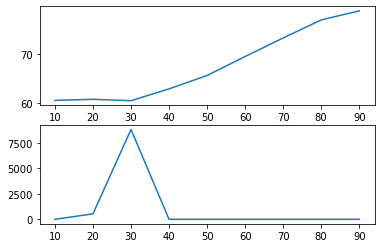

In [25]:
import matplotlib.pyplot as plt

plt.subplot(211)
plt.plot(eps,times)
plt.subplot(212)
plt.plot(eps,scores)

plt.show()

In [7]:
from sklearn.cluster import KMeans
import time
t0 = time.time()
kmeans = KMeans(n_clusters=10, random_state=0).fit(train_data)
t1 = time.time()
t1-t0

60.60094094276428

In [ ]:
from sklearn.cluster import KMeans
centers = np.zeros(shape=(5000,2048))
labels=kmeans.labels_
t0=time.time()
for i in range(10):
    r1 = i*500
    r2 = (i+1)*500
    index = np.argwhere(labels == i).squeeze()
    c = train_data[index]
    kmeans = KMeans(n_clusters=500, random_state=0).fit(c)
    centers[r1:r2] = kmeans.cluster_centers_
t1=time.time()
centers.shape,t1-t2

In [ ]:
t0 = time.time()
kmeans = KMeans(n_clusters=5000, random_state=0).fit(train_data)
t1 = time.time()
t1-t0

In [29]:
kmeans.labels_.max()

9

In [ ]:
cluster_num

In [ ]:
1

### temporal

In [8]:
def find_alpha(prev_data, train_data, n_neighbors):
    if prev_data is None:
        return np.zeros(len(train_data))
    # number of trees in random projection forest
    n_trees = min(64, 5 + int(round((train_data.shape[0]) ** 0.5 / 20.0)))
    # max number of nearest neighbor iters to perform
    n_iters = max(5, int(round(np.log2(train_data.shape[0]))))
    # distance metric
    metric = "euclidean"
    
    from pynndescent import NNDescent
    # get nearest neighbors
    nnd = NNDescent(
        train_data,
        n_neighbors=n_neighbors,
        metric="euclidean",
        n_trees=n_trees,
        n_iters=n_iters,
        max_candidates=60,
        verbose=True
    )
    train_indices, _ = nnd.neighbor_graph
    prev_nnd = NNDescent(
        prev_data,
        n_neighbors=n_neighbors,
        metric="euclidean",
        n_trees=n_trees,
        n_iters=n_iters,
        max_candidates=60,
        verbose=True
    )
    prev_indices, _ = prev_nnd.neighbor_graph
    temporal_pres = np.zeros(len(train_data))
    for i in range(len(train_indices)):
        pres = np.intersect1d(train_indices[i],prev_indices[i])
        temporal_pres[i] = len(pres) / float(n_neighbors)
    return temporal_pres

In [9]:
a = find_alpha(None, train_data, 15)

In [9]:
import time
t0=time.time()
b = find_alpha(prev_data, test_data,30)
t1=time.time()
t1-t0

Wed Feb  3 20:24:11 2021 Building RP forest with 10 trees
Wed Feb  3 20:24:12 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations
Wed Feb  3 20:24:25 2021 Building RP forest with 10 trees
Wed Feb  3 20:24:25 2021 NN descent for 13 iterations
	 1  /  13
	 2  /  13
	 3  /  13
	Stopping threshold met -- exiting after 3 iterations


26.444275379180908

In [10]:
b.max(),b.min(), b.mean()

(0.8, 0.03333333333333333, 0.11454333333333334)

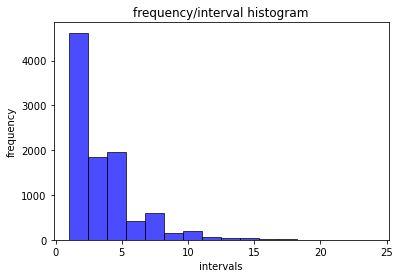

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
plt.hist(b*30, bins=16, density=0, stacked=True, facecolor="blue", edgecolor="black", alpha=0.7)
# 显示横轴标签
plt.xlabel("intervals")
# 显示纵轴标签
plt.ylabel("frequency")
# 显示图标题
plt.title("frequency/interval histogram")
plt.show()

In [16]:
b.max(),b.min(),b.mean()

(0.7333333333333333, 0.03333333333333333, 0.14611)

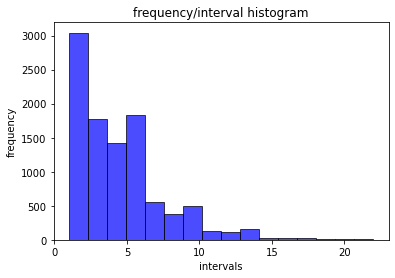

In [17]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
plt.hist(b*30, bins=16, density=0, stacked=True, facecolor="blue", edgecolor="black", alpha=0.7)
# 显示横轴标签
plt.xlabel("intervals")
# 显示纵轴标签
plt.ylabel("frequency")
# 显示图标题
plt.title("frequency/interval histogram")
plt.show()

### build a new complex

In [5]:
# define encoderd
import tensorflow as tf
physical_devices = tf.config.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], True)

In [6]:
model_name = 'cifar10_ResNet56v1_model.{:03d}.h5'.format(20)
modelpath = os.path.join(os.path.join(os.getcwd(), 'resnet_models'), model_name)
load_model = tf.keras.models.load_model(modelpath)

In [3]:
from parametric_umap_DBP import construct_mixed_edge_dataset
from parametric_umap_DBP import umap_loss
from parametric_umap_DBP import temporal_loss

In [4]:
dims = (64,)
n_components = 2
low_dims =(n_components,)

n_epochs = 200 

In [5]:
encoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=dims),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=n_components),
])
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 64)                0         
_________________________________________________________________
dense (Dense)                (None, 32)                2080      
_________________________________________________________________
dense_1 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_3 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_4 (Dense)              (None, 2)                 66        
Total params: 5,314
Trainable params: 5,314
Non-trainable params: 0
______________________________________________________

In [6]:
# define the decoder
decoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(n_components)),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=np.product(dims), name="recon", activation=None),
    tf.keras.layers.Reshape(dims),

])
decoder.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_5 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_6 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_7 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_8 (Dense)              (None, 32)                1056      
_________________________________________________________________
recon (Dense)                (None, 64)                2112      
_________________________________________________________________
reshape (Reshape)            (None, 64)                0         
Total params: 5,376
Trainable params: 5,376
Non-trainable params: 0
____________________________________________________

In [10]:
import keras.backend as K
# define model
# network outputs
outputs = {}

# inputs
to_x = tf.keras.layers.Input(shape=dims, name="to_x")
from_x = tf.keras.layers.Input(shape=dims, name="from_x")
to_alpha = tf.keras.layers.Input(shape=(1, ), name="to_alpha")
to_px = tf.keras.layers.Input(shape=low_dims, name="to_px")
weight = tf.keras.layers.Input(shape=(1, ), name="weight")
inputs = (to_x, from_x, to_alpha, to_px, weight)

# parametric embedding
embedding_to = encoder(to_x)
embedding_from = encoder(from_x)

# parametric reconstruction
embedding_to_recon = decoder(embedding_to)

embedding_to_recon = tf.keras.layers.Lambda(
    lambda x: x, name="reconstruction"
)(embedding_to_recon)

outputs["reconstruction"] = embedding_to_recon

# concatenate to/from projections for loss computation
embedding_to_from = tf.concat((embedding_to, embedding_from, weight), axis=1)
embedding_to_from = tf.keras.layers.Lambda(lambda x: x, name="umap")(
    embedding_to_from
)

# weights = tf.keras.layers.Lambda(lambda x: x, name="weights")(
#     weight
# )

outputs["umap"] = embedding_to_from

# outputs["weights"] = weights
embedding_diff = K.sqrt(K.sum(K.square(to_px - embedding_to),axis=0))
embedding_diff = embedding_diff*to_alpha
embedding_diff = tf.keras.layers.Lambda(lambda x: x, name="temporal")(
    embedding_diff
)
outputs["temporal"] = embedding_diff

# create model
parametric_model = tf.keras.Model(inputs=inputs, outputs=outputs,)

In [14]:
from umap.umap_ import find_ab_params
min_dist = 0.1
_a, _b = find_ab_params(1.0, min_dist)
negative_sample_rate = 5
optimizer = tf.keras.optimizers.Adam(1e-3)
batch_size = 200
# TODO dummy
edge_weight = 1

In [15]:
#compile models
losses = {}
loss_weights = {}

umap_loss_fn = umap_loss(
    batch_size,
    negative_sample_rate,
    _a,
    _b,
    edge_weight,
    True,
)

losses["umap"] = umap_loss_fn
loss_weights["umap"] = 1.0

# losses["weights"] = tpdbp_loss_fn
# loss_weights["weights"] = 0.1

losses["reconstruction"] = tf.keras.losses.MeanSquaredError()
loss_weights["reconstruction"] = 1.0

temporal_loss_fn = temporal_loss()
losses["temporal"] = temporal_loss_fn
loss_weights["temporal"] = 0.1

parametric_model.compile(
    optimizer=optimizer, loss=losses, loss_weights=loss_weights,
)

In [12]:
from parametric_umap import ParametricUMAP

In [13]:
# define encoder
dims = (64,)
n_components = 2
encoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=dims),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=n_components),
])
encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                1056      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 66        
Total params: 3,202
Trainable params: 3,202
Non-trainable params: 0
_________________________________________________________________


In [14]:
# define the decoder
decoder = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(n_components)),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=32, activation="relu"),
    tf.keras.layers.Dense(units=np.product(dims), name="recon", activation=None),
    tf.keras.layers.Reshape(dims),

])
decoder.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_5 (Dense)              (None, 32)                1056      
_________________________________________________________________
recon (Dense)                (None, 64)                2112      
_________________________________________________________________
reshape (Reshape)            (None, 64)                0         
Total params: 3,264
Trainable params: 3,264
Non-trainable params: 0
_________________________________________________________________


In [15]:
def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 5:
        lr *= 1e-1
    elif epoch > 15:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

keras_fit_kwargs = {"callbacks": [
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        min_delta=10**-2,
        patience=10,
        verbose=1,
    ),
    tf.keras.callbacks.TensorBoard(log_dir='logs/mse/',histogram_freq=1),
#     tf.keras.callbacks.LearningRateScheduler(lr_schedule),
#     tf.keras.callbacks.ReduceLROnPlateau(factor=np.sqrt(0.1),
#                                cooldown=0,
#                                patience=5,
#                                min_lr=0.5e-6)
]}

In [16]:
embedder = ParametricUMAP(
    encoder=encoder,
    decoder=decoder,
    dims=dims,
    parametric_reconstruction=True,
    optimizer = tf.keras.optimizers.Adam(1e-3),
#     reconstruction_validation=validation_data,
    autoencoder_loss=True,
    n_training_epochs=100,
    keras_fit_kwargs = keras_fit_kwargs,
    verbose=True,
)

## print the result for each snapshot and draw a demo for it

ParametricUMAP(autoencoder_loss=True,
               decoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000247DFF52518>,
               dims=(64,),
               encoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000247DFF81CF8>,
               keras_fit_kwargs={'callbacks': [<tensorflow.python.keras.callbacks.EarlyStopping object at 0x00000247E0FAE390>,
                                               <tensorflow.python.keras.callbacks.TensorBoard object at 0x00000247E0FAEDA0>]},
               n_training_epochs=100,
               optimizer=<tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x00000247DFFBBB38>,
               parametric_reconstruction=True)
Construct fuzzy simplicial set
Thu Dec 17 00:29:37 2020 Finding Nearest Neighbors
Thu Dec 17 00:29:37 2020 Building RP forest with 16 trees
Thu Dec 17 00:29:38 2020 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting aft

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
612/612 [==============================] - 6s 9ms/step - loss: 2.3267 - reconstruction_loss: 2.0260 - umap_loss: 0.3007
Epoch 2/1000
612/612 [==============================] - 4s 7ms/step - loss: 0.7633 - reconstruction_loss: 0.5487 - umap_loss: 0.2146
Epoch 3/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.6802 - reconstruction_loss: 0.4785 - umap_loss: 0.2017
Epoch 4/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.6139 - reconstruction_loss: 0.4196 - umap_loss: 0.1943
Epoch 5/1000
612/612 [==============================] - 5s 7ms/step - loss: 0.5867 - reconstruction_loss: 0.3973 - umap_loss: 0.1894
Epoch 6/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.5683 - reconstruction_loss: 0.3810 - umap_loss: 0.1873
Epoch 7/1000
612/612 [==============================] - 5s 7ms/step - loss: 0.5533 - reconstruction_loss: 0.3680 - umap_loss: 0.1853
Epoch 8/1000
612/612 [==============================] - 5s 7ms/step -

	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold met -- exiting after 4 iterations
Thu Dec 17 00:33:09 2020 Finished Nearest Neighbor Search
Thu Dec 17 00:33:10 2020 Construct embedding


D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
620/620 [==============================] - 7s 10ms/step - loss: 0.4961 - reconstruction_loss: 0.3165 - umap_loss: 0.1796
Epoch 2/1000
620/620 [==============================] - 6s 9ms/step - loss: 0.4527 - reconstruction_loss: 0.2786 - umap_loss: 0.1740
Epoch 3/1000
620/620 [==============================] - 5s 9ms/step - loss: 0.4494 - reconstruction_loss: 0.2760 - umap_loss: 0.1734
Epoch 4/1000
620/620 [==============================] - 6s 9ms/step - loss: 0.4469 - reconstruction_loss: 0.2744 - umap_loss: 0.1725
Epoch 5/1000
620/620 [==============================] - 6s 9ms/step - loss: 0.4451 - reconstruction_loss: 0.2728 - umap_loss: 0.1723
Epoch 6/1000
620/620 [==============================] - 6s 9ms/step - loss: 0.4434 - reconstruction_loss: 0.2718 - umap_loss: 0.1716
Epoch 7/1000
620/620 [==============================] - 6s 9ms/step - loss: 0.4427 - reconstruction_loss: 0.2712 - umap_loss: 0.1716A: 1s - loss: 0.4429 - reconstructio
Epoch 8/1000
620/620 [==========

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
626/626 [==============================] - 6s 9ms/step - loss: 0.4206 - reconstruction_loss: 0.2403 - umap_loss: 0.1803
Epoch 2/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3874 - reconstruction_loss: 0.2127 - umap_loss: 0.1747
Epoch 3/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3838 - reconstruction_loss: 0.2104 - umap_loss: 0.1734
Epoch 4/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3812 - reconstruction_loss: 0.2090 - umap_loss: 0.1722
Epoch 5/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3800 - reconstruction_loss: 0.2081 - umap_loss: 0.1720
Epoch 6/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3787 - reconstruction_loss: 0.2073 - umap_loss: 0.1714
Epoch 7/1000
626/626 [==============================] - 5s 8ms/step - loss: 0.3779 - reconstruction_loss: 0.2068 - umap_loss: 0.1711
Epoch 8/1000
626/626 [==============================] - 5s 8ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
633/633 [==============================] - 7s 10ms/step - loss: 0.3922 - reconstruction_loss: 0.2085 - umap_loss: 0.1837
Epoch 2/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3696 - reconstruction_loss: 0.1927 - umap_loss: 0.1769
Epoch 3/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3674 - reconstruction_loss: 0.1911 - umap_loss: 0.1763
Epoch 4/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3654 - reconstruction_loss: 0.1901 - umap_loss: 0.1753A: 1s - loss: 0.3655 - reconstruction_loss: 0.1902
Epoch 5/1000
633/633 [==============================] - 6s 10ms/step - loss: 0.3634 - reconstruction_loss: 0.1887 - umap_loss: 0.1747
Epoch 6/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3629 - reconstruction_loss: 0.1888 - umap_loss: 0.1741
Epoch 7/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3619 - reconstruction_loss: 0.1882 - umap_loss: 0.1736
Epoch 8/1000
633/

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
635/635 [==============================] - 7s 10ms/step - loss: 0.3472 - reconstruction_loss: 0.1714 - umap_loss: 0.1758
Epoch 2/1000
635/635 [==============================] - 6s 9ms/step - loss: 0.3268 - reconstruction_loss: 0.1568 - umap_loss: 0.1700
Epoch 3/1000
635/635 [==============================] - 6s 10ms/step - loss: 0.3249 - reconstruction_loss: 0.1552 - umap_loss: 0.1697
Epoch 4/1000
635/635 [==============================] - 6s 9ms/step - loss: 0.3231 - reconstruction_loss: 0.1542 - umap_loss: 0.1689
Epoch 5/1000
635/635 [==============================] - 6s 9ms/step - loss: 0.3219 - reconstruction_loss: 0.1538 - umap_loss: 0.1681
Epoch 6/1000
635/635 [==============================] - 6s 9ms/step - loss: 0.3216 - reconstruction_loss: 0.1536 - umap_loss: 0.1681
Epoch 7/1000
635/635 [==============================] - 5s 8ms/step - loss: 0.3208 - reconstruction_loss: 0.1533 - umap_loss: 0.1675
Epoch 8/1000
635/635 [==============================] - 6s 9ms/step

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
633/633 [==============================] - 6s 9ms/step - loss: 0.3321 - reconstruction_loss: 0.1635 - umap_loss: 0.1686
Epoch 2/1000
633/633 [==============================] - 5s 8ms/step - loss: 0.3181 - reconstruction_loss: 0.1539 - umap_loss: 0.1642
Epoch 3/1000
633/633 [==============================] - 5s 8ms/step - loss: 0.3160 - reconstruction_loss: 0.1526 - umap_loss: 0.1635
Epoch 4/1000
633/633 [==============================] - 5s 7ms/step - loss: 0.3151 - reconstruction_loss: 0.1521 - umap_loss: 0.1630
Epoch 5/1000
633/633 [==============================] - 5s 8ms/step - loss: 0.3134 - reconstruction_loss: 0.1513 - umap_loss: 0.1621
Epoch 6/1000
633/633 [==============================] - 5s 8ms/step - loss: 0.3124 - reconstruction_loss: 0.1508 - umap_loss: 0.1616
Epoch 7/1000
633/633 [==============================] - 5s 7ms/step - loss: 0.3129 - reconstruction_loss: 0.1507 - umap_loss: 0.1622
Epoch 8/1000
633/633 [==============================] - 5s 8ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
646/646 [==============================] - 7s 10ms/step - loss: 0.3018 - reconstruction_loss: 0.1294 - umap_loss: 0.1724
Epoch 2/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2912 - reconstruction_loss: 0.1218 - umap_loss: 0.1694
Epoch 3/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2884 - reconstruction_loss: 0.1205 - umap_loss: 0.1679A:
Epoch 4/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2865 - reconstruction_loss: 0.1197 - umap_loss: 0.1668
Epoch 5/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2858 - reconstruction_loss: 0.1194 - umap_loss: 0.1664
Epoch 6/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2856 - reconstruction_loss: 0.1192 - umap_loss: 0.1664
Epoch 7/1000
646/646 [==============================] - 6s 9ms/step - loss: 0.2850 - reconstruction_loss: 0.1190 - umap_loss: 0.1660
Epoch 8/1000
646/646 [==============================] - 6s 9ms/ste

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
637/637 [==============================] - 6s 9ms/step - loss: 0.3013 - reconstruction_loss: 0.1241 - umap_loss: 0.1771
Epoch 2/1000
637/637 [==============================] - 5s 8ms/step - loss: 0.2916 - reconstruction_loss: 0.1182 - umap_loss: 0.1733
Epoch 3/1000
637/637 [==============================] - 5s 7ms/step - loss: 0.2897 - reconstruction_loss: 0.1174 - umap_loss: 0.1723
Epoch 4/1000
637/637 [==============================] - 5s 8ms/step - loss: 0.2894 - reconstruction_loss: 0.1170 - umap_loss: 0.1723A: 2s - loss: 0.2897 - r
Epoch 5/1000
637/637 [==============================] - 5s 8ms/step - loss: 0.2892 - reconstruction_loss: 0.1168 - umap_loss: 0.1723
Epoch 6/1000
637/637 [==============================] - 5s 8ms/step - loss: 0.2882 - reconstruction_loss: 0.1166 - umap_loss: 0.1716
Epoch 7/1000
637/637 [==============================] - 5s 8ms/step - loss: 0.2879 - reconstruction_loss: 0.1161 - umap_loss: 0.1718
Epoch 8/1000
637/637 [=======================

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
644/644 [==============================] - 7s 10ms/step - loss: 0.3084 - reconstruction_loss: 0.1537 - umap_loss: 0.1547
Epoch 2/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.3001 - reconstruction_loss: 0.1481 - umap_loss: 0.1520A: 2s - loss: 0.3004
Epoch 3/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.2985 - reconstruction_loss: 0.1473 - umap_loss: 0.1513
Epoch 4/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.2980 - reconstruction_loss: 0.1470 - umap_loss: 0.1510
Epoch 5/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.2960 - reconstruction_loss: 0.1461 - umap_loss: 0.1499
Epoch 6/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.2965 - reconstruction_loss: 0.1462 - umap_loss: 0.1503
Epoch 7/1000
644/644 [==============================] - 6s 9ms/step - loss: 0.2957 - reconstruction_loss: 0.1458 - umap_loss: 0.1499
Epoch 8/1000
644/644 [==========================

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
650/650 [==============================] - 7s 10ms/step - loss: 0.3154 - reconstruction_loss: 0.1656 - umap_loss: 0.1497
Epoch 2/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3120 - reconstruction_loss: 0.1642 - umap_loss: 0.1478
Epoch 3/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3120 - reconstruction_loss: 0.1638 - umap_loss: 0.1483
Epoch 4/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3116 - reconstruction_loss: 0.1636 - umap_loss: 0.1480
Epoch 5/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3109 - reconstruction_loss: 0.1634 - umap_loss: 0.1475
Epoch 6/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3105 - reconstruction_loss: 0.1630 - umap_loss: 0.1475A - ETA: 0s - loss: 0.3106 - reconstruction_loss: 0.1630 - umap_loss
Epoch 7/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3106 - reconstruction_loss: 0.1631 - umap_loss: 0.1474


D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
650/650 [==============================] - 6s 9ms/step - loss: 0.3267 - reconstruction_loss: 0.1778 - umap_loss: 0.1489
Epoch 2/1000
650/650 [==============================] - 5s 8ms/step - loss: 0.3231 - reconstruction_loss: 0.1758 - umap_loss: 0.1473
Epoch 3/1000
650/650 [==============================] - 5s 7ms/step - loss: 0.3218 - reconstruction_loss: 0.1751 - umap_loss: 0.1467
Epoch 4/1000
650/650 [==============================] - 5s 8ms/step - loss: 0.3216 - reconstruction_loss: 0.1752 - umap_loss: 0.1465
Epoch 5/1000
650/650 [==============================] - 5s 7ms/step - loss: 0.3211 - reconstruction_loss: 0.1747 - umap_loss: 0.1464
Epoch 6/1000
650/650 [==============================] - 5s 8ms/step - loss: 0.3209 - reconstruction_loss: 0.1747 - umap_loss: 0.1462
Epoch 7/1000
650/650 [==============================] - 5s 8ms/step - loss: 0.3208 - reconstruction_loss: 0.1745 - umap_loss: 0.1463
Epoch 8/1000
650/650 [==============================] - 5s 8ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
647/647 [==============================] - 7s 10ms/step - loss: 0.3334 - reconstruction_loss: 0.1863 - umap_loss: 0.1471
Epoch 2/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3307 - reconstruction_loss: 0.1845 - umap_loss: 0.1462A: 2s - loss: 0.331
Epoch 3/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3297 - reconstruction_loss: 0.1840 - umap_loss: 0.1457
Epoch 4/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3292 - reconstruction_loss: 0.1835 - umap_loss: 0.1457
Epoch 5/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3290 - reconstruction_loss: 0.1837 - umap_loss: 0.1453
Epoch 6/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3284 - reconstruction_loss: 0.1831 - umap_loss: 0.1453
Epoch 7/1000
647/647 [==============================] - 6s 9ms/step - loss: 0.3285 - reconstruction_loss: 0.1833 - umap_loss: 0.1452
Epoch 8/1000
647/647 [===========================

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3238 - reconstruction_loss: 0.1813 - umap_loss: 0.1425
Epoch 2/1000
651/651 [==============================] - 5s 8ms/step - loss: 0.3215 - reconstruction_loss: 0.1801 - umap_loss: 0.1415
Epoch 3/1000
651/651 [==============================] - 5s 8ms/step - loss: 0.3216 - reconstruction_loss: 0.1800 - umap_loss: 0.1416
Epoch 4/1000
651/651 [==============================] - 5s 8ms/step - loss: 0.3216 - reconstruction_loss: 0.1801 - umap_loss: 0.1415
Epoch 5/1000
651/651 [==============================] - 5s 8ms/step - loss: 0.3212 - reconstruction_loss: 0.1801 - umap_loss: 0.1410
Epoch 6/1000
651/651 [==============================] - 5s 7ms/step - loss: 0.3212 - reconstruction_loss: 0.1797 - umap_loss: 0.1415
Epoch 7/1000
651/651 [==============================] - 5s 8ms/step - loss: 0.3202 - reconstruction_loss: 0.1794 - umap_loss: 0.1408
Epoch 8/1000
651/651 [==============================] - 5s 8ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
652/652 [==============================] - 6s 8ms/step - loss: 0.3233 - reconstruction_loss: 0.1831 - umap_loss: 0.1402
Epoch 2/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3227 - reconstruction_loss: 0.1828 - umap_loss: 0.1399
Epoch 3/1000
652/652 [==============================] - 5s 7ms/step - loss: 0.3222 - reconstruction_loss: 0.1825 - umap_loss: 0.1397
Epoch 4/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3221 - reconstruction_loss: 0.1825 - umap_loss: 0.1396
Epoch 5/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3221 - reconstruction_loss: 0.1826 - umap_loss: 0.1396
Epoch 6/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3220 - reconstruction_loss: 0.1824 - umap_loss: 0.1396
Epoch 7/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3217 - reconstruction_loss: 0.1826 - umap_loss: 0.1392
Epoch 8/1000
652/652 [==============================] - 5s 7ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
653/653 [==============================] - 7s 10ms/step - loss: 0.3250 - reconstruction_loss: 0.1864 - umap_loss: 0.1386
Epoch 2/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3255 - reconstruction_loss: 0.1866 - umap_loss: 0.1389
Epoch 3/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3247 - reconstruction_loss: 0.1863 - umap_loss: 0.1384
Epoch 4/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3249 - reconstruction_loss: 0.1864 - umap_loss: 0.1386
Epoch 5/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3242 - reconstruction_loss: 0.1863 - umap_loss: 0.1379
Epoch 6/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3241 - reconstruction_loss: 0.1861 - umap_loss: 0.1380
Epoch 7/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3245 - reconstruction_loss: 0.1863 - umap_loss: 0.1382
Epoch 8/1000
653/653 [==============================] - 6s 9ms/step 

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
652/652 [==============================] - 6s 8ms/step - loss: 0.3276 - reconstruction_loss: 0.1890 - umap_loss: 0.1387
Epoch 2/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3268 - reconstruction_loss: 0.1888 - umap_loss: 0.1380
Epoch 3/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3266 - reconstruction_loss: 0.1886 - umap_loss: 0.1380
Epoch 4/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3271 - reconstruction_loss: 0.1887 - umap_loss: 0.1384
Epoch 5/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3263 - reconstruction_loss: 0.1886 - umap_loss: 0.1377
Epoch 6/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3262 - reconstruction_loss: 0.1885 - umap_loss: 0.1377
Epoch 7/1000
652/652 [==============================] - 5s 8ms/step - loss: 0.3262 - reconstruction_loss: 0.1886 - umap_loss: 0.1375
Epoch 8/1000
652/652 [==============================] - 5s 8ms/step -

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
651/651 [==============================] - 7s 10ms/step - loss: 0.3249 - reconstruction_loss: 0.1877 - umap_loss: 0.1372: 4s
Epoch 2/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3251 - reconstruction_loss: 0.1873 - umap_loss: 0.1377
Epoch 3/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3254 - reconstruction_loss: 0.1877 - umap_loss: 0.1377
Epoch 4/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3247 - reconstruction_loss: 0.1873 - umap_loss: 0.1374
Epoch 5/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3246 - reconstruction_loss: 0.1874 - umap_loss: 0.1372
Epoch 6/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3245 - reconstruction_loss: 0.1873 - umap_loss: 0.1372
Epoch 7/1000
651/651 [==============================] - 6s 9ms/step - loss: 0.3249 - reconstruction_loss: 0.1875 - umap_loss: 0.1375
Epoch 8/1000
651/651 [==============================] - 6s 9ms/s

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
653/653 [==============================] - 7s 10ms/step - loss: 0.3245 - reconstruction_loss: 0.1872 - umap_loss: 0.1373
Epoch 2/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3240 - reconstruction_loss: 0.1872 - umap_loss: 0.1369
Epoch 3/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3242 - reconstruction_loss: 0.1873 - umap_loss: 0.1369
Epoch 4/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3248 - reconstruction_loss: 0.1872 - umap_loss: 0.1375
Epoch 5/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3240 - reconstruction_loss: 0.1869 - umap_loss: 0.1371
Epoch 6/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3241 - reconstruction_loss: 0.1870 - umap_loss: 0.1371
Epoch 7/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3237 - reconstruction_loss: 0.1869 - umap_loss: 0.1368
Epoch 8/1000
653/653 [==============================] - 6s 9ms/step 

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
653/653 [==============================] - 6s 8ms/step - loss: 0.3231 - reconstruction_loss: 0.1866 - umap_loss: 0.1365
Epoch 2/1000
653/653 [==============================] - 5s 7ms/step - loss: 0.3224 - reconstruction_loss: 0.1864 - umap_loss: 0.1360
Epoch 3/1000
653/653 [==============================] - 5s 7ms/step - loss: 0.3233 - reconstruction_loss: 0.1866 - umap_loss: 0.1367
Epoch 4/1000
653/653 [==============================] - 5s 8ms/step - loss: 0.3231 - reconstruction_loss: 0.1868 - umap_loss: 0.1362
Epoch 5/1000
653/653 [==============================] - 5s 7ms/step - loss: 0.3234 - reconstruction_loss: 0.1867 - umap_loss: 0.1367
Epoch 6/1000
653/653 [==============================] - 5s 8ms/step - loss: 0.3242 - reconstruction_loss: 0.1872 - umap_loss: 0.1370A: 0s - loss: 0.3242 - reconstruction_loss: 0.1872 - umap_loss: 0.137
Epoch 7/1000
653/653 [==============================] - 5s 8ms/step - loss: 0.3227 - reconstruction_loss: 0.1865 - umap_loss: 0.1362


D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3254 - reconstruction_loss: 0.1884 - umap_loss: 0.1370
Epoch 2/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3247 - reconstruction_loss: 0.1880 - umap_loss: 0.1367
Epoch 3/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3248 - reconstruction_loss: 0.1883 - umap_loss: 0.1365
Epoch 4/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3248 - reconstruction_loss: 0.1882 - umap_loss: 0.1366
Epoch 5/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3246 - reconstruction_loss: 0.1881 - umap_loss: 0.1365
Epoch 6/1000
653/653 [==============================] - 6s 9ms/step - loss: 0.3242 - reconstruction_loss: 0.1880 - umap_loss: 0.1362
Epoch 7/1000
653/653 [==============================] - 6s 10ms/step - loss: 0.3250 - reconstruction_loss: 0.1883 - umap_loss: 0.1367
Epoch 8/1000
653/653 [==============================] - 6s 9ms/step 

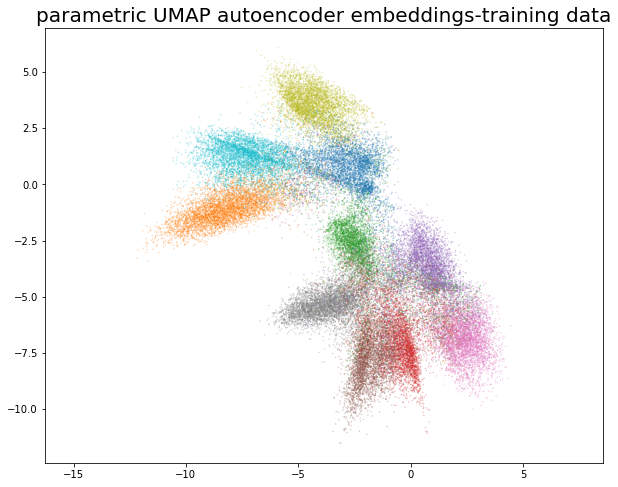

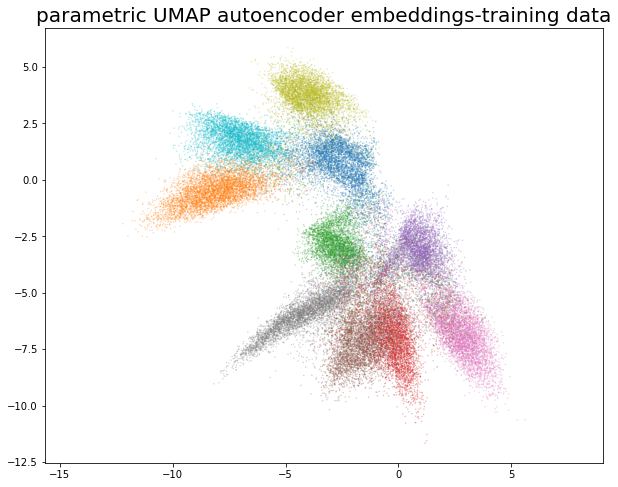

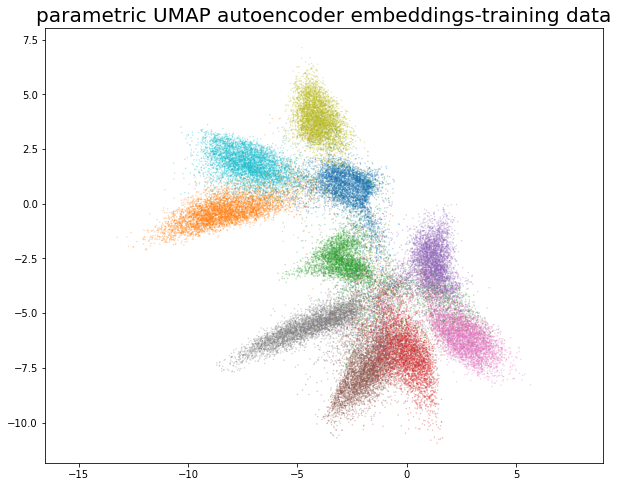

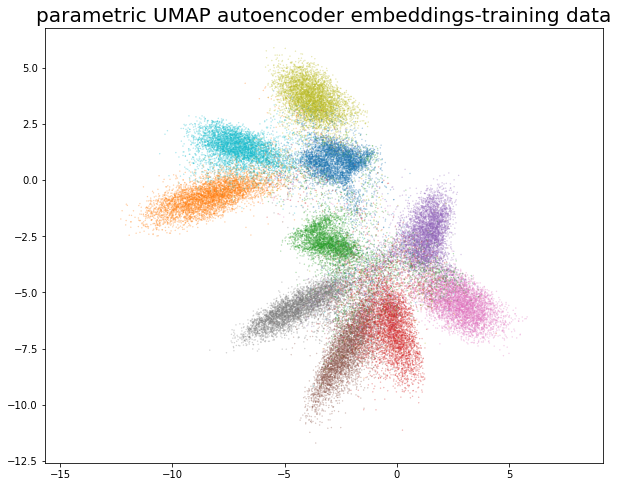

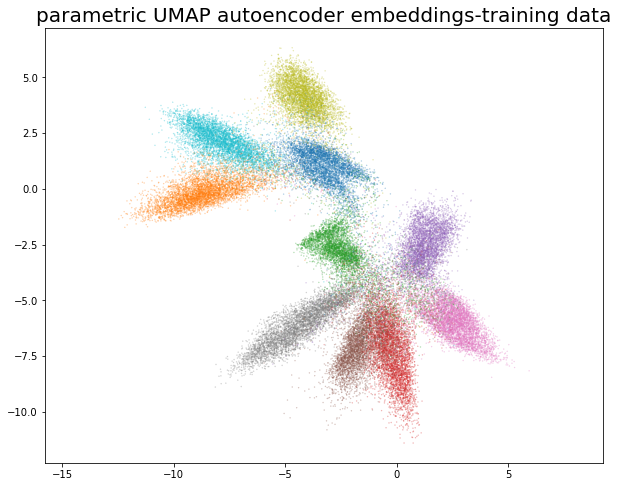

...

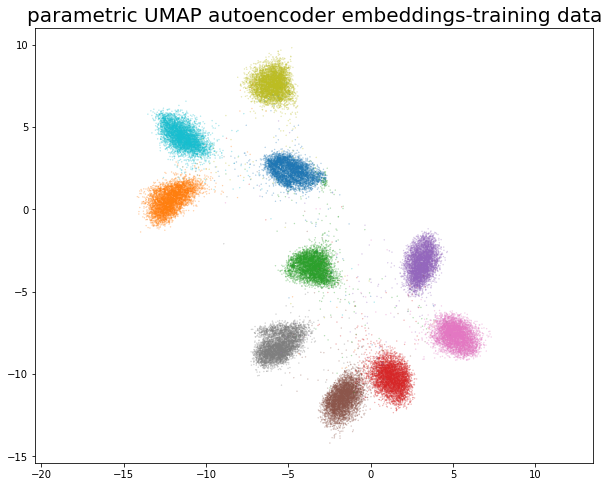

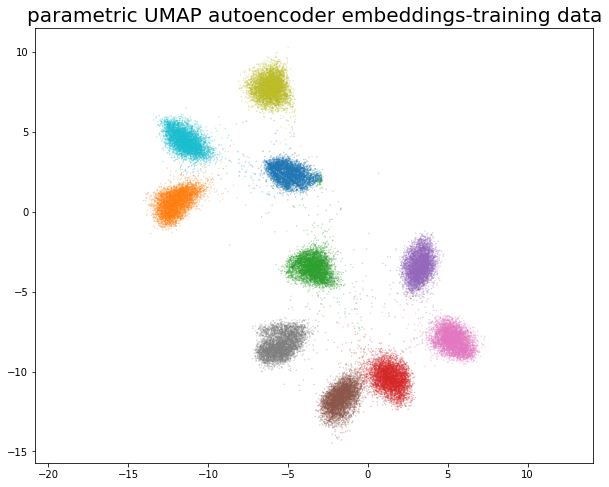

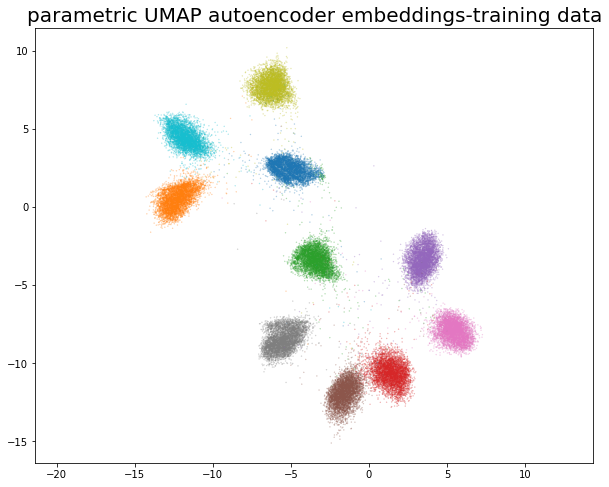

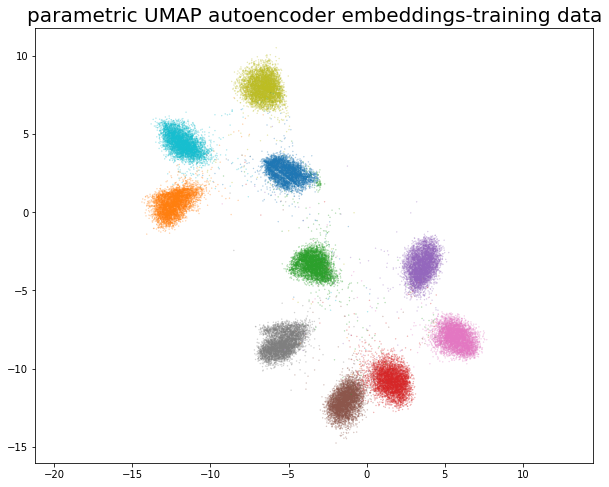

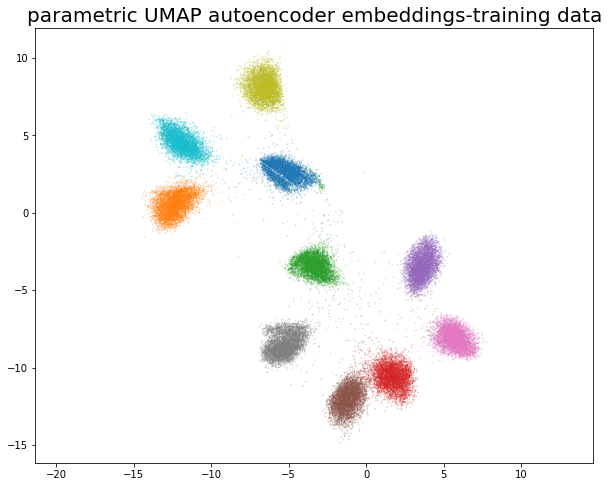

In [17]:
import matplotlib.pyplot as plt

data_dir = os.path.join(os.getcwd(),'high_output')
save_location = "parametric_umap_models\\ResNet56v1\\"
if not os.path.isdir(save_location):
    os.makedirs(save_location)
    
n_epoches = np.arange(10,210,10)
for n_epoch in n_epoches:
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch))
    train_data = np.load(datapath)
    embedding = embedder.fit_transform(train_data)
    z = embedder.transform(train_data)
    
    # save encoder
    encoder_output = os.path.join(save_location, "encoder_{:03d}".format(n_epoch))
    embedder.encoder.save(encoder_output)
    print("Keras encoder model saved to {}".format(encoder_output))
    
    # save decoder
    decoder_output = os.path.join(save_location, "decoder_{:03d}".format(n_epoch))
    embedder.decoder.save(decoder_output)
    print("Keras decoder model saved to {}".format(decoder_output))

    fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
    sc = ax.scatter(
        z[:, 0],
        z[:, 1],
        c=np.argmax(y_train, axis=1),
        cmap="tab10",
        s=0.1,
        alpha=0.5,
        rasterized=True,
    )
    ax.axis('equal')
    ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)
    fig.savefig("result/evaluation/parametricUmap/train_{:03d}".format(n_epoch))

50/50 [==============================] - 0s 1ms/step


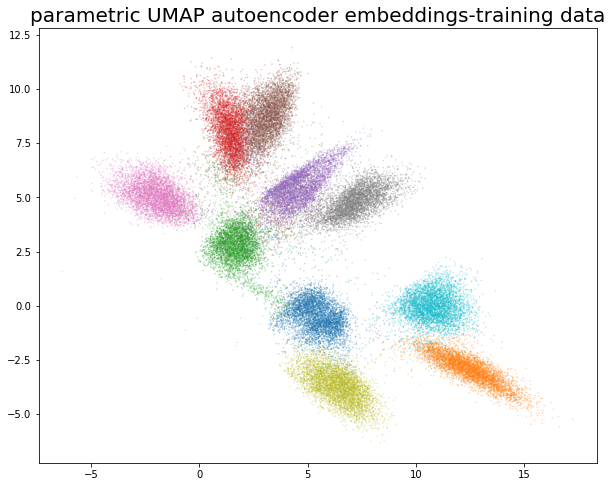

In [13]:
# example
import matplotlib.pyplot as plt
# Project data
z = embedder.transform(train_data)
# z = load_encoder(train_data)

fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
sc = ax.scatter(
    z[:, 0],
    z[:, 1],
    c=np.argmax(y_train, axis=1),
    cmap="tab10",
    s=0.1,
    alpha=0.5,
    rasterized=True,
)
ax.axis('equal')
ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)
fig.savefig("result/evaluation/parametricUmap/train_{:03d}".format(n_epoch))

In [18]:
from deepview import DeepView
# remember to reset embedder
save_location = "parametric_umap_models\\ResNet56v1\\"
if not os.path.isdir(save_location):
    os.makedirs(save_location)
    
data_dir = os.path.join(os.getcwd(),'high_output')
n_epoches = np.arange(10,210,10)

for n_epoch in n_epoches:
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch))
    train_data = np.load(datapath)
    
    embedding = embedder.fit_transform(train_data)
    
    # save encoder
    encoder_output = os.path.join(save_location, "encoder_{:03d}".format(n_epoch))
    embedder.encoder.save(encoder_output)
    print("Keras encoder model saved to {}".format(encoder_output))
    
    # save decoder
    decoder_output = os.path.join(save_location, "decoder_{:03d}".format(n_epoch))
    embedder.decoder.save(decoder_output)
    print("Keras decoder model saved to {}".format(decoder_output))


    # ---------------------load dataset------------------------------

    def pred_wrapper(x):
        model_name = 'cifar10_ResNet56v1_model.{:03d}.h5'.format(n_epoch)
        modelpath = os.path.join(os.path.join(os.getcwd(), 'resnet_models'), model_name)
        load_model = tf.keras.models.load_model(modelpath)
        
        #load fully connect layer
        fc_input = tf.keras.layers.Input(shape=(64,))
        logits = fc_input
        logits = load_model.get_layer("dense")(logits)
        fc_model = Model(inputs=fc_input,outputs=logits)
        

        output = fc_model(x)
        probabilities = tf.nn.softmax(output,axis=-1).cpu().numpy()
        return probabilities

    def visualization(image, point2d, pred, label=None, title=None):
        f, a = plt.subplots()
        a.set_title(title)
        a.imshow(image.transpose([1, 2, 0]))

    classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

    # ---------------------deepview------------------------------
    batch_size = 200
    max_samples = 50000
    data_shape = (2048,)
    n = 5
    lam = 0
    resolution = 100
    cmap = 'tab10'
    title = 'ResNet-56 - CIFAR10 GAP layer-parametric umap autoencoder'

    deepview = DeepView(pred_wrapper, classes, max_samples, batch_size,
                        data_shape, n, lam, resolution, cmap, title=title, data_viz=visualization,
                        clip_certainty=1.2, metric="parametricUmap", encoder=embedder.encoder, decoder=embedder.decoder)


    deepview.add_samples(train_data, np.argmax(y_train, axis=1))
    deepview.savefig("result\\evaluation\\parametricUmap\\deepview_train_{:03d}.png".format(n_epoch))

ParametricUMAP(autoencoder_loss=True, batch_size=1000,
               decoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000247DFF52518>,
               dims=(64,),
               encoder=<tensorflow.python.keras.engine.sequential.Sequential object at 0x00000247DFF81CF8>,
               keras_fit_kwargs={'callbacks': [<tensorflow.python.keras.callbacks.EarlyStopping object at 0x00000247E0FAE390>,
                                               <tensorflow.python.keras.callbacks.TensorBoard object at 0x00000247E0FAEDA0>]},
               n_training_epochs=100,
               optimizer=<tensorflow.python.keras.optimizer_v2.adam.Adam object at 0x00000247DFFBBB38>,
               parametric_reconstruction=True)
Construct fuzzy simplicial set
Thu Dec 17 01:00:55 2020 Finding Nearest Neighbors
Thu Dec 17 01:00:55 2020 Building RP forest with 16 trees
Thu Dec 17 01:00:56 2020 NN descent for 16 iterations
	 1  /  16
	 2  /  16
	 3  /  16
	 4  /  16
	Stopping threshold m

D:\xianglin\git_space\DeepVisualInsight\DeepView\parametric_umap.py:268: UserWarning: Data should be scaled to the range 0-1 for cross-entropy reconstruction loss.
  "Data should be scaled to the range 0-1 for cross-entropy reconstruction loss."


Epoch 1/1000
612/612 [==============================] - 6s 9ms/step - loss: 0.7064 - reconstruction_loss: 0.5027 - umap_loss: 0.2037
Epoch 2/1000
612/612 [==============================] - 5s 7ms/step - loss: 0.5293 - reconstruction_loss: 0.3440 - umap_loss: 0.1854
Epoch 3/1000
612/612 [==============================] - 5s 7ms/step - loss: 0.5142 - reconstruction_loss: 0.3318 - umap_loss: 0.1824
Epoch 4/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.5065 - reconstruction_loss: 0.3260 - umap_loss: 0.1805
Epoch 5/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.5016 - reconstruction_loss: 0.3220 - umap_loss: 0.1795A: 2s - loss: 0.5017 
Epoch 6/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.4982 - reconstruction_loss: 0.3196 - umap_loss: 0.1786
Epoch 7/1000
612/612 [==============================] - 5s 8ms/step - loss: 0.4967 - reconstruction_loss: 0.3181 - umap_loss: 0.1786
Epoch 8/1000
612/612 [==========================

ValueError: all the input array dimensions for the concatenation axis must match exactly, but along dimension 1, the array at index 0 has size 64 and the array at index 1 has size 2048

## compare the distance between high dimension data and low dimension data
k = high_dist / low_dist

In [ ]:
import pandas as pd
diff = pd.DataFrame(columns = ["epoches","max_dist","min_dist","mean_dist","median_dist","std_dist"])

In [ ]:
n_epoches = np.arange(2,36,2)
encoder_location = "parametric_umap_models\\ResNet56v1\\"

for n_epoch in n_epoches:
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch))
    train_prev = np.load(datapath)
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch+2))
    train_behind = np.load(datapath)
    
    # load encoder
    encoder_path = os.path.join(encoder_location, "encoder_{:03d}".format(n_epoch))
    encoder_prev = tf.keras.models.load_model(encoder_path)
    print("Keras encoder model loaded from {}".format(encoder_path))
    encoder_path = os.path.join(encoder_location, "encoder_{:03d}".format(n_epoch+2))
    encoder_behind = tf.keras.models.load_model(encoder_path)
    print("Keras encoder model loaded from {}".format(encoder_path))
    
    low_prev = encoder_prev(train_prev).cpu().numpy()
    low_behind = encoder_behind(train_behind).cpu().numpy()
    
    high_dist = np.linalg.norm(train_prev - train_behind,axis=1)
    low_dist = np.linalg.norm(low_prev - low_behind,axis=1)
    k = high_dist / low_dist
    
    max_k = k.max()
    min_k = k.min()
    mean_k = k.mean()
    median_k = np.median(k)
    std_k = k.std()
    epoch_num = "{:03d}/{:03d}".format(n_epoch,n_epoch+2)
    diff.loc[len(diff)] = [epoch_num, max_k, min_k,  mean_k, median_k,std_k]
diff

## print the result for each snapshot and draw a demo for it

Keras encoder model loaded from parametric_umap_models\ResNet56v1\encoder_010
Keras decoder model loaded from parametric_umap_models\ResNet56v1\decoder_010
Embedding samples ...
Computing decision regions ...


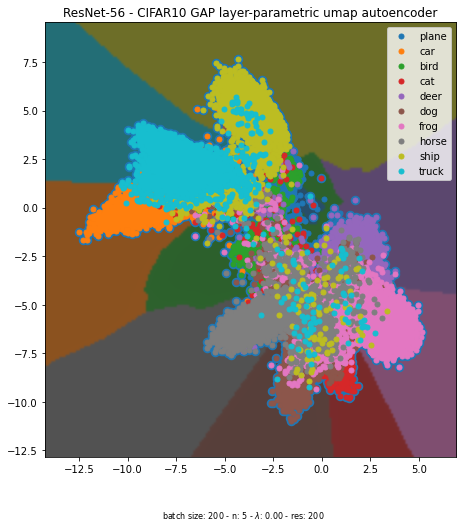

In [25]:
# using deepview
from deepview import DeepView
# remember to reset embedder
encoder_location = "parametric_umap_models\\ResNet56v1\\"
    
data_dir = os.path.join(os.getcwd(),'high_output')
n_epoches = np.arange(10,20,10)

for n_epoch in n_epoches:
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch))
    train_data = np.load(datapath)
    
    # load encoder
    encoder_path = os.path.join(encoder_location, "encoder_{:03d}".format(n_epoch))
    encoder = tf.keras.models.load_model(encoder_path)
    print("Keras encoder model loaded from {}".format(encoder_path))
    # load decoder
    decoder_path = os.path.join(encoder_location, "decoder_{:03d}".format(n_epoch))
    decoder = tf.keras.models.load_model(decoder_path)
    print("Keras decoder model loaded from {}".format(decoder_path))


    # ---------------------load dataset------------------------------

    def pred_wrapper(x):
        model_name = 'cifar10_ResNet56v1_model.{:03d}.h5'.format(n_epoch)
        modelpath = os.path.join(os.path.join(os.getcwd(), 'resnet_models'), model_name)
        load_model = tf.keras.models.load_model(modelpath)
        
        #load fully connect layer
        fc_input = tf.keras.layers.Input(shape=(64,))
        logits = fc_input
        logits = load_model.get_layer("dense")(logits)
        fc_model = Model(inputs=fc_input,outputs=logits)
        
        output = fc_model(x)
        probabilities = tf.nn.softmax(output,axis=-1).cpu().numpy()
        return probabilities

    def visualization(image, point2d, pred, label=None, title=None):
        f, a = plt.subplots()
        a.set_title(title)
        a.imshow(image.transpose([1, 2, 0]))

    classes = ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

    # ---------------------deepview------------------------------
    batch_size = 200
    max_samples = 50000
    data_shape = (64,)
    n = 5
    lam = 0
    resolution = 200
    cmap = 'tab10'
    title = 'ResNet-56 - CIFAR10 GAP layer-parametric umap autoencoder'

    deepview = DeepView(pred_wrapper, classes, max_samples, batch_size,
                        data_shape, n, lam, resolution, cmap, title=title, data_viz=visualization,
                        clip_certainty=0.1, metric="parametricUmap", encoder=encoder, decoder=decoder)


    deepview.add_samples(train_data, np.argmax(y_train, axis=1))
    deepview.savefig("result\\evaluation\\parametricUmap\\deepview_train_{:03d}.png".format(n_epoch))

In [ ]:
data_dir = os.path.join(os.getcwd(),'high_output')
encoder_location = "parametric_umap_models\\ResNet56v1\\"

n_epoches = np.arange(10,210,10)
for n_epoch in n_epoches:
    datapath = os.path.join(data_dir,"train_{:03d}.npy".format(n_epoch))
    train_data = np.load(datapath)
    
    # load encoder
    encoder_path = os.path.join(encoder_location, "encoder_{:03d}".format(n_epoch))
    encoder = tf.keras.models.load_model(encoder_path)
    print("Keras encoder model loaded from {}".format(encoder_path))
    
    z=encoder(train_data)
#     ??? .cpu.numpy()
    print(type(z))

    fig, ax = plt.subplots(ncols=1, figsize=(10, 8))
    sc = ax.scatter(
        z[:, 0],
        z[:, 1],
        c=np.argmax(y_train, axis=1),
        cmap="tab10",
        s=0.1,
        alpha=0.5,
        rasterized=True,
    )
    ax.axis('equal')
    ax.set_title("parametric UMAP autoencoder embeddings-training data", fontsize=20)
    fig.savefig("result/evaluation/parametricUmap/train_{:03d}".format(n_epoch))